In [1]:
import os
import warnings
warnings.filterwarnings('ignore')
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight') 
# Above is a special style template for matplotlib, highly useful for visualizing time series data
%matplotlib inline
from pylab import rcParams
from plotly import tools
import chart_studio.plotly as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from numpy.random import normal, seed
from scipy.stats import norm
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA
import math
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [3]:
df=pd.read_csv("Flipkart_Daily_Data.csv")
df.tail()

,Unnamed: 0,Name,LaptopID,RAM,HDD,SSD,Graphic,Link,Price,Best Offer,Date
17170,17170,Dell Inspiron Core i5 10th Gen - (8 GB/512 GB ...,COMFT2ZVPY6KCSFR,8,0,512,0,https://www.flipkart.com/dell-inspiron-core-i5...,"86,990",5,18/11
17171,17171,Asus APU Dual Core E1 E1-6010 - (4 GB/500 GB H...,COMEZZBGUF3BJJCQ,4,500,0,0,https://www.flipkart.com/asus-apu-dual-core-e1...,"21,990",5,18/11
17172,17172,MarQ by Flipkart Falkon Aerbook Core i5 8th Ge...,COMFHCFW6GVJHP8H,8,0,256,0,https://www.flipkart.com/marq-flipkart-falkon-...,"41,990",5,18/11
17173,17173,Dell G3 Series Core i5 8th Gen - (8 GB/1 TB HD...,COMF778XDUHZ5YP8,8,1024,128,4,https://www.flipkart.com/dell-g3-series-core-i...,"66,990",5,18/11
17174,17174,Lenovo Core i3 10th Gen - (4 GB/1 TB HDD/Windo...,COMFVSYVPYVEGZBH,4,1024,0,0,https://www.flipkart.com/lenovo-core-i3-10th-g...,"36,990",5,18/11


In [4]:
t=0
for i in range(len(df['Price'])):
    try:
        df['Price'][i]=int(df['Price'][i].replace(",",""))
    except TypeError as e:
        print(i)
z=df['Date']
for i in range(len(z)):
    z[i]=z[i]+'/2020'
a=pd.to_datetime(z,dayfirst=True)
df['Date']=a

In [6]:
Lap_list=list(set(df['LaptopID']))

0               Price
Date               
2020-10-15  78302.0
2020-10-16  78990.0
2020-10-17  78990.0
2020-10-18  78990.0
2020-10-19  78990.0
2020-10-20  78990.0
2020-10-21  78990.0
2020-10-22  78990.0
2020-10-23  78990.0
2020-10-24  78990.0
2020-10-25  78990.0
2020-10-26  78990.0
2020-10-27  78990.0
2020-10-28  78990.0
2020-10-29  78990.0
2020-10-30  78990.0
2020-10-31  78990.0
2020-11-01  78990.0
2020-11-02  78990.0
2020-11-03  79990.0
2020-11-04  79990.0
2020-11-05  79990.0
2020-11-06  79990.0
2020-11-07  79990.0
2020-11-08  79990.0
2020-11-09  79990.0
2020-11-10  79990.0
2020-11-11  76990.0
2020-11-12  76990.0
2020-11-13  76990.0
2020-11-14  78990.0
2020-11-15  78990.0
2020-11-16  77990.0
2020-11-17  77990.0
2020-11-18  77990.0


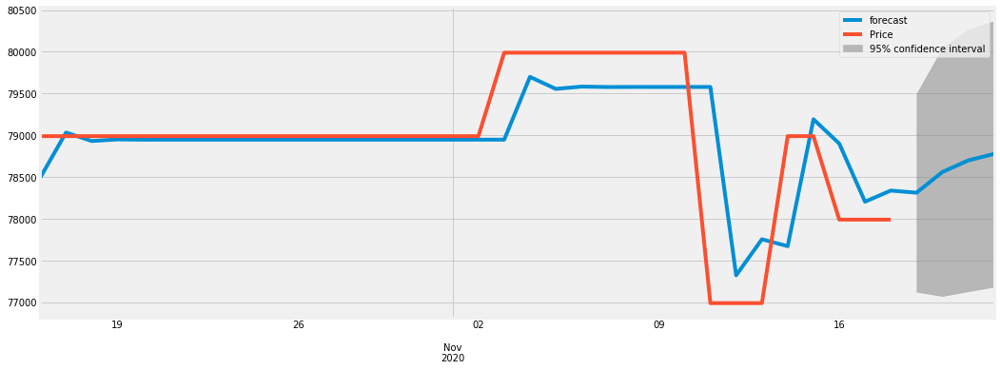

0.8789204114573189
2020-10-16    78493.935502
2020-10-17    79033.299400
2020-10-18    78931.644987
2020-10-19    78951.090947
2020-10-20    78947.370282
2020-10-21    78948.082222
2020-10-22    78947.945995
2020-10-23    78947.972062
2020-10-24    78947.967074
2020-10-25    78947.968028
2020-10-26    78947.967846
2020-10-27    78947.967881
2020-10-28    78947.967874
2020-10-29    78947.967875
2020-10-30    78947.967875
2020-10-31    78947.967875
2020-11-01    78947.967875
2020-11-02    78947.967875
2020-11-03    78947.967875
2020-11-04    79700.090397
2020-11-05    79556.174946
2020-11-06    79583.712556
2020-11-07    79578.443352
2020-11-08    79579.451591
2020-11-09    79579.258669
2020-11-10    79579.295584
2020-11-11    79579.288520
2020-11-12    77322.922306
2020-11-13    77754.668401
2020-11-14    77672.055619
2020-11-15    79192.108268
2020-11-16    78901.252647
2020-11-17    78204.784113
2020-11-18    78338.050410
2020-11-19    78312.550470
2020-11-20    78560.027249
2020-11-2

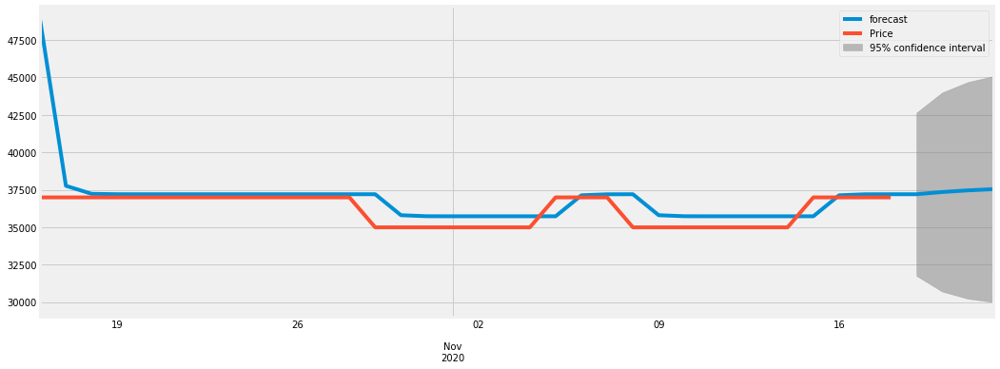

0.9136180203147208
2020-10-16    48825.714556
2020-10-17    37761.268286
2020-10-18    37227.509798
2020-10-19    37201.727016
2020-10-20    37200.481594
2020-10-21    37200.421434
2020-10-22    37200.418528
2020-10-23    37200.418388
2020-10-24    37200.418381
2020-10-25    37200.418381
2020-10-26    37200.418381
2020-10-27    37200.418381
2020-10-28    37200.418381
2020-10-29    37200.418381
2020-10-30    35799.247214
2020-10-31    35731.564465
2020-11-01    35728.295090
2020-11-02    35728.137165
2020-11-03    35728.129536
2020-11-04    35728.129168
2020-11-05    35728.129150
2020-11-06    37129.300317
2020-11-07    37196.983065
2020-11-08    37200.252440
2020-11-09    35799.239198
2020-11-10    35731.564078
2020-11-11    35728.295071
2020-11-12    35728.137164
2020-11-13    35728.129536
2020-11-14    35728.129168
2020-11-15    35728.129150
2020-11-16    37129.300317
2020-11-17    37196.983065
2020-11-18    37200.252440
2020-11-19    37200.410365
2020-11-20    37347.828462
2020-11-2

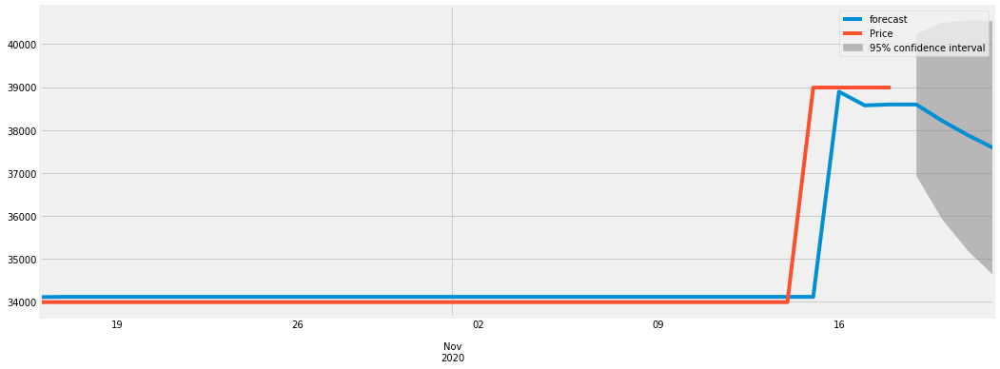

0.9891377714151259
2020-10-16    34106.526354
2020-10-17    34113.502046
2020-10-18    34113.009471
2020-10-19    34113.042158
2020-10-20    34113.039980
2020-10-21    34113.040125
2020-10-22    34113.040115
2020-10-23    34113.040116
2020-10-24    34113.040116
2020-10-25    34113.040116
2020-10-26    34113.040116
2020-10-27    34113.040116
2020-10-28    34113.040116
2020-10-29    34113.040116
2020-10-30    34113.040116
2020-10-31    34113.040116
2020-11-01    34113.040116
2020-11-02    34113.040116
2020-11-03    34113.040116
2020-11-04    34113.040116
2020-11-05    34113.040116
2020-11-06    34113.040116
2020-11-07    34113.040116
2020-11-08    34113.040116
2020-11-09    34113.040116
2020-11-10    34113.040116
2020-11-11    34113.040116
2020-11-12    34113.040116
2020-11-13    34113.040116
2020-11-14    34113.040116
2020-11-15    34113.040116
2020-11-16    38892.908094
2020-11-17    38574.445644
2020-11-18    38595.663455
2020-11-19    38594.249801
2020-11-20    38216.017247
2020-11-2

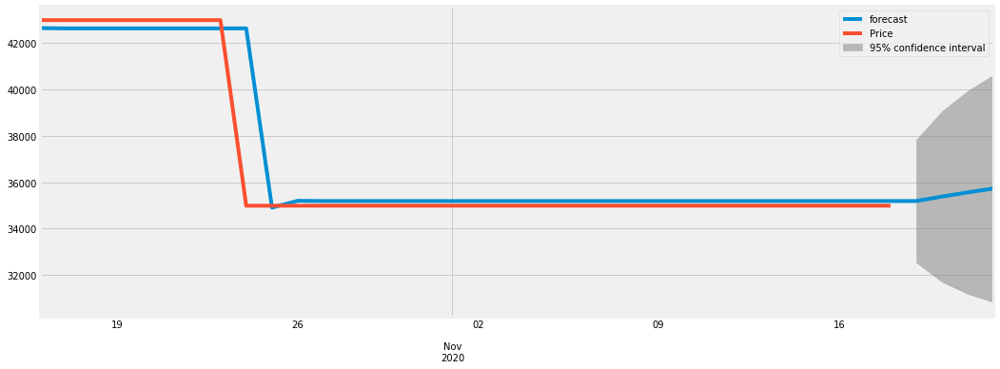

0.9949670106052426
2020-10-16    42645.841326
2020-10-17    42633.683228
2020-10-18    42634.160608
2020-10-19    42634.142528
2020-10-20    42634.143213
2020-10-21    42634.143187
2020-10-22    42634.143188
2020-10-23    42634.143188
2020-10-24    42634.143188
2020-10-25    34908.807246
2020-10-26    35201.787854
2020-10-27    35190.676669
2020-10-28    35191.098057
2020-10-29    35191.082076
2020-10-30    35191.082682
2020-10-31    35191.082659
2020-11-01    35191.082660
2020-11-02    35191.082660
2020-11-03    35191.082660
2020-11-04    35191.082660
2020-11-05    35191.082660
2020-11-06    35191.082660
2020-11-07    35191.082660
2020-11-08    35191.082660
2020-11-09    35191.082660
2020-11-10    35191.082660
2020-11-11    35191.082660
2020-11-12    35191.082660
2020-11-13    35191.082660
2020-11-14    35191.082660
2020-11-15    35191.082660
2020-11-16    35191.082660
2020-11-17    35191.082660
2020-11-18    35191.082660
2020-11-19    35191.082660
2020-11-20    35385.261547
2020-11-2

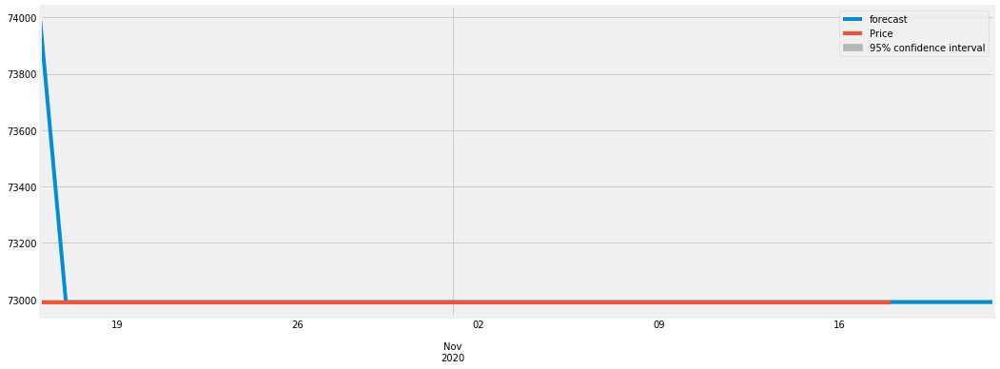

0.9999999999994943
2020-10-16    73990.000000
2020-10-17    72989.999299
2020-10-18    72990.000000
2020-10-19    72990.000000
2020-10-20    72990.000000
2020-10-21    72990.000000
2020-10-22    72990.000000
2020-10-23    72990.000000
2020-10-24    72990.000000
2020-10-25    72990.000000
2020-10-26    72990.000000
2020-10-27    72990.000000
2020-10-28    72990.000000
2020-10-29    72990.000000
2020-10-30    72990.000000
2020-10-31    72990.000000
2020-11-01    72990.000000
2020-11-02    72990.000000
2020-11-03    72990.000000
2020-11-04    72990.000000
2020-11-05    72990.000000
2020-11-06    72990.000000
2020-11-07    72990.000000
2020-11-08    72990.000000
2020-11-09    72990.000000
2020-11-10    72990.000000
2020-11-11    72990.000000
2020-11-12    72990.000000
2020-11-13    72990.000000
2020-11-14    72990.000000
2020-11-15    72990.000000
2020-11-16    72990.000000
2020-11-17    72990.000000
2020-11-18    72990.000000
2020-11-19    72990.000000
2020-11-20    72990.000000
2020-11-2

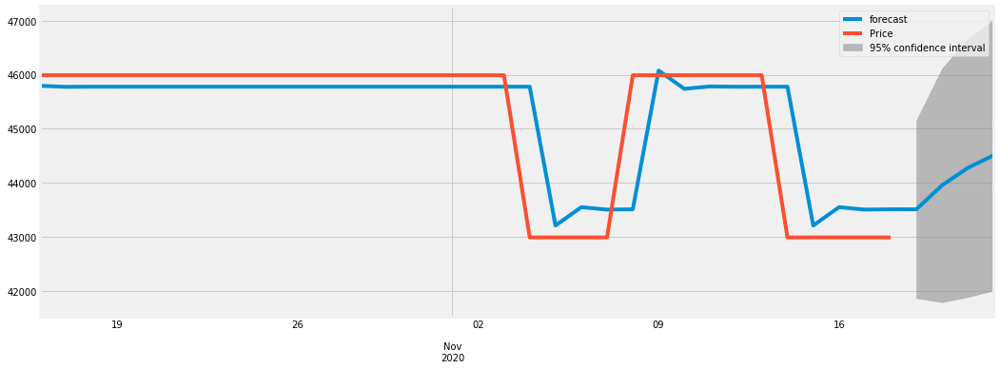

0.9466342353394546
2020-10-16    45794.811315
2020-10-17    45775.031947
2020-10-18    45777.907211
2020-10-19    45777.532710
2020-10-20    45777.582237
2020-10-21    45777.575700
2020-10-22    45777.576563
2020-10-23    45777.576449
2020-10-24    45777.576464
2020-10-25    45777.576462
2020-10-26    45777.576463
2020-10-27    45777.576462
2020-10-28    45777.576462
2020-10-29    45777.576462
2020-10-30    45777.576462
2020-10-31    45777.576462
2020-11-01    45777.576462
2020-11-02    45777.576462
2020-11-03    45777.576462
2020-11-04    45777.576462
2020-11-05    43210.518553
2020-11-06    43549.410113
2020-11-07    43504.671158
2020-11-08    43510.577396
2020-11-09    46076.855590
2020-11-10    45738.066964
2020-11-11    45782.792331
2020-11-12    45776.887887
2020-11-13    45777.667365
2020-11-14    45777.564462
2020-11-15    43210.520138
2020-11-16    43549.409904
2020-11-17    43504.671185
2020-11-18    43510.577392
2020-11-19    43509.797681
2020-11-20    43954.684197
2020-11-2

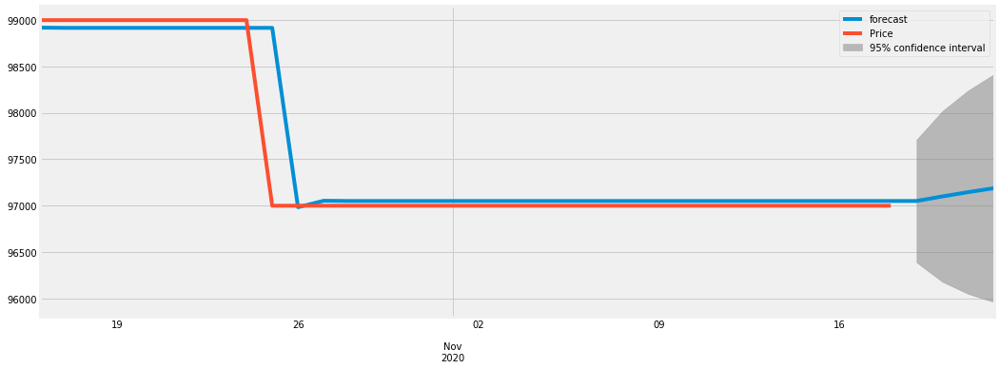

0.9953791119911332
2020-10-16    98918.179236
2020-10-17    98915.470066
2020-10-18    98915.570572
2020-10-19    98915.566968
2020-10-20    98915.567098
2020-10-21    98915.567093
2020-10-22    98915.567093
2020-10-23    98915.567093
2020-10-24    98915.567093
2020-10-25    98915.567093
2020-10-26    96982.995617
2020-10-27    97052.365268
2020-10-28    97049.875245
2020-10-29    97049.964624
2020-10-30    97049.961416
2020-10-31    97049.961531
2020-11-01    97049.961527
2020-11-02    97049.961527
2020-11-03    97049.961527
2020-11-04    97049.961527
2020-11-05    97049.961527
2020-11-06    97049.961527
2020-11-07    97049.961527
2020-11-08    97049.961527
2020-11-09    97049.961527
2020-11-10    97049.961527
2020-11-11    97049.961527
2020-11-12    97049.961527
2020-11-13    97049.961527
2020-11-14    97049.961527
2020-11-15    97049.961527
2020-11-16    97049.961527
2020-11-17    97049.961527
2020-11-18    97049.961527
2020-11-19    97049.961527
2020-11-20    97099.204924
2020-11-2

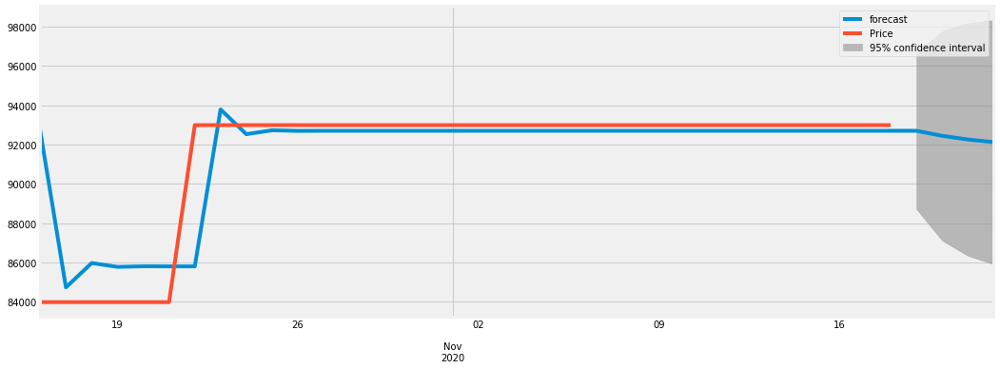

0.948554542443589
2020-10-16    92728.820490
2020-10-17    84739.880617
2020-10-18    85976.804472
2020-10-19    85781.998421
2020-10-20    85812.669424
2020-10-21    85807.839948
2020-10-22    85808.600389
2020-10-23    93787.191858
2020-10-24    92530.894464
2020-10-25    92728.709222
2020-10-26    92697.561598
2020-10-27    92702.466058
2020-10-28    92701.693809
2020-10-29    92701.815406
2020-10-30    92701.796259
2020-10-31    92701.799274
2020-11-01    92701.798799
2020-11-02    92701.798874
2020-11-03    92701.798862
2020-11-04    92701.798864
2020-11-05    92701.798864
2020-11-06    92701.798864
2020-11-07    92701.798864
2020-11-08    92701.798864
2020-11-09    92701.798864
2020-11-10    92701.798864
2020-11-11    92701.798864
2020-11-12    92701.798864
2020-11-13    92701.798864
2020-11-14    92701.798864
2020-11-15    92701.798864
2020-11-16    92701.798864
2020-11-17    92701.798864
2020-11-18    92701.798864
2020-11-19    92701.798864
2020-11-20    92446.301794
2020-11-21

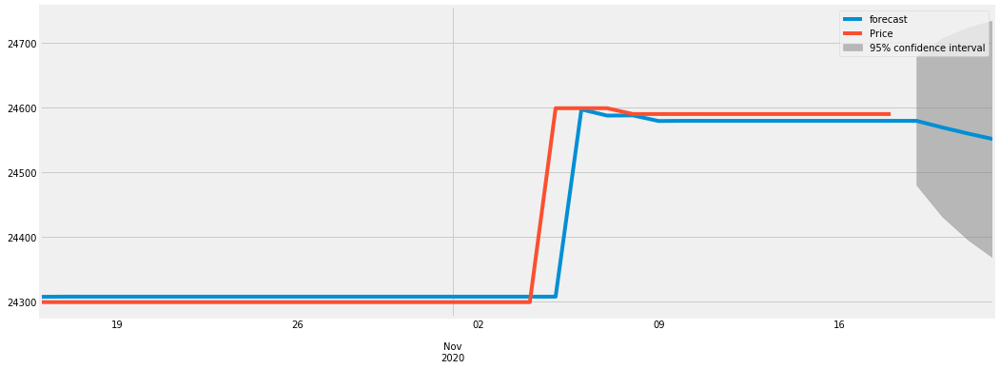

0.9958662280339888
2020-10-16    24307.216692
2020-10-17    24307.469155
2020-10-18    24307.460611
2020-10-19    24307.460891
2020-10-20    24307.460882
2020-10-21    24307.460882
2020-10-22    24307.460882
2020-10-23    24307.460882
2020-10-24    24307.460882
2020-10-25    24307.460882
2020-10-26    24307.460882
2020-10-27    24307.460882
2020-10-28    24307.460882
2020-10-29    24307.460882
2020-10-30    24307.460882
2020-10-31    24307.460882
2020-11-01    24307.460882
2020-11-02    24307.460882
2020-11-03    24307.460882
2020-11-04    24307.460882
2020-11-05    24307.460882
2020-11-06    24597.097389
2020-11-07    24587.587199
2020-11-08    24587.899465
2020-11-09    24579.200116
2020-11-10    24579.485759
2020-11-11    24579.476380
2020-11-12    24579.476688
2020-11-13    24579.476678
2020-11-14    24579.476678
2020-11-15    24579.476678
2020-11-16    24579.476678
2020-11-17    24579.476678
2020-11-18    24579.476678
2020-11-19    24579.476678
2020-11-20    24569.316884
2020-11-2

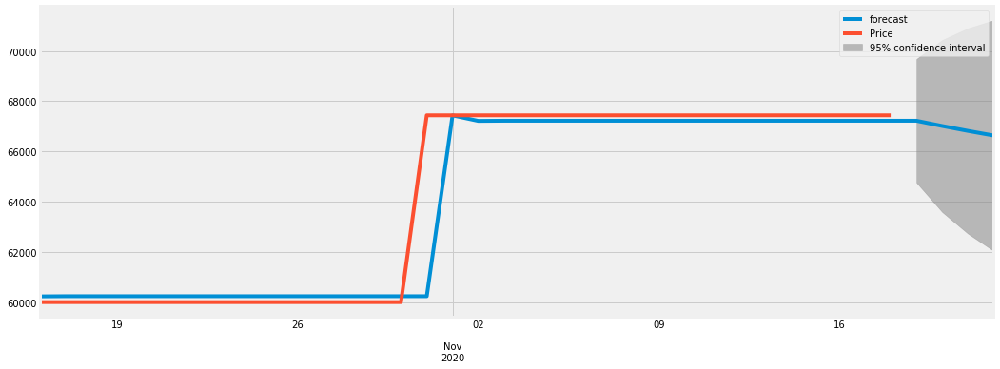

0.996402926467423
2020-10-16    60228.462114
2020-10-17    60235.026635
2020-10-18    60234.821163
2020-10-19    60234.827410
2020-10-20    60234.827220
2020-10-21    60234.827226
2020-10-22    60234.827226
2020-10-23    60234.827226
2020-10-24    60234.827226
2020-10-25    60234.827226
2020-10-26    60234.827226
2020-10-27    60234.827226
2020-10-28    60234.827226
2020-10-29    60234.827226
2020-10-30    60234.827226
2020-10-31    60234.827226
2020-11-01    67436.632829
2020-11-02    67217.483319
2020-11-03    67224.151995
2020-11-04    67223.949068
2020-11-05    67223.955243
2020-11-06    67223.955056
2020-11-07    67223.955061
2020-11-08    67223.955061
2020-11-09    67223.955061
2020-11-10    67223.955061
2020-11-11    67223.955061
2020-11-12    67223.955061
2020-11-13    67223.955061
2020-11-14    67223.955061
2020-11-15    67223.955061
2020-11-16    67223.955061
2020-11-17    67223.955061
2020-11-18    67223.955061
2020-11-19    67223.955061
2020-11-20    67014.854987
2020-11-21

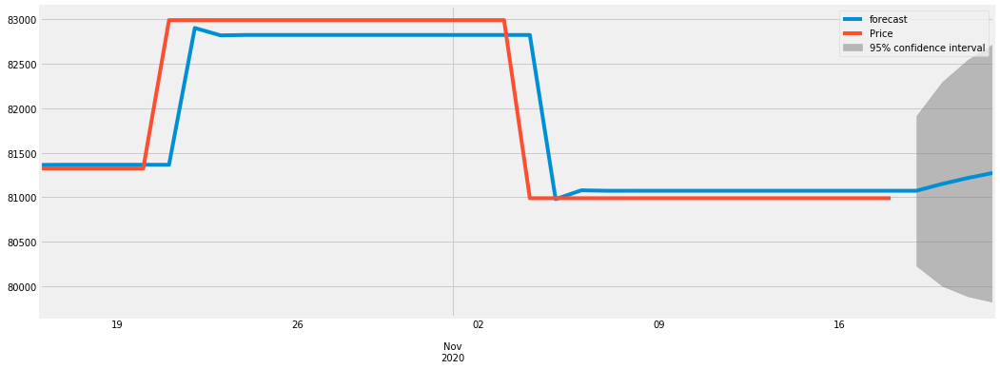

0.9844885633252807
2020-10-16    81363.954869
2020-10-17    81365.845244
2020-10-18    81365.738581
2020-10-19    81365.744313
2020-10-20    81365.744004
2020-10-21    81365.744021
2020-10-22    82901.676068
2020-10-23    82818.927100
2020-10-24    82823.385235
2020-10-25    82823.145051
2020-10-26    82823.157991
2020-10-27    82823.157294
2020-10-28    82823.157331
2020-10-29    82823.157329
2020-10-30    82823.157329
2020-10-31    82823.157329
2020-11-01    82823.157329
2020-11-02    82823.157329
2020-11-03    82823.157329
2020-11-04    82823.157329
2020-11-05    80979.301329
2020-11-06    81078.639826
2020-11-07    81073.287924
2020-11-08    81073.576260
2020-11-09    81073.560725
2020-11-10    81073.561562
2020-11-11    81073.561517
2020-11-12    81073.561520
2020-11-13    81073.561520
2020-11-14    81073.561520
2020-11-15    81073.561520
2020-11-16    81073.561520
2020-11-17    81073.561520
2020-11-18    81073.561520
2020-11-19    81073.561520
2020-11-20    81150.599224
2020-11-2

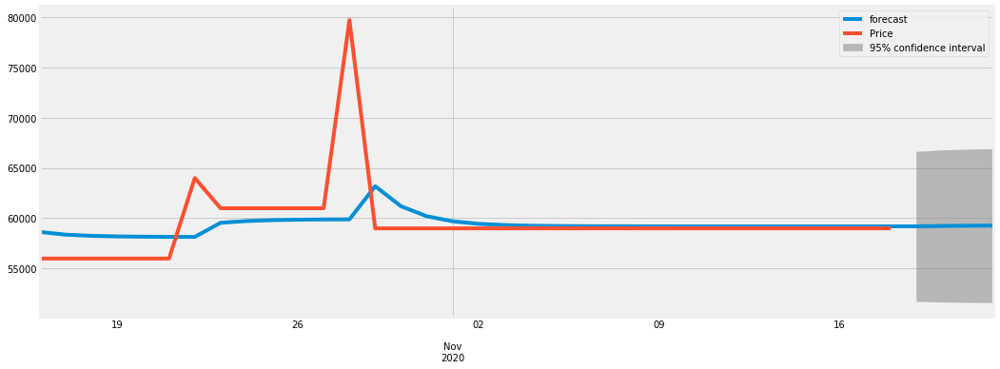

0.35233099537178014
2020-10-16    58628.170380
2020-10-17    58363.378168
2020-10-18    58244.350939
2020-10-19    58187.717675
2020-10-20    58160.044000
2020-10-21    58146.345368
2020-10-22    58139.521070
2020-10-23    59542.812422
2020-10-24    59718.828397
2020-10-25    59807.072680
2020-10-26    59851.313423
2020-10-27    59873.493282
2020-10-28    59884.613042
2020-10-29    63178.321919
2020-10-30    61189.800864
2020-10-31    60192.865414
2020-11-01    59693.056630
2020-11-02    59442.479905
2020-11-03    59316.854471
2020-11-04    59253.872765
2020-11-05    59222.297190
2020-11-06    59206.466928
2020-11-07    59198.530502
2020-11-08    59194.551613
2020-11-09    59192.556816
2020-11-10    59191.556735
2020-11-11    59191.055348
2020-11-12    59190.803981
2020-11-13    59190.677959
2020-11-14    59190.614778
2020-11-15    59190.583103
2020-11-16    59190.567223
2020-11-17    59190.559262
2020-11-18    59190.555270
2020-11-19    59190.553269
2020-11-20    59225.816759
2020-11-

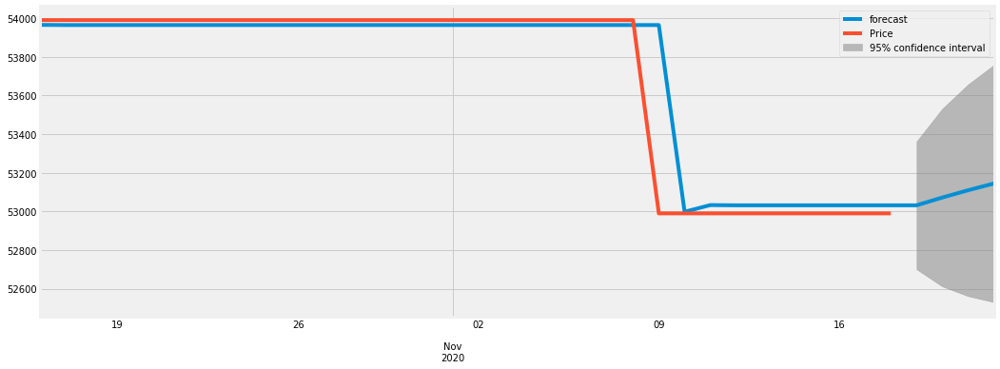

0.9955179278120003
2020-10-16    53965.351419
2020-10-17    53964.524920
2020-10-18    53964.555592
2020-10-19    53964.554492
2020-10-20    53964.554532
2020-10-21    53964.554530
2020-10-22    53964.554530
2020-10-23    53964.554530
2020-10-24    53964.554530
2020-10-25    53964.554530
2020-10-26    53964.554530
2020-10-27    53964.554530
2020-10-28    53964.554530
2020-10-29    53964.554530
2020-10-30    53964.554530
2020-10-31    53964.554530
2020-11-01    53964.554530
2020-11-02    53964.554530
2020-11-03    53964.554530
2020-11-04    53964.554530
2020-11-05    53964.554530
2020-11-06    53964.554530
2020-11-07    53964.554530
2020-11-08    53964.554530
2020-11-09    53964.554530
2020-11-10    52998.272497
2020-11-11    53032.968672
2020-11-12    53031.722841
2020-11-13    53031.767575
2020-11-14    53031.765969
2020-11-15    53031.766026
2020-11-16    53031.766024
2020-11-17    53031.766024
2020-11-18    53031.766024
2020-11-19    53031.766024
2020-11-20    53072.123783
2020-11-2

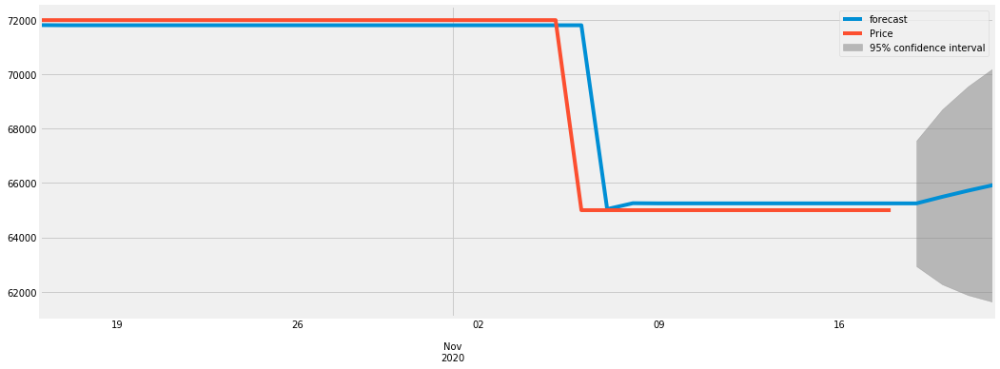

0.9961665852678065
2020-10-16    71806.946941
2020-10-17    71801.443217
2020-10-18    71801.624881
2020-10-19    71801.619065
2020-10-20    71801.619251
2020-10-21    71801.619245
2020-10-22    71801.619246
2020-10-23    71801.619246
2020-10-24    71801.619246
2020-10-25    71801.619246
2020-10-26    71801.619246
2020-10-27    71801.619246
2020-10-28    71801.619246
2020-10-29    71801.619246
2020-10-30    71801.619246
2020-10-31    71801.619246
2020-11-01    71801.619246
2020-11-02    71801.619246
2020-11-03    71801.619246
2020-11-04    71801.619246
2020-11-05    71801.619246
2020-11-06    71801.619246
2020-11-07    65039.517805
2020-11-08    65256.202497
2020-11-09    65249.259055
2020-11-10    65249.481551
2020-11-11    65249.474421
2020-11-12    65249.474650
2020-11-13    65249.474643
2020-11-14    65249.474643
2020-11-15    65249.474643
2020-11-16    65249.474643
2020-11-17    65249.474643
2020-11-18    65249.474643
2020-11-19    65249.474643
2020-11-20    65490.815536
2020-11-2

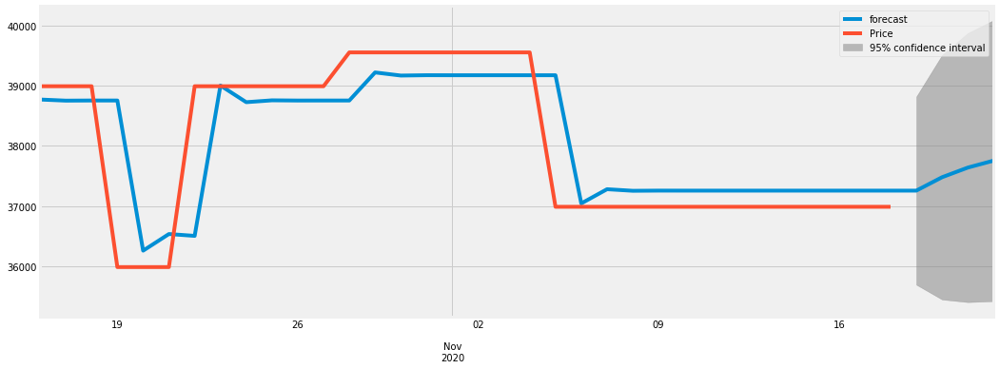

0.9417813328032201
2020-10-16    38769.516860
2020-10-17    38750.971734
2020-10-18    38753.197729
2020-10-19    38752.953544
2020-10-20    36262.245800
2020-10-21    36538.037634
2020-10-22    36507.499672
2020-10-23    39001.615903
2020-10-24    38725.446649
2020-10-25    38756.026402
2020-10-26    38752.640358
2020-10-27    38753.015289
2020-10-28    38752.973773
2020-10-29    39218.745780
2020-10-30    39167.171637
2020-10-31    39172.882354
2020-11-01    39172.250016
2020-11-02    39172.320034
2020-11-03    39172.312281
2020-11-04    39172.313140
2020-11-05    39172.313044
2020-11-06    37046.055769
2020-11-07    37281.492625
2020-11-08    37255.423102
2020-11-09    37258.309736
2020-11-10    37257.990104
2020-11-11    37258.025496
2020-11-12    37258.021577
2020-11-13    37258.022011
2020-11-14    37258.021963
2020-11-15    37258.021968
2020-11-16    37258.021968
2020-11-17    37258.021968
2020-11-18    37258.021968
2020-11-19    37258.021968
2020-11-20    37480.545850
2020-11-2

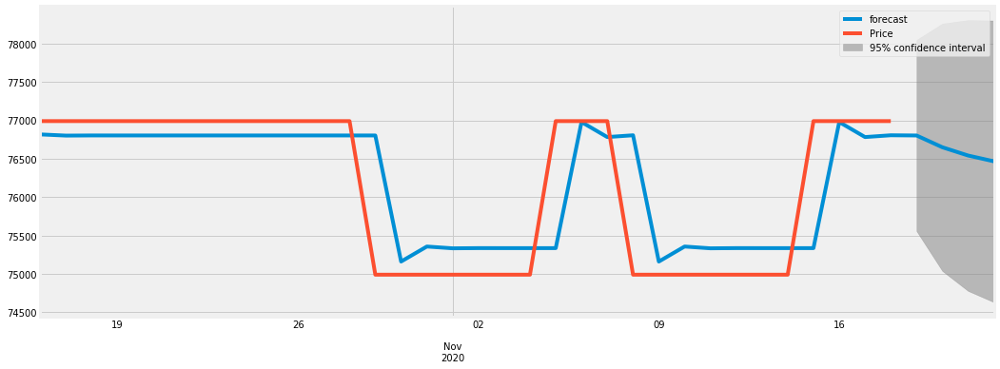

0.9346509132920724
2020-10-16    76816.724605
2020-10-17    76801.314095
2020-10-18    76803.311915
2020-10-19    76803.076562
2020-10-20    76803.104620
2020-10-21    76803.101280
2020-10-22    76803.101677
2020-10-23    76803.101630
2020-10-24    76803.101636
2020-10-25    76803.101635
2020-10-26    76803.101635
2020-10-27    76803.101635
2020-10-28    76803.101635
2020-10-29    76803.101635
2020-10-30    75161.263234
2020-10-31    75356.749612
2020-11-01    75333.473920
2020-11-02    75336.245253
2020-11-03    75335.915283
2020-11-04    75335.954571
2020-11-05    75335.949893
2020-11-06    76977.788851
2020-11-07    76782.302407
2020-11-08    76805.578106
2020-11-09    75160.968372
2020-11-10    75356.784720
2020-11-11    75333.469740
2020-11-12    75336.245751
2020-11-13    75335.915224
2020-11-14    75335.954578
2020-11-15    75335.949892
2020-11-16    76977.788851
2020-11-17    76782.302407
2020-11-18    76805.578106
2020-11-19    76802.806773
2020-11-20    76649.466228
2020-11-2

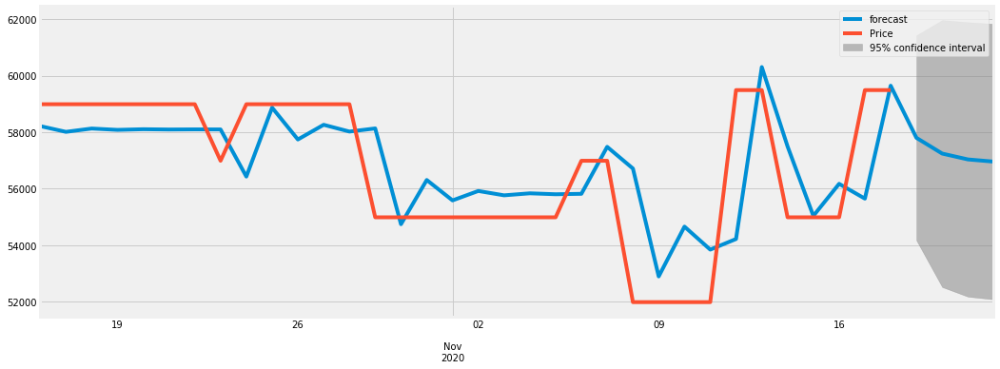

0.80842620644357
2020-10-16    58217.169293
2020-10-17    58012.643928
2020-10-18    58129.891450
2020-10-19    58082.435828
2020-10-20    58105.536221
2020-10-21    58095.143934
2020-10-22    58099.998309
2020-10-23    58097.769192
2020-10-24    56430.657938
2020-10-25    58868.516099
2020-10-26    57742.943376
2020-10-27    58262.626777
2020-10-28    58022.685967
2020-10-29    58133.468021
2020-10-30    54746.030118
2020-10-31    56310.029698
2020-11-01    55587.922088
2020-11-02    55921.323329
2020-11-03    55767.390057
2020-11-04    55838.461935
2020-11-05    55805.647639
2020-11-06    55820.798188
2020-11-07    57481.947689
2020-11-08    56714.985402
2020-11-09    52898.734815
2020-11-10    54660.719680
2020-11-11    53847.201124
2020-11-12    54222.807325
2020-11-13    60304.930014
2020-11-14    57496.778956
2020-11-15    55039.993124
2020-11-16    56174.305286
2020-11-17    55650.586831
2020-11-18    59645.715997
2020-11-19    57801.141862
2020-11-20    57244.162571
2020-11-21 

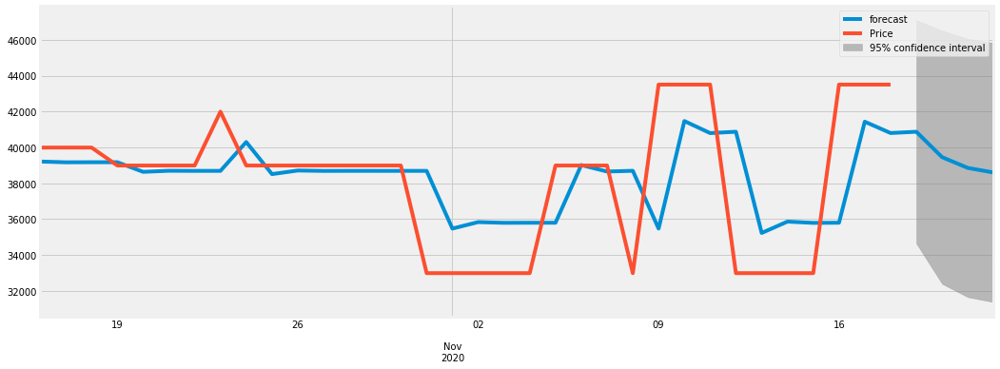

0.7546261788180434
2020-10-16    39211.762095
2020-10-17    39167.662548
2020-10-18    39172.888575
2020-10-19    39172.306177
2020-10-20    38636.387346
2020-10-21    38696.493178
2020-10-22    38689.752025
2020-10-23    38690.508077
2020-10-24    40298.375874
2020-10-25    38510.093301
2020-10-26    38710.657653
2020-10-27    38688.163412
2020-10-28    38690.686247
2020-10-29    38690.403300
2020-10-30    38690.435033
2020-10-31    38690.431474
2020-11-01    35474.526690
2020-11-02    35835.205628
2020-11-03    35794.753779
2020-11-04    35799.290645
2020-11-05    35798.781814
2020-11-06    39014.744065
2020-11-07    38654.058682
2020-11-08    38694.511254
2020-11-09    35474.069123
2020-11-10    41468.450859
2020-11-11    40796.152584
2020-11-12    40871.554017
2020-11-13    35229.903477
2020-11-14    35862.641279
2020-11-15    35791.676741
2020-11-16    35799.635749
2020-11-17    41431.937022
2020-11-18    40800.247784
2020-11-19    40871.094721
2020-11-20    39454.097216
2020-11-2

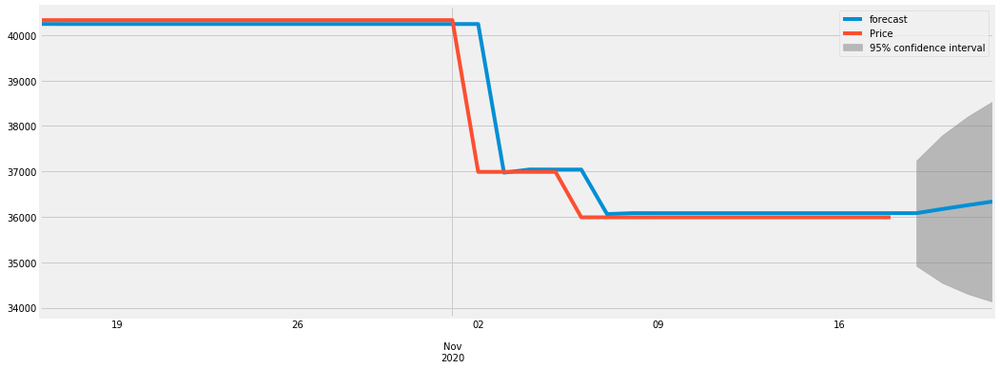

0.9983626000398703
2020-10-16    40244.029299
2020-10-17    40242.321107
2020-10-18    40242.358058
2020-10-19    40242.357275
2020-10-20    40242.357292
2020-10-21    40242.357292
2020-10-22    40242.357292
2020-10-23    40242.357292
2020-10-24    40242.357292
2020-10-25    40242.357292
2020-10-26    40242.357292
2020-10-27    40242.357292
2020-10-28    40242.357292
2020-10-29    40242.357292
2020-10-30    40242.357292
2020-10-31    40242.357292
2020-11-01    40242.357292
2020-11-02    40242.357292
2020-11-03    36972.931968
2020-11-04    37042.246628
2020-11-05    37040.777097
2020-11-06    37040.808253
2020-11-07    36061.351234
2020-11-08    36082.116575
2020-11-09    36081.676331
2020-11-10    36081.685665
2020-11-11    36081.685467
2020-11-12    36081.685471
2020-11-13    36081.685471
2020-11-14    36081.685471
2020-11-15    36081.685471
2020-11-16    36081.685471
2020-11-17    36081.685471
2020-11-18    36081.685471
2020-11-19    36081.685471
2020-11-20    36171.487389
2020-11-2

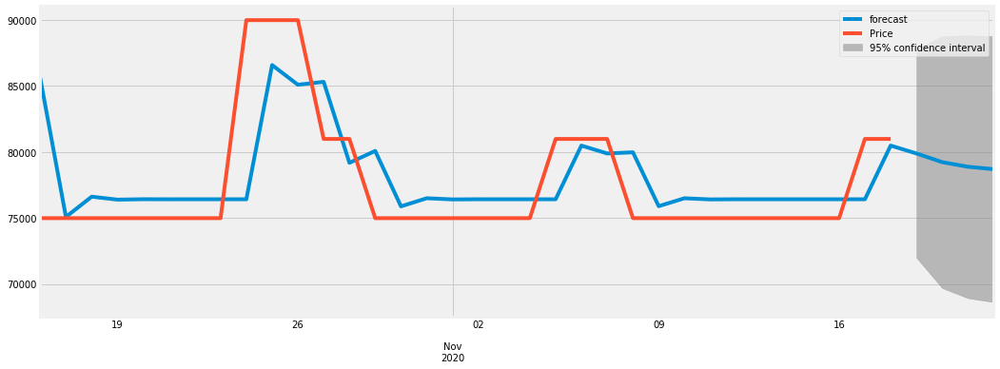

0.8479188396897084
2020-10-16    85625.362160
2020-10-17    75081.327320
2020-10-18    76616.426737
2020-10-19    76391.034858
2020-10-20    76424.127027
2020-10-21    76419.268265
2020-10-22    76419.981651
2020-10-23    76419.876908
2020-10-24    76419.892287
2020-10-25    86587.930176
2020-10-26    85095.011841
2020-10-27    85314.209013
2020-10-28    79181.201383
2020-10-29    80081.677919
2020-10-30    75882.249732
2020-10-31    76498.829194
2020-11-01    76408.300147
2020-11-02    76421.592040
2020-11-03    76419.640463
2020-11-04    76419.927003
2020-11-05    76419.884932
2020-11-06    80487.107167
2020-11-07    79889.938794
2020-11-08    79977.617816
2020-11-09    75897.528317
2020-11-10    76496.585922
2020-11-11    76408.629515
2020-11-12    76421.543681
2020-11-13    76419.647563
2020-11-14    76419.925960
2020-11-15    76419.885085
2020-11-16    76419.891086
2020-11-17    76419.890205
2020-11-18    80487.106393
2020-11-19    79889.938908
2020-11-20    79231.920109
2020-11-2

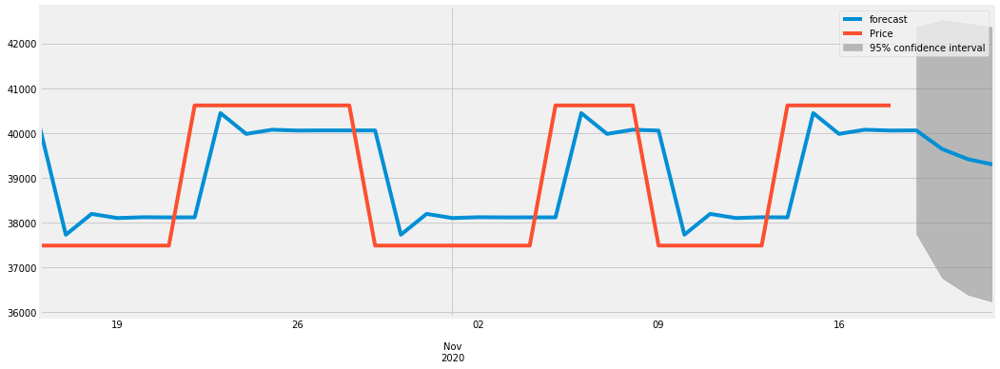

0.8712313836590004
2020-10-16    40110.887449
2020-10-17    37730.612862
2020-10-18    38196.952378
2020-10-19    38103.795519
2020-10-20    38122.395142
2020-10-21    38118.680681
2020-10-22    38119.422451
2020-10-23    40445.278985
2020-10-24    39980.807020
2020-10-25    40073.561755
2020-10-26    40055.038697
2020-10-27    40058.737739
2020-10-28    40057.999043
2020-10-29    40058.146560
2020-10-30    37732.112436
2020-10-31    38196.619866
2020-11-01    38103.858049
2020-11-02    38122.382521
2020-11-03    38118.683196
2020-11-04    38119.421949
2020-11-05    38119.274420
2020-11-06    40445.308547
2020-11-07    39980.801116
2020-11-08    40073.562934
2020-11-09    40055.038462
2020-11-10    37732.733121
2020-11-11    38196.495916
2020-11-12    38103.882802
2020-11-13    38122.377578
2020-11-14    38118.684183
2020-11-15    40445.426417
2020-11-16    39980.777578
2020-11-17    40073.567634
2020-11-18    40055.037523
2020-11-19    40058.737974
2020-11-20    39643.349581
2020-11-2

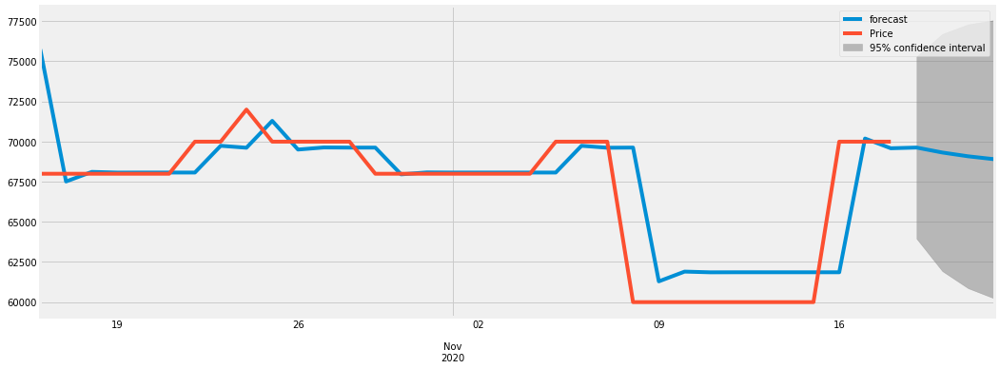

0.9503280820502013
2020-10-16    75746.148391
2020-10-17    67507.884101
2020-10-18    68106.354892
2020-10-19    68062.744117
2020-10-20    68065.922094
2020-10-21    68065.690510
2020-10-22    68065.707386
2020-10-23    69732.854957
2020-10-24    69611.367618
2020-10-25    71287.369369
2020-10-26    69498.088013
2020-10-27    69628.475409
2020-10-28    69618.973900
2020-10-29    69619.666288
2020-10-30    67952.467031
2020-10-31    68073.958137
2020-11-01    68065.104912
2020-11-02    68065.750059
2020-11-03    68065.703046
2020-11-04    68065.706472
2020-11-05    68065.706223
2020-11-06    69732.855042
2020-11-07    69611.367612
2020-11-08    69620.220568
2020-11-09    61283.831435
2020-11-10    61891.315590
2020-11-11    61847.047383
2020-11-12    61850.273268
2020-11-13    61850.038194
2020-11-14    61850.055324
2020-11-15    61850.054076
2020-11-16    61850.054167
2020-11-17    70185.798166
2020-11-18    69578.361023
2020-11-19    69622.625804
2020-11-20    69313.166443
2020-11-2

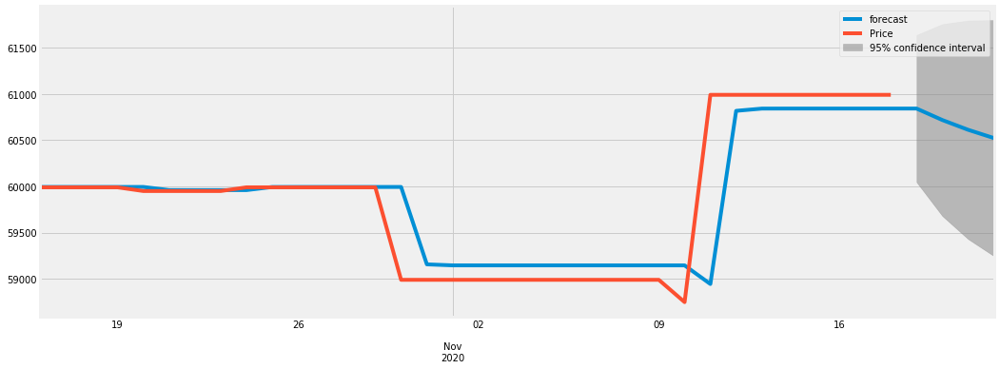

0.9752349498858838
2020-10-16    59994.045127
2020-10-17    59994.000586
2020-10-18    59994.000012
2020-10-19    59994.000005
2020-10-20    59994.000005
2020-10-21    59960.533013
2020-10-22    59960.097365
2020-10-23    59960.091694
2020-10-24    59960.091620
2020-10-25    59993.558611
2020-10-26    59993.994259
2020-10-27    59993.999930
2020-10-28    59994.000004
2020-10-29    59994.000005
2020-10-30    59994.000005
2020-10-31    59157.325208
2020-11-01    59146.433998
2020-11-02    59146.292225
2020-11-03    59146.290379
2020-11-04    59146.290355
2020-11-05    59146.290355
2020-11-06    59146.290355
2020-11-07    59146.290355
2020-11-08    59146.290355
2020-11-09    59146.290355
2020-11-10    59146.290355
2020-11-11    58944.651729
2020-11-12    60817.015166
2020-11-13    60841.388200
2020-11-14    60841.705470
2020-11-15    60841.709600
2020-11-16    60841.709654
2020-11-17    60841.709655
2020-11-18    60841.709655
2020-11-19    60841.709655
2020-11-20    60717.638860
2020-11-2

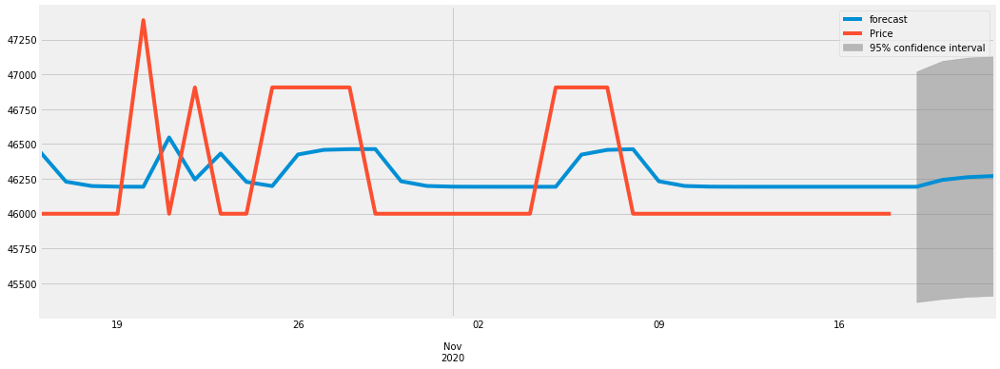

0.45907333990130217
2020-10-16    46442.456076
2020-10-17    46229.179021
2020-10-18    46198.030296
2020-10-19    46193.467735
2020-10-20    46192.799287
2020-10-21    46546.807610
2020-10-22    46244.567729
2020-10-23    46431.346739
2020-10-24    46227.651355
2020-10-25    46197.807589
2020-10-26    46424.495829
2020-10-27    46457.708319
2020-10-28    46462.574339
2020-10-29    46463.287268
2020-10-30    46232.331018
2020-10-31    46198.493215
2020-11-01    46193.535579
2020-11-02    46192.809227
2020-11-03    46192.702808
2020-11-04    46192.687216
2020-11-05    46192.684932
2020-11-06    46423.745300
2020-11-07    46457.598358
2020-11-08    46462.558228
2020-11-09    46232.224205
2020-11-10    46198.477565
2020-11-11    46193.533286
2020-11-12    46192.808891
2020-11-13    46192.702759
2020-11-14    46192.687209
2020-11-15    46192.684931
2020-11-16    46192.684597
2020-11-17    46192.684548
2020-11-18    46192.684541
2020-11-19    46192.684540
2020-11-20    46242.026200
2020-11-

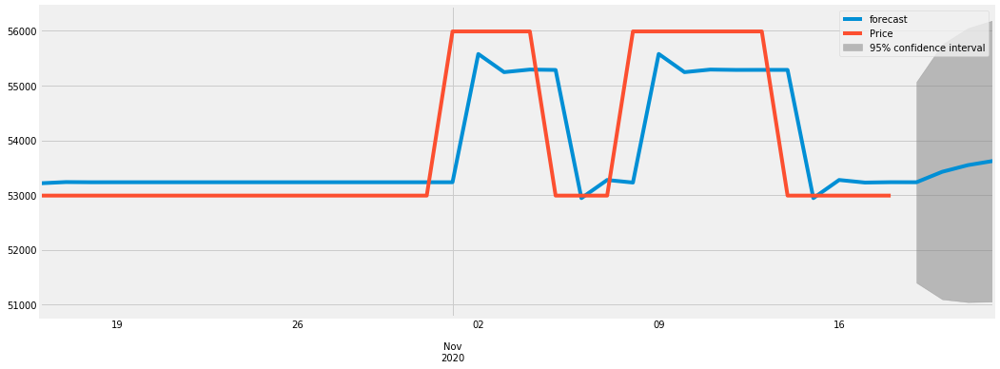

0.9097325299382397
2020-10-16    53214.915904
2020-10-17    53237.281475
2020-10-18    53233.799570
2020-10-19    53234.285764
2020-10-20    53234.216768
2020-10-21    53234.226537
2020-10-22    53234.225153
2020-10-23    53234.225349
2020-10-24    53234.225321
2020-10-25    53234.225325
2020-10-26    53234.225325
2020-10-27    53234.225325
2020-10-28    53234.225325
2020-10-29    53234.225325
2020-10-30    53234.225325
2020-10-31    53234.225325
2020-11-01    53234.225325
2020-11-02    55577.902708
2020-11-03    55245.969120
2020-11-04    55292.980670
2020-11-05    55286.322453
2020-11-06    52943.588069
2020-11-07    53275.388101
2020-11-08    53228.395466
2020-11-09    55578.728388
2020-11-10    55245.852180
2020-11-11    55292.997232
2020-11-12    55286.320108
2020-11-13    55287.265785
2020-11-14    55287.131849
2020-11-15    52943.473435
2020-11-16    53275.404336
2020-11-17    53228.393167
2020-11-18    53235.051330
2020-11-19    53234.108338
2020-11-20    53424.945624
2020-11-2

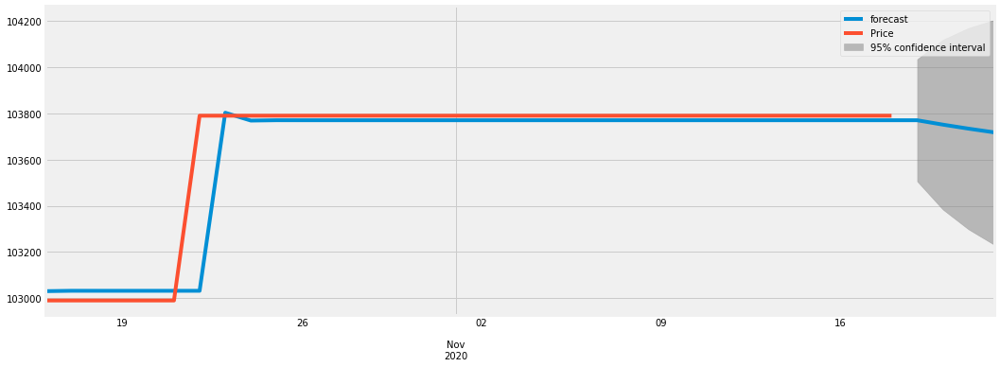

0.9936352036297615
2020-10-16    103030.355278
2020-10-17    103032.001189
2020-10-18    103031.925608
2020-10-19    103031.928937
2020-10-20    103031.928790
2020-10-21    103031.928796
2020-10-22    103031.928796
2020-10-23    103802.950019
2020-10-24    103768.931548
2020-10-25    103770.432488
2020-10-26    103770.366264
2020-10-27    103770.369186
2020-10-28    103770.369057
2020-10-29    103770.369063
2020-10-30    103770.369062
2020-10-31    103770.369062
2020-11-01    103770.369062
2020-11-02    103770.369062
2020-11-03    103770.369062
2020-11-04    103770.369062
2020-11-05    103770.369062
2020-11-06    103770.369062
2020-11-07    103770.369062
2020-11-08    103770.369062
2020-11-09    103770.369062
2020-11-10    103770.369062
2020-11-11    103770.369062
2020-11-12    103770.369062
2020-11-13    103770.369062
2020-11-14    103770.369062
2020-11-15    103770.369062
2020-11-16    103770.369062
2020-11-17    103770.369062
2020-11-18    103770.369062
2020-11-19    103770.369062
2

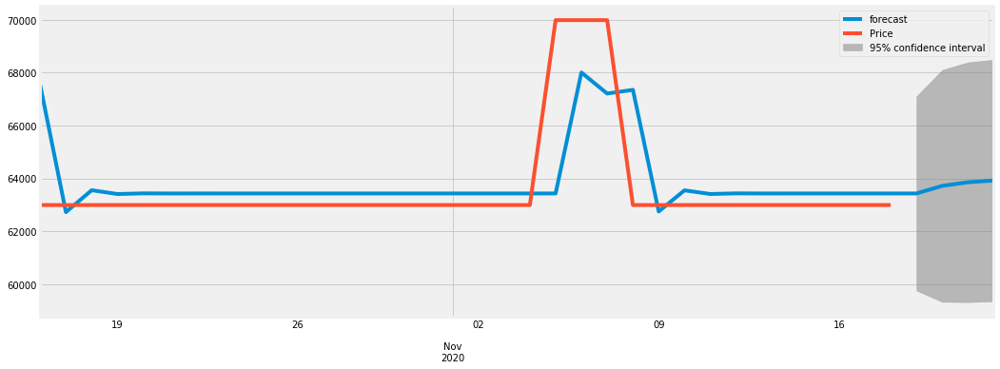

0.8239512773682501
2020-10-16    67538.283712
2020-10-17    62722.051163
2020-10-18    63552.067770
2020-10-19    63407.575921
2020-10-20    63432.731371
2020-10-21    63428.351723
2020-10-22    63429.114230
2020-10-23    63428.981476
2020-10-24    63429.004588
2020-10-25    63429.000564
2020-10-26    63429.001265
2020-10-27    63429.001143
2020-10-28    63429.001164
2020-10-29    63429.001161
2020-10-30    63429.001161
2020-10-31    63429.001161
2020-11-01    63429.001161
2020-11-02    63429.001161
2020-11-03    63429.001161
2020-11-04    63429.001161
2020-11-05    63429.001161
2020-11-06    68008.321520
2020-11-07    67211.050419
2020-11-08    67349.857307
2020-11-09    62746.370323
2020-11-10    63547.848893
2020-11-11    63408.309474
2020-11-12    63432.603635
2020-11-13    63428.373961
2020-11-14    63429.110358
2020-11-15    63428.982150
2020-11-16    63429.004471
2020-11-17    63429.000585
2020-11-18    63429.001261
2020-11-19    63429.001144
2020-11-20    63716.190718
2020-11-2

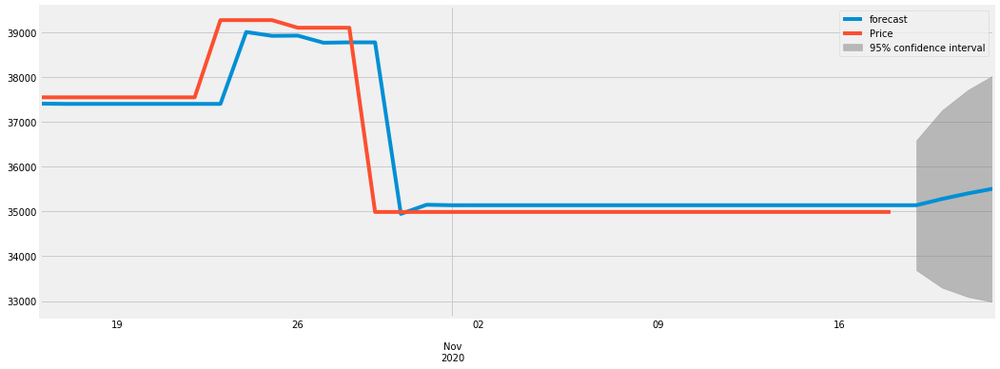

0.9871611369387436
2020-10-16    37410.771136
2020-10-17    37404.154605
2020-10-18    37404.523190
2020-10-19    37404.503631
2020-10-20    37404.504672
2020-10-21    37404.504616
2020-10-22    37404.504619
2020-10-23    37404.504619
2020-10-24    39010.501583
2020-10-25    38925.067521
2020-10-26    38929.612348
2020-10-27    38771.098413
2020-10-28    38779.530863
2020-10-29    38779.082283
2020-10-30    34947.057738
2020-10-31    35150.909571
2020-11-01    35140.065285
2020-11-02    35140.642167
2020-11-03    35140.611479
2020-11-04    35140.613111
2020-11-05    35140.613025
2020-11-06    35140.613029
2020-11-07    35140.613029
2020-11-08    35140.613029
2020-11-09    35140.613029
2020-11-10    35140.613029
2020-11-11    35140.613029
2020-11-12    35140.613029
2020-11-13    35140.613029
2020-11-14    35140.613029
2020-11-15    35140.613029
2020-11-16    35140.613029
2020-11-17    35140.613029
2020-11-18    35140.613029
2020-11-19    35140.613029
2020-11-20    35280.835677
2020-11-2

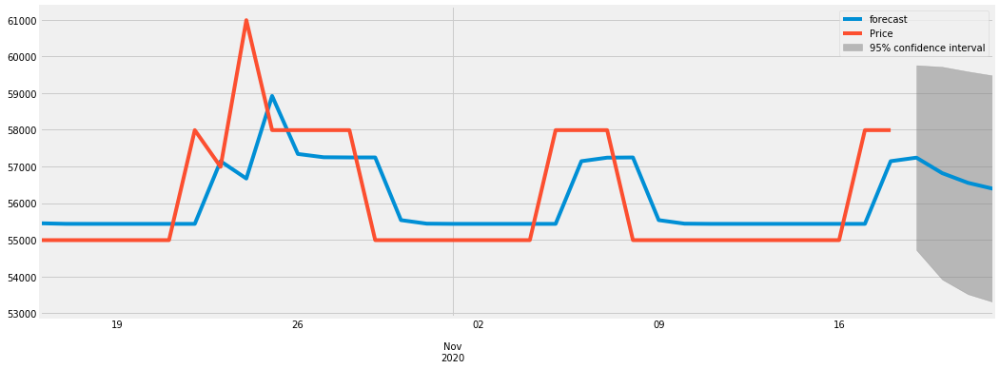

0.8304619937956326
2020-10-16    55449.756644
2020-10-17    55434.484712
2020-10-18    55433.651758
2020-10-19    55433.604854
2020-10-20    55433.602208
2020-10-21    55433.602059
2020-10-22    55433.602050
2020-10-23    57143.025777
2020-10-24    56669.656146
2020-10-25    58922.182319
2020-10-26    57339.836357
2020-10-27    57250.567255
2020-10-28    57245.531079
2020-10-29    57245.246960
2020-10-30    55535.807204
2020-10-31    55439.368022
2020-11-01    55433.927341
2020-11-02    55433.620401
2020-11-03    55433.603085
2020-11-04    55433.602108
2020-11-05    55433.602053
2020-11-06    57143.025777
2020-11-07    57239.464055
2020-11-08    57244.904685
2020-11-09    55535.787895
2020-11-10    55439.366932
2020-11-11    55433.927280
2020-11-12    55433.620398
2020-11-13    55433.603085
2020-11-14    55433.602108
2020-11-15    55433.602053
2020-11-16    55433.602050
2020-11-17    55433.602050
2020-11-18    57143.025777
2020-11-19    57239.464055
2020-11-20    56817.243367
2020-11-2

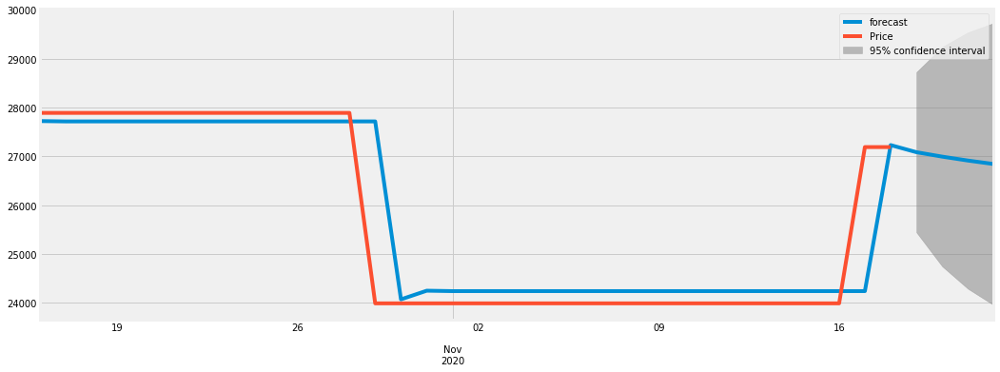

0.9875718269113044
2020-10-16    27722.539300
2020-10-17    27715.256174
2020-10-18    27715.626062
2020-10-19    27715.608097
2020-10-20    27715.608972
2020-10-21    27715.608929
2020-10-22    27715.608931
2020-10-23    27715.608931
2020-10-24    27715.608931
2020-10-25    27715.608931
2020-10-26    27715.608931
2020-10-27    27715.608931
2020-10-28    27715.608931
2020-10-29    27715.608931
2020-10-30    24071.752839
2020-10-31    24249.100527
2020-11-01    24240.468956
2020-11-02    24240.889058
2020-11-03    24240.868611
2020-11-04    24240.869606
2020-11-05    24240.869558
2020-11-06    24240.869560
2020-11-07    24240.869560
2020-11-08    24240.869560
2020-11-09    24240.869560
2020-11-10    24240.869560
2020-11-11    24240.869560
2020-11-12    24240.869560
2020-11-13    24240.869560
2020-11-14    24240.869560
2020-11-15    24240.869560
2020-11-16    24240.869560
2020-11-17    24240.869560
2020-11-18    27230.700200
2020-11-19    27085.184148
2020-11-20    26994.334698
2020-11-2

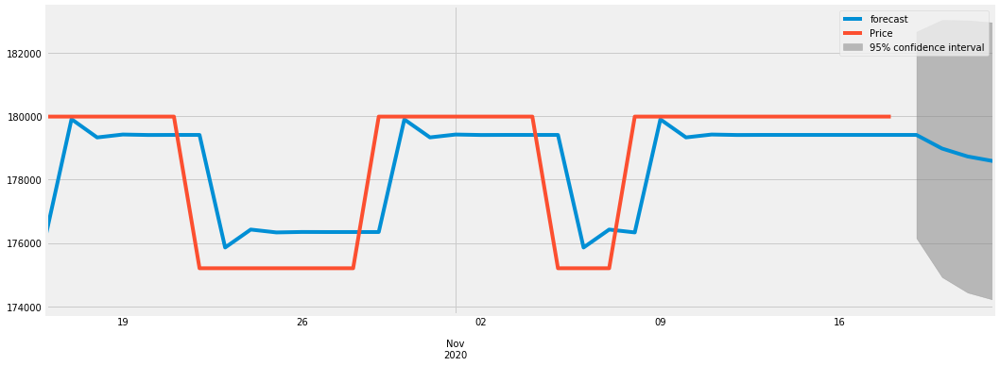

0.8840818028154338
2020-10-16    176250.033657
2020-10-17    179908.724179
2020-10-18    179331.726098
2020-10-19    179423.802729
2020-10-20    179409.110498
2020-10-21    179411.455006
2020-10-22    179411.080885
2020-10-23    175854.651017
2020-10-24    176422.163137
2020-10-25    176331.603217
2020-10-26    176346.054184
2020-10-27    176343.748192
2020-10-28    176344.116167
2020-10-29    176344.057448
2020-10-30    179900.556385
2020-10-31    179333.033244
2020-11-01    179423.594923
2020-11-02    179409.143675
2020-11-03    179411.449712
2020-11-04    179411.081729
2020-11-05    179411.140450
2020-11-06    175854.641512
2020-11-07    176422.164654
2020-11-08    176331.602975
2020-11-09    179902.543790
2020-11-10    179332.716107
2020-11-11    179423.645530
2020-11-12    179409.135599
2020-11-13    179411.451000
2020-11-14    179411.081524
2020-11-15    179411.140482
2020-11-16    179411.131074
2020-11-17    179411.132575
2020-11-18    179411.132336
2020-11-19    179411.132374
2

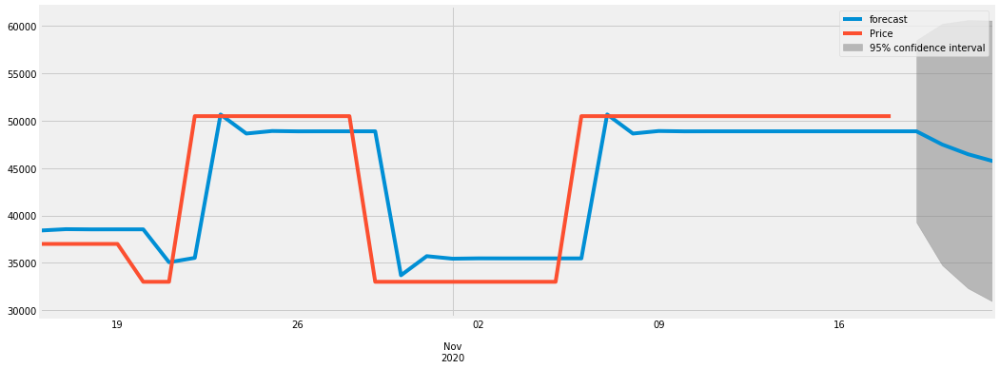

0.950191339446639
2020-10-16    38403.319628
2020-10-17    38549.399671
2020-10-18    38527.986968
2020-10-19    38530.793126
2020-10-20    38530.419574
2020-10-21    35053.898090
2020-10-22    35515.844762
2020-10-23    50664.461683
2020-10-24    48651.572302
2020-10-25    48919.037225
2020-10-26    48883.497525
2020-10-27    48888.219902
2020-10-28    48887.592411
2020-10-29    48887.675790
2020-10-30    33677.666110
2020-10-31    35698.713122
2020-11-01    35430.164245
2020-11-02    35465.847976
2020-11-03    35461.106461
2020-11-04    35461.736495
2020-11-05    35461.652778
2020-11-06    35461.663902
2020-11-07    50671.661025
2020-11-08    48650.615681
2020-11-09    48919.164337
2020-11-10    48883.480635
2020-11-11    48888.222146
2020-11-12    48887.592113
2020-11-13    48887.675829
2020-11-14    48887.664705
2020-11-15    48887.666183
2020-11-16    48887.665987
2020-11-17    48887.666013
2020-11-18    48887.666010
2020-11-19    48887.666010
2020-11-20    47495.008996
2020-11-21

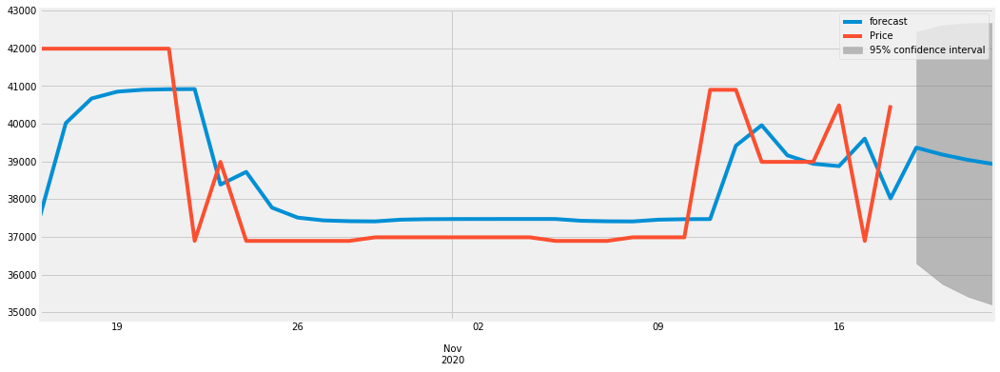

0.8291332612193865
2020-10-16    37551.412930
2020-10-17    40017.771856
2020-10-18    40670.372967
2020-10-19    40851.001944
2020-10-20    40901.259579
2020-10-21    40915.255692
2020-10-22    40919.154239
2020-10-23    38387.618269
2020-10-24    38723.801021
2020-10-25    37776.067741
2020-10-26    37512.061571
2020-10-27    37438.518456
2020-10-28    37418.031853
2020-10-29    37412.324983
2020-10-30    37457.957832
2020-10-31    37470.669587
2020-11-01    37474.210649
2020-11-02    37475.197068
2020-11-03    37475.471851
2020-11-04    37475.548396
2020-11-05    37475.569718
2020-11-06    37428.353071
2020-11-07    37415.200123
2020-11-08    37411.536160
2020-11-09    37457.738093
2020-11-10    37470.608375
2020-11-11    37474.193597
2020-11-12    39418.774612
2020-11-13    39960.468564
2020-11-14    39161.943472
2020-11-15    38939.501614
2020-11-16    38877.536899
2020-11-17    39605.895449
2020-11-18    38021.789165
2020-11-19    39367.513315
2020-11-20    39184.420632
2020-11-2

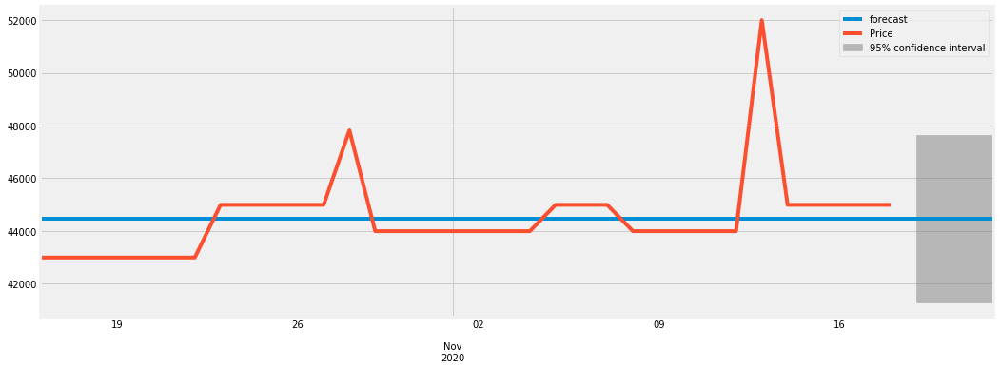

-4.536077891081902e-08
2020-10-16    44470.920251
2020-10-17    44470.920307
2020-10-18    44470.920363
2020-10-19    44470.920419
2020-10-20    44470.920476
2020-10-21    44470.920532
2020-10-22    44470.920588
2020-10-23    44470.920645
2020-10-24    44470.920625
2020-10-25    44470.920605
2020-10-26    44470.920585
2020-10-27    44470.920566
2020-10-28    44470.920546
2020-10-29    44470.920419
2020-10-30    44470.920437
2020-10-31    44470.920455
2020-11-01    44470.920473
2020-11-02    44470.920492
2020-11-03    44470.920510
2020-11-04    44470.920528
2020-11-05    44470.920547
2020-11-06    44470.920527
2020-11-07    44470.920507
2020-11-08    44470.920487
2020-11-09    44470.920506
2020-11-10    44470.920524
2020-11-11    44470.920542
2020-11-12    44470.920561
2020-11-13    44470.920579
2020-11-14    44470.920293
2020-11-15    44470.920273
2020-11-16    44470.920253
2020-11-17    44470.920234
2020-11-18    44470.920214
2020-11-19    44470.920177
2020-11-20    44470.920177
2020-

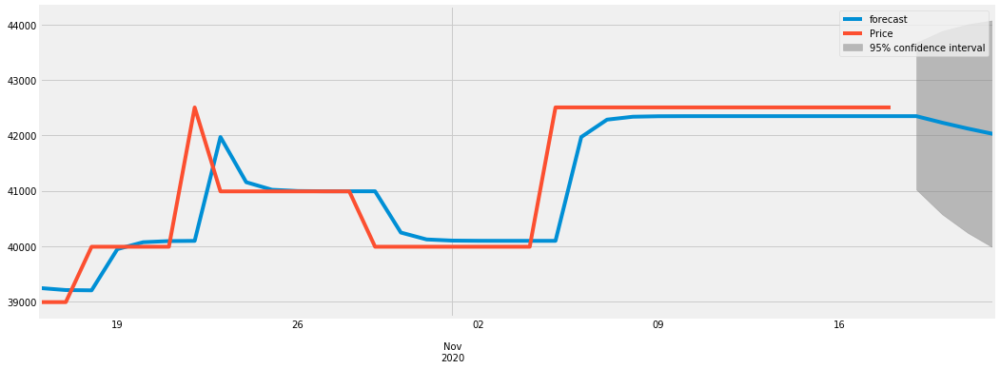

0.9773572914363944
2020-10-16    39244.395611
2020-10-17    39207.985430
2020-10-18    39202.767987
2020-10-19    39947.085658
2020-10-20    40071.629941
2020-10-21    40092.469895
2020-10-22    40095.957039
2020-10-23    41971.380797
2020-10-24    41155.521671
2020-10-25    41019.004208
2020-10-26    40996.160781
2020-10-27    40992.338398
2020-10-28    40991.698799
2020-10-29    40991.591776
2020-10-30    40246.406834
2020-10-31    40121.715261
2020-11-01    40100.850657
2020-11-02    40097.359389
2020-11-03    40096.775196
2020-11-04    40096.677443
2020-11-05    40096.661087
2020-11-06    41971.498605
2020-11-07    42285.214607
2020-11-08    42337.708611
2020-11-09    42346.492417
2020-11-10    42347.962209
2020-11-11    42348.208149
2020-11-12    42348.249302
2020-11-13    42348.256188
2020-11-14    42348.257340
2020-11-15    42348.257533
2020-11-16    42348.257565
2020-11-17    42348.257571
2020-11-18    42348.257572
2020-11-19    42348.257572
2020-11-20    42230.713115
2020-11-2

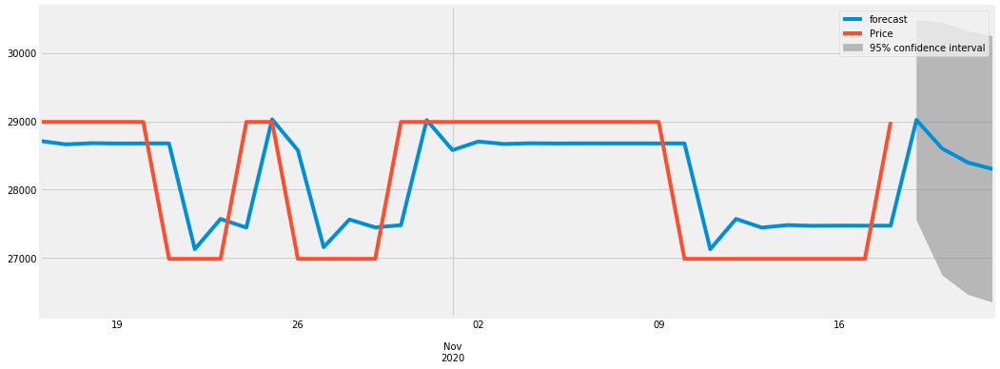

0.8563109118738585
2020-10-16    28712.552713
2020-10-17    28663.015238
2020-10-18    28679.659414
2020-10-19    28675.144167
2020-10-20    28676.453816
2020-10-21    28676.080950
2020-10-22    27131.574961
2020-10-23    27573.143166
2020-10-24    27446.900530
2020-10-25    29027.605598
2020-10-26    28575.688157
2020-10-27    27160.276810
2020-10-28    27564.937418
2020-10-29    27449.246521
2020-10-30    27482.322099
2020-10-31    29017.478709
2020-11-01    28578.583395
2020-11-02    28704.061861
2020-11-03    28668.188055
2020-11-04    28678.444237
2020-11-05    28675.512035
2020-11-06    28676.350340
2020-11-07    28676.110672
2020-11-08    28676.179192
2020-11-09    28676.159602
2020-11-10    28676.165203
2020-11-11    27131.550812
2020-11-12    27573.150069
2020-11-13    27446.898556
2020-11-14    27482.993374
2020-11-15    27472.674005
2020-11-16    27475.624273
2020-11-17    27474.780803
2020-11-18    27475.021948
2020-11-19    29019.565794
2020-11-20    28600.820558
2020-11-2

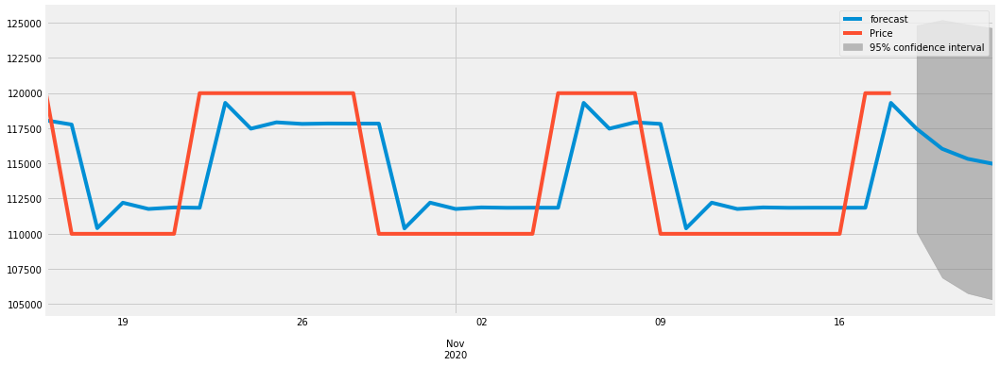

0.8553396427910288
2020-10-16    118056.382394
2020-10-17    117759.438806
2020-10-18    110394.030687
2020-10-19    112201.771541
2020-10-20    111757.373066
2020-10-21    111866.615572
2020-10-22    111839.760624
2020-10-23    119299.567213
2020-10-24    117465.741662
2020-10-25    117916.546400
2020-10-26    117805.726202
2020-10-27    117832.968853
2020-10-28    117826.271861
2020-10-29    117827.918166
2020-10-30    110374.308542
2020-10-31    112206.610711
2020-11-01    111756.180462
2020-11-02    111866.908601
2020-11-03    111839.688580
2020-11-04    111846.380010
2020-11-05    111844.735073
2020-11-06    119298.344360
2020-11-07    117466.042273
2020-11-08    117916.472502
2020-11-09    117805.744368
2020-11-10    110379.759471
2020-11-11    112205.270723
2020-11-12    111756.509868
2020-11-13    111866.827624
2020-11-14    111839.708487
2020-11-15    111846.375116
2020-11-16    111844.736276
2020-11-17    111845.139148
2020-11-18    119298.245027
2020-11-19    117466.066692
2

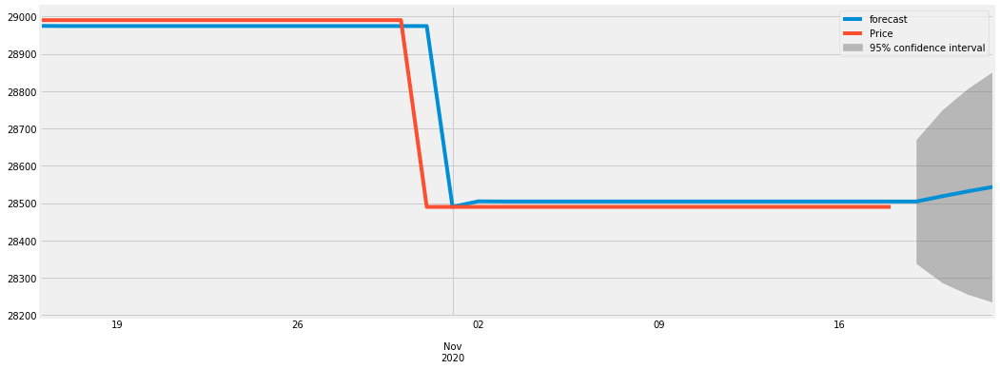

0.9964025634998913
2020-10-16    28974.543633
2020-10-17    28974.101347
2020-10-18    28974.115194
2020-10-19    28974.114773
2020-10-20    28974.114786
2020-10-21    28974.114786
2020-10-22    28974.114786
2020-10-23    28974.114786
2020-10-24    28974.114786
2020-10-25    28974.114786
2020-10-26    28974.114786
2020-10-27    28974.114786
2020-10-28    28974.114786
2020-10-29    28974.114786
2020-10-30    28974.114786
2020-10-31    28974.114786
2020-11-01    28490.186898
2020-11-02    28504.916311
2020-11-03    28504.467988
2020-11-04    28504.481634
2020-11-05    28504.481219
2020-11-06    28504.481231
2020-11-07    28504.481231
2020-11-08    28504.481231
2020-11-09    28504.481231
2020-11-10    28504.481231
2020-11-11    28504.481231
2020-11-12    28504.481231
2020-11-13    28504.481231
2020-11-14    28504.481231
2020-11-15    28504.481231
2020-11-16    28504.481231
2020-11-17    28504.481231
2020-11-18    28504.481231
2020-11-19    28504.481231
2020-11-20    28518.496974
2020-11-2

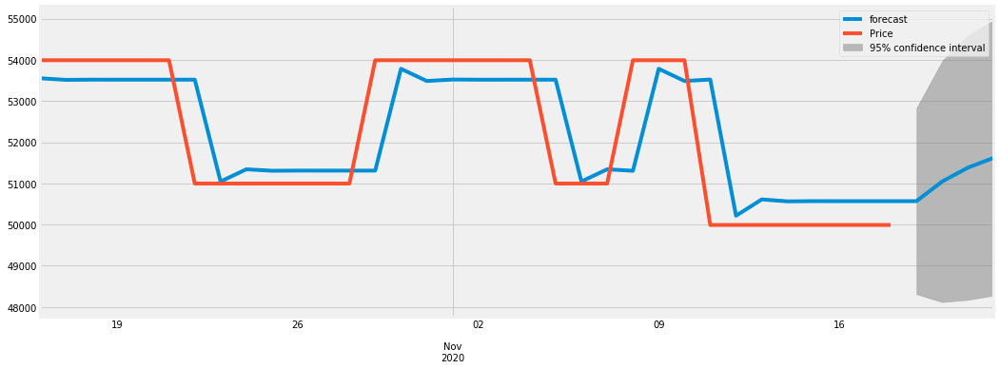

0.9376986263975149
2020-10-16    53552.334284
2020-10-17    53512.973231
2020-10-18    53518.113992
2020-10-19    53517.504549
2020-10-20    53517.577681
2020-10-21    53517.568918
2020-10-22    53517.569968
2020-10-23    51045.503423
2020-10-24    51341.762610
2020-10-25    51306.258102
2020-10-26    51310.513059
2020-10-27    51310.003133
2020-10-28    51310.064244
2020-10-29    51310.056920
2020-10-30    53782.124217
2020-10-31    53485.864941
2020-11-01    53521.369459
2020-11-02    53517.114501
2020-11-03    53517.624427
2020-11-04    53517.563316
2020-11-05    53517.570640
2020-11-06    51045.503343
2020-11-07    51341.762619
2020-11-08    51306.258101
2020-11-09    53782.579478
2020-11-10    53485.810381
2020-11-11    53521.375998
2020-11-12    50214.419771
2020-11-13    50610.734410
2020-11-14    50563.238984
2020-11-15    50568.930966
2020-11-16    50568.248823
2020-11-17    50568.330573
2020-11-18    50568.320776
2020-11-19    50568.321950
2020-11-20    51045.826910
2020-11-2

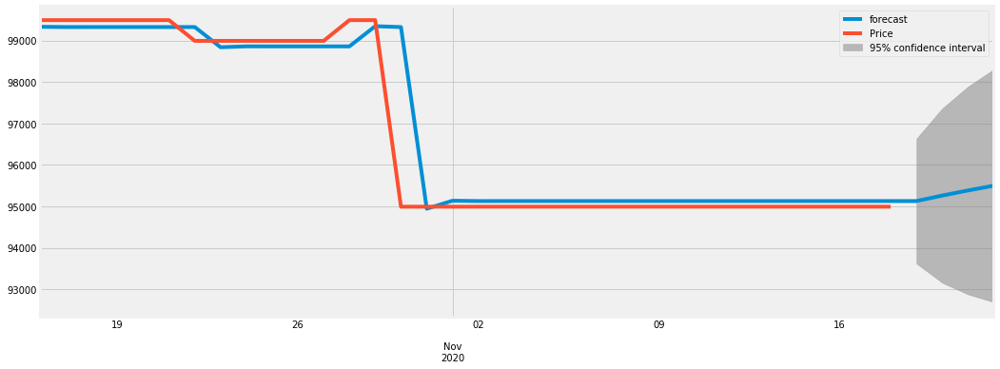

0.995543247528937
2020-10-16    99329.678786
2020-10-17    99323.094657
2020-10-18    99323.396157
2020-10-19    99323.382919
2020-10-20    99323.383502
2020-10-21    99323.383476
2020-10-22    99323.383477
2020-10-23    98836.513468
2020-10-24    98857.928772
2020-10-25    98856.986805
2020-10-26    98857.028238
2020-10-27    98857.026416
2020-10-28    98857.026496
2020-10-29    99343.896502
2020-10-30    99322.481198
2020-10-31    94941.593081
2020-11-01    95134.289381
2020-11-02    95125.813505
2020-11-03    95126.186322
2020-11-04    95126.169924
2020-11-05    95126.170645
2020-11-06    95126.170613
2020-11-07    95126.170614
2020-11-08    95126.170614
2020-11-09    95126.170614
2020-11-10    95126.170614
2020-11-11    95126.170614
2020-11-12    95126.170614
2020-11-13    95126.170614
2020-11-14    95126.170614
2020-11-15    95126.170614
2020-11-16    95126.170614
2020-11-17    95126.170614
2020-11-18    95126.170614
2020-11-19    95126.170614
2020-11-20    95258.765391
2020-11-21

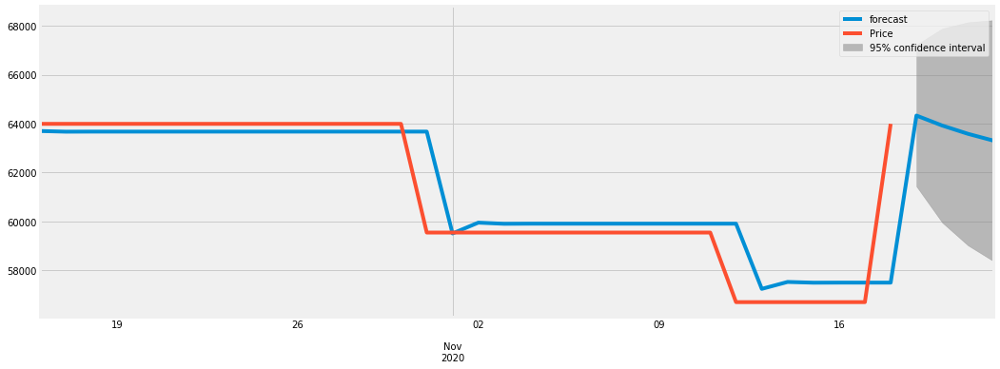

0.9766148901433258
2020-10-16    63696.851314
2020-10-17    63670.338734
2020-10-18    63673.409345
2020-10-19    63673.086314
2020-10-20    63673.120662
2020-10-21    63673.117014
2020-10-22    63673.117401
2020-10-23    63673.117360
2020-10-24    63673.117364
2020-10-25    63673.117364
2020-10-26    63673.117364
2020-10-27    63673.117364
2020-10-28    63673.117364
2020-10-29    63673.117364
2020-10-30    63673.117364
2020-10-31    63673.117364
2020-11-01    59507.862394
2020-11-02    59950.300728
2020-11-03    59903.304402
2020-11-04    59908.296408
2020-11-05    59907.766151
2020-11-06    59907.822475
2020-11-07    59907.816493
2020-11-08    59907.817128
2020-11-09    59907.817061
2020-11-10    59907.817068
2020-11-11    59907.817067
2020-11-12    59907.817067
2020-11-13    57241.866473
2020-11-14    57525.046914
2020-11-15    57494.967151
2020-11-16    57498.162259
2020-11-17    57497.822871
2020-11-18    57497.858921
2020-11-19    64329.060656
2020-11-20    63921.164242
2020-11-2

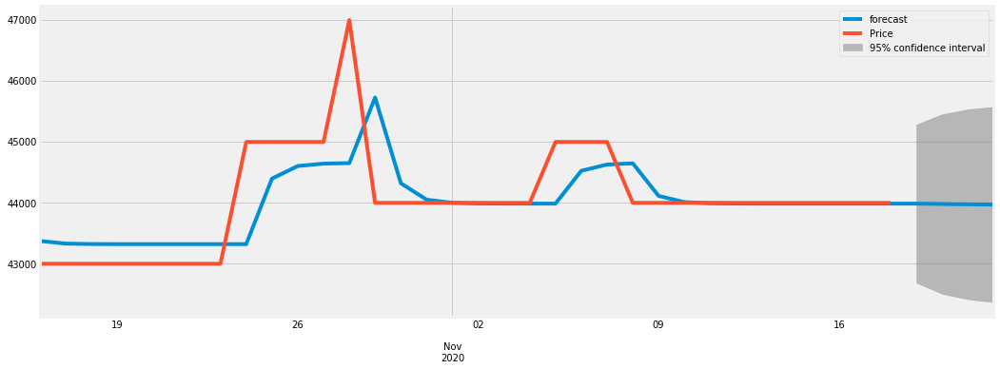

0.8411945873381447
2020-10-16    43364.374732
2020-10-17    43321.112900
2020-10-18    43313.783128
2020-10-19    43312.409410
2020-10-20    43312.147237
2020-10-21    43312.097029
2020-10-22    43312.087408
2020-10-23    43312.085564
2020-10-24    43312.085211
2020-10-25    44388.258769
2020-10-26    44594.520800
2020-10-27    44634.053481
2020-10-28    44641.630410
2020-10-29    45719.256249
2020-10-30    44311.536188
2020-10-31    44041.729151
2020-11-01    43990.017281
2020-11-02    43980.106059
2020-11-03    43978.206450
2020-11-04    43977.842366
2020-11-05    43977.772585
2020-11-06    44515.846024
2020-11-07    44618.974482
2020-11-08    44638.740333
2020-11-09    44104.441890
2020-11-10    44002.036956
2020-11-11    43982.409779
2020-11-12    43978.647986
2020-11-13    43977.926992
2020-11-14    43977.788805
2020-11-15    43977.762319
2020-11-16    43977.757243
2020-11-17    43977.756270
2020-11-18    43977.756084
2020-11-19    43977.756048
2020-11-20    43971.167732
2020-11-2

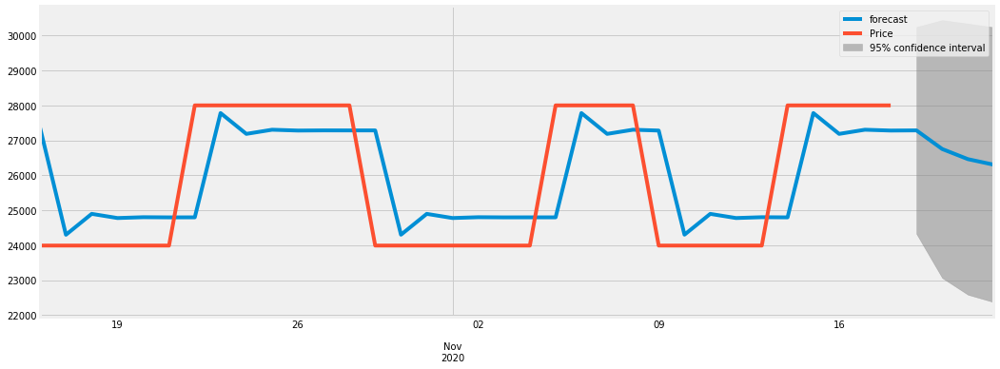

0.8712267564020099
2020-10-16    27351.700915
2020-10-17    24298.343904
2020-10-18    24896.594300
2020-10-19    24777.078411
2020-10-20    24800.942515
2020-10-21    24796.176373
2020-10-22    24797.128228
2020-10-23    27780.632706
2020-10-24    27184.787514
2020-10-25    27303.785657
2020-10-26    27280.020158
2020-10-27    27284.766442
2020-10-28    27283.818546
2020-10-29    27284.007854
2020-10-30    24300.275470
2020-10-31    24896.166178
2020-11-01    24777.158945
2020-11-02    24800.926259
2020-11-03    24796.179613
2020-11-04    24797.127581
2020-11-05    24796.938259
2020-11-06    27780.670645
2020-11-07    27184.779937
2020-11-08    27303.787170
2020-11-09    27280.019856
2020-11-10    24301.071926
2020-11-11    24896.007115
2020-11-12    24777.190712
2020-11-13    24800.919915
2020-11-14    24796.180880
2020-11-15    27780.821904
2020-11-16    27184.749728
2020-11-17    27303.793203
2020-11-18    27280.018651
2020-11-19    27284.766743
2020-11-20    26751.639536
2020-11-2

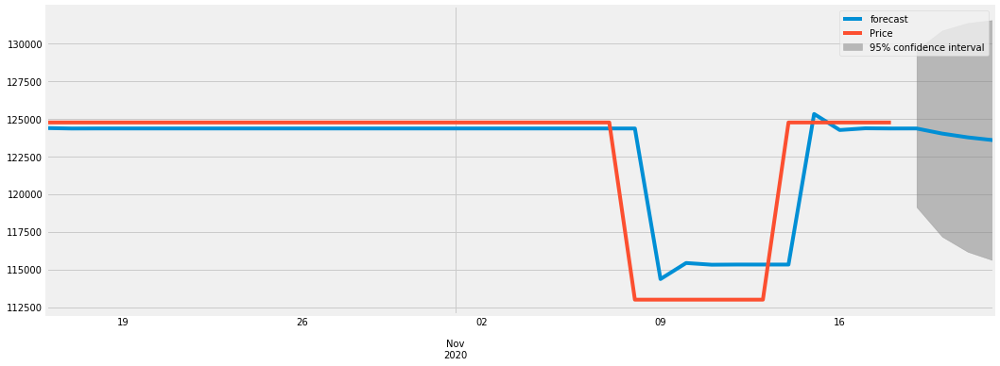

0.9501355664420958
2020-10-16    124370.906169
2020-10-17    124340.161168
2020-10-18    124343.713792
2020-10-19    124343.338098
2020-10-20    124343.378221
2020-10-21    124343.373941
2020-10-22    124343.374397
2020-10-23    124343.374349
2020-10-24    124343.374354
2020-10-25    124343.374353
2020-10-26    124343.374353
2020-10-27    124343.374353
2020-10-28    124343.374353
2020-10-29    124343.374353
2020-10-30    124343.374353
2020-10-31    124343.374353
2020-11-01    124343.374353
2020-11-02    124343.374353
2020-11-03    124343.374353
2020-11-04    124343.374353
2020-11-05    124343.374353
2020-11-06    124343.374353
2020-11-07    124343.374353
2020-11-08    124343.374353
2020-11-09    114355.641482
2020-11-10    115421.300362
2020-11-11    115307.597997
2020-11-12    115319.729673
2020-11-13    115318.435262
2020-11-14    115318.573371
2020-11-15    125306.291507
2020-11-16    124240.634199
2020-11-17    124354.336397
2020-11-18    124342.204739
2020-11-19    124343.499148
2

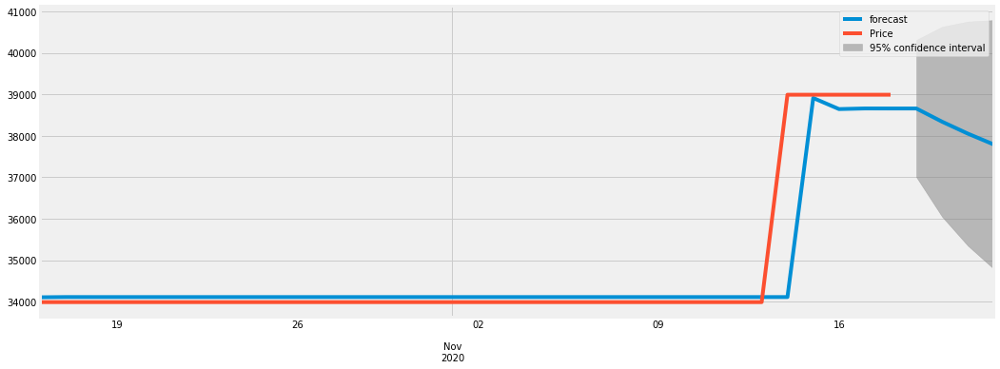

0.9915884093560591
2020-10-16    34106.509240
2020-10-17    34112.422358
2020-10-18    34112.076232
2020-10-19    34112.095459
2020-10-20    34112.094388
2020-10-21    34112.094448
2020-10-22    34112.094444
2020-10-23    34112.094445
2020-10-24    34112.094445
2020-10-25    34112.094445
2020-10-26    34112.094445
2020-10-27    34112.094445
2020-10-28    34112.094445
2020-10-29    34112.094445
2020-10-30    34112.094445
2020-10-31    34112.094445
2020-11-01    34112.094445
2020-11-02    34112.094445
2020-11-03    34112.094445
2020-11-04    34112.094445
2020-11-05    34112.094445
2020-11-06    34112.094445
2020-11-07    34112.094445
2020-11-08    34112.094445
2020-11-09    34112.094445
2020-11-10    34112.094445
2020-11-11    34112.094445
2020-11-12    34112.094445
2020-11-13    34112.094445
2020-11-14    34112.094445
2020-11-15    38911.573489
2020-11-16    38644.201890
2020-11-17    38659.096751
2020-11-18    38658.266981
2020-11-19    38658.313206
2020-11-20    38339.925868
2020-11-2

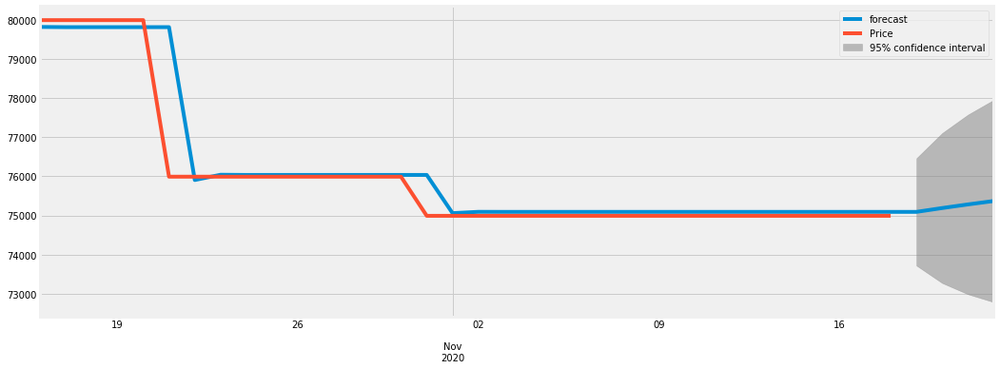

0.9964686092866056
2020-10-16    79816.229931
2020-10-17    79810.609232
2020-10-18    79810.807897
2020-10-19    79810.801102
2020-10-20    79810.801335
2020-10-21    79810.801327
2020-10-22    75905.395101
2020-10-23    76039.107458
2020-10-24    76034.529446
2020-10-25    76034.686187
2020-10-26    76034.680821
2020-10-27    76034.681004
2020-10-28    76034.680998
2020-10-29    76034.680998
2020-10-30    76034.680998
2020-10-31    76034.680998
2020-11-01    75058.329442
2020-11-02    75091.757531
2020-11-03    75090.613028
2020-11-04    75090.652213
2020-11-05    75090.650872
2020-11-06    75090.650918
2020-11-07    75090.650916
2020-11-08    75090.650916
2020-11-09    75090.650916
2020-11-10    75090.650916
2020-11-11    75090.650916
2020-11-12    75090.650916
2020-11-13    75090.650916
2020-11-14    75090.650916
2020-11-15    75090.650916
2020-11-16    75090.650916
2020-11-17    75090.650916
2020-11-18    75090.650916
2020-11-19    75090.650916
2020-11-20    75188.921595
2020-11-2

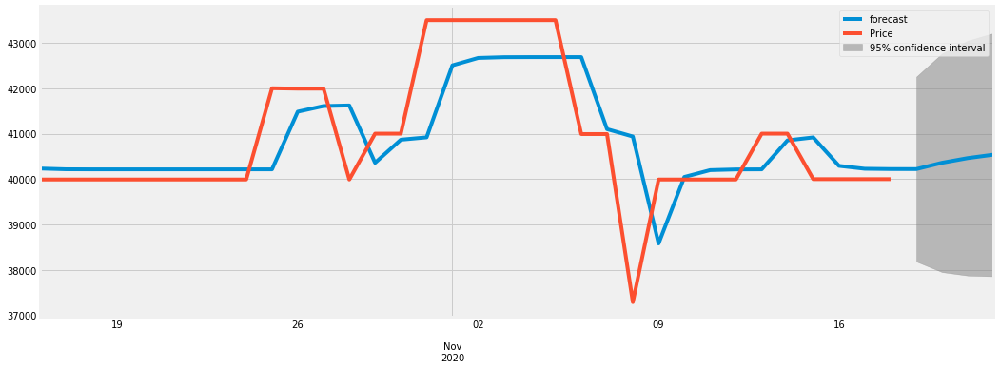

0.8949600512677872
2020-10-16    40231.902750
2020-10-17    40215.128446
2020-10-18    40213.528035
2020-10-19    40213.365123
2020-10-20    40213.348433
2020-10-21    40213.346722
2020-10-22    40213.346547
2020-10-23    40213.346529
2020-10-24    40213.346527
2020-10-25    40213.346527
2020-10-26    41483.122078
2020-10-27    41607.614368
2020-10-28    41620.377641
2020-10-29    40357.599006
2020-10-30    40865.867637
2020-10-31    40917.976655
2020-11-01    42503.427956
2020-11-02    42665.972535
2020-11-03    42682.637026
2020-11-04    42684.345513
2020-11-05    42684.520672
2020-11-06    42684.538630
2020-11-07    41098.743129
2020-11-08    40936.163262
2020-11-09    38580.933908
2020-11-10    40045.987352
2020-11-11    40196.188430
2020-11-12    40211.587434
2020-11-13    40213.166180
2020-11-14    40851.060009
2020-11-15    40916.458539
2020-11-16    40290.487742
2020-11-17    40226.311593
2020-11-18    40219.732088
2020-11-19    40219.057540
2020-11-20    40358.706382
2020-11-2

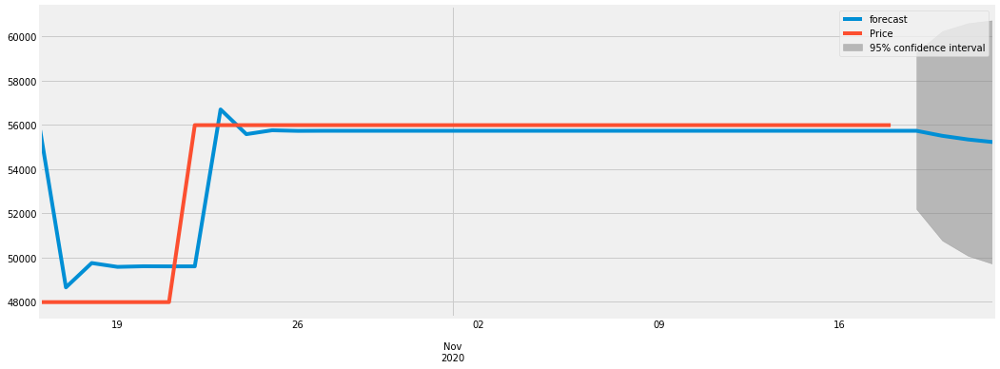

0.9485538699771177
2020-10-16    55758.135090
2020-10-17    48656.735232
2020-10-18    49756.314954
2020-10-19    49583.127453
2020-10-20    49610.396651
2020-10-21    49606.102526
2020-10-22    49606.778718
2020-10-23    56699.018174
2020-10-24    55582.206562
2020-10-25    55758.070361
2020-10-26    55730.377172
2020-10-27    55734.738005
2020-10-28    55734.051307
2020-10-29    55734.159441
2020-10-30    55734.142413
2020-10-31    55734.145094
2020-11-01    55734.144672
2020-11-02    55734.144739
2020-11-03    55734.144728
2020-11-04    55734.144730
2020-11-05    55734.144730
2020-11-06    55734.144730
2020-11-07    55734.144730
2020-11-08    55734.144730
2020-11-09    55734.144730
2020-11-10    55734.144730
2020-11-11    55734.144730
2020-11-12    55734.144730
2020-11-13    55734.144730
2020-11-14    55734.144730
2020-11-15    55734.144730
2020-11-16    55734.144730
2020-11-17    55734.144730
2020-11-18    55734.144730
2020-11-19    55734.144730
2020-11-20    55507.317969
2020-11-2

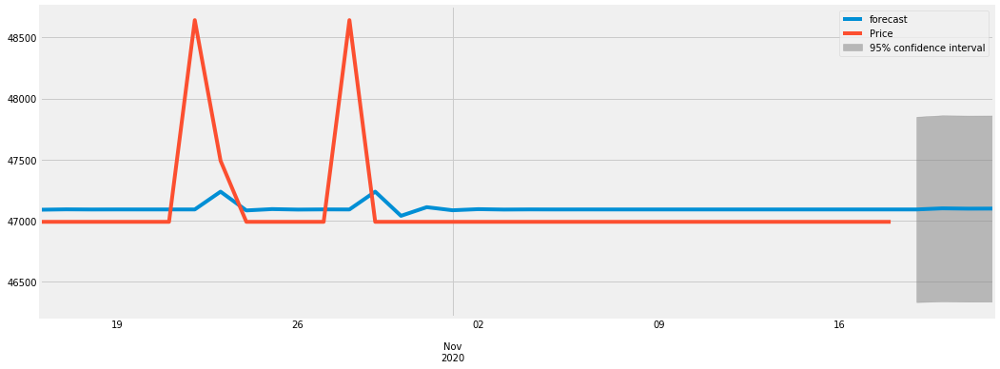

0.16196906746374573
2020-10-16    47089.073619
2020-10-17    47092.095998
2020-10-18    47090.980066
2020-10-19    47091.375573
2020-10-20    47091.233292
2020-10-21    47091.284206
2020-10-22    47091.265952
2020-10-23    47236.899757
2020-10-24    47083.188545
2020-10-25    47094.166965
2020-10-26    47090.232937
2020-10-27    47091.642664
2020-10-28    47091.137500
2020-10-29    47236.945789
2020-10-30    47039.069304
2020-10-31    47109.976737
2020-11-01    47084.567633
2020-11-02    47093.672780
2020-11-03    47090.410024
2020-11-04    47091.579206
2020-11-05    47091.160239
2020-11-06    47091.310373
2020-11-07    47091.256574
2020-11-08    47091.275852
2020-11-09    47091.268944
2020-11-10    47091.271419
2020-11-11    47091.270532
2020-11-12    47091.270850
2020-11-13    47091.270736
2020-11-14    47091.270777
2020-11-15    47091.270762
2020-11-16    47091.270768
2020-11-17    47091.270766
2020-11-18    47091.270766
2020-11-19    47091.270766
2020-11-20    47100.203404
2020-11-

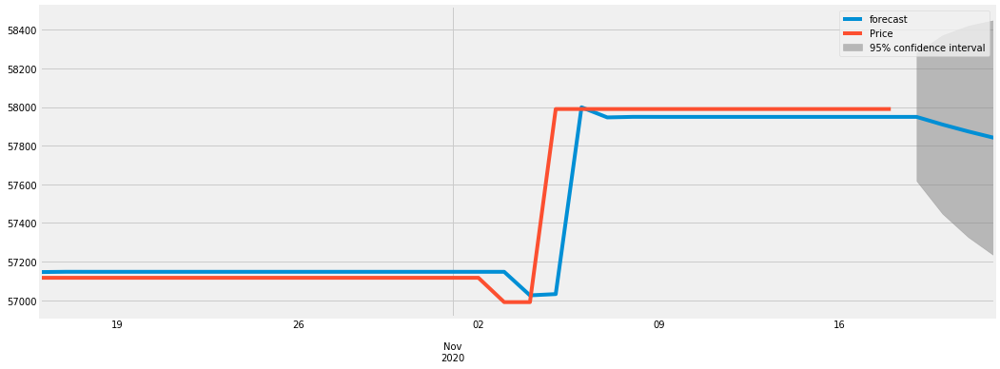

0.9935225716972499
2020-10-16    57145.585645
2020-10-17    57147.059958
2020-10-18    57146.976071
2020-10-19    57146.980605
2020-10-20    57146.980360
2020-10-21    57146.980373
2020-10-22    57146.980372
2020-10-23    57146.980372
2020-10-24    57146.980372
2020-10-25    57146.980372
2020-10-26    57146.980372
2020-10-27    57146.980372
2020-10-28    57146.980372
2020-10-29    57146.980372
2020-10-30    57146.980372
2020-10-31    57146.980372
2020-11-01    57146.980372
2020-11-02    57146.980372
2020-11-03    57146.980372
2020-11-04    57025.037708
2020-11-05    57031.646813
2020-11-06    57999.087529
2020-11-07    57946.653733
2020-11-08    57949.495564
2020-11-09    57949.341541
2020-11-10    57949.349889
2020-11-11    57949.349437
2020-11-12    57949.349461
2020-11-13    57949.349460
2020-11-14    57949.349460
2020-11-15    57949.349460
2020-11-16    57949.349460
2020-11-17    57949.349460
2020-11-18    57949.349460
2020-11-19    57949.349460
2020-11-20    57910.007911
2020-11-2

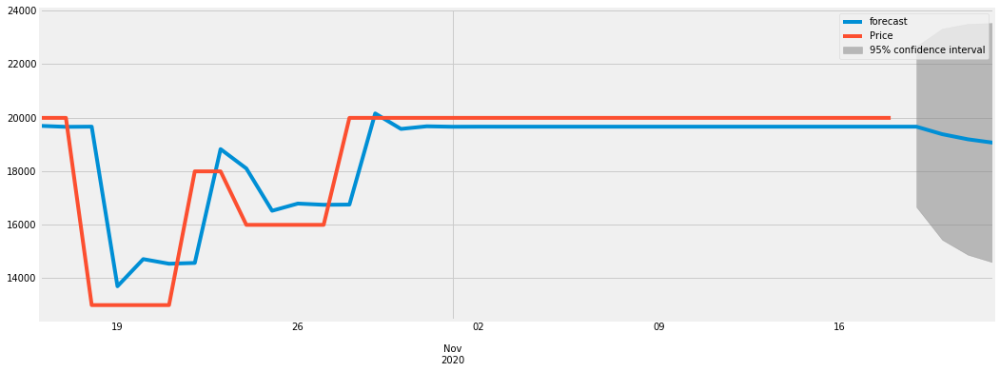

0.9320041750623724
2020-10-16    19692.176046
2020-10-17    19654.607810
2020-10-18    19661.796712
2020-10-19    13694.508503
2020-10-20    14708.943790
2020-10-21    14536.487749
2020-10-22    14565.805612
2020-10-23    18822.327635
2020-10-24    18098.710508
2020-10-25    16517.124398
2020-10-26    16785.997152
2020-10-27    16740.288254
2020-10-28    16748.058857
2020-10-29    20155.942733
2020-10-30    19576.595762
2020-10-31    19675.085888
2020-11-01    19658.342373
2020-11-02    19661.188803
2020-11-03    19660.704905
2020-11-04    19660.787168
2020-11-05    19660.773183
2020-11-06    19660.775561
2020-11-07    19660.775157
2020-11-08    19660.775225
2020-11-09    19660.775214
2020-11-10    19660.775216
2020-11-11    19660.775215
2020-11-12    19660.775215
2020-11-13    19660.775215
2020-11-14    19660.775215
2020-11-15    19660.775215
2020-11-16    19660.775215
2020-11-17    19660.775215
2020-11-18    19660.775215
2020-11-19    19660.775215
2020-11-20    19380.176529
2020-11-2

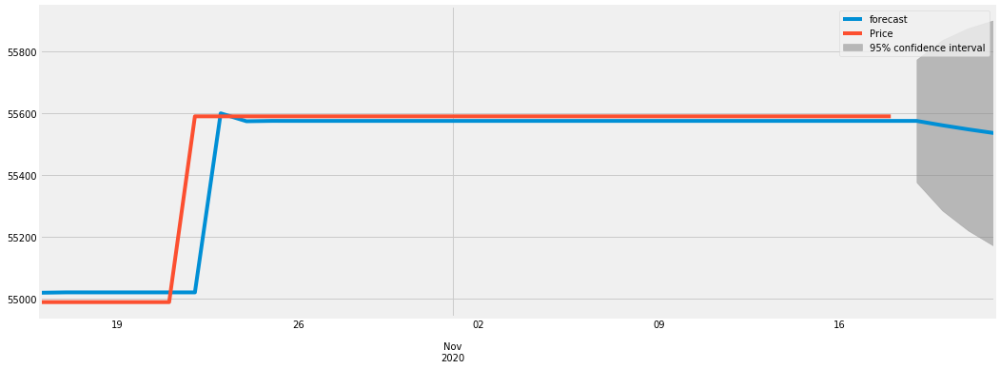

0.9936351950258921
2020-10-16    55020.307311
2020-10-17    55021.543123
2020-10-18    55021.486388
2020-10-19    55021.488886
2020-10-20    55021.488776
2020-10-21    55021.488780
2020-10-22    55021.488780
2020-10-23    55600.717119
2020-10-24    55575.166940
2020-10-25    55576.293977
2020-10-26    55576.244262
2020-10-27    55576.246455
2020-10-28    55576.246358
2020-10-29    55576.246363
2020-10-30    55576.246362
2020-10-31    55576.246362
2020-11-01    55576.246362
2020-11-02    55576.246362
2020-11-03    55576.246362
2020-11-04    55576.246362
2020-11-05    55576.246362
2020-11-06    55576.246362
2020-11-07    55576.246362
2020-11-08    55576.246362
2020-11-09    55576.246362
2020-11-10    55576.246362
2020-11-11    55576.246362
2020-11-12    55576.246362
2020-11-13    55576.246362
2020-11-14    55576.246362
2020-11-15    55576.246362
2020-11-16    55576.246362
2020-11-17    55576.246362
2020-11-18    55576.246362
2020-11-19    55576.246362
2020-11-20    55562.027186
2020-11-2

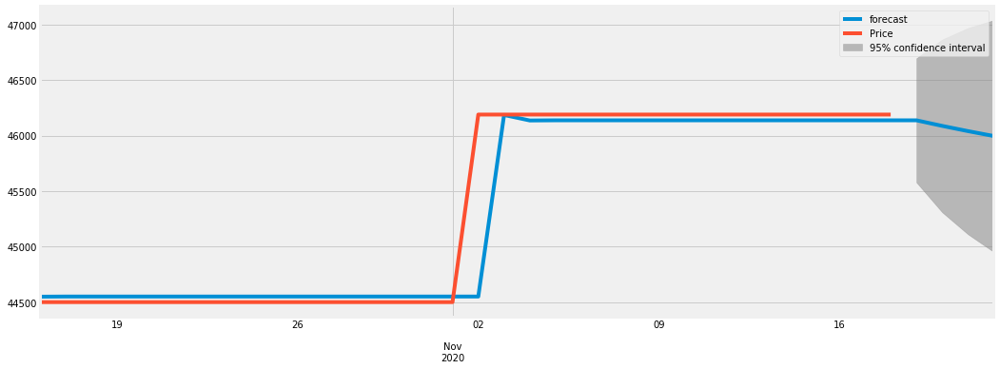

0.9964417974562907
2020-10-16    44549.011458
2020-10-17    44550.406379
2020-10-18    44550.362957
2020-10-19    44550.364270
2020-10-20    44550.364230
2020-10-21    44550.364231
2020-10-22    44550.364231
2020-10-23    44550.364231
2020-10-24    44550.364231
2020-10-25    44550.364231
2020-10-26    44550.364231
2020-10-27    44550.364231
2020-10-28    44550.364231
2020-10-29    44550.364231
2020-10-30    44550.364231
2020-10-31    44550.364231
2020-11-01    44550.364231
2020-11-02    44550.364231
2020-11-03    46185.153109
2020-11-04    46135.672786
2020-11-05    46137.170412
2020-11-06    46137.125083
2020-11-07    46137.126455
2020-11-08    46137.126414
2020-11-09    46137.126415
2020-11-10    46137.126415
2020-11-11    46137.126415
2020-11-12    46137.126415
2020-11-13    46137.126415
2020-11-14    46137.126415
2020-11-15    46137.126415
2020-11-16    46137.126415
2020-11-17    46137.126415
2020-11-18    46137.126415
2020-11-19    46137.126415
2020-11-20    46086.917795
2020-11-2

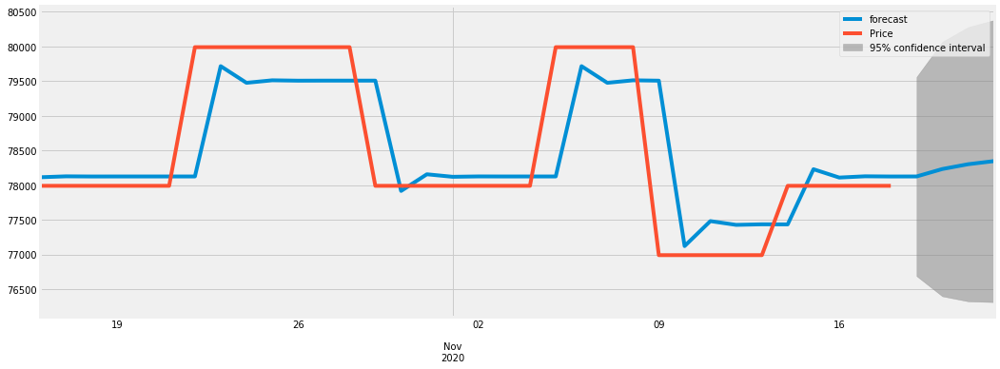

0.9136220752730515
2020-10-16    78113.689192
2020-10-17    78126.914823
2020-10-18    78124.706574
2020-10-19    78125.034376
2020-10-20    78124.984797
2020-10-21    78124.992275
2020-10-22    78124.991147
2020-10-23    79716.023408
2020-10-24    79475.970194
2020-10-25    79512.189161
2020-10-26    79506.724483
2020-10-27    79507.548988
2020-10-28    79507.424587
2020-10-29    79507.443357
2020-10-30    77916.408434
2020-10-31    78156.462050
2020-11-01    78120.243022
2020-11-02    78125.707709
2020-11-03    78124.883203
2020-11-04    78125.007604
2020-11-05    78124.988834
2020-11-06    79716.023757
2020-11-07    79475.970141
2020-11-08    79512.189169
2020-11-09    79506.724482
2020-11-10    77121.000851
2020-11-11    77480.956234
2020-11-12    77426.646558
2020-11-13    77434.840742
2020-11-14    77433.604413
2020-11-15    78229.306994
2020-11-16    78109.252256
2020-11-17    78127.365984
2020-11-18    78124.633004
2020-11-19    78125.045353
2020-11-20    78232.413884
2020-11-2

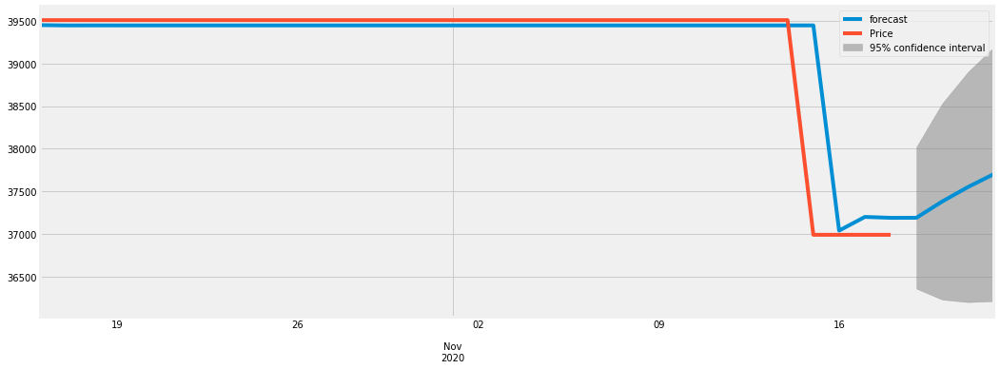

0.9891410744493541
2020-10-16    39450.452325
2020-10-17    39446.941879
2020-10-18    39447.190206
2020-10-19    39447.173699
2020-10-20    39447.174801
2020-10-21    39447.174728
2020-10-22    39447.174733
2020-10-23    39447.174732
2020-10-24    39447.174732
2020-10-25    39447.174732
2020-10-26    39447.174732
2020-10-27    39447.174732
2020-10-28    39447.174732
2020-10-29    39447.174732
2020-10-30    39447.174732
2020-10-31    39447.174732
2020-11-01    39447.174732
2020-11-02    39447.174732
2020-11-03    39447.174732
2020-11-04    39447.174732
2020-11-05    39447.174732
2020-11-06    39447.174732
2020-11-07    39447.174732
2020-11-08    39447.174732
2020-11-09    39447.174732
2020-11-10    39447.174732
2020-11-11    39447.174732
2020-11-12    39447.174732
2020-11-13    39447.174732
2020-11-14    39447.174732
2020-11-15    39447.174732
2020-11-16    37039.101182
2020-11-17    37199.813966
2020-11-18    37189.088131
2020-11-19    37189.803964
2020-11-20    37380.761605
2020-11-2

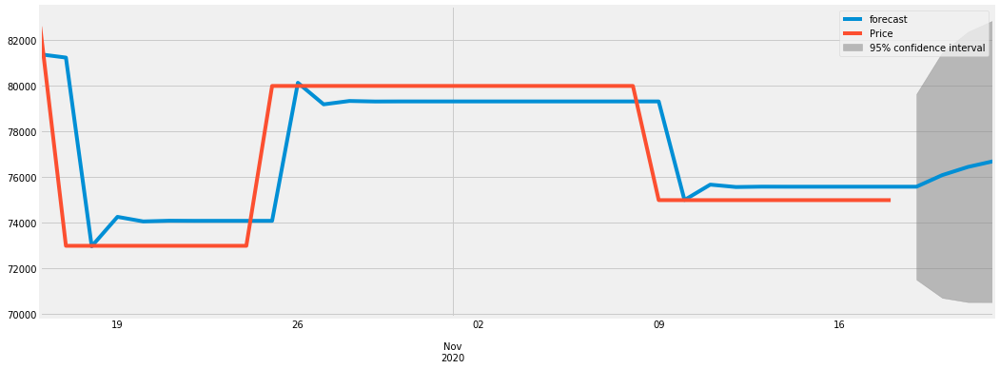

0.9400325086243111
2020-10-16    81375.327867
2020-10-17    81231.477540
2020-10-18    72969.260219
2020-10-19    74258.251780
2020-10-20    74057.085590
2020-10-21    74088.480518
2020-10-22    74083.580873
2020-10-23    74084.345536
2020-10-24    74084.226199
2020-10-25    74084.244823
2020-10-26    80127.459602
2020-10-27    79184.326271
2020-10-28    79331.516221
2020-10-29    79308.545045
2020-10-30    79312.130038
2020-10-31    79311.570547
2020-11-01    79311.657864
2020-11-02    79311.644237
2020-11-03    79311.646363
2020-11-04    79311.646031
2020-11-05    79311.646083
2020-11-06    79311.646075
2020-11-07    79311.646076
2020-11-08    79311.646076
2020-11-09    79311.646076
2020-11-10    74995.062015
2020-11-11    75668.729004
2020-11-12    75563.593275
2020-11-13    75580.001265
2020-11-14    75577.440555
2020-11-15    75577.840192
2020-11-16    75577.777823
2020-11-17    75577.787556
2020-11-18    75577.786037
2020-11-19    75577.786274
2020-11-20    76085.232010
2020-11-2

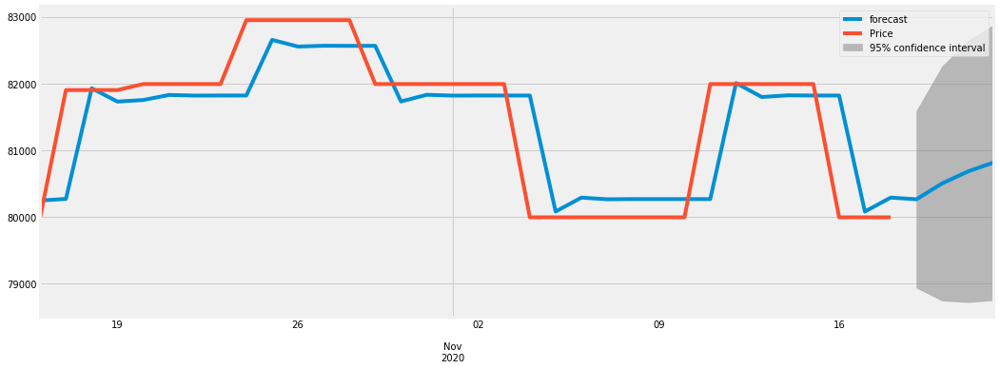

0.9527352091388809
2020-10-16    80242.406574
2020-10-17    80266.259845
2020-10-18    81925.815744
2020-10-19    81726.606029
2020-10-20    81750.521826
2020-10-21    81825.998704
2020-10-22    81816.937448
2020-10-23    81818.025283
2020-10-24    81817.894684
2020-10-25    82652.752359
2020-10-26    82552.524856
2020-10-27    82564.557509
2020-10-28    82563.112948
2020-10-29    82563.286372
2020-10-30    81728.423556
2020-10-31    81828.651676
2020-11-01    81816.618950
2020-11-02    81818.063519
2020-11-03    81817.890094
2020-11-04    81817.910914
2020-11-05    80076.840644
2020-11-06    80285.862051
2020-11-07    80260.768320
2020-11-08    80263.780908
2020-11-09    80263.419237
2020-11-10    80263.462656
2020-11-11    80263.457444
2020-11-12    82004.525840
2020-11-13    81795.504658
2020-11-14    81820.598362
2020-11-15    81817.585777
2020-11-16    81817.947448
2020-11-17    80076.836258
2020-11-18    80285.862578
2020-11-19    80260.768257
2020-11-20    80499.493858
2020-11-2

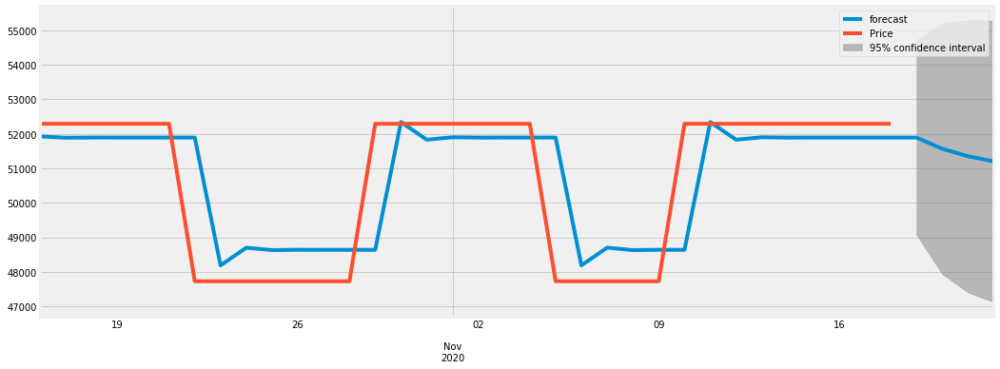

0.9247756652939075
2020-10-16    51922.951037
2020-10-17    51885.932418
2020-10-18    51891.574248
2020-10-19    51890.803934
2020-10-20    51890.910805
2020-10-21    51890.896011
2020-10-22    51890.898060
2020-10-23    48189.801892
2020-10-24    48702.293144
2020-10-25    48631.328416
2020-10-26    48641.154910
2020-10-27    48639.794235
2020-10-28    48639.982647
2020-10-29    48639.956558
2020-10-30    52341.056054
2020-10-31    51828.564342
2020-11-01    51899.529134
2020-11-02    51889.702630
2020-11-03    51891.063307
2020-11-04    51890.874894
2020-11-05    51890.900984
2020-11-06    48189.801488
2020-11-07    48702.293200
2020-11-08    48631.328408
2020-11-09    48641.154912
2020-11-10    48639.794234
2020-11-11    52341.078531
2020-11-12    51828.561229
2020-11-13    51899.529565
2020-11-14    51889.702570
2020-11-15    51891.063315
2020-11-16    51890.874893
2020-11-17    51890.900984
2020-11-18    51890.897371
2020-11-19    51890.897871
2020-11-20    51566.969020
2020-11-2

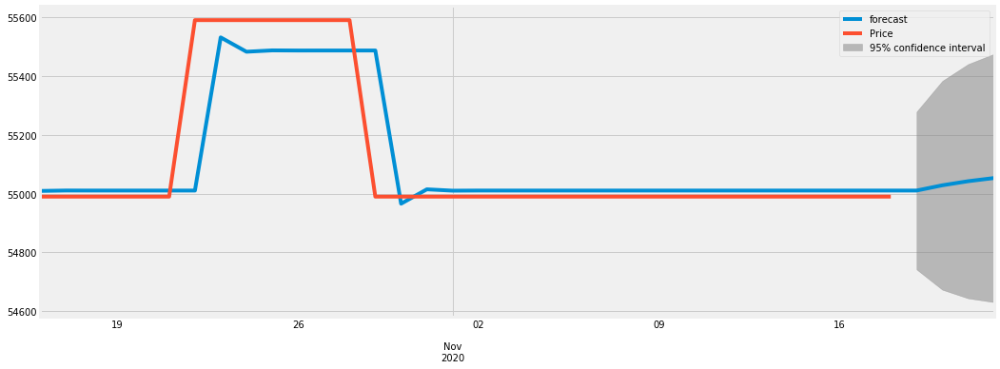

0.9601233312117272
2020-10-16    55009.350957
2020-10-17    55010.804390
2020-10-18    55010.658081
2020-10-19    55010.671684
2020-10-20    55010.670410
2020-10-21    55010.670529
2020-10-22    55010.670518
2020-10-23    55532.248813
2020-10-24    55483.410034
2020-10-25    55487.983127
2020-10-26    55487.554919
2020-10-27    55487.595015
2020-10-28    55487.591260
2020-10-29    55487.591612
2020-10-30    54966.013286
2020-10-31    55014.852067
2020-11-01    55010.278973
2020-11-02    55010.707182
2020-11-03    55010.667086
2020-11-04    55010.670840
2020-11-05    55010.670489
2020-11-06    55010.670522
2020-11-07    55010.670519
2020-11-08    55010.670519
2020-11-09    55010.670519
2020-11-10    55010.670519
2020-11-11    55010.670519
2020-11-12    55010.670519
2020-11-13    55010.670519
2020-11-14    55010.670519
2020-11-15    55010.670519
2020-11-16    55010.670519
2020-11-17    55010.670519
2020-11-18    55010.670519
2020-11-19    55010.670519
2020-11-20    55028.609444
2020-11-2

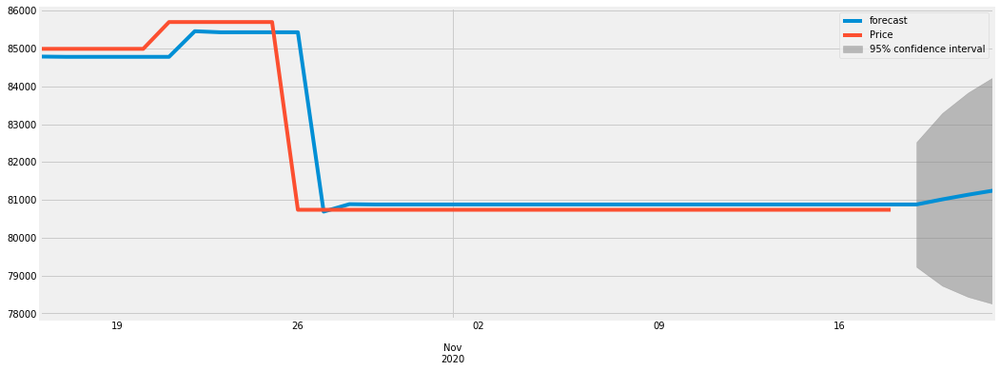

0.9932567466258854
2020-10-16    84785.354801
2020-10-17    84777.580912
2020-10-18    84777.916195
2020-10-19    84777.902288
2020-10-20    84777.902866
2020-10-21    84777.902842
2020-10-22    85454.337266
2020-10-23    85426.235775
2020-10-24    85427.403211
2020-10-25    85427.354711
2020-10-26    85427.356726
2020-10-27    80689.449431
2020-10-28    80886.278948
2020-10-29    80878.101950
2020-10-30    80878.441652
2020-10-31    80878.427539
2020-11-01    80878.428126
2020-11-02    80878.428101
2020-11-03    80878.428102
2020-11-04    80878.428102
2020-11-05    80878.428102
2020-11-06    80878.428102
2020-11-07    80878.428102
2020-11-08    80878.428102
2020-11-09    80878.428102
2020-11-10    80878.428102
2020-11-11    80878.428102
2020-11-12    80878.428102
2020-11-13    80878.428102
2020-11-14    80878.428102
2020-11-15    80878.428102
2020-11-16    80878.428102
2020-11-17    80878.428102
2020-11-18    80878.428102
2020-11-19    80878.428102
2020-11-20    81012.595337
2020-11-2

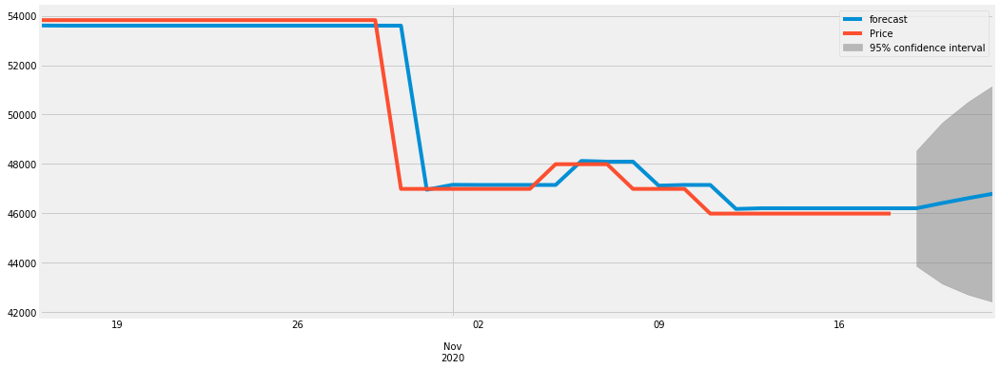

0.9969411205604287
2020-10-16    53605.632036
2020-10-17    53599.472677
2020-10-18    53599.662666
2020-10-19    53599.656972
2020-10-20    53599.657142
2020-10-21    53599.657137
2020-10-22    53599.657138
2020-10-23    53599.657137
2020-10-24    53599.657137
2020-10-25    53599.657137
2020-10-26    53599.657137
2020-10-27    53599.657137
2020-10-28    53599.657137
2020-10-29    53599.657137
2020-10-30    53599.657137
2020-10-31    46956.291458
2020-11-01    47155.563533
2020-11-02    47149.586238
2020-11-03    47149.765530
2020-11-04    47149.760152
2020-11-05    47149.760314
2020-11-06    48122.007591
2020-11-07    48092.844402
2020-11-08    48093.719170
2020-11-09    47121.445649
2020-11-10    47150.609626
2020-11-11    47149.734833
2020-11-12    46177.513791
2020-11-13    46206.676194
2020-11-14    46205.801448
2020-11-15    46205.827687
2020-11-16    46205.826900
2020-11-17    46205.826923
2020-11-18    46205.826923
2020-11-19    46205.826923
2020-11-20    46415.664062
2020-11-2

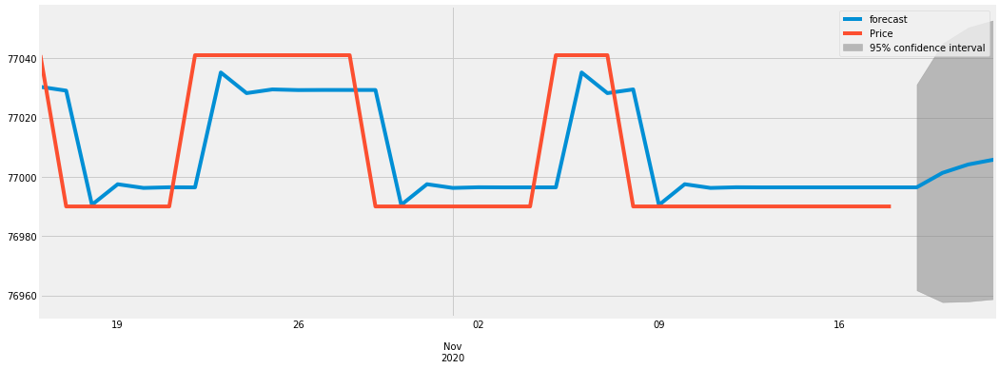

0.8861637062501597
2020-10-16    77030.331792
2020-10-17    77029.054085
2020-10-18    76990.569745
2020-10-19    76997.486363
2020-10-20    76996.242665
2020-10-21    76996.466297
2020-10-22    76996.426085
2020-10-23    77035.179188
2020-10-24    77028.210882
2020-10-25    77029.463873
2020-10-26    77029.238569
2020-10-27    77029.279082
2020-10-28    77029.271797
2020-10-29    77029.273107
2020-10-30    76990.527000
2020-10-31    76997.494047
2020-11-01    76996.241283
2020-11-02    76996.466546
2020-11-03    76996.426041
2020-11-04    76996.433324
2020-11-05    76996.432014
2020-11-06    77035.178122
2020-11-07    77028.211074
2020-11-08    77029.463839
2020-11-09    76990.492704
2020-11-10    76997.500214
2020-11-11    76996.240174
2020-11-12    76996.466745
2020-11-13    76996.426005
2020-11-14    76996.433331
2020-11-15    76996.432013
2020-11-16    76996.432250
2020-11-17    76996.432208
2020-11-18    76996.432215
2020-11-19    76996.432214
2020-11-20    77001.318915
2020-11-2

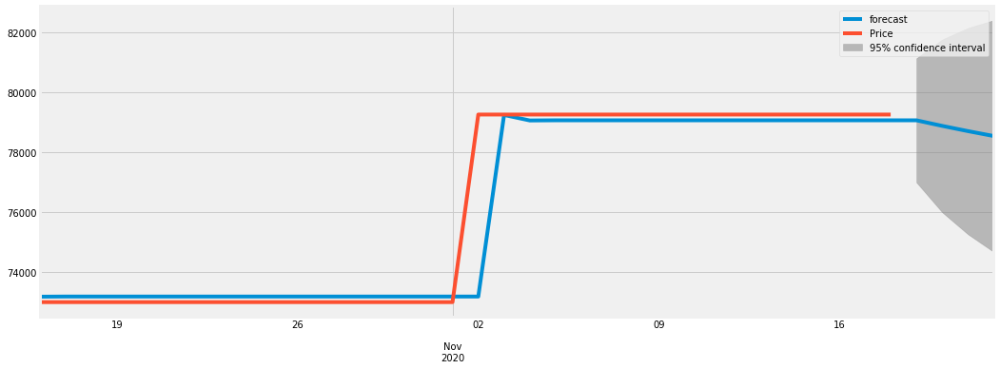

0.996442029946328
2020-10-16    73171.485577
2020-10-17    73176.650894
2020-10-18    73176.490104
2020-10-19    73176.494967
2020-10-20    73176.494819
2020-10-21    73176.494824
2020-10-22    73176.494824
2020-10-23    73176.494824
2020-10-24    73176.494824
2020-10-25    73176.494824
2020-10-26    73176.494824
2020-10-27    73176.494824
2020-10-28    73176.494824
2020-10-29    73176.494824
2020-10-30    73176.494824
2020-10-31    73176.494824
2020-11-01    73176.494824
2020-11-02    73176.494824
2020-11-03    79236.535933
2020-11-04    79053.114605
2020-11-05    79058.666280
2020-11-06    79058.498246
2020-11-07    79058.503332
2020-11-08    79058.503178
2020-11-09    79058.503183
2020-11-10    79058.503183
2020-11-11    79058.503183
2020-11-12    79058.503183
2020-11-13    79058.503183
2020-11-14    79058.503183
2020-11-15    79058.503183
2020-11-16    79058.503183
2020-11-17    79058.503183
2020-11-18    79058.503183
2020-11-19    79058.503183
2020-11-20    78872.184922
2020-11-21

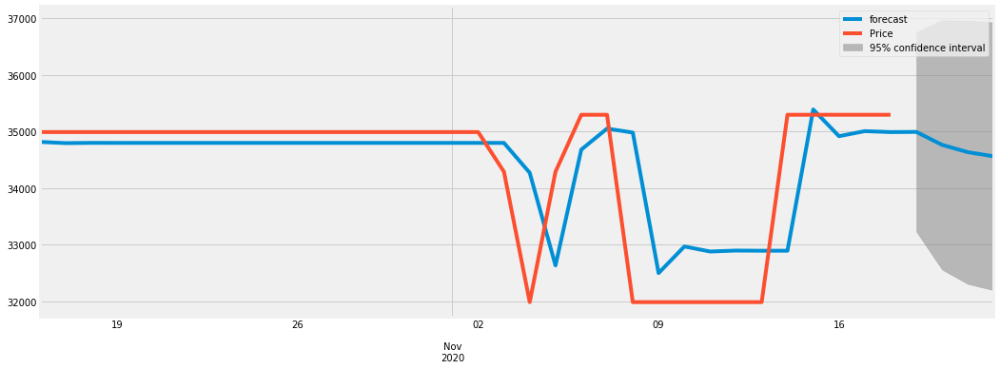

0.8803125098421891
2020-10-16    34816.447759
2020-10-17    34794.887978
2020-10-18    34799.467067
2020-10-19    34798.621817
2020-10-20    34798.782303
2020-10-21    34798.751992
2020-10-22    34798.757722
2020-10-23    34798.756639
2020-10-24    34798.756844
2020-10-25    34798.756805
2020-10-26    34798.756812
2020-10-27    34798.756811
2020-10-28    34798.756811
2020-10-29    34798.756811
2020-10-30    34798.756811
2020-10-31    34798.756811
2020-11-01    34798.756811
2020-11-02    34798.756811
2020-11-03    34798.756811
2020-11-04    34271.059734
2020-11-05    32636.948106
2020-11-06    34679.704880
2020-11-07    35051.186268
2020-11-08    34980.965408
2020-11-09    32502.755147
2020-11-10    32971.209452
2020-11-11    32882.657871
2020-11-12    32899.396713
2020-11-13    32896.232582
2020-11-14    32896.830695
2020-11-15    35388.201694
2020-11-16    34917.259624
2020-11-17    35006.281465
2020-11-18    34989.453730
2020-11-19    34992.634665
2020-11-20    34764.094370
2020-11-2

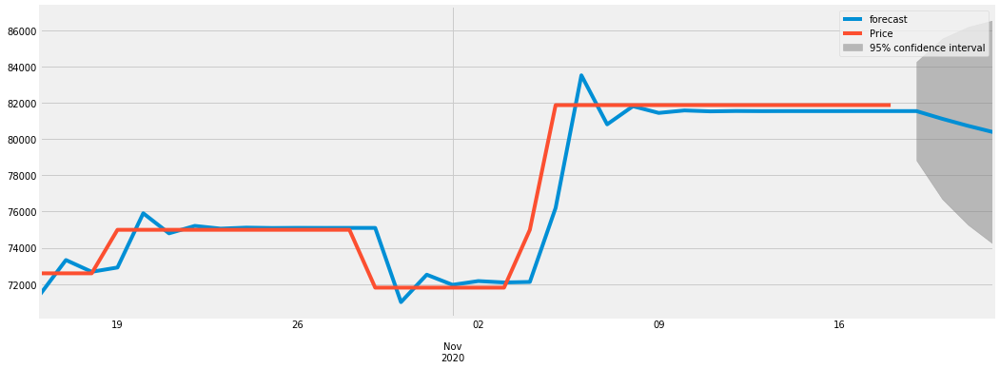

0.9845290457288451
2020-10-16    71428.963468
2020-10-17    73323.230475
2020-10-18    72674.263006
2020-10-19    72910.256875
2020-10-20    75901.963199
2020-10-21    74795.962596
2020-10-22    75204.909202
2020-10-23    75053.695688
2020-10-24    75109.609025
2020-10-25    75088.934256
2020-10-26    75096.579051
2020-10-27    75093.752277
2020-10-28    75094.797518
2020-10-29    75094.411025
2020-10-30    71001.723886
2020-10-31    72515.054353
2020-11-01    71955.478450
2020-11-02    72162.389761
2020-11-03    72085.881301
2020-11-04    72114.171414
2020-11-05    76196.540784
2020-11-06    83510.345919
2020-11-07    80805.960326
2020-11-08    81805.946147
2020-11-09    81436.186877
2020-11-10    81572.910733
2020-11-11    81522.355103
2020-11-12    81541.048781
2020-11-13    81534.136523
2020-11-14    81536.692430
2020-11-15    81535.747346
2020-11-16    81536.096805
2020-11-17    81537.250606
2020-11-18    81536.823972
2020-11-19    81536.981726
2020-11-20    81112.220717
2020-11-2

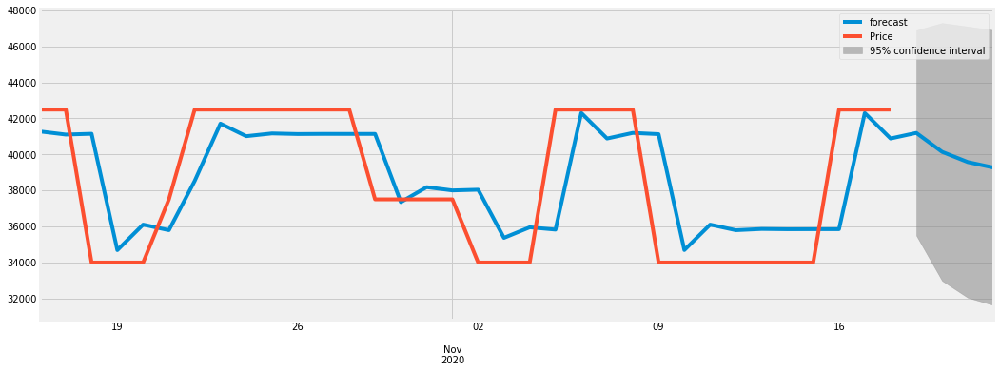

0.8725523996914348
2020-10-16    41270.929734
2020-10-17    41098.531746
2020-10-18    41141.654128
2020-10-19    34680.394543
2020-10-20    36097.113255
2020-10-21    35786.461482
2020-10-22    38520.208681
2020-10-23    41707.325492
2020-10-24    41008.469385
2020-10-25    41161.711292
2020-10-26    41128.109121
2020-10-27    41135.477249
2020-10-28    41133.861600
2020-10-29    41134.215872
2020-10-30    37347.578046
2020-10-31    38177.894325
2020-11-01    37995.826444
2020-11-02    38035.749440
2020-11-03    35361.366330
2020-11-04    35947.792583
2020-11-05    35819.203770
2020-11-06    42299.589250
2020-11-07    40878.600551
2020-11-08    41190.188324
2020-11-09    41121.864811
2020-11-10    34684.657347
2020-11-11    36096.178172
2020-11-12    35786.666470
2020-11-13    35854.534752
2020-11-14    35839.652912
2020-11-15    35842.916133
2020-11-16    35842.200589
2020-11-17    42294.546615
2020-11-18    40879.706276
2020-11-19    41189.945866
2020-11-20    40137.644625
2020-11-2

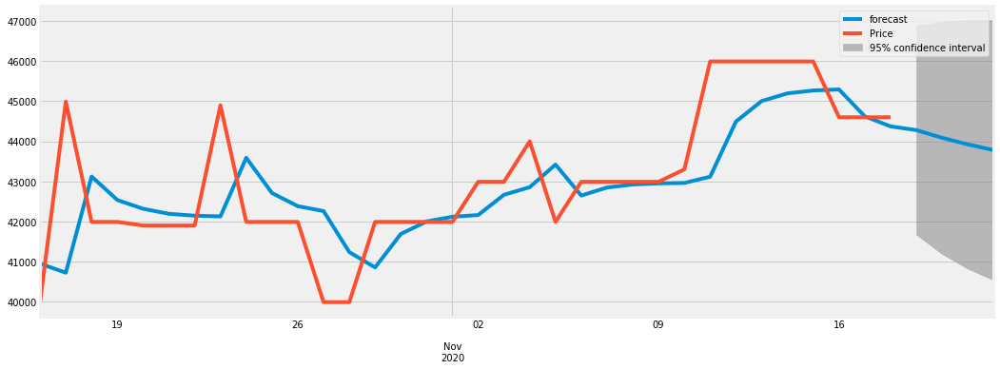

0.8521763206205967
2020-10-16    40948.549103
2020-10-17    40724.191114
2020-10-18    43122.218125
2020-10-19    42535.720200
2020-10-20    42317.280139
2020-10-21    42191.758763
2020-10-22    42144.909687
2020-10-23    42127.423015
2020-10-24    43588.118341
2020-10-25    42710.134896
2020-10-26    42382.416907
2020-10-27    42260.092184
2020-10-28    41236.284773
2020-10-29    40854.136211
2020-10-30    41689.642835
2020-10-31    42001.505840
2020-11-01    42117.912497
2020-11-02    42161.362697
2020-11-03    42666.655123
2020-11-04    42855.261664
2020-11-05    43419.137125
2020-11-06    42647.060608
2020-11-07    42847.947773
2020-11-08    42922.931349
2020-11-09    42950.919881
2020-11-10    42961.366940
2020-11-11    43116.390332
2020-11-12    44490.353129
2020-11-13    45003.201446
2020-11-14    45194.628314
2020-11-15    45266.080720
2020-11-16    45292.751199
2020-11-17    44622.404192
2020-11-18    44372.189023
2020-11-19    44278.793169
2020-11-20    44087.327160
2020-11-2

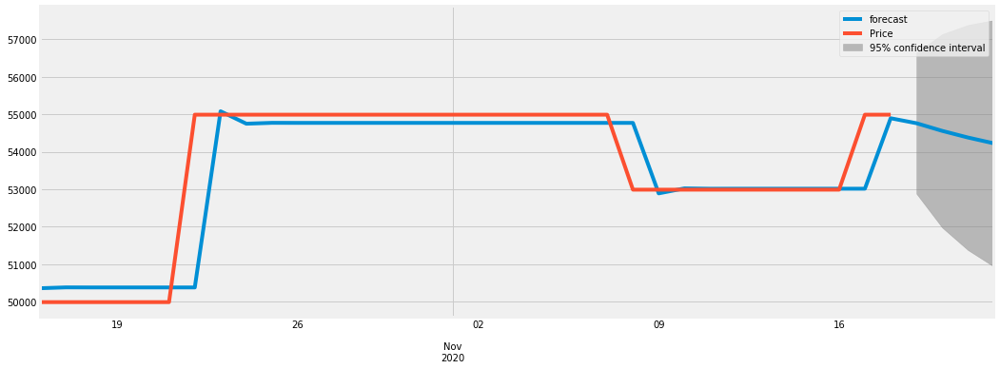

0.9853399025426454
2020-10-16    50360.232844
2020-10-17    50383.257738
2020-10-18    50381.531723
2020-10-19    50381.653002
2020-10-20    50381.644440
2020-10-21    50381.645045
2020-10-22    50381.645002
2020-10-23    55081.238014
2020-10-24    54749.562692
2020-10-25    54772.970787
2020-10-26    54771.318753
2020-10-27    54771.435346
2020-10-28    54771.427117
2020-10-29    54771.427698
2020-10-30    54771.427657
2020-10-31    54771.427660
2020-11-01    54771.427660
2020-11-02    54771.427660
2020-11-03    54771.427660
2020-11-04    54771.427660
2020-11-05    54771.427660
2020-11-06    54771.427660
2020-11-07    54771.427660
2020-11-08    54771.427660
2020-11-09    52891.590456
2020-11-10    53024.260585
2020-11-11    53014.897347
2020-11-12    53015.558160
2020-11-13    53015.511523
2020-11-14    53015.514815
2020-11-15    53015.514582
2020-11-16    53015.514599
2020-11-17    53015.514598
2020-11-18    54895.351801
2020-11-19    54762.681673
2020-11-20    54558.384186
2020-11-2

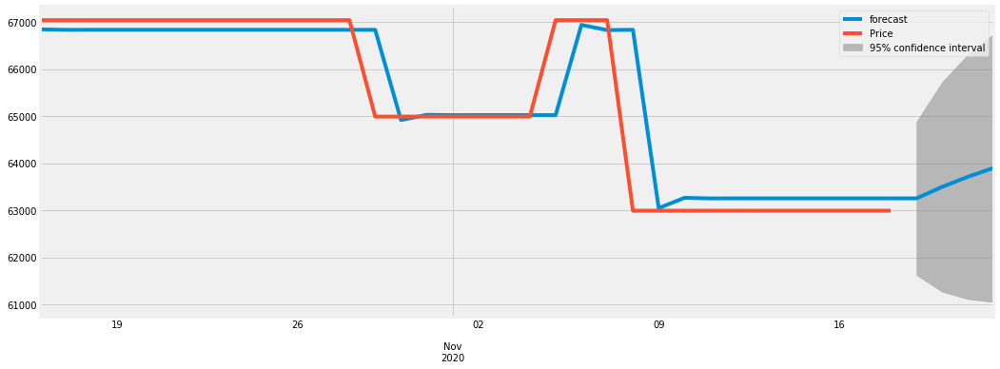

0.9874442688326303
2020-10-16    66843.858646
2020-10-17    66833.794219
2020-10-18    66834.405882
2020-10-19    66834.370627
2020-10-20    66834.372666
2020-10-21    66834.372548
2020-10-22    66834.372555
2020-10-23    66834.372554
2020-10-24    66834.372554
2020-10-25    66834.372554
2020-10-26    66834.372554
2020-10-27    66834.372554
2020-10-28    66834.372554
2020-10-29    66834.372554
2020-10-30    64916.013390
2020-10-31    65026.911738
2020-11-01    65020.500820
2020-11-02    65020.871428
2020-11-03    65020.850004
2020-11-04    65020.851242
2020-11-05    65020.851171
2020-11-06    66939.210340
2020-11-07    66828.311991
2020-11-08    66834.722909
2020-11-09    63044.423219
2020-11-10    63263.536502
2020-11-11    63250.869791
2020-11-12    63251.602041
2020-11-13    63251.559710
2020-11-14    63251.562157
2020-11-15    63251.562016
2020-11-16    63251.562024
2020-11-17    63251.562023
2020-11-18    63251.562024
2020-11-19    63251.562024
2020-11-20    63496.327831
2020-11-2

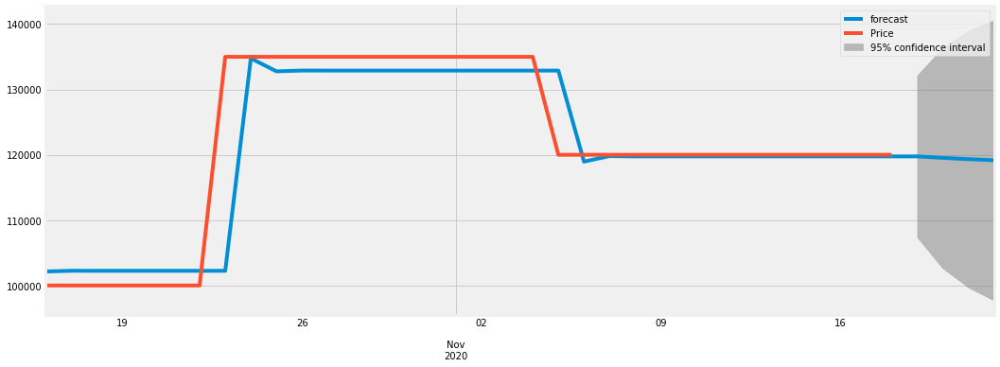

0.9842914835284704
2020-10-16    102128.186236
2020-10-17    102243.124566
2020-10-18    102235.717652
2020-10-19    102236.169139
2020-10-20    102236.141522
2020-10-21    102236.143211
2020-10-22    102236.143108
2020-10-23    102236.143114
2020-10-24    134754.905407
2020-10-25    132766.195398
2020-10-26    132887.816494
2020-10-27    132880.378662
2020-10-28    132880.833528
2020-10-29    132880.805710
2020-10-30    132880.807412
2020-10-31    132880.807308
2020-11-01    132880.807314
2020-11-02    132880.807314
2020-11-03    132880.807314
2020-11-04    132880.807314
2020-11-05    132880.807314
2020-11-06    118944.194902
2020-11-07    119796.499192
2020-11-08    119744.375865
2020-11-09    119747.563507
2020-11-10    119747.368565
2020-11-11    119747.380486
2020-11-12    119747.379757
2020-11-13    119747.379802
2020-11-14    119747.379799
2020-11-15    119747.379799
2020-11-16    119747.379799
2020-11-17    119747.379799
2020-11-18    119747.379799
2020-11-19    119747.379799
2

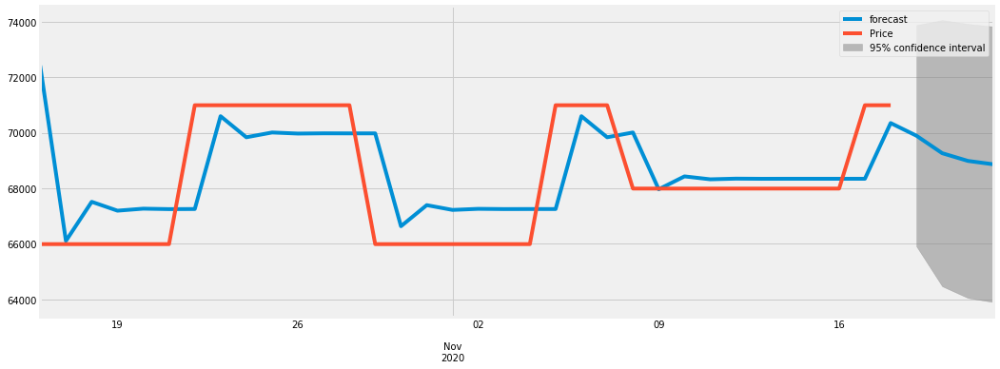

0.8148694063820404
2020-10-16    72422.323825
2020-10-17    66105.842869
2020-10-18    67513.548573
2020-10-19    67193.940662
2020-10-20    67266.487285
2020-10-21    67250.015943
2020-10-22    67253.755497
2020-10-23    70595.738309
2020-10-24    69836.987530
2020-10-25    70009.251356
2020-10-26    69970.141247
2020-10-27    69979.020654
2020-10-28    69977.004708
2020-10-29    69977.462400
2020-10-30    66634.526660
2020-10-31    67393.493788
2020-11-01    67221.180843
2020-11-02    67260.302104
2020-11-03    67251.420165
2020-11-04    67253.436686
2020-11-05    67252.978863
2020-11-06    70595.914633
2020-11-07    69836.947498
2020-11-08    70009.260444
2020-11-09    67964.440086
2020-11-10    68428.688148
2020-11-11    68323.287073
2020-11-12    68347.216923
2020-11-13    68341.783983
2020-11-14    68343.017457
2020-11-15    68342.737414
2020-11-16    68342.800994
2020-11-17    68342.786559
2020-11-18    70348.488933
2020-11-19    69893.122066
2020-11-20    69263.171095
2020-11-2

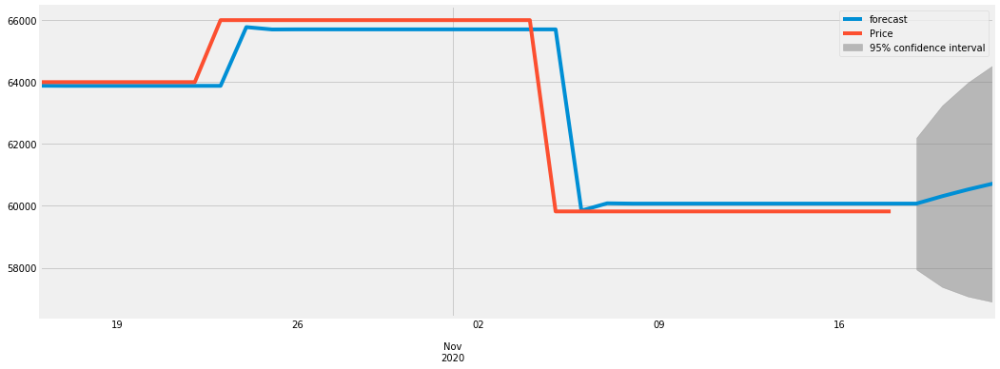

0.9922272103263267
2020-10-16    63874.057862
2020-10-17    63869.794912
2020-10-18    63869.972968
2020-10-19    63869.965806
2020-10-20    63869.966094
2020-10-21    63869.966083
2020-10-22    63869.966083
2020-10-23    63869.966083
2020-10-24    65765.043950
2020-10-25    65688.696606
2020-10-26    65691.772425
2020-10-27    65691.648509
2020-10-28    65691.653501
2020-10-29    65691.653300
2020-10-30    65691.653308
2020-10-31    65691.653308
2020-11-01    65691.653308
2020-11-02    65691.653308
2020-11-03    65691.653308
2020-11-04    65691.653308
2020-11-05    65691.653308
2020-11-06    59843.443009
2020-11-07    60079.050915
2020-11-08    60069.558937
2020-11-09    60069.941342
2020-11-10    60069.925936
2020-11-11    60069.926557
2020-11-12    60069.926532
2020-11-13    60069.926533
2020-11-14    60069.926532
2020-11-15    60069.926532
2020-11-16    60069.926532
2020-11-17    60069.926532
2020-11-18    60069.926532
2020-11-19    60069.926532
2020-11-20    60308.636730
2020-11-2

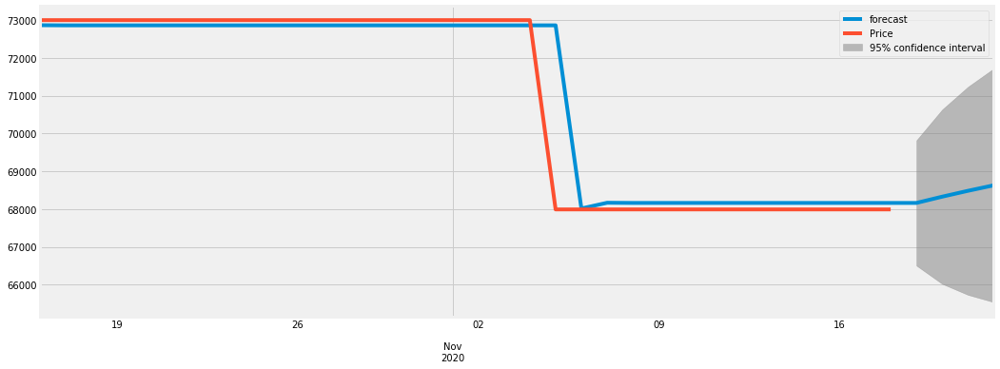

0.996285124956696
2020-10-16    72864.830169
2020-10-17    72860.885098
2020-10-18    72861.012248
2020-10-19    72861.008270
2020-10-20    72861.008395
2020-10-21    72861.008391
2020-10-22    72861.008391
2020-10-23    72861.008391
2020-10-24    72861.008391
2020-10-25    72861.008391
2020-10-26    72861.008391
2020-10-27    72861.008391
2020-10-28    72861.008391
2020-10-29    72861.008391
2020-10-30    72861.008391
2020-10-31    72861.008391
2020-11-01    72861.008391
2020-11-02    72861.008391
2020-11-03    72861.008391
2020-11-04    72861.008391
2020-11-05    72861.008391
2020-11-06    68014.260917
2020-11-07    68166.009575
2020-11-08    68161.258419
2020-11-09    68161.407175
2020-11-10    68161.402517
2020-11-11    68161.402663
2020-11-12    68161.402659
2020-11-13    68161.402659
2020-11-14    68161.402659
2020-11-15    68161.402659
2020-11-16    68161.402659
2020-11-17    68161.402659
2020-11-18    68161.402659
2020-11-19    68161.402659
2020-11-20    68327.253208
2020-11-21

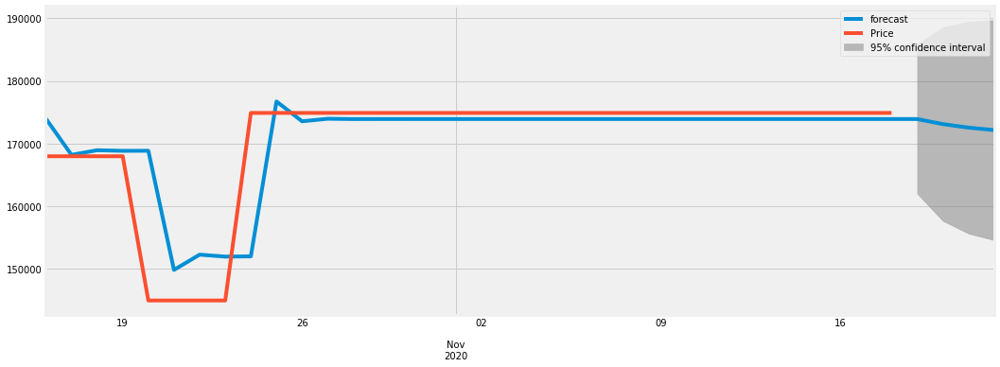

0.9343265162953449
2020-10-16    173999.176033
2020-10-17    168214.315011
2020-10-18    168947.116289
2020-10-19    168853.383820
2020-10-20    168865.372306
2020-10-21    149867.727304
2020-10-22    152297.607672
2020-10-23    151986.815539
2020-10-24    152026.567188
2020-10-25    176724.687068
2020-10-26    173565.691483
2020-10-27    173969.740583
2020-10-28    173918.060968
2020-10-29    173924.671013
2020-10-30    173923.825560
2020-10-31    173923.933697
2020-11-01    173923.919865
2020-11-02    173923.921635
2020-11-03    173923.921408
2020-11-04    173923.921437
2020-11-05    173923.921434
2020-11-06    173923.921434
2020-11-07    173923.921434
2020-11-08    173923.921434
2020-11-09    173923.921434
2020-11-10    173923.921434
2020-11-11    173923.921434
2020-11-12    173923.921434
2020-11-13    173923.921434
2020-11-14    173923.921434
2020-11-15    173923.921434
2020-11-16    173923.921434
2020-11-17    173923.921434
2020-11-18    173923.921434
2020-11-19    173923.921434
2

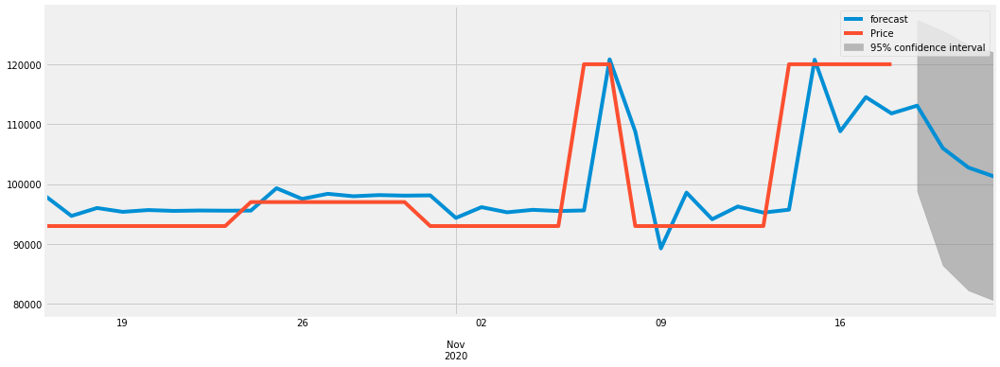

0.8517975990751693
2020-10-16     97939.973319
2020-10-17     94678.852856
2020-10-18     96001.914663
2020-10-19     95358.966720
2020-10-20     95659.494740
2020-10-21     95515.016257
2020-10-22     95583.699165
2020-10-23     95550.856811
2020-10-24     95566.519146
2020-10-25     99301.646096
2020-10-26     97518.803147
2020-10-27     98369.786153
2020-10-28     97963.596569
2020-10-29     98157.478199
2020-10-30     98064.934989
2020-10-31     98109.107537
2020-11-01     94345.415766
2020-11-02     96141.893921
2020-11-03     95284.402405
2020-11-04     95693.698615
2020-11-05     95498.334131
2020-11-06     95591.585133
2020-11-07    120809.674797
2020-11-08    108772.624486
2020-11-09     89255.526257
2020-11-10     98571.390243
2020-11-11     94124.759868
2020-11-12     96247.216972
2020-11-13     95234.129808
2020-11-14     95717.694635
2020-11-15    120749.480451
2020-11-16    108801.356336
2020-11-17    114504.412079
2020-11-18    111782.240423
2020-11-19    113081.582190
2

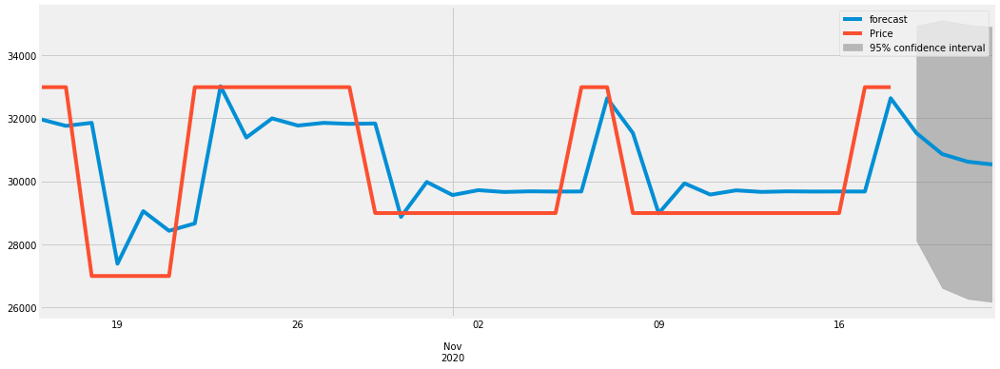

0.802534772117825
2020-10-16    31974.689010
2020-10-17    31760.222714
2020-10-18    31856.609883
2020-10-19    27379.936667
2020-10-20    29051.150012
2020-10-21    28426.586106
2020-10-22    28659.981927
2020-10-23    33018.495614
2020-10-24    31389.651390
2020-10-25    31998.375986
2020-10-26    31770.886074
2020-10-27    31855.902618
2020-10-28    31824.130603
2020-10-29    31836.004303
2020-10-30    28867.740630
2020-10-31    29977.027259
2020-11-01    29562.469470
2020-11-02    29717.396209
2020-11-03    29659.497660
2020-11-04    29681.135255
2020-11-05    29673.048947
2020-11-06    29676.070927
2020-11-07    32638.767851
2020-11-08    31531.561603
2020-11-09    28981.515635
2020-11-10    29934.507757
2020-11-11    29578.359674
2020-11-12    29711.457791
2020-11-13    29661.716940
2020-11-14    29680.305875
2020-11-15    29673.358899
2020-11-16    29675.955093
2020-11-17    29674.984854
2020-11-18    32639.173733
2020-11-19    31531.409918
2020-11-20    30864.646702
2020-11-21

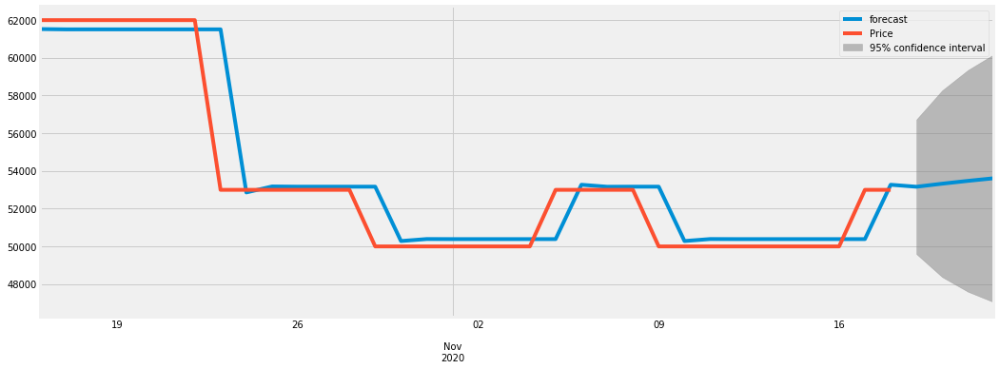

0.9941729170266601
2020-10-16    61516.065005
2020-10-17    61499.935254
2020-10-18    61500.546814
2020-10-19    61500.524418
2020-10-20    61500.525239
2020-10-21    61500.525209
2020-10-22    61500.525210
2020-10-23    61500.525210
2020-10-24    52852.211912
2020-10-25    53169.321454
2020-10-26    53157.693931
2020-10-27    53158.120280
2020-10-28    53158.104647
2020-10-29    53158.105220
2020-10-30    50275.334099
2020-10-31    50381.037281
2020-11-01    50377.161440
2020-11-02    50377.303556
2020-11-03    50377.298345
2020-11-04    50377.298536
2020-11-05    50377.298529
2020-11-06    53260.069629
2020-11-07    53154.366448
2020-11-08    53158.242289
2020-11-09    53158.100173
2020-11-10    50275.334285
2020-11-11    50381.037274
2020-11-12    50377.161440
2020-11-13    50377.303556
2020-11-14    50377.298345
2020-11-15    50377.298536
2020-11-16    50377.298529
2020-11-17    50377.298529
2020-11-18    53260.069629
2020-11-19    53154.366448
2020-11-20    53316.185905
2020-11-2

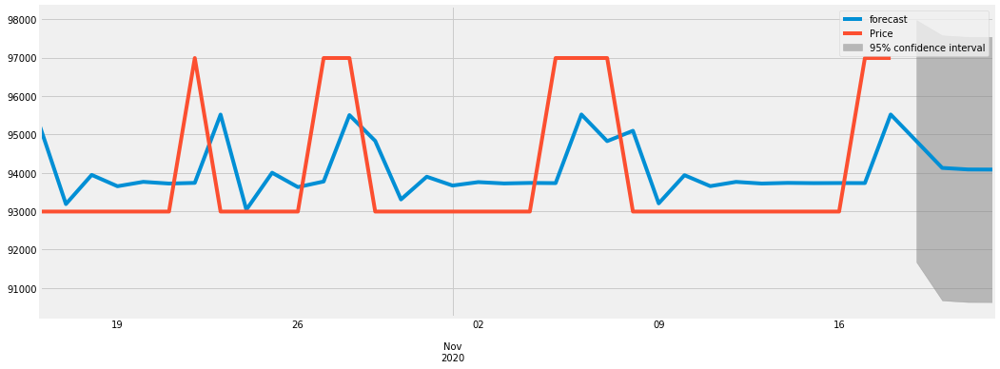

0.5978698457499642
2020-10-16    95193.823571
2020-10-17    93185.134333
2020-10-18    93944.814639
2020-10-19    93649.583275
2020-10-20    93764.104081
2020-10-21    93719.591654
2020-10-22    93736.882758
2020-10-23    95517.059747
2020-10-24    93038.513280
2020-10-25    94001.501103
2020-10-26    93627.352141
2020-10-27    93772.719966
2020-10-28    95503.136308
2020-10-29    94830.818899
2020-10-30    93305.137897
2020-10-31    93897.909633
2020-11-01    93667.600459
2020-11-02    93757.082316
2020-11-03    93722.315995
2020-11-04    93735.823728
2020-11-05    93730.575579
2020-11-06    95519.510636
2020-11-07    94824.456993
2020-11-08    95094.505682
2020-11-09    93202.687862
2020-11-10    93937.714471
2020-11-11    93652.135114
2020-11-12    93763.091055
2020-11-13    93719.981424
2020-11-14    93736.730778
2020-11-15    93730.223163
2020-11-16    93732.751562
2020-11-17    93731.769205
2020-11-18    95519.046878
2020-11-19    94824.637177
2020-11-20    94127.116134
2020-11-2

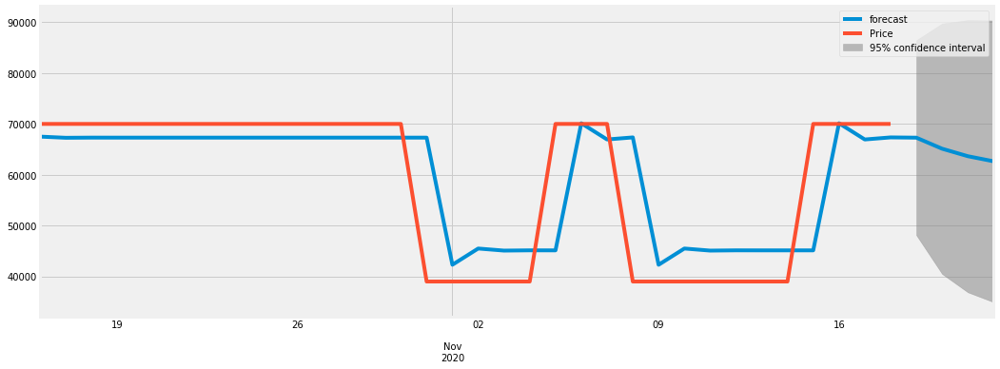

0.9259759132834713
2020-10-16    67497.726477
2020-10-17    67265.415523
2020-10-18    67297.825710
2020-10-19    67293.738253
2020-10-20    67294.260748
2020-10-21    67294.194072
2020-10-22    67294.202583
2020-10-23    67294.201496
2020-10-24    67294.201635
2020-10-25    67294.201617
2020-10-26    67294.201620
2020-10-27    67294.201619
2020-10-28    67294.201619
2020-10-29    67294.201619
2020-10-30    67294.201619
2020-10-31    67294.201619
2020-11-01    42289.011087
2020-11-02    45480.548330
2020-11-03    45073.196506
2020-11-04    45125.188851
2020-11-05    45118.552809
2020-11-06    70124.590333
2020-11-07    66932.944984
2020-11-08    67340.310606
2020-11-09    42283.125967
2020-11-10    45481.299477
2020-11-11    45073.100633
2020-11-12    45125.201088
2020-11-13    45118.551247
2020-11-14    45119.400000
2020-11-15    45119.291669
2020-11-16    70124.496028
2020-11-17    66932.957021
2020-11-18    67340.309070
2020-11-19    67288.316695
2020-11-20    65115.723522
2020-11-2

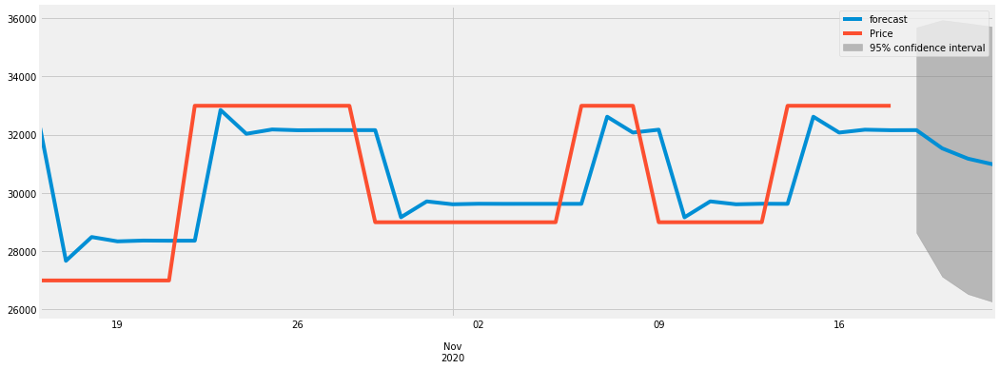

0.879312456968508
2020-10-16    32228.470189
2020-10-17    27665.215098
2020-10-18    28482.099984
2020-10-19    28333.302873
2020-10-20    28360.392129
2020-10-21    28355.459490
2020-10-22    28356.357639
2020-10-23    32844.598372
2020-10-24    32027.362919
2020-10-25    32176.168169
2020-10-26    32149.073160
2020-10-27    32154.006719
2020-10-28    32153.108399
2020-10-29    32153.271968
2020-10-30    29160.972671
2020-10-31    29705.821580
2020-11-01    29606.613478
2020-11-02    29624.677656
2020-11-03    29621.388464
2020-11-04    29621.987372
2020-11-05    29621.878321
2020-11-06    29621.898177
2020-11-07    32614.164076
2020-11-08    32069.321247
2020-11-09    32168.528242
2020-11-10    29158.194752
2020-11-11    29706.327394
2020-11-12    29606.521378
2020-11-13    29624.694426
2020-11-14    29621.385410
2020-11-15    32614.257442
2020-11-16    32069.304247
2020-11-17    32168.531338
2020-11-18    32150.463702
2020-11-19    32153.753524
2020-11-20    31527.585792
2020-11-21

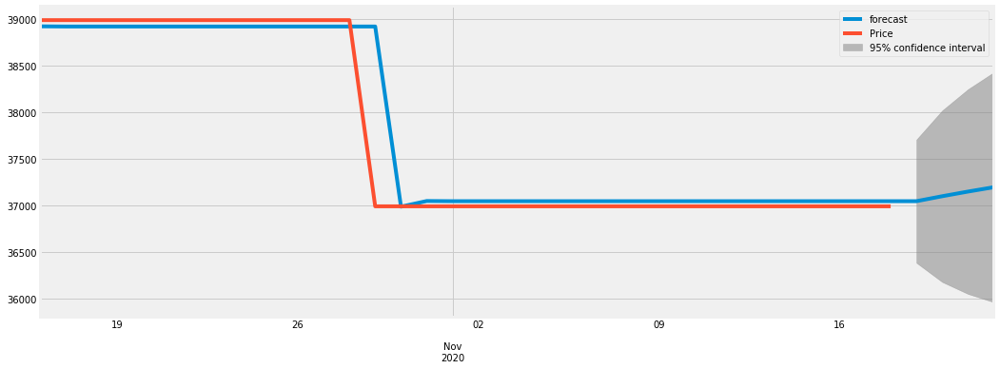

0.9962420822298726
2020-10-16    38923.479837
2020-10-17    38921.522829
2020-10-18    38921.585939
2020-10-19    38921.583964
2020-10-20    38921.584026
2020-10-21    38921.584024
2020-10-22    38921.584024
2020-10-23    38921.584024
2020-10-24    38921.584024
2020-10-25    38921.584024
2020-10-26    38921.584024
2020-10-27    38921.584024
2020-10-28    38921.584024
2020-10-29    38921.584024
2020-10-30    36986.339080
2020-10-31    37046.963916
2020-11-01    37045.064740
2020-11-02    37045.124235
2020-11-03    37045.122371
2020-11-04    37045.122430
2020-11-05    37045.122428
2020-11-06    37045.122428
2020-11-07    37045.122428
2020-11-08    37045.122428
2020-11-09    37045.122428
2020-11-10    37045.122428
2020-11-11    37045.122428
2020-11-12    37045.122428
2020-11-13    37045.122428
2020-11-14    37045.122428
2020-11-15    37045.122428
2020-11-16    37045.122428
2020-11-17    37045.122428
2020-11-18    37045.122428
2020-11-19    37045.122428
2020-11-20    37098.460128
2020-11-2

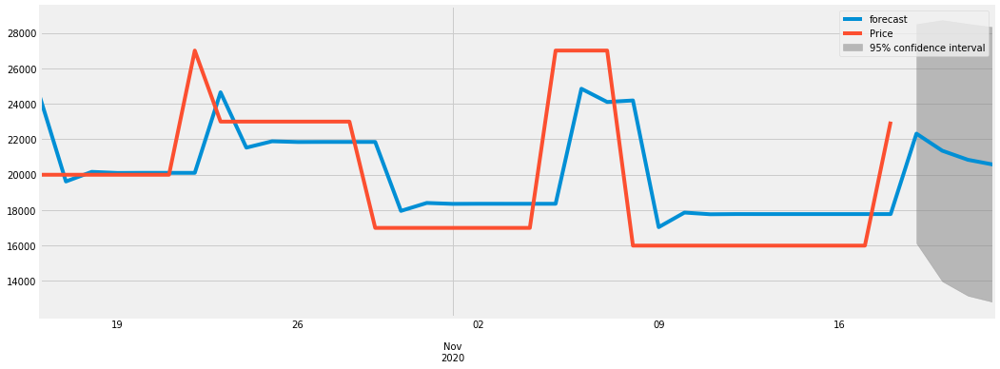

0.8398446320609847
2020-10-16    24338.854869
2020-10-17    19611.175003
2020-10-18    20152.868721
2020-10-19    20090.524420
2020-10-20    20097.700025
2020-10-21    20096.874137
2020-10-22    20096.969194
2020-10-23    24643.869686
2020-10-24    21519.521683
2020-10-25    21879.123693
2020-10-26    21837.734704
2020-10-27    21842.498438
2020-10-28    21841.950148
2020-10-29    21842.013255
2020-10-30    17950.213039
2020-10-31    18398.146233
2020-11-01    18346.590620
2020-11-02    18352.524499
2020-11-03    18351.841529
2020-11-04    18351.920137
2020-11-05    18351.911089
2020-11-06    24844.720040
2020-11-07    24097.419435
2020-11-08    24183.431237
2020-11-09    17032.091497
2020-11-10    17855.186795
2020-11-11    17760.451277
2020-11-12    17771.355019
2020-11-13    17770.100035
2020-11-14    17770.244479
2020-11-15    17770.227854
2020-11-16    17770.229768
2020-11-17    17770.229547
2020-11-18    17770.229573
2020-11-19    22310.654681
2020-11-20    21347.421709
2020-11-2

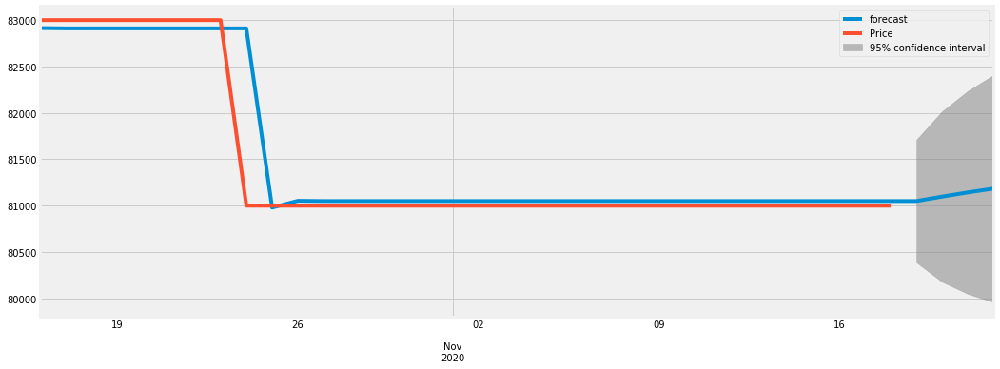

0.9949669317921518
2020-10-16    82913.782718
2020-10-17    82910.733763
2020-10-18    82910.853611
2020-10-19    82910.849067
2020-10-20    82910.849239
2020-10-21    82910.849233
2020-10-22    82910.849233
2020-10-23    82910.849233
2020-10-24    82910.849233
2020-10-25    80979.508364
2020-10-26    81052.832195
2020-10-27    81050.048438
2020-10-28    81050.154124
2020-10-29    81050.150111
2020-10-30    81050.150264
2020-10-31    81050.150258
2020-11-01    81050.150258
2020-11-02    81050.150258
2020-11-03    81050.150258
2020-11-04    81050.150258
2020-11-05    81050.150258
2020-11-06    81050.150258
2020-11-07    81050.150258
2020-11-08    81050.150258
2020-11-09    81050.150258
2020-11-10    81050.150258
2020-11-11    81050.150258
2020-11-12    81050.150258
2020-11-13    81050.150258
2020-11-14    81050.150258
2020-11-15    81050.150258
2020-11-16    81050.150258
2020-11-17    81050.150258
2020-11-18    81050.150258
2020-11-19    81050.150258
2020-11-20    81098.578880
2020-11-2

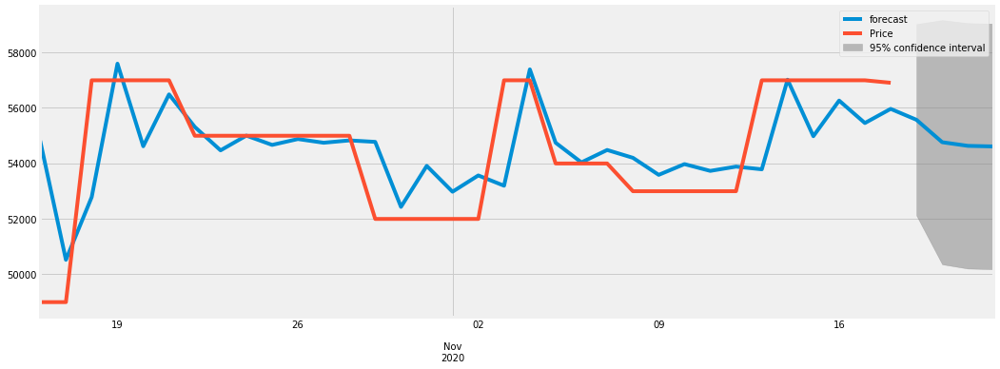

0.702450772217202
2020-10-16    54812.664035
2020-10-17    50515.042896
2020-10-18    52778.406535
2020-10-19    57589.804870
2020-10-20    54612.092121
2020-10-21    56481.751620
2020-10-22    55307.299623
2020-10-23    54463.254797
2020-10-24    54995.208297
2020-10-25    54659.910755
2020-10-26    54871.287501
2020-10-27    54738.033623
2020-10-28    54822.041702
2020-10-29    54769.080616
2020-10-30    52425.042492
2020-10-31    53902.805400
2020-11-01    52971.171695
2020-11-02    53558.506269
2020-11-03    53188.229863
2020-11-04    57384.045443
2020-11-05    54738.855591
2020-11-06    54029.048207
2020-11-07    54476.535773
2020-11-08    54194.423856
2020-11-09    53579.801074
2020-11-10    53967.280916
2020-11-11    53722.999981
2020-11-12    53877.003283
2020-11-13    53779.914179
2020-11-14    57011.026836
2020-11-15    54974.019653
2020-11-16    56258.220702
2020-11-17    55448.615146
2020-11-18    55959.018994
2020-11-19    55565.919591
2020-11-20    54756.516500
2020-11-21

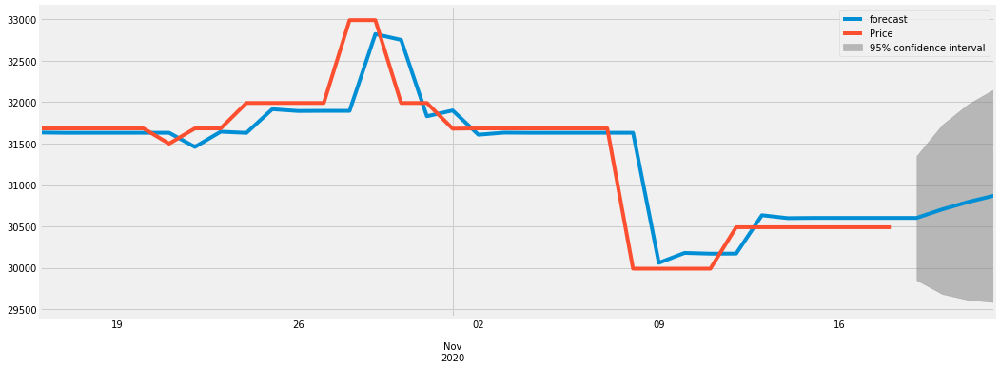

0.9819274189599656
2020-10-16    31633.338145
2020-10-17    31630.068376
2020-10-18    31630.333381
2020-10-19    31630.313330
2020-10-20    31630.314856
2020-10-21    31630.314740
2020-10-22    31459.706089
2020-10-23    31643.288251
2020-10-24    31629.328211
2020-10-25    31915.046606
2020-10-26    31893.319874
2020-10-27    31894.972029
2020-10-28    31894.846395
2020-10-29    32822.076925
2020-10-30    32751.568027
2020-10-31    31829.708721
2020-11-01    31899.809178
2020-11-02    31607.040063
2020-11-03    31632.084612
2020-11-04    31630.180163
2020-11-05    31630.324982
2020-11-06    31630.313970
2020-11-07    31630.314807
2020-11-08    31630.314743
2020-11-09    30060.529636
2020-11-10    30179.899970
2020-11-11    30170.822755
2020-11-12    30171.513009
2020-11-13    30635.071008
2020-11-14    30599.820914
2020-11-15    30602.501418
2020-11-16    30602.297586
2020-11-17    30602.313086
2020-11-18    30602.311907
2020-11-19    30602.311997
2020-11-20    30706.450029
2020-11-2

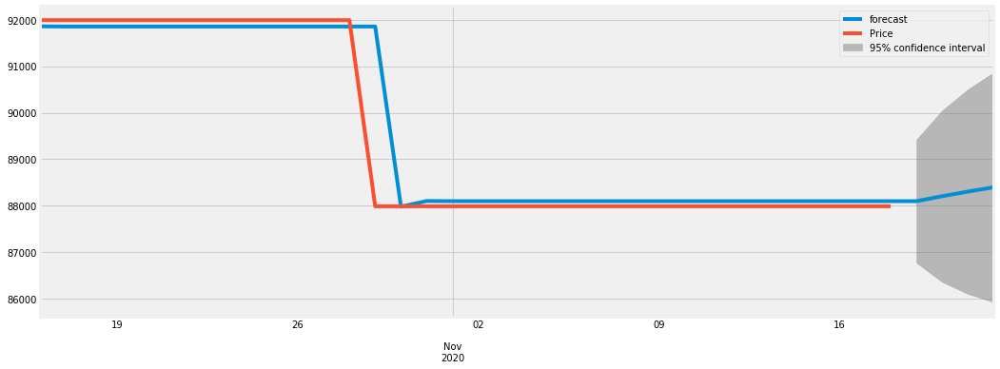

0.9962411842111835
2020-10-16    91856.578716
2020-10-17    91852.640004
2020-10-18    91852.767473
2020-10-19    91852.763469
2020-10-20    91852.763595
2020-10-21    91852.763591
2020-10-22    91852.763591
2020-10-23    91852.763591
2020-10-24    91852.763591
2020-10-25    91852.763591
2020-10-26    91852.763591
2020-10-27    91852.763591
2020-10-28    91852.763591
2020-10-29    91852.763591
2020-10-30    87981.948016
2020-10-31    88103.626981
2020-11-01    88099.802007
2020-11-02    88099.922245
2020-11-03    88099.918465
2020-11-04    88099.918584
2020-11-05    88099.918580
2020-11-06    88099.918581
2020-11-07    88099.918580
2020-11-08    88099.918580
2020-11-09    88099.918580
2020-11-10    88099.918580
2020-11-11    88099.918580
2020-11-12    88099.918580
2020-11-13    88099.918580
2020-11-14    88099.918580
2020-11-15    88099.918580
2020-11-16    88099.918580
2020-11-17    88099.918580
2020-11-18    88099.918580
2020-11-19    88099.918580
2020-11-20    88206.287219
2020-11-2

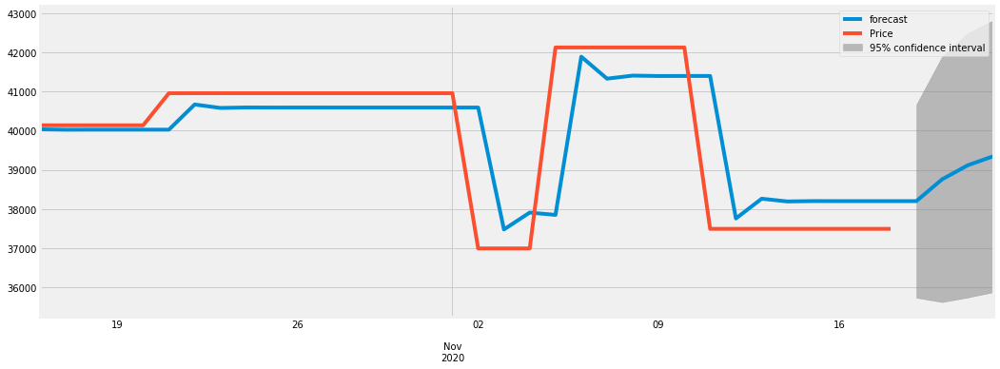

0.9139771005724079
2020-10-16    40033.886127
2020-10-17    40023.780608
2020-10-18    40025.318114
2020-10-19    40025.107924
2020-10-20    40025.137109
2020-10-21    40025.133065
2020-10-22    40668.438560
2020-10-23    40580.067433
2020-10-24    40592.314911
2020-10-25    40590.617516
2020-10-26    40590.852760
2020-10-27    40590.820157
2020-10-28    40590.824676
2020-10-29    40590.824049
2020-10-30    40590.824136
2020-10-31    40590.824124
2020-11-01    40590.824126
2020-11-02    40590.824126
2020-11-03    37474.840398
2020-11-04    37906.688913
2020-11-05    37846.838427
2020-11-06    41889.338489
2020-11-07    41329.082788
2020-11-08    41406.729404
2020-11-09    41395.968251
2020-11-10    41397.459655
2020-11-11    41397.252959
2020-11-12    37755.814360
2020-11-13    38260.486396
2020-11-14    38190.543197
2020-11-15    38200.236723
2020-11-16    38198.893283
2020-11-17    38199.079472
2020-11-18    38199.053668
2020-11-19    38199.057245
2020-11-20    38756.004275
2020-11-2

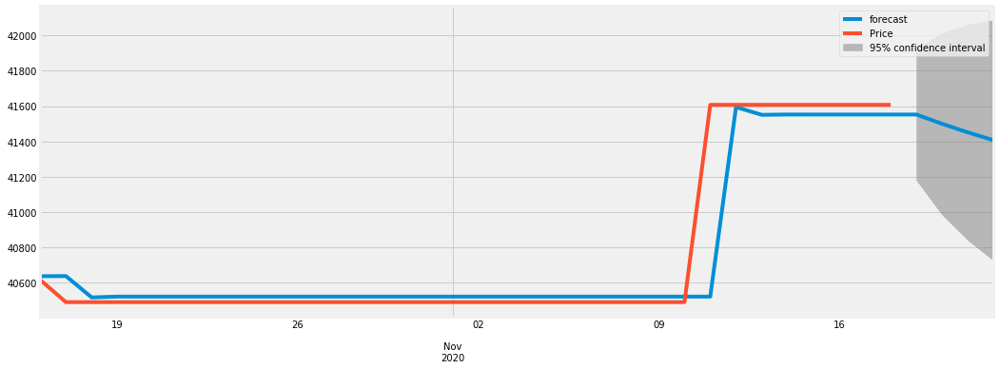

0.9938868623462025
2020-10-16    40636.752428
2020-10-17    40637.532802
2020-10-18    40516.486143
2020-10-19    40521.411010
2020-10-20    40521.210637
2020-10-21    40521.218790
2020-10-22    40521.218458
2020-10-23    40521.218472
2020-10-24    40521.218471
2020-10-25    40521.218471
2020-10-26    40521.218471
2020-10-27    40521.218471
2020-10-28    40521.218471
2020-10-29    40521.218471
2020-10-30    40521.218471
2020-10-31    40521.218471
2020-11-01    40521.218471
2020-11-02    40521.218471
2020-11-03    40521.218471
2020-11-04    40521.218471
2020-11-05    40521.218471
2020-11-06    40521.218471
2020-11-07    40521.218471
2020-11-08    40521.218471
2020-11-09    40521.218471
2020-11-10    40521.218471
2020-11-11    40521.218471
2020-11-12    41594.014764
2020-11-13    41550.367185
2020-11-14    41552.143022
2020-11-15    41552.070770
2020-11-16    41552.073710
2020-11-17    41552.073590
2020-11-18    41552.073595
2020-11-19    41552.073595
2020-11-20    41499.320826
2020-11-2

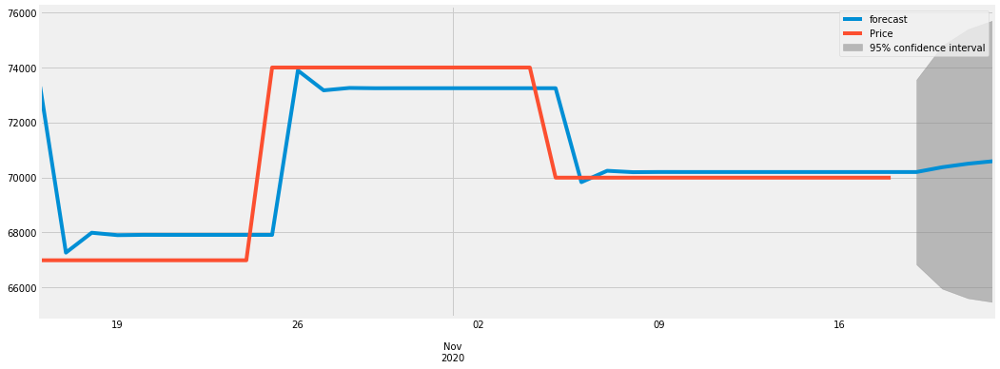

0.9468292448892379
2020-10-16    73295.690340
2020-10-17    67267.768167
2020-10-18    67989.384664
2020-10-19    67902.188835
2020-10-20    67912.724338
2020-10-21    67911.451348
2020-10-22    67911.605161
2020-10-23    67911.586576
2020-10-24    67911.588822
2020-10-25    67911.588550
2020-10-26    73882.194936
2020-10-27    73160.776446
2020-10-28    73247.944248
2020-10-29    73237.411907
2020-10-30    73238.684512
2020-10-31    73238.530745
2020-11-01    73238.549325
2020-11-02    73238.547080
2020-11-03    73238.547351
2020-11-04    73238.547318
2020-11-05    73238.547322
2020-11-06    69826.772263
2020-11-07    70239.011398
2020-11-08    70189.201226
2020-11-09    70195.219706
2020-11-10    70194.492503
2020-11-11    70194.580370
2020-11-12    70194.569753
2020-11-13    70194.571036
2020-11-14    70194.570881
2020-11-15    70194.570900
2020-11-16    70194.570898
2020-11-17    70194.570898
2020-11-18    70194.570898
2020-11-19    70194.570898
2020-11-20    70369.058369
2020-11-2

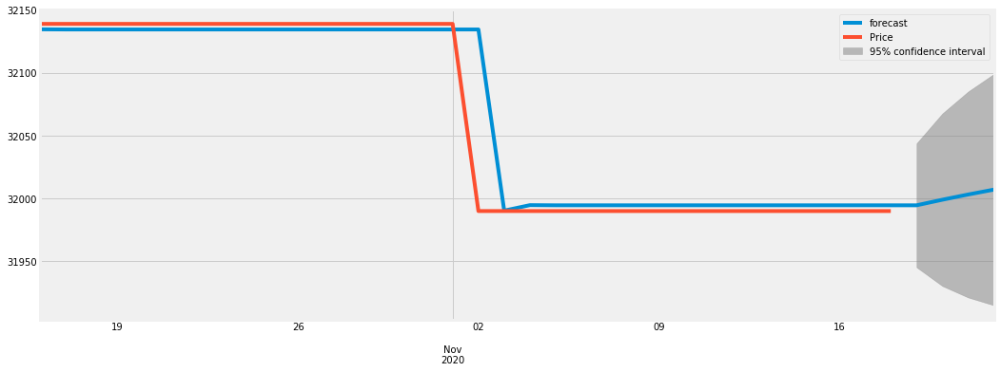

0.9964419044294014
2020-10-16    32134.678822
2020-10-17    32134.555835
2020-10-18    32134.559663
2020-10-19    32134.559548
2020-10-20    32134.559551
2020-10-21    32134.559551
2020-10-22    32134.559551
2020-10-23    32134.559551
2020-10-24    32134.559551
2020-10-25    32134.559551
2020-10-26    32134.559551
2020-10-27    32134.559551
2020-10-28    32134.559551
2020-10-29    32134.559551
2020-10-30    32134.559551
2020-10-31    32134.559551
2020-11-01    32134.559551
2020-11-02    32134.559551
2020-11-03    31990.341959
2020-11-04    31994.707063
2020-11-05    31994.574943
2020-11-06    31994.578942
2020-11-07    31994.578821
2020-11-08    31994.578824
2020-11-09    31994.578824
2020-11-10    31994.578824
2020-11-11    31994.578824
2020-11-12    31994.578824
2020-11-13    31994.578824
2020-11-14    31994.578824
2020-11-15    31994.578824
2020-11-16    31994.578824
2020-11-17    31994.578824
2020-11-18    31994.578824
2020-11-19    31994.578824
2020-11-20    31999.010683
2020-11-2

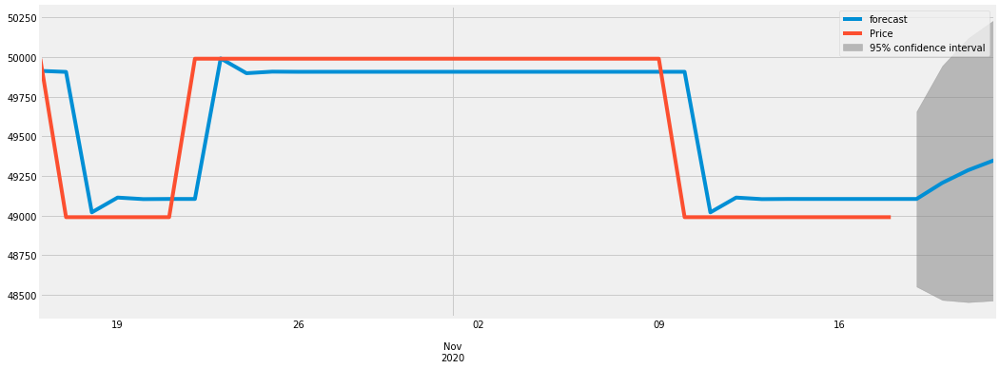

0.9641682395340447
2020-10-16    49913.295109
2020-10-17    49906.747228
2020-10-18    49020.420899
2020-10-19    49113.754455
2020-10-20    49103.925241
2020-10-21    49104.960383
2020-10-22    49104.851369
2020-10-23    49991.946163
2020-10-24    49898.523792
2020-10-25    49908.362356
2020-10-26    49907.326230
2020-10-27    49907.435347
2020-10-28    49907.423856
2020-10-29    49907.425066
2020-10-30    49907.424939
2020-10-31    49907.424952
2020-11-01    49907.424951
2020-11-02    49907.424951
2020-11-03    49907.424951
2020-11-04    49907.424951
2020-11-05    49907.424951
2020-11-06    49907.424951
2020-11-07    49907.424951
2020-11-08    49907.424951
2020-11-09    49907.424951
2020-11-10    49907.424951
2020-11-11    49020.341638
2020-11-12    49113.762800
2020-11-13    49103.924363
2020-11-14    49104.960475
2020-11-15    49104.851359
2020-11-16    49104.862851
2020-11-17    49104.861640
2020-11-18    49104.861768
2020-11-19    49104.861754
2020-11-20    49206.753702
2020-11-2

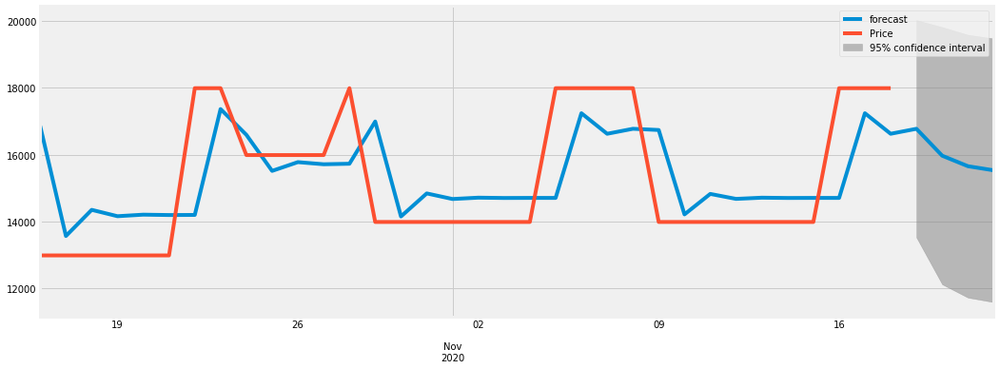

0.7896040751895631
2020-10-16    16862.564381
2020-10-17    13570.366360
2020-10-18    14352.215840
2020-10-19    14162.296737
2020-10-20    14208.377560
2020-10-21    14197.190870
2020-10-22    14199.906269
2020-10-23    17364.861740
2020-10-24    16596.599265
2020-10-25    15516.841741
2020-10-26    15778.942486
2020-10-27    15715.320053
2020-10-28    15730.763786
2020-10-29    16993.260814
2020-10-30    14154.310123
2020-10-31    14843.438077
2020-11-01    14676.158899
2020-11-02    14716.764309
2020-11-03    14706.907737
2020-11-04    14709.300325
2020-11-05    14708.719547
2020-11-06    17241.352215
2020-11-07    16626.580013
2020-11-08    16775.810048
2020-11-09    16739.585893
2020-11-10    14215.887268
2020-11-11    14828.490817
2020-11-12    14679.787202
2020-11-13    14715.883573
2020-11-14    14707.121527
2020-11-15    14709.248429
2020-11-16    14708.732144
2020-11-17    17241.349157
2020-11-18    16626.580755
2020-11-19    16775.809867
2020-11-20    15970.854332
2020-11-2

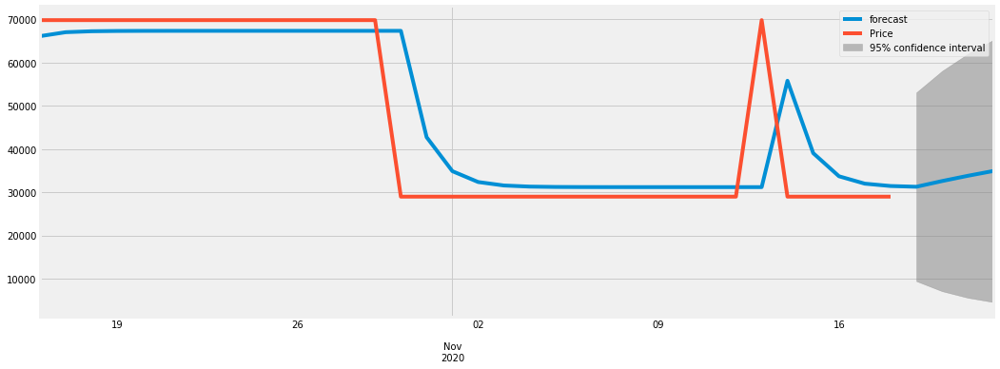

0.9493412568482054
2020-10-16    66138.074167
2020-10-17    67052.867553
2020-10-18    67271.429960
2020-10-19    67335.728657
2020-10-20    67355.751273
2020-10-21    67362.095506
2020-10-22    67364.116719
2020-10-23    67364.761780
2020-10-24    67364.967762
2020-10-25    67365.033548
2020-10-26    67365.054560
2020-10-27    67365.061272
2020-10-28    67365.063415
2020-10-29    67365.064100
2020-10-30    67365.064319
2020-10-31    42747.363405
2020-11-01    34884.338638
2020-11-02    32372.846656
2020-11-03    31570.662742
2020-11-04    31314.440928
2020-11-05    31232.602317
2020-11-06    31206.462628
2020-11-07    31198.113473
2020-11-08    31195.446708
2020-11-09    31194.594929
2020-11-10    31194.322866
2020-11-11    31194.235968
2020-11-12    31194.208212
2020-11-13    31194.199347
2020-11-14    55811.897499
2020-11-15    39057.220399
2020-11-16    33705.687312
2020-11-17    31996.379145
2020-11-18    31450.417015
2020-11-19    31276.033803
2020-11-20    32597.847399
2020-11-2

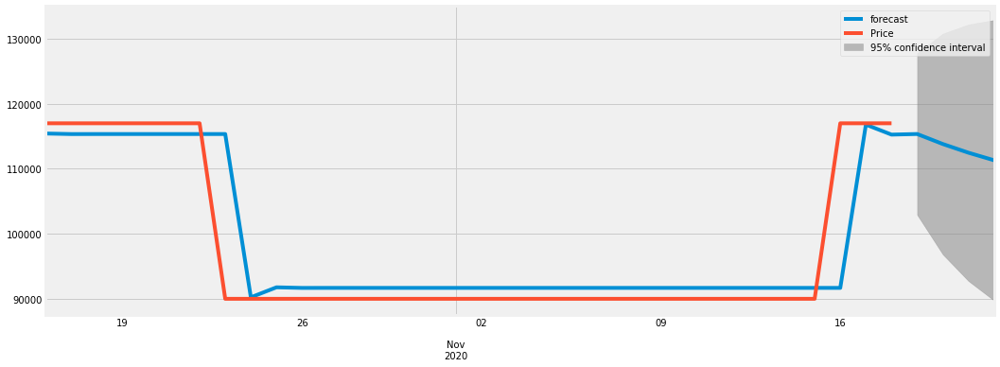

0.9831507747867451
2020-10-16    115416.164466
2020-10-17    115331.347320
2020-10-18    115336.821923
2020-10-19    115336.487732
2020-10-20    115336.508204
2020-10-21    115336.506951
2020-10-22    115336.507027
2020-10-23    115336.507023
2020-10-24     90220.081408
2020-10-25     91758.361686
2020-10-26     91664.148192
2020-10-27     91669.918390
2020-10-28     91669.564989
2020-10-29     91669.586633
2020-10-30     91669.585308
2020-10-31     91669.585389
2020-11-01     91669.585384
2020-11-02     91669.585384
2020-11-03     91669.585384
2020-11-04     91669.585384
2020-11-05     91669.585384
2020-11-06     91669.585384
2020-11-07     91669.585384
2020-11-08     91669.585384
2020-11-09     91669.585384
2020-11-10     91669.585384
2020-11-11     91669.585384
2020-11-12     91669.585384
2020-11-13     91669.585384
2020-11-14     91669.585384
2020-11-15     91669.585384
2020-11-16     91669.585384
2020-11-17    116786.010999
2020-11-18    115247.730721
2020-11-19    115341.944215
2

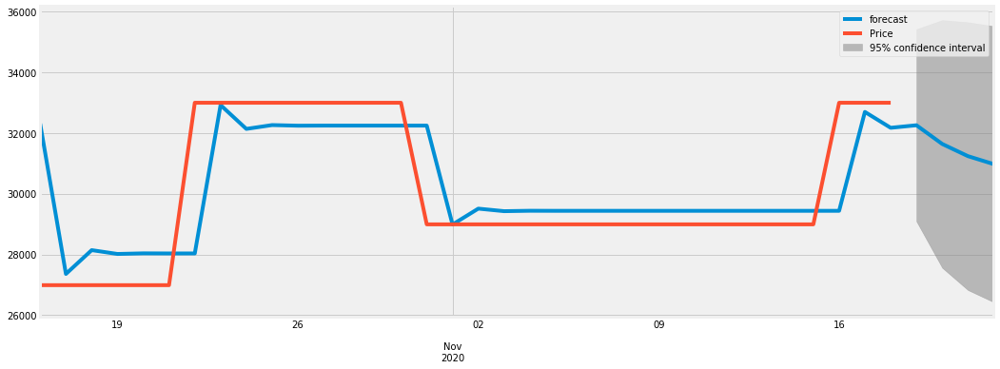

0.9179503078206438
2020-10-16    32305.173533
2020-10-17    27359.563642
2020-10-18    28141.786080
2020-10-19    28016.213919
2020-10-20    28036.367639
2020-10-21    28033.132766
2020-10-22    28033.651988
2020-10-23    32913.419237
2020-10-24    32130.177035
2020-10-25    32255.893758
2020-10-26    32235.715205
2020-10-27    32238.954026
2020-10-28    32238.434169
2020-10-29    32238.517610
2020-10-30    32238.504217
2020-10-31    32238.506367
2020-11-01    28985.272296
2020-11-02    29507.442738
2020-11-03    29423.630149
2020-11-04    29437.082749
2020-11-05    29434.923497
2020-11-06    29435.270075
2020-11-07    29435.214446
2020-11-08    29435.223375
2020-11-09    29435.221942
2020-11-10    29435.222172
2020-11-11    29435.222135
2020-11-12    29435.222141
2020-11-13    29435.222140
2020-11-14    29435.222140
2020-11-15    29435.222140
2020-11-16    29435.222140
2020-11-17    32688.455866
2020-11-18    32166.285480
2020-11-19    32250.098060
2020-11-20    31634.876975
2020-11-2

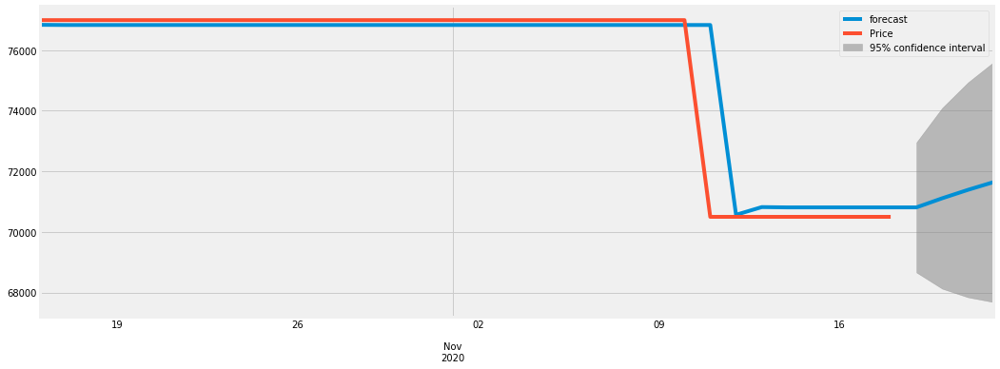

0.9946652410634563
2020-10-16    76834.850429
2020-10-17    76828.998848
2020-10-18    76829.245526
2020-10-19    76829.235520
2020-10-20    76829.235927
2020-10-21    76829.235910
2020-10-22    76829.235911
2020-10-23    76829.235911
2020-10-24    76829.235911
2020-10-25    76829.235911
2020-10-26    76829.235911
2020-10-27    76829.235911
2020-10-28    76829.235911
2020-10-29    76829.235911
2020-10-30    76829.235911
2020-10-31    76829.235911
2020-11-01    76829.235911
2020-11-02    76829.235911
2020-11-03    76829.235911
2020-11-04    76829.235911
2020-11-05    76829.235911
2020-11-06    76829.235911
2020-11-07    76829.235911
2020-11-08    76829.235911
2020-11-09    76829.235911
2020-11-10    76829.235911
2020-11-11    76829.235911
2020-11-12    70566.290108
2020-11-13    70820.714022
2020-11-14    70810.378386
2020-11-15    70810.798258
2020-11-16    70810.781201
2020-11-17    70810.781894
2020-11-18    70810.781866
2020-11-19    70810.781867
2020-11-20    71111.609618
2020-11-2

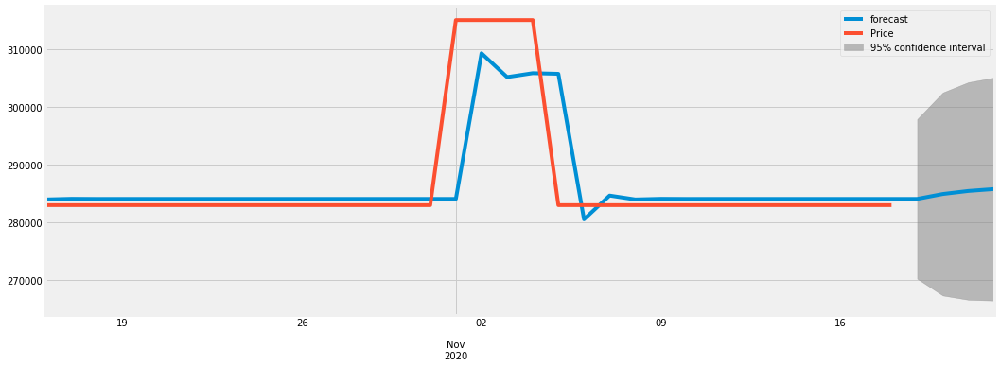

0.9053866533639277
2020-10-16    283972.847893
2020-10-17    284084.524224
2020-10-18    284064.205006
2020-10-19    284067.464313
2020-10-20    284066.929993
2020-10-21    284067.017279
2020-10-22    284067.003012
2020-10-23    284067.005344
2020-10-24    284067.004963
2020-10-25    284067.005025
2020-10-26    284067.005015
2020-10-27    284067.005016
2020-10-28    284067.005016
2020-10-29    284067.005016
2020-10-30    284067.005016
2020-10-31    284067.005016
2020-11-01    284067.005016
2020-11-02    309243.693304
2020-11-03    305128.794053
2020-11-04    305801.336671
2020-11-05    305691.415736
2020-11-06    280532.693019
2020-11-07    284644.655961
2020-11-08    283972.593256
2020-11-09    284082.435754
2020-11-10    284064.483003
2020-11-11    284067.417216
2020-11-12    284066.937646
2020-11-13    284067.016027
2020-11-14    284067.003216
2020-11-15    284067.005310
2020-11-16    284067.004968
2020-11-17    284067.005024
2020-11-18    284067.005015
2020-11-19    284067.005016
2

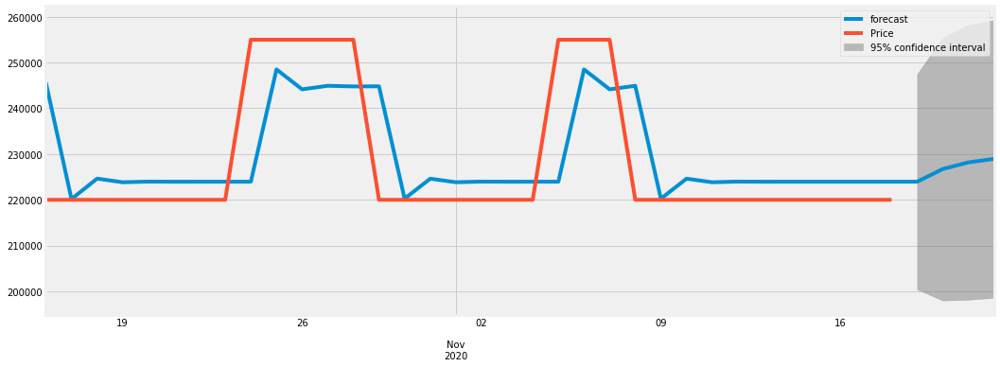

0.8544385146784444
2020-10-16    245657.418773
2020-10-17    220151.332211
2020-10-18    224617.881339
2020-10-19    223825.702745
2020-10-20    223966.191898
2020-10-21    223941.274788
2020-10-22    223945.694025
2020-10-23    223944.910238
2020-10-24    223945.049249
2020-10-25    248499.614815
2020-10-26    244144.670185
2020-10-27    244917.053743
2020-10-28    244780.065466
2020-10-29    244804.361411
2020-10-30    220245.462114
2020-10-31    224601.175365
2020-11-01    223828.655486
2020-11-02    223965.667940
2020-11-03    223941.367708
2020-11-04    223945.677544
2020-11-05    223944.913161
2020-11-06    248499.638951
2020-11-07    244144.665904
2020-11-08    244917.054502
2020-11-09    220225.475111
2020-11-10    224604.720217
2020-11-11    223828.026778
2020-11-12    223965.779446
2020-11-13    223941.347931
2020-11-14    223945.681052
2020-11-15    223944.912539
2020-11-16    223945.048841
2020-11-17    223945.024667
2020-11-18    223945.028954
2020-11-19    223945.028194
2

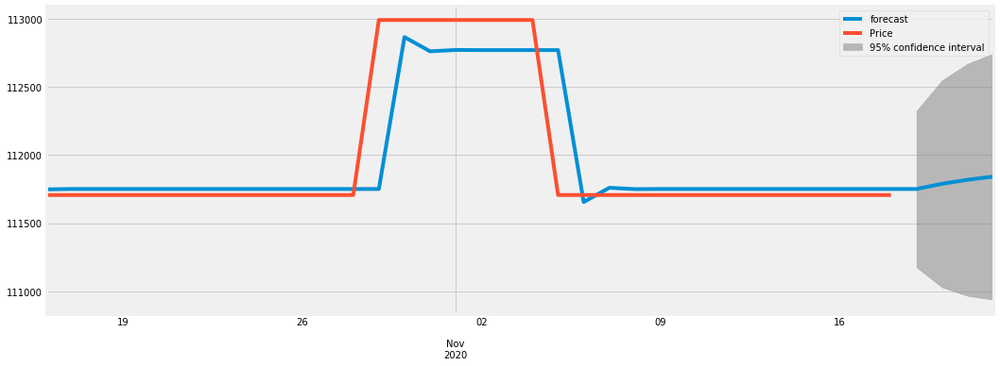

0.9601234240560557
2020-10-16    111747.337824
2020-10-17    111750.442642
2020-10-18    111750.130100
2020-10-19    111750.159159
2020-10-20    111750.156436
2020-10-21    111750.156691
2020-10-22    111750.156668
2020-10-23    111750.156670
2020-10-24    111750.156670
2020-10-25    111750.156670
2020-10-26    111750.156670
2020-10-27    111750.156670
2020-10-28    111750.156670
2020-10-29    111750.156670
2020-10-30    112864.477481
2020-10-31    112760.137412
2020-11-01    112769.907355
2020-11-02    112768.992540
2020-11-03    112769.078200
2020-11-04    112769.070179
2020-11-05    112769.070930
2020-11-06    111654.750048
2020-11-07    111759.090123
2020-11-08    111749.320181
2020-11-09    111750.234995
2020-11-10    111750.149336
2020-11-11    111750.157356
2020-11-12    111750.156605
2020-11-13    111750.156676
2020-11-14    111750.156669
2020-11-15    111750.156670
2020-11-16    111750.156670
2020-11-17    111750.156670
2020-11-18    111750.156670
2020-11-19    111750.156670
2

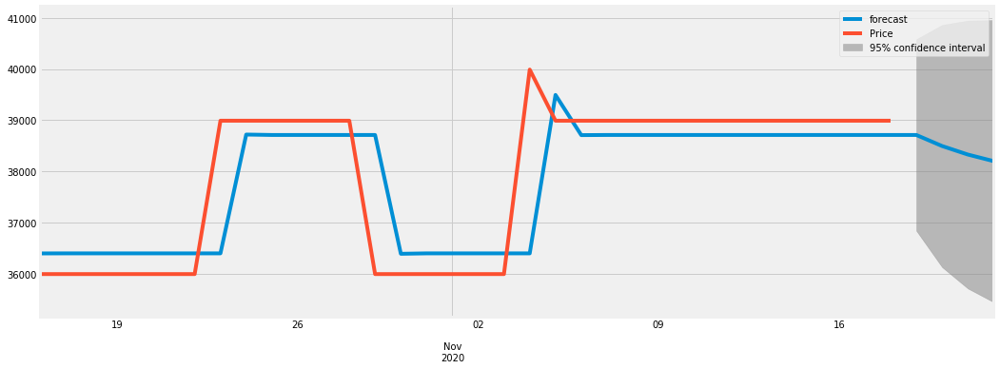

0.9481980181532125
2020-10-16    36393.985270
2020-10-17    36395.097640
2020-10-18    36395.093665
2020-10-19    36395.093679
2020-10-20    36395.093679
2020-10-21    36395.093679
2020-10-22    36395.093679
2020-10-23    36395.093679
2020-10-24    38719.169461
2020-10-25    38710.886171
2020-10-26    38710.915693
2020-10-27    38710.915588
2020-10-28    38710.915589
2020-10-29    38710.915589
2020-10-30    36386.839807
2020-10-31    36395.123097
2020-11-01    36395.093574
2020-11-02    36395.093679
2020-11-03    36395.093679
2020-11-04    36395.093679
2020-11-05    39493.861388
2020-11-06    38708.125074
2020-11-07    38710.925534
2020-11-08    38710.915553
2020-11-09    38710.915589
2020-11-10    38710.915589
2020-11-11    38710.915589
2020-11-12    38710.915589
2020-11-13    38710.915589
2020-11-14    38710.915589
2020-11-15    38710.915589
2020-11-16    38710.915589
2020-11-17    38710.915589
2020-11-18    38710.915589
2020-11-19    38710.915589
2020-11-20    38494.711148
2020-11-2

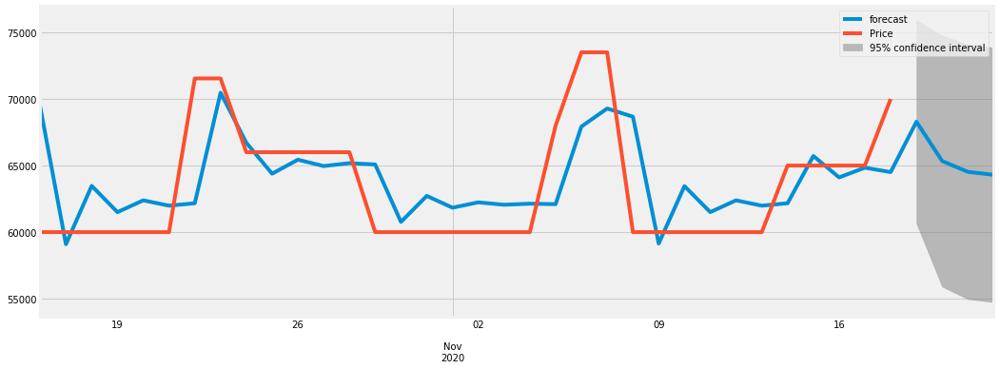

0.7632447158716216
2020-10-16    69423.980408
2020-10-17    59081.567189
2020-10-18    63462.585786
2020-10-19    61489.300059
2020-10-20    62378.620556
2020-10-21    61975.705326
2020-10-22    62158.020736
2020-10-23    70455.316146
2020-10-24    66698.667757
2020-10-25    64376.596894
2020-10-26    65427.933635
2020-10-27    64951.932236
2020-10-28    65167.445819
2020-10-29    65069.870258
2020-10-30    60757.089759
2020-10-31    62709.736897
2020-11-01    61825.659711
2020-11-02    62225.932989
2020-11-03    62044.705943
2020-11-04    62126.757991
2020-11-05    62089.608246
2020-11-06    67915.706293
2020-11-07    69271.770841
2020-11-08    68657.801370
2020-11-09    59132.624191
2020-11-10    63445.227155
2020-11-11    61492.660397
2020-11-12    62376.701190
2020-11-13    61976.444389
2020-11-14    62157.663975
2020-11-15    65706.414175
2020-11-16    64099.688091
2020-11-17    64827.146650
2020-11-18    64497.783755
2020-11-19    68277.704407
2020-11-20    65322.913803
2020-11-2

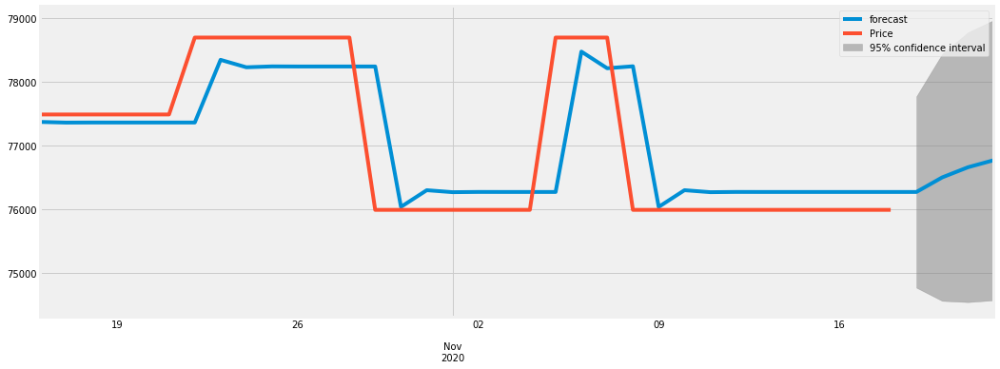

0.9329470623632228
2020-10-16    77372.875652
2020-10-17    77362.560305
2020-10-18    77363.892368
2020-10-19    77363.735912
2020-10-20    77363.754506
2020-10-21    77363.752299
2020-10-22    77363.752561
2020-10-23    78349.523022
2020-10-24    78232.517182
2020-10-25    78246.405168
2020-10-26    78244.756737
2020-10-27    78244.952397
2020-10-28    78244.929173
2020-10-29    78244.931930
2020-10-30    76037.131574
2020-10-31    76299.186023
2020-11-01    76268.081520
2020-11-02    76271.773463
2020-11-03    76271.335248
2020-11-04    76271.387262
2020-11-05    76271.381088
2020-11-06    78479.181850
2020-11-07    78217.127352
2020-11-08    78248.231862
2020-11-09    76036.739889
2020-11-10    76299.232514
2020-11-11    76268.076001
2020-11-12    76271.774118
2020-11-13    76271.335170
2020-11-14    76271.387271
2020-11-15    76271.381087
2020-11-16    76271.381821
2020-11-17    76271.381734
2020-11-18    76271.381744
2020-11-19    76271.381743
2020-11-20    76500.619611
2020-11-2

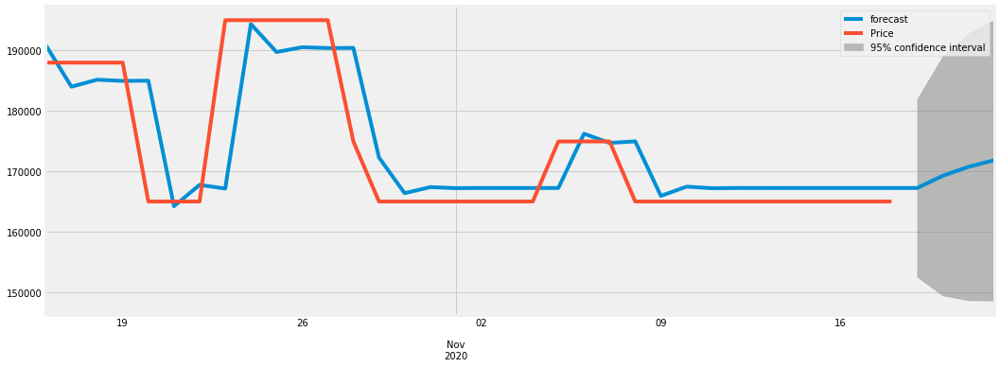

0.9502192628311923
2020-10-16    190775.651249
2020-10-17    183926.862467
2020-10-18    185080.253485
2020-10-19    184884.812438
2020-10-20    184917.994954
2020-10-21    164215.629010
2020-10-22    167729.796512
2020-10-23    167133.276606
2020-10-24    194255.018710
2020-10-25    189651.180380
2020-10-26    190432.668799
2020-10-27    190300.013370
2020-10-28    190322.531251
2020-10-29    172250.848957
2020-10-30    166365.840854
2020-10-31    167364.804187
2020-11-01    167195.233012
2020-11-02    167224.017235
2020-11-03    167219.131195
2020-11-04    167219.960586
2020-11-05    167219.819800
2020-11-06    176172.468302
2020-11-07    174652.781765
2020-11-08    174910.744218
2020-11-09    165914.331224
2020-11-10    167441.446658
2020-11-11    167182.223171
2020-11-12    167226.225618
2020-11-13    167218.756328
2020-11-14    167220.024219
2020-11-15    167219.808998
2020-11-16    167219.845531
2020-11-17    167219.839330
2020-11-18    167219.840383
2020-11-19    167219.840204
2

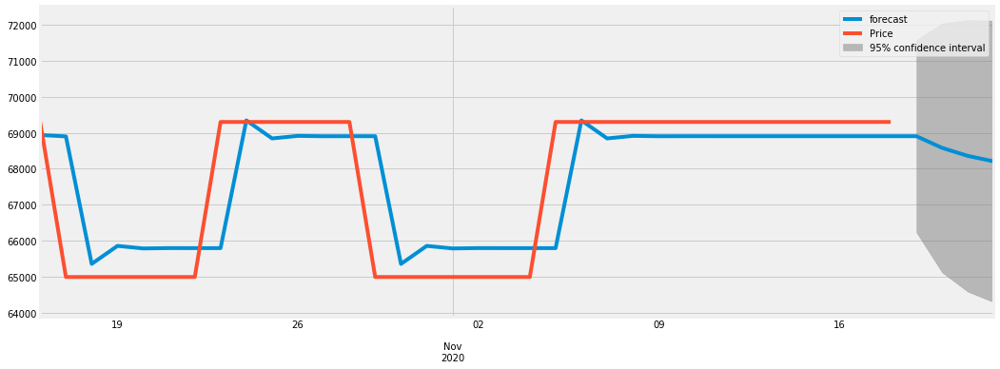

0.9291946492248174
2020-10-16    68939.547607
2020-10-17    68901.748833
2020-10-18    65354.662938
2020-10-19    65855.361859
2020-10-20    65784.666962
2020-10-21    65794.648506
2020-10-22    65793.239191
2020-10-23    65793.438175
2020-10-24    69346.520509
2020-10-25    68844.853710
2020-10-26    68915.685049
2020-10-27    68905.684230
2020-10-28    68907.096266
2020-10-29    68906.896898
2020-10-30    65353.814618
2020-10-31    65855.481409
2020-11-01    65784.650072
2020-11-02    65794.650890
2020-11-03    65793.238855
2020-11-04    65793.438223
2020-11-05    65793.410074
2020-11-06    69346.524477
2020-11-07    68844.853150
2020-11-08    68915.685128
2020-11-09    68905.684219
2020-11-10    68907.096267
2020-11-11    68906.896897
2020-11-12    68906.925047
2020-11-13    68906.921072
2020-11-14    68906.921634
2020-11-15    68906.921554
2020-11-16    68906.921565
2020-11-17    68906.921564
2020-11-18    68906.921564
2020-11-19    68906.921564
2020-11-20    68580.626544
2020-11-2

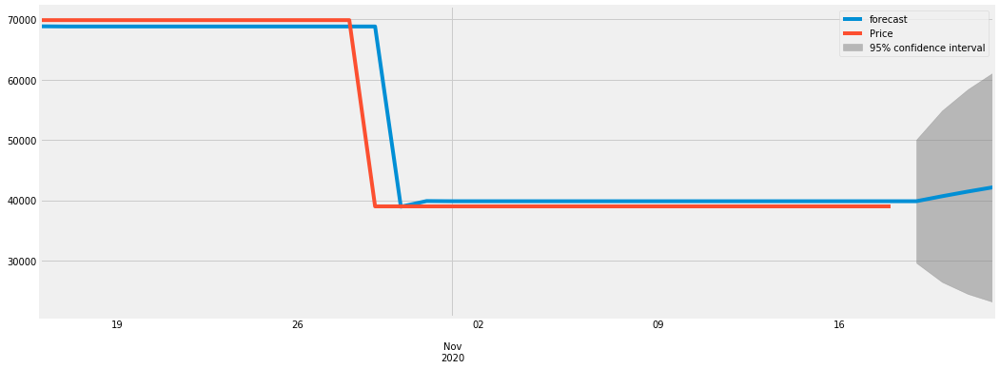

0.9962429263204933
2020-10-16    68822.344654
2020-10-17    68792.333214
2020-10-18    68793.299500
2020-10-19    68793.269304
2020-10-20    68793.270248
2020-10-21    68793.270219
2020-10-22    68793.270220
2020-10-23    68793.270220
2020-10-24    68793.270220
2020-10-25    68793.270220
2020-10-26    68793.270220
2020-10-27    68793.270220
2020-10-28    68793.270220
2020-10-29    68793.270220
2020-10-30    38938.777382
2020-10-31    39872.579926
2020-11-01    39843.372021
2020-11-02    39844.285599
2020-11-03    39844.257023
2020-11-04    39844.257917
2020-11-05    39844.257889
2020-11-06    39844.257890
2020-11-07    39844.257890
2020-11-08    39844.257890
2020-11-09    39844.257890
2020-11-10    39844.257890
2020-11-11    39844.257890
2020-11-12    39844.257890
2020-11-13    39844.257890
2020-11-14    39844.257890
2020-11-15    39844.257890
2020-11-16    39844.257890
2020-11-17    39844.257890
2020-11-18    39844.257890
2020-11-19    39844.257890
2020-11-20    40670.842322
2020-11-2

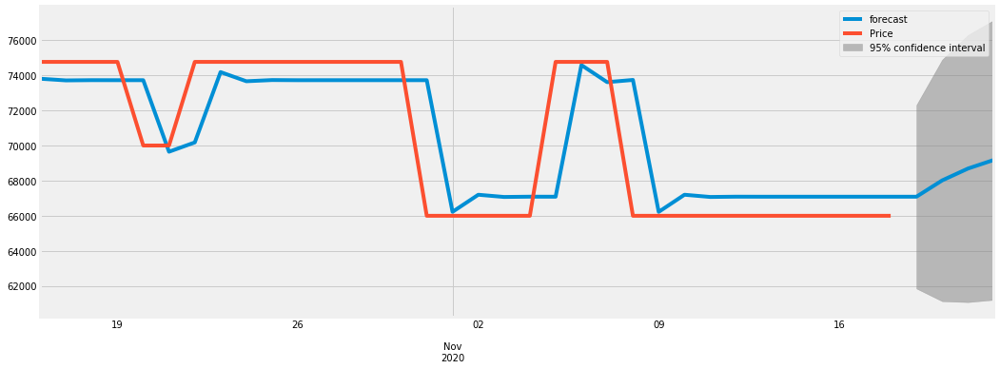

0.9461794262406373
2020-10-16    73791.427432
2020-10-17    73695.732117
2020-10-18    73709.398758
2020-10-19    73707.646842
2020-10-20    73707.874752
2020-10-21    69636.177604
2020-10-22    70164.981726
2020-10-23    74167.971826
2020-10-24    73648.090904
2020-10-25    73715.609476
2020-10-26    73706.840626
2020-10-27    73707.979465
2020-10-28    73707.831560
2020-10-29    73707.850769
2020-10-30    73707.848274
2020-10-31    73707.848598
2020-11-01    66214.611625
2020-11-02    67187.781892
2020-11-03    67061.393207
2020-11-04    67077.807703
2020-11-05    67075.675901
2020-11-06    74569.189695
2020-11-07    73595.983477
2020-11-08    73722.376831
2020-11-09    66212.724798
2020-11-10    67188.026940
2020-11-11    67061.361382
2020-11-12    67077.811836
2020-11-13    67075.675364
2020-11-14    67075.952835
2020-11-15    67075.916799
2020-11-16    67075.921479
2020-11-17    67075.920871
2020-11-18    67075.920950
2020-11-19    67075.920940
2020-11-20    68004.809398
2020-11-2

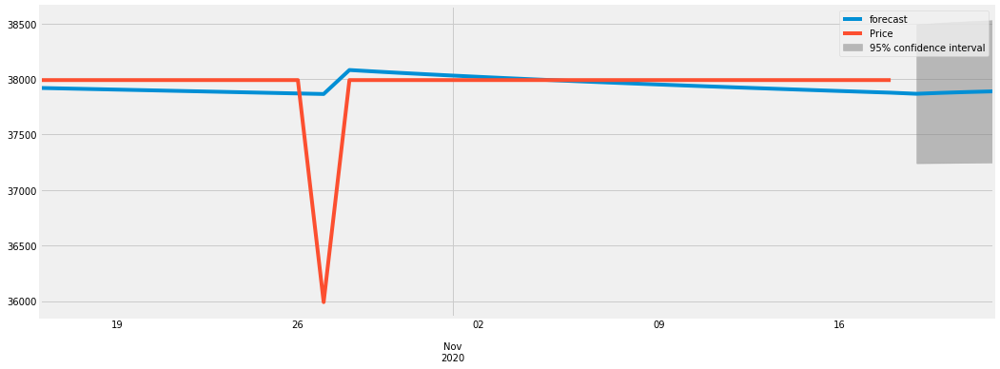

-0.18071067226888848
2020-10-16    37919.040002
2020-10-17    37914.091698
2020-10-18    37909.143393
2020-10-19    37904.195089
2020-10-20    37899.246784
2020-10-21    37894.298480
2020-10-22    37889.350176
2020-10-23    37884.401871
2020-10-24    37879.453567
2020-10-25    37874.505263
2020-10-26    37869.556958
2020-10-27    37864.608654
2020-10-28    38080.578686
2020-10-29    38067.243286
2020-10-30    38054.521420
2020-10-31    38042.348141
2020-11-01    38030.667359
2020-11-02    38019.430374
2020-11-03    38008.594706
2020-11-04    37998.123126
2020-11-05    37987.982875
2020-11-06    37978.145005
2020-11-07    37968.583849
2020-11-08    37959.276564
2020-11-09    37950.202751
2020-11-10    37941.344144
2020-11-11    37932.684331
2020-11-12    37924.208527
2020-11-13    37915.903381
2020-11-14    37907.756799
2020-11-15    37899.757807
2020-11-16    37891.896418
2020-11-17    37884.163528
2020-11-18    37876.550818
2020-11-19    37866.654240
2020-11-20    37875.249881
2020-11

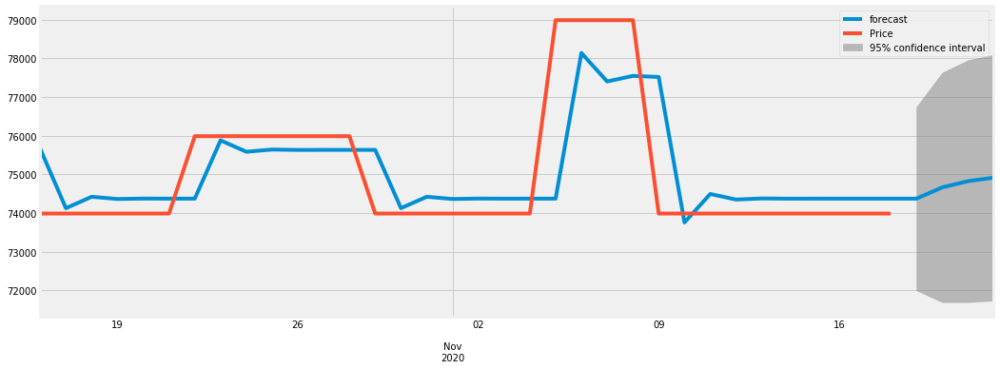

0.8779089749690471
2020-10-16    75668.547568
2020-10-17    74128.004094
2020-10-18    74423.615920
2020-10-19    74365.811686
2020-10-20    74377.109749
2020-10-21    74374.901035
2020-10-22    74375.332812
2020-10-23    75881.354489
2020-10-24    75586.943826
2020-10-25    75644.497870
2020-10-26    75633.246688
2020-10-27    75635.446170
2020-10-28    75635.016196
2020-10-29    75635.100251
2020-10-30    74128.977734
2020-10-31    74423.408111
2020-11-01    74365.850212
2020-11-02    74377.102148
2020-11-03    74374.902518
2020-11-04    74375.332522
2020-11-05    74375.248461
2020-11-06    78140.530106
2020-11-07    77404.458983
2020-11-08    77548.352787
2020-11-09    77520.223132
2020-11-10    73760.456958
2020-11-11    74495.449867
2020-11-12    74351.766842
2020-11-13    74379.855292
2020-11-14    74374.364309
2020-11-15    74375.437736
2020-11-16    74375.227893
2020-11-17    74375.268915
2020-11-18    74375.260895
2020-11-19    74375.262463
2020-11-20    74665.385226
2020-11-2

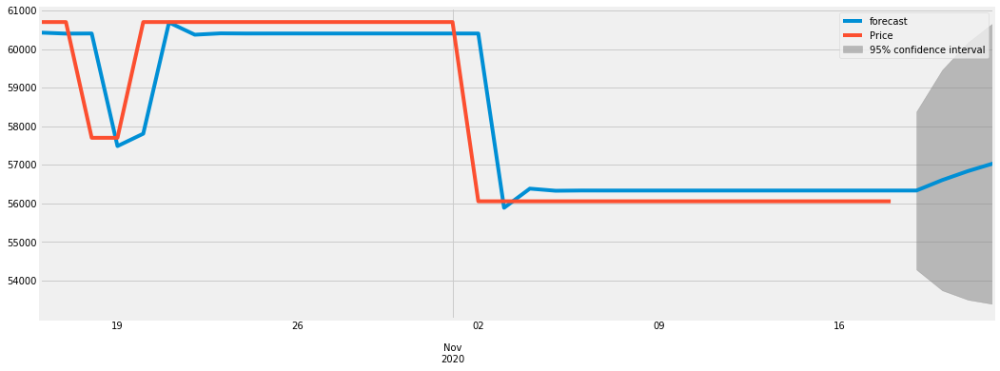

0.9849877589785788
2020-10-16    60426.610299
2020-10-17    60400.235740
2020-10-18    60403.414253
2020-10-19    57484.639468
2020-10-20    57805.480960
2020-10-21    60688.642495
2020-10-22    60371.715327
2020-10-23    60406.553066
2020-10-24    60402.723580
2020-10-25    60403.144531
2020-10-26    60403.098259
2020-10-27    60403.103345
2020-10-28    60403.102786
2020-10-29    60403.102847
2020-10-30    60403.102841
2020-10-31    60403.102841
2020-11-01    60403.102841
2020-11-02    60403.102841
2020-11-03    55884.934333
2020-11-04    56381.587169
2020-11-05    56326.993357
2020-11-06    56332.994499
2020-11-07    56332.334833
2020-11-08    56332.407346
2020-11-09    56332.399375
2020-11-10    56332.400251
2020-11-11    56332.400155
2020-11-12    56332.400165
2020-11-13    56332.400164
2020-11-14    56332.400164
2020-11-15    56332.400164
2020-11-16    56332.400164
2020-11-17    56332.400164
2020-11-18    56332.400164
2020-11-19    56332.400164
2020-11-20    56603.140340
2020-11-2

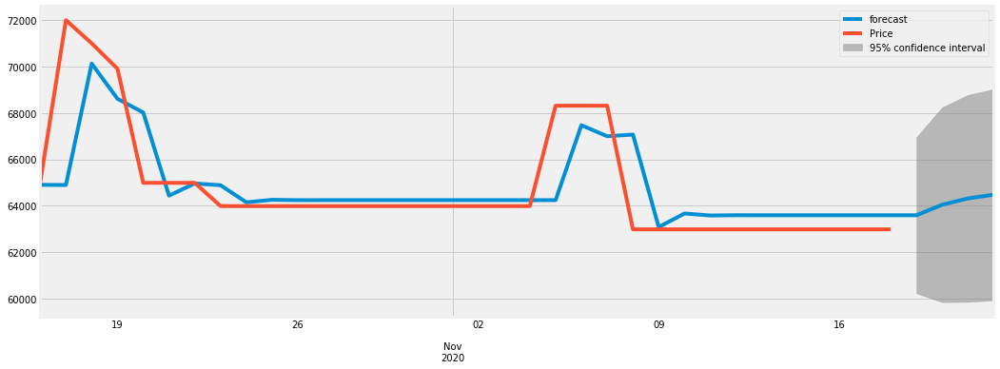

0.8905810188486682
2020-10-16    64904.479897
2020-10-17    64896.046402
2020-10-18    70119.856818
2020-10-19    68606.330009
2020-10-20    68015.503456
2020-10-21    64438.997298
2020-10-22    64964.575313
2020-10-23    64887.340090
2020-10-24    64152.594336
2020-10-25    64260.567369
2020-10-26    64244.700417
2020-10-27    64247.032112
2020-10-28    64246.689462
2020-10-29    64246.739816
2020-10-30    64246.732416
2020-10-31    64246.733503
2020-11-01    64246.733344
2020-11-02    64246.733367
2020-11-03    64246.733364
2020-11-04    64246.733364
2020-11-05    64246.733364
2020-11-06    67469.120672
2020-11-07    66995.581454
2020-11-08    67065.169424
2020-11-09    63086.460265
2020-11-10    63671.143186
2020-11-11    63585.222325
2020-11-12    63597.848646
2020-11-13    63595.993172
2020-11-14    63596.265839
2020-11-15    63596.225770
2020-11-16    63596.231658
2020-11-17    63596.230793
2020-11-18    63596.230920
2020-11-19    63596.230901
2020-11-20    64048.537170
2020-11-2

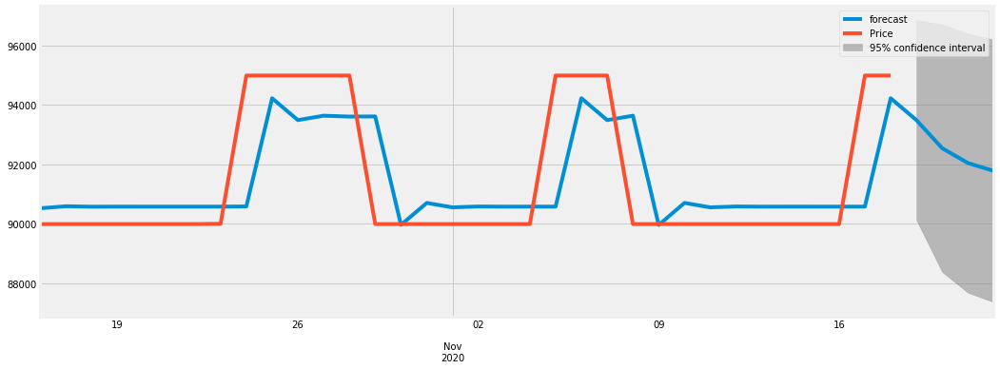

0.8648916995227147
2020-10-16    90522.117818
2020-10-17    90590.141803
2020-10-18    90574.659948
2020-10-19    90577.705573
2020-10-20    90577.087345
2020-10-21    90577.212057
2020-10-22    90577.186868
2020-10-23    90577.191954
2020-10-24    90583.758950
2020-10-25    94224.766610
2020-10-26    93489.511875
2020-10-27    93637.987126
2020-10-28    93608.004456
2020-10-29    93614.059071
2020-10-30    89963.934616
2020-10-31    90701.030371
2020-11-01    90552.183350
2020-11-02    90582.241094
2020-11-03    90576.171318
2020-11-04    90577.397032
2020-11-05    90577.149515
2020-11-06    94226.101301
2020-11-07    93489.242351
2020-11-08    93638.041553
2020-11-09    89959.091662
2020-11-10    90702.008343
2020-11-11    90551.985861
2020-11-12    90582.280974
2020-11-13    90576.163265
2020-11-14    90577.398658
2020-11-15    90577.149186
2020-11-16    90577.199564
2020-11-17    90577.189391
2020-11-18    94226.093248
2020-11-19    93489.243977
2020-11-20    92542.818953
2020-11-2

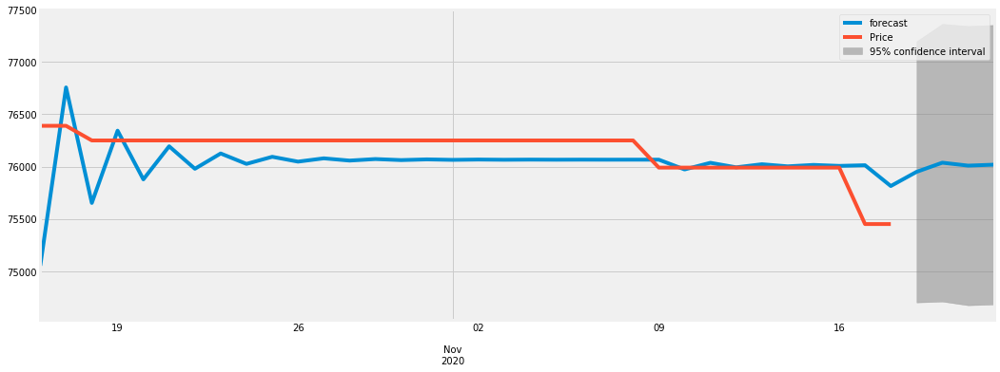

0.4189341363890704
2020-10-16    75051.387738
2020-10-17    76757.194019
2020-10-18    75651.875271
2020-10-19    76343.503810
2020-10-20    75877.314170
2020-10-21    76193.976620
2020-10-22    75978.808336
2020-10-23    76125.353690
2020-10-24    76025.585615
2020-10-25    76093.563600
2020-10-26    76047.260261
2020-10-27    76078.810165
2020-10-28    76057.316471
2020-10-29    76071.961313
2020-10-30    76061.983803
2020-10-31    76068.781889
2020-11-01    76064.150260
2020-11-02    76067.305942
2020-11-03    76065.155911
2020-11-04    76066.620790
2020-11-05    76065.622734
2020-11-06    76066.302737
2020-11-07    76065.839434
2020-11-08    76066.155095
2020-11-09    76065.940027
2020-11-10    75972.346578
2020-11-11    76036.114199
2020-11-12    75992.667681
2020-11-13    76022.268910
2020-11-14    76002.100832
2020-11-15    76015.841861
2020-11-16    76006.479745
2020-11-17    76012.858395
2020-11-18    75813.821729
2020-11-19    75949.430522
2020-11-20    76037.100642
2020-11-2

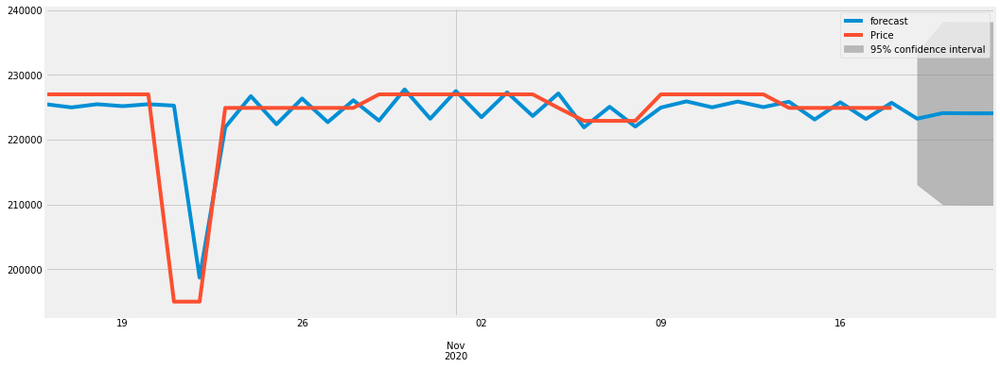

0.5384097503709198
2020-10-16    225468.444074
2020-10-17    224974.715023
2020-10-18    225468.444074
2020-10-19    225169.029103
2020-10-20    225468.444074
2020-10-21    225253.588547
2020-10-22    198684.803378
2020-10-23    221915.749661
2020-10-24    226717.220205
2020-10-25    222375.737422
2020-10-26    226344.305612
2020-10-27    222695.075100
2020-10-28    226077.319401
2020-10-29    222929.717726
2020-10-30    227754.692987
2020-10-31    223226.961792
2020-11-01    227501.814005
2020-11-02    223461.896298
2020-11-03    227299.304899
2020-11-04    223652.254929
2020-11-05    227133.479297
2020-11-06    221892.259187
2020-11-07    225073.420552
2020-11-08    222020.759245
2020-11-09    224953.056191
2020-11-10    225908.617363
2020-11-11    224989.762425
2020-11-12    225878.345932
2020-11-13    225021.587797
2020-11-14    225851.970217
2020-11-15    223106.677709
2020-11-16    225768.088177
2020-11-17    223186.357251
2020-11-18    225693.770314
2020-11-19    223235.204361
2

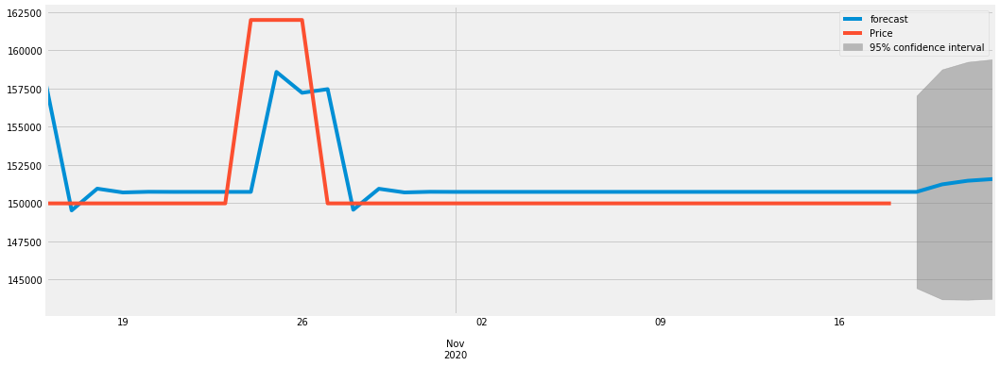

0.8239421422167064
2020-10-16    157786.460570
2020-10-17    149530.150583
2020-10-18    150953.179112
2020-10-19    150705.426152
2020-10-20    150748.563787
2020-10-21    150741.052539
2020-10-22    150742.360411
2020-10-23    150742.132682
2020-10-24    150742.172335
2020-10-25    158592.251460
2020-10-26    157225.379704
2020-10-27    157463.382196
2020-10-28    149571.854688
2020-10-29    150945.943521
2020-10-30    150706.684376
2020-10-31    150748.344666
2020-11-01    150741.090691
2020-11-02    150742.353768
2020-11-03    150742.133839
2020-11-04    150742.172133
2020-11-05    150742.165465
2020-11-06    150742.166626
2020-11-07    150742.166424
2020-11-08    150742.166459
2020-11-09    150742.166453
2020-11-10    150742.166454
2020-11-11    150742.166454
2020-11-12    150742.166454
2020-11-13    150742.166454
2020-11-14    150742.166454
2020-11-15    150742.166454
2020-11-16    150742.166454
2020-11-17    150742.166454
2020-11-18    150742.166454
2020-11-19    150742.166454
2

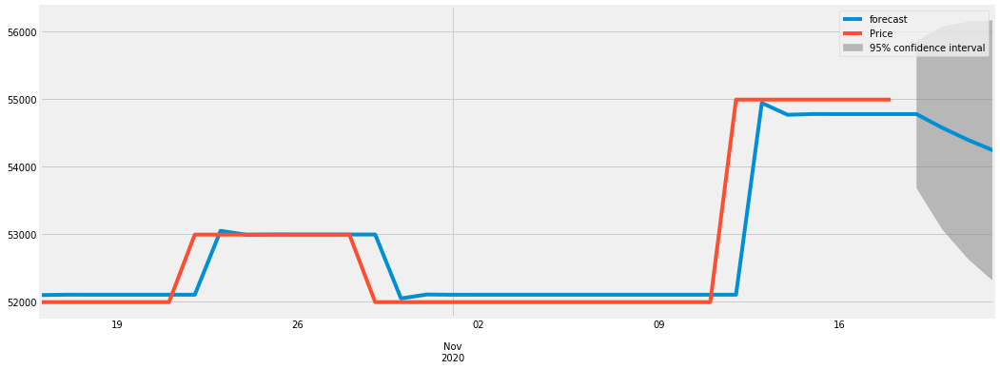

0.988901669319714
2020-10-16    52094.213146
2020-10-17    52099.949518
2020-10-18    52099.577139
2020-10-19    52099.599974
2020-10-20    52099.598569
2020-10-21    52099.598655
2020-10-22    52099.598650
2020-10-23    53046.518070
2020-10-24    52988.254877
2020-10-25    52991.839764
2020-10-26    52991.619189
2020-10-27    52991.632761
2020-10-28    52991.631926
2020-10-29    52991.631977
2020-10-30    52044.712555
2020-10-31    52102.975748
2020-11-01    52099.390860
2020-11-02    52099.611435
2020-11-03    52099.597863
2020-11-04    52099.598698
2020-11-05    52099.598647
2020-11-06    52099.598650
2020-11-07    52099.598650
2020-11-08    52099.598650
2020-11-09    52099.598650
2020-11-10    52099.598650
2020-11-11    52099.598650
2020-11-12    52099.598650
2020-11-13    54940.356908
2020-11-14    54765.567330
2020-11-15    54776.321993
2020-11-16    54775.660267
2020-11-17    54775.700983
2020-11-18    54775.698477
2020-11-19    54775.698632
2020-11-20    54572.772495
2020-11-21

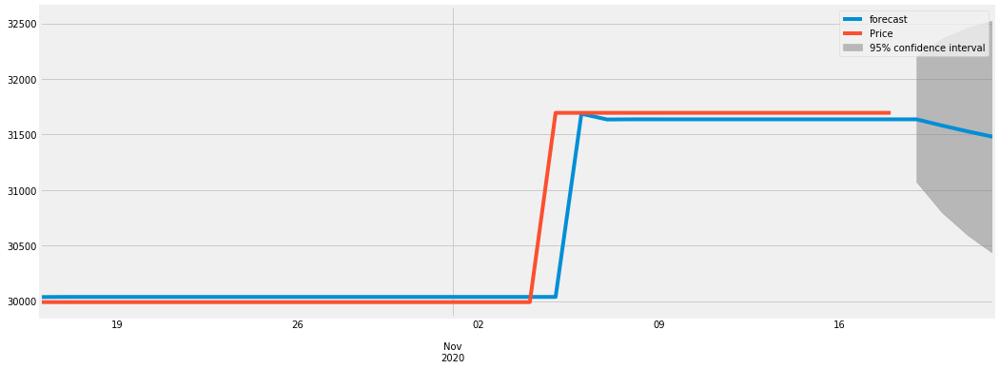

0.9962851579140706
2020-10-16    30035.643562
2020-10-17    30036.985612
2020-10-18    30036.942358
2020-10-19    30036.943711
2020-10-20    30036.943669
2020-10-21    30036.943670
2020-10-22    30036.943670
2020-10-23    30036.943670
2020-10-24    30036.943670
2020-10-25    30036.943670
2020-10-26    30036.943670
2020-10-27    30036.943670
2020-10-28    30036.943670
2020-10-29    30036.943670
2020-10-30    30036.943670
2020-10-31    30036.943670
2020-11-01    30036.943670
2020-11-02    30036.943670
2020-11-03    30036.943670
2020-11-04    30036.943670
2020-11-05    30036.943670
2020-11-06    31685.746803
2020-11-07    31634.125131
2020-11-08    31635.741332
2020-11-09    31635.690731
2020-11-10    31635.692315
2020-11-11    31635.692265
2020-11-12    31635.692267
2020-11-13    31635.692267
2020-11-14    31635.692267
2020-11-15    31635.692267
2020-11-16    31635.692267
2020-11-17    31635.692267
2020-11-18    31635.692267
2020-11-19    31635.692267
2020-11-20    31579.273268
2020-11-2

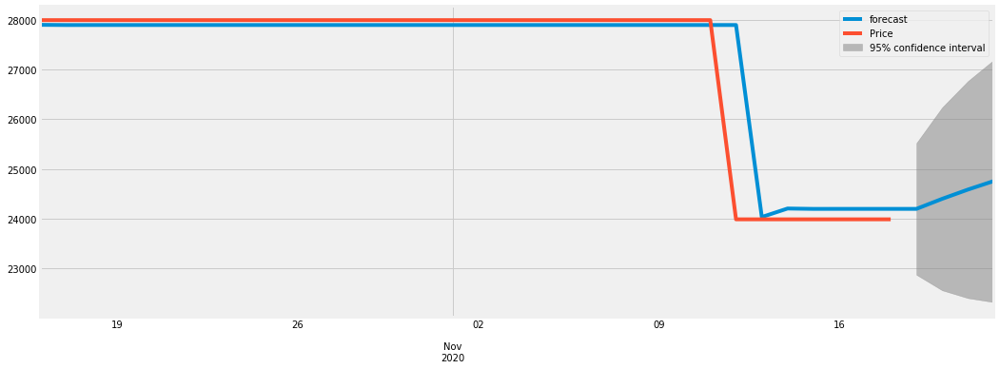

0.9939971281297247
2020-10-16    27895.588168
2020-10-17    27891.736294
2020-10-18    27891.913236
2020-10-19    27891.905440
2020-10-20    27891.905785
2020-10-21    27891.905769
2020-10-22    27891.905770
2020-10-23    27891.905770
2020-10-24    27891.905770
2020-10-25    27891.905770
2020-10-26    27891.905770
2020-10-27    27891.905770
2020-10-28    27891.905770
2020-10-29    27891.905770
2020-10-30    27891.905770
2020-10-31    27891.905770
2020-11-01    27891.905770
2020-11-02    27891.905770
2020-11-03    27891.905770
2020-11-04    27891.905770
2020-11-05    27891.905770
2020-11-06    27891.905770
2020-11-07    27891.905770
2020-11-08    27891.905770
2020-11-09    27891.905770
2020-11-10    27891.905770
2020-11-11    27891.905770
2020-11-12    27891.905770
2020-11-13    24036.794223
2020-11-14    24206.943634
2020-11-15    24199.433910
2020-11-16    24199.765360
2020-11-17    24199.750731
2020-11-18    24199.751377
2020-11-19    24199.751348
2020-11-20    24401.905060
2020-11-2

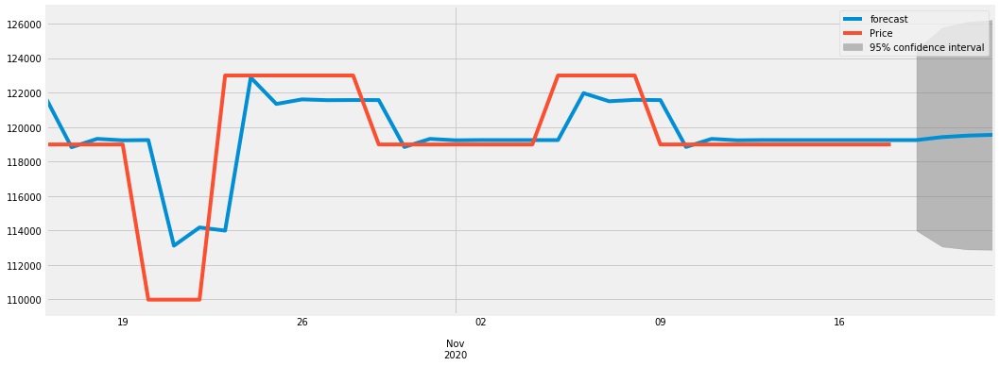

0.8429660713736751
2020-10-16    121679.361437
2020-10-17    118828.358662
2020-10-18    119314.990268
2020-10-19    119231.041073
2020-10-20    119245.524380
2020-10-21    113119.624351
2020-10-22    114176.533269
2020-10-23    113994.183497
2020-10-24    122870.557379
2020-10-25    121339.105871
2020-10-26    121603.329049
2020-10-27    121557.742305
2020-10-28    121565.607441
2020-10-29    121564.250460
2020-10-30    118842.972933
2020-10-31    119312.478232
2020-11-01    119231.473916
2020-11-02    119245.449688
2020-11-03    119243.038432
2020-11-04    119243.454449
2020-11-05    119243.382673
2020-11-06    121964.906704
2020-11-07    121495.358876
2020-11-08    121576.370530
2020-11-09    121562.393491
2020-11-10    118843.293318
2020-11-11    119312.422956
2020-11-12    119231.483453
2020-11-13    119245.448043
2020-11-14    119243.038715
2020-11-15    119243.454400
2020-11-16    119243.382681
2020-11-17    119243.395055
2020-11-18    119243.392920
2020-11-19    119243.393288
2

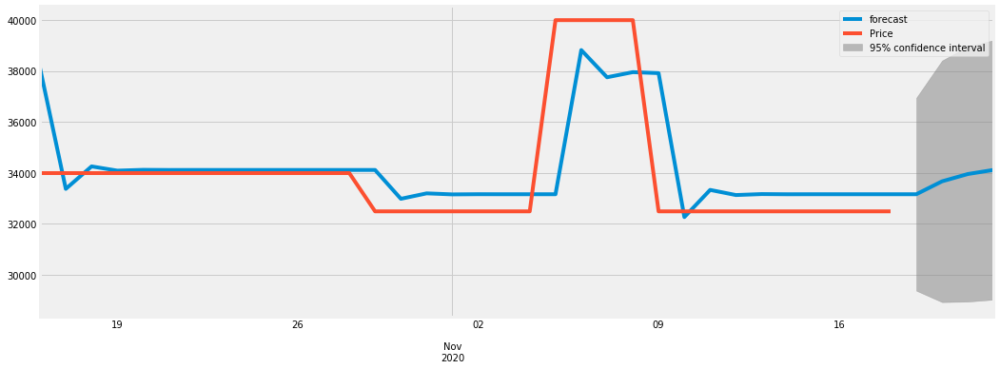

0.8789375181174589
2020-10-16    38109.354673
2020-10-17    33371.182123
2020-10-18    34252.662223
2020-10-19    34086.423839
2020-10-20    34117.786432
2020-10-21    34111.869355
2020-10-22    34112.985707
2020-10-23    34112.775089
2020-10-24    34112.814826
2020-10-25    34112.807329
2020-10-26    34112.808743
2020-10-27    34112.808476
2020-10-28    34112.808527
2020-10-29    34112.808517
2020-10-30    32982.062817
2020-10-31    33195.396417
2020-11-01    33155.147558
2020-11-02    33162.741161
2020-11-03    33161.308504
2020-11-04    33161.578798
2020-11-05    33161.527803
2020-11-06    38815.265932
2020-11-07    37748.596116
2020-11-08    37949.840756
2020-11-09    37911.872676
2020-11-10    32265.307464
2020-11-11    33330.623993
2020-11-12    33129.634672
2020-11-13    33167.554582
2020-11-14    33160.400373
2020-11-15    33161.750131
2020-11-16    33161.495478
2020-11-17    33161.543522
2020-11-18    33161.534458
2020-11-19    33161.536168
2020-11-20    33667.760269
2020-11-2

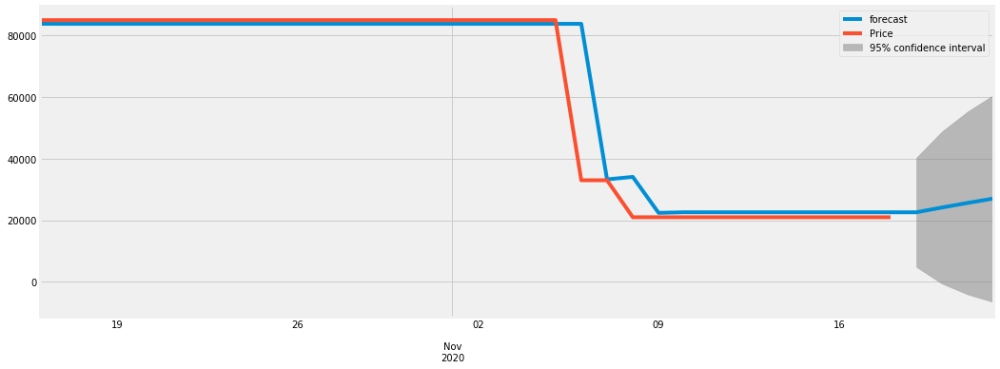

0.9980923894551452
2020-10-16    83816.184673
2020-10-17    83797.951041
2020-10-18    83798.249400
2020-10-19    83798.244593
2020-10-20    83798.244671
2020-10-21    83798.244670
2020-10-22    83798.244670
2020-10-23    83798.244670
2020-10-24    83798.244670
2020-10-25    83798.244670
2020-10-26    83798.244670
2020-10-27    83798.244670
2020-10-28    83798.244670
2020-10-29    83798.244670
2020-10-30    83798.244670
2020-10-31    83798.244670
2020-11-01    83798.244670
2020-11-02    83798.244670
2020-11-03    83798.244670
2020-11-04    83798.244670
2020-11-05    83798.244670
2020-11-06    83798.244670
2020-11-07    33276.591143
2020-11-08    34090.732756
2020-11-09    22408.829879
2020-11-10    22597.080314
2020-11-11    22594.046713
2020-11-12    22594.095599
2020-11-13    22594.094811
2020-11-14    22594.094824
2020-11-15    22594.094823
2020-11-16    22594.094824
2020-11-17    22594.094824
2020-11-18    22594.094824
2020-11-19    22594.094824
2020-11-20    24152.615620
2020-11-2

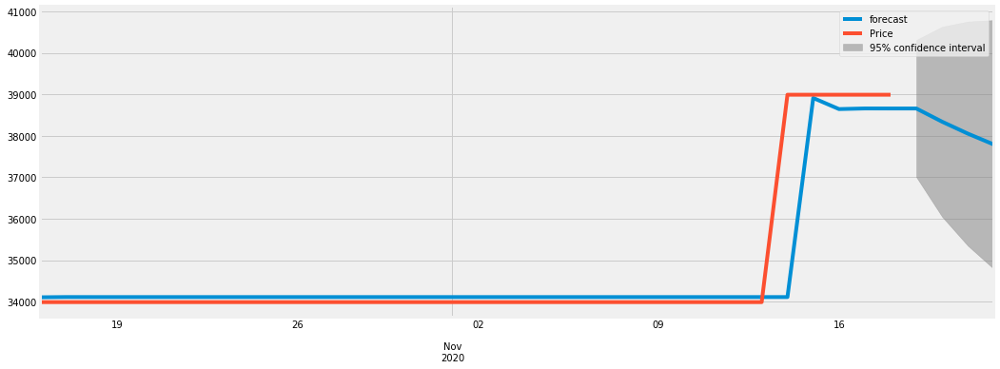

0.9915884093560591
2020-10-16    34106.509240
2020-10-17    34112.422358
2020-10-18    34112.076232
2020-10-19    34112.095459
2020-10-20    34112.094388
2020-10-21    34112.094448
2020-10-22    34112.094444
2020-10-23    34112.094445
2020-10-24    34112.094445
2020-10-25    34112.094445
2020-10-26    34112.094445
2020-10-27    34112.094445
2020-10-28    34112.094445
2020-10-29    34112.094445
2020-10-30    34112.094445
2020-10-31    34112.094445
2020-11-01    34112.094445
2020-11-02    34112.094445
2020-11-03    34112.094445
2020-11-04    34112.094445
2020-11-05    34112.094445
2020-11-06    34112.094445
2020-11-07    34112.094445
2020-11-08    34112.094445
2020-11-09    34112.094445
2020-11-10    34112.094445
2020-11-11    34112.094445
2020-11-12    34112.094445
2020-11-13    34112.094445
2020-11-14    34112.094445
2020-11-15    38911.573489
2020-11-16    38644.201890
2020-11-17    38659.096751
2020-11-18    38658.266981
2020-11-19    38658.313206
2020-11-20    38339.925868
2020-11-2

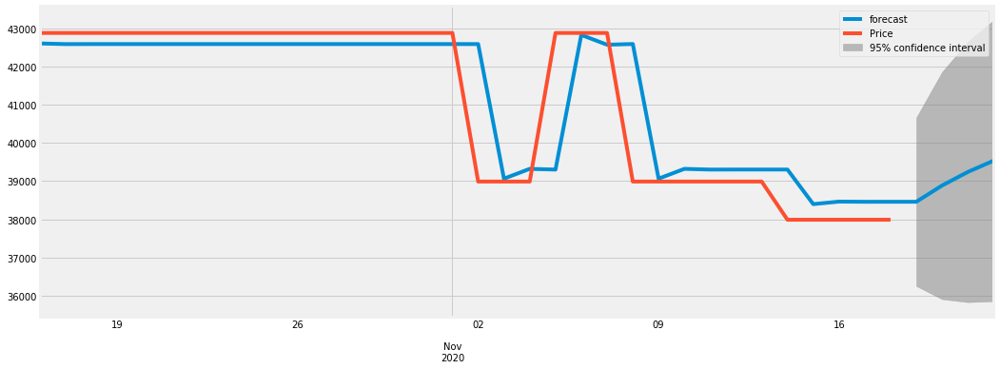

0.9775338991433279
2020-10-16    42605.939086
2020-10-17    42588.949710
2020-10-18    42590.261205
2020-10-19    42590.166280
2020-10-20    42590.173183
2020-10-21    42590.172682
2020-10-22    42590.172718
2020-10-23    42590.172715
2020-10-24    42590.172716
2020-10-25    42590.172716
2020-10-26    42590.172716
2020-10-27    42590.172716
2020-10-28    42590.172716
2020-10-29    42590.172716
2020-10-30    42590.172716
2020-10-31    42590.172716
2020-11-01    42590.172716
2020-11-02    42590.172716
2020-11-03    39065.881592
2020-11-04    39322.118141
2020-11-05    39303.488247
2020-11-06    42829.133872
2020-11-07    42572.798844
2020-11-08    42591.435898
2020-11-09    39065.789752
2020-11-10    39322.124818
2020-11-11    39303.487762
2020-11-12    39304.842785
2020-11-13    39304.744267
2020-11-14    39304.751429
2020-11-15    38398.996315
2020-11-16    38464.850002
2020-11-17    38460.062054
2020-11-18    38460.410166
2020-11-19    38460.384856
2020-11-20    38886.439941
2020-11-2

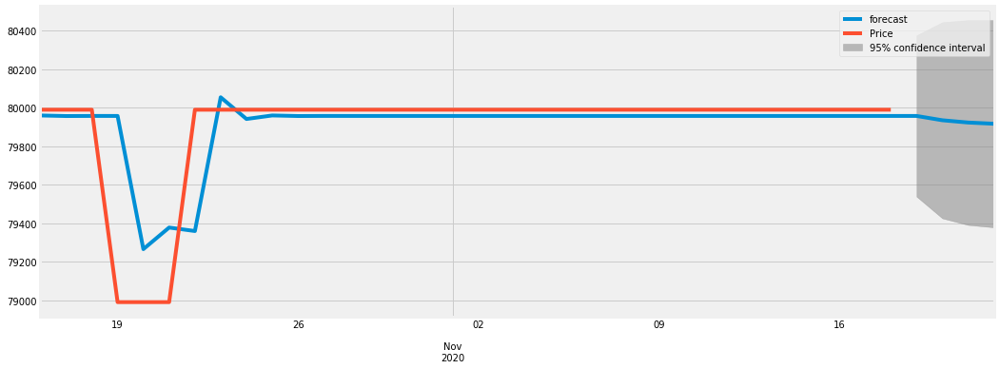

0.8541045469537738
2020-10-16    79960.213983
2020-10-17    79957.215376
2020-10-18    79957.750365
2020-10-19    79957.665039
2020-10-20    79265.400650
2020-10-21    79377.643445
2020-10-22    79359.444548
2020-10-23    80054.673584
2020-10-24    79941.950075
2020-10-25    79960.226915
2020-10-26    79957.263532
2020-10-27    79957.744011
2020-10-28    79957.666107
2020-10-29    79957.678738
2020-10-30    79957.676690
2020-10-31    79957.677022
2020-11-01    79957.676968
2020-11-02    79957.676977
2020-11-03    79957.676976
2020-11-04    79957.676976
2020-11-05    79957.676976
2020-11-06    79957.676976
2020-11-07    79957.676976
2020-11-08    79957.676976
2020-11-09    79957.676976
2020-11-10    79957.676976
2020-11-11    79957.676976
2020-11-12    79957.676976
2020-11-13    79957.676976
2020-11-14    79957.676976
2020-11-15    79957.676976
2020-11-16    79957.676976
2020-11-17    79957.676976
2020-11-18    79957.676976
2020-11-19    79957.676976
2020-11-20    79935.300448
2020-11-2

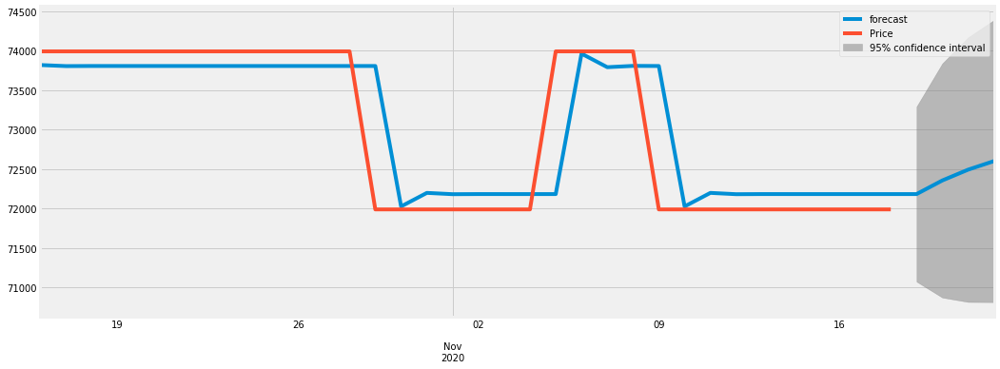

0.966753738912594
2020-10-16    73817.266194
2020-10-17    73803.647977
2020-10-18    73805.063998
2020-10-19    73804.928549
2020-10-20    73804.941614
2020-10-21    73804.940355
2020-10-22    73804.940476
2020-10-23    73804.940465
2020-10-24    73804.940466
2020-10-25    73804.940466
2020-10-26    73804.940466
2020-10-27    73804.940466
2020-10-28    73804.940466
2020-10-29    73804.940466
2020-10-30    72027.723435
2020-10-31    72199.023874
2020-11-01    72182.512756
2020-11-02    72184.104211
2020-11-03    72183.950816
2020-11-04    72183.965601
2020-11-05    72183.964176
2020-11-06    73961.181344
2020-11-07    73789.880892
2020-11-08    73806.392011
2020-11-09    73804.800556
2020-11-10    72027.736921
2020-11-11    72199.022574
2020-11-12    72182.512881
2020-11-13    72184.104199
2020-11-14    72183.950817
2020-11-15    72183.965601
2020-11-16    72183.964176
2020-11-17    72183.964313
2020-11-18    72183.964300
2020-11-19    72183.964301
2020-11-20    72356.322631
2020-11-21

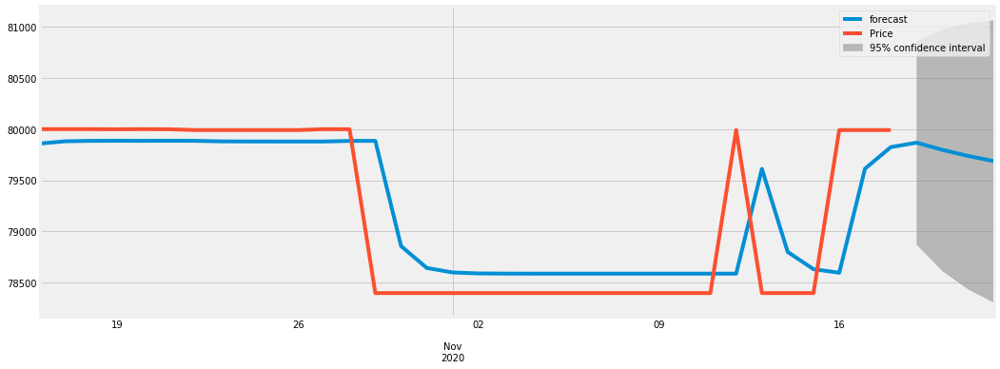

0.9337379481649954
2020-10-16    79859.365641
2020-10-17    79880.979975
2020-10-18    79884.758323
2020-10-19    79885.515527
2020-10-20    79885.028328
2020-10-21    79885.570346
2020-10-22    79885.039633
2020-10-23    79879.786287
2020-10-24    79878.698615
2020-10-25    79878.473420
2020-10-26    79878.426794
2020-10-27    79878.417141
2020-10-28    79884.201540
2020-10-29    79884.756230
2020-10-30    78856.821119
2020-10-31    78643.993652
2020-11-01    78599.929069
2020-11-02    78590.805776
2020-11-03    78588.916856
2020-11-04    78588.525767
2020-11-05    78588.444795
2020-11-06    78588.428030
2020-11-07    78588.424559
2020-11-08    78588.423840
2020-11-09    78588.423691
2020-11-10    78588.423660
2020-11-11    78588.423654
2020-11-12    78588.423653
2020-11-13    79611.330144
2020-11-14    78800.209976
2020-11-15    78632.272672
2020-11-16    78597.502315
2020-11-17    79613.209823
2020-11-18    79823.505643
2020-11-19    79867.046064
2020-11-20    79797.009683
2020-11-2

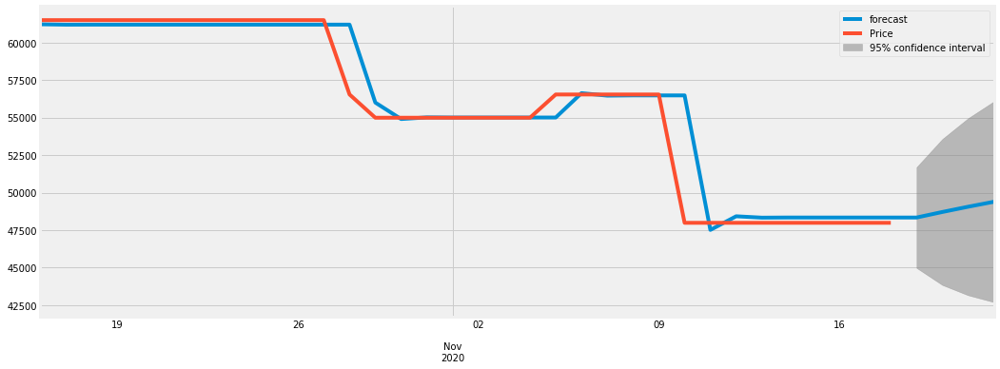

0.997179681034637
2020-10-16    61213.897783
2020-10-17    61187.400401
2020-10-18    61190.344204
2020-10-19    61190.048667
2020-10-20    61190.078658
2020-10-21    61190.075618
2020-10-22    61190.075926
2020-10-23    61190.075895
2020-10-24    61190.075898
2020-10-25    61190.075898
2020-10-26    61190.075898
2020-10-27    61190.075898
2020-10-28    61190.075898
2020-10-29    55999.513432
2020-10-30    54903.153503
2020-10-31    55014.301565
2020-11-01    55003.033467
2020-11-02    55004.175817
2020-11-03    55004.060007
2020-11-04    55004.071747
2020-11-05    55004.070557
2020-11-06    56626.645536
2020-11-07    56462.150227
2020-11-08    56478.826625
2020-11-09    56477.135986
2020-11-10    56477.307381
2020-11-11    47517.490338
2020-11-12    48425.829177
2020-11-13    48333.742537
2020-11-14    48343.078204
2020-11-15    48342.131762
2020-11-16    48342.227712
2020-11-17    48342.217984
2020-11-18    48342.218970
2020-11-19    48342.218870
2020-11-20    48711.405886
2020-11-21

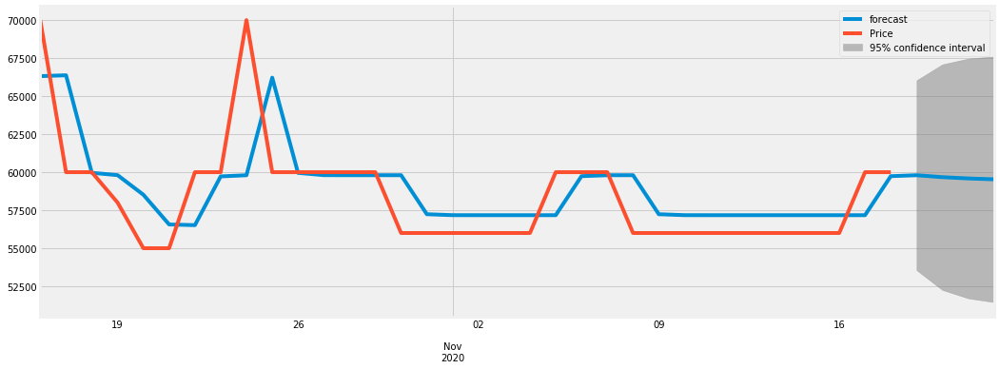

0.8758398986146946
2020-10-16    66306.531363
2020-10-17    66363.946522
2020-10-18    59948.399051
2020-10-19    59794.952575
2020-10-20    58507.902599
2020-10-21    56552.049267
2020-10-22    56505.269340
2020-10-23    59712.600103
2020-10-24    59789.312757
2020-10-25    66208.046846
2020-10-26    59944.670277
2020-10-27    59794.863391
2020-10-28    59791.280323
2020-10-29    59791.194623
2020-10-30    59791.192574
2020-10-31    57224.432811
2020-11-01    57163.041279
2020-11-02    57161.572921
2020-11-03    57161.537801
2020-11-04    57161.536961
2020-11-05    57161.536941
2020-11-06    59728.296654
2020-11-07    59789.688186
2020-11-08    59791.156543
2020-11-09    57224.431950
2020-11-10    57163.041258
2020-11-11    57161.572921
2020-11-12    57161.537801
2020-11-13    57161.536961
2020-11-14    57161.536941
2020-11-15    57161.536941
2020-11-16    57161.536941
2020-11-17    57161.536941
2020-11-18    59728.296654
2020-11-19    59789.688186
2020-11-20    59662.618469
2020-11-2

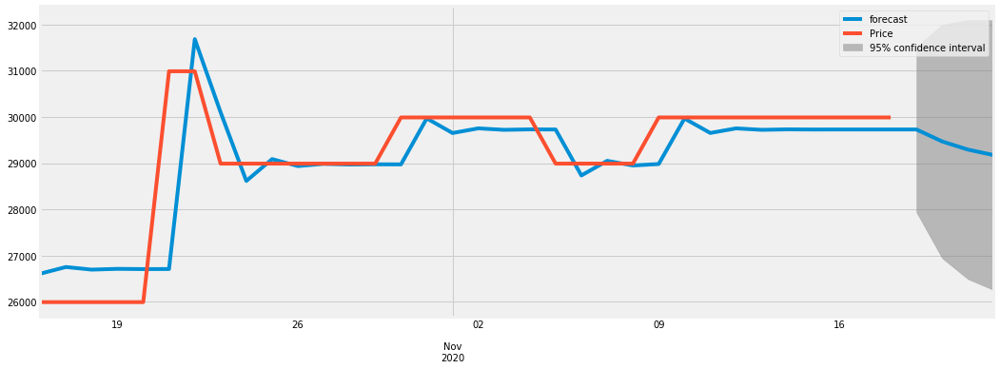

0.9291327202094203
2020-10-16    26605.403154
2020-10-17    26750.502101
2020-10-18    26693.846509
2020-10-19    26710.506514
2020-10-20    26705.084842
2020-10-21    26706.795549
2020-10-22    31686.104159
2020-10-23    30103.055117
2020-10-24    28614.405078
2020-10-25    29087.685109
2020-10-26    28937.217247
2020-10-27    28985.054840
2020-10-28    28969.846042
2020-10-29    28974.681309
2020-10-30    28973.144053
2020-10-31    29969.603749
2020-11-01    29652.803651
2020-11-02    29753.522528
2020-11-03    29721.501414
2020-11-04    29731.681747
2020-11-05    29728.445158
2020-11-06    28733.503191
2020-11-07    29049.820764
2020-11-08    28949.255293
2020-11-09    28981.227636
2020-11-10    29967.033770
2020-11-11    29653.620713
2020-11-12    29753.262763
2020-11-13    29721.584000
2020-11-14    29731.655491
2020-11-15    29728.453506
2020-11-16    29729.471499
2020-11-17    29729.147853
2020-11-18    29729.250748
2020-11-19    29729.218035
2020-11-20    29469.497171
2020-11-2

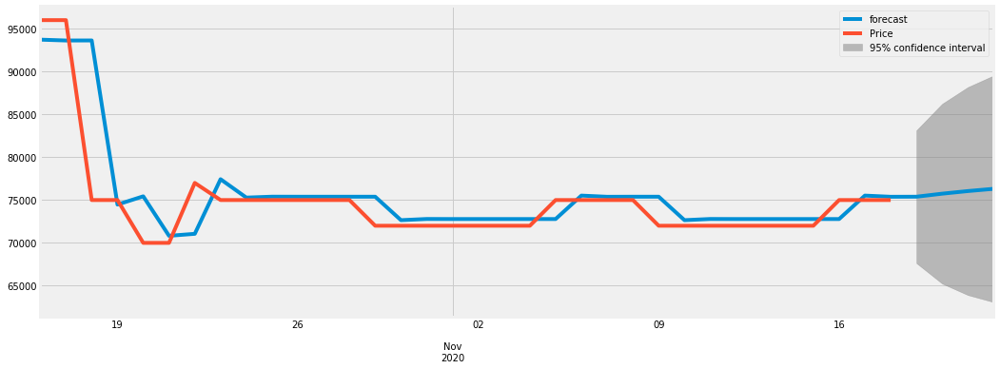

0.9804655189954495
2020-10-16    93712.636681
2020-10-17    93612.807357
2020-10-18    93618.045088
2020-10-19    74461.749222
2020-10-20    75424.616987
2020-10-21    70815.259334
2020-10-22    71046.943057
2020-10-23    77420.642155
2020-10-24    75275.891854
2020-10-25    75383.695104
2020-10-26    75378.276506
2020-10-27    75378.548865
2020-10-28    75378.535175
2020-10-29    75378.535863
2020-10-30    72641.959658
2020-10-31    72779.510314
2020-11-01    72772.596498
2020-11-02    72772.944013
2020-11-03    72772.926545
2020-11-04    72772.927423
2020-11-05    72772.927379
2020-11-06    75509.503551
2020-11-07    75371.952898
2020-11-08    75378.866713
2020-11-09    75378.519199
2020-11-10    72641.960496
2020-11-11    72779.510271
2020-11-12    72772.596500
2020-11-13    72772.944013
2020-11-14    72772.926545
2020-11-15    72772.927423
2020-11-16    72772.927379
2020-11-17    75509.503551
2020-11-18    75371.952898
2020-11-19    75378.866713
2020-11-20    75733.240326
2020-11-2

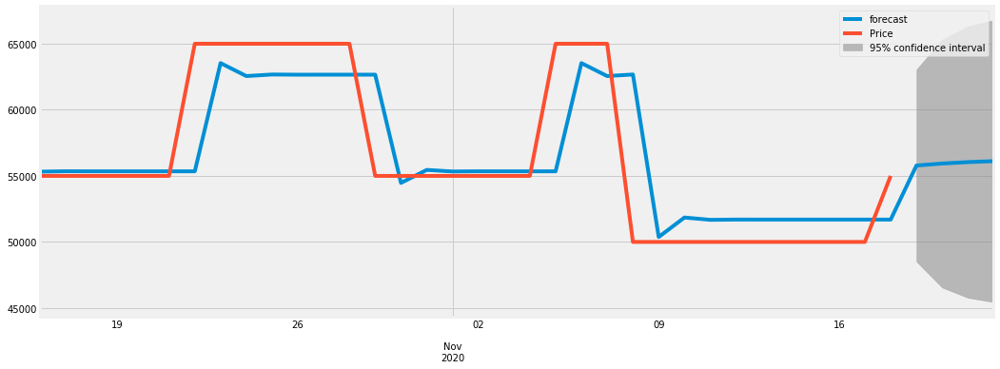

0.9339138358227409
2020-10-16    55312.039134
2020-10-17    55340.796051
2020-10-18    55337.041052
2020-10-19    55337.486408
2020-10-20    55337.432947
2020-10-21    55337.439355
2020-10-22    55337.438587
2020-10-23    63534.983350
2020-10-24    62552.204584
2020-10-25    62670.026948
2020-10-26    62655.901582
2020-10-27    62657.595029
2020-10-28    62657.392007
2020-10-29    62657.416347
2020-10-30    54459.868759
2020-10-31    55442.647863
2020-11-01    55324.825458
2020-11-02    55338.950829
2020-11-03    55337.257381
2020-11-04    55337.460403
2020-11-05    55337.436064
2020-11-06    63534.983652
2020-11-07    62552.204548
2020-11-08    62670.026952
2020-11-09    50363.679254
2020-11-10    51839.049935
2020-11-11    51662.172221
2020-11-12    51683.377554
2020-11-13    51680.835311
2020-11-14    51681.140092
2020-11-15    51681.103553
2020-11-16    51681.107934
2020-11-17    51681.107408
2020-11-18    51681.107471
2020-11-19    55775.785121
2020-11-20    55928.393999
2020-11-2

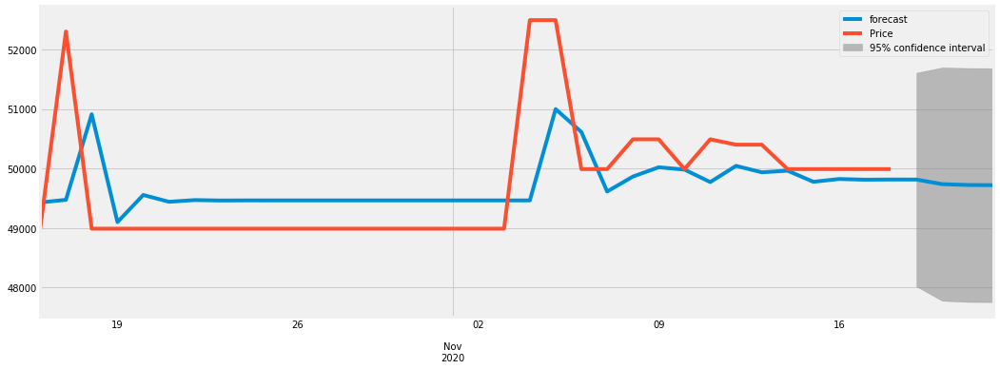

0.6256344127860411
2020-10-16    49430.543516
2020-10-17    49473.964442
2020-10-18    50910.685023
2020-10-19    49100.867945
2020-10-20    49555.666929
2020-10-21    49441.372926
2020-10-22    49470.095733
2020-10-23    49462.877503
2020-10-24    49464.691492
2020-10-25    49464.235624
2020-10-26    49464.350187
2020-10-27    49464.321397
2020-10-28    49464.328632
2020-10-29    49464.326813
2020-10-30    49464.327270
2020-10-31    49464.327156
2020-11-01    49464.327184
2020-11-02    49464.327177
2020-11-03    49464.327179
2020-11-04    49464.327179
2020-11-05    50997.223578
2020-11-06    50611.996706
2020-11-07    49613.880734
2020-11-08    49864.713794
2020-11-09    50020.663008
2020-11-10    49981.471953
2020-11-11    49772.335721
2020-11-12    50043.878221
2020-11-13    49936.220482
2020-11-14    49963.275575
2020-11-15    49776.908589
2020-11-16    49823.743829
2020-11-17    49811.973828
2020-11-18    49814.931706
2020-11-19    49814.188372
2020-11-20    49737.374888
2020-11-2

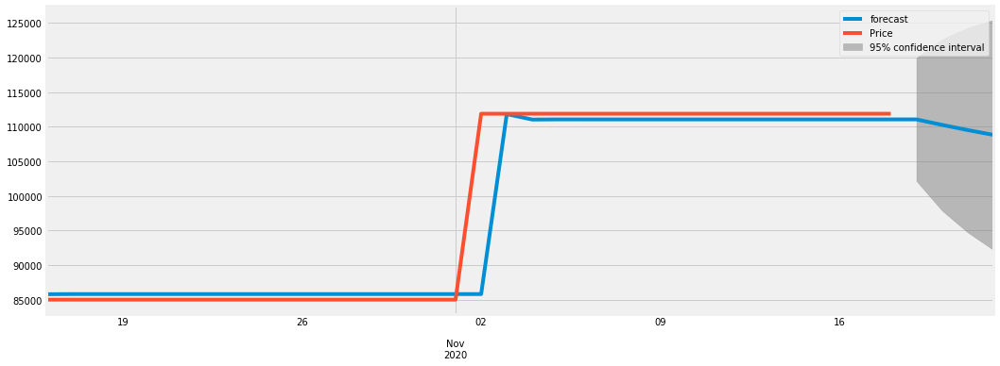

0.9964404867655331
2020-10-16     85784.456427
2020-10-17     85806.832979
2020-10-18     85806.136656
2020-10-19     85806.157707
2020-10-20     85806.157070
2020-10-21     85806.157090
2020-10-22     85806.157089
2020-10-23     85806.157089
2020-10-24     85806.157089
2020-10-25     85806.157089
2020-10-26     85806.157089
2020-10-27     85806.157089
2020-10-28     85806.157089
2020-10-29     85806.157089
2020-10-30     85806.157089
2020-10-31     85806.157089
2020-11-01     85806.157089
2020-11-02     85806.157089
2020-11-03    111835.039715
2020-11-04    111047.470313
2020-11-05    111071.300209
2020-11-06    111070.579175
2020-11-07    111070.600992
2020-11-08    111070.600332
2020-11-09    111070.600352
2020-11-10    111070.600351
2020-11-11    111070.600351
2020-11-12    111070.600351
2020-11-13    111070.600351
2020-11-14    111070.600351
2020-11-15    111070.600351
2020-11-16    111070.600351
2020-11-17    111070.600351
2020-11-18    111070.600351
2020-11-19    111070.600351
2

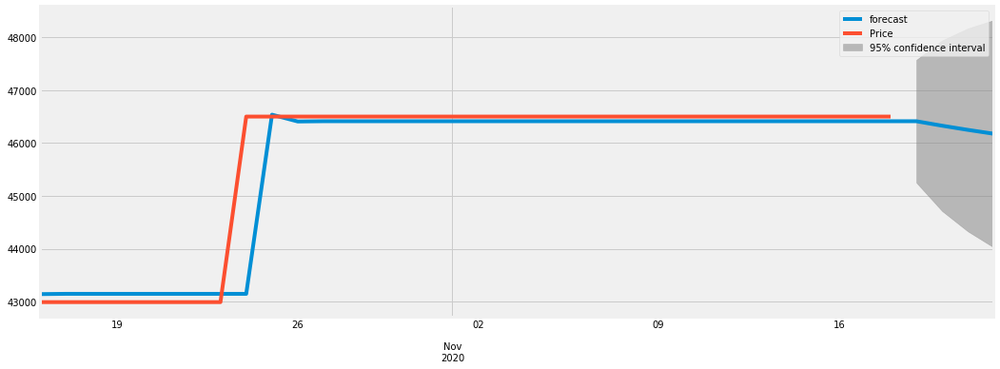

0.9949672109474592
2020-10-16    43141.429120
2020-10-17    43146.786535
2020-10-18    43146.575850
2020-10-19    43146.583841
2020-10-20    43146.583538
2020-10-21    43146.583549
2020-10-22    43146.583549
2020-10-23    43146.583549
2020-10-24    43146.583549
2020-10-25    46536.103055
2020-10-26    46407.361570
2020-10-27    46412.251458
2020-10-28    46412.065729
2020-10-29    46412.072783
2020-10-30    46412.072515
2020-10-31    46412.072526
2020-11-01    46412.072525
2020-11-02    46412.072525
2020-11-03    46412.072525
2020-11-04    46412.072525
2020-11-05    46412.072525
2020-11-06    46412.072525
2020-11-07    46412.072525
2020-11-08    46412.072525
2020-11-09    46412.072525
2020-11-10    46412.072525
2020-11-11    46412.072525
2020-11-12    46412.072525
2020-11-13    46412.072525
2020-11-14    46412.072525
2020-11-15    46412.072525
2020-11-16    46412.072525
2020-11-17    46412.072525
2020-11-18    46412.072525
2020-11-19    46412.072525
2020-11-20    46327.163155
2020-11-2

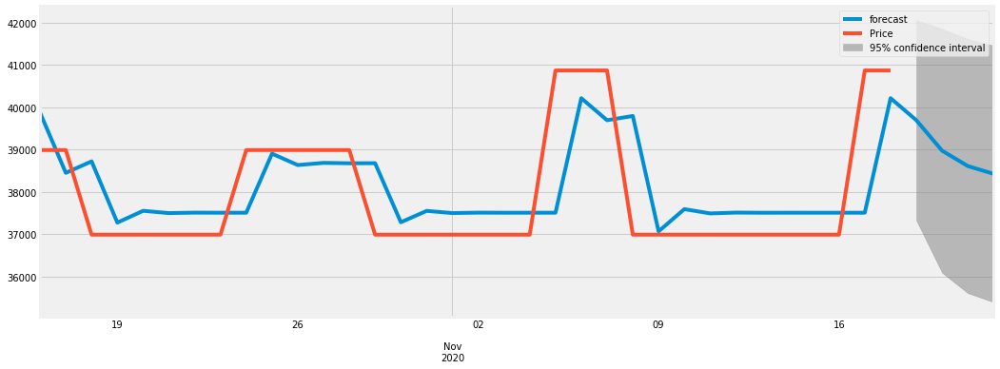

0.8473774005044137
2020-10-16    39875.248700
2020-10-17    38450.855840
2020-10-18    38722.583429
2020-10-19    37275.128480
2020-10-20    37553.805783
2020-10-21    37500.150970
2020-10-22    37510.481327
2020-10-23    37508.492385
2020-10-24    37508.875323
2020-10-25    38904.001956
2020-10-26    38635.393045
2020-10-27    38687.109316
2020-10-28    38677.152190
2020-10-29    38679.069273
2020-10-30    37283.499808
2020-10-31    37552.193980
2020-11-01    37500.461293
2020-11-02    37510.421579
2020-11-03    37508.503889
2020-11-04    37508.873109
2020-11-05    37508.802021
2020-11-06    40216.202009
2020-11-07    39694.936235
2020-11-08    39795.297471
2020-11-09    37068.588248
2020-11-10    37593.571701
2020-11-11    37492.494687
2020-11-12    37511.955420
2020-11-13    37508.208573
2020-11-14    37508.929967
2020-11-15    37508.791074
2020-11-16    37508.817816
2020-11-17    37508.812667
2020-11-18    40216.199960
2020-11-19    39694.936630
2020-11-20    38974.875375
2020-11-2

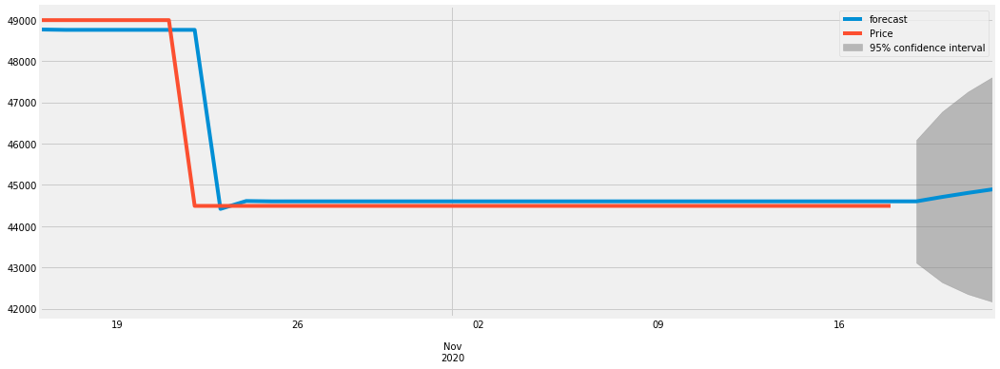

0.9936441249992803
2020-10-16    48763.157286
2020-10-17    48753.920698
2020-10-18    48754.344094
2020-10-19    48754.325479
2020-10-20    48754.326299
2020-10-21    48754.326263
2020-10-22    48754.326265
2020-10-23    44417.391748
2020-10-24    44608.415495
2020-10-25    44600.001701
2020-10-26    44600.372293
2020-10-27    44600.355970
2020-10-28    44600.356689
2020-10-29    44600.356658
2020-10-30    44600.356659
2020-10-31    44600.356659
2020-11-01    44600.356659
2020-11-02    44600.356659
2020-11-03    44600.356659
2020-11-04    44600.356659
2020-11-05    44600.356659
2020-11-06    44600.356659
2020-11-07    44600.356659
2020-11-08    44600.356659
2020-11-09    44600.356659
2020-11-10    44600.356659
2020-11-11    44600.356659
2020-11-12    44600.356659
2020-11-13    44600.356659
2020-11-14    44600.356659
2020-11-15    44600.356659
2020-11-16    44600.356659
2020-11-17    44600.356659
2020-11-18    44600.356659
2020-11-19    44600.356659
2020-11-20    44706.714349
2020-11-2

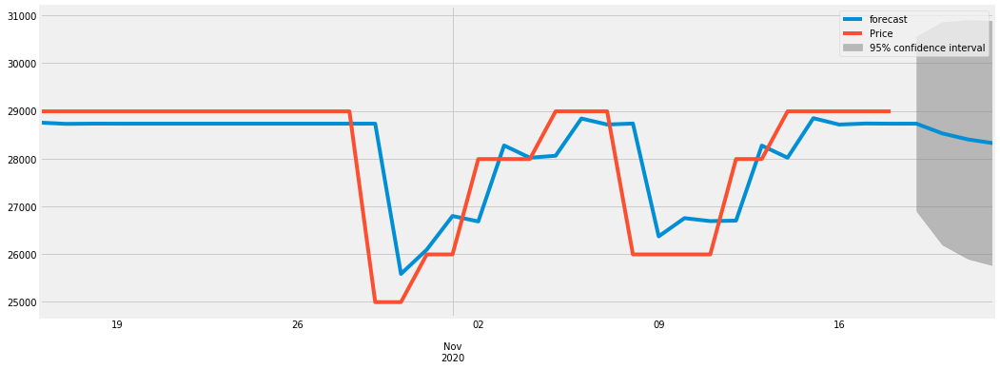

0.9063254411247077
2020-10-16    28753.995880
2020-10-17    28727.457175
2020-10-18    28732.219761
2020-10-19    28731.465159
2020-10-20    28731.587288
2020-10-21    28731.567589
2020-10-22    28731.570768
2020-10-23    28731.570255
2020-10-24    28731.570338
2020-10-25    28731.570324
2020-10-26    28731.570326
2020-10-27    28731.570326
2020-10-28    28731.570326
2020-10-29    28731.570326
2020-10-30    25581.636566
2020-10-31    26089.949003
2020-11-01    26795.404834
2020-11-02    26681.563719
2020-11-03    28274.901415
2020-11-04    28017.780654
2020-11-05    28059.272854
2020-11-06    28840.060597
2020-11-07    28714.062989
2020-11-08    28734.395528
2020-11-09    26368.664097
2020-11-10    26750.427905
2020-11-11    26688.821755
2020-11-12    26698.763288
2020-11-13    28272.125879
2020-11-14    28018.228549
2020-11-15    28846.684016
2020-11-16    28712.994151
2020-11-17    28734.568008
2020-11-18    28731.086583
2020-11-19    28731.648389
2020-11-20    28528.110114
2020-11-2

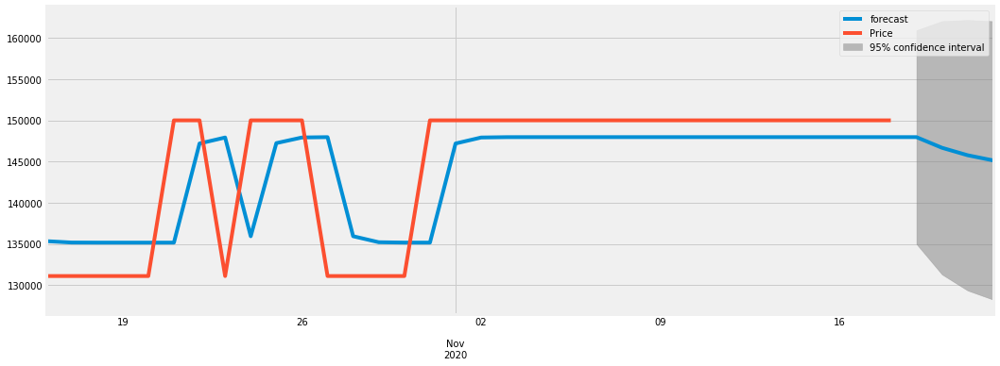

0.8857177946802649
2020-10-16    135330.306960
2020-10-17    135160.333000
2020-10-18    135150.456332
2020-10-19    135149.859911
2020-10-20    135149.823812
2020-10-21    135149.821627
2020-10-22    147186.944001
2020-10-23    147915.596846
2020-10-24    135922.582471
2020-10-25    147233.722157
2020-10-26    147918.428506
2020-10-27    147959.876388
2020-10-28    135925.262880
2020-10-29    135196.761906
2020-10-30    135152.662969
2020-10-31    135149.993492
2020-11-01    147186.954404
2020-11-02    147915.597476
2020-11-03    147959.705015
2020-11-04    147962.375012
2020-11-05    147962.536638
2020-11-06    147962.546421
2020-11-07    147962.547014
2020-11-08    147962.547049
2020-11-09    147962.547052
2020-11-10    147962.547052
2020-11-11    147962.547052
2020-11-12    147962.547052
2020-11-13    147962.547052
2020-11-14    147962.547052
2020-11-15    147962.547052
2020-11-16    147962.547052
2020-11-17    147962.547052
2020-11-18    147962.547052
2020-11-19    147962.547052
2

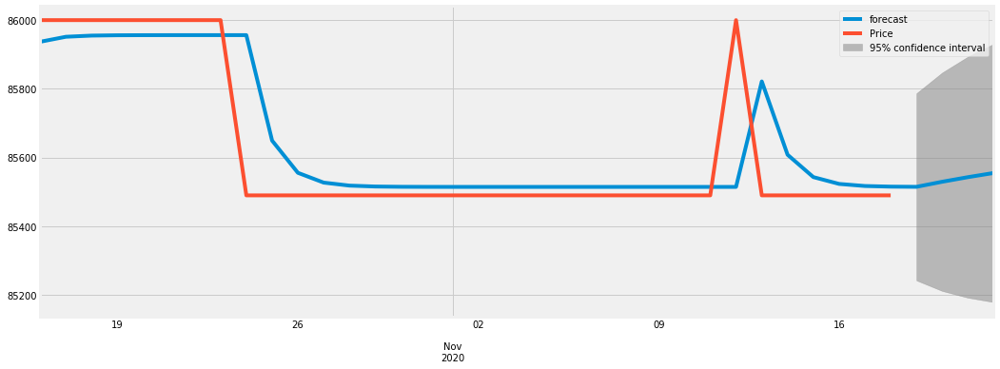

0.9394010733601132
2020-10-16    85936.111696
2020-10-17    85950.678709
2020-10-18    85954.074137
2020-10-19    85955.036540
2020-10-20    85955.323789
2020-10-21    85955.410831
2020-10-22    85955.437328
2020-10-23    85955.445405
2020-10-24    85955.447868
2020-10-25    85649.018189
2020-10-26    85555.551766
2020-10-27    85527.042870
2020-10-28    85518.347157
2020-10-29    85515.694812
2020-10-30    85514.885800
2020-10-31    85514.639037
2020-11-01    85514.563770
2020-11-02    85514.540813
2020-11-03    85514.533810
2020-11-04    85514.531674
2020-11-05    85514.531023
2020-11-06    85514.530824
2020-11-07    85514.530763
2020-11-08    85514.530745
2020-11-09    85514.530739
2020-11-10    85514.530737
2020-11-11    85514.530737
2020-11-12    85514.530737
2020-11-13    85820.961168
2020-11-14    85607.997388
2020-11-15    85543.039703
2020-11-16    85523.226471
2020-11-17    85517.183088
2020-11-18    85515.339750
2020-11-19    85514.777500
2020-11-20    85529.522664
2020-11-2

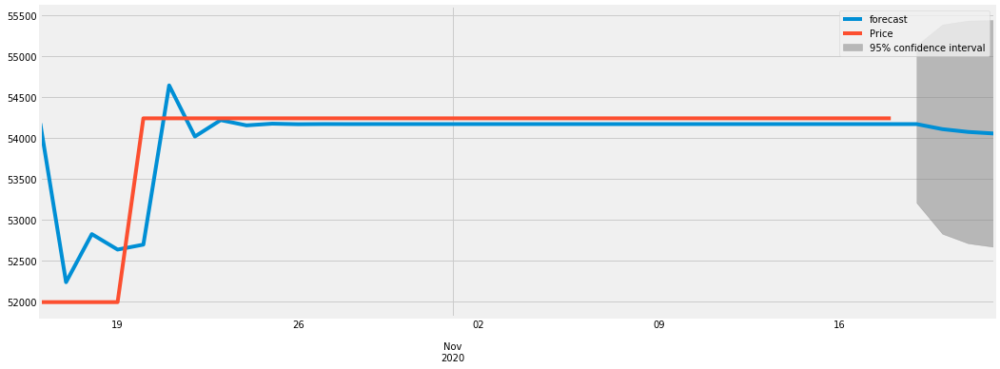

0.8876462929640903
2020-10-16    54176.643920
2020-10-17    52233.573644
2020-10-18    52821.886726
2020-10-19    52632.704396
2020-10-20    52693.320042
2020-10-21    54640.764087
2020-10-22    54015.415866
2020-10-23    54216.223729
2020-10-24    54151.741557
2020-10-25    54172.447672
2020-10-26    54165.798653
2020-10-27    54167.933745
2020-10-28    54167.248137
2020-10-29    54167.468295
2020-10-30    54167.397600
2020-10-31    54167.420301
2020-11-01    54167.413011
2020-11-02    54167.415352
2020-11-03    54167.414600
2020-11-04    54167.414842
2020-11-05    54167.414764
2020-11-06    54167.414789
2020-11-07    54167.414781
2020-11-08    54167.414784
2020-11-09    54167.414783
2020-11-10    54167.414783
2020-11-11    54167.414783
2020-11-12    54167.414783
2020-11-13    54167.414783
2020-11-14    54167.414783
2020-11-15    54167.414783
2020-11-16    54167.414783
2020-11-17    54167.414783
2020-11-18    54167.414783
2020-11-19    54167.414783
2020-11-20    54105.655137
2020-11-2

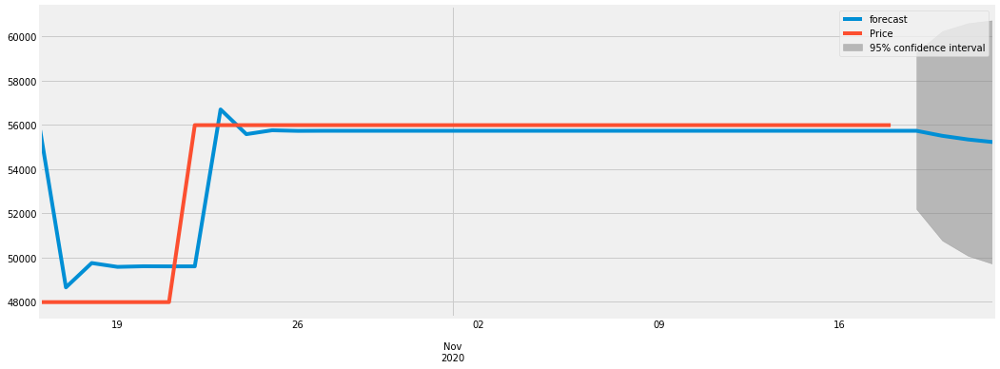

0.9485538699771177
2020-10-16    55758.135090
2020-10-17    48656.735232
2020-10-18    49756.314954
2020-10-19    49583.127453
2020-10-20    49610.396651
2020-10-21    49606.102526
2020-10-22    49606.778718
2020-10-23    56699.018174
2020-10-24    55582.206562
2020-10-25    55758.070361
2020-10-26    55730.377172
2020-10-27    55734.738005
2020-10-28    55734.051307
2020-10-29    55734.159441
2020-10-30    55734.142413
2020-10-31    55734.145094
2020-11-01    55734.144672
2020-11-02    55734.144739
2020-11-03    55734.144728
2020-11-04    55734.144730
2020-11-05    55734.144730
2020-11-06    55734.144730
2020-11-07    55734.144730
2020-11-08    55734.144730
2020-11-09    55734.144730
2020-11-10    55734.144730
2020-11-11    55734.144730
2020-11-12    55734.144730
2020-11-13    55734.144730
2020-11-14    55734.144730
2020-11-15    55734.144730
2020-11-16    55734.144730
2020-11-17    55734.144730
2020-11-18    55734.144730
2020-11-19    55734.144730
2020-11-20    55507.317969
2020-11-2

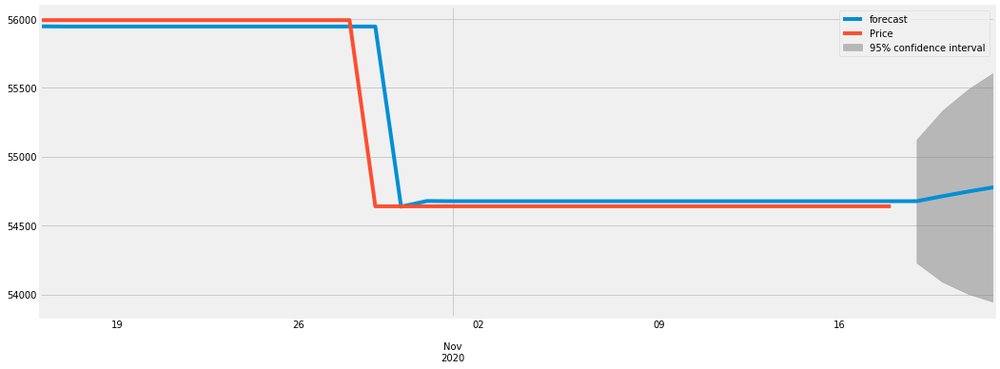

0.9962423089113172
2020-10-16    55945.042402
2020-10-17    55943.720590
2020-10-18    55943.763189
2020-10-19    55943.761856
2020-10-20    55943.761898
2020-10-21    55943.761897
2020-10-22    55943.761897
2020-10-23    55943.761897
2020-10-24    55943.761897
2020-10-25    55943.761897
2020-10-26    55943.761897
2020-10-27    55943.761897
2020-10-28    55943.761897
2020-10-29    55943.761897
2020-10-30    54636.529726
2020-10-31    54677.455295
2020-11-01    54676.174036
2020-11-02    54676.214149
2020-11-03    54676.212893
2020-11-04    54676.212932
2020-11-05    54676.212931
2020-11-06    54676.212931
2020-11-07    54676.212931
2020-11-08    54676.212931
2020-11-09    54676.212931
2020-11-10    54676.212931
2020-11-11    54676.212931
2020-11-12    54676.212931
2020-11-13    54676.212931
2020-11-14    54676.212931
2020-11-15    54676.212931
2020-11-16    54676.212931
2020-11-17    54676.212931
2020-11-18    54676.212931
2020-11-19    54676.212931
2020-11-20    54712.220289
2020-11-2

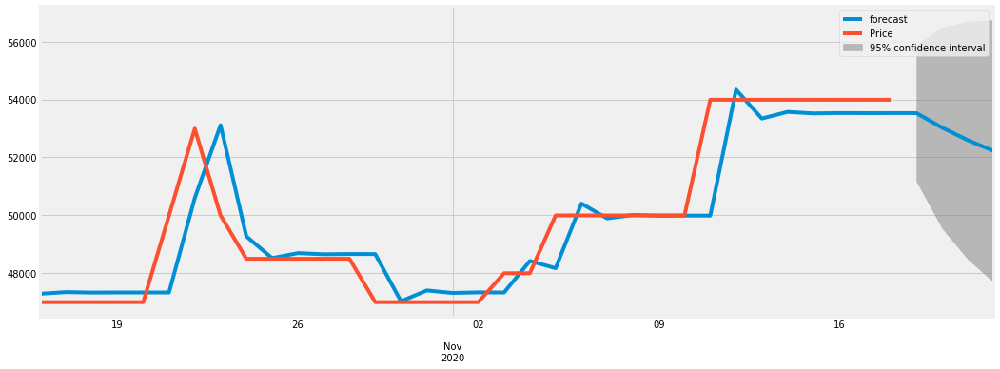

0.9828072341177333
2020-10-16    47279.557678
2020-10-17    47336.912423
2020-10-18    47321.194638
2020-10-19    47324.634052
2020-10-20    47323.837438
2020-10-21    47324.019614
2020-10-22    50591.948330
2020-10-23    53110.798393
2020-10-24    49265.421741
2020-10-25    48512.927658
2020-10-26    48685.424907
2020-10-27    48645.882668
2020-10-28    48654.947095
2020-10-29    48652.869220
2020-10-30    47019.360284
2020-10-31    47393.816114
2020-11-01    47307.978097
2020-11-02    47327.655091
2020-11-03    47323.144454
2020-11-04    48413.501949
2020-11-05    48163.554911
2020-11-06    50399.498284
2020-11-07    49886.943982
2020-11-08    50004.438868
2020-11-09    49977.505042
2020-11-10    49983.679192
2020-11-11    49982.263866
2020-11-12    54339.882322
2020-11-13    53340.967898
2020-11-14    53569.953073
2020-11-15    53517.461879
2020-11-16    53529.494647
2020-11-17    53526.736327
2020-11-18    53527.368628
2020-11-19    53527.223683
2020-11-20    53023.143790
2020-11-2

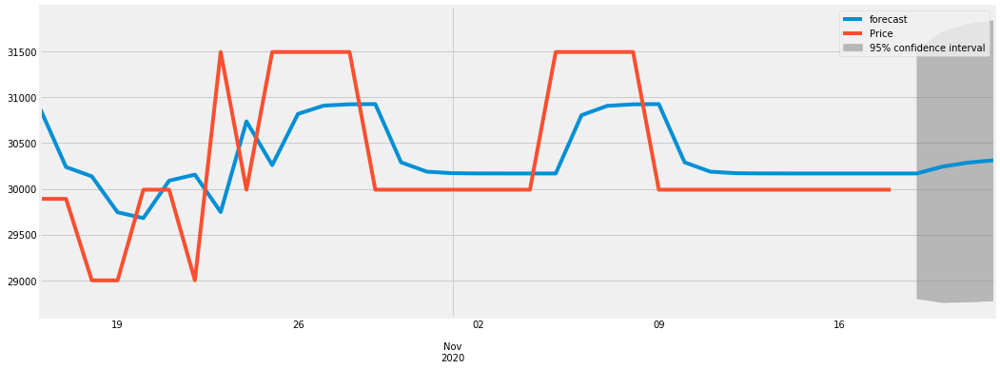

0.7024604260964538
2020-10-16    30872.564517
2020-10-17    30237.540289
2020-10-18    30136.280519
2020-10-19    29742.981300
2020-10-20    29679.734381
2020-10-21    30088.900631
2020-10-22    30154.699835
2020-10-23    29745.944036
2020-10-24    30736.381925
2020-10-25    30258.823167
2020-10-26    30818.859496
2020-10-27    30908.920551
2020-10-28    30923.403528
2020-10-29    30925.732578
2020-10-30    30289.273190
2020-10-31    30186.922323
2020-11-01    30170.462985
2020-11-02    30167.816112
2020-11-03    30167.390460
2020-11-04    30167.322010
2020-11-05    30167.311002
2020-11-06    30804.143161
2020-11-07    30906.553975
2020-11-08    30923.022953
2020-11-09    30925.671376
2020-11-10    30289.263348
2020-11-11    30186.920740
2020-11-12    30170.462731
2020-11-13    30167.816071
2020-11-14    30167.390454
2020-11-15    30167.322009
2020-11-16    30167.311002
2020-11-17    30167.309232
2020-11-18    30167.308948
2020-11-19    30167.308902
2020-11-20    30242.336353
2020-11-2

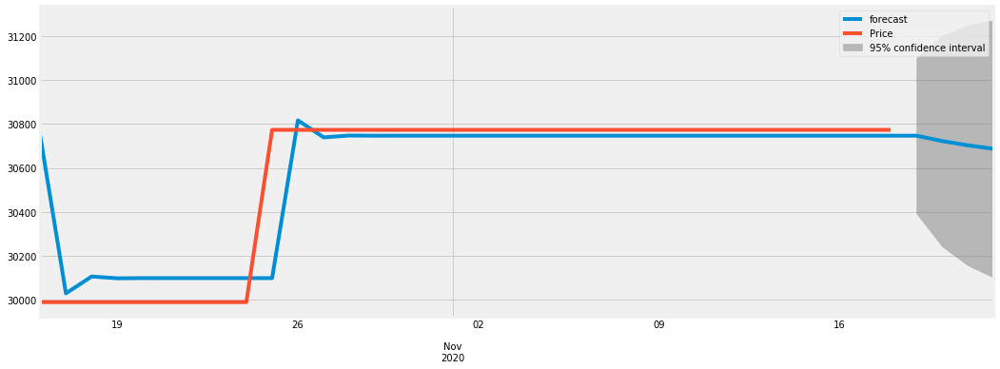

0.9711945633196637
2020-10-16    30748.443215
2020-10-17    30029.733741
2020-10-18    30106.553207
2020-10-19    30098.270702
2020-10-20    30099.163648
2020-10-21    30099.067377
2020-10-22    30099.077756
2020-10-23    30099.076637
2020-10-24    30099.076757
2020-10-25    30099.076744
2020-10-26    30816.269798
2020-10-27    30738.947292
2020-10-28    30747.283639
2020-10-29    30746.384875
2020-10-30    30746.481773
2020-10-31    30746.471326
2020-11-01    30746.472452
2020-11-02    30746.472331
2020-11-03    30746.472344
2020-11-04    30746.472343
2020-11-05    30746.472343
2020-11-06    30746.472343
2020-11-07    30746.472343
2020-11-08    30746.472343
2020-11-09    30746.472343
2020-11-10    30746.472343
2020-11-11    30746.472343
2020-11-12    30746.472343
2020-11-13    30746.472343
2020-11-14    30746.472343
2020-11-15    30746.472343
2020-11-16    30746.472343
2020-11-17    30746.472343
2020-11-18    30746.472343
2020-11-19    30746.472343
2020-11-20    30722.174193
2020-11-2

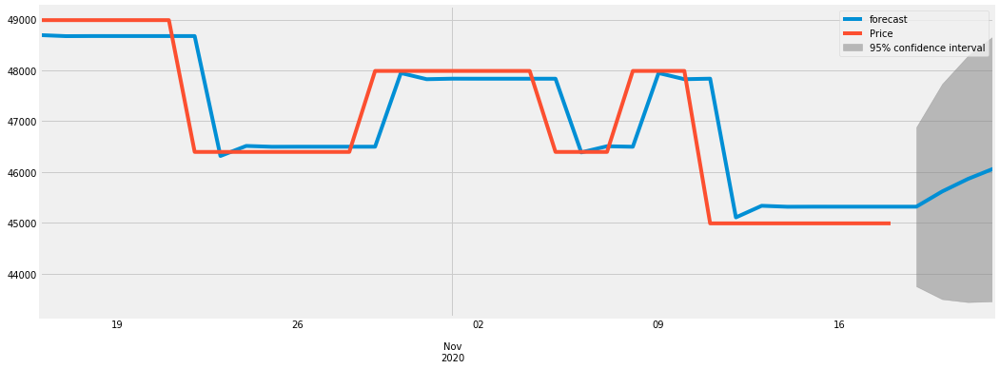

0.9761788624908355
2020-10-16    48695.623157
2020-10-17    48674.804456
2020-10-18    48676.669910
2020-10-19    48676.514715
2020-10-20    48676.527710
2020-10-21    48676.526622
2020-10-22    48676.526713
2020-10-23    46316.479732
2020-10-24    46513.990388
2020-10-25    46497.460862
2020-10-26    46498.844206
2020-10-27    46498.728435
2020-10-28    46498.738124
2020-10-29    46498.737313
2020-10-30    47948.974418
2020-10-31    47827.605105
2020-11-01    47837.762417
2020-11-02    47836.912358
2020-11-03    47836.983499
2020-11-04    47836.977545
2020-11-05    47836.978044
2020-11-06    46386.740964
2020-11-07    46508.110275
2020-11-08    46497.952964
2020-11-09    47949.040060
2020-11-10    47827.599611
2020-11-11    47837.762876
2020-11-12    45107.482513
2020-11-13    45335.977737
2020-11-14    45316.855134
2020-11-15    45318.455491
2020-11-16    45318.321558
2020-11-17    45318.332767
2020-11-18    45318.331829
2020-11-19    45318.331907
2020-11-20    45617.051533
2020-11-2

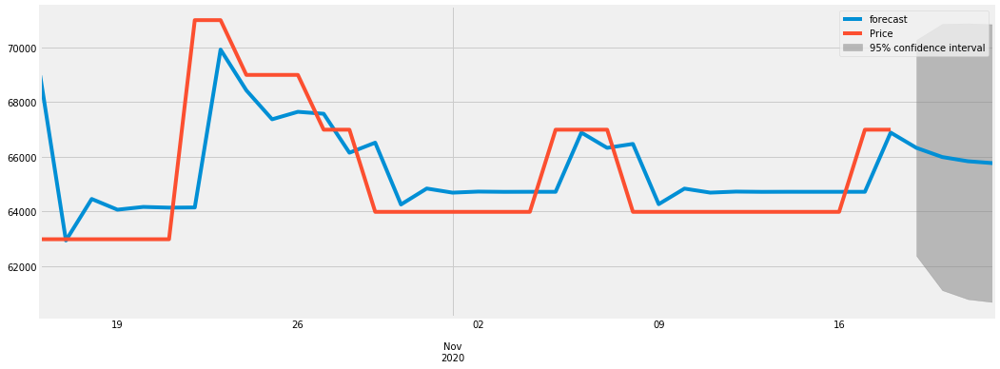

0.8351620584392939
2020-10-16    68970.969358
2020-10-17    62944.373018
2020-10-18    64460.256141
2020-10-19    64068.987842
2020-10-20    64169.954160
2020-10-21    64143.887282
2020-10-22    64150.616418
2020-10-23    69915.018223
2020-10-24    68426.912090
2020-10-25    67369.538608
2020-10-26    67642.504307
2020-10-27    67572.036989
2020-10-28    66148.693699
2020-10-29    66516.136143
2020-10-30    64258.977115
2020-10-31    64841.672824
2020-11-01    64691.247318
2020-11-02    64730.080336
2020-11-03    64720.055418
2020-11-04    64722.643396
2020-11-05    64721.975298
2020-11-06    66884.449886
2020-11-07    66326.197388
2020-11-08    66470.312770
2020-11-09    64270.806623
2020-11-10    64838.618984
2020-11-11    64692.035680
2020-11-12    64729.876816
2020-11-13    64720.107958
2020-11-14    64722.629832
2020-11-15    64721.978799
2020-11-16    64722.146866
2020-11-17    64722.103479
2020-11-18    66884.416795
2020-11-19    66326.205931
2020-11-20    65991.869458
2020-11-2

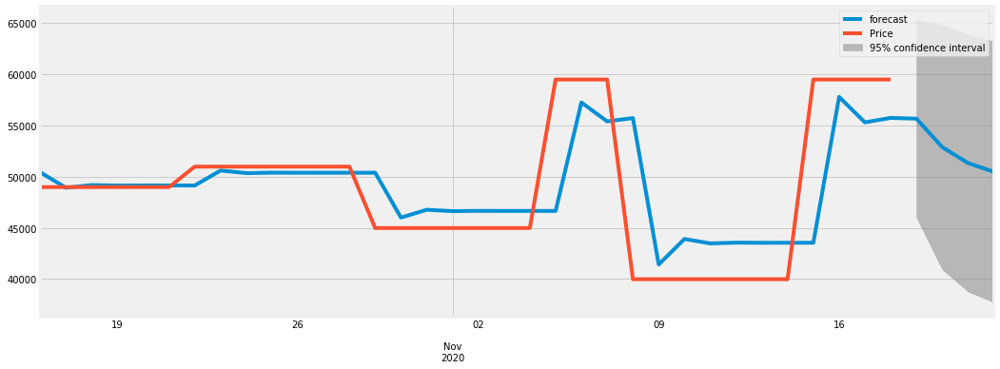

0.8743101724163109
2020-10-16    50443.444613
2020-10-17    48925.990339
2020-10-18    49187.141033
2020-10-19    49141.632360
2020-10-20    49149.563236
2020-10-21    49148.181029
2020-10-22    49148.421920
2020-10-23    50608.872427
2020-10-24    50354.344179
2020-10-25    50398.703525
2020-10-26    50390.972549
2020-10-27    50392.319909
2020-10-28    50392.085090
2020-10-29    50392.126014
2020-10-30    46010.641414
2020-10-31    46774.249352
2020-11-01    46641.167273
2020-11-02    46664.360903
2020-11-03    46660.318702
2020-11-04    46661.023179
2020-11-05    46660.900402
2020-11-06    57256.794810
2020-11-07    55410.135556
2020-11-08    55731.972512
2020-11-09    41428.778329
2020-11-10    43921.548158
2020-11-11    43487.106638
2020-11-12    43562.821384
2020-11-13    43549.625769
2020-11-14    43551.925510
2020-11-15    43551.524709
2020-11-16    57798.698794
2020-11-17    55315.692184
2020-11-18    55748.432163
2020-11-19    55673.013963
2020-11-20    52891.515713
2020-11-2

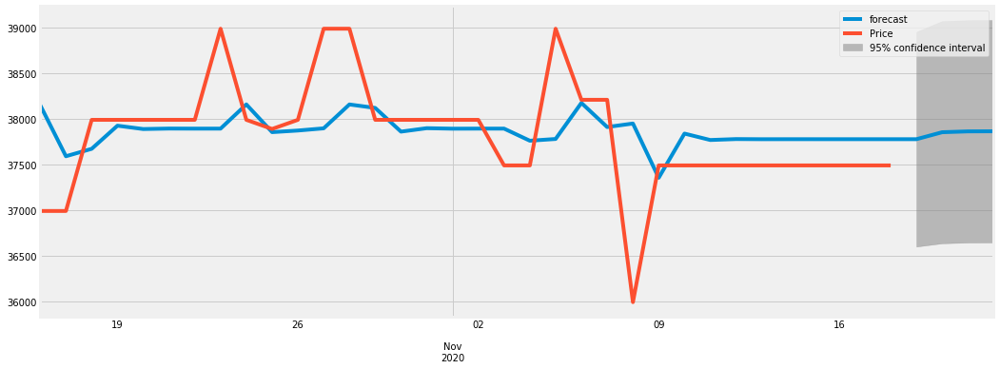

0.4447415545602038
2020-10-16    38152.621839
2020-10-17    37590.765656
2020-10-18    37672.194964
2020-10-19    37925.940060
2020-10-20    37889.058684
2020-10-21    37894.419328
2020-10-22    37893.640168
2020-10-23    37893.753417
2020-10-24    38159.320288
2020-10-25    37855.137278
2020-10-26    37872.791412
2020-10-27    37896.783747
2020-10-28    38158.879834
2020-10-29    38120.784628
2020-10-30    37860.738368
2020-10-31    37898.535636
2020-11-01    37893.041870
2020-11-02    37893.840379
2020-11-03    37893.724317
2020-11-04    37760.949521
2020-11-05    37780.248105
2020-11-06    38175.818086
2020-11-07    37911.167685
2020-11-08    37949.634156
2020-11-09    37354.448127
2020-11-10    37839.332369
2020-11-11    37768.855295
2020-11-12    37779.099014
2020-11-13    37777.610108
2020-11-14    37777.826517
2020-11-15    37777.795063
2020-11-16    37777.799635
2020-11-17    37777.798970
2020-11-18    37777.799067
2020-11-19    37777.799053
2020-11-20    37854.233686
2020-11-2

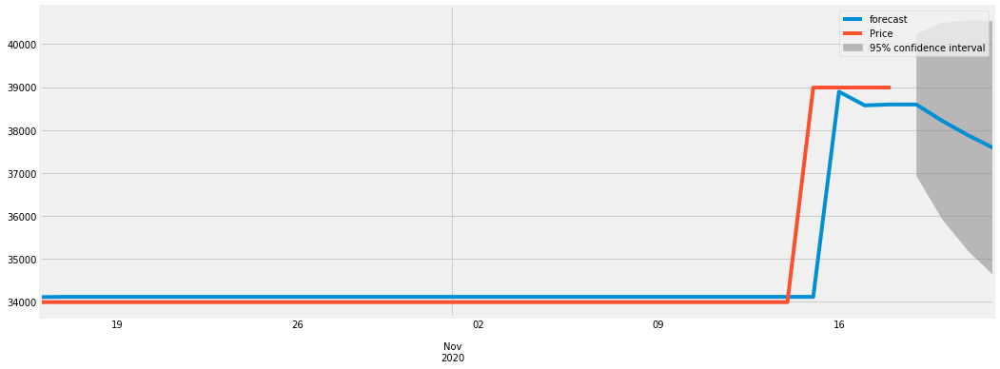

0.9891377714151259
2020-10-16    34106.526354
2020-10-17    34113.502046
2020-10-18    34113.009471
2020-10-19    34113.042158
2020-10-20    34113.039980
2020-10-21    34113.040125
2020-10-22    34113.040115
2020-10-23    34113.040116
2020-10-24    34113.040116
2020-10-25    34113.040116
2020-10-26    34113.040116
2020-10-27    34113.040116
2020-10-28    34113.040116
2020-10-29    34113.040116
2020-10-30    34113.040116
2020-10-31    34113.040116
2020-11-01    34113.040116
2020-11-02    34113.040116
2020-11-03    34113.040116
2020-11-04    34113.040116
2020-11-05    34113.040116
2020-11-06    34113.040116
2020-11-07    34113.040116
2020-11-08    34113.040116
2020-11-09    34113.040116
2020-11-10    34113.040116
2020-11-11    34113.040116
2020-11-12    34113.040116
2020-11-13    34113.040116
2020-11-14    34113.040116
2020-11-15    34113.040116
2020-11-16    38892.908094
2020-11-17    38574.445644
2020-11-18    38595.663455
2020-11-19    38594.249801
2020-11-20    38216.017247
2020-11-2

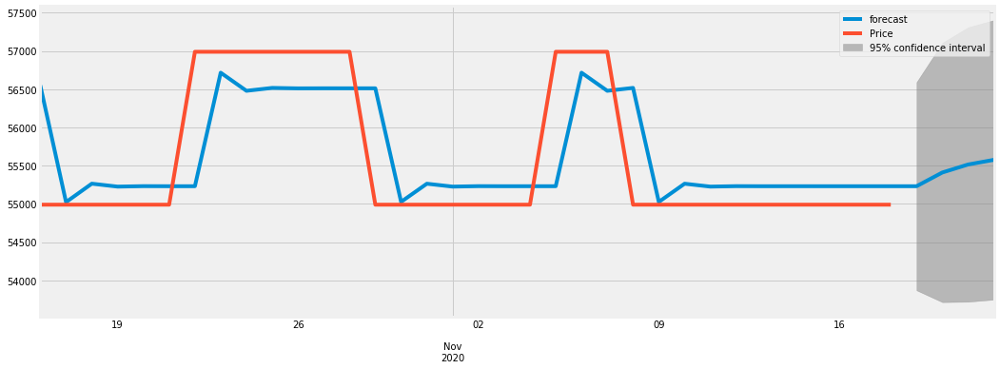

0.8840795171334982
2020-10-16    56551.447290
2020-10-17    55023.821402
2020-10-18    55264.734223
2020-10-19    55226.290232
2020-10-20    55232.424466
2020-10-21    55231.445612
2020-10-22    55231.601809
2020-10-23    56716.517904
2020-10-24    56479.568092
2020-10-25    56517.378453
2020-10-26    56511.345009
2020-10-27    56512.307773
2020-10-28    56512.154144
2020-10-29    56512.178659
2020-10-30    55027.233727
2020-10-31    55264.188140
2020-11-01    55226.377045
2020-11-02    55232.410606
2020-11-03    55231.447824
2020-11-04    55231.601456
2020-11-05    55231.576941
2020-11-06    56716.521872
2020-11-07    56479.567459
2020-11-08    56517.378554
2020-11-09    55026.403974
2020-11-10    55264.320545
2020-11-11    55226.355917
2020-11-12    55232.413978
2020-11-13    55231.447286
2020-11-14    55231.601542
2020-11-15    55231.576927
2020-11-16    55231.580855
2020-11-17    55231.580228
2020-11-18    55231.580328
2020-11-19    55231.580312
2020-11-20    55410.946572
2020-11-2

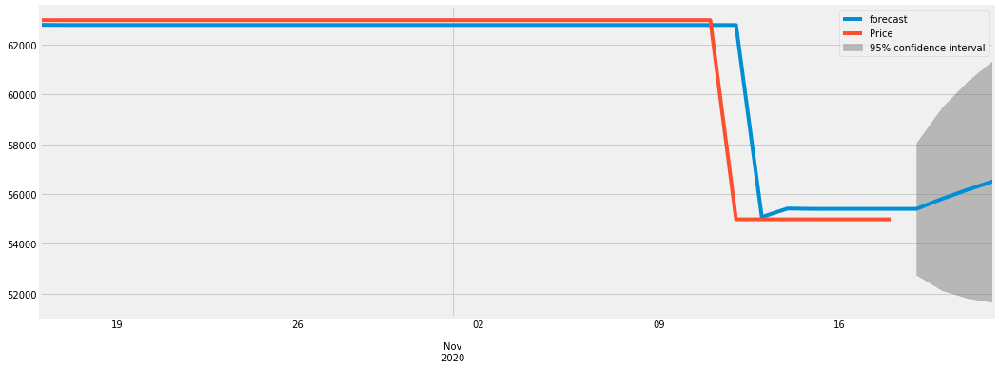

0.9939949858327193
2020-10-16    62800.756339
2020-10-17    62793.044157
2020-10-18    62793.397998
2020-10-19    62793.382427
2020-10-20    62793.383114
2020-10-21    62793.383083
2020-10-22    62793.383085
2020-10-23    62793.383085
2020-10-24    62793.383085
2020-10-25    62793.383085
2020-10-26    62793.383085
2020-10-27    62793.383085
2020-10-28    62793.383085
2020-10-29    62793.383085
2020-10-30    62793.383085
2020-10-31    62793.383085
2020-11-01    62793.383085
2020-11-02    62793.383085
2020-11-03    62793.383085
2020-11-04    62793.383085
2020-11-05    62793.383085
2020-11-06    62793.383085
2020-11-07    62793.383085
2020-11-08    62793.383085
2020-11-09    62793.383085
2020-11-10    62793.383085
2020-11-11    62793.383085
2020-11-12    62793.383085
2020-11-13    55083.196915
2020-11-14    55423.095837
2020-11-15    55408.111598
2020-11-16    55408.772169
2020-11-17    55408.743048
2020-11-18    55408.744332
2020-11-19    55408.744275
2020-11-20    55812.318817
2020-11-2

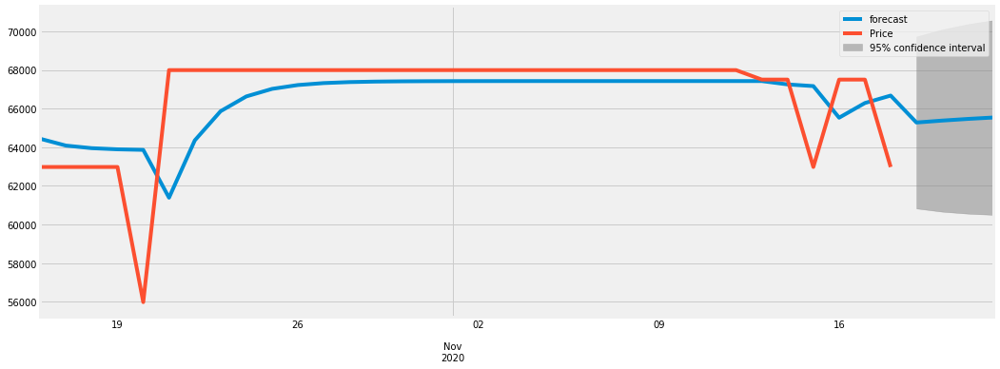

0.6968969972375244
2020-10-16    64439.640703
2020-10-17    64085.933323
2020-10-18    63952.235771
2020-10-19    63892.737602
2020-10-20    63864.357317
2020-10-21    61391.369162
2020-10-22    64354.977191
2020-10-23    65862.360229
2020-10-24    66629.154167
2020-10-25    67019.228957
2020-10-26    67217.665244
2020-10-27    67318.612731
2020-10-28    67369.966264
2020-10-29    67396.090602
2020-10-30    67409.380459
2020-10-31    67416.141216
2020-11-01    67419.580519
2020-11-02    67421.330146
2020-11-03    67422.220209
2020-11-04    67422.672998
2020-11-05    67422.903338
2020-11-06    67423.020516
2020-11-07    67423.080127
2020-11-08    67423.110451
2020-11-09    67423.125878
2020-11-10    67423.133726
2020-11-11    67423.137718
2020-11-12    67423.139749
2020-11-13    67422.789114
2020-11-14    67250.293453
2020-11-15    67162.542215
2020-11-16    65528.362724
2020-11-17    66286.569150
2020-11-18    66672.280604
2020-11-19    65278.958983
2020-11-20    65378.976330
2020-11-2

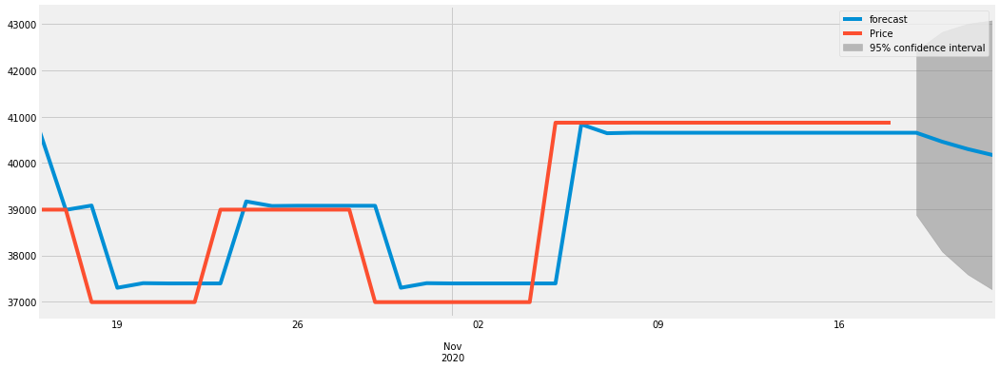

0.9743845484247182
2020-10-16    40662.509547
2020-10-17    38985.274235
2020-10-18    39078.735149
2020-10-19    37300.378698
2020-10-20    37399.695452
2020-10-21    37394.148860
2020-10-22    37394.458623
2020-10-23    37394.441324
2020-10-24    39167.579187
2020-10-25    39068.553876
2020-10-26    39074.084192
2020-10-27    39073.775337
2020-10-28    39073.792586
2020-10-29    39073.791623
2020-10-30    37300.654779
2020-10-31    37399.680033
2020-11-01    37394.149721
2020-11-02    37394.458575
2020-11-03    37394.441326
2020-11-04    37394.442290
2020-11-05    37394.442236
2020-11-06    40835.214388
2020-11-07    40643.055876
2020-11-08    40653.787448
2020-11-09    40653.188117
2020-11-10    40653.221588
2020-11-11    40653.219719
2020-11-12    40653.219823
2020-11-13    40653.219817
2020-11-14    40653.219818
2020-11-15    40653.219818
2020-11-16    40653.219818
2020-11-17    40653.219818
2020-11-18    40653.219818
2020-11-19    40653.219818
2020-11-20    40460.142779
2020-11-2

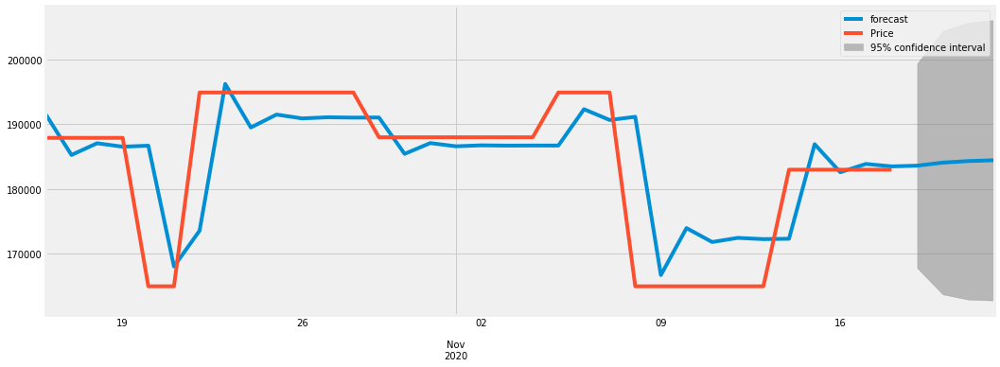

0.8689215631765342
2020-10-16    191507.590162
2020-10-17    185260.724882
2020-10-18    187068.312506
2020-10-19    186534.777269
2020-10-20    186693.109539
2020-10-21    168052.600048
2020-10-22    173582.083309
2020-10-23    196216.534689
2020-10-24    189502.278240
2020-10-25    191493.987236
2020-10-26    190903.169063
2020-10-27    191078.428659
2020-10-28    191026.439862
2020-10-29    191041.861757
2020-10-30    185429.187630
2020-10-31    187094.124565
2020-11-01    186600.239665
2020-11-02    186746.745091
2020-11-03    186703.285897
2020-11-04    186716.177580
2020-11-05    186712.353406
2020-11-06    192321.587199
2020-11-07    190657.670801
2020-11-08    191151.252970
2020-11-09    166730.126362
2020-11-10    173974.380130
2020-11-11    171825.453363
2020-11-12    172462.908427
2020-11-13    172273.814520
2020-11-14    172329.907110
2020-11-15    186921.920419
2020-11-16    182593.363056
2020-11-17    183877.381131
2020-11-18    183496.491546
2020-11-19    183609.478177
2

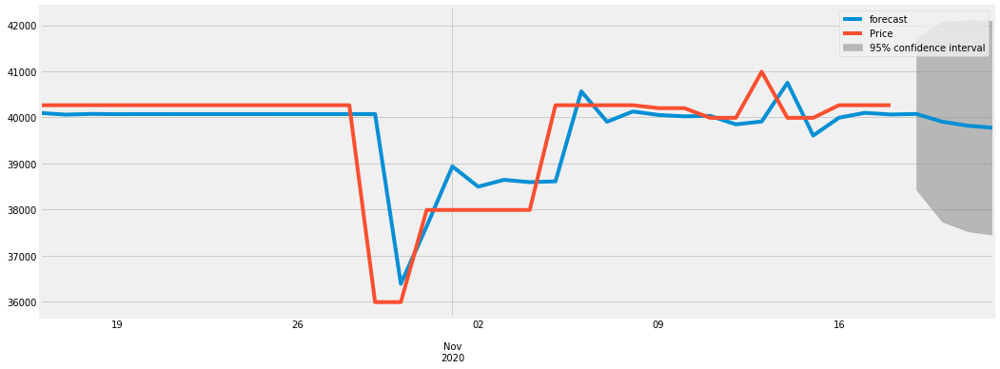

0.8756456828423976
2020-10-16    40096.517635
2020-10-17    40059.559468
2020-10-18    40074.709894
2020-10-19    40069.972998
2020-10-20    40071.613619
2020-10-21    40071.063911
2020-10-22    40071.250200
2020-10-23    40071.187310
2020-10-24    40071.208568
2020-10-25    40071.201385
2020-10-26    40071.203813
2020-10-27    40071.202993
2020-10-28    40071.203270
2020-10-29    40071.203176
2020-10-30    36388.756220
2020-10-31    37633.132550
2020-11-01    38935.816899
2020-11-02    38495.612440
2020-11-03    38644.366792
2020-11-04    38594.099565
2020-11-05    38611.085919
2020-11-06    40564.607560
2020-11-07    39904.471482
2020-11-08    40127.545356
2020-11-09    40052.163999
2020-11-10    40022.495017
2020-11-11    40032.520790
2020-11-12    39848.198414
2020-11-13    39910.484824
2020-11-14    40751.029586
2020-11-15    39605.399170
2020-11-16    39992.531799
2020-11-17    40097.787922
2020-11-18    40062.219663
2020-11-19    40074.238926
2020-11-20    39906.680617
2020-11-2

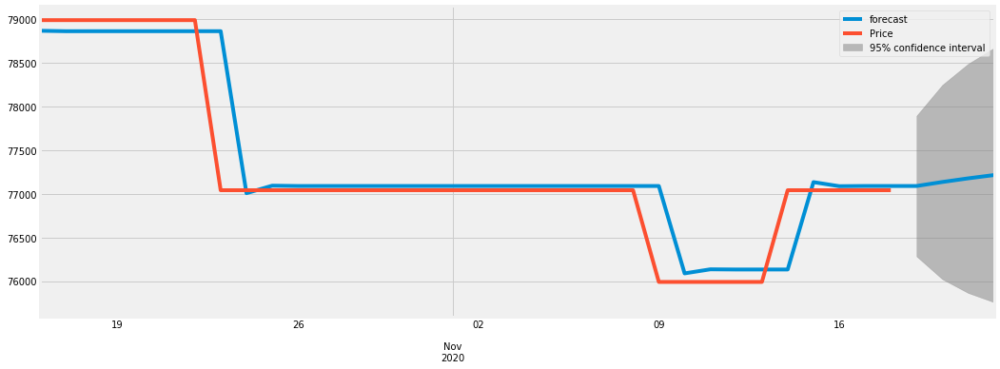

0.9916234187996442
2020-10-16    78868.185021
2020-10-17    78863.031046
2020-10-18    78863.280245
2020-10-19    78863.268708
2020-10-20    78863.269243
2020-10-21    78863.269218
2020-10-22    78863.269220
2020-10-23    78863.269220
2020-10-24    77006.925183
2020-10-25    77093.038050
2020-10-26    77089.043410
2020-10-27    77089.228716
2020-10-28    77089.220120
2020-10-29    77089.220518
2020-10-30    77089.220500
2020-10-31    77089.220501
2020-11-01    77089.220501
2020-11-02    77089.220501
2020-11-03    77089.220501
2020-11-04    77089.220501
2020-11-05    77089.220501
2020-11-06    77089.220501
2020-11-07    77089.220501
2020-11-08    77089.220501
2020-11-09    77089.220501
2020-11-10    76088.185312
2020-11-11    76134.621753
2020-11-12    76132.467640
2020-11-13    76132.567566
2020-11-14    76132.562930
2020-11-15    77133.598334
2020-11-16    77087.161883
2020-11-17    77089.315997
2020-11-18    77089.216071
2020-11-19    77089.220706
2020-11-20    77135.148772
2020-11-2

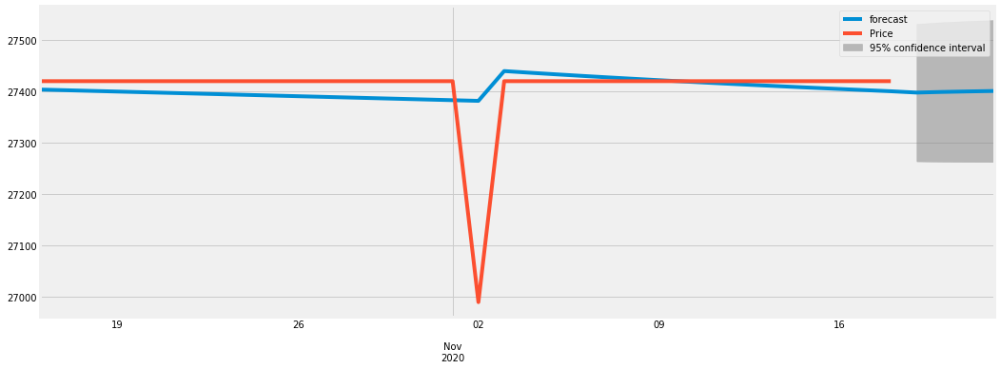

-0.21863111292111226
2020-10-16    27403.648854
2020-10-17    27402.357227
2020-10-18    27401.065600
2020-10-19    27399.773973
2020-10-20    27398.482347
2020-10-21    27397.190720
2020-10-22    27395.899093
2020-10-23    27394.607466
2020-10-24    27393.315840
2020-10-25    27392.024213
2020-10-26    27390.732586
2020-10-27    27389.440959
2020-10-28    27388.149333
2020-10-29    27386.857706
2020-10-30    27385.566079
2020-10-31    27384.274452
2020-11-01    27382.982826
2020-11-02    27381.691199
2020-11-03    27439.662198
2020-11-04    27436.437632
2020-11-05    27433.335176
2020-11-06    27430.343611
2020-11-07    27427.453055
2020-11-08    27424.654764
2020-11-09    27421.940976
2020-11-10    27419.304776
2020-11-11    27416.739984
2020-11-12    27414.241057
2020-11-13    27411.803014
2020-11-14    27409.421362
2020-11-15    27407.092040
2020-11-16    27404.811369
2020-11-17    27402.576005
2020-11-18    27400.382905
2020-11-19    27397.799654
2020-11-20    27399.024564
2020-11

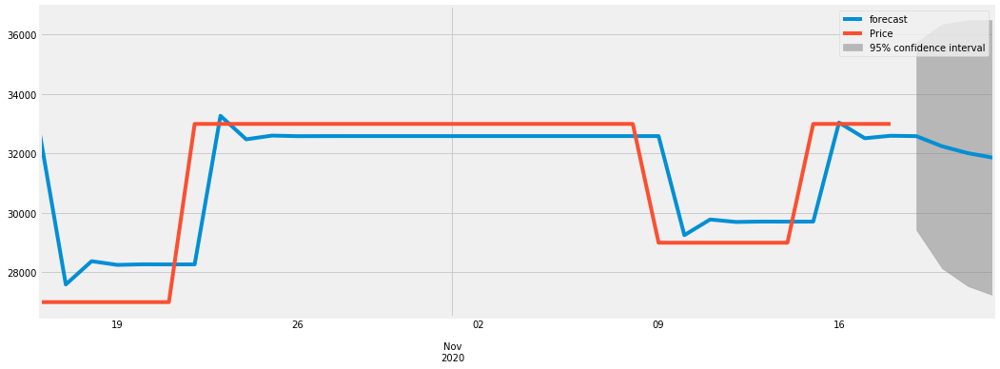

0.9279043094077203
2020-10-16    32616.519350
2020-10-17    27584.200260
2020-10-18    28367.477375
2020-10-19    28243.620612
2020-10-20    28263.198959
2020-10-21    28260.103829
2020-10-22    28260.593129
2020-10-23    33262.576075
2020-10-24    32471.825942
2020-10-25    32596.833520
2020-10-26    32577.071406
2020-10-27    32580.195546
2020-10-28    32579.701659
2020-10-29    32579.779736
2020-10-30    32579.767393
2020-10-31    32579.769344
2020-11-01    32579.769036
2020-11-02    32579.769084
2020-11-03    32579.769077
2020-11-04    32579.769078
2020-11-05    32579.769078
2020-11-06    32579.769078
2020-11-07    32579.769078
2020-11-08    32579.769078
2020-11-09    32579.769078
2020-11-10    29245.062212
2020-11-11    29772.237120
2020-11-12    29688.897446
2020-11-13    29702.072392
2020-11-14    29699.989600
2020-11-15    29700.318863
2020-11-16    33034.973677
2020-11-17    32507.806998
2020-11-18    32591.145371
2020-11-19    32577.970630
2020-11-20    32236.554097
2020-11-2

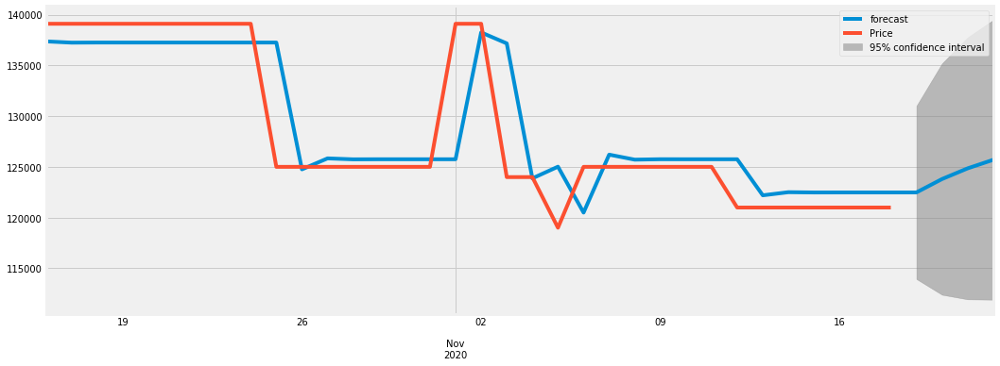

0.9684259813238667
2020-10-16    137367.994768
2020-10-17    137244.361548
2020-10-18    137255.823438
2020-10-19    137254.837541
2020-10-20    137254.922915
2020-10-21    137254.915526
2020-10-22    137254.916166
2020-10-23    137254.916110
2020-10-24    137254.916115
2020-10-25    137254.916115
2020-10-26    124752.746457
2020-10-27    125834.792115
2020-10-28    125741.142545
2020-10-29    125749.247787
2020-10-30    125748.546289
2020-10-31    125748.607003
2020-11-01    125748.601748
2020-11-02    138250.771861
2020-11-03    137168.726164
2020-11-04    123864.914576
2020-11-05    125016.341245
2020-11-06    120493.414964
2020-11-07    126203.431421
2020-11-08    125709.237318
2020-11-09    125752.009141
2020-11-10    125748.307298
2020-11-11    125748.627687
2020-11-12    125748.599958
2020-11-13    122194.029164
2020-11-14    122501.672397
2020-11-15    122475.046297
2020-11-16    122477.350749
2020-11-17    122477.151302
2020-11-18    122477.168564
2020-11-19    122477.167070
2

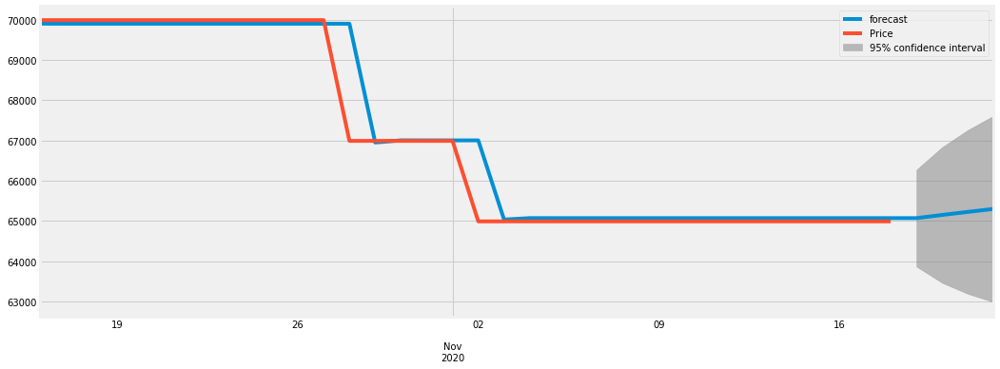

0.9988506500155392
2020-10-16    69902.016793
2020-10-17    69900.461248
2020-10-18    69900.490213
2020-10-19    69900.489683
2020-10-20    69900.489693
2020-10-21    69900.489693
2020-10-22    69900.489693
2020-10-23    69900.489693
2020-10-24    69900.489693
2020-10-25    69900.489693
2020-10-26    69900.489693
2020-10-27    69900.489693
2020-10-28    69900.489693
2020-10-29    66949.426359
2020-10-30    67003.421363
2020-10-31    67002.433427
2020-11-01    67002.451503
2020-11-02    67002.451173
2020-11-03    65035.075623
2020-11-04    65071.072292
2020-11-05    65070.413668
2020-11-06    65070.425719
2020-11-07    65070.425498
2020-11-08    65070.425502
2020-11-09    65070.425502
2020-11-10    65070.425502
2020-11-11    65070.425502
2020-11-12    65070.425502
2020-11-13    65070.425502
2020-11-14    65070.425502
2020-11-15    65070.425502
2020-11-16    65070.425502
2020-11-17    65070.425502
2020-11-18    65070.425502
2020-11-19    65070.425502
2020-11-20    65149.539086
2020-11-2

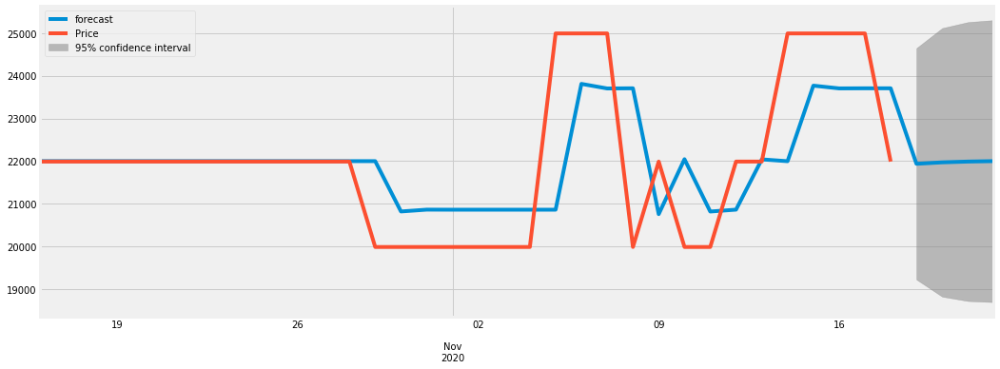

0.82055884066115
2020-10-16    21999.742512
2020-10-17    21999.947254
2020-10-18    21999.939637
2020-10-19    21999.939915
2020-10-20    21999.939905
2020-10-21    21999.939905
2020-10-22    21999.939905
2020-10-23    21999.939905
2020-10-24    21999.939905
2020-10-25    21999.939905
2020-10-26    21999.939905
2020-10-27    21999.939905
2020-10-28    21999.939905
2020-10-29    21999.939905
2020-10-30    20821.551455
2020-10-31    20864.485589
2020-11-01    20862.921301
2020-11-02    20862.978295
2020-11-03    20862.976218
2020-11-04    20862.976294
2020-11-05    20862.976291
2020-11-06    23808.947416
2020-11-07    23701.612080
2020-11-08    23705.522802
2020-11-09    20759.409192
2020-11-10    22045.138169
2020-11-11    20819.904674
2020-11-12    20864.545589
2020-11-13    22041.307564
2020-11-14    21998.432690
2020-11-15    23767.577494
2020-11-16    23703.119378
2020-11-17    23705.467884
2020-11-18    23705.382317
2020-11-19    21937.802760
2020-11-20    21971.449536
2020-11-21 

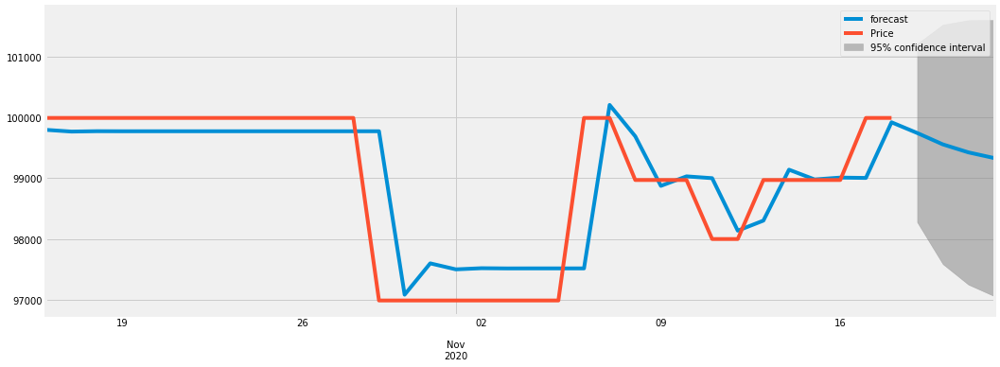

0.9411906896336
2020-10-16     99794.687503
2020-10-17     99766.203604
2020-10-18     99772.456437
2020-10-19     99771.291068
2020-10-20     99771.515709
2020-10-21     99771.472681
2020-10-22     99771.480933
2020-10-23     99771.479351
2020-10-24     99771.479654
2020-10-25     99771.479596
2020-10-26     99771.479607
2020-10-27     99771.479605
2020-10-28     99771.479605
2020-10-29     99771.479605
2020-10-30     97085.192763
2020-10-31     97600.253889
2020-11-01     97501.497510
2020-11-02     97520.432782
2020-11-03     97516.802186
2020-11-04     97517.498306
2020-11-05     97517.364834
2020-11-06     97517.390425
2020-11-07    100203.672360
2020-11-08     99688.612175
2020-11-09     98874.030848
2020-11-10     99030.216394
2020-11-11     99000.269814
2020-11-12     98137.445609
2020-11-13     98302.881109
2020-11-14     99139.727047
2020-11-15     98979.272548
2020-11-16     99010.037645
2020-11-17     99004.138831
2020-11-18     99918.607379
2020-11-19     99743.269737
2020

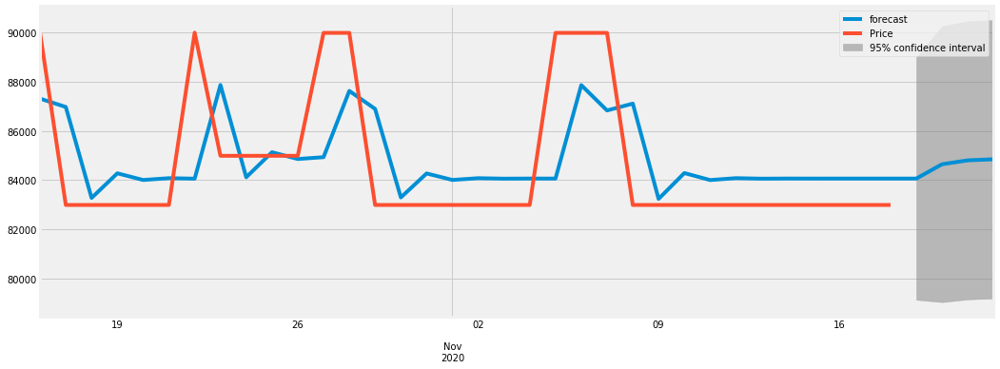

0.7111983121655081
2020-10-16    87316.204663
2020-10-17    86974.996629
2020-10-18    83276.359044
2020-10-19    84277.710281
2020-10-20    84006.232052
2020-10-21    84079.829430
2020-10-22    84059.876536
2020-10-23    87870.490780
2020-10-24    84118.007016
2020-10-25    85135.331675
2020-10-26    84859.527827
2020-10-27    84934.300184
2020-10-28    87628.542278
2020-10-29    86898.114356
2020-10-30    83295.819721
2020-10-31    84272.427054
2020-11-01    84007.661958
2020-11-02    84079.441632
2020-11-03    84059.981659
2020-11-04    84065.257394
2020-11-05    84063.827106
2020-11-06    87864.533633
2020-11-07    86834.135445
2020-11-08    87113.483618
2020-11-09    83237.431604
2020-11-10    84288.256482
2020-11-11    84003.370489
2020-11-12    84080.605079
2020-11-13    84059.666241
2020-11-14    84065.342907
2020-11-15    84063.803923
2020-11-16    84064.221152
2020-11-17    84064.108038
2020-11-18    84064.138704
2020-11-19    84064.130390
2020-11-20    84647.280913
2020-11-2

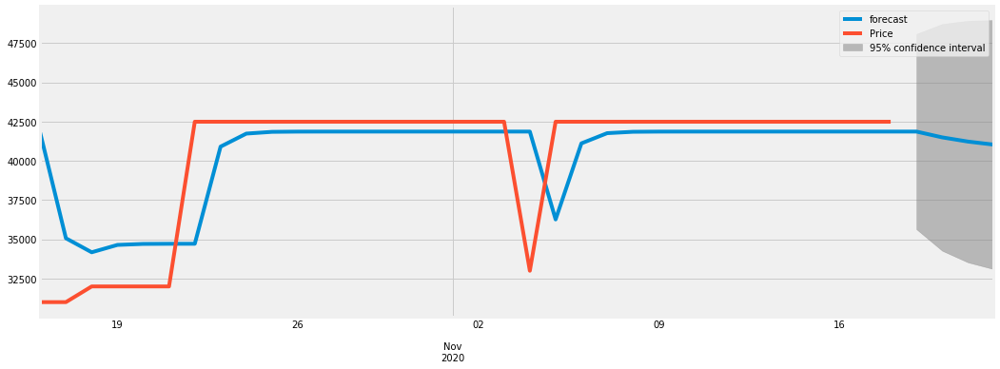

0.8718864471303194
2020-10-16    41793.714217
2020-10-17    35060.857698
2020-10-18    34167.336901
2020-10-19    34637.052392
2020-10-20    34700.149590
2020-10-21    34708.625400
2020-10-22    34709.763949
2020-10-23    40901.425903
2020-10-24    41733.146737
2020-10-25    41844.871109
2020-10-26    41859.878952
2020-10-27    41861.894943
2020-10-28    41862.165749
2020-10-29    41862.202126
2020-10-30    41862.207013
2020-10-31    41862.207669
2020-11-01    41862.207758
2020-11-02    41862.207769
2020-11-03    41862.207771
2020-11-04    41862.207771
2020-11-05    36260.366283
2020-11-06    41109.717033
2020-11-07    41761.126312
2020-11-08    41848.629582
2020-11-09    41860.383824
2020-11-10    41861.962762
2020-11-11    41862.174859
2020-11-12    41862.203350
2020-11-13    41862.207177
2020-11-14    41862.207691
2020-11-15    41862.207761
2020-11-16    41862.207770
2020-11-17    41862.207771
2020-11-18    41862.207771
2020-11-19    41862.207771
2020-11-20    41492.019081
2020-11-2

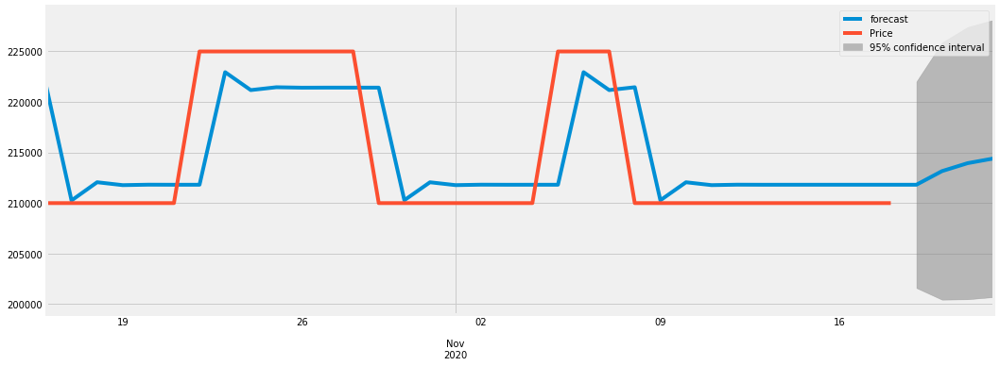

0.8841376263734626
2020-10-16    221705.510830
2020-10-17    210250.836614
2020-10-18    212053.114671
2020-10-19    211766.190762
2020-10-20    211811.865367
2020-10-21    211804.594131
2020-10-22    211805.751676
2020-10-23    222941.174287
2020-10-24    221168.466590
2020-10-25    221450.673443
2020-10-26    221405.747419
2020-10-27    221412.899434
2020-10-28    221411.760867
2020-10-29    221411.942121
2020-10-30    210276.306380
2020-10-31    212049.048007
2020-11-01    211766.835752
2020-11-02    211811.762635
2020-11-03    211804.610484
2020-11-04    211805.749073
2020-11-05    211805.567815
2020-11-06    222941.203556
2020-11-07    221168.461930
2020-11-08    221450.674185
2020-11-09    210270.140415
2020-11-10    212050.029600
2020-11-11    211766.679487
2020-11-12    211811.787512
2020-11-13    211804.606523
2020-11-14    211805.749703
2020-11-15    211805.567714
2020-11-16    211805.596686
2020-11-17    211805.592074
2020-11-18    211805.592808
2020-11-19    211805.592691
2

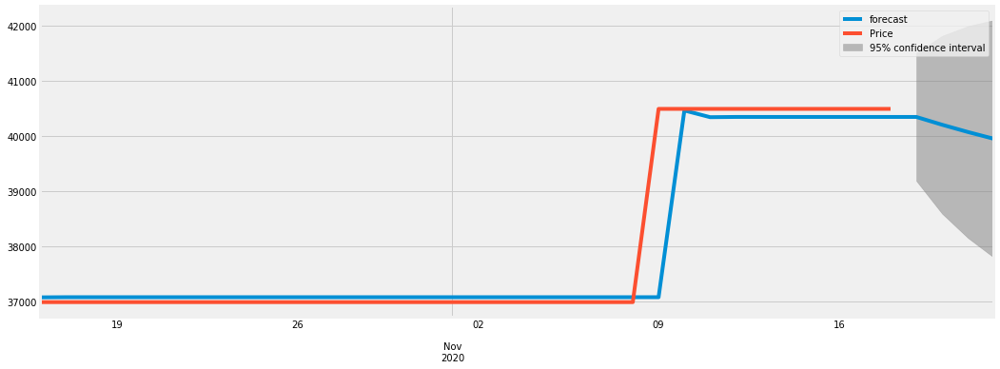

0.9955176313281617
2020-10-16    37076.314347
2020-10-17    37079.207963
2020-10-18    37079.100603
2020-10-19    37079.104453
2020-10-20    37079.104314
2020-10-21    37079.104319
2020-10-22    37079.104319
2020-10-23    37079.104319
2020-10-24    37079.104319
2020-10-25    37079.104319
2020-10-26    37079.104319
2020-10-27    37079.104319
2020-10-28    37079.104319
2020-10-29    37079.104319
2020-10-30    37079.104319
2020-10-31    37079.104319
2020-11-01    37079.104319
2020-11-02    37079.104319
2020-11-03    37079.104319
2020-11-04    37079.104319
2020-11-05    37079.104319
2020-11-06    37079.104319
2020-11-07    37079.104319
2020-11-08    37079.104319
2020-11-09    37079.104319
2020-11-10    40461.086487
2020-11-11    40339.676660
2020-11-12    40344.035153
2020-11-13    40343.878687
2020-11-14    40343.884304
2020-11-15    40343.884103
2020-11-16    40343.884110
2020-11-17    40343.884110
2020-11-18    40343.884110
2020-11-19    40343.884110
2020-11-20    40202.695157
2020-11-2

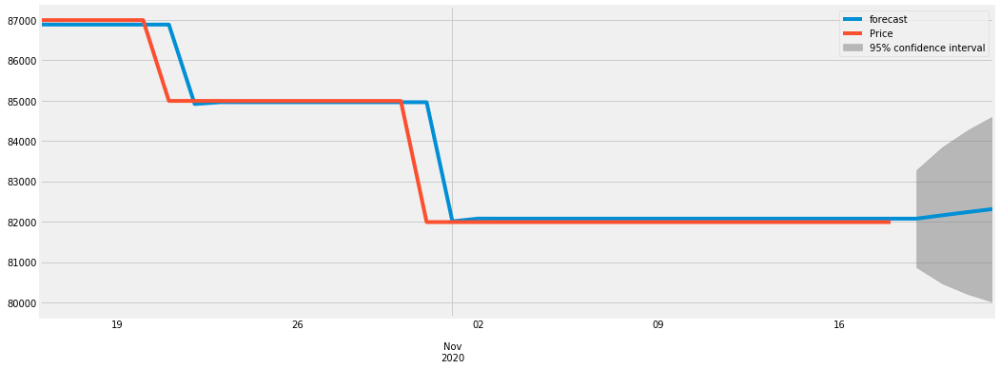

0.9984095272476639
2020-10-16    86881.741771
2020-10-17    86879.322108
2020-10-18    86879.379625
2020-10-19    86879.378288
2020-10-20    86879.378319
2020-10-21    86879.378319
2020-10-22    84912.836659
2020-10-23    84958.560877
2020-10-24    84957.497739
2020-10-25    84957.522459
2020-10-26    84957.521884
2020-10-27    84957.521897
2020-10-28    84957.521897
2020-10-29    84957.521897
2020-10-30    84957.521897
2020-10-31    84957.521897
2020-11-01    82007.709407
2020-11-02    82076.295734
2020-11-03    82074.701028
2020-11-04    82074.738107
2020-11-05    82074.737244
2020-11-06    82074.737265
2020-11-07    82074.737264
2020-11-08    82074.737264
2020-11-09    82074.737264
2020-11-10    82074.737264
2020-11-11    82074.737264
2020-11-12    82074.737264
2020-11-13    82074.737264
2020-11-14    82074.737264
2020-11-15    82074.737264
2020-11-16    82074.737264
2020-11-17    82074.737264
2020-11-18    82074.737264
2020-11-19    82074.737264
2020-11-20    82158.056944
2020-11-2

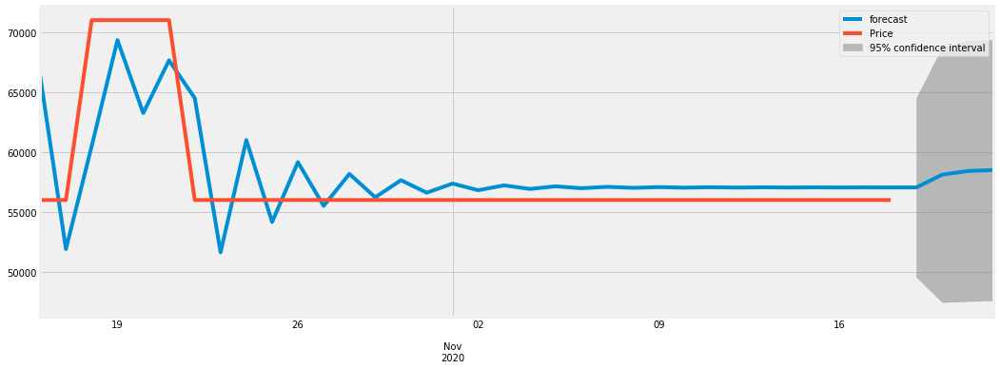

0.7283823646623586
2020-10-16    66356.555418
2020-10-17    51896.850834
2020-10-18    60484.237407
2020-10-19    69325.517437
2020-10-20    63238.161606
2020-10-21    67638.667004
2020-10-22    64485.823898
2020-10-23    51622.913977
2020-10-24    60992.085982
2020-10-25    54155.312106
2020-10-26    59147.276166
2020-10-27    55500.203262
2020-10-28    58165.053697
2020-10-29    56217.502521
2020-10-30    57640.844582
2020-10-31    56600.533947
2020-11-01    57360.881122
2020-11-02    56805.137086
2020-11-03    57211.330652
2020-11-04    56914.439237
2020-11-05    57131.438957
2020-11-06    56972.831428
2020-11-07    57088.758967
2020-11-08    57004.026277
2020-11-09    57065.958171
2020-11-10    57020.691502
2020-11-11    57053.777342
2020-11-12    57029.594562
2020-11-13    57047.269991
2020-11-14    57034.350841
2020-11-15    57043.793575
2020-11-16    57036.891786
2020-11-17    57041.936372
2020-11-18    57038.249234
2020-11-19    57040.944200
2020-11-20    58104.752316
2020-11-2

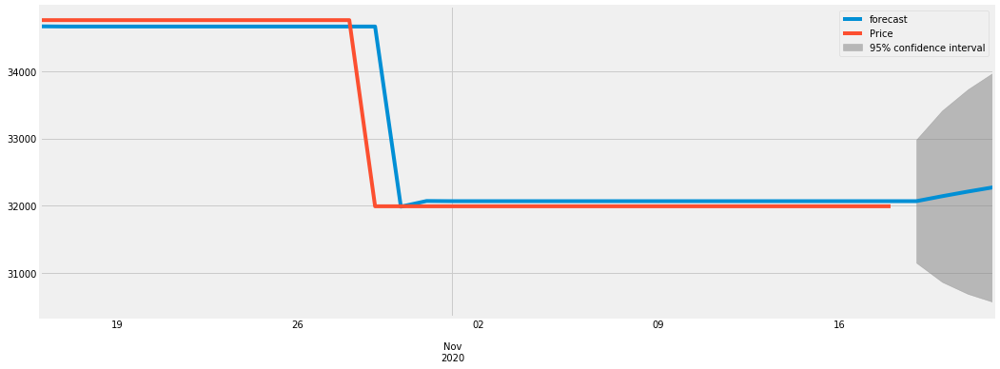

0.9962410074255064
2020-10-16    34670.464751
2020-10-17    34667.740923
2020-10-18    34667.828812
2020-10-19    34667.826060
2020-10-20    34667.826146
2020-10-21    34667.826143
2020-10-22    34667.826143
2020-10-23    34667.826143
2020-10-24    34667.826143
2020-10-25    34667.826143
2020-10-26    34667.826143
2020-10-27    34667.826143
2020-10-28    34667.826143
2020-10-29    34667.826143
2020-10-30    31984.628867
2020-10-31    32068.731716
2020-11-01    32066.095574
2020-11-02    32066.178202
2020-11-03    32066.175612
2020-11-04    32066.175693
2020-11-05    32066.175691
2020-11-06    32066.175691
2020-11-07    32066.175691
2020-11-08    32066.175691
2020-11-09    32066.175691
2020-11-10    32066.175691
2020-11-11    32066.175691
2020-11-12    32066.175691
2020-11-13    32066.175691
2020-11-14    32066.175691
2020-11-15    32066.175691
2020-11-16    32066.175691
2020-11-17    32066.175691
2020-11-18    32066.175691
2020-11-19    32066.175691
2020-11-20    32139.884456
2020-11-2

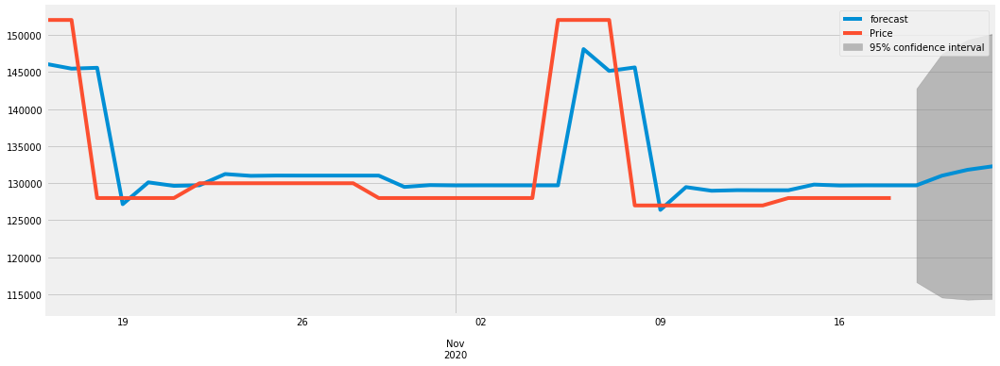

0.8941649370537295
2020-10-16    146113.633547
2020-10-17    145469.090703
2020-10-18    145583.319954
2020-10-19    127163.878221
2020-10-20    130109.050747
2020-10-21    129638.129503
2020-10-22    129713.427919
2020-10-23    131231.533104
2020-10-24    130988.794175
2020-10-25    131027.607156
2020-10-26    131021.401116
2020-10-27    131022.393437
2020-10-28    131022.234769
2020-10-29    131022.260139
2020-10-30    129492.110983
2020-10-31    129736.775695
2020-11-01    129697.654789
2020-11-02    129703.910064
2020-11-03    129702.909871
2020-11-04    129703.069798
2020-11-05    129703.044226
2020-11-06    148104.573286
2020-11-07    145162.242607
2020-11-08    145632.709480
2020-11-09    126390.886193
2020-11-10    129467.576548
2020-11-11    128975.626102
2020-11-12    129054.287005
2020-11-13    129041.709442
2020-11-14    129043.720544
2020-11-15    129808.471527
2020-11-16    129686.190913
2020-11-17    129705.743092
2020-11-18    129702.616777
2020-11-19    129703.116662
2

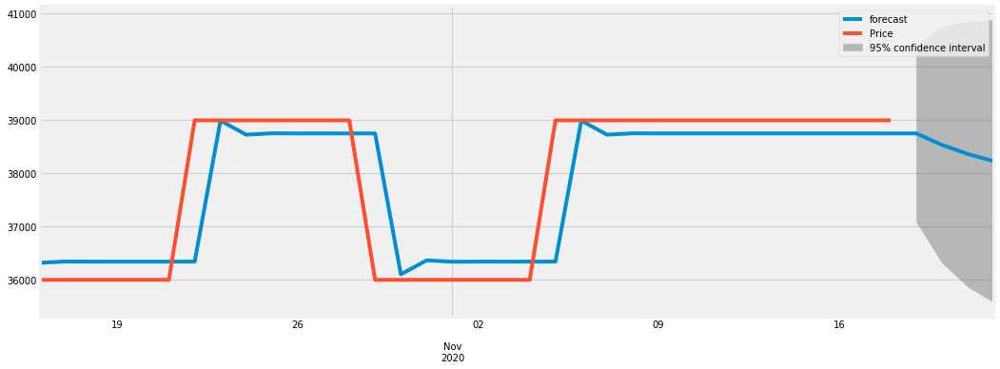

0.9641168916964626
2020-10-16    36309.701795
2020-10-17    36335.512702
2020-10-18    36332.738247
2020-10-19    36333.012000
2020-10-20    36332.984749
2020-10-21    36332.987459
2020-10-22    36332.987190
2020-10-23    38983.957418
2020-10-24    38720.270494
2020-10-25    38746.498927
2020-10-26    38743.890035
2020-10-27    38744.149536
2020-10-28    38744.123724
2020-10-29    38744.126292
2020-10-30    36093.155835
2020-10-31    36356.842781
2020-11-01    36330.614346
2020-11-02    36333.223239
2020-11-03    36332.963737
2020-11-04    36332.989549
2020-11-05    36332.986982
2020-11-06    38983.957438
2020-11-07    38720.270492
2020-11-08    38746.498927
2020-11-09    38743.890035
2020-11-10    38744.149536
2020-11-11    38744.123724
2020-11-12    38744.126292
2020-11-13    38744.126036
2020-11-14    38744.126062
2020-11-15    38744.126059
2020-11-16    38744.126059
2020-11-17    38744.126059
2020-11-18    38744.126059
2020-11-19    38744.126059
2020-11-20    38526.857896
2020-11-2

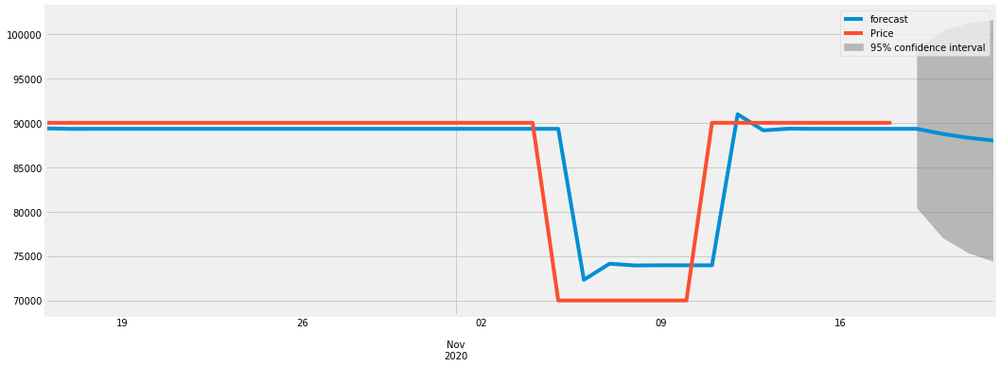

0.9501331681632957
2020-10-16    89359.438690
2020-10-17    89307.058339
2020-10-18    89313.110719
2020-10-19    89312.470695
2020-10-20    89312.539046
2020-10-21    89312.531754
2020-10-22    89312.532532
2020-10-23    89312.532449
2020-10-24    89312.532458
2020-10-25    89312.532457
2020-10-26    89312.532457
2020-10-27    89312.532457
2020-10-28    89312.532457
2020-10-29    89312.532457
2020-10-30    89312.532457
2020-10-31    89312.532457
2020-11-01    89312.532457
2020-11-02    89312.532457
2020-11-03    89312.532457
2020-11-04    89312.532457
2020-11-05    89312.532457
2020-11-06    72313.905876
2020-11-07    74127.540450
2020-11-08    73934.038325
2020-11-09    73954.683649
2020-11-10    73952.480937
2020-11-11    73952.715951
2020-11-12    90951.317458
2020-11-13    89137.685559
2020-11-14    89331.187398
2020-11-15    89310.542105
2020-11-16    89312.744814
2020-11-17    89312.509800
2020-11-18    89312.534874
2020-11-19    89312.532199
2020-11-20    88736.731376
2020-11-2

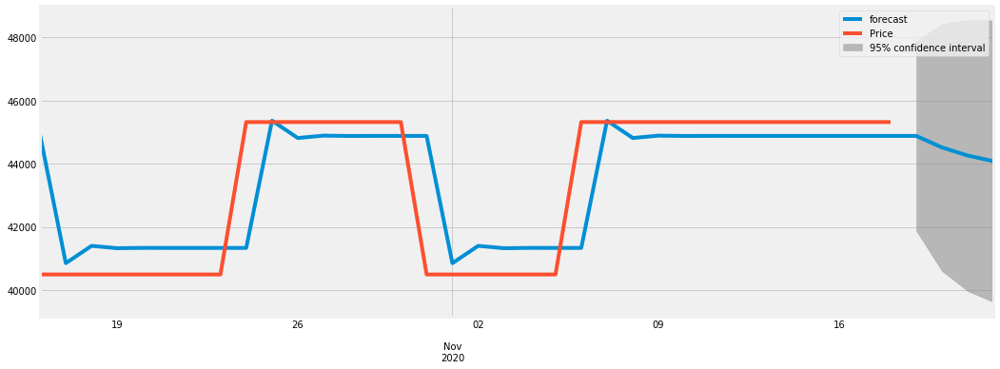

0.9351722075736536
2020-10-16    44916.403936
2020-10-17    40848.749449
2020-10-18    41397.004625
2020-10-19    41322.237545
2020-10-20    41332.432040
2020-10-21    41331.041951
2020-10-22    41331.231498
2020-10-23    41331.205652
2020-10-24    41331.209177
2020-10-25    45364.663262
2020-10-26    44814.677574
2020-10-27    44889.671426
2020-10-28    44879.445564
2020-10-29    44880.839921
2020-10-30    44880.649792
2020-10-31    44880.675717
2020-11-01    40847.217617
2020-11-02    41397.203852
2020-11-03    41322.209926
2020-11-04    41332.435798
2020-11-05    41331.041439
2020-11-06    41331.231568
2020-11-07    45364.660209
2020-11-08    44814.677990
2020-11-09    44889.671369
2020-11-10    44879.445571
2020-11-11    44880.839920
2020-11-12    44880.649792
2020-11-13    44880.675717
2020-11-14    44880.672182
2020-11-15    44880.672664
2020-11-16    44880.672599
2020-11-17    44880.672608
2020-11-18    44880.672606
2020-11-19    44880.672607
2020-11-20    44513.797435
2020-11-2

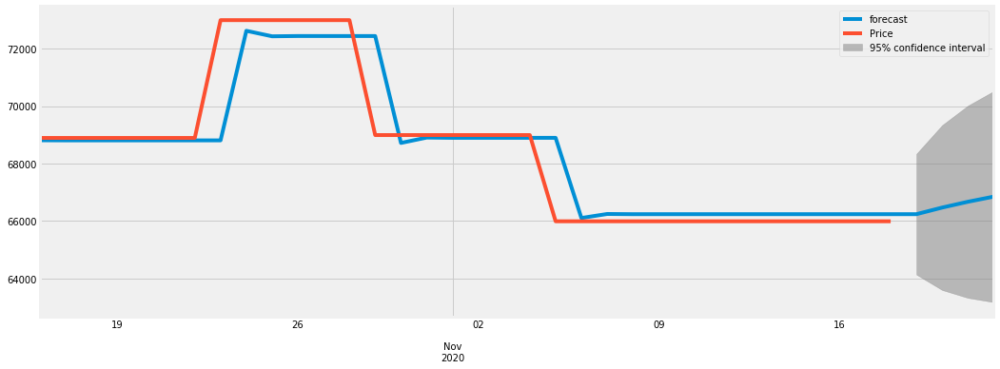

0.9873790407793769
2020-10-16    68809.068235
2020-10-17    68805.462530
2020-10-18    68805.651392
2020-10-19    68805.641943
2020-10-20    68805.642416
2020-10-21    68805.642393
2020-10-22    68805.642394
2020-10-23    68805.642394
2020-10-24    72618.678651
2020-10-25    72427.474670
2020-10-26    72437.062558
2020-10-27    72436.581775
2020-10-28    72436.605884
2020-10-29    72436.604675
2020-10-30    68716.569363
2020-10-31    68903.109828
2020-11-01    68893.755792
2020-11-02    68894.224849
2020-11-03    68894.201328
2020-11-04    68894.202507
2020-11-05    68894.202448
2020-11-06    66104.175922
2020-11-07    66244.081273
2020-11-08    66237.065746
2020-11-09    66237.417538
2020-11-10    66237.399897
2020-11-11    66237.400782
2020-11-12    66237.400738
2020-11-13    66237.400740
2020-11-14    66237.400740
2020-11-15    66237.400740
2020-11-16    66237.400740
2020-11-17    66237.400740
2020-11-18    66237.400740
2020-11-19    66237.400740
2020-11-20    66467.485615
2020-11-2

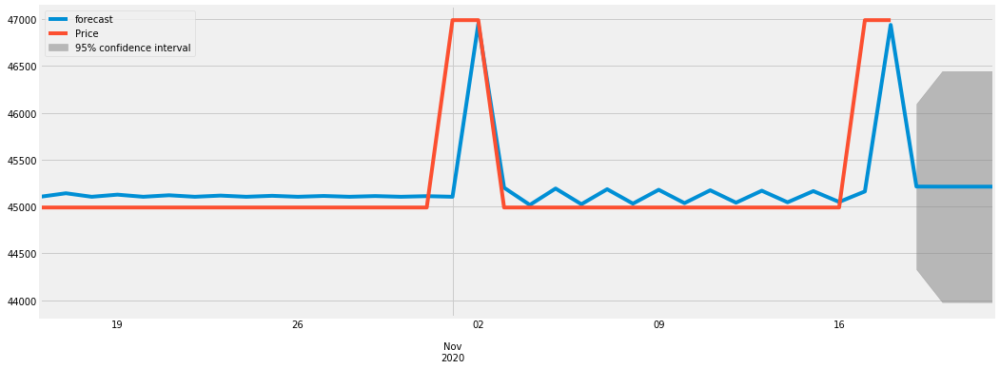

0.5153680108552485
2020-10-16    45104.384582
2020-10-17    45141.794822
2020-10-18    45104.384582
2020-10-19    45127.001074
2020-10-20    45104.384582
2020-10-21    45120.591933
2020-10-22    45104.384582
2020-10-23    45117.013193
2020-10-24    45104.384582
2020-10-25    45114.729038
2020-10-26    45104.384582
2020-10-27    45113.144600
2020-10-28    45104.384582
2020-10-29    45111.981064
2020-10-30    45104.384582
2020-10-31    45111.090376
2020-11-01    45104.384582
2020-11-02    46949.478391
2020-11-03    45201.307415
2020-11-04    45017.496495
2020-11-05    45192.519247
2020-11-06    45025.033115
2020-11-07    45185.192269
2020-11-08    45031.366647
2020-11-09    45178.990027
2020-11-10    45036.763874
2020-11-11    45173.672002
2020-11-12    45041.418131
2020-11-13    45169.061688
2020-11-14    45045.472952
2020-11-15    45165.026629
2020-11-16    45049.037135
2020-11-17    45161.465480
2020-11-18    46939.182546
2020-11-19    45213.623525
2020-11-20    45212.511832
2020-11-2

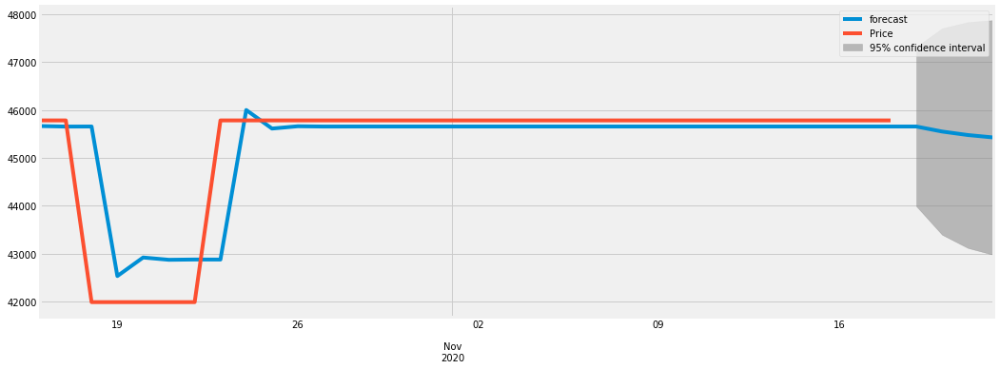

0.9342926154428057
2020-10-16    45665.278690
2020-10-17    45654.385269
2020-10-18    45655.861855
2020-10-19    42534.109435
2020-10-20    42921.469099
2020-10-21    42873.403827
2020-10-22    42879.367975
2020-10-23    42878.627918
2020-10-24    46000.292019
2020-10-25    45612.942379
2020-10-26    45661.006405
2020-10-27    45655.042412
2020-10-28    45655.782450
2020-10-29    45655.690623
2020-10-30    45655.702017
2020-10-31    45655.700603
2020-11-01    45655.700779
2020-11-02    45655.700757
2020-11-03    45655.700760
2020-11-04    45655.700759
2020-11-05    45655.700759
2020-11-06    45655.700759
2020-11-07    45655.700759
2020-11-08    45655.700759
2020-11-09    45655.700759
2020-11-10    45655.700759
2020-11-11    45655.700759
2020-11-12    45655.700759
2020-11-13    45655.700759
2020-11-14    45655.700759
2020-11-15    45655.700759
2020-11-16    45655.700759
2020-11-17    45655.700759
2020-11-18    45655.700759
2020-11-19    45655.700759
2020-11-20    45550.935724
2020-11-2

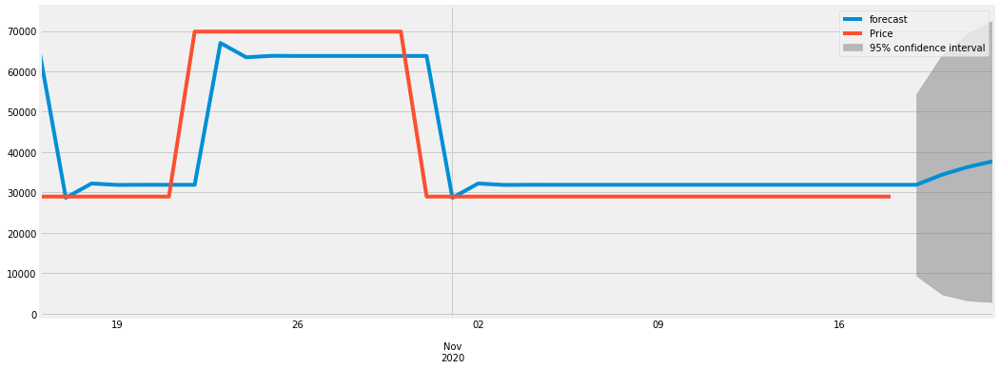

0.9551155203292447
2020-10-16    64210.739348
2020-10-17    28681.686498
2020-10-18    32236.743403
2020-10-19    31878.753954
2020-10-20    31914.803021
2020-10-21    31911.172904
2020-10-22    31911.538454
2020-10-23    67018.566271
2020-10-24    63483.313775
2020-10-25    63839.311163
2020-10-26    63803.462482
2020-10-27    63807.072418
2020-10-28    63806.708900
2020-10-29    63806.745506
2020-10-30    63806.741820
2020-10-31    63806.742191
2020-11-01    28699.677527
2020-11-02    32234.933733
2020-11-03    31878.935971
2020-11-04    31914.784690
2020-11-05    31911.174750
2020-11-06    31911.538269
2020-11-07    31911.501663
2020-11-08    31911.505349
2020-11-09    31911.504978
2020-11-10    31911.505015
2020-11-11    31911.505011
2020-11-12    31911.505012
2020-11-13    31911.505012
2020-11-14    31911.505012
2020-11-15    31911.505012
2020-11-16    31911.505012
2020-11-17    31911.505012
2020-11-18    31911.505012
2020-11-19    31911.505012
2020-11-20    34422.041685
2020-11-2

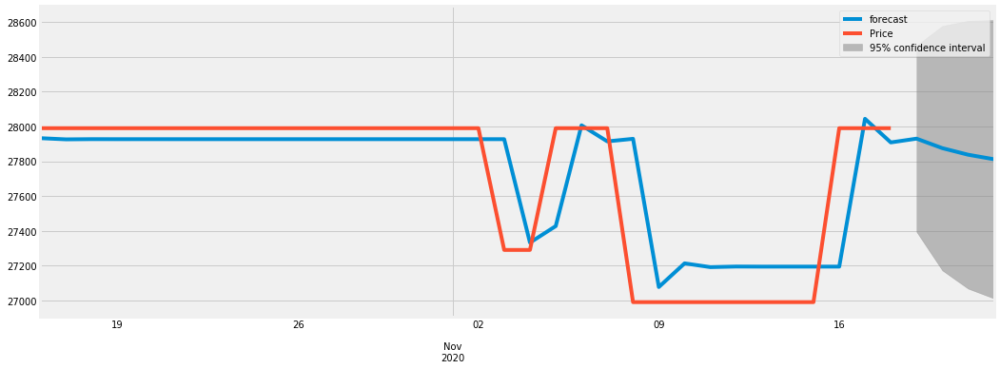

0.9341455740686304
2020-10-16    27932.590804
2020-10-17    27925.750442
2020-10-18    27926.972563
2020-10-19    27926.781103
2020-10-20    27926.811772
2020-10-21    27926.806877
2020-10-22    27926.807659
2020-10-23    27926.807534
2020-10-24    27926.807554
2020-10-25    27926.807551
2020-10-26    27926.807551
2020-10-27    27926.807551
2020-10-28    27926.807551
2020-10-29    27926.807551
2020-10-30    27926.807551
2020-10-31    27926.807551
2020-11-01    27926.807551
2020-11-02    27926.807551
2020-11-03    27926.807551
2020-11-04    27332.052501
2020-11-05    27427.035491
2020-11-06    28006.621660
2020-11-07    27914.061156
2020-11-08    27928.843163
2020-11-09    27076.832390
2020-11-10    27212.899383
2020-11-11    27191.169345
2020-11-12    27194.639654
2020-11-13    27194.085442
2020-11-14    27194.173950
2020-11-15    27194.159816
2020-11-16    27194.162073
2020-11-17    28043.811784
2020-11-18    27908.121855
2020-11-19    27929.791676
2020-11-20    27875.174976
2020-11-2

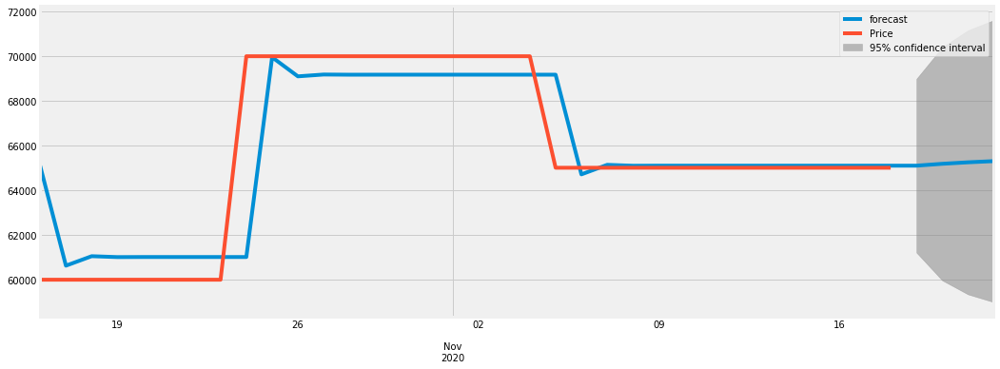

0.9682307766075328
2020-10-16    65087.122786
2020-10-17    60618.561977
2020-10-18    61042.715197
2020-10-19    61002.162843
2020-10-20    61006.039589
2020-10-21    61005.668973
2020-10-22    61005.704403
2020-10-23    61005.701016
2020-10-24    61005.701340
2020-10-25    69944.637619
2020-10-26    69090.076827
2020-10-27    69171.772694
2020-10-28    69163.962583
2020-10-29    69164.709228
2020-10-30    69164.637849
2020-10-31    69164.644673
2020-11-01    69164.644020
2020-11-02    69164.644083
2020-11-03    69164.644077
2020-11-04    69164.644077
2020-11-05    69164.644077
2020-11-06    64704.114859
2020-11-07    65130.540695
2020-11-08    65089.774458
2020-11-09    65093.671703
2020-11-10    65093.299127
2020-11-11    65093.334745
2020-11-12    65093.331340
2020-11-13    65093.331666
2020-11-14    65093.331635
2020-11-15    65093.331637
2020-11-16    65093.331637
2020-11-17    65093.331637
2020-11-18    65093.331637
2020-11-19    65093.331637
2020-11-20    65176.760193
2020-11-2

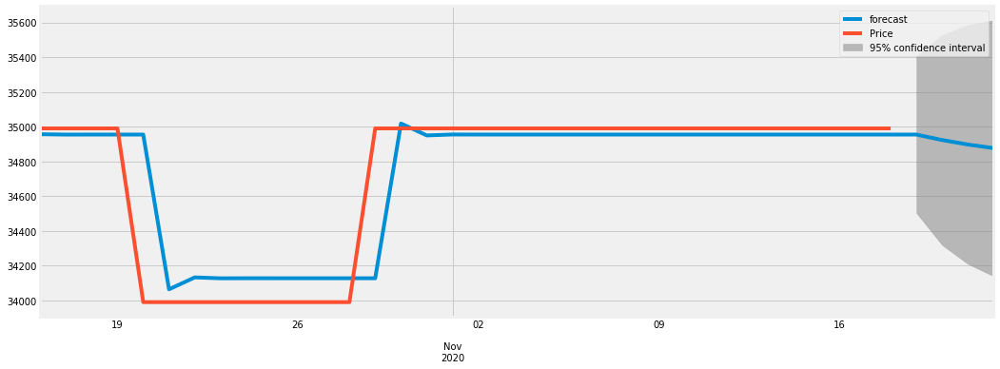

0.971519611374843
2020-10-16    34956.503184
2020-10-17    34954.354823
2020-10-18    34954.530786
2020-10-19    34954.517308
2020-10-20    34954.518346
2020-10-21    34063.818702
2020-10-22    34132.376549
2020-10-23    34127.099598
2020-10-24    34127.505769
2020-10-25    34127.474506
2020-10-26    34127.476912
2020-10-27    34127.476727
2020-10-28    34127.476741
2020-10-29    34127.476740
2020-10-30    35018.176304
2020-10-31    34949.618464
2020-11-01    34954.895414
2020-11-02    34954.489243
2020-11-03    34954.520506
2020-11-04    34954.518100
2020-11-05    34954.518285
2020-11-06    34954.518271
2020-11-07    34954.518272
2020-11-08    34954.518272
2020-11-09    34954.518272
2020-11-10    34954.518272
2020-11-11    34954.518272
2020-11-12    34954.518272
2020-11-13    34954.518272
2020-11-14    34954.518272
2020-11-15    34954.518272
2020-11-16    34954.518272
2020-11-17    34954.518272
2020-11-18    34954.518272
2020-11-19    34954.518272
2020-11-20    34922.914712
2020-11-21

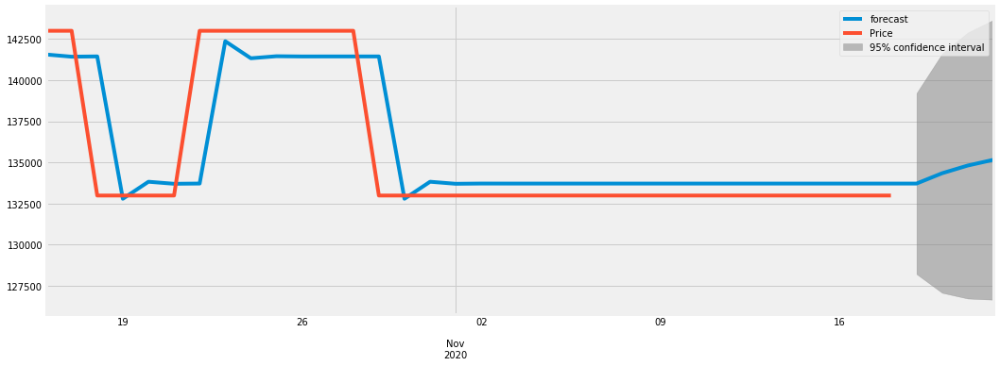

0.9513674810131024
2020-10-16    141551.808252
2020-10-17    141417.185465
2020-10-18    141434.803297
2020-10-19    132792.071296
2020-10-20    133826.448027
2020-10-21    133702.651857
2020-10-22    133717.468017
2020-10-23    142356.344061
2020-10-24    141322.426975
2020-10-25    141446.168135
2020-10-26    141431.358558
2020-10-27    141433.130996
2020-10-28    141432.918868
2020-10-29    141432.944256
2020-10-30    132792.291947
2020-10-31    133826.421620
2020-11-01    133702.655017
2020-11-02    133717.467639
2020-11-03    133715.694836
2020-11-04    133715.907009
2020-11-05    133715.881616
2020-11-06    133715.884655
2020-11-07    133715.884291
2020-11-08    133715.884334
2020-11-09    133715.884329
2020-11-10    133715.884330
2020-11-11    133715.884330
2020-11-12    133715.884330
2020-11-13    133715.884330
2020-11-14    133715.884330
2020-11-15    133715.884330
2020-11-16    133715.884330
2020-11-17    133715.884330
2020-11-18    133715.884330
2020-11-19    133715.884330
2

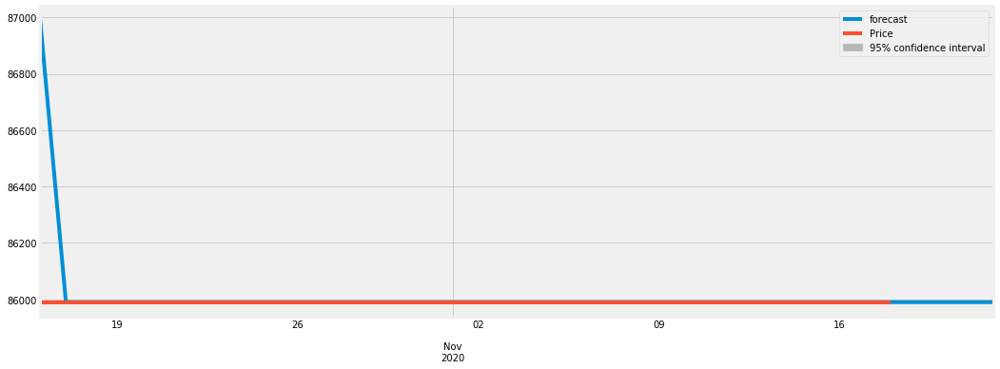

0.9999999999994943
2020-10-16    86990.000000
2020-10-17    85989.999299
2020-10-18    85990.000000
2020-10-19    85990.000000
2020-10-20    85990.000000
2020-10-21    85990.000000
2020-10-22    85990.000000
2020-10-23    85990.000000
2020-10-24    85990.000000
2020-10-25    85990.000000
2020-10-26    85990.000000
2020-10-27    85990.000000
2020-10-28    85990.000000
2020-10-29    85990.000000
2020-10-30    85990.000000
2020-10-31    85990.000000
2020-11-01    85990.000000
2020-11-02    85990.000000
2020-11-03    85990.000000
2020-11-04    85990.000000
2020-11-05    85990.000000
2020-11-06    85990.000000
2020-11-07    85990.000000
2020-11-08    85990.000000
2020-11-09    85990.000000
2020-11-10    85990.000000
2020-11-11    85990.000000
2020-11-12    85990.000000
2020-11-13    85990.000000
2020-11-14    85990.000000
2020-11-15    85990.000000
2020-11-16    85990.000000
2020-11-17    85990.000000
2020-11-18    85990.000000
2020-11-19    85990.000000
2020-11-20    85990.000000
2020-11-2

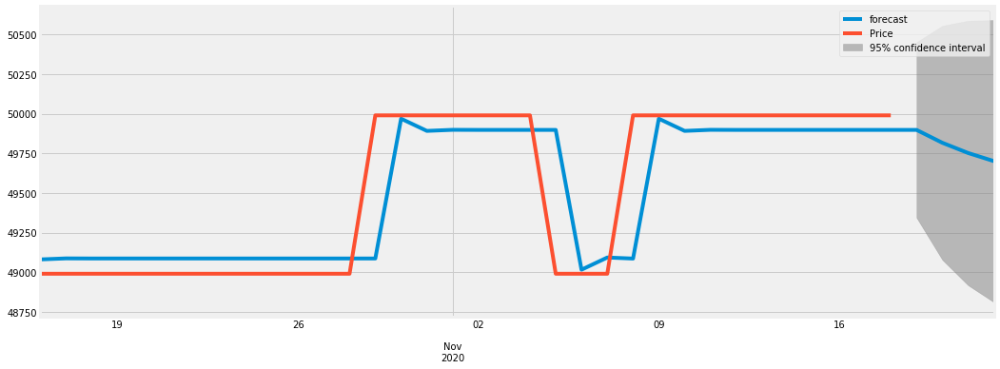

0.9671123285935198
2020-10-16    49080.397639
2020-10-17    49086.860459
2020-10-18    49086.256019
2020-10-19    49086.308450
2020-10-20    49086.303871
2020-10-21    49086.304271
2020-10-22    49086.304236
2020-10-23    49086.304239
2020-10-24    49086.304239
2020-10-25    49086.304239
2020-10-26    49086.304239
2020-10-27    49086.304239
2020-10-28    49086.304239
2020-10-29    49086.304239
2020-10-30    49968.893745
2020-10-31    49891.853401
2020-11-01    49898.578174
2020-11-02    49897.991176
2020-11-03    49898.042414
2020-11-04    49898.037942
2020-11-05    49898.038332
2020-11-06    49015.448792
2020-11-07    49092.489139
2020-11-08    49085.764365
2020-11-09    49968.940870
2020-11-10    49891.849287
2020-11-11    49898.578533
2020-11-12    49897.991144
2020-11-13    49898.042417
2020-11-14    49898.037941
2020-11-15    49898.038332
2020-11-16    49898.038298
2020-11-17    49898.038301
2020-11-18    49898.038301
2020-11-19    49898.038301
2020-11-20    49816.873870
2020-11-2

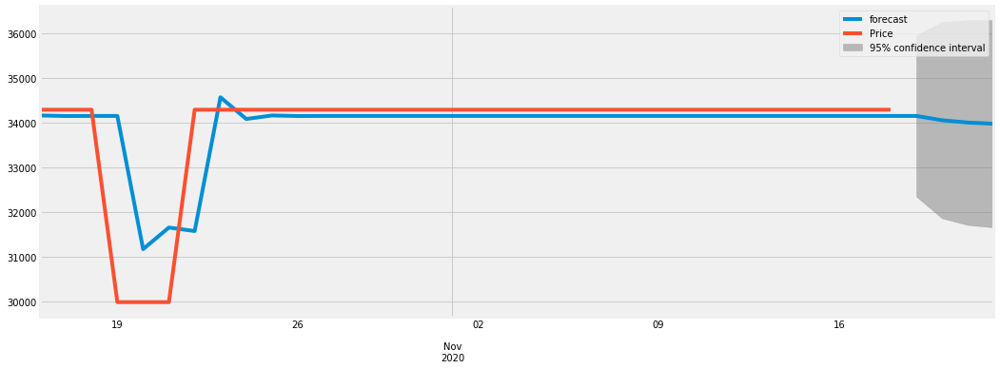

0.8541039391963137
2020-10-16    34163.752191
2020-10-17    34150.841142
2020-10-18    34153.144672
2020-10-19    34152.777273
2020-10-20    31174.665445
2020-10-21    31657.539507
2020-10-22    31579.245797
2020-10-23    34570.112109
2020-10-24    34085.169895
2020-10-25    34163.798937
2020-10-26    34151.049941
2020-10-27    34153.117077
2020-10-28    34152.781909
2020-10-29    34152.836254
2020-10-30    34152.827442
2020-10-31    34152.828871
2020-11-01    34152.828639
2020-11-02    34152.828677
2020-11-03    34152.828671
2020-11-04    34152.828672
2020-11-05    34152.828671
2020-11-06    34152.828671
2020-11-07    34152.828671
2020-11-08    34152.828671
2020-11-09    34152.828671
2020-11-10    34152.828671
2020-11-11    34152.828671
2020-11-12    34152.828671
2020-11-13    34152.828671
2020-11-14    34152.828671
2020-11-15    34152.828671
2020-11-16    34152.828671
2020-11-17    34152.828671
2020-11-18    34152.828671
2020-11-19    34152.828671
2020-11-20    34056.483690
2020-11-2

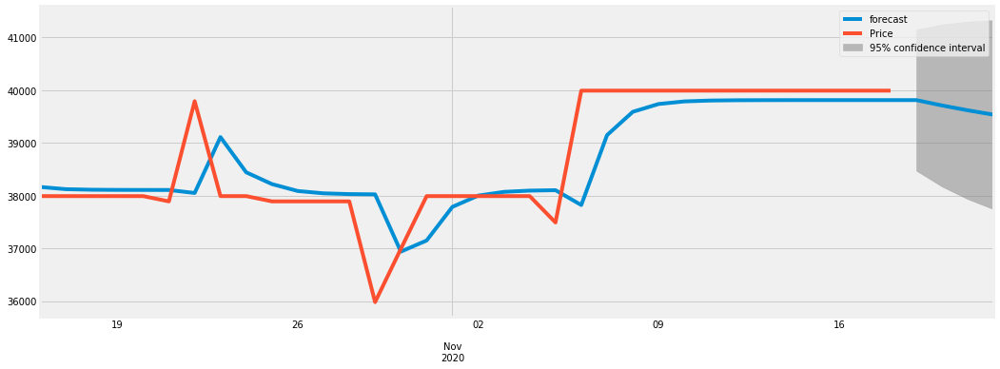

0.924711659536042
2020-10-16    38163.744324
2020-10-17    38121.538529
2020-10-18    38110.946915
2020-10-19    38107.697713
2020-10-20    38106.642023
2020-10-21    38106.292687
2020-10-22    38049.413975
2020-10-23    39108.907094
2020-10-24    38440.956444
2020-10-25    38217.923020
2020-10-26    38086.688212
2020-10-27    38042.867984
2020-10-28    38028.236101
2020-10-29    38023.350413
2020-10-30    36937.557642
2020-10-31    37148.303794
2020-11-01    37786.297192
2020-11-02    37999.327683
2020-11-03    38070.460065
2020-11-04    38094.211669
2020-11-05    38102.142497
2020-11-06    37820.978770
2020-11-07    39146.155651
2020-11-08    39588.641549
2020-11-09    39736.390709
2020-11-10    39785.725195
2020-11-11    39802.198327
2020-11-12    39807.698822
2020-11-13    39809.535476
2020-11-14    39810.148748
2020-11-15    39810.353523
2020-11-16    39810.421899
2020-11-17    39810.444731
2020-11-18    39810.452354
2020-11-19    39810.454900
2020-11-20    39708.541683
2020-11-21

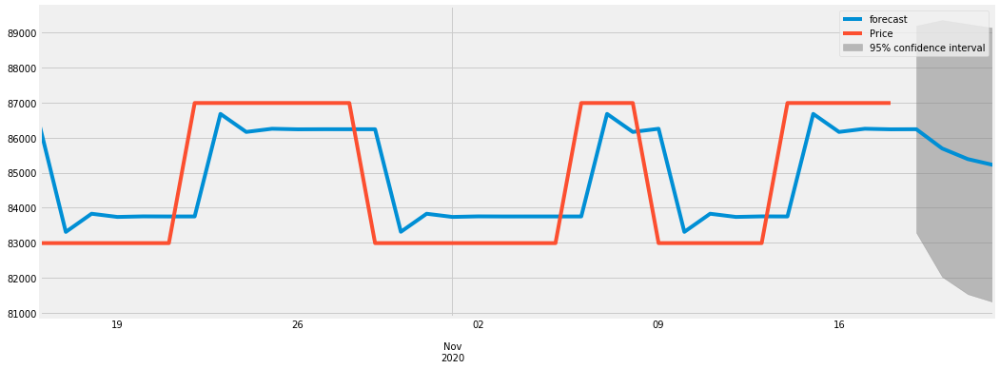

0.872724682106274
2020-10-16    86305.871844
2020-10-17    83309.211339
2020-10-18    83828.523952
2020-10-19    83737.163458
2020-10-20    83753.230555
2020-10-21    83750.404546
2020-10-22    83750.901596
2020-10-23    86679.067841
2020-10-24    86164.047751
2020-10-25    86254.631984
2020-10-26    86238.699589
2020-10-27    86241.501856
2020-10-28    86241.008980
2020-10-29    86241.095669
2020-10-30    83312.826754
2020-10-31    83827.864902
2020-11-01    83737.277493
2020-11-02    83753.210446
2020-11-03    83750.408081
2020-11-04    83750.900974
2020-11-05    83750.814282
2020-11-06    83750.829530
2020-11-07    86679.080516
2020-11-08    86164.045522
2020-11-09    86254.632376
2020-11-10    83310.445852
2020-11-11    83828.283666
2020-11-12    83737.203839
2020-11-13    83753.223401
2020-11-14    83750.405802
2020-11-15    86679.155043
2020-11-16    86164.032413
2020-11-17    86254.634682
2020-11-18    86238.699115
2020-11-19    86241.501940
2020-11-20    85693.060918
2020-11-21

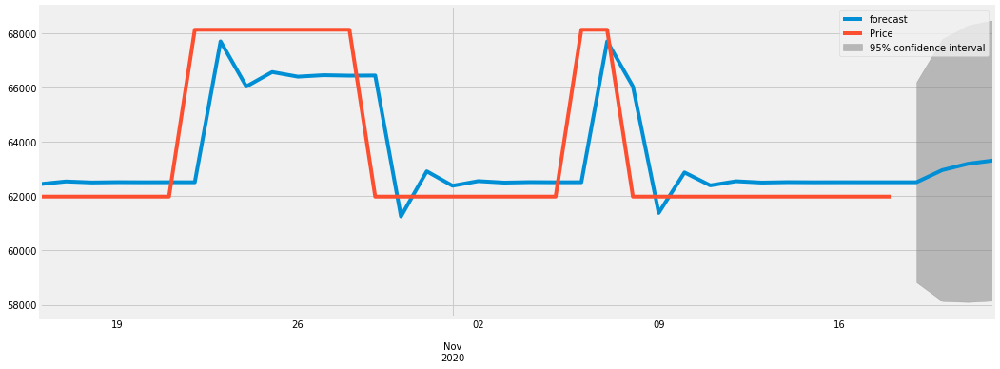

0.8752019914421345
2020-10-16    62451.968806
2020-10-17    62548.440093
2020-10-18    62511.297181
2020-10-19    62522.389547
2020-10-20    62518.763742
2020-10-21    62519.916379
2020-10-22    62519.546639
2020-10-23    67713.002754
2020-10-24    66050.681288
2020-10-25    66582.757186
2020-10-26    66412.450319
2020-10-27    66466.962145
2020-10-28    66449.513999
2020-10-29    66455.098802
2020-10-30    61259.973257
2020-10-31    62922.829174
2020-11-01    62390.582210
2020-11-02    62560.943831
2020-11-03    62506.414479
2020-11-04    62523.868236
2020-11-05    62518.281637
2020-11-06    62520.069795
2020-11-07    67712.835402
2020-11-08    66050.734855
2020-11-09    61389.402080
2020-11-10    62881.401593
2020-11-11    62403.842351
2020-11-12    62556.699525
2020-11-13    62507.772997
2020-11-14    62523.433401
2020-11-15    62518.420819
2020-11-16    62520.025246
2020-11-17    62519.511701
2020-11-18    62519.676077
2020-11-19    62519.623463
2020-11-20    62966.732897
2020-11-2

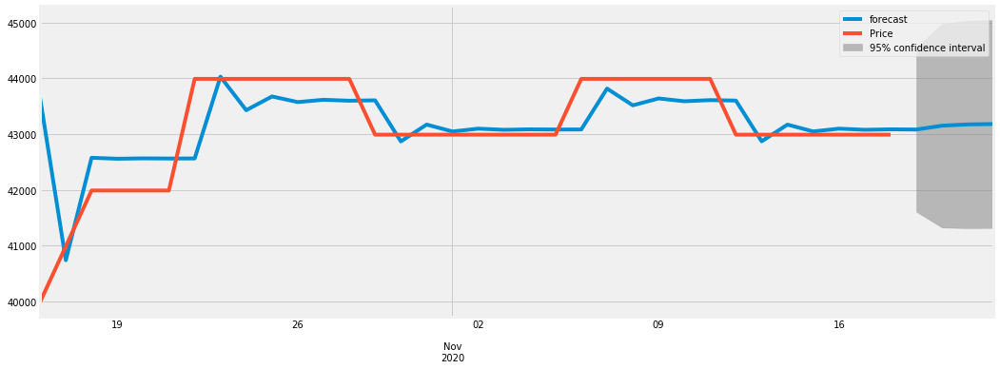

0.7834800407295281
2020-10-16    43651.050933
2020-10-17    40741.091819
2020-10-18    42576.308083
2020-10-19    42558.658980
2020-10-20    42565.558114
2020-10-21    42562.678107
2020-10-22    42563.848899
2020-10-23    44029.011284
2020-10-24    43428.748983
2020-10-25    43674.670716
2020-10-26    43573.918933
2020-10-27    43615.195979
2020-10-28    43598.285167
2020-10-29    43605.213366
2020-10-30    42869.552629
2020-10-31    43170.945823
2020-11-01    43047.467903
2020-11-02    43098.055630
2020-11-03    43077.330320
2020-11-04    43085.821282
2020-11-05    43082.342616
2020-11-06    43083.767793
2020-11-07    43816.006232
2020-11-08    43516.015120
2020-11-09    43638.918620
2020-11-10    43588.566227
2020-11-11    43609.195123
2020-11-12    43600.743661
2020-11-13    42871.383824
2020-11-14    43170.195600
2020-11-15    43047.775262
2020-11-16    43097.929708
2020-11-17    43077.381910
2020-11-18    43085.800147
2020-11-19    43082.351275
2020-11-20    43151.441321
2020-11-2

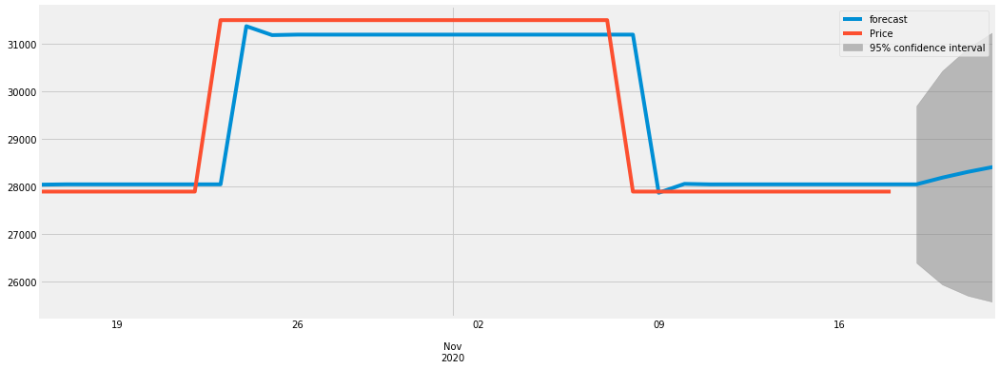

0.9837358188536608
2020-10-16    28036.373781
2020-10-17    28043.554721
2020-10-18    28043.130120
2020-10-19    28043.153978
2020-10-20    28043.152633
2020-10-21    28043.152709
2020-10-22    28043.152705
2020-10-23    28043.152705
2020-10-24    31362.727893
2020-10-25    31175.682992
2020-10-26    31186.222231
2020-10-27    31185.628387
2020-10-28    31185.661847
2020-10-29    31185.659962
2020-10-30    31185.660068
2020-10-31    31185.660062
2020-11-01    31185.660063
2020-11-02    31185.660063
2020-11-03    31185.660063
2020-11-04    31185.660063
2020-11-05    31185.660063
2020-11-06    31185.660063
2020-11-07    31185.660063
2020-11-08    31185.660063
2020-11-09    27866.084875
2020-11-10    28053.129775
2020-11-11    28042.590537
2020-11-12    28043.184381
2020-11-13    28043.150920
2020-11-14    28043.152806
2020-11-15    28043.152699
2020-11-16    28043.152705
2020-11-17    28043.152705
2020-11-18    28043.152705
2020-11-19    28043.152705
2020-11-20    28183.492340
2020-11-2

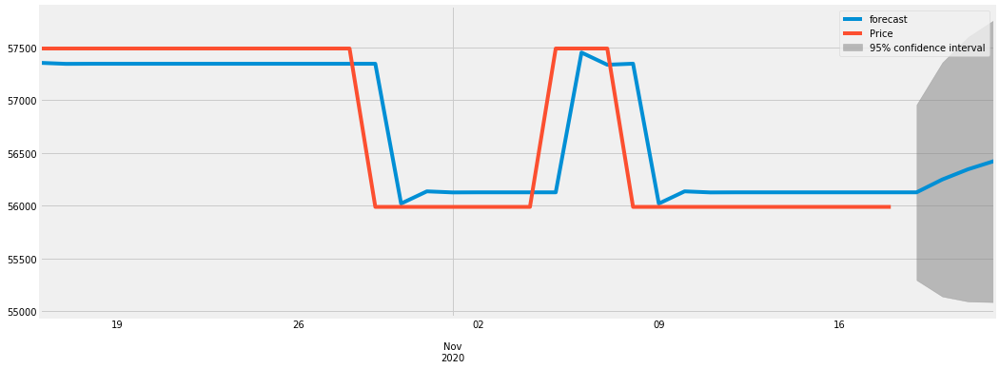

0.9671120707844038
2020-10-16    57354.391165
2020-10-17    57344.696018
2020-10-18    57345.602769
2020-10-19    57345.524113
2020-10-20    57345.530983
2020-10-21    57345.530383
2020-10-22    57345.530436
2020-10-23    57345.530431
2020-10-24    57345.530432
2020-10-25    57345.530432
2020-10-26    57345.530432
2020-10-27    57345.530432
2020-10-28    57345.530432
2020-10-29    57345.530432
2020-10-30    56021.646619
2020-10-31    56137.207551
2020-11-01    56127.120314
2020-11-02    56128.000822
2020-11-03    56127.923963
2020-11-04    56127.930672
2020-11-05    56127.930087
2020-11-06    57451.813950
2020-11-07    57336.253014
2020-11-08    57346.340251
2020-11-09    56021.575931
2020-11-10    56137.213721
2020-11-11    56127.119776
2020-11-12    56128.000869
2020-11-13    56127.923959
2020-11-14    56127.930673
2020-11-15    56127.930087
2020-11-16    56127.930138
2020-11-17    56127.930133
2020-11-18    56127.930134
2020-11-19    56127.930134
2020-11-20    56249.665781
2020-11-2

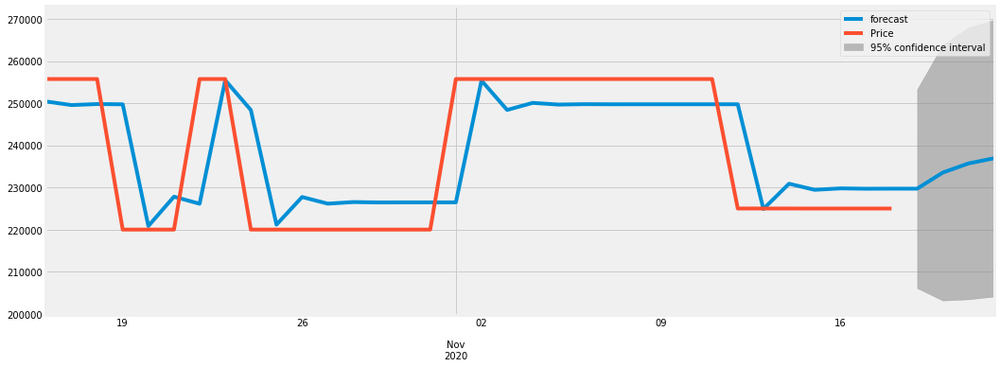

0.8893386178478211
2020-10-16    250408.375026
2020-10-17    249547.455764
2020-10-18    249788.191405
2020-10-19    249732.424341
2020-10-20    220843.395567
2020-10-21    227807.460535
2020-10-22    226128.675377
2020-10-23    255436.015131
2020-10-24    248371.071551
2020-10-25    221171.529692
2020-10-26    227728.359157
2020-10-27    226147.743834
2020-10-28    226528.773235
2020-10-29    226436.920776
2020-10-30    226459.063094
2020-10-31    226453.725379
2020-11-01    226455.012110
2020-11-02    255357.347111
2020-11-03    248390.035576
2020-11-04    250069.603335
2020-11-05    249664.720068
2020-11-06    249762.322835
2020-11-07    249738.794324
2020-11-08    249744.466200
2020-11-09    249743.098915
2020-11-10    249743.428519
2020-11-11    249743.349063
2020-11-12    249743.368217
2020-11-13    224885.535530
2020-11-14    230877.863292
2020-11-15    229433.328989
2020-11-16    229773.464525
2020-11-17    229691.470103
2020-11-18    229711.236004
2020-11-19    229706.471157
2

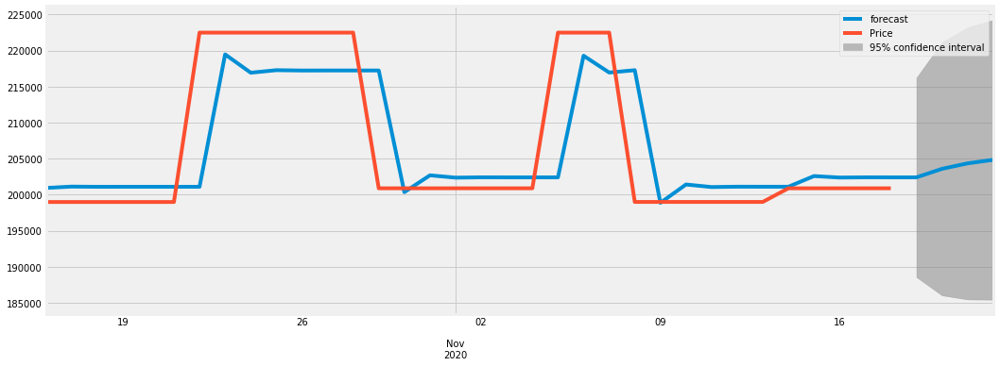

0.9108209944252684
2020-10-16    200935.781293
2020-10-17    201125.326285
2020-10-18    201096.551796
2020-10-19    201100.479326
2020-10-20    201099.934906
2020-10-21    201100.010212
2020-10-22    201099.999792
2020-10-23    219458.265604
2020-10-24    216918.245521
2020-10-25    217269.678608
2020-10-26    217221.054892
2020-10-27    217227.782391
2020-10-28    217226.851585
2020-10-29    217226.980370
2020-10-30    200353.615265
2020-10-31    202688.186878
2020-11-01    202365.179311
2020-11-02    202409.870118
2020-11-03    202403.686770
2020-11-04    202404.542288
2020-11-05    202404.423920
2020-11-06    219277.787583
2020-11-07    216943.216169
2020-11-08    217266.223709
2020-11-09    198870.302354
2020-11-10    201415.532397
2020-11-11    201063.378468
2020-11-12    201112.101919
2020-11-13    201105.360621
2020-11-14    201106.293336
2020-11-15    202584.047553
2020-11-16    202379.587860
2020-11-17    202407.876574
2020-11-18    202403.962593
2020-11-19    202404.504125
2

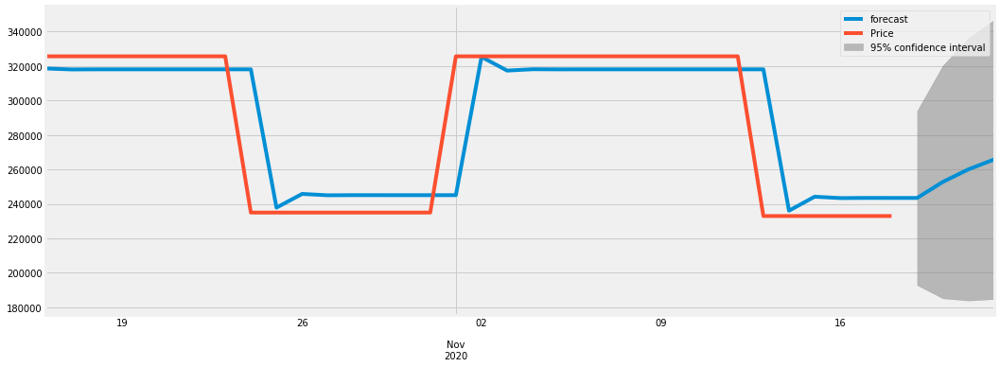

0.9650575375079641
2020-10-16    318624.724419
2020-10-17    318056.755701
2020-10-18    318117.519947
2020-10-19    318111.550997
2020-10-20    318112.142513
2020-10-21    318112.083945
2020-10-22    318112.089745
2020-10-23    318112.089171
2020-10-24    318112.089227
2020-10-25    237871.923671
2020-10-26    245817.355845
2020-10-27    245030.594103
2020-10-28    245108.499750
2020-10-29    245100.785484
2020-10-30    245101.549355
2020-10-31    245101.473716
2020-11-01    245101.481206
2020-11-02    325341.646015
2020-11-03    317396.213915
2020-11-04    318182.975650
2020-11-05    318105.070003
2020-11-06    318112.784270
2020-11-07    318112.020398
2020-11-08    318112.096037
2020-11-09    318112.088547
2020-11-10    318112.089289
2020-11-11    318112.089216
2020-11-12    318112.089223
2020-11-13    318112.089222
2020-11-14    236093.331559
2020-11-15    244214.881053
2020-11-16    243410.680062
2020-11-17    243490.312556
2020-11-18    243482.427295
2020-11-19    243483.208099
2

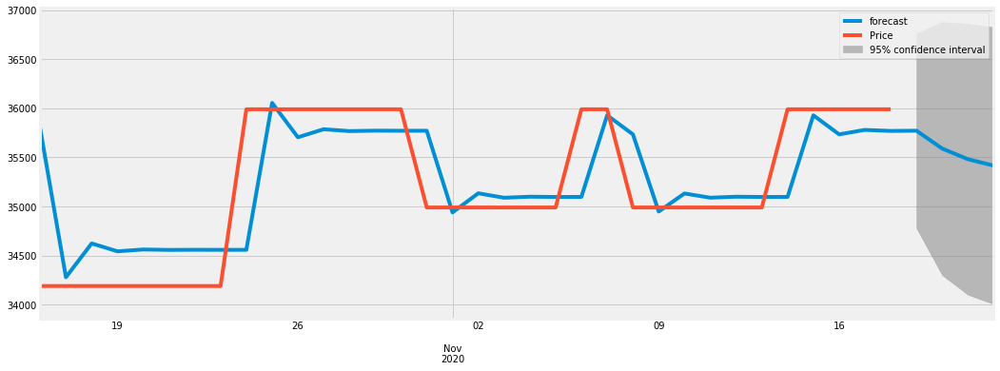

0.9014973666676003
2020-10-16    35795.811039
2020-10-17    34279.641153
2020-10-18    34624.019157
2020-10-19    34543.429789
2020-10-20    34562.275418
2020-10-21    34557.866191
2020-10-22    34558.897696
2020-10-23    34558.656377
2020-10-24    34558.712833
2020-10-25    36055.105808
2020-10-26    35705.029405
2020-10-27    35786.928672
2020-10-28    35767.768598
2020-10-29    35772.251037
2020-10-30    35771.202384
2020-10-31    35771.447713
2020-11-01    34940.053551
2020-11-02    35134.555585
2020-11-03    35089.052450
2020-11-04    35099.697764
2020-11-05    35097.207327
2020-11-06    35097.789957
2020-11-07    35928.990420
2020-11-08    35734.533701
2020-11-09    34948.689467
2020-11-10    35132.535240
2020-11-11    35089.525103
2020-11-12    35099.587189
2020-11-13    35097.233195
2020-11-14    35097.783905
2020-11-15    35928.991836
2020-11-16    35734.533370
2020-11-17    35780.026313
2020-11-18    35769.383383
2020-11-19    35771.873263
2020-11-20    35589.953986
2020-11-2

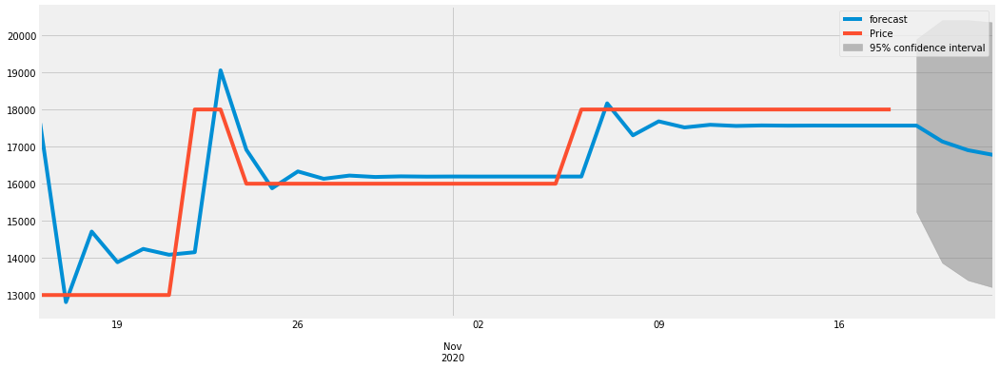

0.8818879378837309
2020-10-16    17619.056247
2020-10-17    12798.856050
2020-10-18    14699.895817
2020-10-19    13874.100577
2020-10-20    14232.258436
2020-10-21    14075.693450
2020-10-22    14143.992391
2020-10-23    19045.744329
2020-10-24    16905.618524
2020-10-25    15867.373380
2020-10-26    16320.677322
2020-10-27    16122.762124
2020-10-28    16209.173077
2020-10-29    16171.445541
2020-10-30    16187.917608
2020-10-31    16180.725805
2020-11-01    16183.865789
2020-11-02    16182.494853
2020-11-03    16183.093412
2020-11-04    16182.832078
2020-11-05    16182.946178
2020-11-06    16182.896361
2020-11-07    18155.554581
2020-11-08    17294.280257
2020-11-09    17670.317755
2020-11-10    17506.137544
2020-11-11    17577.819602
2020-11-12    17546.522789
2020-11-13    17560.187164
2020-11-14    17554.221216
2020-11-15    17556.825984
2020-11-16    17555.688727
2020-11-17    17556.185260
2020-11-18    17555.968471
2020-11-19    17556.063123
2020-11-20    17128.021942
2020-11-2

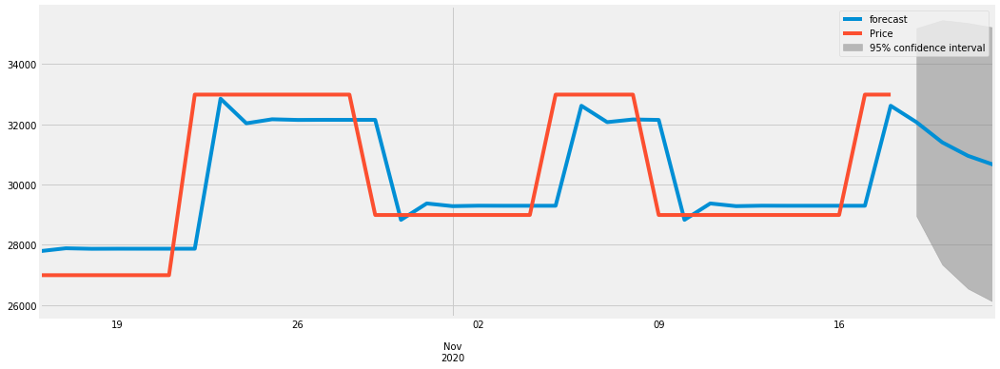

0.9259406364003252
2020-10-16    27788.637601
2020-10-17    27884.106181
2020-10-18    27866.587596
2020-10-19    27869.403846
2020-10-20    27868.940576
2020-10-21    27869.016499
2020-10-22    27869.004049
2020-10-23    32853.405960
2020-10-24    32036.101956
2020-10-25    32170.117199
2020-10-26    32148.142407
2020-10-27    32151.745665
2020-10-28    32151.154830
2020-10-29    32151.251711
2020-10-30    28828.302578
2020-10-31    29373.174297
2020-11-01    29283.830410
2020-11-02    29298.480336
2020-11-03    29296.078153
2020-11-04    29296.472045
2020-11-05    29296.407457
2020-11-06    32619.351295
2020-11-07    32074.480445
2020-11-08    32163.824189
2020-11-09    32149.174287
2020-11-10    28828.643218
2020-11-11    29373.118441
2020-11-12    29283.839569
2020-11-13    29298.478834
2020-11-14    29296.078400
2020-11-15    29296.472004
2020-11-16    29296.407464
2020-11-17    29296.418047
2020-11-18    32619.349558
2020-11-19    32074.480730
2020-11-20    31403.271787
2020-11-2

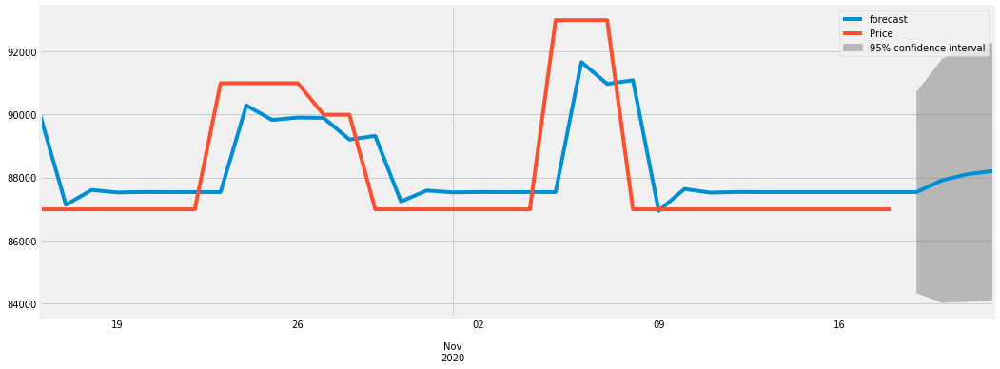

0.8491409404136774
2020-10-16    89977.541313
2020-10-17    87132.720951
2020-10-18    87604.230147
2020-10-19    87525.169472
2020-10-20    87538.424085
2020-10-21    87536.201768
2020-10-22    87536.574366
2020-10-23    87536.511895
2020-10-24    90284.372036
2020-10-25    89823.660025
2020-10-26    89900.903970
2020-10-27    89887.953087
2020-10-28    89203.162043
2020-10-29    89317.975550
2020-10-30    87237.838426
2020-10-31    87586.598591
2020-11-01    87528.124728
2020-11-02    87537.928579
2020-11-03    87536.284845
2020-11-04    87536.560437
2020-11-05    87536.514231
2020-11-06    91658.296477
2020-11-07    90967.229796
2020-11-08    91083.095490
2020-11-09    86941.894704
2020-11-10    87636.217138
2020-11-11    87519.805578
2020-11-12    87539.323385
2020-11-13    87536.050989
2020-11-14    87536.599646
2020-11-15    87536.507657
2020-11-16    87536.523080
2020-11-17    87536.520494
2020-11-18    87536.520927
2020-11-19    87536.520855
2020-11-20    87911.960154
2020-11-2

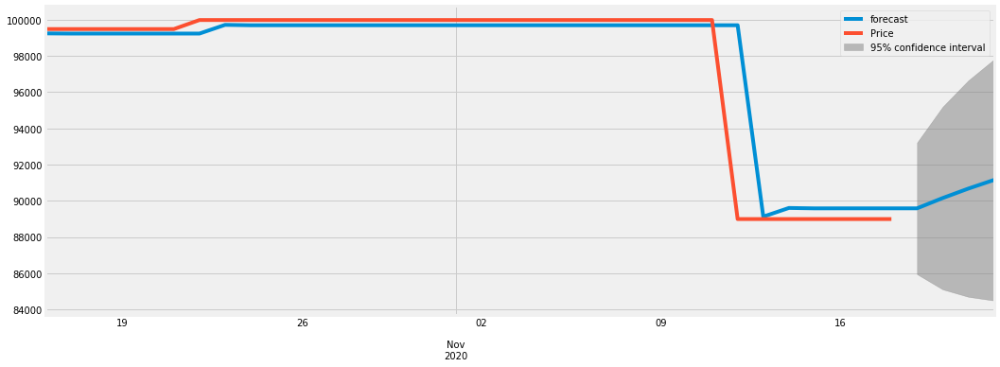

0.9935158099394314
2020-10-16    99251.274641
2020-10-17    99241.332608
2020-10-18    99241.800659
2020-10-19    99241.779545
2020-10-20    99241.780499
2020-10-21    99241.780456
2020-10-22    99241.780458
2020-10-23    99722.573967
2020-10-24    99700.844060
2020-10-25    99701.826163
2020-10-26    99701.781776
2020-10-27    99701.783782
2020-10-28    99701.783692
2020-10-29    99701.783696
2020-10-30    99701.783695
2020-10-31    99701.783696
2020-11-01    99701.783695
2020-11-02    99701.783695
2020-11-03    99701.783695
2020-11-04    99701.783695
2020-11-05    99701.783695
2020-11-06    99701.783695
2020-11-07    99701.783695
2020-11-08    99701.783695
2020-11-09    99701.783695
2020-11-10    99701.783695
2020-11-11    99701.783695
2020-11-12    99701.783695
2020-11-13    89124.326500
2020-11-14    89602.384454
2020-11-15    89580.778183
2020-11-16    89581.754698
2020-11-17    89581.710563
2020-11-18    89581.712558
2020-11-19    89581.712468
2020-11-20    90150.695500
2020-11-2

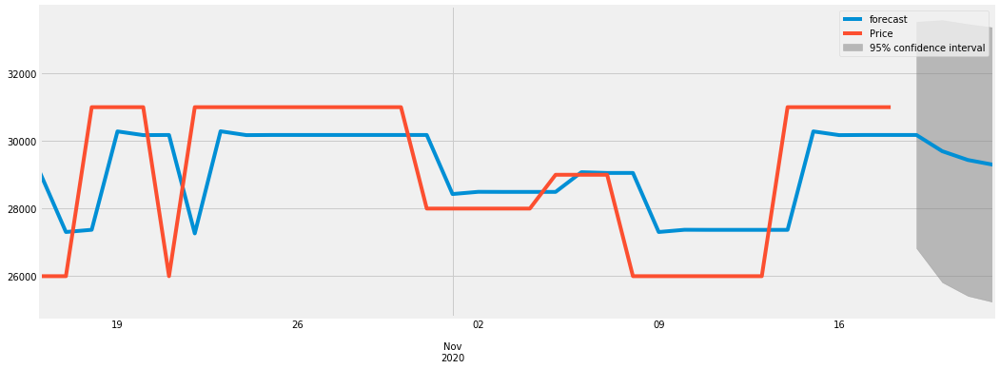

0.8148101348793761
2020-10-16    29043.275030
2020-10-17    27296.847901
2020-10-18    27362.495099
2020-10-19    30272.728026
2020-10-20    30163.245942
2020-10-21    30167.364625
2020-10-22    27254.507094
2020-10-23    30276.790503
2020-10-24    30163.093113
2020-10-25    30167.370374
2020-10-26    30167.209465
2020-10-27    30167.215518
2020-10-28    30167.215290
2020-10-29    30167.215299
2020-10-30    30167.215299
2020-10-31    30167.215299
2020-11-01    28419.593746
2020-11-02    28485.338742
2020-11-03    28482.865435
2020-11-04    28482.958480
2020-11-05    28482.954980
2020-11-06    29065.495629
2020-11-07    29043.580625
2020-11-08    29044.405061
2020-11-09    27296.752494
2020-11-10    27362.498656
2020-11-11    27360.025305
2020-11-12    27360.118352
2020-11-13    27360.114852
2020-11-14    27360.114983
2020-11-15    30272.817566
2020-11-16    30163.242573
2020-11-17    30167.364751
2020-11-18    30167.209676
2020-11-19    30167.215510
2020-11-20    29687.909988
2020-11-2

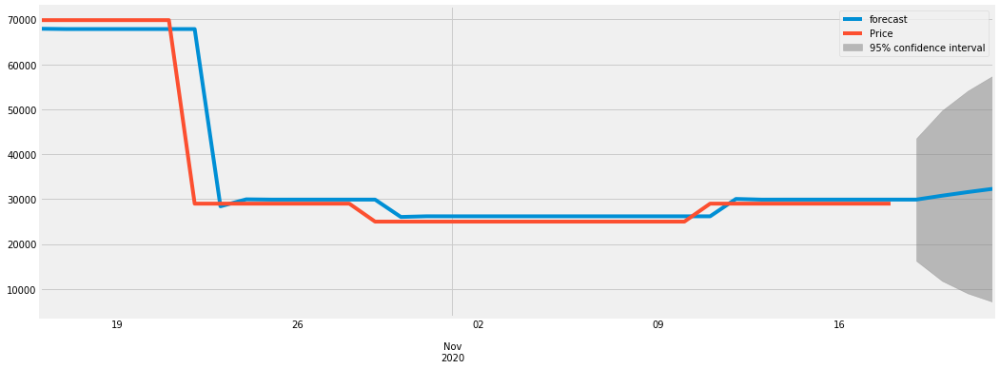

0.9944487304628103
2020-10-16    67925.297819
2020-10-17    67854.994797
2020-10-18    67857.864619
2020-10-19    67857.751774
2020-10-20    67857.756218
2020-10-21    67857.756043
2020-10-22    67857.756050
2020-10-23    28395.307677
2020-10-24    29949.259425
2020-10-25    29888.067934
2020-10-26    29890.477532
2020-10-27    29890.382647
2020-10-28    29890.386383
2020-10-29    29890.386236
2020-10-30    26026.632546
2020-10-31    26178.779386
2020-11-01    26172.788149
2020-11-02    26173.024072
2020-11-03    26173.014782
2020-11-04    26173.015148
2020-11-05    26173.015133
2020-11-06    26173.015134
2020-11-07    26173.015134
2020-11-08    26173.015134
2020-11-09    26173.015134
2020-11-10    26173.015134
2020-11-11    26173.015134
2020-11-12    30036.768830
2020-11-13    29884.621990
2020-11-14    29890.613226
2020-11-15    29890.377303
2020-11-16    29890.386594
2020-11-17    29890.386228
2020-11-18    29890.386242
2020-11-19    29890.386242
2020-11-20    30760.103909
2020-11-2

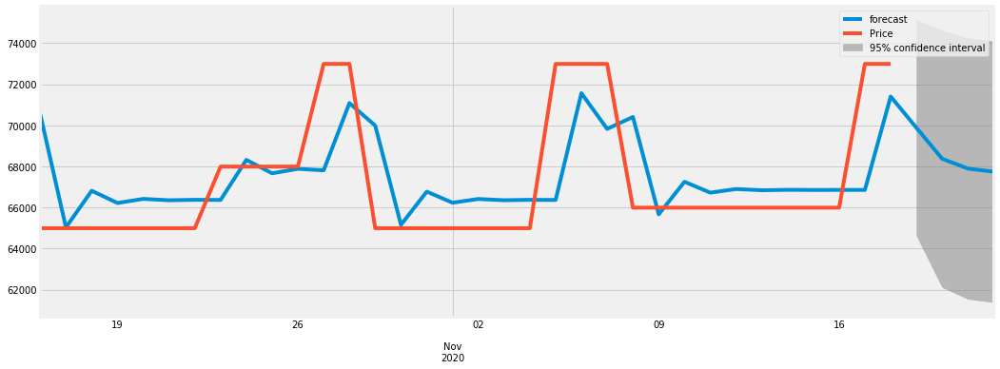

0.7677321700400177
2020-10-16    70559.463809
2020-10-17    65028.413657
2020-10-18    66813.674621
2020-10-19    66216.969767
2020-10-20    66416.241318
2020-10-21    66349.596101
2020-10-22    66371.877205
2020-10-23    66364.427090
2020-10-24    68315.845359
2020-10-25    67663.372314
2020-10-26    67881.532144
2020-10-27    67808.588577
2020-10-28    71081.190029
2020-10-29    69986.968312
2020-10-30    65155.691057
2020-10-31    66771.069088
2020-11-01    66230.953908
2020-11-02    66411.545944
2020-11-03    66351.163484
2020-11-04    66371.352865
2020-11-05    66364.602376
2020-11-06    71563.998914
2020-11-07    69825.537116
2020-11-08    70406.806385
2020-11-09    65664.957111
2020-11-10    67250.434148
2020-11-11    66720.316616
2020-11-12    66897.565854
2020-11-13    66838.301086
2020-11-14    66858.116758
2020-11-15    66851.491222
2020-11-16    66853.706526
2020-11-17    66852.965820
2020-11-18    71400.710505
2020-11-19    69880.133964
2020-11-20    68368.250537
2020-11-2

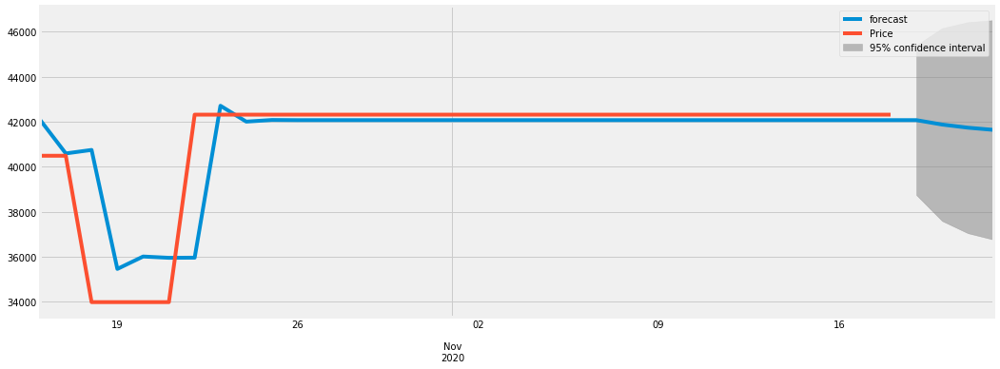

0.9348635493143816
2020-10-16    42088.175321
2020-10-17    40592.527592
2020-10-18    40747.745313
2020-10-19    35463.400546
2020-10-20    36015.432498
2020-10-21    35957.764125
2020-10-22    35963.788489
2020-10-23    42710.417504
2020-10-24    42005.626573
2020-10-25    42079.253010
2020-10-26    42071.561577
2020-10-27    42072.365068
2020-10-28    42072.281131
2020-10-29    42072.289899
2020-10-30    42072.288983
2020-10-31    42072.289079
2020-11-01    42072.289069
2020-11-02    42072.289070
2020-11-03    42072.289070
2020-11-04    42072.289070
2020-11-05    42072.289070
2020-11-06    42072.289070
2020-11-07    42072.289070
2020-11-08    42072.289070
2020-11-09    42072.289070
2020-11-10    42072.289070
2020-11-11    42072.289070
2020-11-12    42072.289070
2020-11-13    42072.289070
2020-11-14    42072.289070
2020-11-15    42072.289070
2020-11-16    42072.289070
2020-11-17    42072.289070
2020-11-18    42072.289070
2020-11-19    42072.289070
2020-11-20    41875.576355
2020-11-2

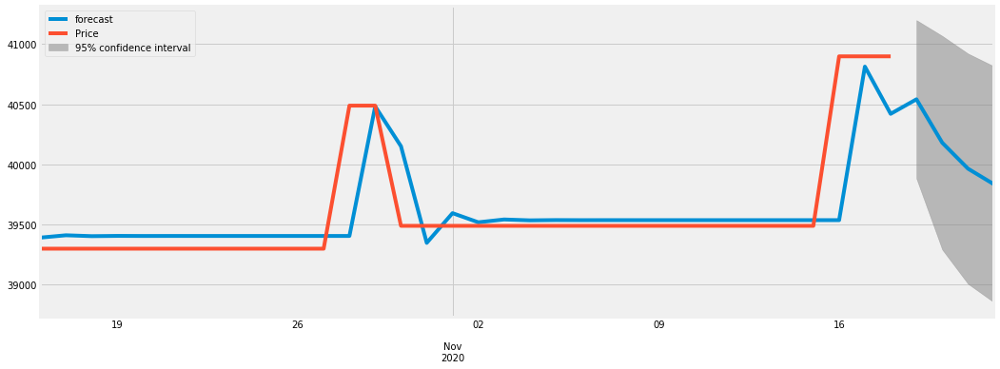

0.9146092920496803
2020-10-16    39390.838109
2020-10-17    39410.504625
2020-10-18    39403.195957
2020-10-19    39405.295414
2020-10-20    39404.636759
2020-10-21    39404.838068
2020-10-22    39404.776039
2020-10-23    39404.795104
2020-10-24    39404.789240
2020-10-25    39404.791043
2020-10-26    39404.790489
2020-10-27    39404.790659
2020-10-28    39404.790607
2020-10-29    40482.647171
2020-10-30    40151.160220
2020-10-31    39347.344817
2020-11-01    39594.552401
2020-11-02    39518.525506
2020-11-03    39541.907024
2020-11-04    39534.716208
2020-11-05    39536.927692
2020-11-06    39536.247566
2020-11-07    39536.456734
2020-11-08    39536.392406
2020-11-09    39536.412189
2020-11-10    39536.406105
2020-11-11    39536.407976
2020-11-12    39536.407401
2020-11-13    39536.407578
2020-11-14    39536.407523
2020-11-15    39536.407540
2020-11-16    39536.407535
2020-11-17    40813.531681
2020-11-18    40420.761435
2020-11-19    40541.555069
2020-11-20    40180.645899
2020-11-2

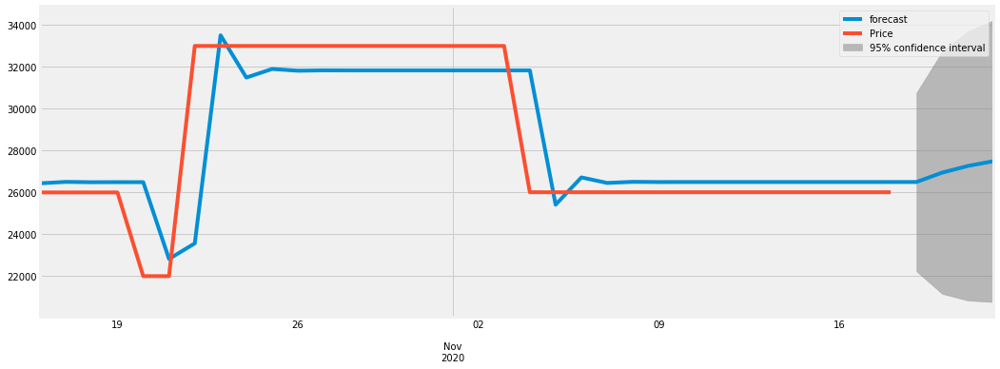

0.9455295107375875
2020-10-16    26426.092933
2020-10-17    26494.199158
2020-10-18    26478.227235
2020-10-19    26481.367458
2020-10-20    26480.725737
2020-10-21    22810.431519
2020-10-22    23555.683153
2020-10-23    33498.027243
2020-10-24    31479.238450
2020-10-25    31889.152667
2020-10-26    31805.919757
2020-10-27    31822.820164
2020-10-28    31819.388544
2020-10-29    31820.085333
2020-10-30    31819.943850
2020-10-31    31819.972578
2020-11-01    31819.966745
2020-11-02    31819.967929
2020-11-03    31819.967689
2020-11-04    31819.967738
2020-11-05    25404.983469
2020-11-06    26707.543331
2020-11-07    26443.059098
2020-11-08    26496.762511
2020-11-09    26485.858055
2020-11-10    26488.072200
2020-11-11    26487.622619
2020-11-12    26487.713906
2020-11-13    26487.695370
2020-11-14    26487.699134
2020-11-15    26487.698370
2020-11-16    26487.698525
2020-11-17    26487.698494
2020-11-18    26487.698500
2020-11-19    26487.698499
2020-11-20    26936.131223
2020-11-2

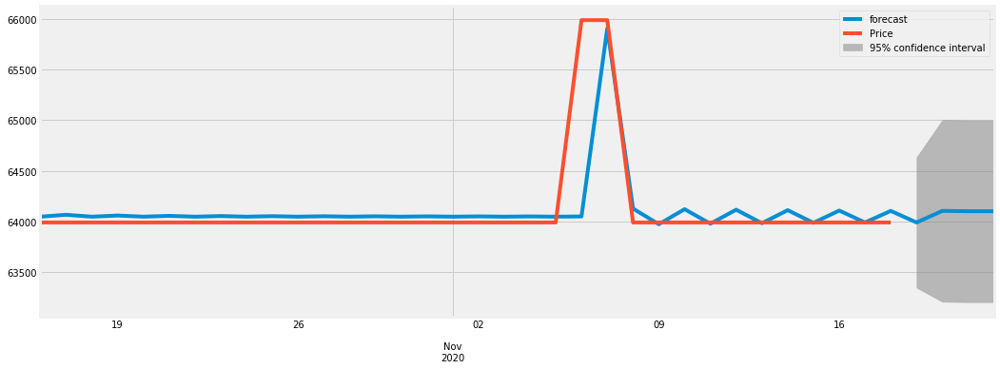

0.5183395725891946
2020-10-16    64047.188446
2020-10-17    64065.893717
2020-10-18    64047.188446
2020-10-19    64058.496446
2020-10-20    64047.188446
2020-10-21    64055.291841
2020-10-22    64047.188446
2020-10-23    64053.502488
2020-10-24    64047.188446
2020-10-25    64052.360434
2020-10-26    64047.188446
2020-10-27    64051.568238
2020-10-28    64047.188446
2020-10-29    64050.986490
2020-10-30    64047.188446
2020-10-31    64050.541163
2020-11-01    64047.188446
2020-11-02    64050.189307
2020-11-03    64047.188446
2020-11-04    64049.904289
2020-11-05    64047.188446
2020-11-06    64049.668716
2020-11-07    65908.308182
2020-11-08    64127.062949
2020-11-09    63972.573994
2020-11-10    64121.158858
2020-11-11    63977.892705
2020-11-12    64116.067518
2020-11-13    63982.503608
2020-11-14    64111.631912
2020-11-15    63986.539178
2020-11-16    64107.733022
2020-11-17    63990.100775
2020-11-18    64104.278991
2020-11-19    63990.097901
2020-11-20    64104.374163
2020-11-2

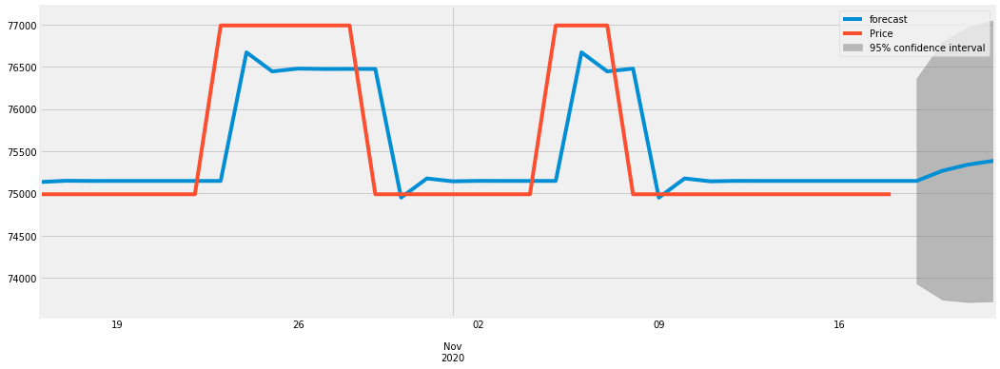

0.8979438485989878
2020-10-16    75135.002151
2020-10-17    75149.701784
2020-10-18    75147.299985
2020-10-19    75147.651019
2020-10-20    75147.598814
2020-10-21    75147.606558
2020-10-22    75147.605409
2020-10-23    75147.605579
2020-10-24    76671.582102
2020-10-25    76445.444093
2020-10-26    76478.999990
2020-10-27    76474.020738
2020-10-28    76474.759593
2020-10-29    76474.649957
2020-10-30    74950.689677
2020-10-31    75176.825276
2020-11-01    75143.269737
2020-11-02    75148.248936
2020-11-03    75147.510088
2020-11-04    75147.619724
2020-11-05    75147.603455
2020-11-06    76671.582417
2020-11-07    76445.444047
2020-11-08    76478.999997
2020-11-09    74950.044189
2020-11-10    75176.921058
2020-11-11    75143.255524
2020-11-12    75148.251045
2020-11-13    75147.509775
2020-11-14    75147.619770
2020-11-15    75147.603448
2020-11-16    75147.605870
2020-11-17    75147.605511
2020-11-18    75147.605564
2020-11-19    75147.605556
2020-11-20    75267.699143
2020-11-2

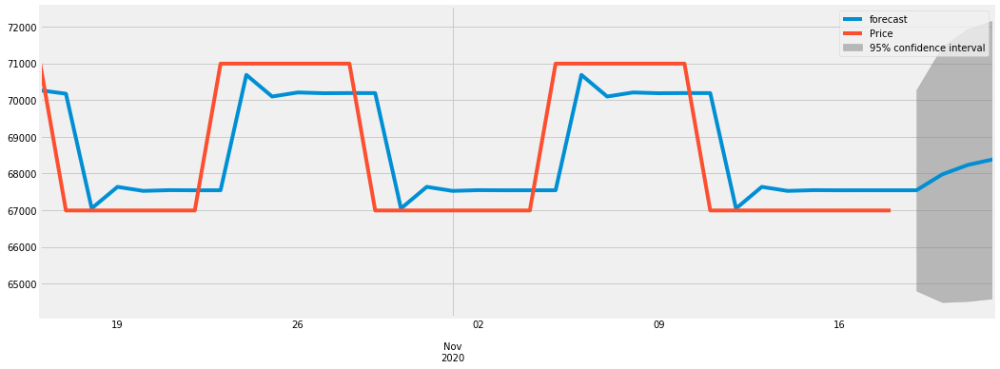

0.8969927254703203
2020-10-16    70263.691646
2020-10-17    70170.759750
2020-10-18    67047.324741
2020-10-19    67632.834551
2020-10-20    67523.009847
2020-10-21    67543.609672
2020-10-22    67539.745743
2020-10-23    67540.470504
2020-10-24    70683.866888
2020-10-25    70094.257384
2020-10-26    70204.850935
2020-10-27    70184.106809
2020-10-28    70187.997802
2020-10-29    70187.267966
2020-10-30    67043.872533
2020-10-31    67633.481859
2020-11-01    67522.888342
2020-11-02    67543.632461
2020-11-03    67539.741469
2020-11-04    67540.471305
2020-11-05    67540.334409
2020-11-06    70683.892415
2020-11-07    70094.252596
2020-11-08    70204.851833
2020-11-09    70184.106641
2020-11-10    70187.997834
2020-11-11    70187.267960
2020-11-12    67043.872534
2020-11-13    67633.481859
2020-11-14    67522.888342
2020-11-15    67543.632461
2020-11-16    67539.741469
2020-11-17    67540.471305
2020-11-18    67540.334409
2020-11-19    67540.360087
2020-11-20    67972.873952
2020-11-2

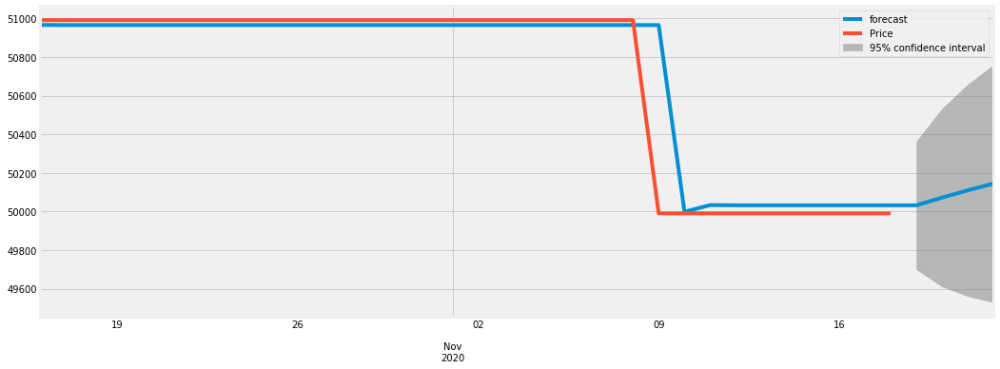

0.995517561240218
2020-10-16    50966.315412
2020-10-17    50965.487899
2020-10-18    50965.518601
2020-10-19    50965.517500
2020-10-20    50965.517540
2020-10-21    50965.517538
2020-10-22    50965.517538
2020-10-23    50965.517538
2020-10-24    50965.517538
2020-10-25    50965.517538
2020-10-26    50965.517538
2020-10-27    50965.517538
2020-10-28    50965.517538
2020-10-29    50965.517538
2020-10-30    50965.517538
2020-10-31    50965.517538
2020-11-01    50965.517538
2020-11-02    50965.517538
2020-11-03    50965.517538
2020-11-04    50965.517538
2020-11-05    50965.517538
2020-11-06    50965.517538
2020-11-07    50965.517538
2020-11-08    50965.517538
2020-11-09    50965.517538
2020-11-10    49998.272851
2020-11-11    50032.995333
2020-11-12    50031.748853
2020-11-13    50031.793600
2020-11-14    50031.791994
2020-11-15    50031.792051
2020-11-16    50031.792049
2020-11-17    50031.792049
2020-11-18    50031.792049
2020-11-19    50031.792049
2020-11-20    50072.174804
2020-11-21

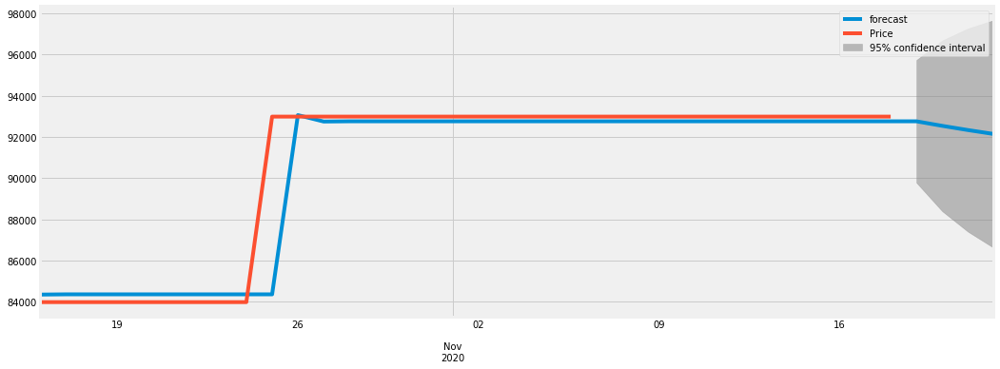

0.9953839137912119
2020-10-16    84355.649302
2020-10-17    84367.891766
2020-10-18    84367.438123
2020-10-19    84367.454369
2020-10-20    84367.453786
2020-10-21    84367.453807
2020-10-22    84367.453806
2020-10-23    84367.453806
2020-10-24    84367.453806
2020-10-25    84367.453806
2020-10-26    93063.301632
2020-10-27    92751.516720
2020-10-28    92762.695599
2020-10-29    92762.294786
2020-10-30    92762.309157
2020-10-31    92762.308642
2020-11-01    92762.308660
2020-11-02    92762.308660
2020-11-03    92762.308660
2020-11-04    92762.308660
2020-11-05    92762.308660
2020-11-06    92762.308660
2020-11-07    92762.308660
2020-11-08    92762.308660
2020-11-09    92762.308660
2020-11-10    92762.308660
2020-11-11    92762.308660
2020-11-12    92762.308660
2020-11-13    92762.308660
2020-11-14    92762.308660
2020-11-15    92762.308660
2020-11-16    92762.308660
2020-11-17    92762.308660
2020-11-18    92762.308660
2020-11-19    92762.308660
2020-11-20    92542.312077
2020-11-2

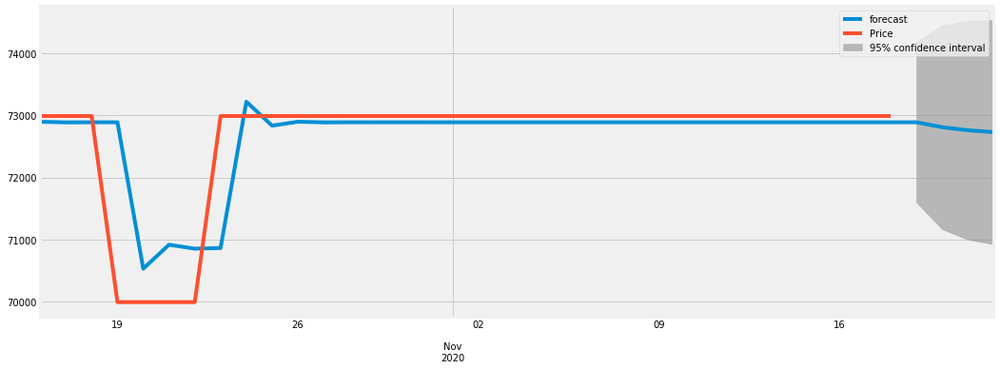

0.9053510311148328
2020-10-16    72898.177309
2020-10-17    72887.724913
2020-10-18    72889.630623
2020-10-19    72889.324384
2020-10-20    70528.599481
2020-10-21    70915.163326
2020-10-22    70851.864272
2020-10-23    70862.229365
2020-10-24    73221.307430
2020-10-25    72835.013130
2020-10-26    72898.268046
2020-10-27    72887.910181
2020-10-28    72889.606260
2020-10-29    72889.328531
2020-10-30    72889.374009
2020-10-31    72889.366562
2020-11-01    72889.367781
2020-11-02    72889.367581
2020-11-03    72889.367614
2020-11-04    72889.367609
2020-11-05    72889.367610
2020-11-06    72889.367609
2020-11-07    72889.367609
2020-11-08    72889.367609
2020-11-09    72889.367609
2020-11-10    72889.367609
2020-11-11    72889.367609
2020-11-12    72889.367609
2020-11-13    72889.367609
2020-11-14    72889.367609
2020-11-15    72889.367609
2020-11-16    72889.367609
2020-11-17    72889.367609
2020-11-18    72889.367609
2020-11-19    72889.367609
2020-11-20    72810.177455
2020-11-2

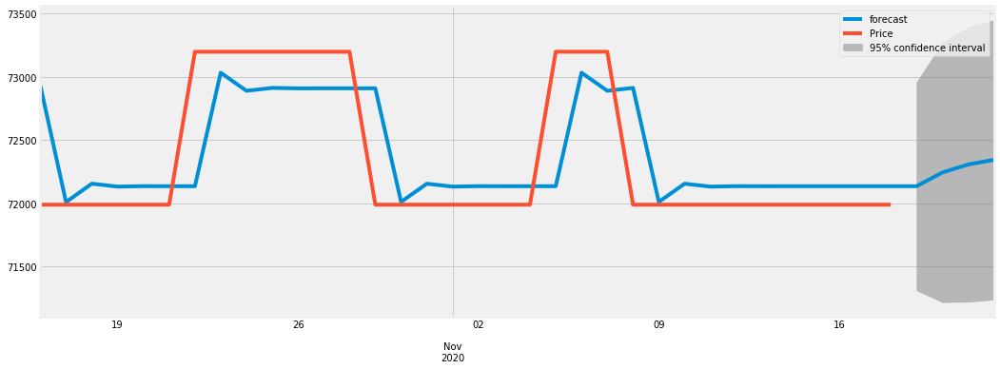

0.8840789235624338
2020-10-16    72933.874392
2020-10-17    72010.426421
2020-10-18    72156.057263
2020-10-19    72132.818140
2020-10-20    72136.526223
2020-10-21    72135.934519
2020-10-22    72136.028937
2020-10-23    73033.656855
2020-10-24    72890.422022
2020-10-25    72913.278060
2020-10-26    72909.630913
2020-10-27    72910.212890
2020-10-28    72910.120023
2020-10-29    72910.134842
2020-10-30    72012.489493
2020-10-31    72155.727108
2020-11-01    72132.870626
2020-11-02    72136.517844
2020-11-03    72135.935856
2020-11-04    72136.028724
2020-11-05    72136.013905
2020-11-06    73033.659254
2020-11-07    72890.421640
2020-11-08    72913.278121
2020-11-09    72011.987919
2020-11-10    72155.807144
2020-11-11    72132.857855
2020-11-12    72136.519882
2020-11-13    72135.935531
2020-11-14    72136.028776
2020-11-15    72136.013897
2020-11-16    72136.016271
2020-11-17    72136.015892
2020-11-18    72136.015953
2020-11-19    72136.015943
2020-11-20    72244.428010
2020-11-2

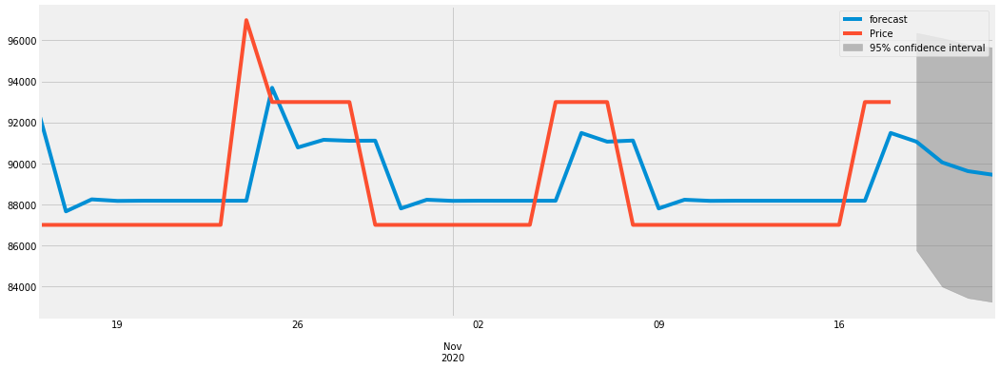

0.7621812436743476
2020-10-16    92240.771127
2020-10-17    87650.783228
2020-10-18    88236.632509
2020-10-19    88161.470658
2020-10-20    88171.112631
2020-10-21    88169.875705
2020-10-22    88170.034384
2020-10-23    88170.014028
2020-10-24    88170.016639
2020-10-25    93686.302754
2020-10-26    90772.129662
2020-10-27    91145.975281
2020-10-28    91098.016377
2020-10-29    91104.168800
2020-10-30    87793.607665
2020-10-31    88218.304049
2020-11-01    88163.821739
2020-11-02    88170.811019
2020-11-03    88169.914397
2020-11-04    88170.029421
2020-11-05    88170.014665
2020-11-06    91479.788428
2020-11-07    91055.193052
2020-11-08    91109.662404
2020-11-09    87792.902916
2020-11-10    88218.394458
2020-11-11    88163.810141
2020-11-12    88170.812507
2020-11-13    88169.914206
2020-11-14    88170.029445
2020-11-15    88170.014662
2020-11-16    88170.016558
2020-11-17    88170.016315
2020-11-18    91479.788216
2020-11-19    91055.193079
2020-11-20    90042.367480
2020-11-2

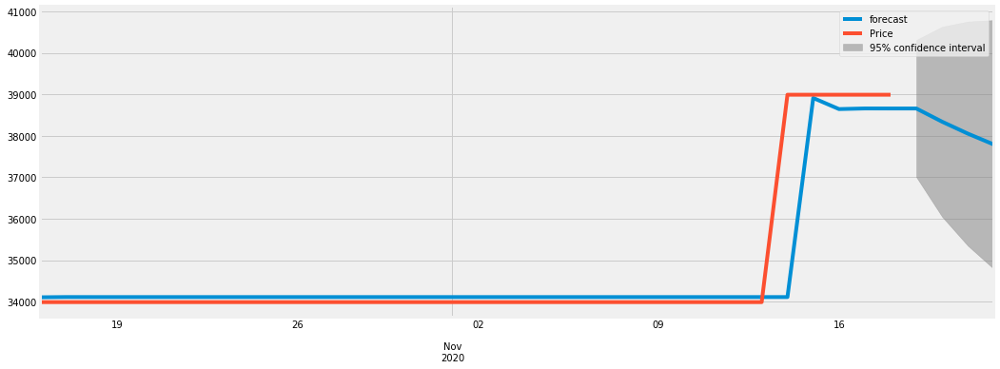

0.9915884093560591
2020-10-16    34106.509240
2020-10-17    34112.422358
2020-10-18    34112.076232
2020-10-19    34112.095459
2020-10-20    34112.094388
2020-10-21    34112.094448
2020-10-22    34112.094444
2020-10-23    34112.094445
2020-10-24    34112.094445
2020-10-25    34112.094445
2020-10-26    34112.094445
2020-10-27    34112.094445
2020-10-28    34112.094445
2020-10-29    34112.094445
2020-10-30    34112.094445
2020-10-31    34112.094445
2020-11-01    34112.094445
2020-11-02    34112.094445
2020-11-03    34112.094445
2020-11-04    34112.094445
2020-11-05    34112.094445
2020-11-06    34112.094445
2020-11-07    34112.094445
2020-11-08    34112.094445
2020-11-09    34112.094445
2020-11-10    34112.094445
2020-11-11    34112.094445
2020-11-12    34112.094445
2020-11-13    34112.094445
2020-11-14    34112.094445
2020-11-15    38911.573489
2020-11-16    38644.201890
2020-11-17    38659.096751
2020-11-18    38658.266981
2020-11-19    38658.313206
2020-11-20    38339.925868
2020-11-2

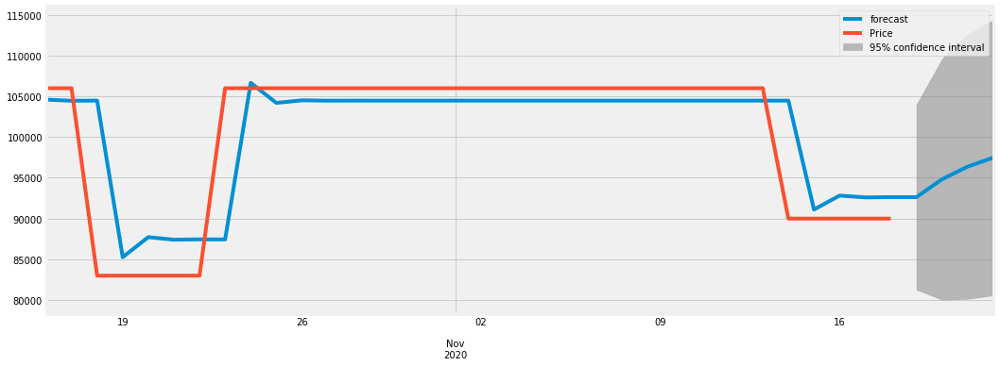

0.939062766280651
2020-10-16    104584.963435
2020-10-17    104449.545802
2020-10-18    104468.534192
2020-10-19     85257.069664
2020-10-20     87714.482378
2020-10-21     87400.144317
2020-10-22     87440.352627
2020-10-23     87435.209412
2020-10-24    106644.940327
2020-10-25    104187.742435
2020-10-26    104502.053005
2020-10-27    104461.848211
2020-10-28    104466.990976
2020-10-29    104466.333144
2020-10-30    104466.417290
2020-10-31    104466.406526
2020-11-01    104466.407903
2020-11-02    104466.407727
2020-11-03    104466.407750
2020-11-04    104466.407747
2020-11-05    104466.407747
2020-11-06    104466.407747
2020-11-07    104466.407747
2020-11-08    104466.407747
2020-11-09    104466.407747
2020-11-10    104466.407747
2020-11-11    104466.407747
2020-11-12    104466.407747
2020-11-13    104466.407747
2020-11-14    104466.407747
2020-11-15     91103.574339
2020-11-16     92812.870853
2020-11-17     92594.227509
2020-11-18     92622.195104
2020-11-19     92618.617650
20

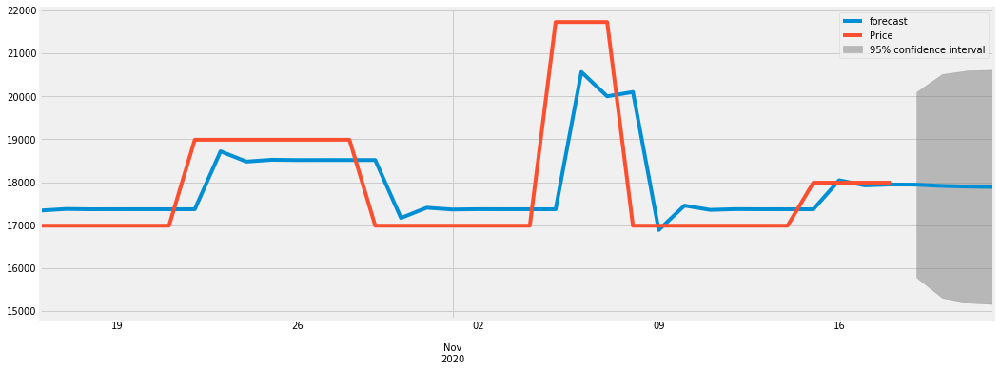

0.837515198739348
2020-10-16    17341.271607
2020-10-17    17378.598839
2020-10-18    17371.292168
2020-10-19    17372.561178
2020-10-20    17372.335805
2020-10-21    17372.375674
2020-10-22    17372.368616
2020-10-23    18720.397715
2020-10-24    18481.785273
2020-10-25    18524.021674
2020-10-26    18516.545477
2020-10-27    18517.868826
2020-10-28    18517.634583
2020-10-29    18517.676046
2020-10-30    17169.640856
2020-10-31    17408.254377
2020-11-01    17366.017785
2020-11-02    17373.494016
2020-11-03    17372.170660
2020-11-04    17372.404905
2020-11-05    17372.363442
2020-11-06    20567.196786
2020-11-07    20001.684521
2020-11-08    20101.784929
2020-11-09    16889.240314
2020-11-10    17457.887622
2020-11-11    17357.232285
2020-11-12    17375.049123
2020-11-13    17371.895393
2020-11-14    17372.453630
2020-11-15    17372.354817
2020-11-16    18046.386233
2020-11-17    17927.077026
2020-11-18    17948.195755
2020-11-19    17944.457563
2020-11-20    17914.423018
2020-11-21

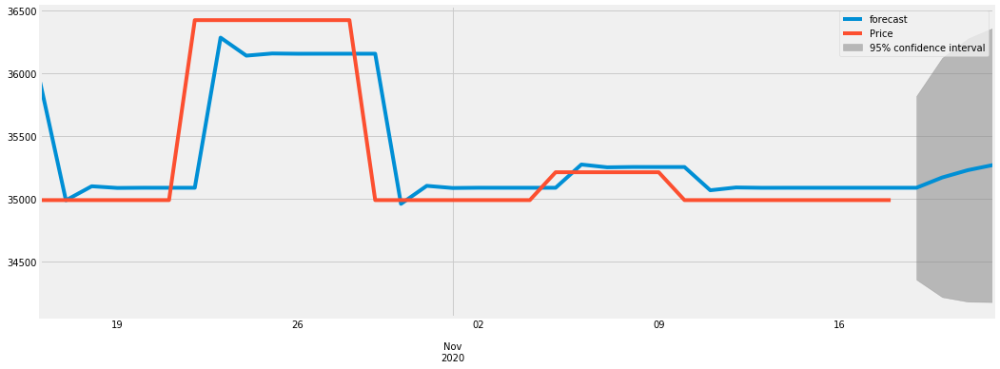

0.9401639408717812
2020-10-16    35928.804027
2020-10-17    34988.364800
2020-10-18    35100.305340
2020-10-19    35086.868626
2020-10-20    35088.481476
2020-10-21    35088.287878
2020-10-22    35088.311117
2020-10-23    36284.590716
2020-10-24    36140.995530
2020-10-25    36158.231950
2020-10-26    36156.162980
2020-10-27    36156.411328
2020-10-28    36156.381518
2020-10-29    36156.385096
2020-10-30    34960.102278
2020-10-31    35103.697850
2020-11-01    35086.461384
2020-11-02    35088.530359
2020-11-03    35088.282010
2020-11-04    35088.311821
2020-11-05    35088.308243
2020-11-06    35273.507201
2020-11-07    35251.276881
2020-11-08    35253.945293
2020-11-09    35253.624990
2020-11-10    35253.663438
2020-11-11    35068.460294
2020-11-12    35090.691117
2020-11-13    35088.022644
2020-11-14    35088.342954
2020-11-15    35088.304506
2020-11-16    35088.309121
2020-11-17    35088.308567
2020-11-18    35088.308633
2020-11-19    35088.308625
2020-11-20    35170.320395
2020-11-2

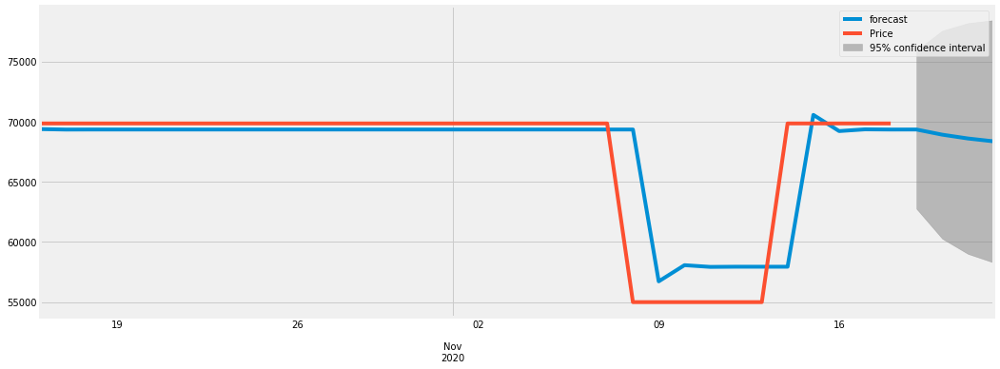

0.95013206866501
2020-10-16    69374.528706
2020-10-17    69335.528262
2020-10-18    69340.034950
2020-10-19    69339.558349
2020-10-20    69339.609250
2020-10-21    69339.603820
2020-10-22    69339.604399
2020-10-23    69339.604337
2020-10-24    69339.604344
2020-10-25    69339.604343
2020-10-26    69339.604343
2020-10-27    69339.604343
2020-10-28    69339.604343
2020-10-29    69339.604343
2020-10-30    69339.604343
2020-10-31    69339.604343
2020-11-01    69339.604343
2020-11-02    69339.604343
2020-11-03    69339.604343
2020-11-04    69339.604343
2020-11-05    69339.604343
2020-11-06    69339.604343
2020-11-07    69339.604343
2020-11-08    69339.604343
2020-11-09    56714.942655
2020-11-10    58061.994998
2020-11-11    57918.264413
2020-11-12    57933.600477
2020-11-13    57931.964118
2020-11-14    57932.138718
2020-11-15    70556.781775
2020-11-16    69209.731420
2020-11-17    69353.461794
2020-11-18    69338.125752
2020-11-19    69339.762109
2020-11-20    68911.027338
2020-11-21 

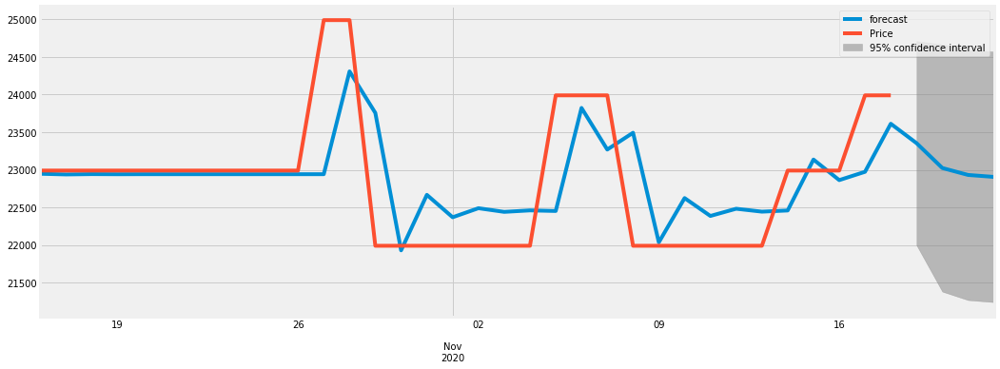

0.7605411178529062
2020-10-16    22947.342729
2020-10-17    22938.401502
2020-10-18    22942.731427
2020-10-19    22941.132149
2020-10-20    22941.799540
2020-10-21    22941.533777
2020-10-22    22941.641667
2020-10-23    22941.598204
2020-10-24    22941.615768
2020-10-25    22941.608679
2020-10-26    22941.611542
2020-10-27    22941.610386
2020-10-28    24308.374690
2020-10-29    23756.556325
2020-10-30    21929.202097
2020-10-31    22666.979356
2020-11-01    22369.108656
2020-11-02    22489.371178
2020-11-03    22440.816304
2020-11-04    22460.419883
2020-11-05    22452.505120
2020-11-06    23822.464470
2020-11-07    23269.356135
2020-11-08    23492.668476
2020-11-09    22035.744360
2020-11-10    22623.963910
2020-11-11    22386.475742
2020-11-12    22482.359379
2020-11-13    22443.647253
2020-11-14    22459.276914
2020-11-15    23136.348502
2020-11-16    22862.987151
2020-11-17    22973.354252
2020-11-18    23612.176481
2020-11-19    23354.257953
2020-11-20    23023.935538
2020-11-2

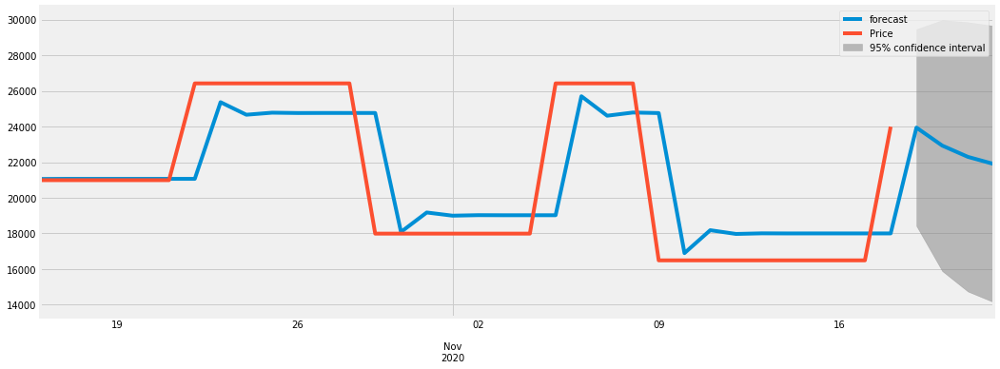

0.9086073748394781
2020-10-16    21057.894179
2020-10-17    21065.657320
2020-10-18    21064.243117
2020-10-19    21064.470064
2020-10-20    21064.432837
2020-10-21    21064.438922
2020-10-22    21064.437926
2020-10-23    25365.428552
2020-10-24    24662.063984
2020-10-25    24777.089046
2020-10-26    24758.278368
2020-10-27    24761.354581
2020-10-28    24760.851511
2020-10-29    24760.933781
2020-10-30    18084.129572
2020-10-31    19176.023955
2020-11-01    18997.460483
2020-11-02    19026.661946
2020-11-03    19021.886471
2020-11-04    19022.667430
2020-11-05    19022.539716
2020-11-06    25699.351356
2020-11-07    24607.455758
2020-11-08    24786.019429
2020-11-09    24756.817933
2020-11-10    16896.902513
2020-11-11    18182.277556
2020-11-12    17972.073131
2020-11-13    18006.449013
2020-11-14    18000.827336
2020-11-15    18001.746680
2020-11-16    18001.596335
2020-11-17    18001.620922
2020-11-18    18001.616901
2020-11-19    23941.118289
2020-11-20    22931.088016
2020-11-2

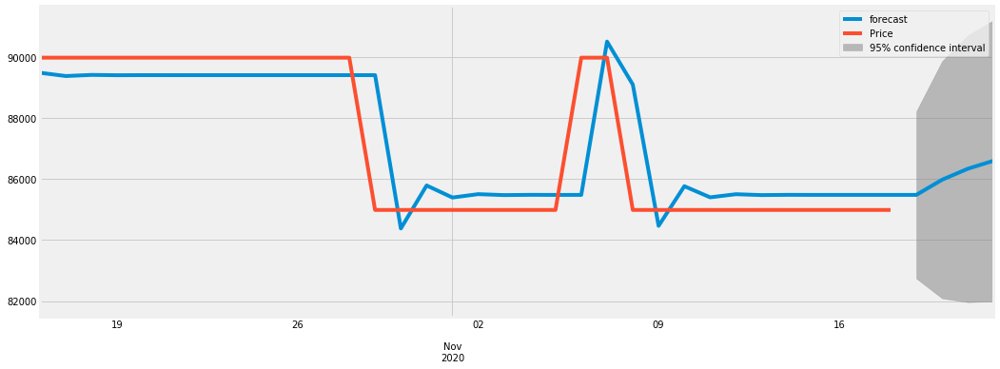

0.9490697585235289
2020-10-16    89494.654237
2020-10-17    89387.131720
2020-10-18    89423.682554
2020-10-19    89414.057172
2020-10-20    89416.802195
2020-10-21    89416.036088
2020-10-22    89416.251212
2020-10-23    89416.190908
2020-10-24    89416.207821
2020-10-25    89416.203078
2020-10-26    89416.204408
2020-10-27    89416.204035
2020-10-28    89416.204140
2020-10-29    89416.204110
2020-10-30    84381.725824
2020-10-31    85793.528034
2020-11-01    85397.620978
2020-11-02    85508.643893
2020-11-03    85477.510102
2020-11-04    85486.240848
2020-11-05    85483.792514
2020-11-06    85484.479092
2020-11-07    90518.764851
2020-11-08    89107.016631
2020-11-09    84468.430254
2020-11-10    85769.213796
2020-11-11    85404.439340
2020-11-12    85506.731842
2020-11-13    85478.046292
2020-11-14    85486.090486
2020-11-15    85483.834679
2020-11-16    85484.467268
2020-11-17    85484.289873
2020-11-18    85484.339619
2020-11-19    85484.325669
2020-11-20    85982.063952
2020-11-2

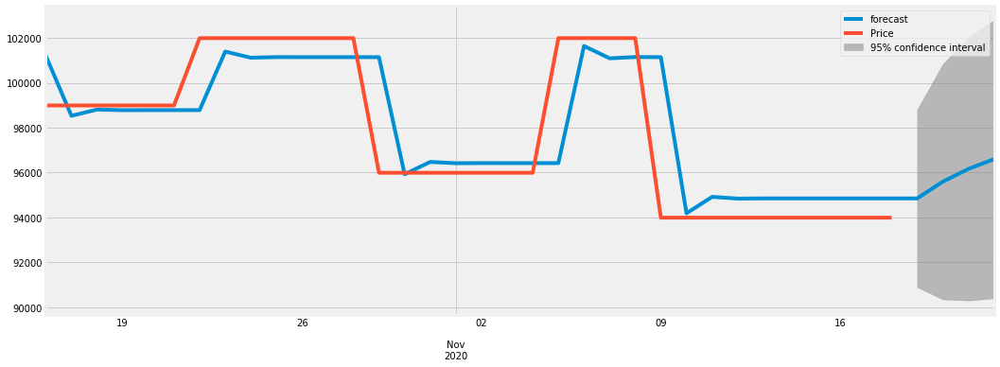

0.958467609860471
2020-10-16    101201.890951
2020-10-17     98528.664399
2020-10-18     98808.433934
2020-10-19     98778.984636
2020-10-20     98782.084966
2020-10-21     98781.758575
2020-10-22     98781.792936
2020-10-23    101391.203094
2020-10-24    101116.494019
2020-10-25    101145.414377
2020-10-26    101142.369748
2020-10-27    101142.690275
2020-10-28    101142.656531
2020-10-29    101142.660084
2020-10-30     95923.832158
2020-10-31     96473.251111
2020-11-01     96415.410310
2020-11-02     96421.499576
2020-11-03     96420.858521
2020-11-04     96420.926009
2020-11-05     96420.918904
2020-11-06    101639.747204
2020-11-07    101090.328212
2020-11-08    101148.169016
2020-11-09    101142.079750
2020-11-10     94184.284070
2020-11-11     94916.775133
2020-11-12     94839.661176
2020-11-13     94847.779448
2020-11-14     94846.924787
2020-11-15     94847.014762
2020-11-16     94847.005290
2020-11-17     94847.006287
2020-11-18     94847.006182
2020-11-19     94847.006193
20

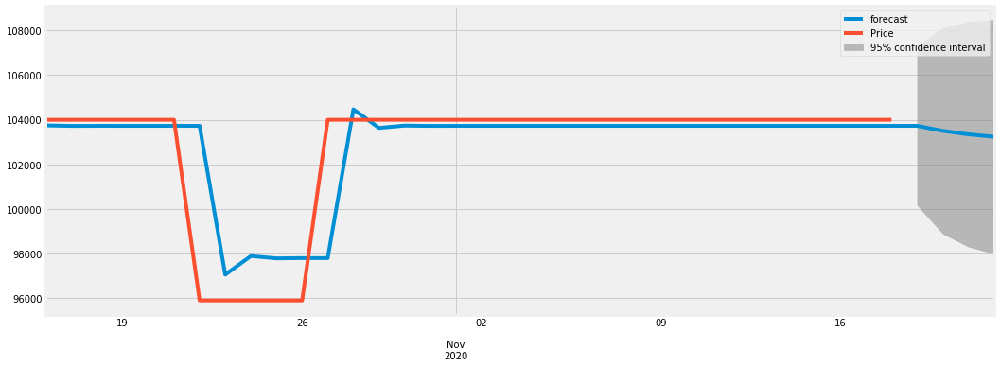

0.9342344021438008
2020-10-16    103748.700962
2020-10-17    103725.323084
2020-10-18    103728.510635
2020-10-19    103728.117567
2020-10-20    103728.166678
2020-10-21    103728.160552
2020-10-22    103728.161316
2020-10-23     97059.116983
2020-10-24     97891.156077
2020-10-25     97787.349741
2020-10-26     97800.300762
2020-10-27     97798.684975
2020-10-28    104467.930800
2020-10-29    103635.866568
2020-10-30    103739.676040
2020-10-31    103726.724628
2020-11-01    103728.340464
2020-11-02    103728.138870
2020-11-03    103728.164021
2020-11-04    103728.160883
2020-11-05    103728.161275
2020-11-06    103728.161226
2020-11-07    103728.161232
2020-11-08    103728.161231
2020-11-09    103728.161231
2020-11-10    103728.161231
2020-11-11    103728.161231
2020-11-12    103728.161231
2020-11-13    103728.161231
2020-11-14    103728.161231
2020-11-15    103728.161231
2020-11-16    103728.161231
2020-11-17    103728.161231
2020-11-18    103728.161231
2020-11-19    103728.161231
2

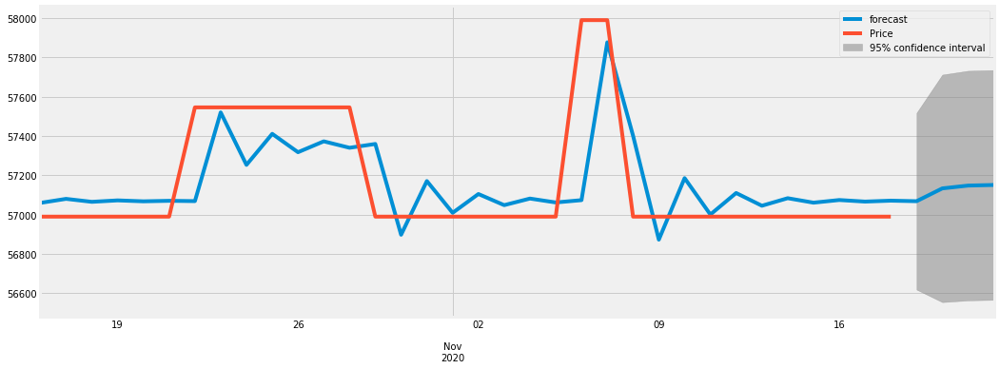

0.7305915977934669
2020-10-16    57059.847801
2020-10-17    57080.417687
2020-10-18    57065.323710
2020-10-19    57072.655800
2020-10-20    57067.919383
2020-10-21    57070.556509
2020-10-22    57068.944407
2020-10-23    57520.369104
2020-10-24    57253.337652
2020-10-25    57411.326774
2020-10-26    57317.854340
2020-10-27    57373.158794
2020-10-28    57340.437532
2020-10-29    57359.797550
2020-10-30    56897.781941
2020-10-31    57171.139314
2020-11-01    57009.403955
2020-11-02    57105.096734
2020-11-03    57048.478885
2020-11-04    57081.977555
2020-11-05    57062.157641
2020-11-06    57073.884345
2020-11-07    57877.307758
2020-11-08    57401.952086
2020-11-09    56872.840644
2020-11-10    57185.896152
2020-11-11    57000.672882
2020-11-12    57110.262584
2020-11-13    57045.422444
2020-11-14    57083.785937
2020-11-15    57061.087689
2020-11-16    57074.517396
2020-11-17    57066.571539
2020-11-18    57071.272806
2020-11-19    57068.491242
2020-11-20    57133.743283
2020-11-2

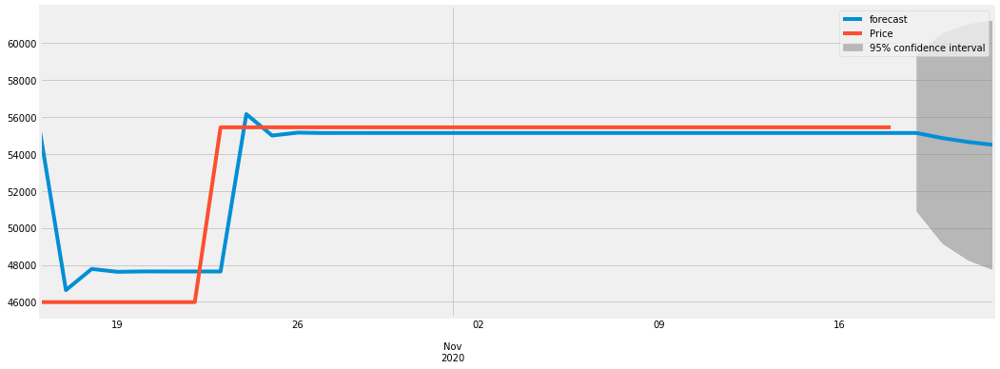

0.959173418130972
2020-10-16    55151.644495
2020-10-17    46638.660692
2020-10-18    47781.710577
2020-10-19    47626.194363
2020-10-20    47647.349389
2020-10-21    47644.471498
2020-10-22    47644.862998
2020-10-23    47644.809740
2020-10-24    56142.893711
2020-10-25    54986.836703
2020-10-26    55144.103660
2020-10-27    55122.709476
2020-10-28    55125.619885
2020-10-29    55125.223961
2020-10-30    55125.277821
2020-10-31    55125.270494
2020-11-01    55125.271491
2020-11-02    55125.271355
2020-11-03    55125.271374
2020-11-04    55125.271371
2020-11-05    55125.271372
2020-11-06    55125.271371
2020-11-07    55125.271371
2020-11-08    55125.271371
2020-11-09    55125.271371
2020-11-10    55125.271371
2020-11-11    55125.271371
2020-11-12    55125.271371
2020-11-13    55125.271371
2020-11-14    55125.271371
2020-11-15    55125.271371
2020-11-16    55125.271371
2020-11-17    55125.271371
2020-11-18    55125.271371
2020-11-19    55125.271371
2020-11-20    54850.077500
2020-11-21

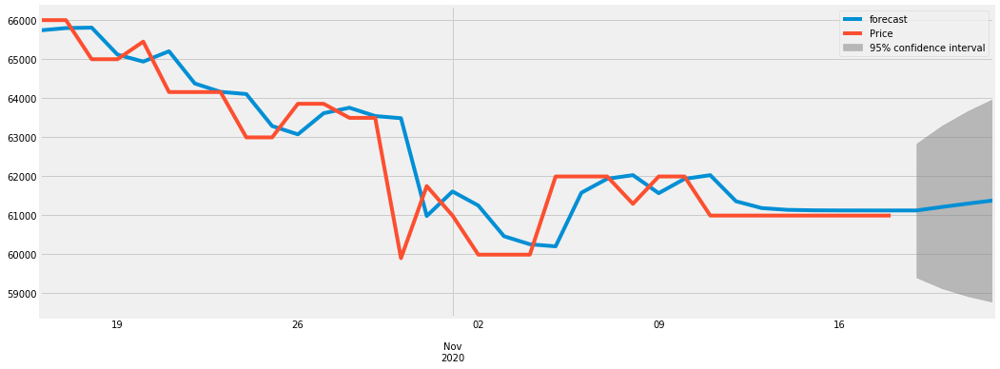

0.9788981778834971
2020-10-16    65727.698349
2020-10-17    65786.537913
2020-10-18    65798.370425
2020-10-19    65108.473231
2020-10-20    64929.014875
2020-10-21    65194.050492
2020-10-22    64369.387177
2020-10-23    64154.811923
2020-10-24    64098.979994
2020-10-25    63280.883145
2020-10-26    63068.016448
2020-10-27    63608.378901
2020-10-28    63748.979822
2020-10-29    63536.180175
2020-10-30    63480.810253
2020-10-31    60979.494009
2020-11-01    61606.749137
2020-11-02    61246.946385
2020-11-03    60460.594285
2020-11-04    60255.987491
2020-11-05    60202.749329
2020-11-06    61574.361594
2020-11-07    61931.251579
2020-11-08    62024.113436
2020-11-09    61563.363208
2020-11-10    61928.389827
2020-11-11    62023.368815
2020-11-12    61355.349754
2020-11-13    61181.532912
2020-11-14    61136.306217
2020-11-15    61124.538347
2020-11-16    61121.476378
2020-11-17    61120.679661
2020-11-18    61120.472357
2020-11-19    61120.418418
2020-11-20    61210.749439
2020-11-2

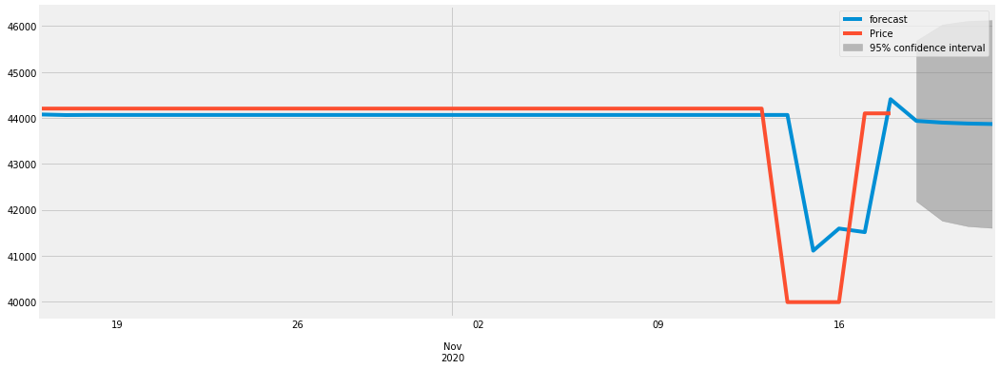

0.8591684725352852
2020-10-16    44076.424686
2020-10-17    44063.371843
2020-10-18    44065.716578
2020-10-19    44065.340745
2020-10-20    44065.402175
2020-10-21    44065.392166
2020-10-22    44065.393797
2020-10-23    44065.393531
2020-10-24    44065.393575
2020-10-25    44065.393568
2020-10-26    44065.393569
2020-10-27    44065.393569
2020-10-28    44065.393569
2020-10-29    44065.393569
2020-10-30    44065.393569
2020-10-31    44065.393569
2020-11-01    44065.393569
2020-11-02    44065.393569
2020-11-03    44065.393569
2020-11-04    44065.393569
2020-11-05    44065.393569
2020-11-06    44065.393569
2020-11-07    44065.393569
2020-11-08    44065.393569
2020-11-09    44065.393569
2020-11-10    44065.393569
2020-11-11    44065.393569
2020-11-12    44065.393569
2020-11-13    44065.393569
2020-11-14    44065.393569
2020-11-15    41110.697817
2020-11-16    41592.334768
2020-11-17    41513.824433
2020-11-18    44408.397116
2020-11-19    43936.560664
2020-11-20    43898.876030
2020-11-2

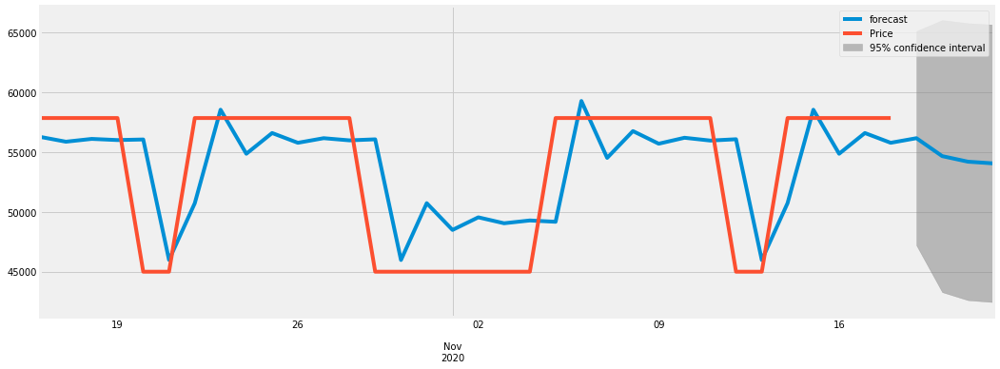

0.7801706600578068
2020-10-16    56281.844862
2020-10-17    55878.009005
2020-10-18    56112.650980
2020-10-19    56015.586030
2020-10-20    56063.809909
2020-10-21    45977.933383
2020-10-22    50728.278298
2020-10-23    58555.331282
2020-10-24    54868.128759
2020-10-25    56605.126486
2020-10-26    55786.847255
2020-10-27    56172.329315
2020-10-28    55990.733128
2020-10-29    56076.281026
2020-10-30    45971.041673
2020-10-31    50731.504775
2020-11-01    48488.904856
2020-11-02    49545.368122
2020-11-03    49047.680316
2020-11-04    49282.135370
2020-11-05    49171.686266
2020-11-06    59288.656296
2020-11-07    54522.667004
2020-11-08    56767.870248
2020-11-09    55710.180585
2020-11-10    56208.446132
2020-11-11    55973.718911
2020-11-12    56084.296230
2020-11-13    45967.265800
2020-11-14    50733.283546
2020-11-15    58553.005613
2020-11-16    54869.223658
2020-11-17    56604.611358
2020-11-18    55787.089988
2020-11-19    56172.214989
2020-11-20    54670.860595
2020-11-2

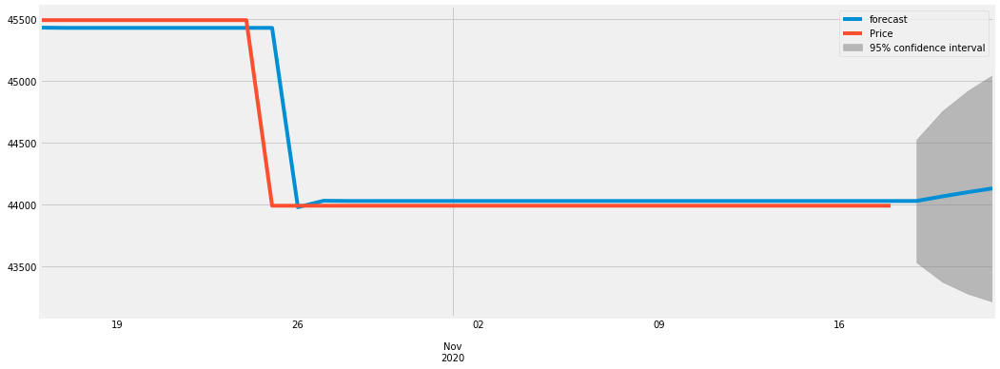

0.9953793103848663
2020-10-16    45429.337135
2020-10-17    45427.303400
2020-10-18    45427.378859
2020-10-19    45427.376153
2020-10-20    45427.376250
2020-10-21    45427.376247
2020-10-22    45427.376247
2020-10-23    45427.376247
2020-10-24    45427.376247
2020-10-25    45427.376247
2020-10-26    43977.954472
2020-10-27    44029.988914
2020-10-28    44028.120870
2020-10-29    44028.187933
2020-10-30    44028.185526
2020-10-31    44028.185612
2020-11-01    44028.185609
2020-11-02    44028.185609
2020-11-03    44028.185609
2020-11-04    44028.185609
2020-11-05    44028.185609
2020-11-06    44028.185609
2020-11-07    44028.185609
2020-11-08    44028.185609
2020-11-09    44028.185609
2020-11-10    44028.185609
2020-11-11    44028.185609
2020-11-12    44028.185609
2020-11-13    44028.185609
2020-11-14    44028.185609
2020-11-15    44028.185609
2020-11-16    44028.185609
2020-11-17    44028.185609
2020-11-18    44028.185609
2020-11-19    44028.185609
2020-11-20    44065.083645
2020-11-2

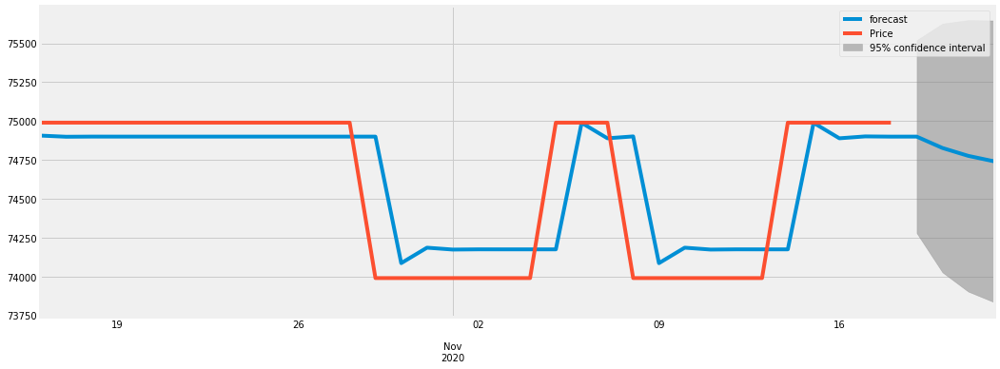

0.9307896819341358
2020-10-16    74906.733692
2020-10-17    74899.214378
2020-10-18    74900.215483
2020-10-19    74900.094571
2020-10-20    74900.109357
2020-10-21    74900.107552
2020-10-22    74900.107772
2020-10-23    74900.107745
2020-10-24    74900.107749
2020-10-25    74900.107748
2020-10-26    74900.107748
2020-10-27    74900.107748
2020-10-28    74900.107748
2020-10-29    74900.107748
2020-10-30    74086.156270
2020-10-31    74185.560791
2020-11-01    74173.420929
2020-11-02    74174.903520
2020-11-03    74174.722457
2020-11-04    74174.744569
2020-11-05    74174.741869
2020-11-06    74988.693677
2020-11-07    74889.289116
2020-11-08    74901.428983
2020-11-09    74085.994913
2020-11-10    74185.580497
2020-11-11    74173.418522
2020-11-12    74174.903814
2020-11-13    74174.722421
2020-11-14    74174.744574
2020-11-15    74988.693347
2020-11-16    74889.289156
2020-11-17    74901.428978
2020-11-18    74899.946392
2020-11-19    74900.127454
2020-11-20    74826.953450
2020-11-2

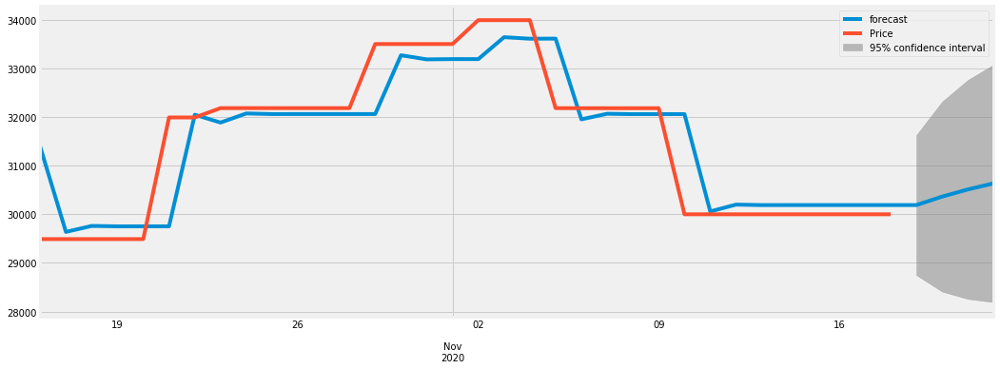

0.9805818468522356
2020-10-16    31390.401749
2020-10-17    29638.368038
2020-10-18    29760.622016
2020-10-19    29752.057150
2020-10-20    29752.657173
2020-10-21    29752.615137
2020-10-22    32045.738864
2020-10-23    31885.090748
2020-10-24    32072.456861
2020-10-25    32059.330656
2020-10-26    32060.250231
2020-10-27    32060.185809
2020-10-28    32060.190322
2020-10-29    32060.190006
2020-10-30    33268.206056
2020-10-31    33183.576736
2020-11-01    33189.505566
2020-11-02    33189.090213
2020-11-03    33639.488232
2020-11-04    33607.934944
2020-11-05    33610.145456
2020-11-06    31951.605646
2020-11-07    32065.962567
2020-11-08    32057.951126
2020-11-09    32058.512380
2020-11-10    32058.473060
2020-11-11    30058.874493
2020-11-12    30198.959277
2020-11-13    30189.145434
2020-11-14    30189.832957
2020-11-15    30189.784792
2020-11-16    30189.788166
2020-11-17    30189.787930
2020-11-18    30189.787946
2020-11-19    30189.787945
2020-11-20    30363.870618
2020-11-2

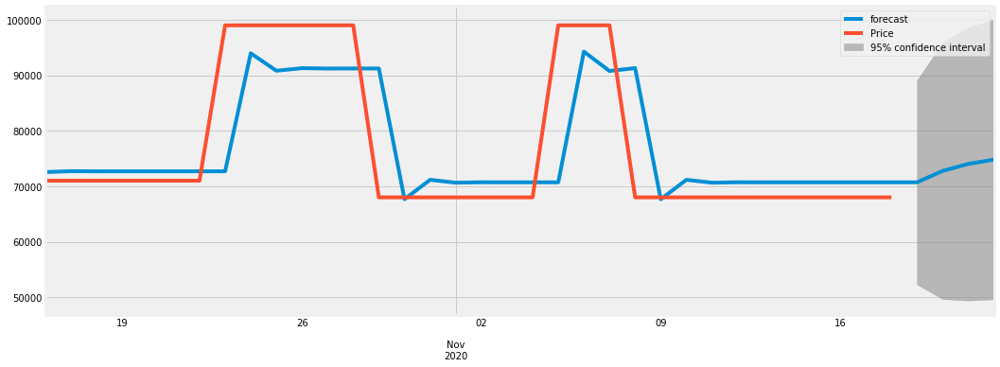

0.8970180364592214
2020-10-16    72550.130474
2020-10-17    72707.774974
2020-10-18    72682.045344
2020-10-19    72685.803078
2020-10-20    72685.244687
2020-10-21    72685.327452
2020-10-22    72685.315180
2020-10-23    72685.316999
2020-10-24    93968.150542
2020-10-25    90812.575922
2020-10-26    91280.448359
2020-10-27    91211.077596
2020-10-28    91221.363098
2020-10-29    91219.838082
2020-10-30    67657.740862
2020-10-31    71151.258575
2020-11-01    70633.279810
2020-11-02    70710.079764
2020-11-03    70698.692748
2020-11-04    70700.381084
2020-11-05    70700.130757
2020-11-06    94262.491204
2020-11-07    90768.934463
2020-11-08    91286.919014
2020-11-09    67647.794870
2020-11-10    71152.733253
2020-11-11    70633.061162
2020-11-12    70710.112183
2020-11-13    70698.687941
2020-11-14    70700.381797
2020-11-15    70700.130651
2020-11-16    70700.167888
2020-11-17    70700.162367
2020-11-18    70700.163186
2020-11-19    70700.163064
2020-11-20    72759.425849
2020-11-2

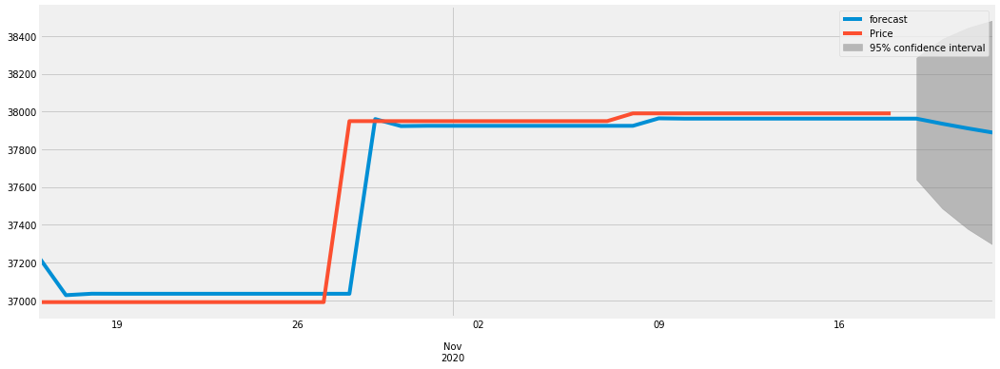

0.9949502103067849
2020-10-16    37218.825483
2020-10-17    37026.862673
2020-10-18    37034.578849
2020-10-19    37034.268165
2020-10-20    37034.280675
2020-10-21    37034.280171
2020-10-22    37034.280191
2020-10-23    37034.280190
2020-10-24    37034.280190
2020-10-25    37034.280190
2020-10-26    37034.280190
2020-10-27    37034.280190
2020-10-28    37034.280190
2020-10-29    37959.966543
2020-10-30    37922.695208
2020-10-31    37924.195881
2020-11-01    37924.135459
2020-11-02    37924.137891
2020-11-03    37924.137794
2020-11-04    37924.137797
2020-11-05    37924.137797
2020-11-06    37924.137797
2020-11-07    37924.137797
2020-11-08    37924.137797
2020-11-09    37963.713543
2020-11-10    37962.120087
2020-11-11    37962.184245
2020-11-12    37962.181662
2020-11-13    37962.181766
2020-11-14    37962.181762
2020-11-15    37962.181762
2020-11-16    37962.181762
2020-11-17    37962.181762
2020-11-18    37962.181762
2020-11-19    37962.181762
2020-11-20    37935.329871
2020-11-2

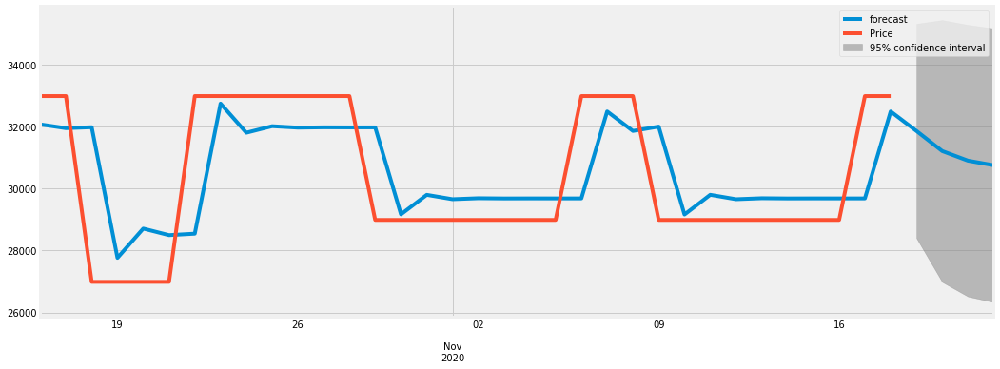

0.8389024452094112
2020-10-16    32076.959461
2020-10-17    31953.633214
2020-10-18    31984.960824
2020-10-19    27765.569454
2020-10-20    28710.699317
2020-10-21    28498.980942
2020-10-22    28546.407809
2020-10-23    32748.434770
2020-10-24    31807.141110
2020-10-25    32017.999765
2020-10-26    31970.765438
2020-10-27    31981.346373
2020-10-28    31978.976144
2020-10-29    31979.507097
2020-10-30    29170.954140
2020-10-31    29800.096484
2020-11-01    29659.162667
2020-11-02    29690.733171
2020-11-03    29683.661080
2020-11-04    29685.245295
2020-11-05    29684.890416
2020-11-06    29684.969912
2020-11-07    32493.386123
2020-11-08    31864.274411
2020-11-09    32005.201367
2020-11-10    29165.198381
2020-11-11    29801.385829
2020-11-12    29658.873842
2020-11-13    29690.797870
2020-11-14    29683.646587
2020-11-15    29685.248542
2020-11-16    29684.889689
2020-11-17    29684.970075
2020-11-18    32493.386087
2020-11-19    31864.274420
2020-11-20    31214.819861
2020-11-2

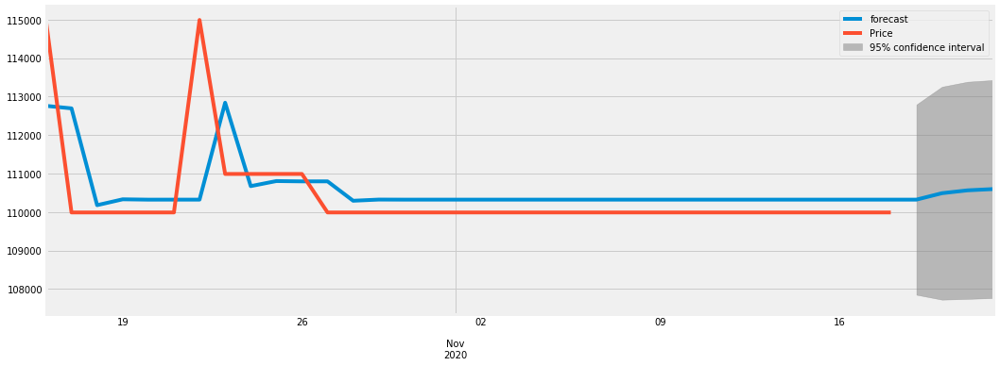

0.7366479154657126
2020-10-16    112759.457837
2020-10-17    112693.515577
2020-10-18    110179.309772
2020-10-19    110331.397039
2020-10-20    110322.197069
2020-10-21    110322.753588
2020-10-22    110322.719924
2020-10-23    112841.035588
2020-10-24    110674.048283
2020-10-25    110805.132346
2020-10-26    110797.202890
2020-10-27    110797.682554
2020-10-28    110293.990813
2020-10-29    110324.459824
2020-10-30    110322.616711
2020-10-31    110322.728203
2020-11-01    110322.721459
2020-11-02    110322.721867
2020-11-03    110322.721842
2020-11-04    110322.721844
2020-11-05    110322.721844
2020-11-06    110322.721844
2020-11-07    110322.721844
2020-11-08    110322.721844
2020-11-09    110322.721844
2020-11-10    110322.721844
2020-11-11    110322.721844
2020-11-12    110322.721844
2020-11-13    110322.721844
2020-11-14    110322.721844
2020-11-15    110322.721844
2020-11-16    110322.721844
2020-11-17    110322.721844
2020-11-18    110322.721844
2020-11-19    110322.721844
2

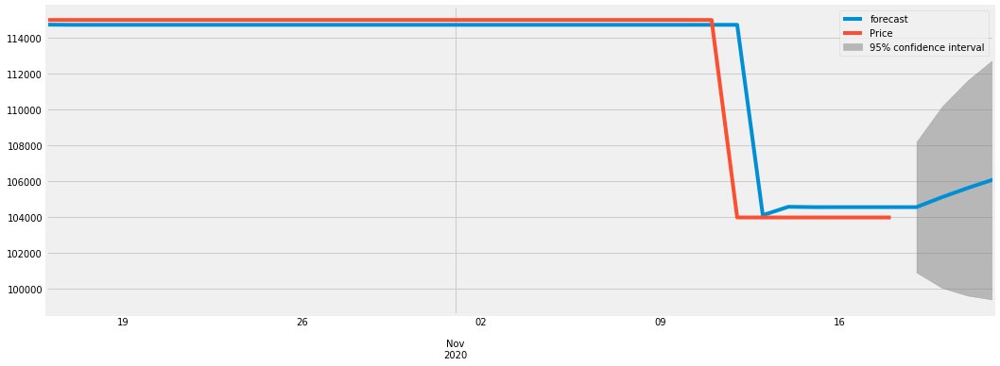

0.9939913196426273
2020-10-16    114729.320795
2020-10-17    114718.701455
2020-10-18    114719.188478
2020-10-19    114719.167055
2020-10-20    114719.167999
2020-10-21    114719.167958
2020-10-22    114719.167960
2020-10-23    114719.167959
2020-10-24    114719.167959
2020-10-25    114719.167959
2020-10-26    114719.167959
2020-10-27    114719.167959
2020-10-28    114719.167959
2020-10-29    114719.167959
2020-10-30    114719.167959
2020-10-31    114719.167959
2020-11-01    114719.167959
2020-11-02    114719.167959
2020-11-03    114719.167959
2020-11-04    114719.167959
2020-11-05    114719.167959
2020-11-06    114719.167959
2020-11-07    114719.167959
2020-11-08    114719.167959
2020-11-09    114719.167959
2020-11-10    114719.167959
2020-11-11    114719.167959
2020-11-12    114719.167959
2020-11-13    104117.640772
2020-11-14    104584.816891
2020-11-15    104564.229902
2020-11-16    104565.137106
2020-11-17    104565.097129
2020-11-18    104565.098890
2020-11-19    104565.098813
2

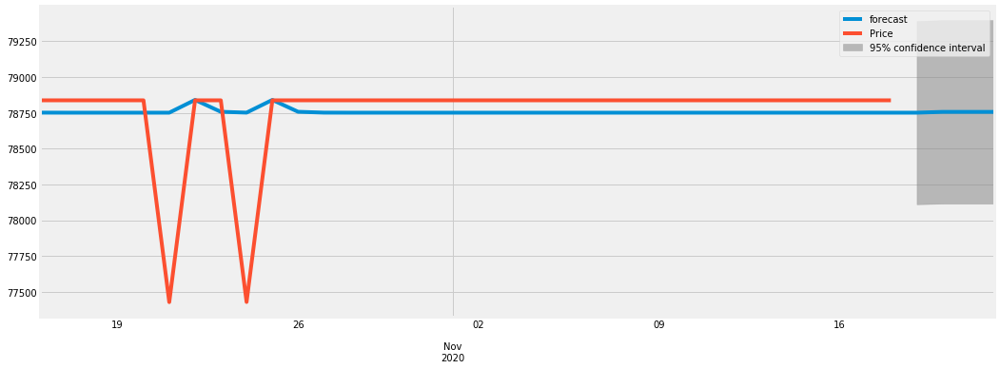

-0.13002637010840412
2020-10-16    78752.046925
2020-10-17    78751.667741
2020-10-18    78751.641081
2020-10-19    78751.639215
2020-10-20    78751.639084
2020-10-21    78751.639075
2020-10-22    78840.897818
2020-10-23    78757.887028
2020-10-24    78752.076420
2020-10-25    78840.865127
2020-10-26    78757.884740
2020-10-27    78752.076260
2020-10-28    78751.669676
2020-10-29    78751.641216
2020-10-30    78751.639224
2020-10-31    78751.639085
2020-11-01    78751.639075
2020-11-02    78751.639074
2020-11-03    78751.639074
2020-11-04    78751.639074
2020-11-05    78751.639074
2020-11-06    78751.639074
2020-11-07    78751.639074
2020-11-08    78751.639074
2020-11-09    78751.639074
2020-11-10    78751.639074
2020-11-11    78751.639074
2020-11-12    78751.639074
2020-11-13    78751.639074
2020-11-14    78751.639074
2020-11-15    78751.639074
2020-11-16    78751.639074
2020-11-17    78751.639074
2020-11-18    78751.639074
2020-11-19    78751.639074
2020-11-20    78757.106073
2020-11

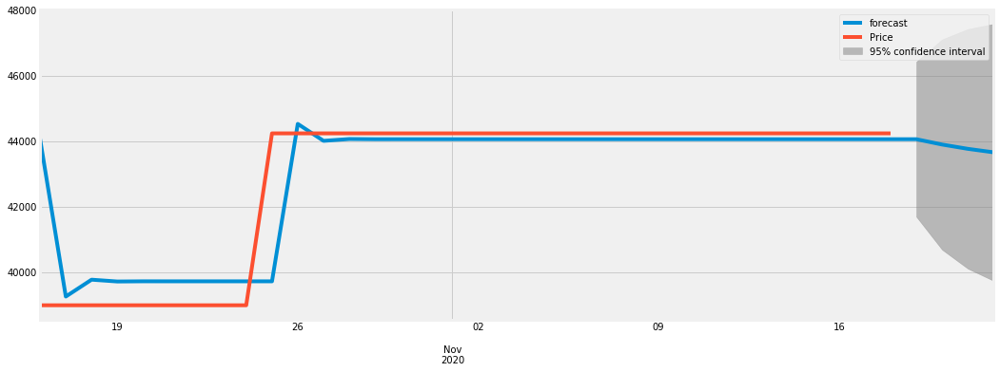

0.9711944591828139
2020-10-16    44076.342412
2020-10-17    39256.478457
2020-10-18    39771.657927
2020-10-19    39716.111652
2020-10-20    39722.100235
2020-10-21    39721.454580
2020-10-22    39721.524191
2020-10-23    39721.516686
2020-10-24    39721.517495
2020-10-25    39721.517408
2020-10-26    44531.214219
2020-10-27    44012.660769
2020-10-28    44068.568177
2020-10-29    44062.540566
2020-10-30    44063.190428
2020-10-31    44063.120364
2020-11-01    44063.127918
2020-11-02    44063.127103
2020-11-03    44063.127191
2020-11-04    44063.127182
2020-11-05    44063.127183
2020-11-06    44063.127183
2020-11-07    44063.127183
2020-11-08    44063.127183
2020-11-09    44063.127183
2020-11-10    44063.127183
2020-11-11    44063.127183
2020-11-12    44063.127183
2020-11-13    44063.127183
2020-11-14    44063.127183
2020-11-15    44063.127183
2020-11-16    44063.127183
2020-11-17    44063.127183
2020-11-18    44063.127183
2020-11-19    44063.127183
2020-11-20    43900.203107
2020-11-2

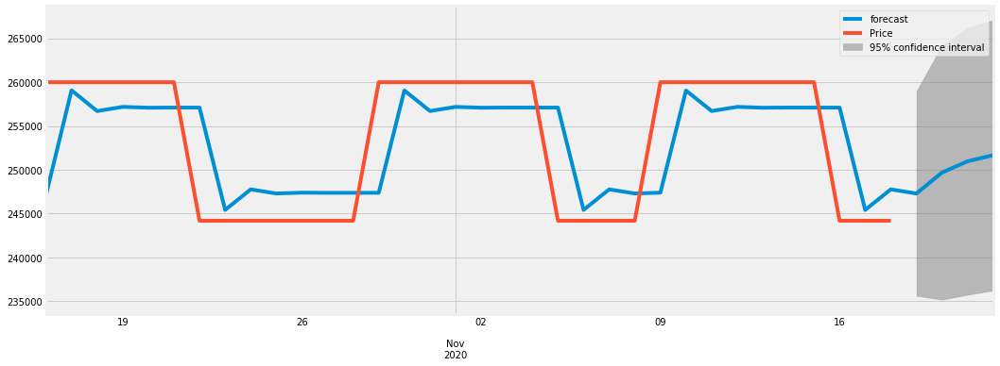

0.8680224668722857
2020-10-16    247076.498679
2020-10-17    259063.340110
2020-10-18    256701.221424
2020-10-19    257175.574724
2020-10-20    257080.356574
2020-10-21    257099.474141
2020-10-22    257095.635931
2020-10-23    245425.912620
2020-10-24    247768.844121
2020-10-25    247298.453532
2020-10-26    247392.893897
2020-10-27    247373.933096
2020-10-28    247377.739858
2020-10-29    247376.975574
2020-10-30    259047.622929
2020-10-31    256704.505908
2020-11-01    257174.933743
2020-11-02    257080.485900
2020-11-03    257099.448203
2020-11-04    257095.641140
2020-11-05    257096.405484
2020-11-06    245425.758117
2020-11-07    247768.875140
2020-11-08    247298.447304
2020-11-09    247392.895147
2020-11-10    259044.426754
2020-11-11    256705.147604
2020-11-12    257174.804910
2020-11-13    257080.511766
2020-11-14    257099.443010
2020-11-15    257095.642182
2020-11-16    257096.405275
2020-11-17    245425.758159
2020-11-18    247768.875132
2020-11-19    247298.447306
2

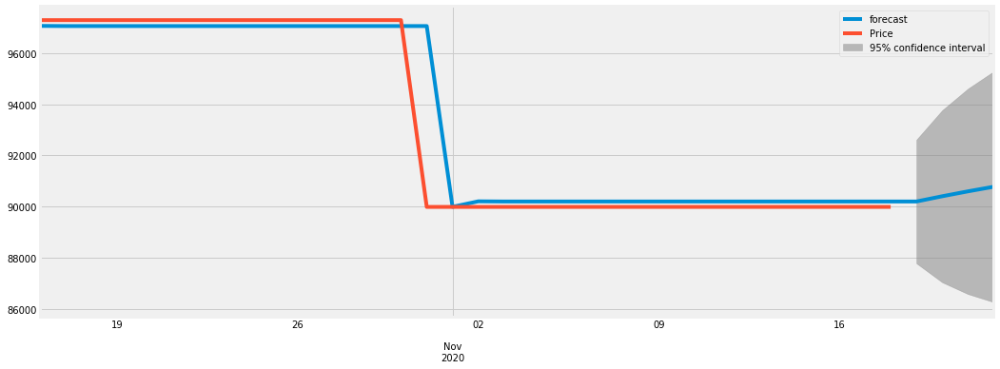

0.9964031241138981
2020-10-16    97065.640136
2020-10-17    97059.191163
2020-10-18    97059.393076
2020-10-19    97059.386935
2020-10-20    97059.387122
2020-10-21    97059.387116
2020-10-22    97059.387117
2020-10-23    97059.387117
2020-10-24    97059.387117
2020-10-25    97059.387117
2020-10-26    97059.387117
2020-10-27    97059.387117
2020-10-28    97059.387117
2020-10-29    97059.387117
2020-10-30    97059.387117
2020-10-31    97059.387117
2020-11-01    89993.018160
2020-11-02    90208.106592
2020-11-03    90201.559660
2020-11-04    90201.758938
2020-11-05    90201.752872
2020-11-06    90201.753057
2020-11-07    90201.753051
2020-11-08    90201.753051
2020-11-09    90201.753051
2020-11-10    90201.753051
2020-11-11    90201.753051
2020-11-12    90201.753051
2020-11-13    90201.753051
2020-11-14    90201.753051
2020-11-15    90201.753051
2020-11-16    90201.753051
2020-11-17    90201.753051
2020-11-18    90201.753051
2020-11-19    90201.753051
2020-11-20    90406.701030
2020-11-2

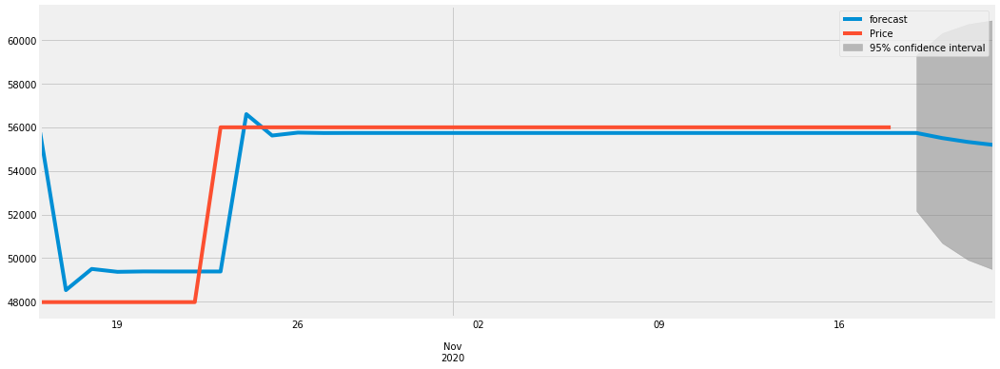

0.9591815940267773
2020-10-16    55753.150677
2020-10-17    48539.621646
2020-10-18    49507.927721
2020-10-19    49376.222944
2020-10-20    49394.133863
2020-10-21    49391.697976
2020-10-22    49392.029255
2020-10-23    49391.984201
2020-10-24    56592.869216
2020-10-25    55613.553932
2020-10-26    55746.740120
2020-10-27    55728.626892
2020-10-28    55731.090278
2020-10-29    55730.755259
2020-10-30    55730.800822
2020-10-31    55730.794625
2020-11-01    55730.795468
2020-11-02    55730.795353
2020-11-03    55730.795369
2020-11-04    55730.795367
2020-11-05    55730.795367
2020-11-06    55730.795367
2020-11-07    55730.795367
2020-11-08    55730.795367
2020-11-09    55730.795367
2020-11-10    55730.795367
2020-11-11    55730.795367
2020-11-12    55730.795367
2020-11-13    55730.795367
2020-11-14    55730.795367
2020-11-15    55730.795367
2020-11-16    55730.795367
2020-11-17    55730.795367
2020-11-18    55730.795367
2020-11-19    55730.795367
2020-11-20    55497.482721
2020-11-2

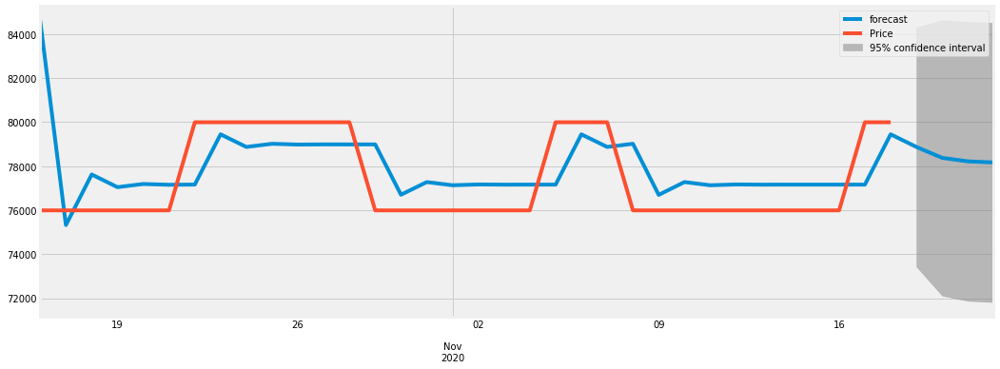

0.7358199784553603
2020-10-16    84616.808360
2020-10-17    75323.144621
2020-10-18    77619.360239
2020-10-19    77043.361910
2020-10-20    77187.873875
2020-10-21    77151.609894
2020-10-22    77160.709688
2020-10-23    79441.886954
2020-10-24    78869.461927
2020-10-25    79013.102852
2020-10-26    78977.058454
2020-10-27    78986.103220
2020-10-28    78983.833580
2020-10-29    78984.403110
2020-10-30    76700.799477
2020-10-31    77273.833363
2020-11-01    77130.039655
2020-11-02    77166.122391
2020-11-03    77157.068004
2020-11-04    77159.340058
2020-11-05    77158.769922
2020-11-06    79442.373708
2020-11-07    78869.339784
2020-11-08    79013.133501
2020-11-09    76693.590044
2020-11-10    77275.642455
2020-11-11    77129.585692
2020-11-12    77166.236306
2020-11-13    77157.039419
2020-11-14    77159.347231
2020-11-15    77158.768123
2020-11-16    77158.913441
2020-11-17    77158.876975
2020-11-18    79442.346845
2020-11-19    78869.346524
2020-11-20    78373.389762
2020-11-2

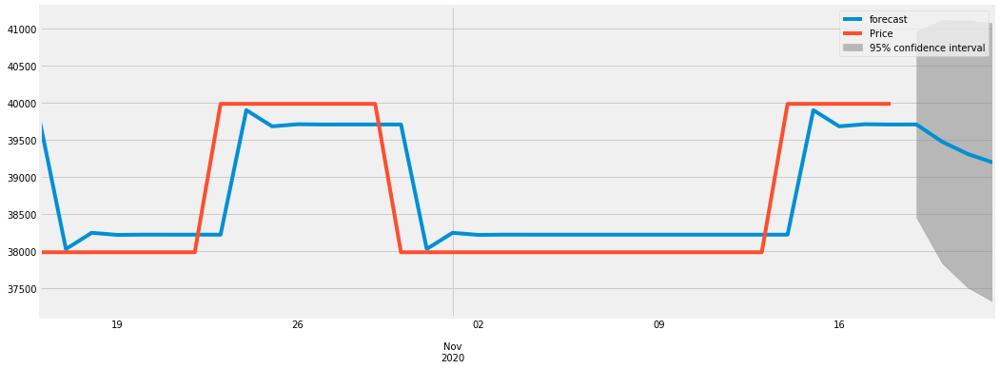

0.938006871280298
2020-10-16    39733.982619
2020-10-17    38033.024940
2020-10-18    38251.997335
2020-10-19    38223.520674
2020-10-20    38227.223770
2020-10-21    38226.742207
2020-10-22    38226.804831
2020-10-23    38226.796687
2020-10-24    39905.156673
2020-10-25    39686.897700
2020-10-26    39715.280752
2020-10-27    39711.589735
2020-10-28    39712.069726
2020-10-29    39712.007306
2020-10-30    39712.015423
2020-10-31    38033.655441
2020-11-01    38251.914414
2020-11-02    38223.531362
2020-11-03    38227.222379
2020-11-04    38226.742388
2020-11-05    38226.804808
2020-11-06    38226.796690
2020-11-07    38226.797746
2020-11-08    38226.797609
2020-11-09    38226.797626
2020-11-10    38226.797624
2020-11-11    38226.797624
2020-11-12    38226.797624
2020-11-13    38226.797624
2020-11-14    38226.797624
2020-11-15    39905.156551
2020-11-16    39686.897715
2020-11-17    39715.280750
2020-11-18    39711.589735
2020-11-19    39712.069726
2020-11-20    39478.773928
2020-11-21

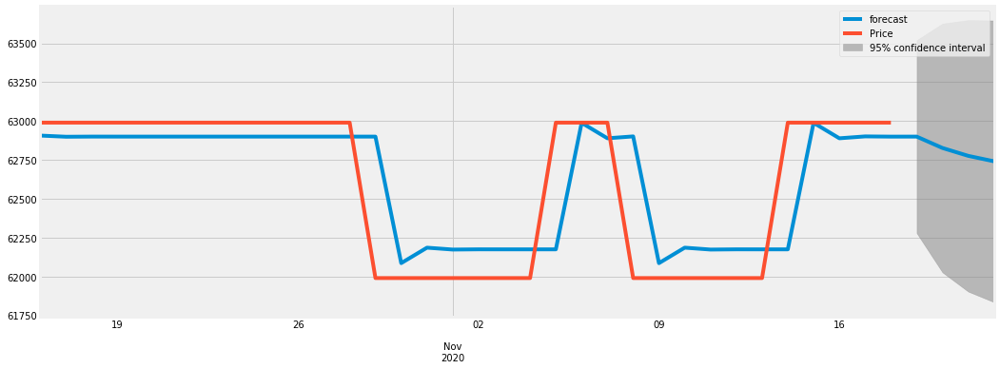

0.9307878011045503
2020-10-16    62906.700348
2020-10-17    62899.177907
2020-10-18    62900.179458
2020-10-19    62900.058489
2020-10-20    62900.073283
2020-10-21    62900.071476
2020-10-22    62900.071697
2020-10-23    62900.071670
2020-10-24    62900.071673
2020-10-25    62900.071673
2020-10-26    62900.071673
2020-10-27    62900.071673
2020-10-28    62900.071673
2020-10-29    62900.071673
2020-10-30    62086.129378
2020-10-31    62185.535596
2020-11-01    62173.395182
2020-11-02    62174.877882
2020-11-03    62174.696801
2020-11-04    62174.718917
2020-11-05    62174.716216
2020-11-06    62988.658840
2020-11-07    62889.252582
2020-11-08    62901.393001
2020-11-09    62085.968005
2020-11-10    62185.555304
2020-11-11    62173.392775
2020-11-12    62174.878176
2020-11-13    62174.696765
2020-11-14    62174.718921
2020-11-15    62988.658510
2020-11-16    62889.252623
2020-11-17    62901.392996
2020-11-18    62899.910300
2020-11-19    62900.091381
2020-11-20    62826.888838
2020-11-2

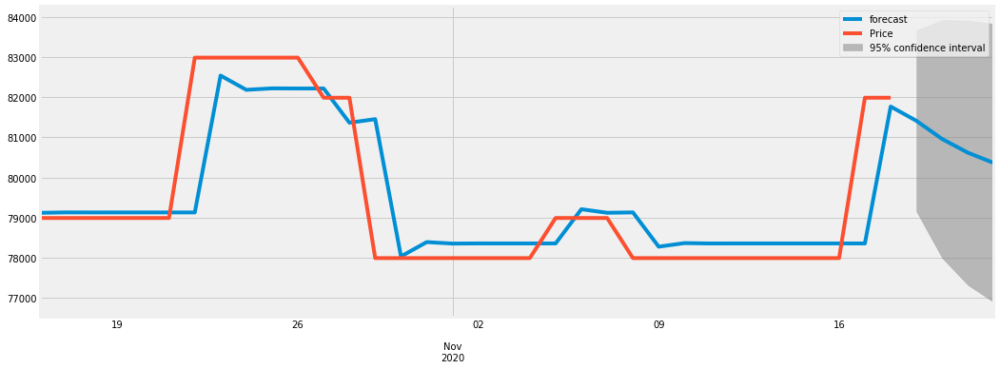

0.9529451788625988
2020-10-16    79119.020586
2020-10-17    79129.562398
2020-10-18    79128.372899
2020-10-19    79128.495931
2020-10-20    79128.483084
2020-10-21    79128.484424
2020-10-22    79128.484285
2020-10-23    82543.192705
2020-10-24    82186.967271
2020-10-25    82224.129027
2020-10-26    82220.252279
2020-10-27    82220.656705
2020-10-28    81366.937413
2020-10-29    81455.998173
2020-10-30    78031.998869
2020-10-31    78389.193536
2020-11-01    78351.930669
2020-11-02    78355.817965
2020-11-03    78355.412439
2020-11-04    78355.454744
2020-11-05    78355.450330
2020-11-06    79209.127892
2020-11-07    79120.071486
2020-11-08    79129.361930
2020-11-09    78274.715641
2020-11-10    78363.873106
2020-11-11    78354.572119
2020-11-12    78355.542406
2020-11-13    78355.441185
2020-11-14    78355.451745
2020-11-15    78355.450643
2020-11-16    78355.450758
2020-11-17    78355.450746
2020-11-18    81770.159153
2020-11-19    81413.933721
2020-11-20    80959.320884
2020-11-2

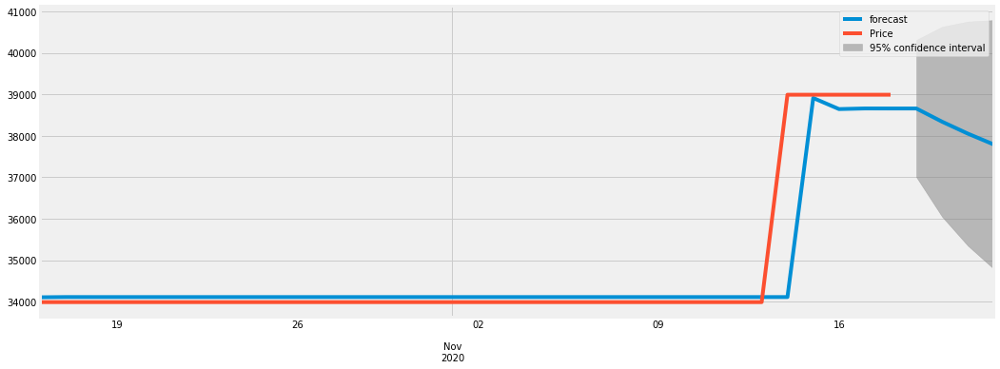

0.9915884093560591
2020-10-16    34106.509240
2020-10-17    34112.422358
2020-10-18    34112.076232
2020-10-19    34112.095459
2020-10-20    34112.094388
2020-10-21    34112.094448
2020-10-22    34112.094444
2020-10-23    34112.094445
2020-10-24    34112.094445
2020-10-25    34112.094445
2020-10-26    34112.094445
2020-10-27    34112.094445
2020-10-28    34112.094445
2020-10-29    34112.094445
2020-10-30    34112.094445
2020-10-31    34112.094445
2020-11-01    34112.094445
2020-11-02    34112.094445
2020-11-03    34112.094445
2020-11-04    34112.094445
2020-11-05    34112.094445
2020-11-06    34112.094445
2020-11-07    34112.094445
2020-11-08    34112.094445
2020-11-09    34112.094445
2020-11-10    34112.094445
2020-11-11    34112.094445
2020-11-12    34112.094445
2020-11-13    34112.094445
2020-11-14    34112.094445
2020-11-15    38911.573489
2020-11-16    38644.201890
2020-11-17    38659.096751
2020-11-18    38658.266981
2020-11-19    38658.313206
2020-11-20    38339.925868
2020-11-2

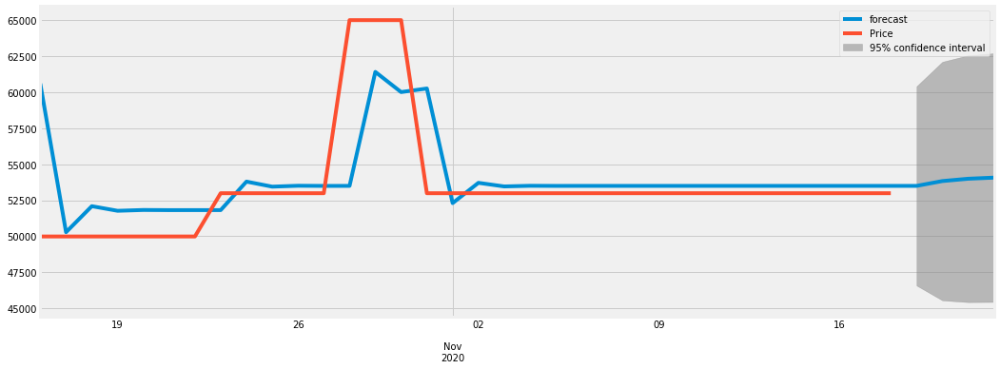

0.8259309036851261
2020-10-16    60593.661164
2020-10-17    50286.529369
2020-10-18    52089.854234
2020-10-19    51770.664192
2020-10-20    51827.154603
2020-10-21    51817.156095
2020-10-22    51818.925757
2020-10-23    51818.612539
2020-10-24    53794.510970
2020-10-25    53444.790926
2020-10-26    53506.688900
2020-10-27    53495.733396
2020-10-28    53497.672443
2020-10-29    61400.701217
2020-10-30    60001.921036
2020-10-31    60249.495232
2020-11-01    52302.304379
2020-11-02    53708.900936
2020-11-03    53459.943297
2020-11-04    53504.007037
2020-11-05    53496.208067
2020-11-06    53497.588430
2020-11-07    53497.344115
2020-11-08    53497.387357
2020-11-09    53497.379704
2020-11-10    53497.381058
2020-11-11    53497.380818
2020-11-12    53497.380861
2020-11-13    53497.380853
2020-11-14    53497.380855
2020-11-15    53497.380855
2020-11-16    53497.380855
2020-11-17    53497.380855
2020-11-18    53497.380855
2020-11-19    53497.380855
2020-11-20    53831.549157
2020-11-2

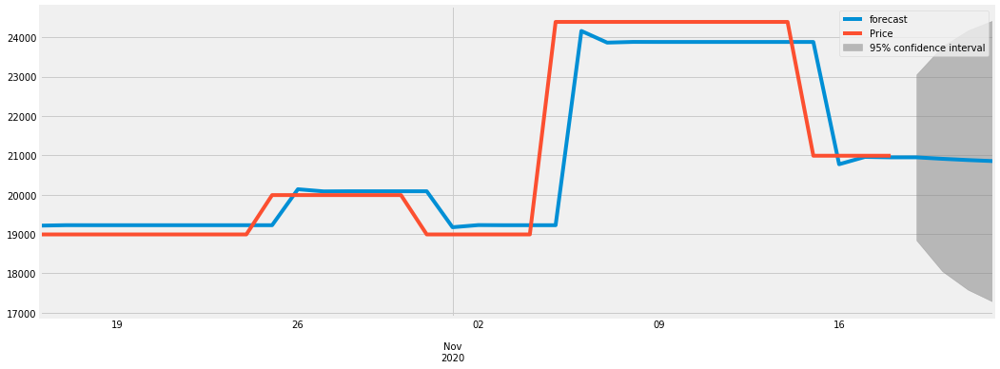

0.9816764810287638
2020-10-16    19213.813719
2020-10-17    19225.443934
2020-10-18    19224.710046
2020-10-19    19224.753932
2020-10-20    19224.751299
2020-10-21    19224.751457
2020-10-22    19224.751447
2020-10-23    19224.751448
2020-10-24    19224.751448
2020-10-25    19224.751448
2020-10-26    20138.680287
2020-10-27    20083.857940
2020-10-28    20087.146478
2020-10-29    20086.949214
2020-10-30    20086.961047
2020-10-31    20086.960337
2020-11-01    19173.031541
2020-11-02    19227.853885
2020-11-03    19224.565347
2020-11-04    19224.762611
2020-11-05    19224.750778
2020-11-06    24159.967220
2020-11-07    23863.926504
2020-11-08    23881.684612
2020-11-09    23880.619385
2020-11-10    23880.683283
2020-11-11    23880.679451
2020-11-12    23880.679680
2020-11-13    23880.679667
2020-11-14    23880.679667
2020-11-15    23880.679667
2020-11-16    20773.321614
2020-11-17    20959.717593
2020-11-18    20948.536564
2020-11-19    20949.207262
2020-11-20    20911.885371
2020-11-2

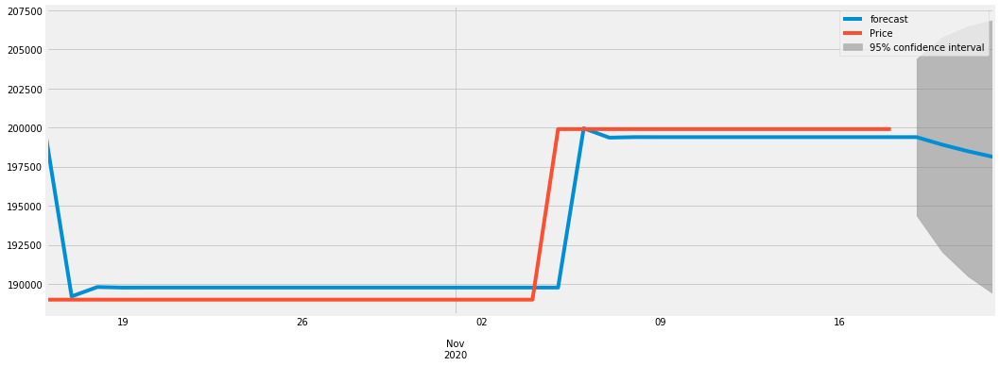

0.9851207163077093
2020-10-16    199410.630512
2020-10-17    189197.398882
2020-10-18    189797.482068
2020-10-19    189762.125347
2020-10-20    189764.208546
2020-10-21    189764.085805
2020-10-22    189764.093037
2020-10-23    189764.092611
2020-10-24    189764.092636
2020-10-25    189764.092634
2020-10-26    189764.092634
2020-10-27    189764.092634
2020-10-28    189764.092634
2020-10-29    189764.092634
2020-10-30    189764.092634
2020-10-31    189764.092634
2020-11-01    189764.092634
2020-11-02    189764.092634
2020-11-03    189764.092634
2020-11-04    189764.092634
2020-11-05    189764.092634
2020-11-06    199953.558300
2020-11-07    199353.199974
2020-11-08    199388.572793
2020-11-09    199386.488644
2020-11-10    199386.611441
2020-11-11    199386.604205
2020-11-12    199386.604632
2020-11-13    199386.604607
2020-11-14    199386.604608
2020-11-15    199386.604608
2020-11-16    199386.604608
2020-11-17    199386.604608
2020-11-18    199386.604608
2020-11-19    199386.604608
2

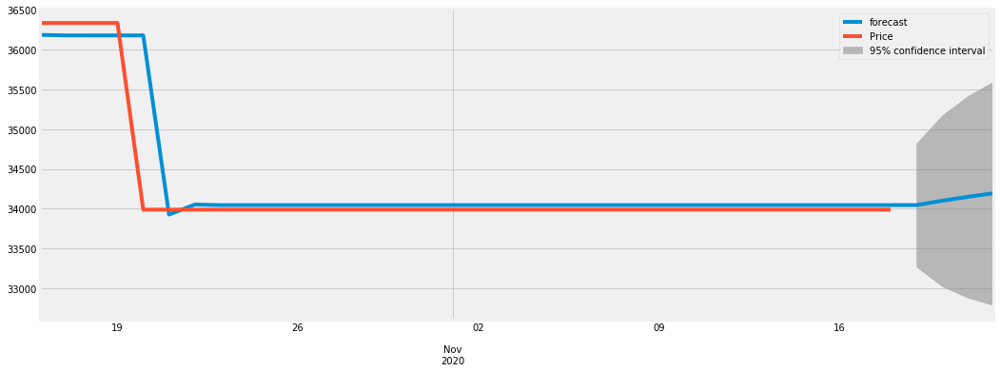

0.9907204590490308
2020-10-16    36186.949796
2020-10-17    36179.364744
2020-10-18    36179.810059
2020-10-19    36179.785251
2020-10-20    36179.786637
2020-10-21    33927.874655
2020-10-22    34053.682074
2020-10-23    34046.653599
2020-10-24    34047.046259
2020-10-25    34047.024322
2020-10-26    34047.025548
2020-10-27    34047.025479
2020-10-28    34047.025483
2020-10-29    34047.025483
2020-10-30    34047.025483
2020-10-31    34047.025483
2020-11-01    34047.025483
2020-11-02    34047.025483
2020-11-03    34047.025483
2020-11-04    34047.025483
2020-11-05    34047.025483
2020-11-06    34047.025483
2020-11-07    34047.025483
2020-11-08    34047.025483
2020-11-09    34047.025483
2020-11-10    34047.025483
2020-11-11    34047.025483
2020-11-12    34047.025483
2020-11-13    34047.025483
2020-11-14    34047.025483
2020-11-15    34047.025483
2020-11-16    34047.025483
2020-11-17    34047.025483
2020-11-18    34047.025483
2020-11-19    34047.025483
2020-11-20    34101.763915
2020-11-2

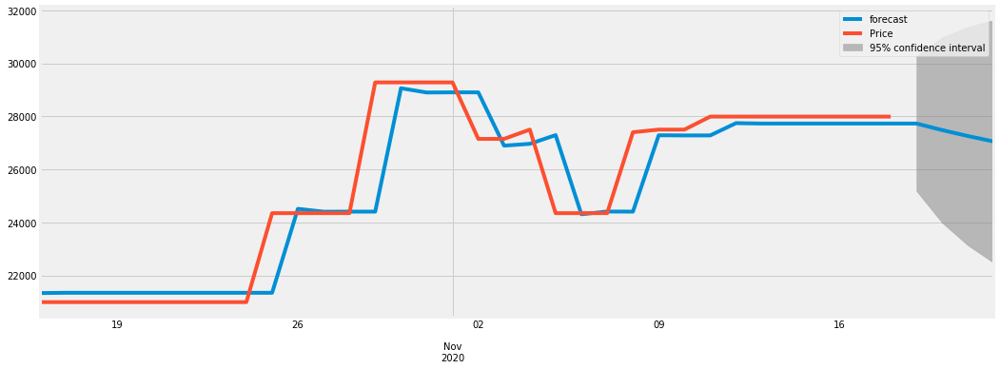

0.9924853393209325
2020-10-16    21331.655863
2020-10-17    21342.412417
2020-10-18    21342.030197
2020-10-19    21342.043350
2020-10-20    21342.042897
2020-10-21    21342.042913
2020-10-22    21342.042912
2020-10-23    21342.042912
2020-10-24    21342.042912
2020-10-25    21342.042912
2020-10-26    24509.906510
2020-10-27    24400.776318
2020-10-28    24404.535760
2020-10-29    24404.406250
2020-10-30    29059.481051
2020-10-31    28899.117705
2020-11-01    28904.642085
2020-11-02    28904.451775
2020-11-03    26893.520789
2020-11-04    26962.795642
2020-11-05    27290.689867
2020-11-06    24304.980710
2020-11-07    24407.835837
2020-11-08    24404.292566
2020-11-09    27285.405860
2020-11-10    27279.576221
2020-11-11    27279.777047
2020-11-12    27743.106747
2020-11-13    27727.145435
2020-11-14    27727.695289
2020-11-15    27727.676347
2020-11-16    27727.676999
2020-11-17    27727.676977
2020-11-18    27727.676978
2020-11-19    27727.676978
2020-11-20    27480.133470
2020-11-2

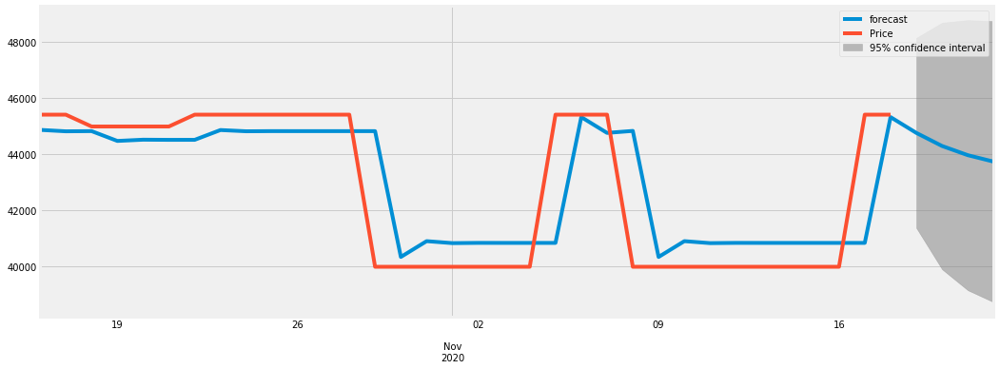

0.9350858067829739
2020-10-16    44869.450648
2020-10-17    44818.481802
2020-10-18    44825.481279
2020-10-19    44475.594761
2020-10-20    44519.524136
2020-10-21    44514.008670
2020-10-22    44514.701154
2020-10-23    44863.632406
2020-10-24    44819.823012
2020-10-25    44825.323416
2020-10-26    44824.632823
2020-10-27    44824.719530
2020-10-28    44824.708643
2020-10-29    44824.710010
2020-10-30    40340.404959
2020-10-31    40903.423285
2020-11-01    40832.734598
2020-11-02    40841.609781
2020-11-03    40840.495474
2020-11-04    40840.635379
2020-11-05    40840.617813
2020-11-06    45324.924899
2020-11-07    44761.906317
2020-11-08    44832.595036
2020-11-09    40339.414969
2020-11-10    40903.547581
2020-11-11    40832.718992
2020-11-12    40841.611740
2020-11-13    40840.495228
2020-11-14    40840.635410
2020-11-15    40840.617810
2020-11-16    40840.620019
2020-11-17    40840.619742
2020-11-18    45324.924657
2020-11-19    44761.906347
2020-11-20    44294.930307
2020-11-2

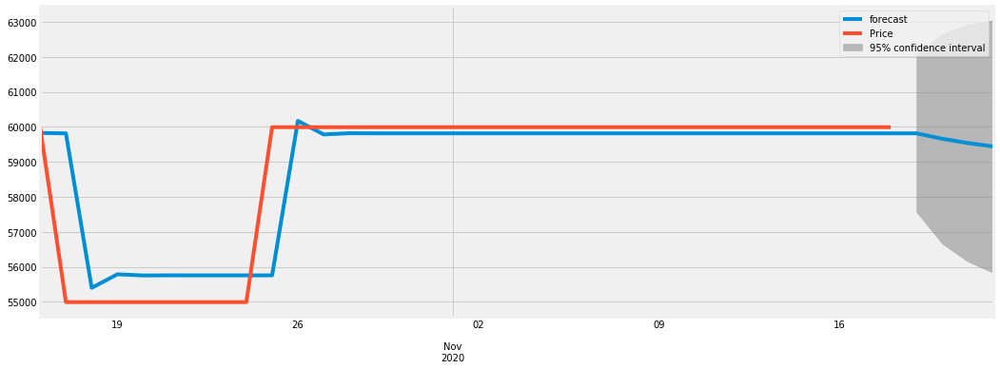

0.9666376833132131
2020-10-16    59825.195975
2020-10-17    59813.360759
2020-10-18    55398.919865
2020-10-19    55785.869708
2020-10-20    55751.949952
2020-10-21    55754.923333
2020-10-22    55754.662689
2020-10-23    55754.685537
2020-10-24    55754.683534
2020-10-25    55754.683709
2020-10-26    60170.254017
2020-10-27    59783.188298
2020-10-28    59817.118201
2020-10-29    59814.143930
2020-10-30    59814.404652
2020-10-31    59814.381797
2020-11-01    59814.383801
2020-11-02    59814.383625
2020-11-03    59814.383641
2020-11-04    59814.383639
2020-11-05    59814.383639
2020-11-06    59814.383639
2020-11-07    59814.383639
2020-11-08    59814.383639
2020-11-09    59814.383639
2020-11-10    59814.383639
2020-11-11    59814.383639
2020-11-12    59814.383639
2020-11-13    59814.383639
2020-11-14    59814.383639
2020-11-15    59814.383639
2020-11-16    59814.383639
2020-11-17    59814.383639
2020-11-18    59814.383639
2020-11-19    59814.383639
2020-11-20    59659.294361
2020-11-2

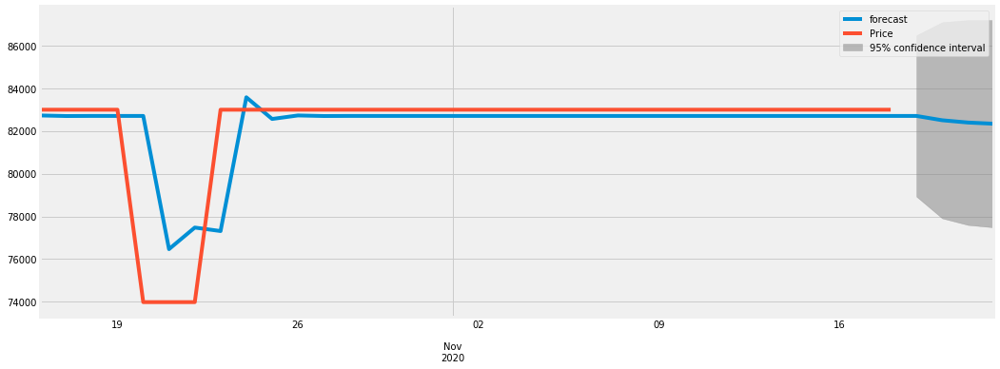

0.8541303409959038
2020-10-16    82721.471434
2020-10-17    82694.471945
2020-10-18    82699.282258
2020-10-19    82698.516008
2020-10-20    82698.640414
2020-10-21    76468.810252
2020-10-22    77477.607645
2020-10-23    77314.252921
2020-10-24    83570.515010
2020-10-25    82557.437484
2020-10-26    82721.485291
2020-10-27    82694.921003
2020-10-28    82699.222562
2020-10-29    82698.526010
2020-10-30    82698.638803
2020-10-31    82698.620538
2020-11-01    82698.623496
2020-11-02    82698.623017
2020-11-03    82698.623095
2020-11-04    82698.623082
2020-11-05    82698.623084
2020-11-06    82698.623084
2020-11-07    82698.623084
2020-11-08    82698.623084
2020-11-09    82698.623084
2020-11-10    82698.623084
2020-11-11    82698.623084
2020-11-12    82698.623084
2020-11-13    82698.623084
2020-11-14    82698.623084
2020-11-15    82698.623084
2020-11-16    82698.623084
2020-11-17    82698.623084
2020-11-18    82698.623084
2020-11-19    82698.623084
2020-11-20    82496.931658
2020-11-2

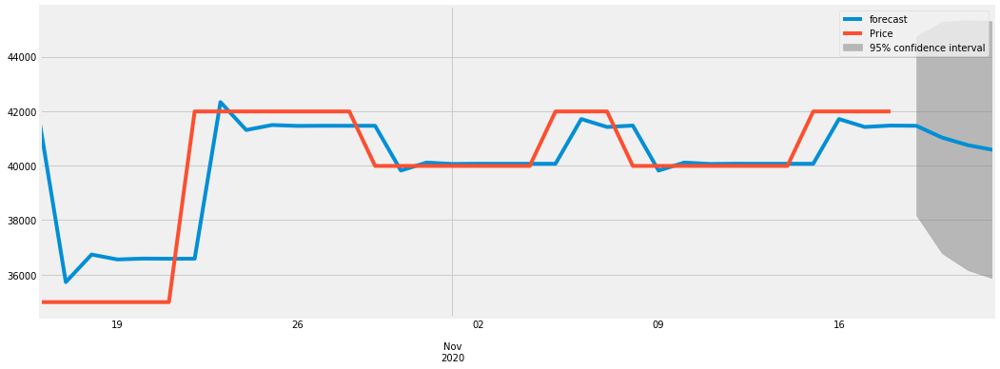

0.9161161334757312
2020-10-16    41513.828379
2020-10-17    35725.184652
2020-10-18    36736.445596
2020-10-19    36556.345918
2020-10-20    36588.404178
2020-10-21    36582.696673
2020-10-22    36583.712781
2020-10-23    42332.433745
2020-10-24    41308.983477
2020-10-25    41491.189303
2020-10-26    41458.751027
2020-10-27    41464.526044
2020-10-28    41463.497912
2020-10-29    41463.680951
2020-10-30    39821.104975
2020-10-31    40113.534340
2020-11-01    40061.472862
2020-11-02    40070.741417
2020-11-03    40069.091327
2020-11-04    40069.385094
2020-11-05    40069.332794
2020-11-06    41711.885495
2020-11-07    41419.460273
2020-11-08    41471.521014
2020-11-09    39819.709201
2020-11-10    40113.782831
2020-11-11    40061.428623
2020-11-12    40070.749292
2020-11-13    40069.089925
2020-11-14    40069.385344
2020-11-15    40069.332750
2020-11-16    41711.885503
2020-11-17    41419.460272
2020-11-18    41471.521014
2020-11-19    41462.252591
2020-11-20    41030.478648
2020-11-2

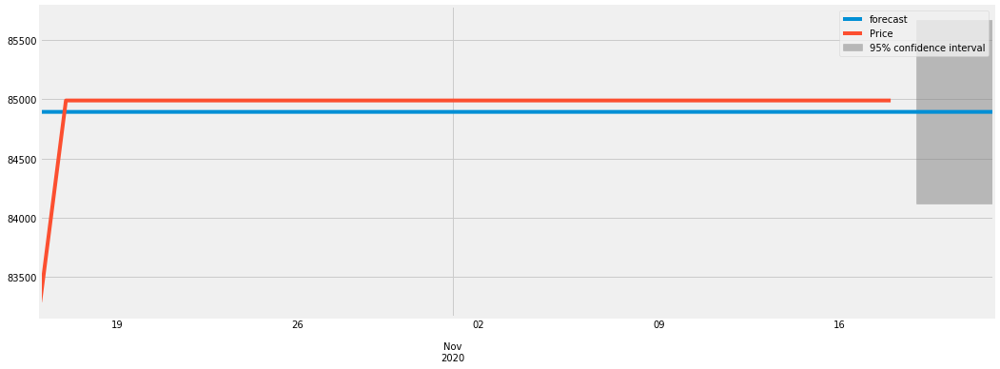

5.926348242157875e-05
2020-10-16    84893.890572
2020-10-17    84893.781827
2020-10-18    84893.788351
2020-10-19    84893.794873
2020-10-20    84893.801395
2020-10-21    84893.807916
2020-10-22    84893.814436
2020-10-23    84893.820955
2020-10-24    84893.827473
2020-10-25    84893.833991
2020-10-26    84893.840507
2020-10-27    84893.847023
2020-10-28    84893.853537
2020-10-29    84893.860051
2020-10-30    84893.866564
2020-10-31    84893.873076
2020-11-01    84893.879587
2020-11-02    84893.886097
2020-11-03    84893.892606
2020-11-04    84893.899115
2020-11-05    84893.905622
2020-11-06    84893.912129
2020-11-07    84893.918635
2020-11-08    84893.925139
2020-11-09    84893.931643
2020-11-10    84893.938146
2020-11-11    84893.944648
2020-11-12    84893.951150
2020-11-13    84893.957650
2020-11-14    84893.964150
2020-11-15    84893.970648
2020-11-16    84893.977146
2020-11-17    84893.983643
2020-11-18    84893.990138
2020-11-19    84893.991467
2020-11-20    84893.991467
2020-1

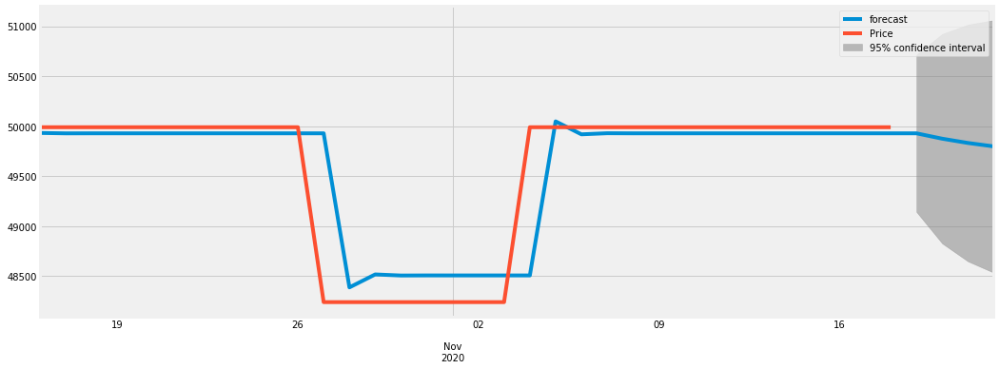

0.9668139972786651
2020-10-16    49932.569619
2020-10-17    49928.608848
2020-10-18    49928.965057
2020-10-19    49928.935261
2020-10-20    49928.937769
2020-10-21    49928.937558
2020-10-22    49928.937576
2020-10-23    49928.937575
2020-10-24    49928.937575
2020-10-25    49928.937575
2020-10-26    49928.937575
2020-10-27    49928.937575
2020-10-28    48387.418651
2020-10-29    48517.113931
2020-10-30    48506.202053
2020-10-31    48507.120121
2020-11-01    48507.042880
2020-11-02    48507.049378
2020-11-03    48507.048832
2020-11-04    48507.048878
2020-11-05    50048.567798
2020-11-06    49918.872518
2020-11-07    49929.784396
2020-11-08    49928.866328
2020-11-09    49928.943569
2020-11-10    49928.937070
2020-11-11    49928.937617
2020-11-12    49928.937571
2020-11-13    49928.937575
2020-11-14    49928.937575
2020-11-15    49928.937575
2020-11-16    49928.937575
2020-11-17    49928.937575
2020-11-18    49928.937575
2020-11-19    49928.937575
2020-11-20    49875.149641
2020-11-2

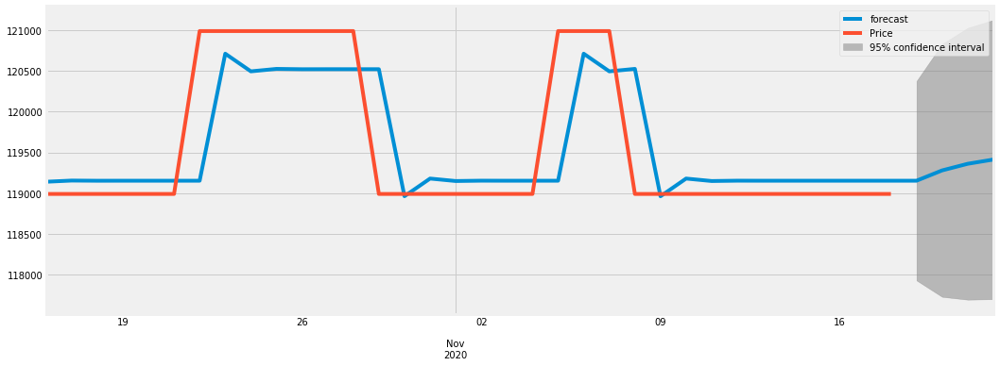

0.9099400038146244
2020-10-16    119139.810416
2020-10-17    119154.445543
2020-10-18    119152.211702
2020-10-19    119152.518158
2020-10-20    119152.475456
2020-10-21    119152.481393
2020-10-22    119152.480568
2020-10-23    120712.419460
2020-10-24    120495.466757
2020-10-25    120525.640038
2020-10-26    120521.443608
2020-10-27    120522.027238
2020-10-28    120521.946068
2020-10-29    120521.957357
2020-10-30    118962.017009
2020-10-31    119178.969915
2020-11-01    119148.796605
2020-11-02    119152.993039
2020-11-03    119152.409409
2020-11-04    119152.490579
2020-11-05    119152.479290
2020-11-06    120712.419638
2020-11-07    120495.466732
2020-11-08    120525.640042
2020-11-09    118961.504830
2020-11-10    119179.041148
2020-11-11    119148.786698
2020-11-12    119152.994417
2020-11-13    119152.409217
2020-11-14    119152.490606
2020-11-15    119152.479286
2020-11-16    119152.480861
2020-11-17    119152.480642
2020-11-18    119152.480672
2020-11-19    119152.480668
2

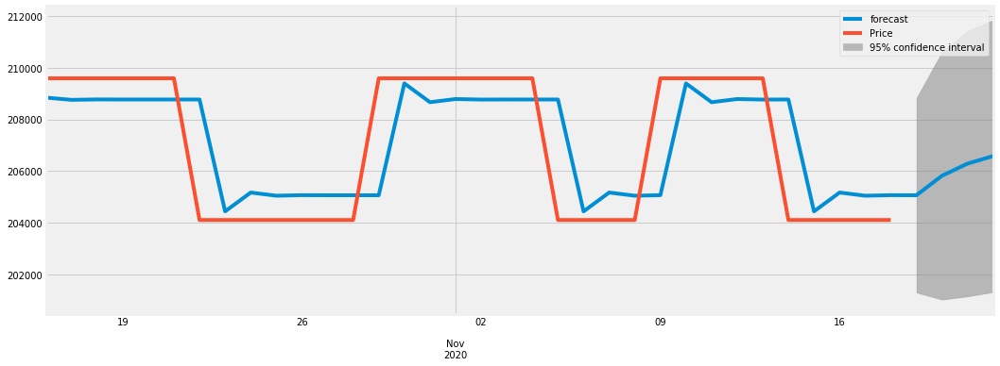

0.9060757089141176
2020-10-16    208844.378153
2020-10-17    208757.205255
2020-10-18    208773.579691
2020-10-19    208770.878995
2020-10-20    208771.334873
2020-10-21    208771.258217
2020-10-22    208771.271115
2020-10-23    204447.520197
2020-10-24    205174.963259
2020-10-25    205052.575680
2020-10-26    205073.166597
2020-10-27    205069.702308
2020-10-28    205070.285152
2020-10-29    205070.187093
2020-10-30    209393.952339
2020-10-31    208666.506866
2020-11-01    208788.894851
2020-11-02    208768.303866
2020-11-03    208771.768166
2020-11-04    208771.185320
2020-11-05    208771.283380
2020-11-06    204447.518134
2020-11-07    205174.963606
2020-11-08    205052.575621
2020-11-09    205073.166606
2020-11-10    209393.451055
2020-11-11    208666.591204
2020-11-12    208788.880662
2020-11-13    208768.306253
2020-11-14    208771.767764
2020-11-15    204447.436639
2020-11-16    205174.977317
2020-11-17    205052.573315
2020-11-18    205073.166995
2020-11-19    205069.702241
2

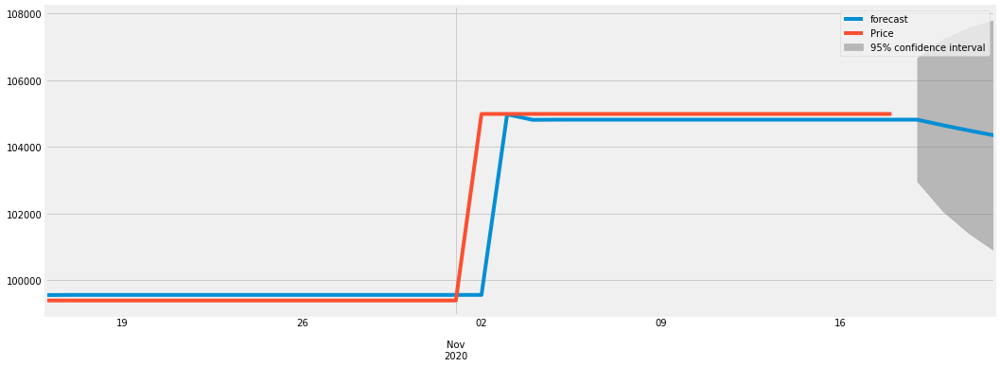

0.9964415067868369
2020-10-16     99559.540470
2020-10-17     99564.165362
2020-10-18     99564.021434
2020-10-19     99564.025786
2020-10-20     99564.025654
2020-10-21     99564.025658
2020-10-22     99564.025658
2020-10-23     99564.025658
2020-10-24     99564.025658
2020-10-25     99564.025658
2020-10-26     99564.025658
2020-10-27     99564.025658
2020-10-28     99564.025658
2020-10-29     99564.025658
2020-10-30     99564.025658
2020-10-31     99564.025658
2020-11-01     99564.025658
2020-11-02     99564.025658
2020-11-03    104977.475178
2020-11-04    104813.668043
2020-11-05    104818.624731
2020-11-06    104818.474745
2020-11-07    104818.479283
2020-11-08    104818.479146
2020-11-09    104818.479150
2020-11-10    104818.479150
2020-11-11    104818.479150
2020-11-12    104818.479150
2020-11-13    104818.479150
2020-11-14    104818.479150
2020-11-15    104818.479150
2020-11-16    104818.479150
2020-11-17    104818.479150
2020-11-18    104818.479150
2020-11-19    104818.479150
2

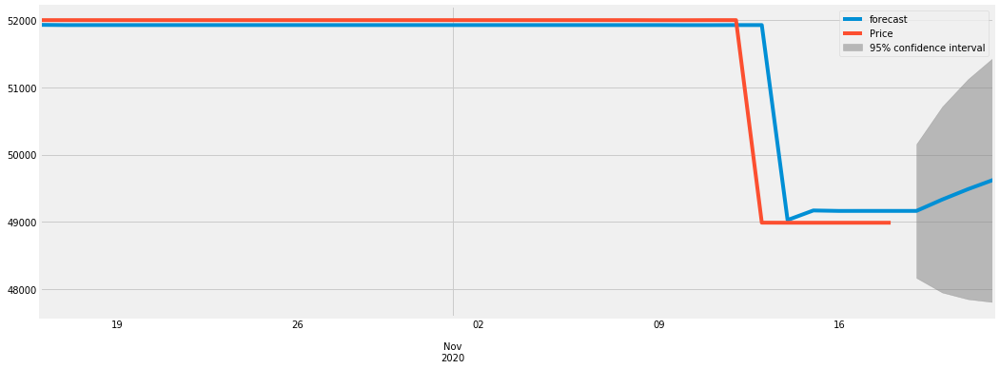

0.9930486369188385
2020-10-16    51928.711035
2020-10-17    51925.527405
2020-10-18    51925.691439
2020-10-19    51925.683371
2020-10-20    51925.683769
2020-10-21    51925.683749
2020-10-22    51925.683750
2020-10-23    51925.683750
2020-10-24    51925.683750
2020-10-25    51925.683750
2020-10-26    51925.683750
2020-10-27    51925.683750
2020-10-28    51925.683750
2020-10-29    51925.683750
2020-10-30    51925.683750
2020-10-31    51925.683750
2020-11-01    51925.683750
2020-11-02    51925.683750
2020-11-03    51925.683750
2020-11-04    51925.683750
2020-11-05    51925.683750
2020-11-06    51925.683750
2020-11-07    51925.683750
2020-11-08    51925.683750
2020-11-09    51925.683750
2020-11-10    51924.721166
2020-11-11    51924.768614
2020-11-12    51925.728859
2020-11-13    51925.681527
2020-11-14    49028.306175
2020-11-15    49170.160485
2020-11-16    49163.168229
2020-11-17    49163.512890
2020-11-18    49163.495901
2020-11-19    49163.496738
2020-11-20    49332.427040
2020-11-2

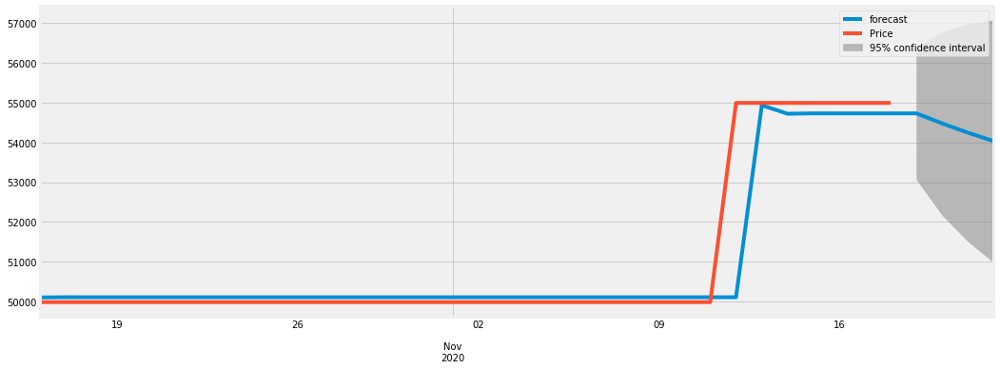

0.993997401233411
2020-10-16    50108.025629
2020-10-17    50112.839469
2020-10-18    50112.618408
2020-10-19    50112.628144
2020-10-20    50112.627715
2020-10-21    50112.627734
2020-10-22    50112.627733
2020-10-23    50112.627733
2020-10-24    50112.627733
2020-10-25    50112.627733
2020-10-26    50112.627733
2020-10-27    50112.627733
2020-10-28    50112.627733
2020-10-29    50112.627733
2020-10-30    50112.627733
2020-10-31    50112.627733
2020-11-01    50112.627733
2020-11-02    50112.627733
2020-11-03    50112.627733
2020-11-04    50112.627733
2020-11-05    50112.627733
2020-11-06    50112.627733
2020-11-07    50112.627733
2020-11-08    50112.627733
2020-11-09    50112.627733
2020-11-10    50112.627733
2020-11-11    50112.627733
2020-11-12    50112.627733
2020-11-13    54931.479977
2020-11-14    54718.859735
2020-11-15    54728.241091
2020-11-16    54727.827161
2020-11-17    54727.845425
2020-11-18    54727.844619
2020-11-19    54727.844654
2020-11-20    54475.187077
2020-11-21

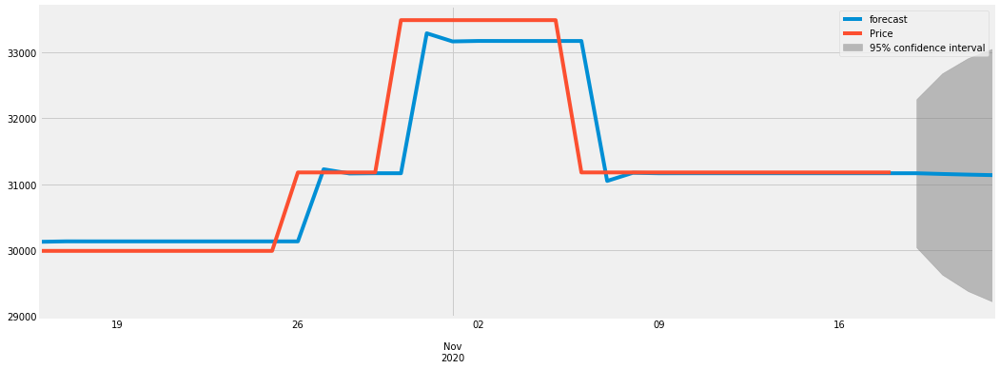

0.9830535479481652
2020-10-16    30127.800588
2020-10-17    30134.792320
2020-10-18    30134.364940
2020-10-19    30134.389730
2020-10-20    30134.388287
2020-10-21    30134.388371
2020-10-22    30134.388366
2020-10-23    30134.388366
2020-10-24    30134.388366
2020-10-25    30134.388366
2020-10-26    30134.388366
2020-10-27    31227.917499
2020-10-28    31164.301048
2020-10-29    31168.001958
2020-10-30    31167.786657
2020-10-31    33290.532204
2020-11-01    33167.040718
2020-11-02    33174.224880
2020-11-03    33173.806938
2020-11-04    33173.831252
2020-11-05    33173.829838
2020-11-06    33173.829920
2020-11-07    31051.096894
2020-11-08    31174.587651
2020-11-09    31167.403531
2020-11-10    31167.821470
2020-11-11    31167.797156
2020-11-12    31167.798571
2020-11-13    31167.798489
2020-11-14    31167.798493
2020-11-15    31167.798493
2020-11-16    31167.798493
2020-11-17    31167.798493
2020-11-18    31167.798493
2020-11-19    31167.798493
2020-11-20    31156.586138
2020-11-2

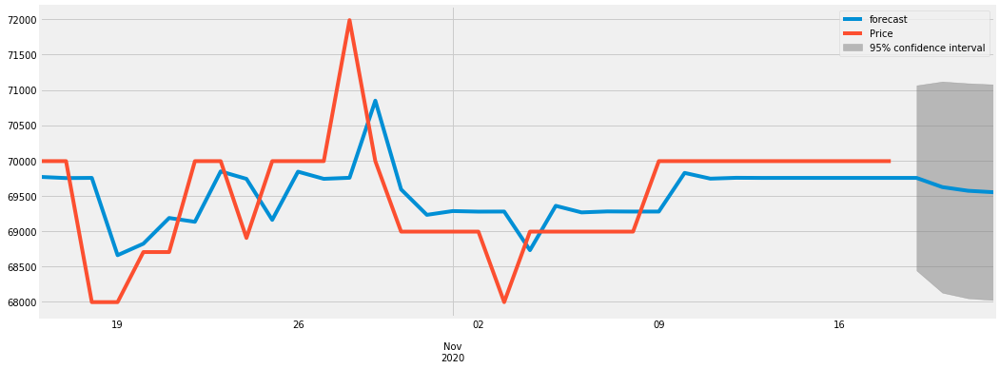

0.7539503354973227
2020-10-16    69766.457878
2020-10-17    69749.667387
2020-10-18    69752.346210
2020-10-19    68655.737972
2020-10-20    68818.492065
2020-10-21    69183.493309
2020-10-22    69129.321081
2020-10-23    69844.420404
2020-10-24    69738.287825
2020-10-25    69156.601980
2020-10-26    69840.371467
2020-10-27    69738.888754
2020-10-28    69753.950469
2020-10-29    70847.930981
2020-10-30    69589.350240
2020-10-31    69228.036501
2020-11-01    69281.661442
2020-11-02    69273.702613
2020-11-03    69274.883835
2020-11-04    68726.600562
2020-11-05    69356.082838
2020-11-06    69262.657245
2020-11-07    69276.523150
2020-11-08    69274.465220
2020-11-09    69274.770651
2020-11-10    69822.833280
2020-11-11    69741.491711
2020-11-12    69753.564147
2020-11-13    69751.772398
2020-11-14    69752.038323
2020-11-15    69751.998855
2020-11-16    69752.004713
2020-11-17    69752.003843
2020-11-18    69752.003972
2020-11-19    69752.003953
2020-11-20    69621.556429
2020-11-2

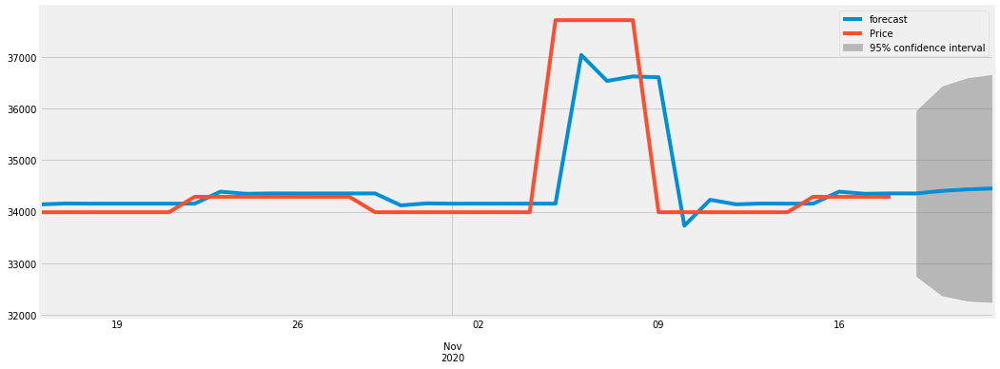

0.8951710134904838
2020-10-16    34141.848232
2020-10-17    34159.872362
2020-10-18    34156.351365
2020-10-19    34156.953722
2020-10-20    34156.848110
2020-10-21    34156.866549
2020-10-22    34156.863327
2020-10-23    34389.014283
2020-10-24    34348.457703
2020-10-25    34355.542904
2020-10-26    34354.305125
2020-10-27    34354.521364
2020-10-28    34354.483587
2020-10-29    34354.490187
2020-10-30    34122.338641
2020-10-31    34162.895324
2020-11-01    34155.810105
2020-11-02    34157.047887
2020-11-03    34156.831647
2020-11-04    34156.869424
2020-11-05    34156.862825
2020-11-06    37042.493361
2020-11-07    36538.376100
2020-11-08    36626.444967
2020-11-09    36611.059409
2020-11-10    33728.117870
2020-11-11    34231.765366
2020-11-12    34143.778566
2020-11-13    34159.149787
2020-11-14    34156.464447
2020-11-15    34156.933574
2020-11-16    34389.002011
2020-11-17    34348.459847
2020-11-18    34355.542529
2020-11-19    34354.305191
2020-11-20    34404.282937
2020-11-2

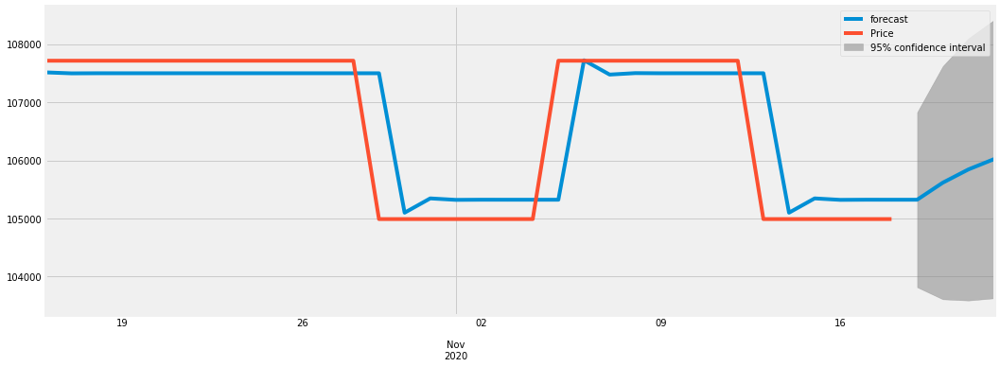

0.9628854584108738
2020-10-16    107512.497875
2020-10-17    107495.899286
2020-10-18    107497.742796
2020-10-19    107497.555294
2020-10-20    107497.574545
2020-10-21    107497.572570
2020-10-22    107497.572773
2020-10-23    107497.572752
2020-10-24    107497.572754
2020-10-25    107497.572754
2020-10-26    107497.572754
2020-10-27    107497.572754
2020-10-28    107497.572754
2020-10-29    107497.572754
2020-10-30    105099.583451
2020-10-31    105345.569737
2020-11-01    105320.336408
2020-11-02    105322.924849
2020-11-03    105322.659326
2020-11-04    105322.686564
2020-11-05    105322.683770
2020-11-06    107720.673359
2020-11-07    107474.687043
2020-11-08    107499.920375
2020-11-09    107497.331934
2020-11-10    107497.597457
2020-11-11    107497.570220
2020-11-12    107497.573014
2020-11-13    107497.572727
2020-11-14    105099.583453
2020-11-15    105345.569737
2020-11-16    105320.336408
2020-11-17    105322.924849
2020-11-18    105322.659326
2020-11-19    105322.686564
2

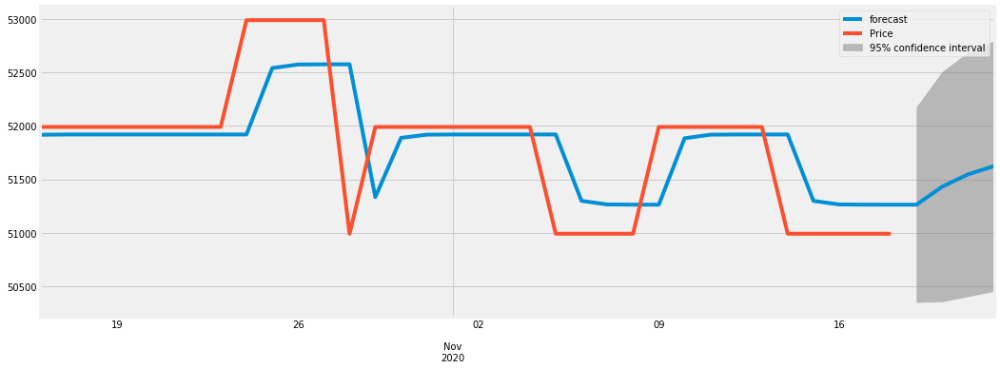

0.8718712962102532
2020-10-16    51916.760981
2020-10-17    51919.295955
2020-10-18    51919.427630
2020-10-19    51919.434702
2020-10-20    51919.435083
2020-10-21    51919.435103
2020-10-22    51919.435104
2020-10-23    51919.435104
2020-10-24    51919.435104
2020-10-25    52541.131156
2020-10-26    52574.582195
2020-10-27    52576.382064
2020-10-28    52576.478908
2020-10-29    51333.092016
2020-10-30    51887.886270
2020-10-31    51917.737584
2020-11-01    51919.343767
2020-11-02    51919.430190
2020-11-03    51919.434840
2020-11-04    51919.435090
2020-11-05    51919.435103
2020-11-06    51297.739053
2020-11-07    51264.288014
2020-11-08    51262.488144
2020-11-09    51262.391300
2020-11-10    51884.082141
2020-11-11    51917.532899
2020-11-12    51919.332754
2020-11-13    51919.429597
2020-11-14    51919.434808
2020-11-15    51297.739037
2020-11-16    51264.288013
2020-11-17    51262.488144
2020-11-18    51262.391300
2020-11-19    51262.386089
2020-11-20    51431.727165
2020-11-2

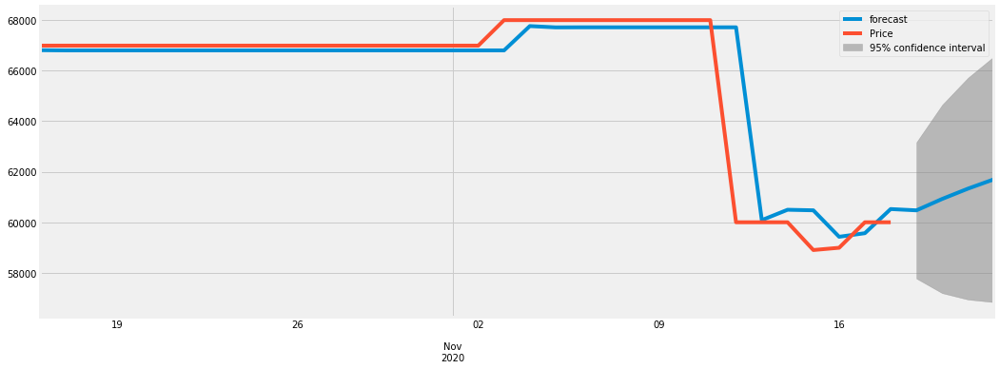

0.9911177330034396
2020-10-16    66809.806227
2020-10-17    66801.024774
2020-10-18    66801.519468
2020-10-19    66801.492964
2020-10-20    66801.494388
2020-10-21    66801.494312
2020-10-22    66801.494316
2020-10-23    66801.494316
2020-10-24    66801.494316
2020-10-25    66801.494316
2020-10-26    66801.494316
2020-10-27    66801.494316
2020-10-28    66801.494316
2020-10-29    66801.494316
2020-10-30    66801.494316
2020-10-31    66801.494316
2020-11-01    66801.494316
2020-11-02    66801.494316
2020-11-03    66801.494316
2020-11-04    67763.923324
2020-11-05    67712.224966
2020-11-06    67715.002023
2020-11-07    67714.852849
2020-11-08    67714.860862
2020-11-09    67714.860432
2020-11-10    67714.860455
2020-11-11    67714.860453
2020-11-12    67714.860453
2020-11-13    60084.105180
2020-11-14    60494.002970
2020-11-15    60471.984678
2020-11-16    59424.892419
2020-11-17    59566.984591
2020-11-18    60521.780900
2020-11-19    60470.492543
2020-11-20    60922.978103
2020-11-2

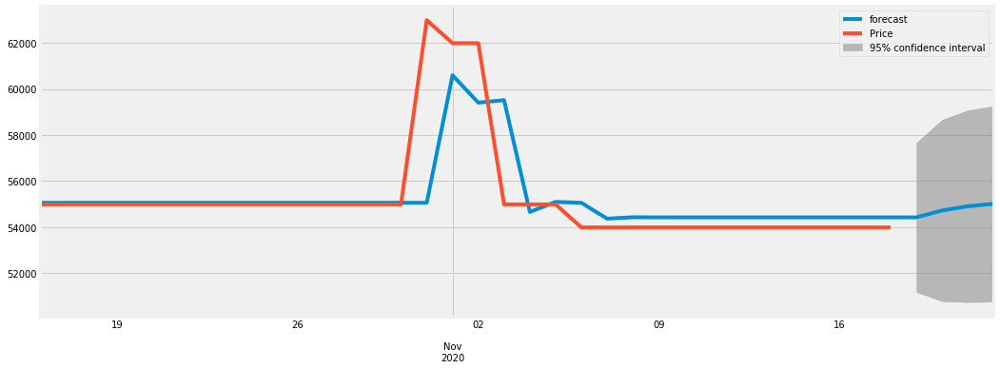

0.8774749492711418
2020-10-16    55056.797942
2020-10-17    55060.697253
2020-10-18    55060.327319
2020-10-19    55060.360307
2020-10-20    55060.357348
2020-10-21    55060.357614
2020-10-22    55060.357590
2020-10-23    55060.357592
2020-10-24    55060.357592
2020-10-25    55060.357592
2020-10-26    55060.357592
2020-10-27    55060.357592
2020-10-28    55060.357592
2020-10-29    55060.357592
2020-10-30    55060.357592
2020-10-31    55060.357592
2020-11-01    60595.559682
2020-11-02    59407.476369
2020-11-03    59513.977775
2020-11-04    54661.129014
2020-11-05    55096.144985
2020-11-06    55057.149561
2020-11-07    54368.744903
2020-11-08    54430.454434
2020-11-09    54424.922707
2020-11-10    54425.418579
2020-11-11    54425.374128
2020-11-12    54425.378113
2020-11-13    54425.377756
2020-11-14    54425.377788
2020-11-15    54425.377785
2020-11-16    54425.377785
2020-11-17    54425.377785
2020-11-18    54425.377785
2020-11-19    54425.377785
2020-11-20    54726.615788
2020-11-2

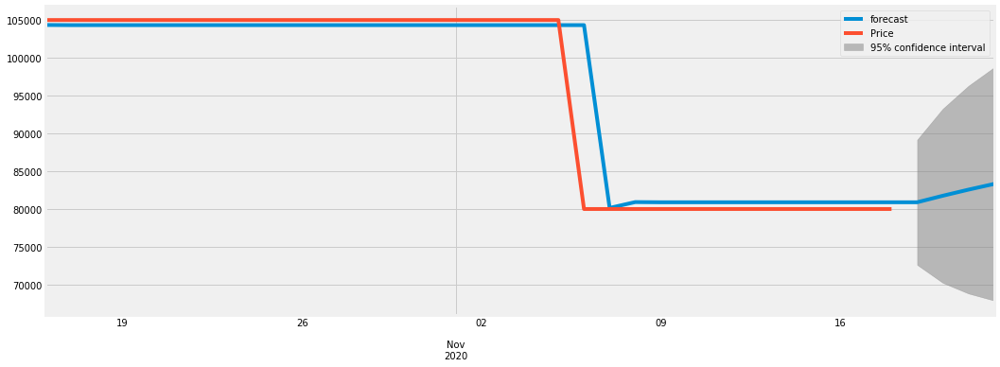

0.9961661564519956
2020-10-16    104334.486029
2020-10-17    104314.783191
2020-10-18    104315.433321
2020-10-19    104315.412515
2020-10-20    104315.413181
2020-10-21    104315.413160
2020-10-22    104315.413160
2020-10-23    104315.413160
2020-10-24    104315.413160
2020-10-25    104315.413160
2020-10-26    104315.413160
2020-10-27    104315.413160
2020-10-28    104315.413160
2020-10-29    104315.413160
2020-10-30    104315.413160
2020-10-31    104315.413160
2020-11-01    104315.413160
2020-11-02    104315.413160
2020-11-03    104315.413160
2020-11-04    104315.413160
2020-11-05    104315.413160
2020-11-06    104315.413160
2020-11-07     80130.526807
2020-11-08     80905.263413
2020-11-09     80880.445566
2020-11-10     80881.240579
2020-11-11     80881.215111
2020-11-12     80881.215927
2020-11-13     80881.215901
2020-11-14     80881.215902
2020-11-15     80881.215902
2020-11-16     80881.215902
2020-11-17     80881.215902
2020-11-18     80881.215902
2020-11-19     80881.215902
2

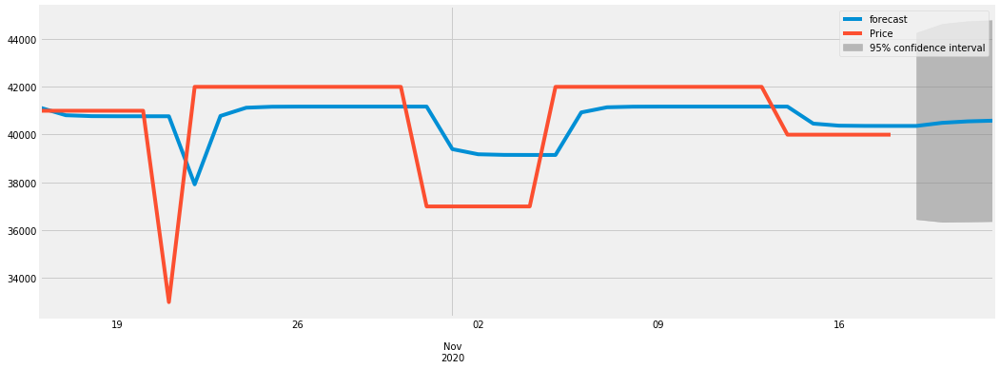

0.6054239372234251
2020-10-16    41120.421006
2020-10-17    40803.321252
2020-10-18    40765.170954
2020-10-19    40760.576511
2020-10-20    40760.023269
2020-10-21    40759.956651
2020-10-22    37913.509506
2020-10-23    40773.004288
2020-10-24    41117.324625
2020-10-25    41158.785268
2020-10-26    41163.777669
2020-10-27    41164.378819
2020-10-28    41164.451205
2020-10-29    41164.459921
2020-10-30    41164.460971
2020-10-31    41164.461097
2020-11-01    39385.436660
2020-11-02    39171.218996
2020-11-03    39145.424405
2020-11-04    39142.318401
2020-11-05    39141.944398
2020-11-06    40920.923815
2020-11-07    41135.136058
2020-11-08    41160.929996
2020-11-09    41164.035922
2020-11-10    41164.409916
2020-11-11    41164.454949
2020-11-12    41164.460372
2020-11-13    41164.461025
2020-11-14    41164.461104
2020-11-15    40452.851332
2020-11-16    40367.164267
2020-11-17    40356.846431
2020-11-18    40355.604029
2020-11-19    40355.454428
2020-11-20    40485.466887
2020-11-2

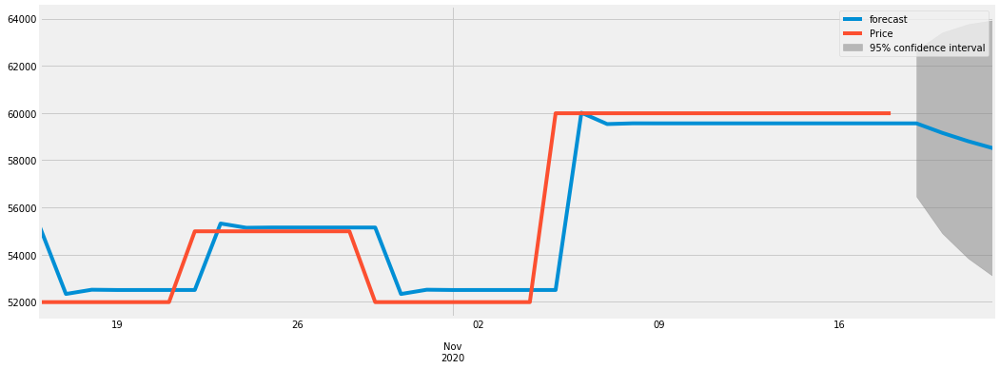

0.9866798866064256
2020-10-16    55142.432612
2020-10-17    52335.426990
2020-10-18    52514.557059
2020-10-19    52503.083941
2020-10-20    52503.818763
2020-10-21    52503.771700
2020-10-22    52503.774714
2020-10-23    55320.043759
2020-10-24    55139.668858
2020-10-25    55151.221414
2020-10-26    55150.481502
2020-10-27    55150.528891
2020-10-28    55150.525856
2020-10-29    55150.526051
2020-10-30    52334.256800
2020-10-31    52514.631714
2020-11-01    52503.079158
2020-11-02    52503.819070
2020-11-03    52503.771680
2020-11-04    52503.774715
2020-11-05    52503.774521
2020-11-06    60013.825834
2020-11-07    59532.826065
2020-11-08    59563.632882
2020-11-09    59561.659784
2020-11-10    59561.786156
2020-11-11    59561.778062
2020-11-12    59561.778580
2020-11-13    59561.778547
2020-11-14    59561.778549
2020-11-15    59561.778549
2020-11-16    59561.778549
2020-11-17    59561.778549
2020-11-18    59561.778549
2020-11-19    59561.778549
2020-11-20    59159.782916
2020-11-2

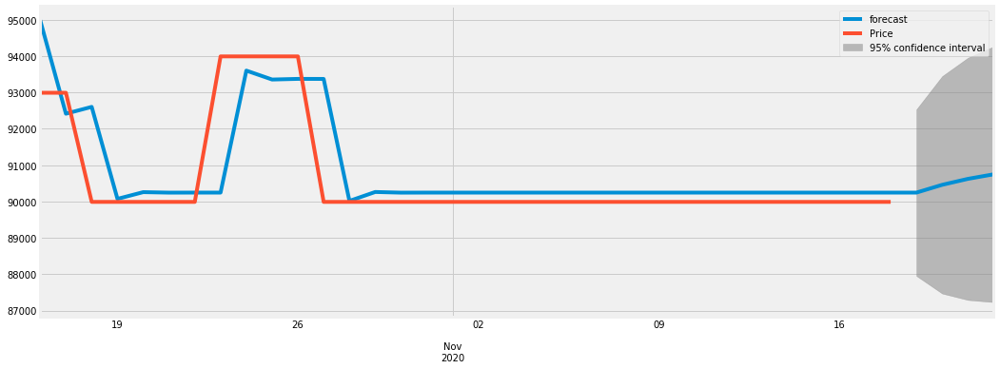

0.9526265986460625
2020-10-16    94986.947986
2020-10-17    92414.323676
2020-10-18    92602.065511
2020-10-19    90072.930446
2020-10-20    90257.981522
2020-10-21    90244.441753
2020-10-22    90245.432428
2020-10-23    90245.359942
2020-10-24    93599.230839
2020-10-25    93353.835689
2020-10-26    93371.790697
2020-10-27    93370.476970
2020-10-28    90016.707499
2020-10-29    90262.095228
2020-10-30    90244.140763
2020-10-31    90245.454451
2020-11-01    90245.358331
2020-11-02    90245.365364
2020-11-03    90245.364849
2020-11-04    90245.364887
2020-11-05    90245.364884
2020-11-06    90245.364884
2020-11-07    90245.364884
2020-11-08    90245.364884
2020-11-09    90245.364884
2020-11-10    90245.364884
2020-11-11    90245.364884
2020-11-12    90245.364884
2020-11-13    90245.364884
2020-11-14    90245.364884
2020-11-15    90245.364884
2020-11-16    90245.364884
2020-11-17    90245.364884
2020-11-18    90245.364884
2020-11-19    90245.364884
2020-11-20    90459.479759
2020-11-2

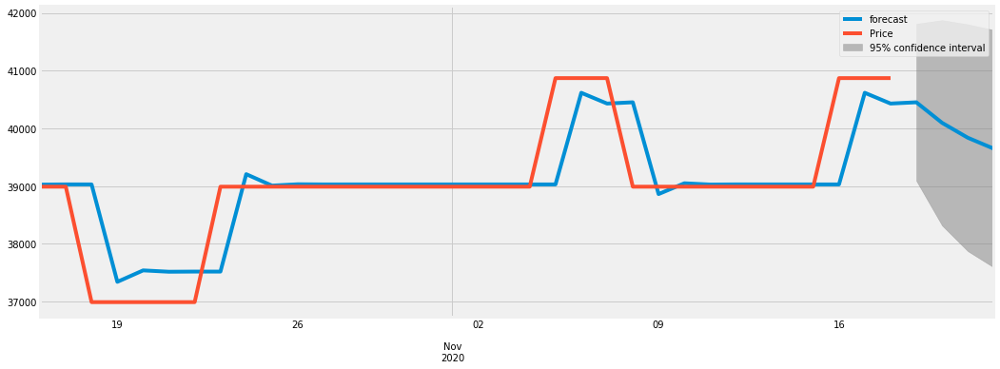

0.945879954938607
2020-10-16    39026.361064
2020-10-17    39029.637455
2020-10-18    39029.217876
2020-10-19    37341.360415
2020-10-20    37539.665044
2020-10-21    37516.366393
2020-10-22    37519.103732
2020-10-23    37518.782125
2020-10-24    39206.726514
2020-10-25    39008.411298
2020-10-26    39031.711191
2020-10-27    39028.973706
2020-10-28    39029.295331
2020-10-29    39029.257543
2020-10-30    39029.261983
2020-10-31    39029.261461
2020-11-01    39029.261523
2020-11-02    39029.261515
2020-11-03    39029.261516
2020-11-04    39029.261516
2020-11-05    39029.261516
2020-11-06    40616.737677
2020-11-07    40430.226391
2020-11-08    40452.139451
2020-11-09    38862.088742
2020-11-10    39048.902510
2020-11-11    39026.953912
2020-11-12    39029.532635
2020-11-13    39029.229663
2020-11-14    39029.265259
2020-11-15    39029.261076
2020-11-16    39029.261568
2020-11-17    40616.737671
2020-11-18    40430.226392
2020-11-19    40452.139451
2020-11-20    40096.066160
2020-11-21

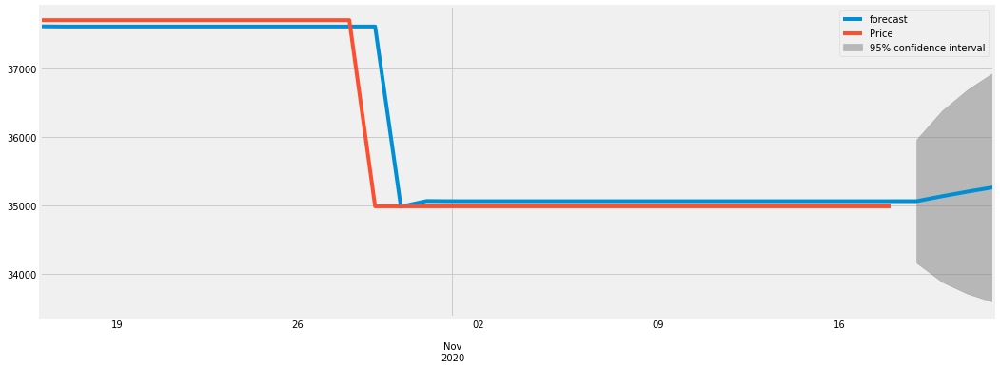

0.9962424786885318
2020-10-16    37608.873159
2020-10-17    37606.223183
2020-10-18    37606.308590
2020-10-19    37606.305918
2020-10-20    37606.306002
2020-10-21    37606.305999
2020-10-22    37606.305999
2020-10-23    37606.305999
2020-10-24    37606.305999
2020-10-25    37606.305999
2020-10-26    37606.305999
2020-10-27    37606.305999
2020-10-28    37606.305999
2020-10-29    37606.305999
2020-10-30    34985.058154
2020-10-31    35067.125447
2020-11-01    35064.556044
2020-11-02    35064.636488
2020-11-03    35064.633970
2020-11-04    35064.634049
2020-11-05    35064.634046
2020-11-06    35064.634046
2020-11-07    35064.634046
2020-11-08    35064.634046
2020-11-09    35064.634046
2020-11-10    35064.634046
2020-11-11    35064.634046
2020-11-12    35064.634046
2020-11-13    35064.634046
2020-11-14    35064.634046
2020-11-15    35064.634046
2020-11-16    35064.634046
2020-11-17    35064.634046
2020-11-18    35064.634046
2020-11-19    35064.634046
2020-11-20    35136.850485
2020-11-2

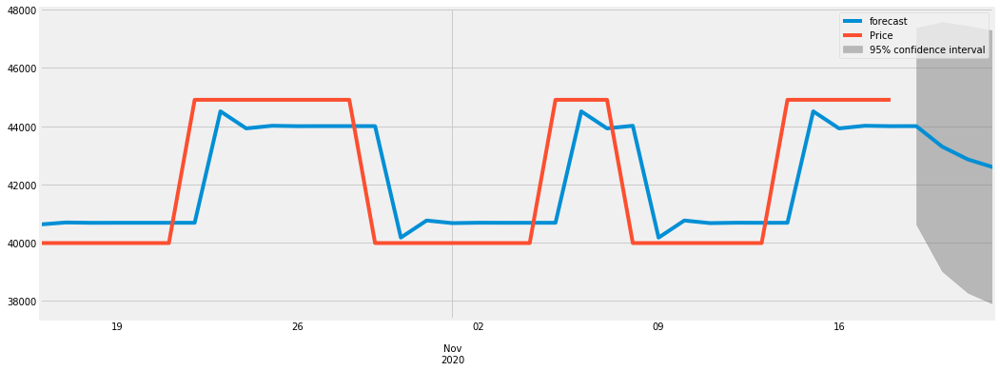

0.9055663425098708
2020-10-16    40628.474951
2020-10-17    40696.313808
2020-10-18    40684.821122
2020-10-19    40686.552935
2020-10-20    40686.286992
2020-10-21    40686.327714
2020-10-22    40686.321476
2020-10-23    44512.877157
2020-10-24    43926.718787
2020-10-25    44016.507533
2020-10-26    44002.753538
2020-10-27    44004.860399
2020-10-28    44004.537666
2020-10-29    44004.587103
2020-10-30    40178.024805
2020-10-31    40764.184188
2020-11-01    40674.395288
2020-11-02    40688.149306
2020-11-03    40686.042441
2020-11-04    40686.365175
2020-11-05    40686.315738
2020-11-06    44512.878036
2020-11-07    43926.718652
2020-11-08    44016.507553
2020-11-09    40176.198810
2020-11-10    40764.463897
2020-11-11    40674.352441
2020-11-12    40688.155869
2020-11-13    40686.041436
2020-11-14    40686.365329
2020-11-15    44512.870439
2020-11-16    43926.719816
2020-11-17    44016.507375
2020-11-18    44002.753562
2020-11-19    44004.860395
2020-11-20    43301.830647
2020-11-2

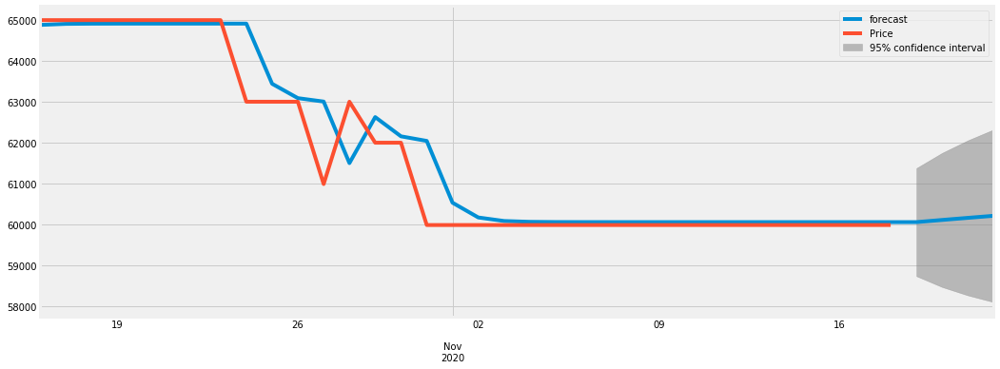

0.9929843569753452
2020-10-16    64873.449773
2020-10-17    64898.776462
2020-10-18    64903.500038
2020-10-19    64904.570188
2020-10-20    64904.822751
2020-10-21    64904.882926
2020-10-22    64904.897296
2020-10-23    64904.900729
2020-10-24    64904.901550
2020-10-25    63437.102328
2020-10-26    63086.348944
2020-10-27    63002.530984
2020-10-28    61501.432056
2020-10-29    62623.790518
2020-10-30    62154.778290
2020-10-31    62042.700545
2020-11-01    60534.848503
2020-11-02    60174.523877
2020-11-03    60088.418720
2020-11-04    60067.842558
2020-11-05    60062.925565
2020-11-06    60061.750573
2020-11-07    60061.469791
2020-11-08    60061.402693
2020-11-09    60061.386659
2020-11-10    60061.382828
2020-11-11    60061.381912
2020-11-12    60061.381693
2020-11-13    60061.381641
2020-11-14    60061.381629
2020-11-15    60061.381626
2020-11-16    60061.381625
2020-11-17    60061.381625
2020-11-18    60061.381625
2020-11-19    60061.381625
2020-11-20    60114.005385
2020-11-2

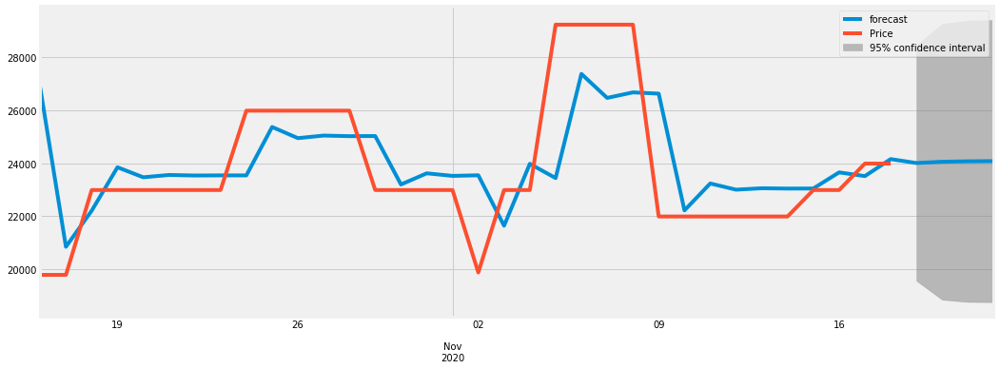

0.7757605654362264
2020-10-16    26871.111087
2020-10-17    20845.077210
2020-10-18    22208.547831
2020-10-19    23850.543580
2020-10-20    23472.027723
2020-10-21    23559.285398
2020-10-22    23539.170133
2020-10-23    23543.807244
2020-10-24    23542.738265
2020-10-25    25373.224806
2020-10-26    24951.248201
2020-10-27    25048.525210
2020-10-28    25026.100231
2020-10-29    25031.269794
2020-10-30    23199.837958
2020-10-31    23622.032479
2020-11-01    23524.705235
2020-11-02    23547.141794
2020-11-03    21640.350084
2020-11-04    23981.536570
2020-11-05    23441.829828
2020-11-06    27379.857130
2020-11-07    26472.035436
2020-11-08    26681.312865
2020-11-09    26633.068763
2020-11-10    22220.499979
2020-11-11    23237.716306
2020-11-12    23003.220459
2020-11-13    23057.278087
2020-11-14    23044.816343
2020-11-15    23047.689112
2020-11-16    23657.106899
2020-11-17    23516.619633
2020-11-18    24159.085781
2020-11-19    24010.979976
2020-11-20    24057.921830
2020-11-2

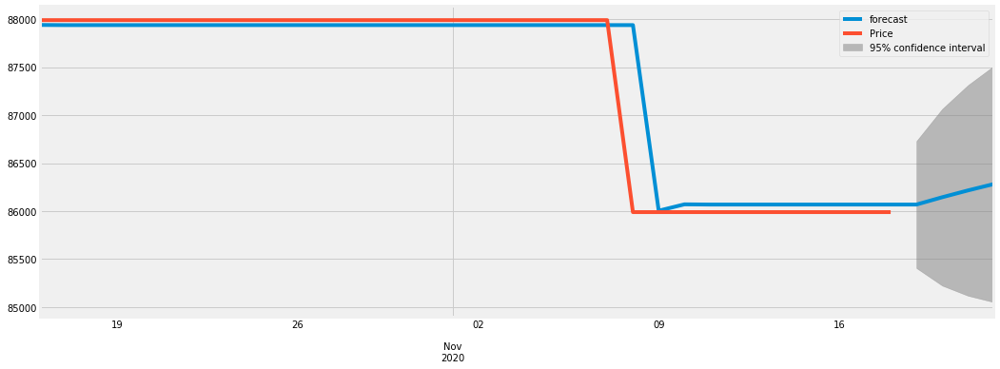

0.9957950441073216
2020-10-16    87939.776741
2020-10-17    87938.165379
2020-10-18    87938.222404
2020-10-19    87938.220450
2020-10-20    87938.220517
2020-10-21    87938.220515
2020-10-22    87938.220515
2020-10-23    87938.220515
2020-10-24    87938.220515
2020-10-25    87938.220515
2020-10-26    87938.220515
2020-10-27    87938.220515
2020-10-28    87938.220515
2020-10-29    87938.220515
2020-10-30    87938.220515
2020-10-31    87938.220515
2020-11-01    87938.220515
2020-11-02    87938.220515
2020-11-03    87938.220515
2020-11-04    87938.220515
2020-11-05    87938.220515
2020-11-06    87938.220515
2020-11-07    87938.220515
2020-11-08    87938.220515
2020-11-09    86004.716418
2020-11-10    86071.013882
2020-11-11    86068.740624
2020-11-12    86068.818572
2020-11-13    86068.815899
2020-11-14    86068.815990
2020-11-15    86068.815987
2020-11-16    86068.815987
2020-11-17    86068.815987
2020-11-18    86068.815987
2020-11-19    86068.815987
2020-11-20    86145.011505
2020-11-2

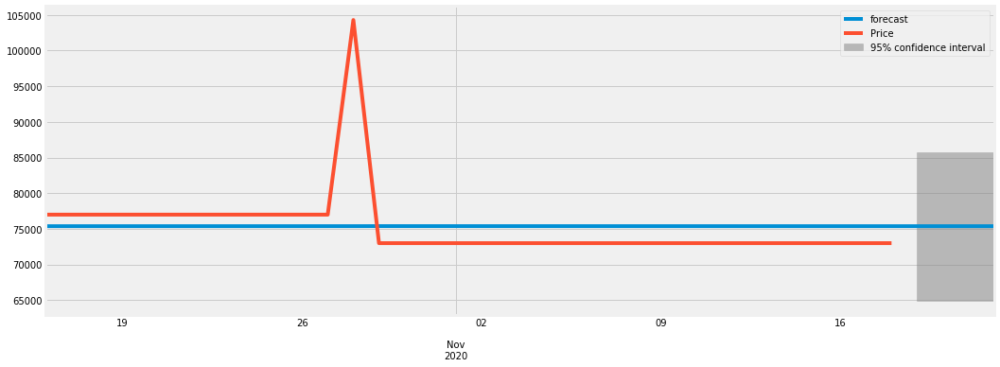

0.00018030285688197534
2020-10-16    75367.797801
2020-10-17    75368.094727
2020-10-18    75368.391544
2020-10-19    75368.688253
2020-10-20    75368.984853
2020-10-21    75369.281345
2020-10-22    75369.577728
2020-10-23    75369.874003
2020-10-24    75370.170170
2020-10-25    75370.466228
2020-10-26    75370.762178
2020-10-27    75371.058020
2020-10-28    75371.353754
2020-10-29    75376.635388
2020-10-30    75376.199578
2020-10-31    75375.763928
2020-11-01    75375.328436
2020-11-02    75374.893103
2020-11-03    75374.457929
2020-11-04    75374.022914
2020-11-05    75373.588057
2020-11-06    75373.153359
2020-11-07    75372.718820
2020-11-08    75372.284439
2020-11-09    75371.850217
2020-11-10    75371.416152
2020-11-11    75370.982246
2020-11-12    75370.548498
2020-11-13    75370.114908
2020-11-14    75369.681476
2020-11-15    75369.248202
2020-11-16    75368.815085
2020-11-17    75368.382126
2020-11-18    75367.949325
2020-11-19    75367.949324
2020-11-20    75367.949324
2020-

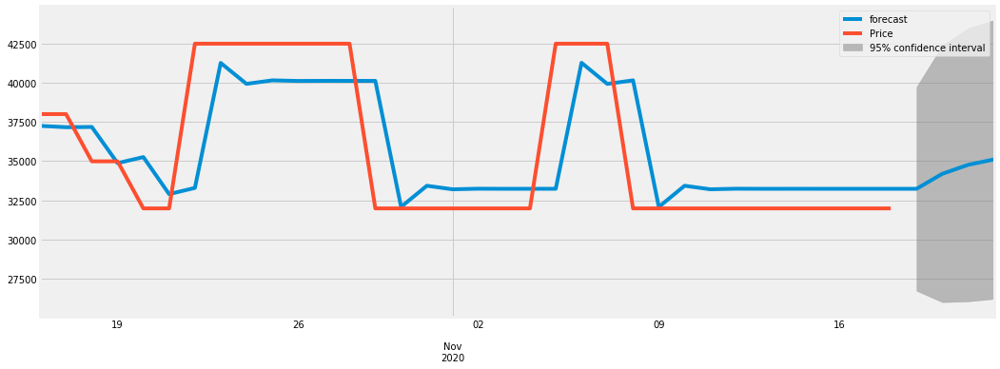

0.893799973208638
2020-10-16    37248.650088
2020-10-17    37163.652896
2020-10-18    37179.498529
2020-10-19    34874.770534
2020-10-20    35260.851217
2020-10-21    32900.932139
2020-10-22    33296.262159
2020-10-23    41260.328813
2020-10-24    39926.200579
2020-10-25    40149.691695
2020-10-26    40112.252806
2020-10-27    40118.524511
2020-10-28    40117.473885
2020-10-29    40117.649884
2020-10-30    32087.328669
2020-10-31    33432.555765
2020-11-01    33207.205385
2020-11-02    33244.955735
2020-11-03    33238.631854
2020-11-04    33239.691221
2020-11-05    33239.513757
2020-11-06    41269.835218
2020-11-07    39924.608080
2020-11-08    40149.958468
2020-11-09    32081.916384
2020-11-10    33433.462423
2020-11-11    33207.053503
2020-11-12    33244.981178
2020-11-13    33238.627592
2020-11-14    33239.691935
2020-11-15    33239.513638
2020-11-16    33239.543506
2020-11-17    33239.538502
2020-11-18    33239.539341
2020-11-19    33239.539200
2020-11-20    34195.538110
2020-11-21

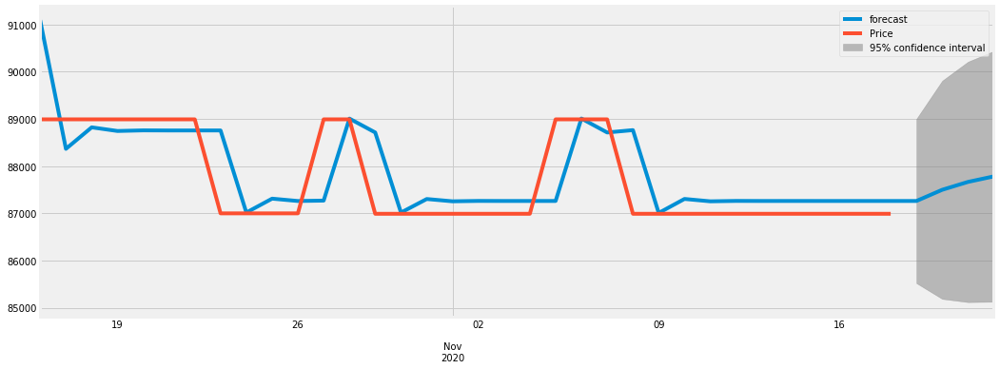

0.9350397920320703
2020-10-16    91090.921533
2020-10-17    88365.156149
2020-10-18    88820.442175
2020-10-19    88743.431525
2020-10-20    88756.466704
2020-10-21    88754.260390
2020-10-22    88754.633831
2020-10-23    88754.570622
2020-10-24    87016.437770
2020-10-25    87310.633556
2020-10-26    87260.838076
2020-10-27    87269.266442
2020-10-28    89005.983411
2020-10-29    88712.027276
2020-10-30    87015.781640
2020-10-31    87302.887610
2020-11-01    87254.292149
2020-11-02    87262.517401
2020-11-03    87261.125198
2020-11-04    87261.360841
2020-11-05    87261.320956
2020-11-06    89007.328261
2020-11-07    88711.799647
2020-11-08    88761.820722
2020-11-09    87007.353618
2020-11-10    87304.314134
2020-11-11    87254.050696
2020-11-12    87262.558269
2020-11-13    87261.118280
2020-11-14    87261.362012
2020-11-15    87261.320758
2020-11-16    87261.327741
2020-11-17    87261.326559
2020-11-18    87261.326759
2020-11-19    87261.326725
2020-11-20    87498.195037
2020-11-2

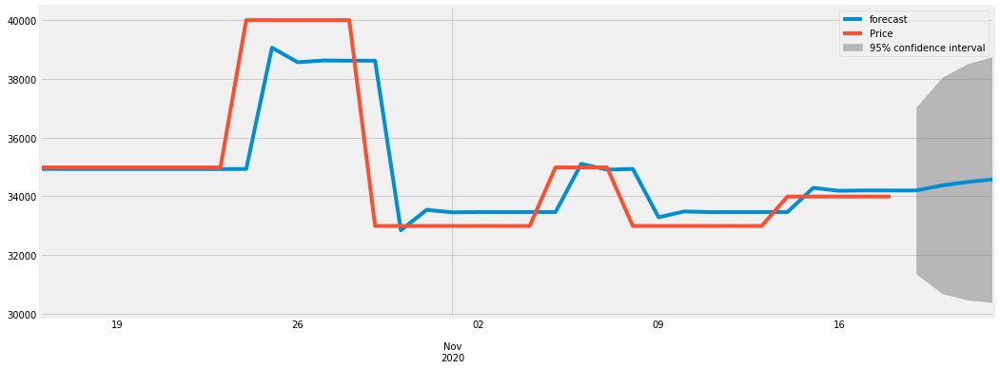

0.9360177550430163
2020-10-16    34932.658721
2020-10-17    34928.125124
2020-10-18    34928.719447
2020-10-19    34928.648738
2020-10-20    34928.657254
2020-10-21    34928.656229
2020-10-22    34928.656353
2020-10-23    34928.656338
2020-10-24    34928.656340
2020-10-25    39061.547501
2020-10-26    38564.456713
2020-10-27    38624.245186
2020-10-28    38617.054022
2020-10-29    38617.918952
2020-10-30    32842.808112
2020-10-31    33537.419774
2020-11-01    33453.874129
2020-11-02    33463.922729
2020-11-03    33462.714116
2020-11-04    33462.859484
2020-11-05    33462.842000
2020-11-06    35104.959749
2020-11-07    34907.451135
2020-11-08    34931.206833
2020-11-09    33286.233927
2020-11-10    33484.085951
2020-11-11    33460.288949
2020-11-12    33463.151175
2020-11-13    33462.806916
2020-11-14    33462.848322
2020-11-15    34286.784961
2020-11-16    34187.684526
2020-11-17    34199.604006
2020-11-18    34198.170369
2020-11-19    34198.342803
2020-11-20    34369.984369
2020-11-2

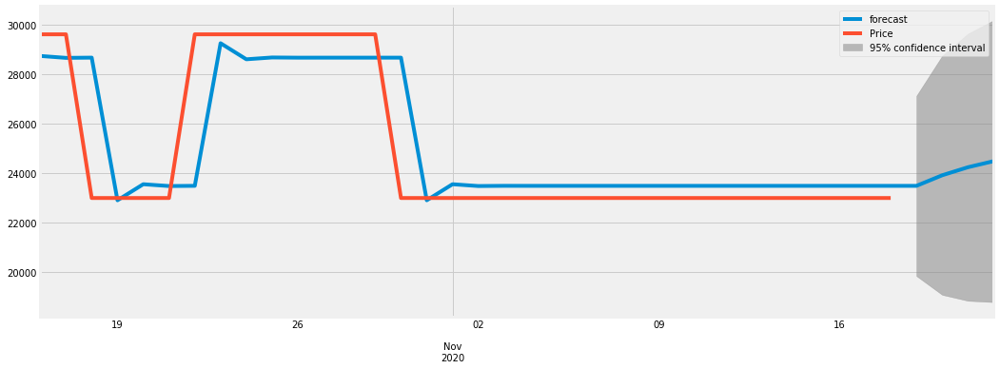

0.956128698513546
2020-10-16    28748.600443
2020-10-17    28670.399709
2020-10-18    28679.987228
2020-10-19    22897.728838
2020-10-20    23548.633415
2020-10-21    23475.361472
2020-10-22    23483.609651
2020-10-23    29263.872095
2020-10-24    28613.191371
2020-10-25    28686.438116
2020-10-26    28678.192773
2020-10-27    28679.120946
2020-10-28    28679.016462
2020-10-29    28679.028224
2020-10-30    28679.026900
2020-10-31    22897.836112
2020-11-01    23548.621339
2020-11-02    23475.362831
2020-11-03    23483.609498
2020-11-04    23482.681176
2020-11-05    23482.785677
2020-11-06    23482.773913
2020-11-07    23482.775237
2020-11-08    23482.775088
2020-11-09    23482.775105
2020-11-10    23482.775103
2020-11-11    23482.775103
2020-11-12    23482.775103
2020-11-13    23482.775103
2020-11-14    23482.775103
2020-11-15    23482.775103
2020-11-16    23482.775103
2020-11-17    23482.775103
2020-11-18    23482.775103
2020-11-19    23482.775103
2020-11-20    23912.138624
2020-11-21

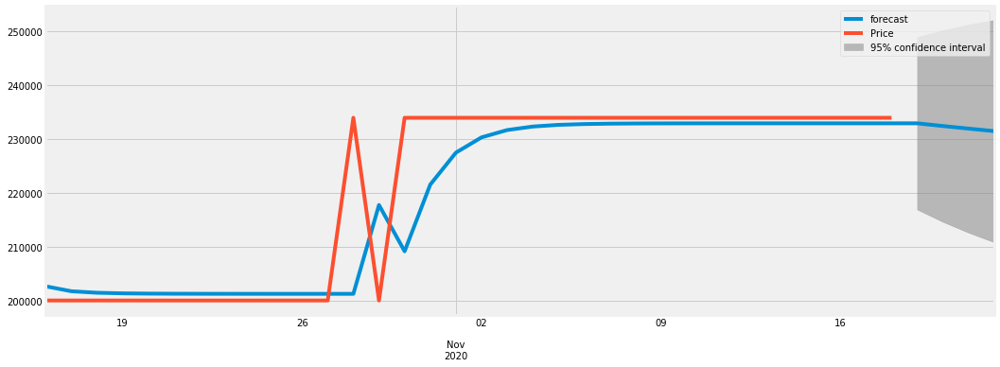

0.9371658284556604
2020-10-16    202627.340888
2020-10-17    201710.229753
2020-10-18    201433.756934
2020-10-19    201323.548912
2020-10-20    201274.889858
2020-10-21    201252.442970
2020-10-22    201241.878949
2020-10-23    201236.860540
2020-10-24    201234.465963
2020-10-25    201233.320954
2020-10-26    201232.772894
2020-10-27    201232.510438
2020-10-28    201232.384723
2020-10-29    217721.270274
2020-10-30    209132.069531
2020-10-31    221505.970876
2020-11-01    227434.246949
2020-11-02    230274.455241
2020-11-03    231635.185249
2020-11-04    232287.104390
2020-11-05    232599.435687
2020-11-06    232749.072095
2020-11-07    232820.762172
2020-11-08    232855.108540
2020-11-09    232871.563718
2020-11-10    232879.447314
2020-11-11    232883.224307
2020-11-12    232885.033846
2020-11-13    232885.900787
2020-11-14    232886.316134
2020-11-15    232886.515125
2020-11-16    232886.610461
2020-11-17    232886.656136
2020-11-18    232886.678018
2020-11-19    232886.688502
2

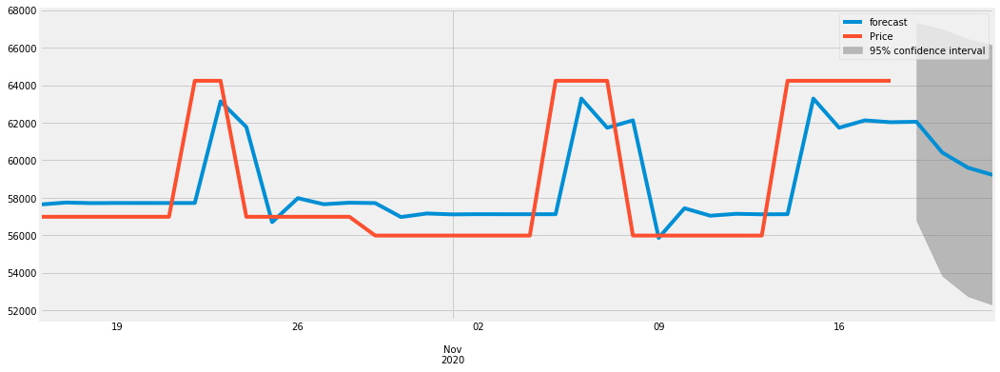

0.8572330128738752
2020-10-16    57645.287165
2020-10-17    57748.242216
2020-10-18    57718.255747
2020-10-19    57725.516513
2020-10-20    57723.667605
2020-10-21    57724.132601
2020-10-22    57724.015287
2020-10-23    63136.545817
2020-10-24    61771.875964
2020-10-25    56703.451366
2020-10-26    57981.361251
2020-10-27    57659.159817
2020-10-28    57740.396972
2020-10-29    57719.914520
2020-10-30    56977.908589
2020-10-31    57164.991714
2020-11-01    57117.822151
2020-11-02    57129.715087
2020-11-03    57126.716502
2020-11-04    57127.472540
2020-11-05    57127.281919
2020-11-06    63287.001145
2020-11-07    61733.941425
2020-11-08    62125.516821
2020-11-09    55867.117135
2020-11-10    57445.057315
2020-11-11    57047.208769
2020-11-12    57147.518950
2020-11-13    57122.227586
2020-11-14    57128.604338
2020-11-15    63286.667721
2020-11-16    61734.025491
2020-11-17    62125.495625
2020-11-18    62026.793643
2020-11-19    62051.679529
2020-11-20    60414.840179
2020-11-2

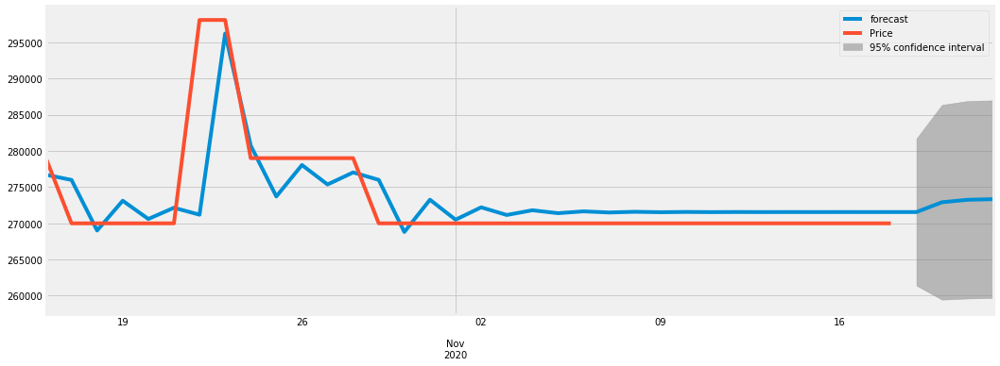

0.7418107281989361
2020-10-16    276699.923749
2020-10-17    275981.658820
2020-10-18    268999.484833
2020-10-19    273112.496115
2020-10-20    270593.396846
2020-10-21    272139.159272
2020-10-22    271182.724904
2020-10-23    296197.347914
2020-10-24    280720.167613
2020-10-25    273700.440984
2020-10-26    278045.507134
2020-10-27    275355.983854
2020-10-28    277020.796295
2020-10-29    275990.283596
2020-10-30    268797.407229
2020-10-31    273249.795820
2020-11-01    270493.767472
2020-11-02    272199.748943
2020-11-03    271143.746377
2020-11-04    271797.411979
2020-11-05    271392.792954
2020-11-06    271643.252139
2020-11-07    271488.217897
2020-11-08    271584.184097
2020-11-09    271524.781017
2020-11-10    271561.551525
2020-11-11    271538.790579
2020-11-12    271552.879605
2020-11-13    271544.158498
2020-11-14    271549.556863
2020-11-15    271546.215275
2020-11-16    271548.283718
2020-11-17    271547.003352
2020-11-18    271547.795899
2020-11-19    271547.305312
2

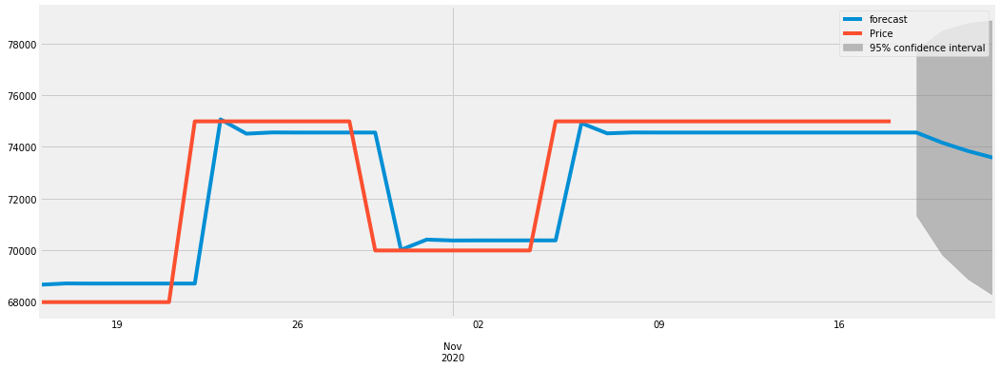

0.9742911423247302
2020-10-16    68663.730893
2020-10-17    68713.197866
2020-10-18    68708.563344
2020-10-19    68708.965274
2020-10-20    68708.930172
2020-10-21    68708.933236
2020-10-22    68708.932968
2020-10-23    75067.408393
2020-10-24    74512.412376
2020-10-25    74560.854897
2020-10-26    74556.626619
2020-10-27    74556.995681
2020-10-28    74556.963468
2020-10-29    74556.966280
2020-10-30    70015.197890
2020-10-31    70411.623637
2020-11-01    70377.021834
2020-11-02    70380.042033
2020-11-03    70379.778417
2020-11-04    70379.801427
2020-11-05    70379.799418
2020-11-06    74921.567738
2020-11-07    74525.141997
2020-11-08    74559.743799
2020-11-09    74556.723600
2020-11-10    74556.987216
2020-11-11    74556.964207
2020-11-12    74556.966215
2020-11-13    74556.966040
2020-11-14    74556.966055
2020-11-15    74556.966054
2020-11-16    74556.966054
2020-11-17    74556.966054
2020-11-18    74556.966054
2020-11-19    74556.966054
2020-11-20    74163.618098
2020-11-2

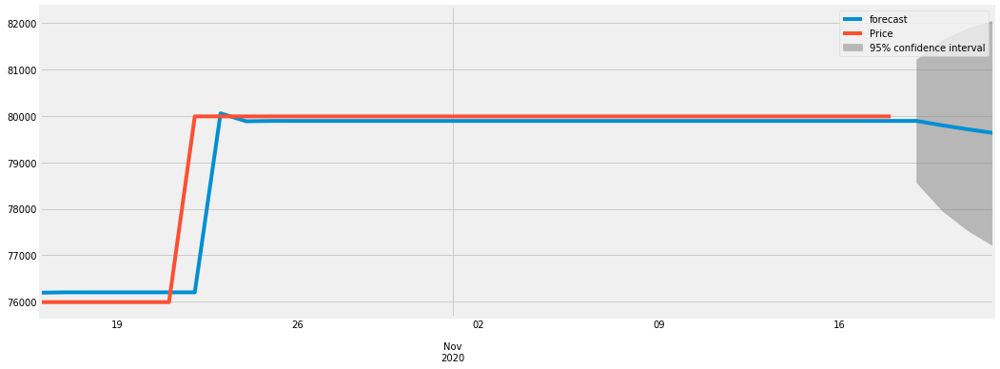

0.9936354543150835
2020-10-16    76192.479296
2020-10-17    76200.754524
2020-10-18    76200.373675
2020-10-19    76200.390485
2020-10-20    76200.389741
2020-10-21    76200.389774
2020-10-22    76200.389773
2020-10-23    80055.517735
2020-10-24    79885.060116
2020-10-25    79892.597038
2020-10-26    79892.263787
2020-10-27    79892.278522
2020-10-28    79892.277870
2020-10-29    79892.277899
2020-10-30    79892.277898
2020-10-31    79892.277898
2020-11-01    79892.277898
2020-11-02    79892.277898
2020-11-03    79892.277898
2020-11-04    79892.277898
2020-11-05    79892.277898
2020-11-06    79892.277898
2020-11-07    79892.277898
2020-11-08    79892.277898
2020-11-09    79892.277898
2020-11-10    79892.277898
2020-11-11    79892.277898
2020-11-12    79892.277898
2020-11-13    79892.277898
2020-11-14    79892.277898
2020-11-15    79892.277898
2020-11-16    79892.277898
2020-11-17    79892.277898
2020-11-18    79892.277898
2020-11-19    79892.277898
2020-11-20    79798.095096
2020-11-2

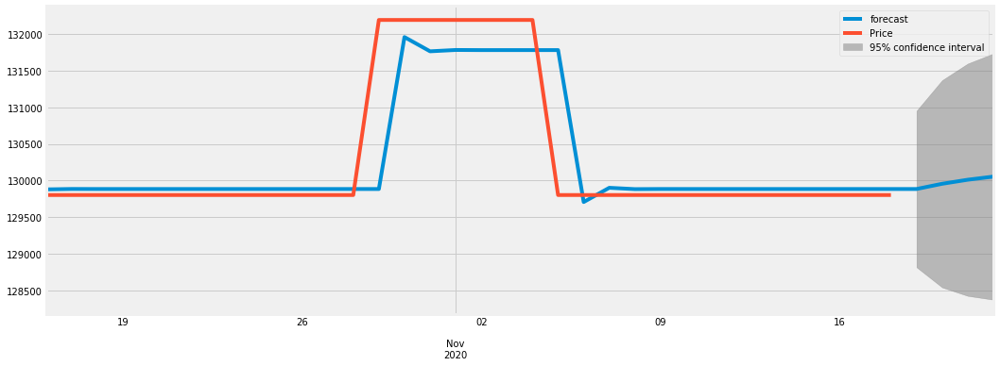

0.9601233886002839
2020-10-16    129879.845788
2020-10-17    129885.617526
2020-10-18    129885.036526
2020-10-19    129885.090546
2020-10-20    129885.085484
2020-10-21    129885.085958
2020-10-22    129885.085914
2020-10-23    129885.085918
2020-10-24    129885.085917
2020-10-25    129885.085917
2020-10-26    129885.085917
2020-10-27    129885.085917
2020-10-28    129885.085917
2020-10-29    129885.085917
2020-10-30    131956.646114
2020-10-31    131762.675302
2020-11-01    131780.837784
2020-11-02    131779.137138
2020-11-03    131779.296378
2020-11-04    131779.281468
2020-11-05    131779.282864
2020-11-06    129707.722536
2020-11-07    129901.693361
2020-11-08    129883.530877
2020-11-09    129885.231524
2020-11-10    129885.072284
2020-11-11    129885.087194
2020-11-12    129885.085798
2020-11-13    129885.085929
2020-11-14    129885.085916
2020-11-15    129885.085917
2020-11-16    129885.085917
2020-11-17    129885.085917
2020-11-18    129885.085917
2020-11-19    129885.085917
2

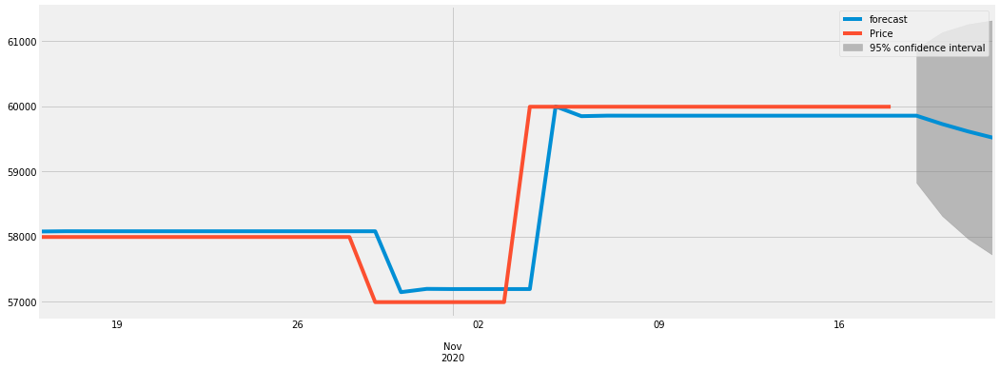

0.9879048640990523
2020-10-16    58074.120299
2020-10-17    58078.110207
2020-10-18    58077.887538
2020-10-19    58077.899372
2020-10-20    58077.898742
2020-10-21    58077.898775
2020-10-22    58077.898773
2020-10-23    58077.898774
2020-10-24    58077.898774
2020-10-25    58077.898774
2020-10-26    58077.898774
2020-10-27    58077.898774
2020-10-28    58077.898774
2020-10-29    58077.898774
2020-10-30    57143.244896
2020-10-31    57193.044313
2020-11-01    57190.390944
2020-11-02    57190.532318
2020-11-03    57190.524786
2020-11-04    57190.525187
2020-11-05    59994.486798
2020-11-06    59845.088548
2020-11-07    59853.048656
2020-11-08    59852.624532
2020-11-09    59852.647130
2020-11-10    59852.645926
2020-11-11    59852.645990
2020-11-12    59852.645987
2020-11-13    59852.645987
2020-11-14    59852.645987
2020-11-15    59852.645987
2020-11-16    59852.645987
2020-11-17    59852.645987
2020-11-18    59852.645987
2020-11-19    59852.645987
2020-11-20    59724.267526
2020-11-2

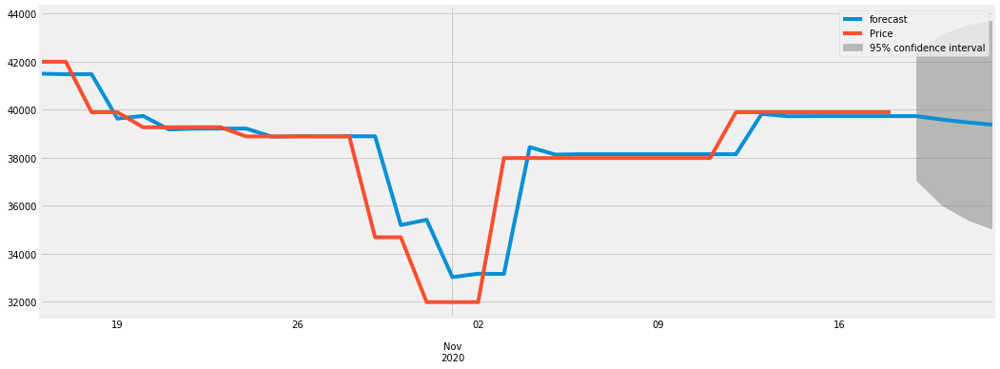

0.9716351093429582
2020-10-16    41504.354731
2020-10-17    41479.842772
2020-10-18    41481.363781
2020-10-19    39633.133279
2020-10-20    39742.415599
2020-10-21    39181.511694
2020-10-22    39214.676866
2020-10-23    39217.996275
2020-10-24    39217.800005
2020-10-25    38878.105723
2020-10-26    38898.191194
2020-10-27    38897.003579
2020-10-28    38897.073800
2020-10-29    38897.069648
2020-10-30    35200.788224
2020-10-31    35419.342252
2020-11-01    33030.238498
2020-11-02    33171.501619
2020-11-03    33163.149002
2020-11-04    38444.045261
2020-11-05    38131.795999
2020-11-06    38150.258698
2020-11-07    38149.167034
2020-11-08    38149.231582
2020-11-09    38149.227766
2020-11-10    38149.227991
2020-11-11    38149.227978
2020-11-12    38149.227979
2020-11-13    39830.156071
2020-11-14    39730.766019
2020-11-15    39736.642762
2020-11-16    39736.295282
2020-11-17    39736.315827
2020-11-18    39736.314613
2020-11-19    39736.314684
2020-11-20    39592.260625
2020-11-2

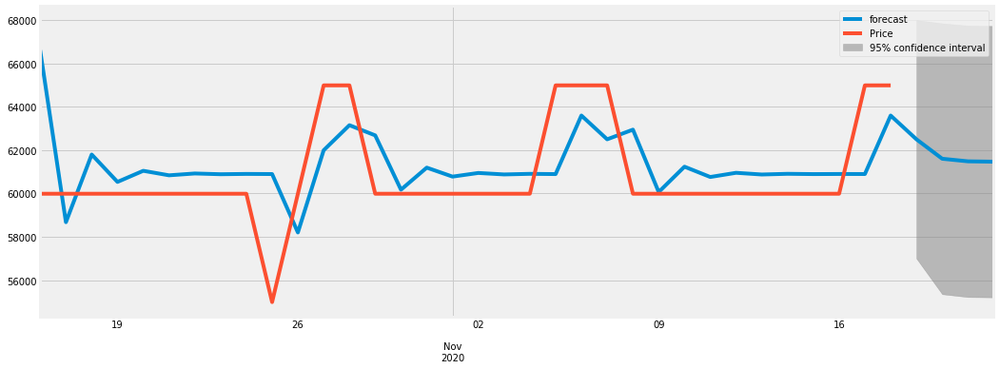

0.6605218423487583
2020-10-16    66612.795370
2020-10-17    58677.602925
2020-10-18    61799.737593
2020-10-19    60535.516513
2020-10-20    61048.319843
2020-10-21    60840.009885
2020-10-22    60924.609269
2020-10-23    60890.246254
2020-10-24    60904.203262
2020-10-25    60898.534301
2020-10-26    58203.801787
2020-10-27    61995.357558
2020-10-28    63152.374749
2020-10-29    62682.428564
2020-10-30    60176.271735
2020-10-31    61194.198565
2020-11-01    60780.746773
2020-11-02    60948.678671
2020-11-03    60880.469698
2020-11-04    60908.174167
2020-11-05    60896.921430
2020-11-06    63598.527038
2020-11-07    62501.214691
2020-11-08    62946.910533
2020-11-09    60068.846976
2020-11-10    61237.831327
2020-11-11    60763.024435
2020-11-12    60955.876961
2020-11-13    60877.545965
2020-11-14    60909.361700
2020-11-15    60896.439089
2020-11-16    60901.687872
2020-11-17    60899.555971
2020-11-18    63597.456965
2020-11-19    62501.649322
2020-11-20    61604.500185
2020-11-2

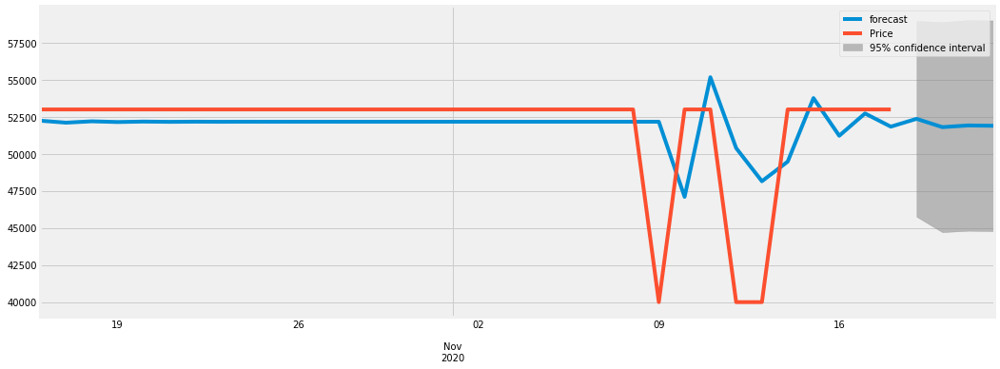

0.4798672517454706
2020-10-16    52230.530387
2020-10-17    52097.948193
2020-10-18    52188.751749
2020-10-19    52140.696448
2020-10-20    52170.817046
2020-10-21    52153.616011
2020-10-22    52164.018659
2020-10-23    52157.932544
2020-10-24    52161.564862
2020-10-25    52159.422231
2020-10-26    52160.694959
2020-10-27    52159.942059
2020-10-28    52160.388536
2020-10-29    52160.124153
2020-10-30    52160.280843
2020-10-31    52160.188026
2020-11-01    52160.243023
2020-11-02    52160.210441
2020-11-03    52160.229746
2020-11-04    52160.218309
2020-11-05    52160.225085
2020-11-06    52160.221070
2020-11-07    52160.223449
2020-11-08    52160.222040
2020-11-09    52160.222875
2020-11-10    47092.074038
2020-11-11    55162.960269
2020-11-12    50381.183596
2020-11-13    48146.105564
2020-11-14    49470.327426
2020-11-15    53753.910971
2020-11-16    51216.006299
2020-11-17    52719.644563
2020-11-18    51828.780515
2020-11-19    52356.592803
2020-11-20    51796.940046
2020-11-2

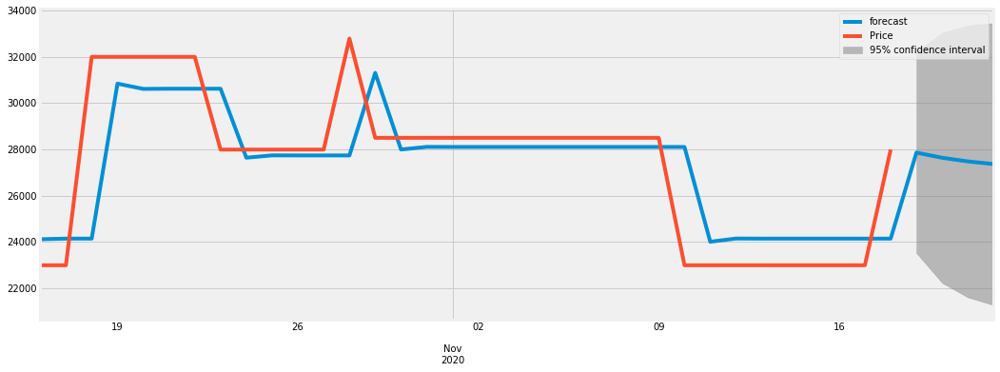

0.9239732200150321
2020-10-16    24114.147582
2020-10-17    24141.812107
2020-10-18    24140.850466
2020-10-19    30840.942238
2020-10-20    30613.635504
2020-10-21    30621.347093
2020-10-22    30621.085470
2020-10-23    30621.094346
2020-10-24    27639.571431
2020-10-25    27740.722319
2020-10-26    27737.290683
2020-10-27    27737.407104
2020-10-28    27737.403155
2020-10-29    31307.198386
2020-10-30    27994.098039
2020-10-31    28106.497995
2020-11-01    28102.684724
2020-11-02    28102.814092
2020-11-03    28102.809703
2020-11-04    28102.809852
2020-11-05    28102.809847
2020-11-06    28102.809847
2020-11-07    28102.809847
2020-11-08    28102.809847
2020-11-09    28102.809847
2020-11-10    28102.809847
2020-11-11    24006.469973
2020-11-12    24145.442045
2020-11-13    24140.727290
2020-11-14    24140.887243
2020-11-15    24140.881816
2020-11-16    24140.882000
2020-11-17    24140.881994
2020-11-18    24140.881994
2020-11-19    27859.418554
2020-11-20    27636.149429
2020-11-2

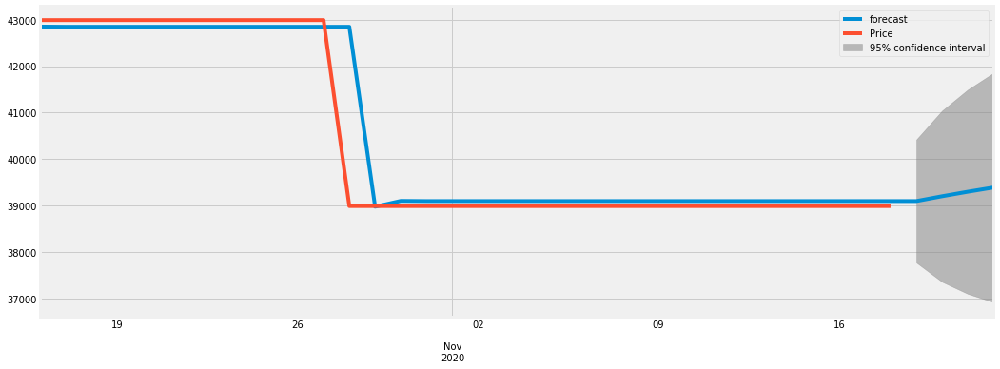

0.9961079137976215
2020-10-16    42851.006512
2020-10-17    42846.825366
2020-10-18    42846.963449
2020-10-19    42846.959026
2020-10-20    42846.959168
2020-10-21    42846.959163
2020-10-22    42846.959163
2020-10-23    42846.959163
2020-10-24    42846.959163
2020-10-25    42846.959163
2020-10-26    42846.959163
2020-10-27    42846.959163
2020-10-28    42846.959163
2020-10-29    38977.362449
2020-10-30    39101.424544
2020-10-31    39097.447022
2020-11-01    39097.574545
2020-11-02    39097.570456
2020-11-03    39097.570587
2020-11-04    39097.570583
2020-11-05    39097.570583
2020-11-06    39097.570583
2020-11-07    39097.570583
2020-11-08    39097.570583
2020-11-09    39097.570583
2020-11-10    39097.570583
2020-11-11    39097.570583
2020-11-12    39097.570583
2020-11-13    39097.570583
2020-11-14    39097.570583
2020-11-15    39097.570583
2020-11-16    39097.570583
2020-11-17    39097.570583
2020-11-18    39097.570583
2020-11-19    39097.570583
2020-11-20    39201.634277
2020-11-2

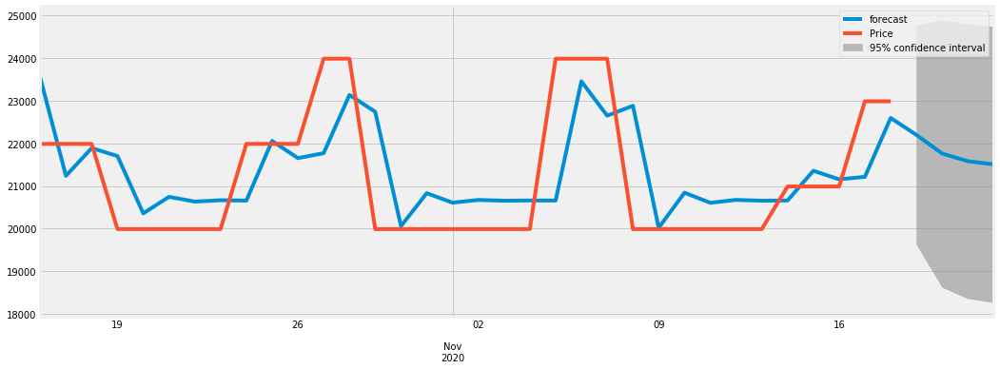

0.8116793760854599
2020-10-16    23550.966146
2020-10-17    21240.016555
2020-10-18    21891.199127
2020-10-19    21704.312333
2020-10-20    20359.128738
2020-10-21    20746.268529
2020-10-22    20634.848384
2020-10-23    20666.915421
2020-10-24    20657.686427
2020-10-25    22059.326877
2020-10-26    21655.930447
2020-10-27    21772.029180
2020-10-28    23137.599925
2020-10-29    22744.584466
2020-10-30    20059.726889
2020-10-31    20832.437153
2020-11-01    20610.048764
2020-11-02    20674.052826
2020-11-03    20655.632260
2020-11-04    20660.933755
2020-11-05    20659.407969
2020-11-06    23457.815730
2020-11-07    22652.425373
2020-11-08    22884.219194
2020-11-09    20019.539585
2020-11-10    20844.003183
2020-11-11    20606.720025
2020-11-12    20675.010847
2020-11-13    20655.356539
2020-11-14    20661.013109
2020-11-15    21358.877289
2020-11-16    21158.029833
2020-11-17    21215.834348
2020-11-18    22598.182348
2020-11-19    22200.338344
2020-11-20    21762.476936
2020-11-2

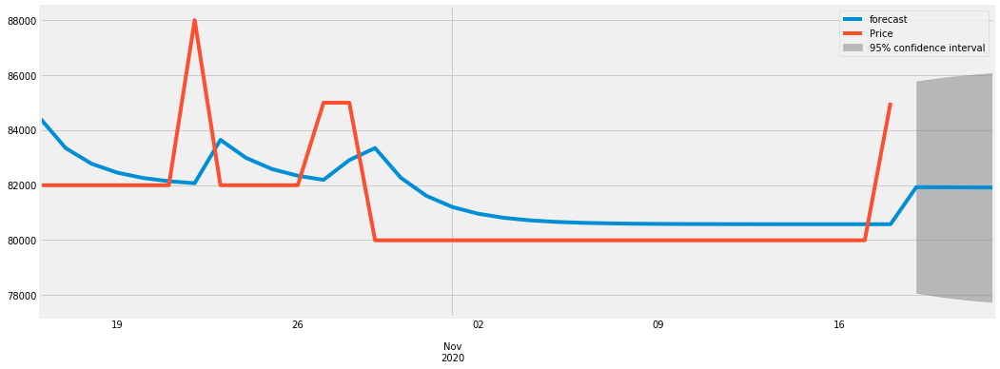

0.592633030414871
2020-10-16    84424.604929
2020-10-17    83336.883643
2020-10-18    82772.116412
2020-10-19    82447.215110
2020-10-20    82253.350433
2020-10-21    82136.127755
2020-10-22    82064.904240
2020-10-23    83639.971004
2020-10-24    82981.039184
2020-10-25    82579.668278
2020-10-26    82335.160831
2020-10-27    82186.206435
2020-10-28    82904.297763
2020-10-29    83341.767232
2020-10-30    82260.223426
2020-10-31    81601.332151
2020-11-01    81199.926466
2020-11-02    80955.384541
2020-11-03    80806.406193
2020-11-04    80715.646506
2020-11-05    80660.354438
2020-11-06    80626.669739
2020-11-07    80606.148550
2020-11-08    80593.646756
2020-11-09    80586.030488
2020-11-10    80581.390552
2020-11-11    80578.563837
2020-11-12    80576.841764
2020-11-13    80575.792652
2020-11-14    80575.153519
2020-11-15    80574.764150
2020-11-16    80574.526941
2020-11-17    80574.382430
2020-11-18    80574.294392
2020-11-19    81922.295981
2020-11-20    81916.430475
2020-11-21

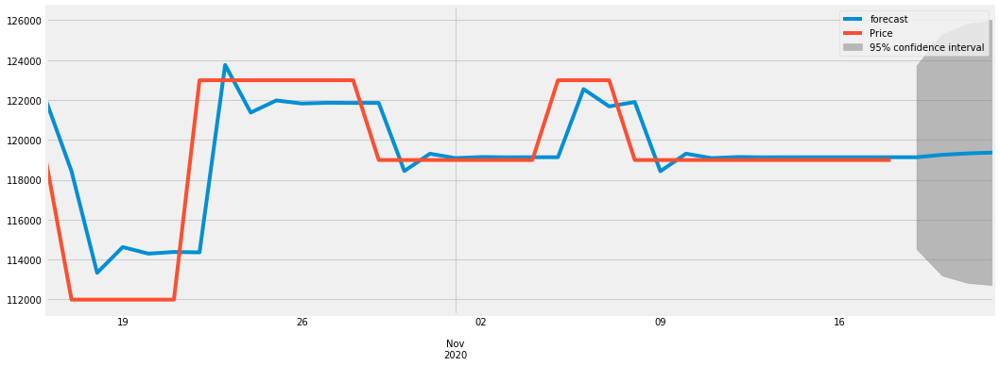

0.9035407032793777
2020-10-16    121987.942802
2020-10-17    118429.624211
2020-10-18    113334.974034
2020-10-19    114625.557612
2020-10-20    114297.710227
2020-10-21    114380.977335
2020-10-22    114359.827305
2020-10-23    123757.105052
2020-10-24    121370.211067
2020-10-25    121976.478442
2020-10-26    121822.487468
2020-10-27    121861.600937
2020-10-28    121851.666176
2020-10-29    121854.189590
2020-10-30    118438.310210
2020-10-31    119305.938281
2020-11-01    119085.562095
2020-11-02    119141.537305
2020-11-03    119127.319688
2020-11-04    119130.930941
2020-11-05    119130.013688
2020-11-06    122545.485105
2020-11-07    121677.960657
2020-11-08    121898.310523
2020-11-09    118427.103562
2020-11-10    119308.784752
2020-11-11    119084.839096
2020-11-12    119141.720946
2020-11-13    119127.273044
2020-11-14    119130.942789
2020-11-15    119130.010679
2020-11-16    119130.247433
2020-11-17    119130.187298
2020-11-18    119130.202572
2020-11-19    119130.198693
2

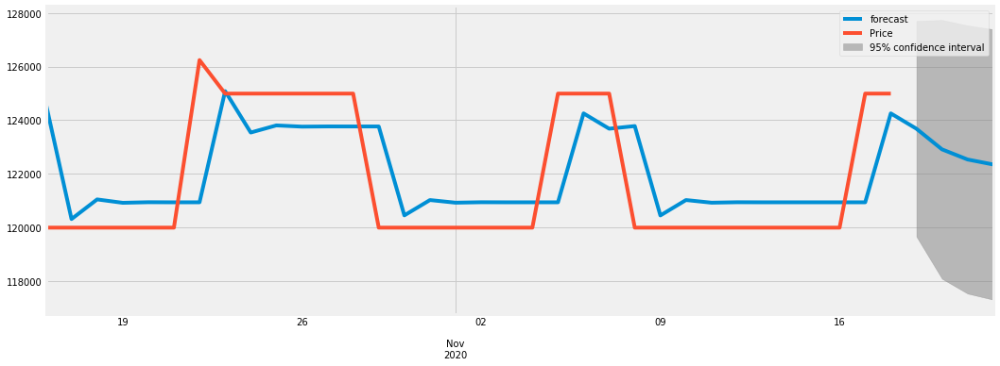

0.8319230861635705
2020-10-16    124611.160089
2020-10-17    120309.908746
2020-10-18    121042.305093
2020-10-19    120916.122551
2020-10-20    120937.857779
2020-10-21    120934.113505
2020-10-22    120934.758513
2020-10-23    125080.913703
2020-10-24    123537.420830
2020-10-25    123803.311444
2020-10-26    123757.507657
2020-10-27    123765.398071
2020-10-28    123764.038825
2020-10-29    123764.272976
2020-10-30    120447.219597
2020-10-31    121018.633549
2020-11-01    120920.198623
2020-11-02    120937.155567
2020-11-03    120934.234470
2020-11-04    120934.737674
2020-11-05    120934.650990
2020-11-06    124251.678965
2020-11-07    123680.269390
2020-11-08    123778.703562
2020-11-09    120444.733704
2020-11-10    121019.061782
2020-11-11    120920.124853
2020-11-12    120937.168275
2020-11-13    120934.232281
2020-11-14    120934.738051
2020-11-15    120934.650925
2020-11-16    120934.665934
2020-11-17    120934.663348
2020-11-18    124251.676836
2020-11-19    123680.269756
2

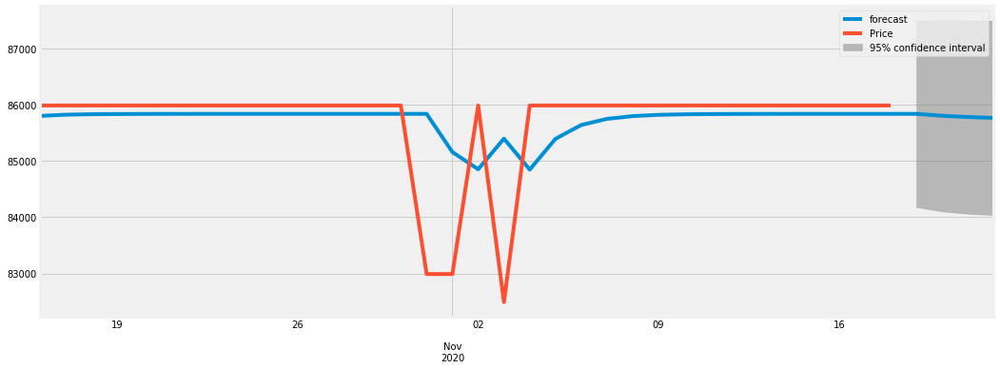

0.447245593097087
2020-10-16    85804.191413
2020-10-17    85825.895071
2020-10-18    85834.439985
2020-10-19    85838.060599
2020-10-20    85839.642167
2020-10-21    85840.342209
2020-10-22    85840.653874
2020-10-23    85840.792988
2020-10-24    85840.855156
2020-10-25    85840.882951
2020-10-26    85840.895381
2020-10-27    85840.900941
2020-10-28    85840.903428
2020-10-29    85840.904540
2020-10-30    85840.905037
2020-10-31    85840.905260
2020-11-01    85159.827529
2020-11-02    84855.186147
2020-11-03    85399.999985
2020-11-04    84849.100662
2020-11-05    85397.277989
2020-11-06    85642.473934
2020-11-07    85752.148393
2020-11-08    85801.205024
2020-11-09    85823.147717
2020-11-10    85832.962533
2020-11-11    85837.352632
2020-11-12    85839.316293
2020-11-13    85840.194626
2020-11-14    85840.587498
2020-11-15    85840.763226
2020-11-16    85840.841829
2020-11-17    85840.876987
2020-11-18    85840.892713
2020-11-19    85840.899747
2020-11-20    85807.053268
2020-11-21

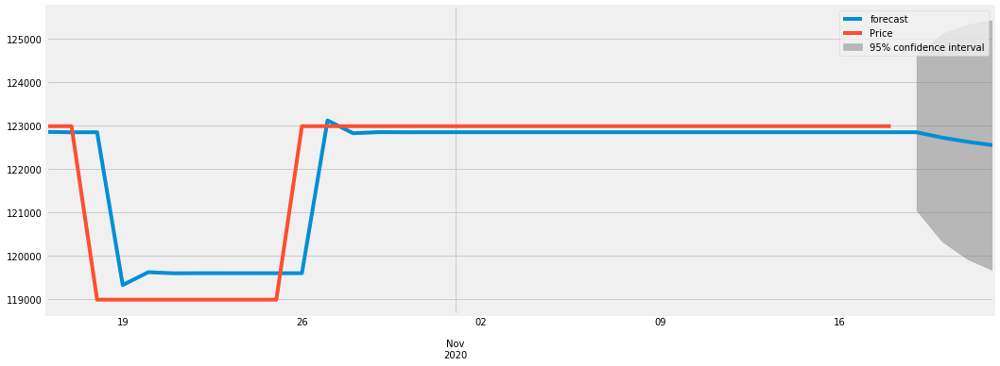

0.9668303358920721
2020-10-16    122858.753190
2020-10-17    122849.738451
2020-10-18    122850.545626
2020-10-19    119327.909781
2020-10-20    119623.062654
2020-10-21    119598.332524
2020-10-22    119600.404601
2020-10-23    119600.230987
2020-10-24    119600.245533
2020-10-25    119600.244315
2020-10-26    119600.244417
2020-10-27    123122.813090
2020-10-28    122827.665769
2020-10-29    122852.395434
2020-10-30    122850.323396
2020-10-31    122850.497007
2020-11-01    122850.482461
2020-11-02    122850.483679
2020-11-03    122850.483577
2020-11-04    122850.483586
2020-11-05    122850.483585
2020-11-06    122850.483585
2020-11-07    122850.483585
2020-11-08    122850.483585
2020-11-09    122850.483585
2020-11-10    122850.483585
2020-11-11    122850.483585
2020-11-12    122850.483585
2020-11-13    122850.483585
2020-11-14    122850.483585
2020-11-15    122850.483585
2020-11-16    122850.483585
2020-11-17    122850.483585
2020-11-18    122850.483585
2020-11-19    122850.483585
2

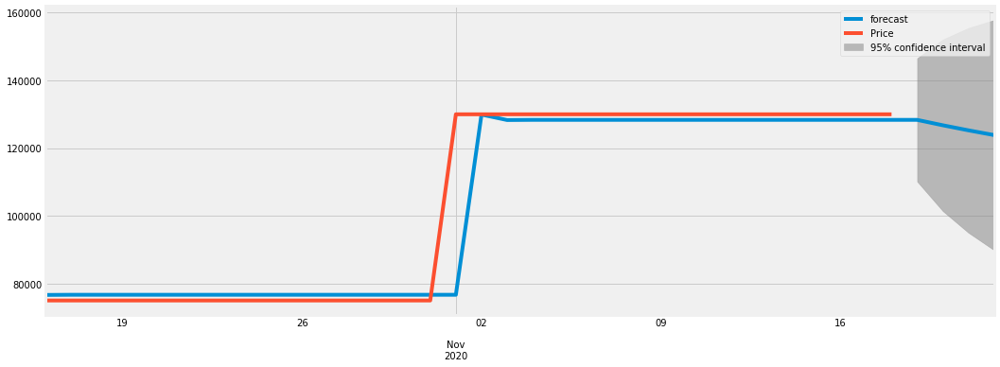

0.9964369931144746
2020-10-16     76627.980707
2020-10-17     76674.597482
2020-10-18     76673.146437
2020-10-19     76673.190316
2020-10-20     76673.188988
2020-10-21     76673.189029
2020-10-22     76673.189027
2020-10-23     76673.189027
2020-10-24     76673.189027
2020-10-25     76673.189027
2020-10-26     76673.189027
2020-10-27     76673.189027
2020-10-28     76673.189027
2020-10-29     76673.189027
2020-10-30     76673.189027
2020-10-31     76673.189027
2020-11-01     76673.189027
2020-11-02    129916.651680
2020-11-03    128305.198109
2020-11-04    128353.969967
2020-11-05    128352.493850
2020-11-06    128352.538525
2020-11-07    128352.537173
2020-11-08    128352.537214
2020-11-09    128352.537213
2020-11-10    128352.537213
2020-11-11    128352.537213
2020-11-12    128352.537213
2020-11-13    128352.537213
2020-11-14    128352.537213
2020-11-15    128352.537213
2020-11-16    128352.537213
2020-11-17    128352.537213
2020-11-18    128352.537213
2020-11-19    128352.537213
2

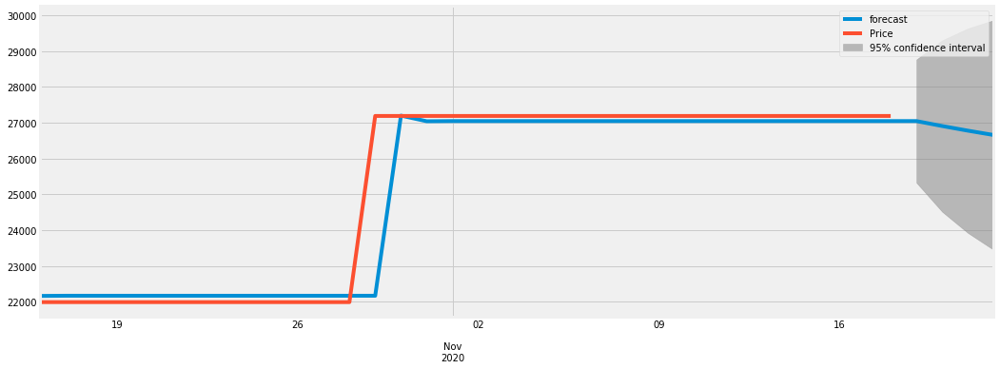

0.9962424063580436
2020-10-16    22163.225998
2020-10-17    22168.320742
2020-10-18    22168.156495
2020-10-19    22168.161634
2020-10-20    22168.161473
2020-10-21    22168.161478
2020-10-22    22168.161478
2020-10-23    22168.161478
2020-10-24    22168.161478
2020-10-25    22168.161478
2020-10-26    22168.161478
2020-10-27    22168.161478
2020-10-28    22168.161478
2020-10-29    22168.161478
2020-10-30    27199.728352
2020-10-31    27042.152451
2020-11-01    27047.087328
2020-11-02    27046.932780
2020-11-03    27046.937620
2020-11-04    27046.937468
2020-11-05    27046.937473
2020-11-06    27046.937473
2020-11-07    27046.937473
2020-11-08    27046.937473
2020-11-09    27046.937473
2020-11-10    27046.937473
2020-11-11    27046.937473
2020-11-12    27046.937473
2020-11-13    27046.937473
2020-11-14    27046.937473
2020-11-15    27046.937473
2020-11-16    27046.937473
2020-11-17    27046.937473
2020-11-18    27046.937473
2020-11-19    27046.937473
2020-11-20    26908.508882
2020-11-2

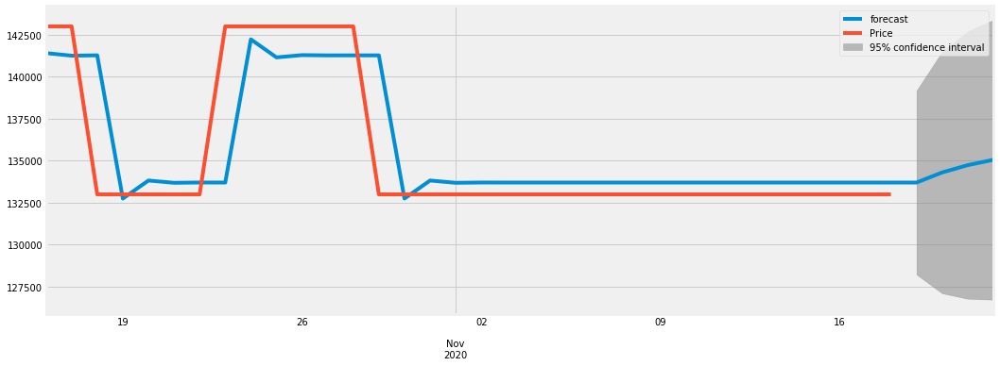

0.9450311980264465
2020-10-16    141399.771559
2020-10-17    141245.783510
2020-10-18    141267.056858
2020-10-19    132740.014200
2020-10-20    133814.179319
2020-10-21    133678.864718
2020-10-22    133695.910553
2020-10-23    133693.763257
2020-10-24    142218.432283
2020-10-25    141144.563672
2020-10-26    141279.840923
2020-10-27    141262.799793
2020-10-28    141264.946497
2020-10-29    141264.676072
2020-10-30    132740.311612
2020-10-31    133814.141855
2020-11-01    133678.869437
2020-11-02    133695.909958
2020-11-03    133693.763332
2020-11-04    133694.033746
2020-11-05    133693.999682
2020-11-06    133694.003973
2020-11-07    133694.003432
2020-11-08    133694.003500
2020-11-09    133694.003492
2020-11-10    133694.003493
2020-11-11    133694.003493
2020-11-12    133694.003493
2020-11-13    133694.003493
2020-11-14    133694.003493
2020-11-15    133694.003493
2020-11-16    133694.003493
2020-11-17    133694.003493
2020-11-18    133694.003493
2020-11-19    133694.003493
2

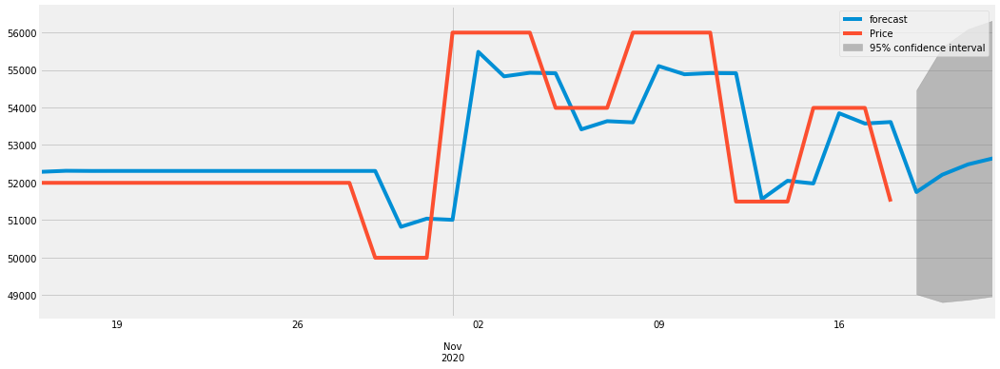

0.8903122423972812
2020-10-16    52282.269254
2020-10-17    52310.924035
2020-10-18    52306.326622
2020-10-19    52306.988890
2020-10-20    52306.891899
2020-10-21    52306.906069
2020-10-22    52306.903998
2020-10-23    52306.904301
2020-10-24    52306.904257
2020-10-25    52306.904263
2020-10-26    52306.904262
2020-10-27    52306.904262
2020-10-28    52306.904262
2020-10-29    52306.904262
2020-10-30    50816.179285
2020-10-31    51034.043515
2020-11-01    51002.203421
2020-11-02    55485.739936
2020-11-03    54830.486789
2020-11-04    54926.249740
2020-11-05    54912.254320
2020-11-06    53416.866462
2020-11-07    53635.412156
2020-11-08    53603.472468
2020-11-09    55105.573582
2020-11-10    54886.046769
2020-11-11    54918.129844
2020-11-12    54913.441015
2020-11-13    51553.286808
2020-11-14    52044.361567
2020-11-15    51972.592713
2020-11-16    53846.487702
2020-11-17    53572.624517
2020-11-18    53612.648662
2020-11-19    51743.393051
2020-11-20    52205.447881
2020-11-2

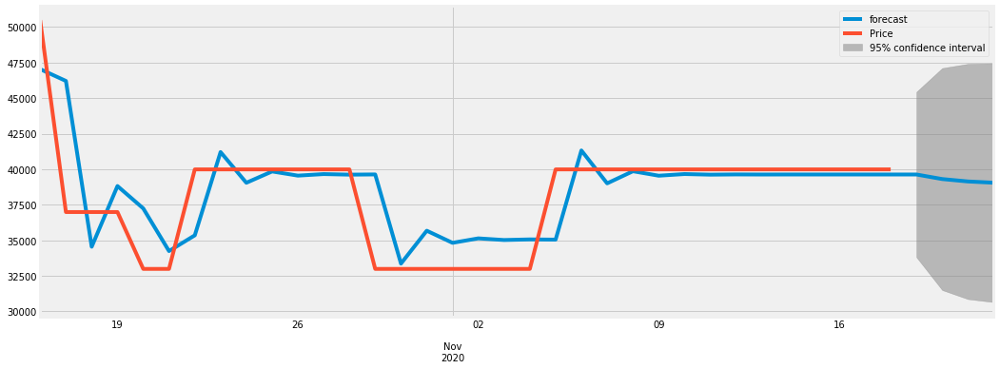

0.8666766060381794
2020-10-16    47043.560675
2020-10-17    46211.672855
2020-10-18    34549.236927
2020-10-19    38818.731233
2020-10-20    37245.324075
2020-10-21    34244.891424
2020-10-22    35351.437870
2020-10-23    41209.452940
2020-10-24    39048.976846
2020-10-25    39845.775477
2020-10-26    39551.910585
2020-10-27    39660.290008
2020-10-28    39620.318920
2020-10-29    39635.060536
2020-10-30    33363.504466
2020-10-31    35676.498108
2020-11-01    34823.449912
2020-11-02    35138.060039
2020-11-03    35022.029629
2020-11-04    35064.822454
2020-11-05    35049.040162
2020-11-06    41320.980041
2020-11-07    39007.844848
2020-11-08    39860.945248
2020-11-09    39546.315867
2020-11-10    39662.353379
2020-11-11    39619.557935
2020-11-12    39635.341193
2020-11-13    39629.520217
2020-11-14    39631.667034
2020-11-15    39630.875273
2020-11-16    39631.167280
2020-11-17    39631.059586
2020-11-18    39631.099304
2020-11-19    39631.084656
2020-11-20    39309.803436
2020-11-2

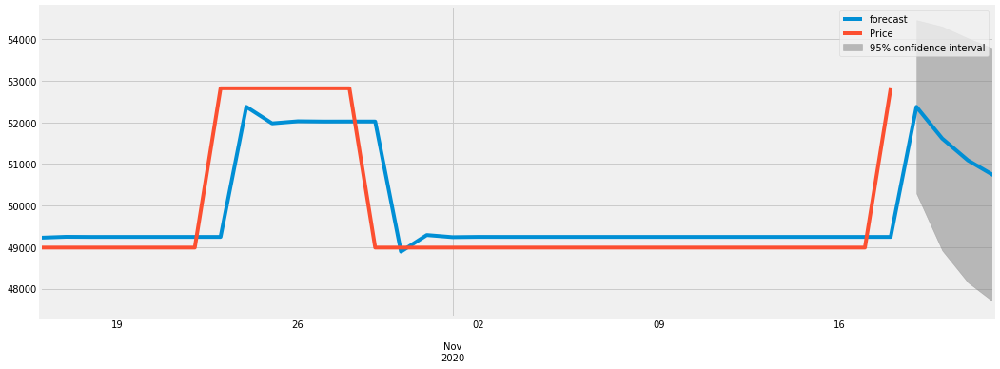

0.9336896196245429
2020-10-16    49226.672748
2020-10-17    49248.917156
2020-10-18    49245.822018
2020-10-19    49246.211033
2020-10-20    49246.161472
2020-10-21    49246.167775
2020-10-22    49246.166974
2020-10-23    49246.167076
2020-10-24    52374.396189
2020-10-25    51976.464806
2020-10-26    52027.084303
2020-10-27    52020.645169
2020-10-28    52021.464270
2020-10-29    52021.360075
2020-10-30    48893.144203
2020-10-31    49291.073901
2020-11-01    49240.454618
2020-11-02    49246.893725
2020-11-03    49246.074628
2020-11-04    49246.178822
2020-11-05    49246.165568
2020-11-06    49246.167254
2020-11-07    49246.167040
2020-11-08    49246.167067
2020-11-09    49246.167064
2020-11-10    49246.167064
2020-11-11    49246.167064
2020-11-12    49246.167064
2020-11-13    49246.167064
2020-11-14    49246.167064
2020-11-15    49246.167064
2020-11-16    49246.167064
2020-11-17    49246.167064
2020-11-18    49246.167064
2020-11-19    52374.396190
2020-11-20    51612.508979
2020-11-2

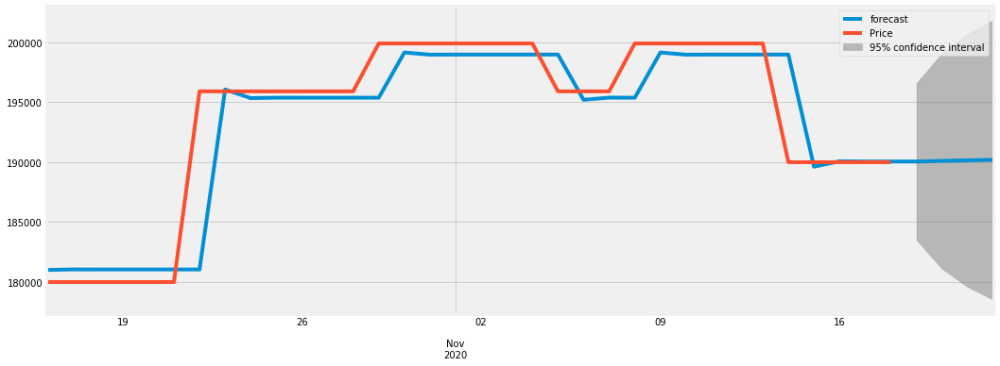

0.98901588717027
2020-10-16    180996.536894
2020-10-17    181040.267735
2020-10-18    181038.072306
2020-10-19    181038.177714
2020-10-20    181038.172642
2020-10-21    181038.172886
2020-10-22    181038.172874
2020-10-23    196061.093324
2020-10-24    195338.294295
2020-10-25    195373.070385
2020-10-26    195371.397200
2020-10-27    195371.477702
2020-10-28    195371.473829
2020-10-29    195371.474015
2020-10-30    199146.086623
2020-10-31    198964.478371
2020-11-01    198973.216104
2020-11-02    198972.795705
2020-11-03    198972.815931
2020-11-04    198972.814958
2020-11-05    198972.815005
2020-11-06    195198.202386
2020-11-07    195379.810639
2020-11-08    195371.072906
2020-11-09    199146.105922
2020-11-10    198964.477442
2020-11-11    198973.216148
2020-11-12    198972.795702
2020-11-13    198972.815931
2020-11-14    198972.814958
2020-11-15    189616.534106
2020-11-16    190066.693630
2020-11-17    190045.035067
2020-11-18    190046.077128
2020-11-19    190046.026991
202

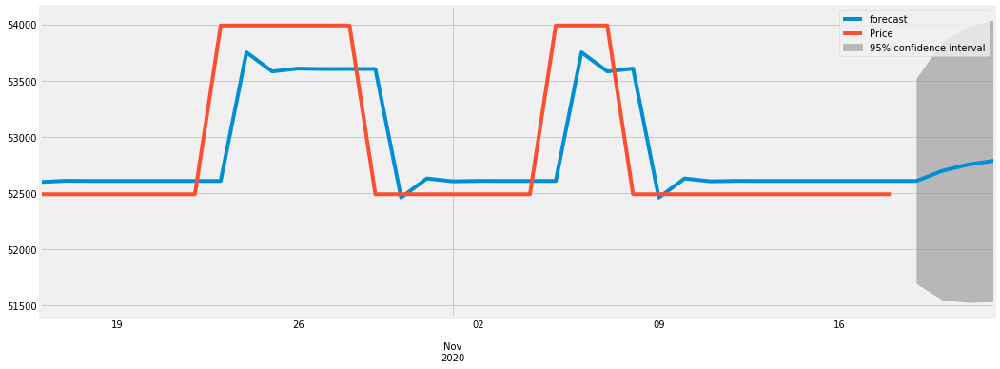

0.8979437745590676
2020-10-16    52598.756551
2020-10-17    52609.781814
2020-10-18    52607.980369
2020-10-19    52608.243659
2020-10-20    52608.204503
2020-10-21    52608.210311
2020-10-22    52608.209449
2020-10-23    52608.209577
2020-10-24    53751.191545
2020-10-25    53581.587409
2020-10-26    53606.754528
2020-10-27    53603.020044
2020-10-28    53603.574195
2020-10-29    53603.491966
2020-10-30    52460.522181
2020-10-31    52630.124509
2020-11-01    52604.957658
2020-11-02    52608.692102
2020-11-03    52608.137958
2020-11-04    52608.220186
2020-11-05    52608.207984
2020-11-06    53751.191781
2020-11-07    53581.587374
2020-11-08    53606.754533
2020-11-09    52460.038057
2020-11-10    52630.196347
2020-11-11    52604.946998
2020-11-12    52608.693684
2020-11-13    52608.137723
2020-11-14    52608.220221
2020-11-15    52608.207979
2020-11-16    52608.209795
2020-11-17    52608.209526
2020-11-18    52608.209566
2020-11-19    52608.209560
2020-11-20    52698.283826
2020-11-2

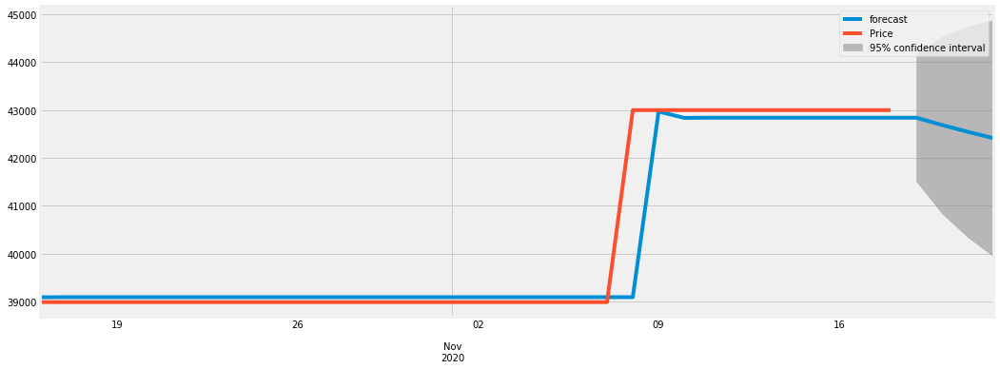

0.9957954780364193
2020-10-16    39090.601949
2020-10-17    39093.830355
2020-10-18    39093.716079
2020-10-19    39093.719994
2020-10-20    39093.719860
2020-10-21    39093.719865
2020-10-22    39093.719865
2020-10-23    39093.719865
2020-10-24    39093.719865
2020-10-25    39093.719865
2020-10-26    39093.719865
2020-10-27    39093.719865
2020-10-28    39093.719865
2020-10-29    39093.719865
2020-10-30    39093.719865
2020-10-31    39093.719865
2020-11-01    39093.719865
2020-11-02    39093.719865
2020-11-03    39093.719865
2020-11-04    39093.719865
2020-11-05    39093.719865
2020-11-06    39093.719865
2020-11-07    39093.719865
2020-11-08    39093.719865
2020-11-09    42969.433544
2020-11-10    42836.510703
2020-11-11    42841.069471
2020-11-12    42840.913122
2020-11-13    42840.918484
2020-11-14    42840.918300
2020-11-15    42840.918307
2020-11-16    42840.918306
2020-11-17    42840.918306
2020-11-18    42840.918306
2020-11-19    42840.918306
2020-11-20    42688.092319
2020-11-2

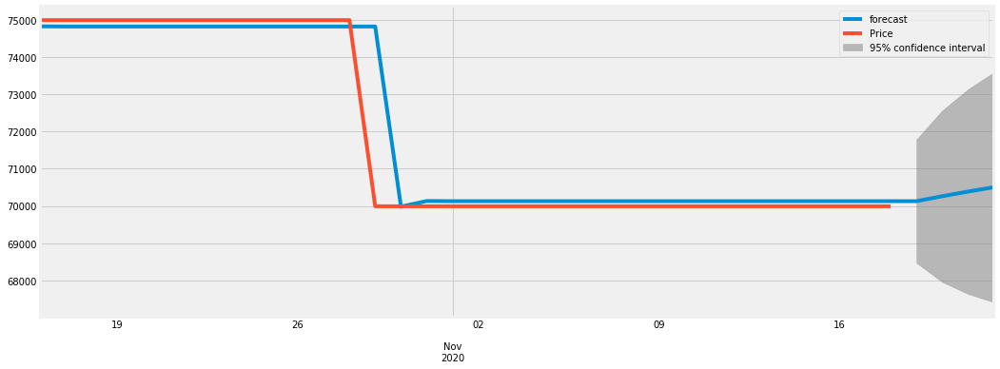

0.9962431458423668
2020-10-16    74823.385554
2020-10-17    74818.485352
2020-10-18    74818.643324
2020-10-19    74818.638381
2020-10-20    74818.638536
2020-10-21    74818.638531
2020-10-22    74818.638531
2020-10-23    74818.638531
2020-10-24    74818.638531
2020-10-25    74818.638531
2020-10-26    74818.638531
2020-10-27    74818.638531
2020-10-28    74818.638531
2020-10-29    74818.638531
2020-10-30    69980.574671
2020-10-31    70132.087080
2020-11-01    70127.342205
2020-11-02    70127.490799
2020-11-03    70127.486145
2020-11-04    70127.486291
2020-11-05    70127.486287
2020-11-06    70127.486287
2020-11-07    70127.486287
2020-11-08    70127.486287
2020-11-09    70127.486287
2020-11-10    70127.486287
2020-11-11    70127.486287
2020-11-12    70127.486287
2020-11-13    70127.486287
2020-11-14    70127.486287
2020-11-15    70127.486287
2020-11-16    70127.486287
2020-11-17    70127.486287
2020-11-18    70127.486287
2020-11-19    70127.486287
2020-11-20    70260.519774
2020-11-2

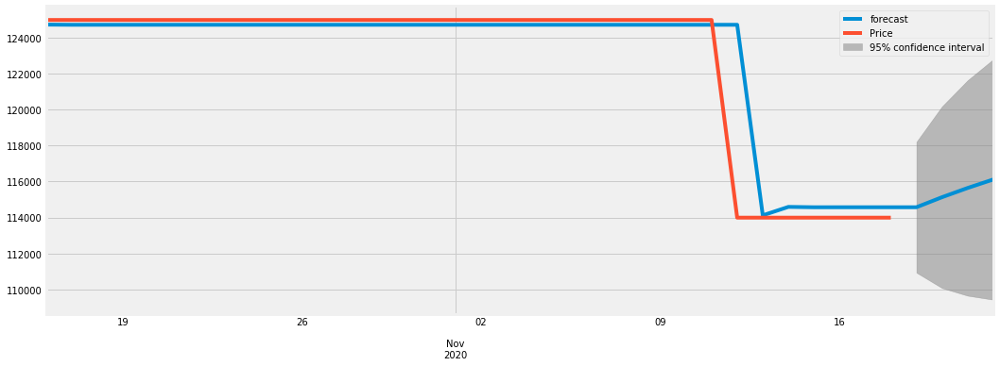

0.9940116985037866
2020-10-16    124732.155901
2020-10-17    124721.595146
2020-10-18    124722.082269
2020-10-19    124722.060723
2020-10-20    124722.061678
2020-10-21    124722.061636
2020-10-22    124722.061638
2020-10-23    124722.061638
2020-10-24    124722.061638
2020-10-25    124722.061638
2020-10-26    124722.061638
2020-10-27    124722.061638
2020-10-28    124722.061638
2020-10-29    124722.061638
2020-10-30    124722.061638
2020-10-31    124722.061638
2020-11-01    124722.061638
2020-11-02    124722.061638
2020-11-03    124722.061638
2020-11-04    124722.061638
2020-11-05    124722.061638
2020-11-06    124722.061638
2020-11-07    124722.061638
2020-11-08    124722.061638
2020-11-09    124722.061638
2020-11-10    124722.061638
2020-11-11    124722.061638
2020-11-12    124722.061638
2020-11-13    114119.391027
2020-11-14    114589.207019
2020-11-15    114568.388955
2020-11-16    114569.311427
2020-11-17    114569.270551
2020-11-18    114569.272362
2020-11-19    114569.272282
2

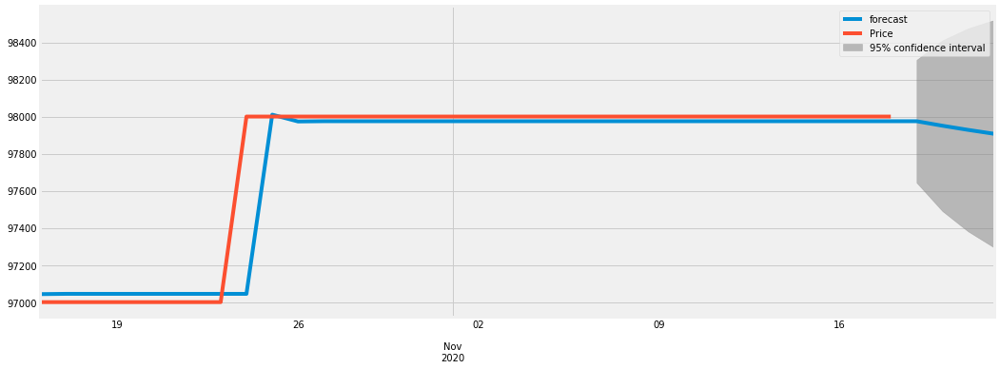

0.9949667520429105
2020-10-16    97043.097763
2020-10-17    97044.621795
2020-10-18    97044.561891
2020-10-19    97044.564162
2020-10-20    97044.564076
2020-10-21    97044.564080
2020-10-22    97044.564079
2020-10-23    97044.564079
2020-10-24    97044.564079
2020-10-25    98010.236137
2020-10-26    97973.575731
2020-10-27    97974.967492
2020-10-28    97974.914656
2020-10-29    97974.916662
2020-10-30    97974.916586
2020-10-31    97974.916589
2020-11-01    97974.916588
2020-11-02    97974.916588
2020-11-03    97974.916588
2020-11-04    97974.916588
2020-11-05    97974.916588
2020-11-06    97974.916588
2020-11-07    97974.916588
2020-11-08    97974.916588
2020-11-09    97974.916588
2020-11-10    97974.916588
2020-11-11    97974.916588
2020-11-12    97974.916588
2020-11-13    97974.916588
2020-11-14    97974.916588
2020-11-15    97974.916588
2020-11-16    97974.916588
2020-11-17    97974.916588
2020-11-18    97974.916588
2020-11-19    97974.916588
2020-11-20    97950.694239
2020-11-2

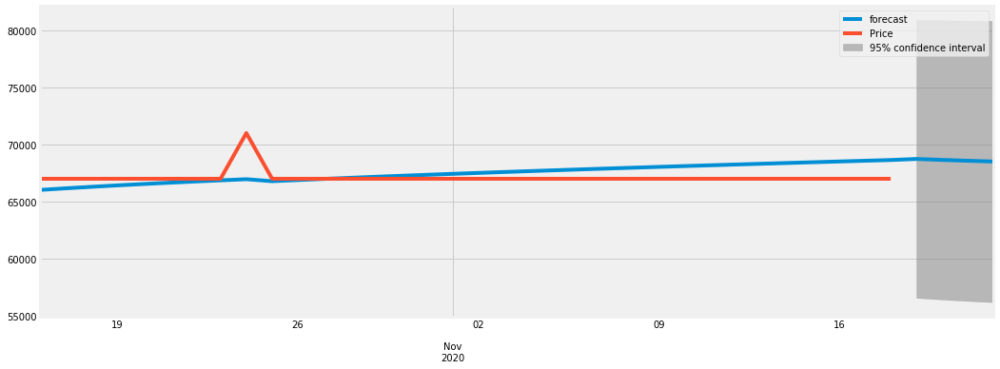

-0.11013398581602285
2020-10-16    66012.411411
2020-10-17    66153.575608
2020-10-18    66285.995305
2020-10-19    66410.832492
2020-10-20    66529.052012
2020-10-21    66641.461676
2020-10-22    66748.742955
2020-10-23    66851.474753
2020-10-24    66950.152003
2020-10-25    66776.520022
2020-10-26    66877.391864
2020-10-27    66974.728630
2020-10-28    67068.866179
2020-10-29    67160.099131
2020-10-30    67248.687009
2020-10-31    67334.859310
2020-11-01    67418.819729
2020-11-02    67500.749686
2020-11-03    67580.811288
2020-11-04    67659.149832
2020-11-05    67735.895931
2020-11-06    67811.167321
2020-11-07    67885.070414
2020-11-08    67957.701621
2020-11-09    68029.148504
2020-11-10    68099.490769
2020-11-11    68168.801126
2020-11-12    68237.146041
2020-11-13    68304.586391
2020-11-14    68371.178040
2020-11-15    68436.972345
2020-11-16    68502.016603
2020-11-17    68566.354440
2020-11-18    68630.026165
2020-11-19    68723.680081
2020-11-20    68640.214225
2020-11

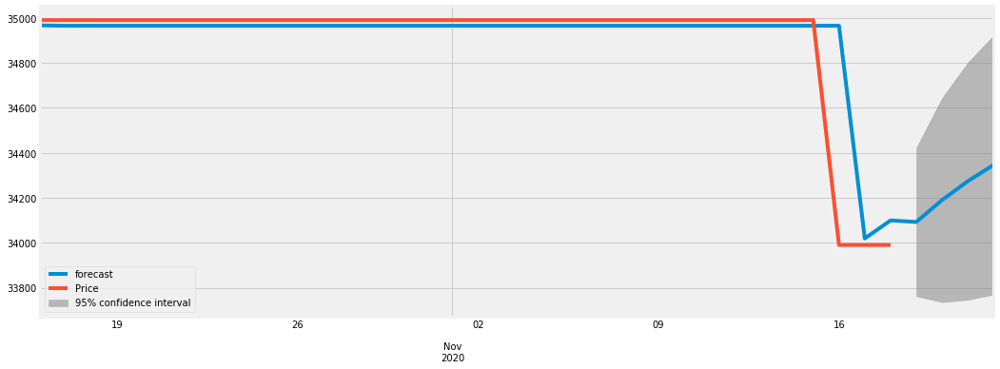

0.9842585722434887
2020-10-16    34966.610298
2020-10-17    34964.874269
2020-10-18    34965.032399
2020-10-19    34965.019074
2020-10-20    34965.020205
2020-10-21    34965.020109
2020-10-22    34965.020117
2020-10-23    34965.020116
2020-10-24    34965.020116
2020-10-25    34965.020116
2020-10-26    34965.020116
2020-10-27    34965.020116
2020-10-28    34965.020116
2020-10-29    34965.020116
2020-10-30    34965.020116
2020-10-31    34965.020116
2020-11-01    34965.020116
2020-11-02    34965.020116
2020-11-03    34965.020116
2020-11-04    34965.020116
2020-11-05    34965.020116
2020-11-06    34965.020116
2020-11-07    34965.020116
2020-11-08    34965.020116
2020-11-09    34965.020116
2020-11-10    34965.020116
2020-11-11    34965.020116
2020-11-12    34965.020116
2020-11-13    34965.020116
2020-11-14    34965.020116
2020-11-15    34965.020116
2020-11-16    34965.020116
2020-11-17    34019.044160
2020-11-18    34099.259726
2020-11-19    34092.457717
2020-11-20    34189.957041
2020-11-2

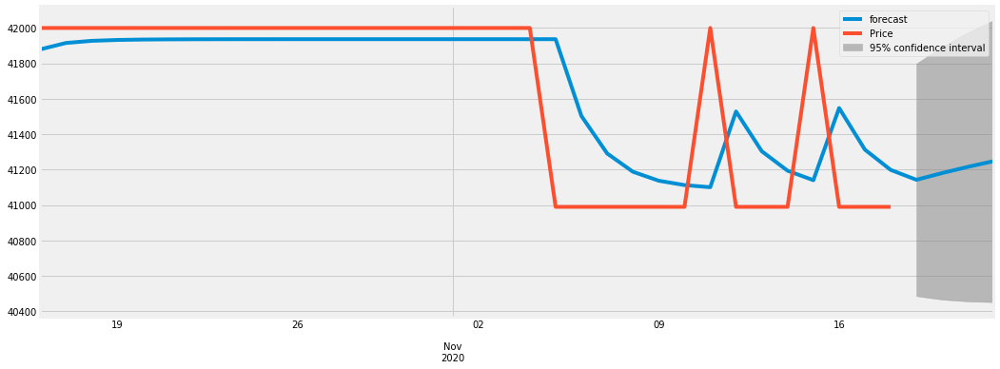

0.8379193018511786
2020-10-16    41878.194439
2020-10-17    41914.396876
2020-10-18    41926.454158
2020-10-19    41931.472953
2020-10-20    41933.751573
2020-10-21    41934.826716
2020-10-22    41935.343217
2020-10-23    41935.593487
2020-10-24    41935.715261
2020-10-25    41935.774632
2020-10-26    41935.803607
2020-10-27    41935.817755
2020-10-28    41935.824664
2020-10-29    41935.828039
2020-10-30    41935.829687
2020-10-31    41935.830493
2020-11-01    41935.830886
2020-11-02    41935.831078
2020-11-03    41935.831172
2020-11-04    41935.831218
2020-11-05    41935.831240
2020-11-06    41502.754756
2020-11-07    41291.200568
2020-11-08    41187.858141
2020-11-09    41137.376243
2020-11-10    41112.716264
2020-11-11    41100.670073
2020-11-12    41527.862107
2020-11-13    41303.465295
2020-11-14    41193.849357
2020-11-15    41140.302901
2020-11-16    41547.222407
2020-11-17    41312.922638
2020-11-18    41198.469188
2020-11-19    41142.559649
2020-11-20    41180.728986
2020-11-2

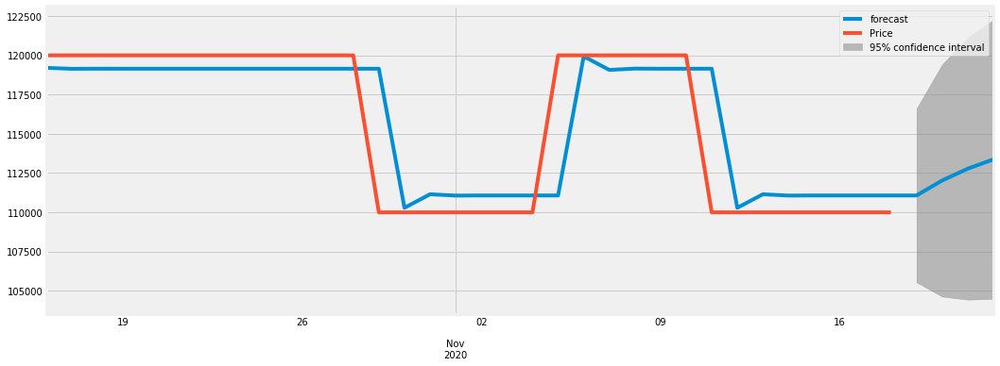

0.9657622996344326
2020-10-16    119195.542297
2020-10-17    119132.561046
2020-10-18    119139.172910
2020-10-19    119138.534694
2020-10-20    119138.596824
2020-10-21    119138.590780
2020-10-22    119138.591368
2020-10-23    119138.591311
2020-10-24    119138.591317
2020-10-25    119138.591316
2020-10-26    119138.591316
2020-10-27    119138.591316
2020-10-28    119138.591316
2020-10-29    119138.591316
2020-10-30    110280.637937
2020-10-31    111142.305387
2020-11-01    111058.485710
2020-11-02    111066.639364
2020-11-03    111065.846208
2020-11-04    111065.923363
2020-11-05    111065.915858
2020-11-06    119923.869967
2020-11-07    119062.202446
2020-11-08    119146.022130
2020-11-09    119137.868475
2020-11-10    119138.661631
2020-11-11    119138.584476
2020-11-12    110280.638603
2020-11-13    111142.305322
2020-11-14    111058.485716
2020-11-15    111066.639363
2020-11-16    111065.846208
2020-11-17    111065.923363
2020-11-18    111065.915858
2020-11-19    111065.916588
2

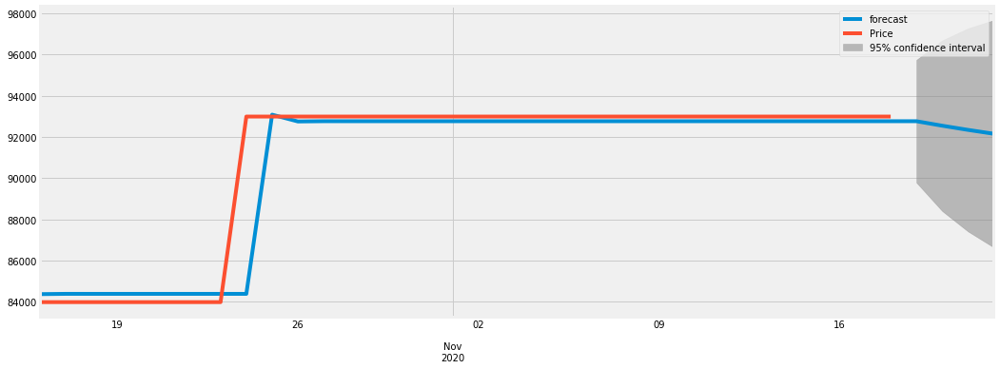

0.994966479584137
2020-10-16    84377.716566
2020-10-17    84391.424289
2020-10-18    84390.885609
2020-10-19    84390.906027
2020-10-20    84390.905252
2020-10-21    84390.905282
2020-10-22    84390.905281
2020-10-23    84390.905281
2020-10-24    84390.905281
2020-10-25    93081.935794
2020-10-26    92752.061774
2020-10-27    92764.582369
2020-10-28    92764.107141
2020-10-29    92764.125179
2020-10-30    92764.124494
2020-10-31    92764.124520
2020-11-01    92764.124519
2020-11-02    92764.124519
2020-11-03    92764.124519
2020-11-04    92764.124519
2020-11-05    92764.124519
2020-11-06    92764.124519
2020-11-07    92764.124519
2020-11-08    92764.124519
2020-11-09    92764.124519
2020-11-10    92764.124519
2020-11-11    92764.124519
2020-11-12    92764.124519
2020-11-13    92764.124519
2020-11-14    92764.124519
2020-11-15    92764.124519
2020-11-16    92764.124519
2020-11-17    92764.124519
2020-11-18    92764.124519
2020-11-19    92764.124519
2020-11-20    92546.003330
2020-11-21

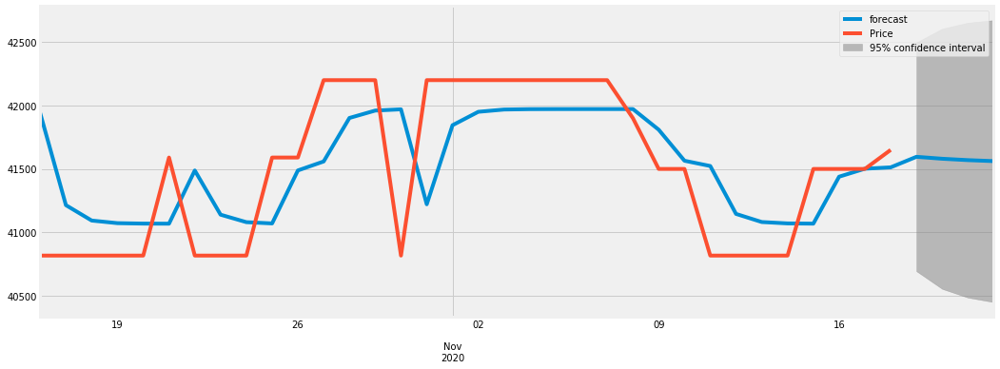

0.8399919708933246
2020-10-16    41940.858772
2020-10-17    41214.437756
2020-10-18    41093.185850
2020-10-19    41072.631526
2020-10-20    41069.144176
2020-10-21    41068.552437
2020-10-22    41487.807416
2020-10-23    41139.593158
2020-10-24    41080.506548
2020-10-25    41070.480457
2020-10-26    41488.134572
2020-10-27    41559.004060
2020-10-28    41901.956803
2020-10-29    41960.150615
2020-10-30    41970.025211
2020-10-31    41221.418111
2020-11-01    41844.673652
2020-11-02    41950.430544
2020-11-03    41968.375865
2020-11-04    41971.420910
2020-11-05    41971.937607
2020-11-06    41972.025283
2020-11-07    41972.040160
2020-11-08    41972.042684
2020-11-09    41809.291992
2020-11-10    41564.674205
2020-11-11    41523.166324
2020-11-12    41145.593022
2020-11-13    41081.524632
2020-11-14    41070.653211
2020-11-15    41068.808497
2020-11-16    41439.025530
2020-11-17    41501.845673
2020-11-18    41512.505287
2020-11-19    41595.689620
2020-11-20    41580.341140
2020-11-2

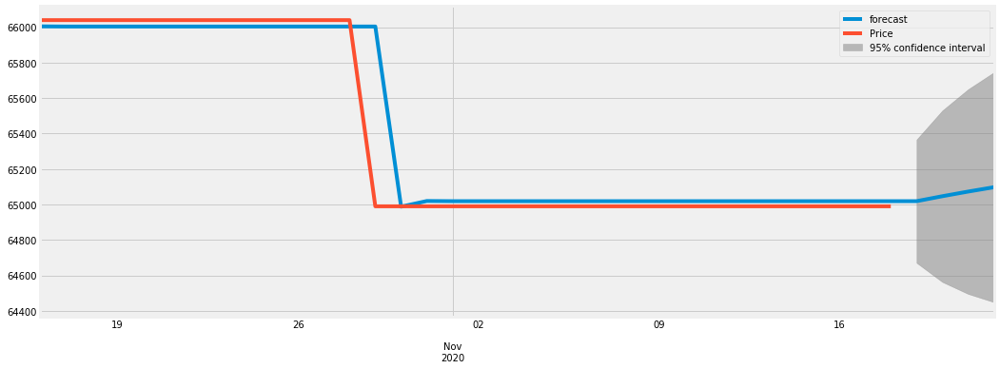

0.9962424585192872
2020-10-16    66005.044825
2020-10-17    66004.016908
2020-10-18    66004.050042
2020-10-19    66004.049005
2020-10-20    66004.049038
2020-10-21    66004.049036
2020-10-22    66004.049037
2020-10-23    66004.049037
2020-10-24    66004.049037
2020-10-25    66004.049037
2020-10-26    66004.049037
2020-10-27    66004.049037
2020-10-28    66004.049037
2020-10-29    66004.049037
2020-10-30    64988.060518
2020-10-31    65019.873973
2020-11-01    65018.877805
2020-11-02    65018.908997
2020-11-03    65018.908021
2020-11-04    65018.908051
2020-11-05    65018.908050
2020-11-06    65018.908050
2020-11-07    65018.908050
2020-11-08    65018.908050
2020-11-09    65018.908050
2020-11-10    65018.908050
2020-11-11    65018.908050
2020-11-12    65018.908050
2020-11-13    65018.908050
2020-11-14    65018.908050
2020-11-15    65018.908050
2020-11-16    65018.908050
2020-11-17    65018.908050
2020-11-18    65018.908050
2020-11-19    65018.908050
2020-11-20    65046.879714
2020-11-2

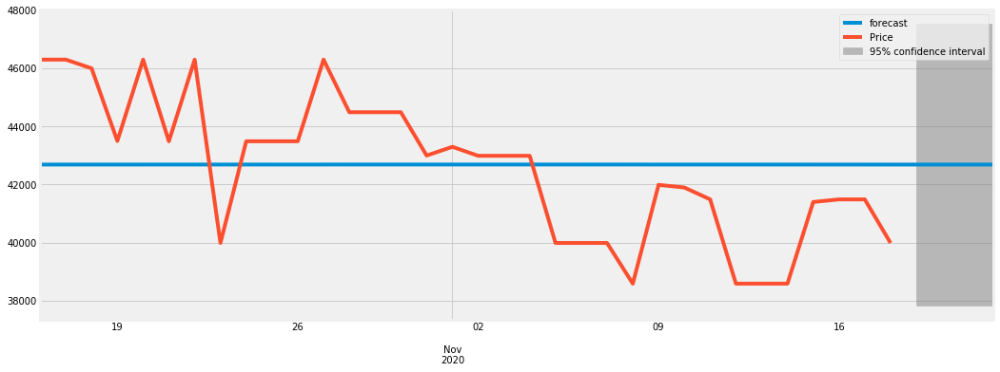

5.681146556779648e-05
2020-10-16    42688.061774
2020-10-17    42688.282202
2020-10-18    42688.502604
2020-10-19    42688.704672
2020-10-20    42688.754114
2020-10-21    42688.974446
2020-10-22    42689.023316
2020-10-23    42689.243605
2020-10-24    42689.078946
2020-10-25    42689.127801
2020-10-26    42689.176649
2020-10-27    42689.225492
2020-10-28    42689.445701
2020-10-29    42689.555505
2020-10-30    42689.665295
2020-10-31    42689.775071
2020-11-01    42689.793925
2020-11-02    42689.831067
2020-11-03    42689.849367
2020-11-04    42689.867664
2020-11-05    42689.885960
2020-11-06    42689.721393
2020-11-07    42689.556846
2020-11-08    42689.392319
2020-11-09    42689.142493
2020-11-10    42689.099888
2020-11-11    42689.051744
2020-11-12    42688.978684
2020-11-13    42688.728945
2020-11-14    42688.479235
2020-11-15    42688.229556
2020-11-16    42688.151082
2020-11-17    42688.078100
2020-11-18    42688.005126
2020-11-19    42688.005127
2020-11-20    42688.005127
2020-1

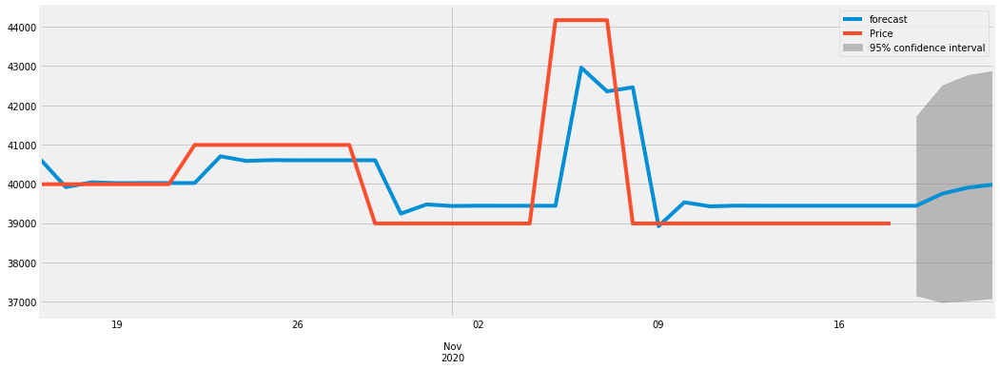

0.8432535246028843
2020-10-16    40631.602723
2020-10-17    39916.833571
2020-10-18    40038.526690
2020-10-19    40017.600749
2020-10-20    40021.199755
2020-10-21    40020.580755
2020-10-22    40020.687217
2020-10-23    40699.979386
2020-10-24    40583.146839
2020-10-25    40603.241056
2020-10-26    40599.785019
2020-10-27    40600.379429
2020-10-28    40600.277195
2020-10-29    40600.294779
2020-10-30    39241.670795
2020-10-31    39475.342708
2020-11-01    39435.153102
2020-11-02    39442.065377
2020-11-03    39440.876524
2020-11-04    39441.080996
2020-11-05    39441.045829
2020-11-06    42957.842230
2020-11-07    42352.982789
2020-11-08    42457.013532
2020-11-09    38922.330765
2020-11-10    39530.266511
2020-11-11    39425.706669
2020-11-12    39443.690084
2020-11-13    39440.597088
2020-11-14    39441.129057
2020-11-15    39441.037563
2020-11-16    39441.053299
2020-11-17    39441.050592
2020-11-18    39441.051058
2020-11-19    39441.050978
2020-11-20    39747.454648
2020-11-2

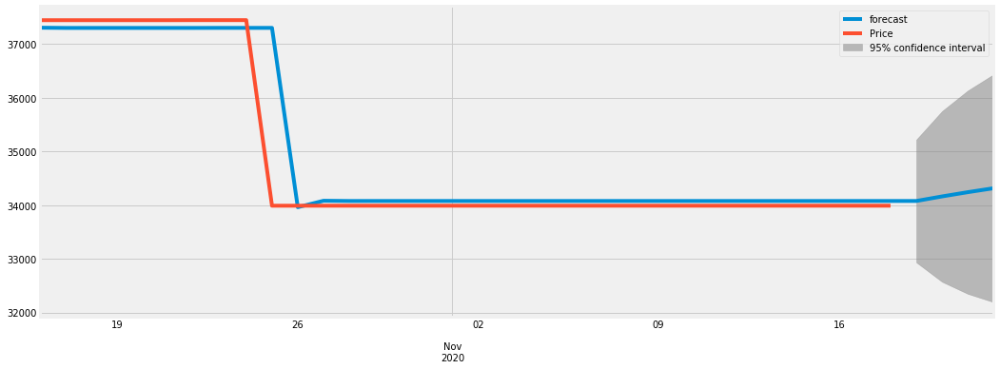

0.995374844490792
2020-10-16    37308.065793
2020-10-17    37303.372299
2020-10-18    37303.546535
2020-10-19    37303.540284
2020-10-20    37303.540509
2020-10-21    37303.540500
2020-10-22    37303.540501
2020-10-23    37304.506762
2020-10-24    37304.472056
2020-10-25    37304.473302
2020-10-26    33962.176354
2020-10-27    34082.225260
2020-10-28    34077.913333
2020-10-29    34078.068209
2020-10-30    34078.062646
2020-10-31    34078.062846
2020-11-01    34078.062839
2020-11-02    34078.062839
2020-11-03    34078.062839
2020-11-04    34078.062839
2020-11-05    34078.062839
2020-11-06    34078.062839
2020-11-07    34078.062839
2020-11-08    34078.062839
2020-11-09    34078.062839
2020-11-10    34078.062839
2020-11-11    34078.062839
2020-11-12    34078.062839
2020-11-13    34078.062839
2020-11-14    34078.062839
2020-11-15    34078.062839
2020-11-16    34078.062839
2020-11-17    34078.062839
2020-11-18    34078.062839
2020-11-19    34078.062839
2020-11-20    34163.154528
2020-11-21

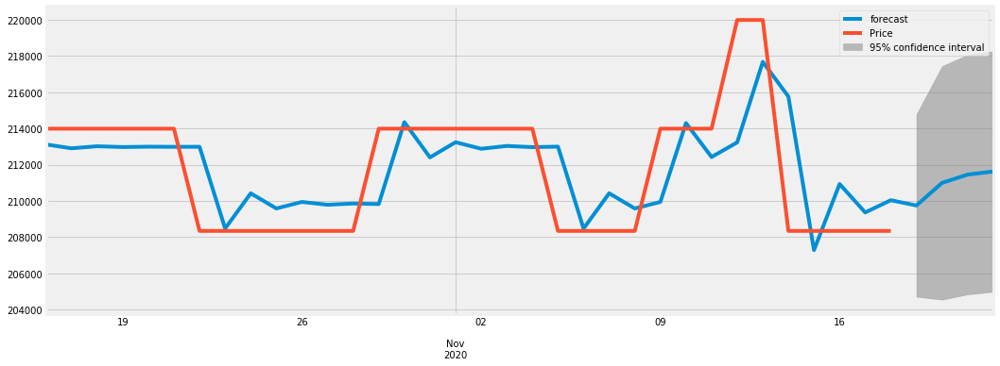

0.8088351889184688
2020-10-16    213119.728139
2020-10-17    212905.855695
2020-10-18    213018.975658
2020-10-19    212975.485739
2020-10-20    212995.028909
2020-10-21    212986.782082
2020-10-22    212990.360088
2020-10-23    208480.427688
2020-10-24    210421.067392
2020-10-25    209586.000917
2020-10-26    209945.333931
2020-10-27    209790.711211
2020-10-28    209857.246104
2020-10-29    209828.615821
2020-10-30    214349.340852
2020-10-31    212404.051281
2020-11-01    213241.118674
2020-11-02    212880.924577
2020-11-03    213035.917817
2020-11-04    212969.223486
2020-11-05    212997.922375
2020-11-06    208477.167823
2020-11-07    210422.470097
2020-11-08    209585.397238
2020-11-09    209945.593687
2020-11-10    214299.004718
2020-11-11    212425.711160
2020-11-12    213231.798324
2020-11-13    217677.711869
2020-11-14    215764.614038
2020-11-15    207286.647187
2020-11-16    210934.756812
2020-11-17    209364.957818
2020-11-18    210040.449822
2020-11-19    209749.782387
2

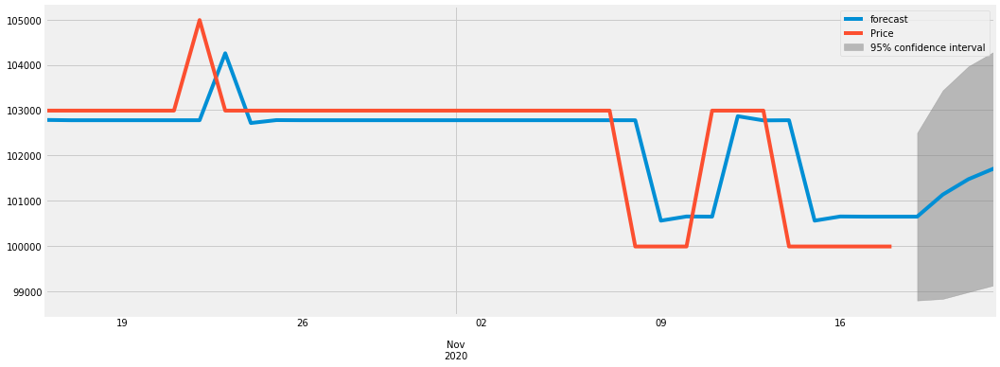

0.9199893313978863
2020-10-16    102783.539224
2020-10-17    102777.387907
2020-10-18    102777.651125
2020-10-19    102777.640201
2020-10-20    102777.640655
2020-10-21    102777.640636
2020-10-22    102777.640637
2020-10-23    104255.799637
2020-10-24    102716.219330
2020-10-25    102780.192850
2020-10-26    102777.534586
2020-10-27    102777.645044
2020-10-28    102777.640454
2020-10-29    102777.640645
2020-10-30    102777.640637
2020-10-31    102777.640637
2020-11-01    102777.640637
2020-11-02    102777.640637
2020-11-03    102777.640637
2020-11-04    102777.640637
2020-11-05    102777.640637
2020-11-06    102777.640637
2020-11-07    102777.640637
2020-11-08    102777.640637
2020-11-09    100560.402137
2020-11-10    100652.534098
2020-11-11    100648.705778
2020-11-12    102866.103355
2020-11-13    102773.964784
2020-11-14    102777.793378
2020-11-15    100560.395790
2020-11-16    100652.534362
2020-11-17    100648.705767
2020-11-18    100648.864855
2020-11-19    100648.858245
2

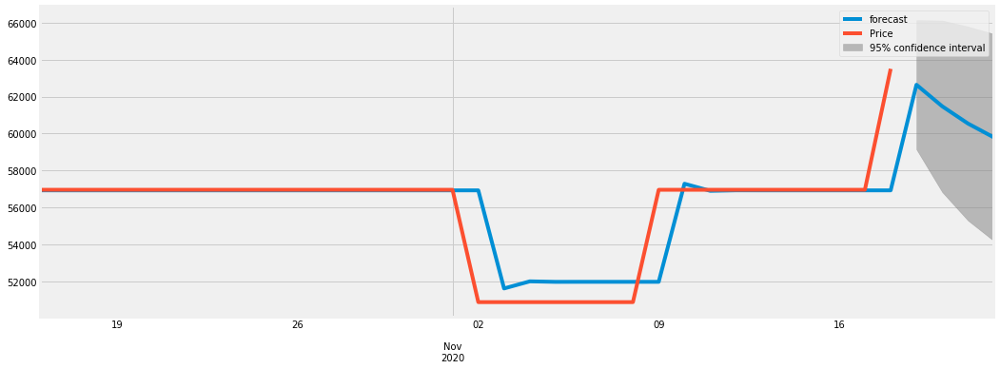

0.9670554050163696
2020-10-16    56932.578821
2020-10-17    56930.829512
2020-10-18    56930.963724
2020-10-19    56930.954047
2020-10-20    56930.954748
2020-10-21    56930.954697
2020-10-22    56930.954701
2020-10-23    56930.954700
2020-10-24    56930.954700
2020-10-25    56930.954700
2020-10-26    56930.954700
2020-10-27    56930.954700
2020-10-28    56930.954700
2020-10-29    56930.954700
2020-10-30    56930.954700
2020-10-31    56930.954700
2020-11-01    56930.954700
2020-11-02    56930.954700
2020-11-03    51628.897571
2020-11-04    52012.866387
2020-11-05    51985.059812
2020-11-06    51987.073531
2020-11-07    51986.927700
2020-11-08    51986.938261
2020-11-09    51986.937496
2020-11-10    57288.994681
2020-11-11    56905.025861
2020-11-12    56932.832437
2020-11-13    56930.818717
2020-11-14    56930.964548
2020-11-15    56930.953987
2020-11-16    56930.954752
2020-11-17    56930.954697
2020-11-18    56930.954701
2020-11-19    62639.922012
2020-11-20    61475.467013
2020-11-2

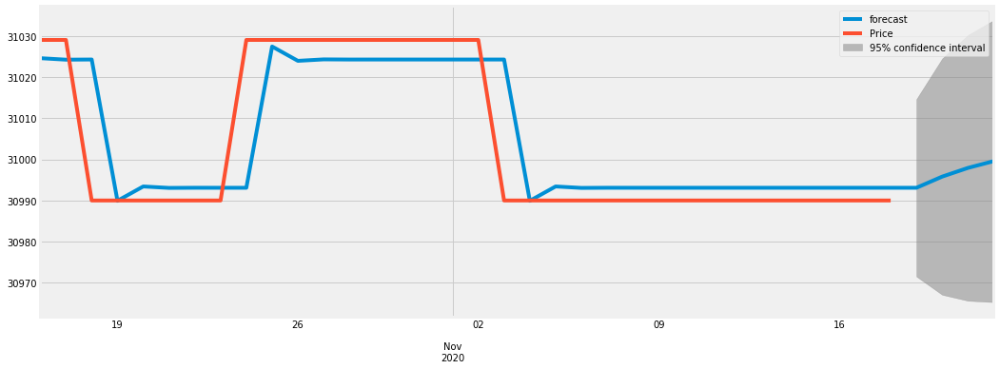

0.9623139575936701
2020-10-16    31024.570523
2020-10-17    31024.207868
2020-10-18    31024.247659
2020-10-19    30989.925008
2020-10-20    30993.406155
2020-10-21    30993.053082
2020-10-22    30993.088892
2020-10-23    30993.085260
2020-10-24    30993.085629
2020-10-25    31027.404243
2020-10-26    31023.923503
2020-10-27    31024.276535
2020-10-28    31024.240729
2020-10-29    31024.244360
2020-10-30    31024.243992
2020-10-31    31024.244029
2020-11-01    31024.244025
2020-11-02    31024.244026
2020-11-03    31024.244026
2020-11-04    30989.925374
2020-11-05    30993.406118
2020-11-06    30993.053086
2020-11-07    30993.088892
2020-11-08    30993.085260
2020-11-09    30993.085629
2020-11-10    30993.085591
2020-11-11    30993.085595
2020-11-12    30993.085595
2020-11-13    30993.085595
2020-11-14    30993.085595
2020-11-15    30993.085595
2020-11-16    30993.085595
2020-11-17    30993.085595
2020-11-18    30993.085595
2020-11-19    30993.085595
2020-11-20    30995.800812
2020-11-2

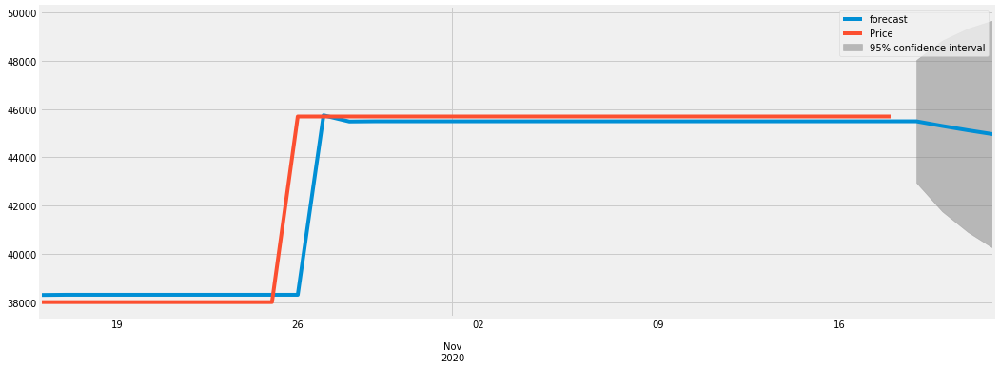

0.9956906719954792
2020-10-16    38293.756482
2020-10-17    38303.222414
2020-10-18    38302.887089
2020-10-19    38302.898586
2020-10-20    38302.898191
2020-10-21    38302.898205
2020-10-22    38302.898204
2020-10-23    38302.898204
2020-10-24    38302.898204
2020-10-25    38302.898204
2020-10-26    38302.898204
2020-10-27    45740.162635
2020-10-28    45484.899438
2020-10-29    45493.660630
2020-10-30    45493.359927
2020-10-31    45493.370247
2020-11-01    45493.369893
2020-11-02    45493.369905
2020-11-03    45493.369905
2020-11-04    45493.369905
2020-11-05    45493.369905
2020-11-06    45493.369905
2020-11-07    45493.369905
2020-11-08    45493.369905
2020-11-09    45493.369905
2020-11-10    45493.369905
2020-11-11    45493.369905
2020-11-12    45493.369905
2020-11-13    45493.369905
2020-11-14    45493.369905
2020-11-15    45493.369905
2020-11-16    45493.369905
2020-11-17    45493.369905
2020-11-18    45493.369905
2020-11-19    45493.369905
2020-11-20    45301.342797
2020-11-2

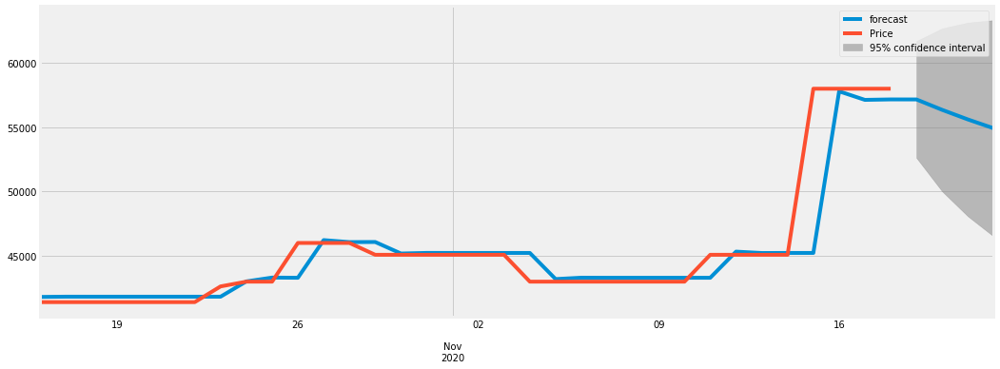

0.9941414874838971
2020-10-16    41801.671694
2020-10-17    41821.409495
2020-10-18    41820.315637
2020-10-19    41820.373283
2020-10-20    41820.370237
2020-10-21    41820.370397
2020-10-22    41820.370389
2020-10-23    41820.370389
2020-10-24    43008.556532
2020-10-25    43306.806627
2020-10-26    43291.048176
2020-10-27    46219.042070
2020-10-28    46064.337515
2020-10-29    46072.511542
2020-10-30    45176.804266
2020-10-31    45224.130183
2020-11-01    45221.629653
2020-11-02    45221.761772
2020-11-03    45221.754791
2020-11-04    45221.755160
2020-11-05    43189.869256
2020-11-06    43297.226722
2020-11-07    43291.554343
2020-11-08    43291.854051
2020-11-09    43291.838216
2020-11-10    43291.839053
2020-11-11    43291.839008
2020-11-12    45323.724896
2020-11-13    45216.367431
2020-11-14    45222.039809
2020-11-15    45221.740101
2020-11-16    57786.751409
2020-11-17    57122.861882
2020-11-18    57157.939391
2020-11-19    57156.086023
2020-11-20    56344.681056
2020-11-2

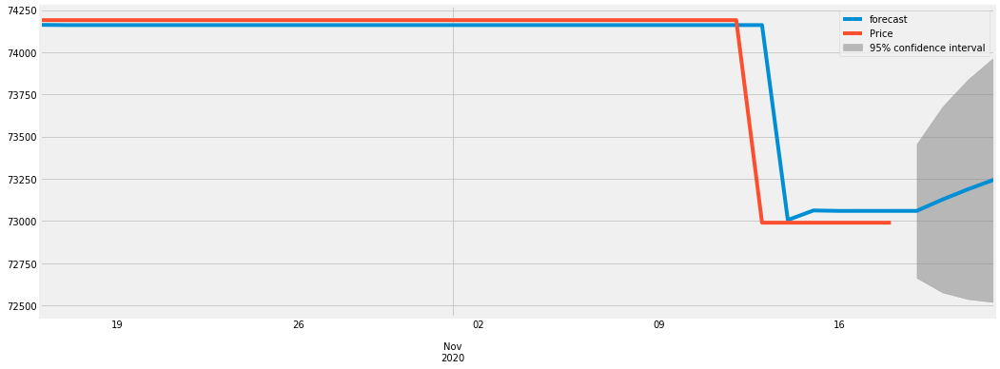

0.9930419711449608
2020-10-16    74161.926118
2020-10-17    74160.664717
2020-10-18    74160.729166
2020-10-19    74160.726022
2020-10-20    74160.726176
2020-10-21    74160.726168
2020-10-22    74160.726169
2020-10-23    74160.726169
2020-10-24    74160.726169
2020-10-25    74160.726169
2020-10-26    74160.726169
2020-10-27    74160.726169
2020-10-28    74160.726169
2020-10-29    74160.726169
2020-10-30    74160.726169
2020-10-31    74160.726169
2020-11-01    74160.726169
2020-11-02    74160.726169
2020-11-03    74160.726169
2020-11-04    74160.726169
2020-11-05    74160.726169
2020-11-06    74160.726169
2020-11-07    74160.726169
2020-11-08    74160.726169
2020-11-09    74160.726169
2020-11-10    74160.726169
2020-11-11    74160.726169
2020-11-12    74160.726169
2020-11-13    74160.726169
2020-11-14    73006.043150
2020-11-15    73062.503589
2020-11-16    73059.742848
2020-11-17    73059.877840
2020-11-18    73059.871239
2020-11-19    73059.871562
2020-11-20    73127.104468
2020-11-2

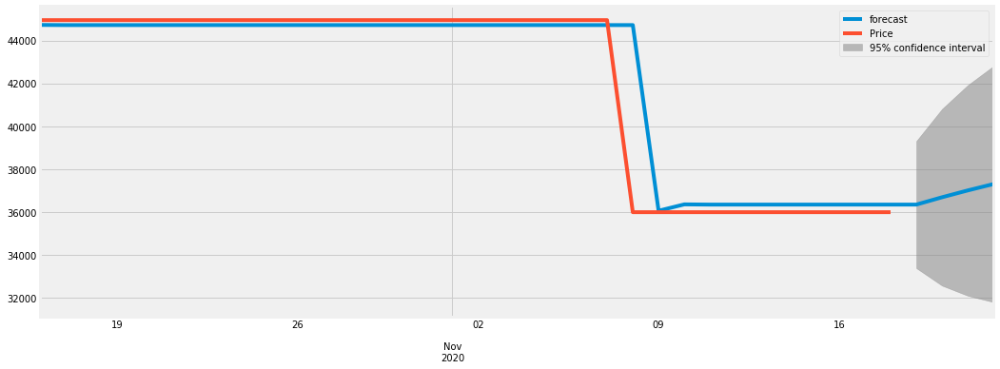

0.9957978459602862
2020-10-16    44724.018207
2020-10-17    44716.821507
2020-10-18    44717.076582
2020-10-19    44717.067832
2020-10-20    44717.068132
2020-10-21    44717.068122
2020-10-22    44717.068122
2020-10-23    44717.068122
2020-10-24    44717.068122
2020-10-25    44717.068122
2020-10-26    44717.068122
2020-10-27    44717.068122
2020-10-28    44717.068122
2020-10-29    44717.068122
2020-10-30    44717.068122
2020-10-31    44717.068122
2020-11-01    44717.068122
2020-11-02    44717.068122
2020-11-03    44717.068122
2020-11-04    44717.068122
2020-11-05    44717.068122
2020-11-06    44717.068122
2020-11-07    44717.068122
2020-11-08    44717.068122
2020-11-09    36056.783542
2020-11-10    36354.177044
2020-11-11    36343.964575
2020-11-12    36344.315270
2020-11-13    36344.303227
2020-11-14    36344.303641
2020-11-15    36344.303626
2020-11-16    36344.303627
2020-11-17    36344.303627
2020-11-18    36344.303627
2020-11-19    36344.303627
2020-11-20    36686.832120
2020-11-2

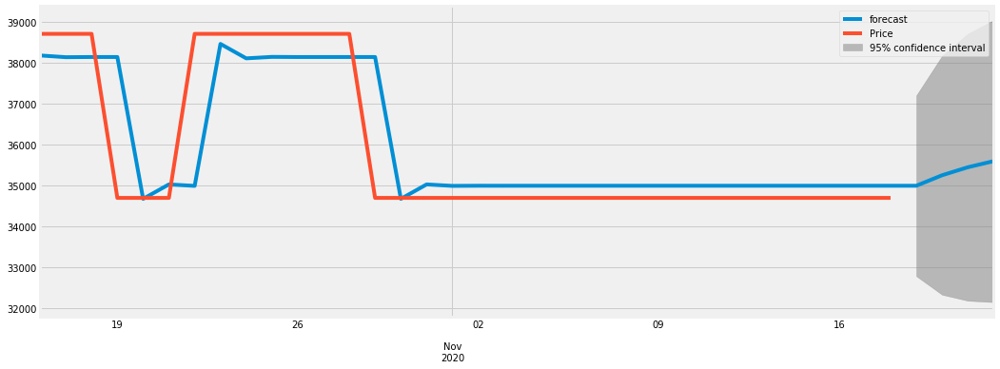

0.9568126163389532
2020-10-16    38174.944508
2020-10-17    38132.301864
2020-10-18    38136.987997
2020-10-19    38136.515383
2020-10-20    34666.838227
2020-10-21    35019.665590
2020-10-22    34983.786993
2020-10-23    38457.160703
2020-10-24    38103.957439
2020-10-25    38139.874262
2020-10-26    38136.221922
2020-10-27    38136.593324
2020-10-28    38136.555557
2020-10-29    38136.559398
2020-10-30    34666.833748
2020-10-31    35019.666045
2020-11-01    34983.786946
2020-11-02    34987.435449
2020-11-03    34987.064437
2020-11-04    34987.102165
2020-11-05    34987.098329
2020-11-06    34987.098719
2020-11-07    34987.098679
2020-11-08    34987.098683
2020-11-09    34987.098683
2020-11-10    34987.098683
2020-11-11    34987.098683
2020-11-12    34987.098683
2020-11-13    34987.098683
2020-11-14    34987.098683
2020-11-15    34987.098683
2020-11-16    34987.098683
2020-11-17    34987.098683
2020-11-18    34987.098683
2020-11-19    34987.098683
2020-11-20    35243.976531
2020-11-2

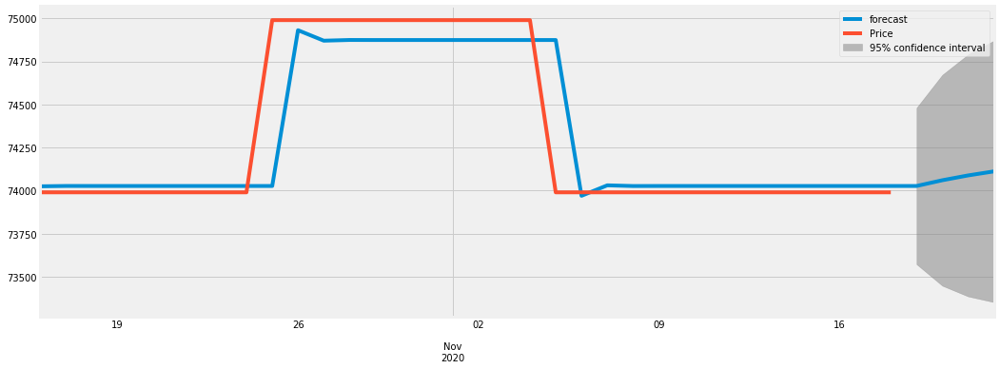

0.977518393993977
2020-10-16    74025.029035
2020-10-17    74027.034153
2020-10-18    74026.891815
2020-10-19    74026.901335
2020-10-20    74026.900696
2020-10-21    74026.900739
2020-10-22    74026.900736
2020-10-23    74026.900736
2020-10-24    74026.900736
2020-10-25    74026.900736
2020-10-26    74931.400745
2020-10-27    74870.667853
2020-10-28    74874.745779
2020-10-29    74874.471966
2020-10-30    74874.490351
2020-10-31    74874.489116
2020-11-01    74874.489199
2020-11-02    74874.489194
2020-11-03    74874.489194
2020-11-04    74874.489194
2020-11-05    74874.489194
2020-11-06    73969.989185
2020-11-07    74030.722077
2020-11-08    74026.644151
2020-11-09    74026.917964
2020-11-10    74026.899579
2020-11-11    74026.900814
2020-11-12    74026.900731
2020-11-13    74026.900736
2020-11-14    74026.900736
2020-11-15    74026.900736
2020-11-16    74026.900736
2020-11-17    74026.900736
2020-11-18    74026.900736
2020-11-19    74026.900736
2020-11-20    74060.277452
2020-11-21

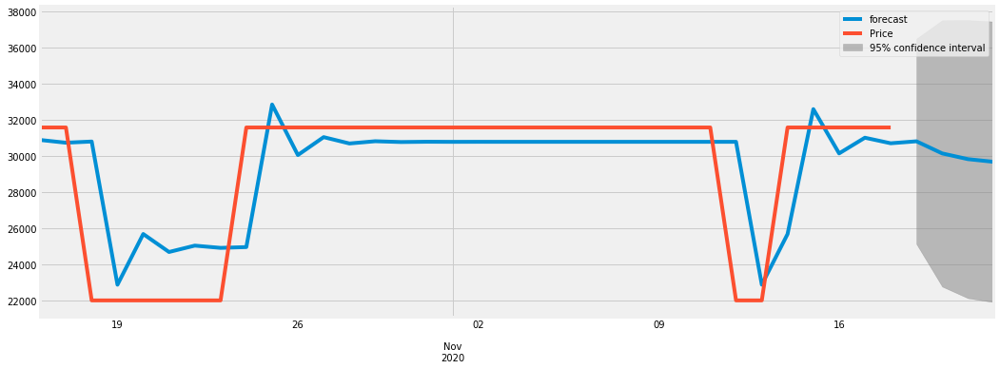

0.8531475629439279
2020-10-16    30869.033202
2020-10-17    30716.267823
2020-10-18    30781.925942
2020-10-19    22857.822553
2020-10-20    25663.695604
2020-10-21    24669.192328
2020-10-22    25021.658620
2020-10-23    24896.732341
2020-10-24    24941.009846
2020-10-25    32830.923754
2020-10-26    30034.496004
2020-10-27    31025.635866
2020-10-28    30674.345465
2020-10-29    30798.853570
2020-10-30    30754.724074
2020-10-31    30770.364922
2020-11-01    30764.821326
2020-11-02    30766.786147
2020-11-03    30766.089754
2020-11-04    30766.336577
2020-11-05    30766.249095
2020-11-06    30766.280101
2020-11-07    30766.269112
2020-11-08    30766.273007
2020-11-09    30766.271626
2020-11-10    30766.272115
2020-11-11    30766.271942
2020-11-12    30766.272003
2020-11-13    22860.664730
2020-11-14    25662.654699
2020-11-15    32575.150667
2020-11-16    30125.149840
2020-11-17    30993.505363
2020-11-18    30685.733502
2020-11-19    30794.817300
2020-11-20    30124.050796
2020-11-2

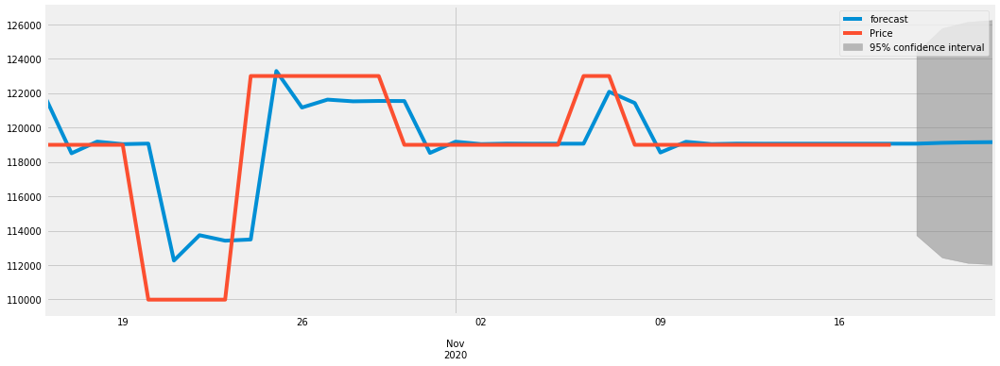

0.8701841335097579
2020-10-16    121681.448150
2020-10-17    118498.443316
2020-10-18    119176.347206
2020-10-19    119029.509430
2020-10-20    119061.336075
2020-10-21    112264.142742
2020-10-22    113737.497241
2020-10-23    113418.133987
2020-10-24    113487.358934
2020-10-25    123280.557371
2020-10-26    121157.790787
2020-10-27    121617.920131
2020-10-28    121518.182828
2020-10-29    121539.801814
2020-10-30    121535.115698
2020-10-31    118518.222661
2020-11-01    119172.162206
2020-11-02    119030.414745
2020-11-03    119061.139822
2020-11-04    119054.479876
2020-11-05    119055.923481
2020-11-06    119055.610567
2020-11-07    122073.587189
2020-11-08    121419.412767
2020-11-09    118543.302345
2020-11-10    119166.725952
2020-11-11    119031.593103
2020-11-12    119060.884402
2020-11-13    119054.535241
2020-11-14    119055.911480
2020-11-15    119055.613168
2020-11-16    119055.677830
2020-11-17    119055.663814
2020-11-18    119055.666852
2020-11-19    119055.666193
2

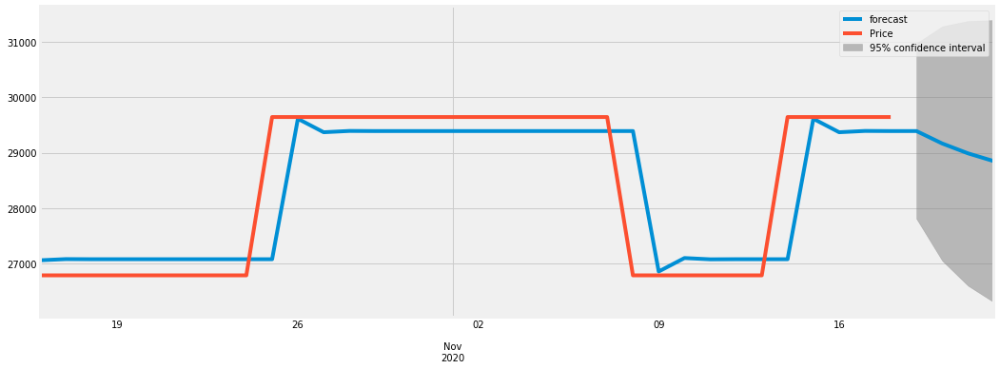

0.9663064407650983
2020-10-16    27061.428176
2020-10-17    27082.686026
2020-10-18    27080.488941
2020-10-19    27080.697957
2020-10-20    27080.677908
2020-10-21    27080.679829
2020-10-22    27080.679645
2020-10-23    27080.679663
2020-10-24    27080.679661
2020-10-25    27080.679661
2020-10-26    29611.698778
2020-10-27    29369.093312
2020-10-28    29392.347744
2020-10-29    29390.118740
2020-10-30    29390.332396
2020-10-31    29390.311917
2020-11-01    29390.313880
2020-11-02    29390.313692
2020-11-03    29390.313710
2020-11-04    29390.313708
2020-11-05    29390.313708
2020-11-06    29390.313708
2020-11-07    29390.313708
2020-11-08    29390.313708
2020-11-09    26859.294591
2020-11-10    27101.900057
2020-11-11    27078.645625
2020-11-12    27080.874630
2020-11-13    27080.660973
2020-11-14    27080.681453
2020-11-15    29611.698606
2020-11-16    29369.093328
2020-11-17    29392.347742
2020-11-18    29390.118740
2020-11-19    29390.332396
2020-11-20    29166.159608
2020-11-2

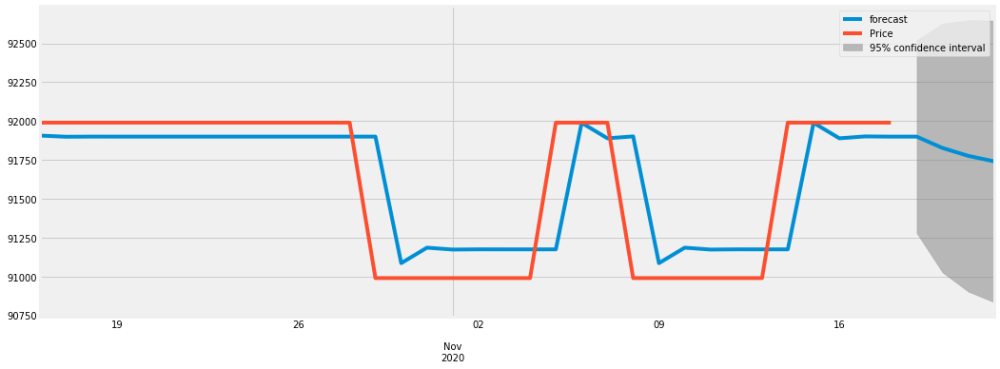

0.9307896819341358
2020-10-16    91906.733692
2020-10-17    91899.214378
2020-10-18    91900.215483
2020-10-19    91900.094571
2020-10-20    91900.109357
2020-10-21    91900.107552
2020-10-22    91900.107772
2020-10-23    91900.107745
2020-10-24    91900.107749
2020-10-25    91900.107748
2020-10-26    91900.107748
2020-10-27    91900.107748
2020-10-28    91900.107748
2020-10-29    91900.107748
2020-10-30    91086.156270
2020-10-31    91185.560791
2020-11-01    91173.420929
2020-11-02    91174.903520
2020-11-03    91174.722457
2020-11-04    91174.744569
2020-11-05    91174.741869
2020-11-06    91988.693677
2020-11-07    91889.289116
2020-11-08    91901.428983
2020-11-09    91085.994913
2020-11-10    91185.580497
2020-11-11    91173.418522
2020-11-12    91174.903814
2020-11-13    91174.722421
2020-11-14    91174.744574
2020-11-15    91988.693347
2020-11-16    91889.289156
2020-11-17    91901.428978
2020-11-18    91899.946392
2020-11-19    91900.127454
2020-11-20    91826.953450
2020-11-2

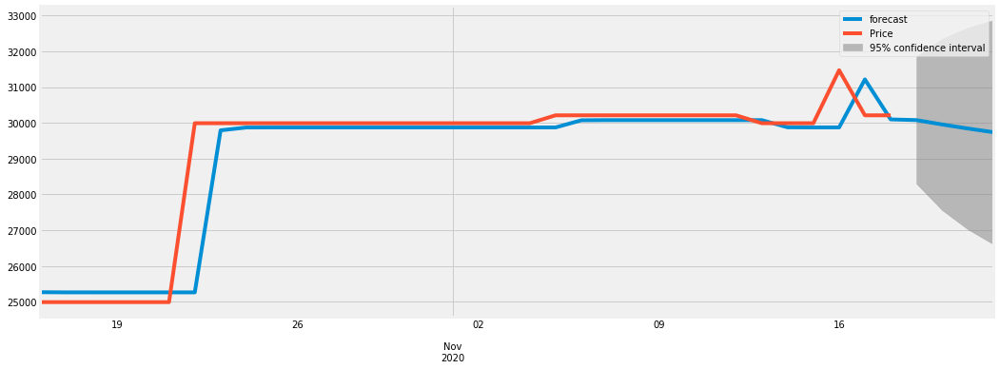

0.9931387208635344
2020-10-16    25267.102396
2020-10-17    25262.587772
2020-10-18    25262.509161
2020-10-19    25262.507769
2020-10-20    25262.507745
2020-10-21    25262.507744
2020-10-22    25262.507744
2020-10-23    29790.775614
2020-10-24    29870.930592
2020-10-25    29872.349417
2020-10-26    29872.374532
2020-10-27    29872.374976
2020-10-28    29872.374984
2020-10-29    29872.374984
2020-10-30    29872.374984
2020-10-31    29872.374984
2020-11-01    29872.374984
2020-11-02    29872.374984
2020-11-03    29872.374984
2020-11-04    29872.374984
2020-11-05    29872.374984
2020-11-06    30072.524424
2020-11-07    30076.067274
2020-11-08    30076.129986
2020-11-09    30076.131096
2020-11-10    30076.131116
2020-11-11    30076.131116
2020-11-12    30076.131116
2020-11-13    30076.131116
2020-11-14    29875.981677
2020-11-15    29872.438827
2020-11-16    29872.376115
2020-11-17    31213.647947
2020-11-18    30096.266329
2020-11-19    30076.487530
2020-11-20    29954.315726
2020-11-2

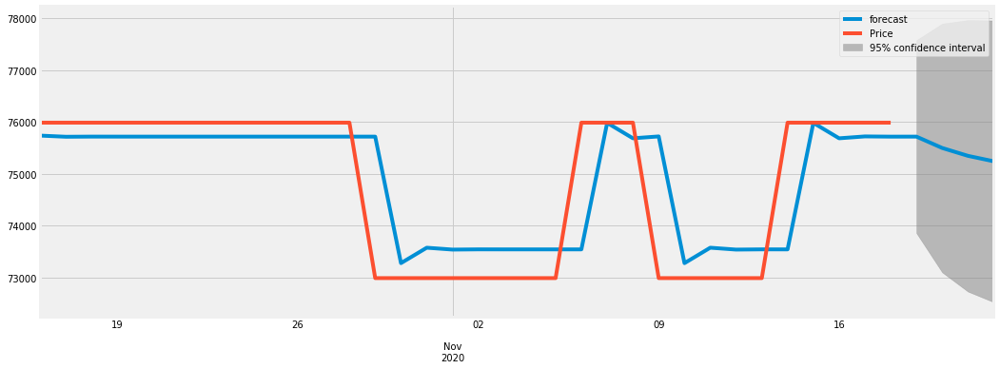

0.9308084884877214
2020-10-16    75740.269604
2020-10-17    75717.768787
2020-10-18    75720.757032
2020-10-19    75720.396929
2020-10-20    75720.440864
2020-10-21    75720.435512
2020-10-22    75720.436164
2020-10-23    75720.436085
2020-10-24    75720.436094
2020-10-25    75720.436093
2020-10-26    75720.436093
2020-10-27    75720.436093
2020-10-28    75720.436093
2020-10-29    75720.436093
2020-10-30    73279.033458
2020-10-31    73576.503941
2020-11-01    73540.258921
2020-11-02    73544.675162
2020-11-03    73544.137069
2020-11-04    73544.202633
2020-11-05    73544.194644
2020-11-06    73544.195617
2020-11-07    75985.598134
2020-11-08    75688.127666
2020-11-09    75724.372684
2020-11-10    73278.553808
2020-11-11    73576.562383
2020-11-12    73540.251800
2020-11-13    73544.676030
2020-11-14    73544.136963
2020-11-15    75985.605281
2020-11-16    75688.126795
2020-11-17    75724.372790
2020-11-18    75719.956430
2020-11-19    75720.494537
2020-11-20    75501.105190
2020-11-2

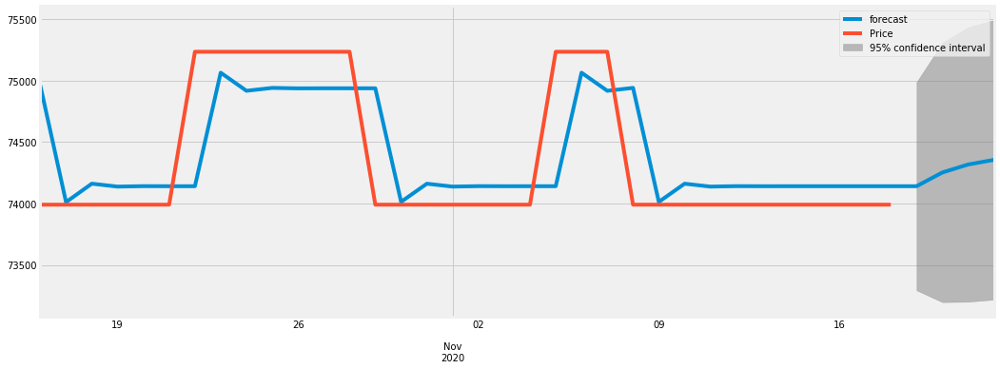

0.8840778620813138
2020-10-16    74961.161388
2020-10-17    74010.983071
2020-10-18    74160.828570
2020-10-19    74136.917038
2020-10-20    74140.732389
2020-10-21    74140.123571
2020-10-22    74140.220720
2020-10-23    75063.827794
2020-10-24    74916.448355
2020-10-25    74939.965606
2020-10-26    74936.212972
2020-10-27    74936.811777
2020-10-28    74936.716226
2020-10-29    74936.731473
2020-10-30    74013.106464
2020-10-31    74160.488765
2020-11-01    74136.971058
2020-11-02    74140.723765
2020-11-03    74140.124947
2020-11-04    74140.220500
2020-11-05    74140.205253
2020-11-06    75063.830262
2020-11-07    74916.447961
2020-11-08    74939.965669
2020-11-09    74012.590385
2020-11-10    74160.571116
2020-11-11    74136.957917
2020-11-12    74140.725861
2020-11-13    74140.124613
2020-11-14    74140.220554
2020-11-15    74140.205244
2020-11-16    74140.207687
2020-11-17    74140.207298
2020-11-18    74140.207360
2020-11-19    74140.207350
2020-11-20    74251.730582
2020-11-2

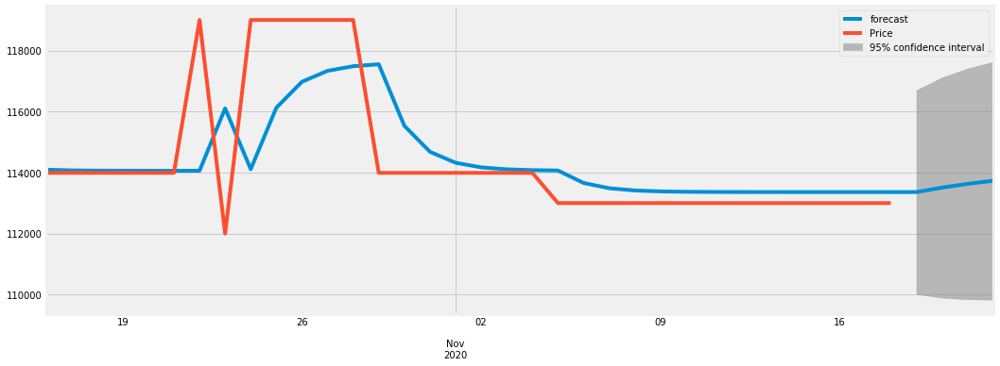

0.7676217712119388
2020-10-16    114094.312847
2020-10-17    114071.307041
2020-10-18    114063.816768
2020-10-19    114060.951957
2020-10-20    114059.790158
2020-10-21    114059.307873
2020-10-22    114059.105732
2020-10-23    116102.719773
2020-10-24    114109.767708
2020-10-25    116124.098120
2020-10-26    116974.253465
2020-10-27    117333.064599
2020-10-28    117484.502138
2020-10-29    117548.416900
2020-10-30    115531.697148
2020-10-31    114680.533266
2020-11-01    114321.296464
2020-11-02    114169.679269
2020-11-03    114105.688683
2020-11-04    114078.681224
2020-11-05    114067.282628
2020-11-06    113658.627846
2020-11-07    113486.153613
2020-11-08    113413.360238
2020-11-09    113382.637531
2020-11-10    113369.670900
2020-11-11    113364.198287
2020-11-12    113361.888551
2020-11-13    113360.913718
2020-11-14    113360.502287
2020-11-15    113360.328640
2020-11-16    113360.255352
2020-11-17    113360.224421
2020-11-18    113360.211366
2020-11-19    113360.205856
2

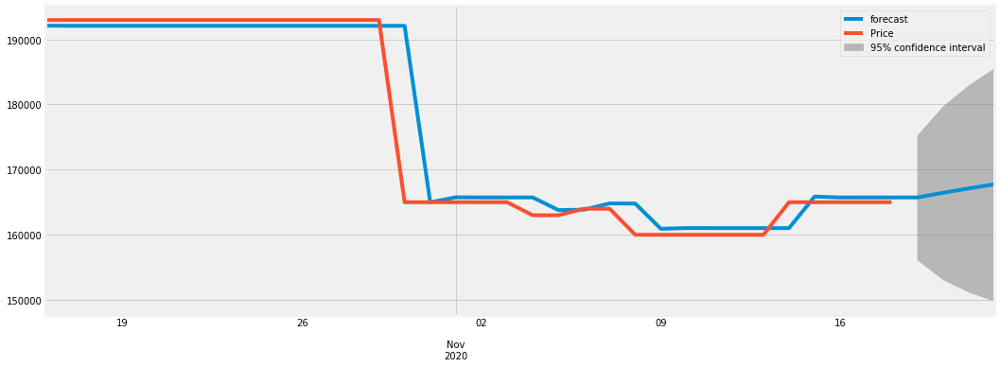

0.9966607587755634
2020-10-16    192109.650353
2020-10-17    192086.330907
2020-10-18    192087.013835
2020-10-19    192086.994374
2020-10-20    192086.994929
2020-10-21    192086.994913
2020-10-22    192086.994913
2020-10-23    192086.994913
2020-10-24    192086.994913
2020-10-25    192086.994913
2020-10-26    192086.994913
2020-10-27    192086.994913
2020-10-28    192086.994913
2020-10-29    192086.994913
2020-10-30    192086.994913
2020-10-31    164973.153267
2020-11-01    165746.414236
2020-11-02    165724.361569
2020-11-03    165724.990490
2020-11-04    165724.972554
2020-11-05    163787.370489
2020-11-06    163842.629057
2020-11-07    164809.854423
2020-11-08    164782.270076
2020-11-09    160907.851603
2020-11-10    161018.346332
2020-11-11    161015.195127
2020-11-12    161015.284997
2020-11-13    161015.282434
2020-11-14    161015.282507
2020-11-15    165859.288945
2020-11-16    165721.142489
2020-11-17    165725.082295
2020-11-18    165724.969935
2020-11-19    165724.973140
2

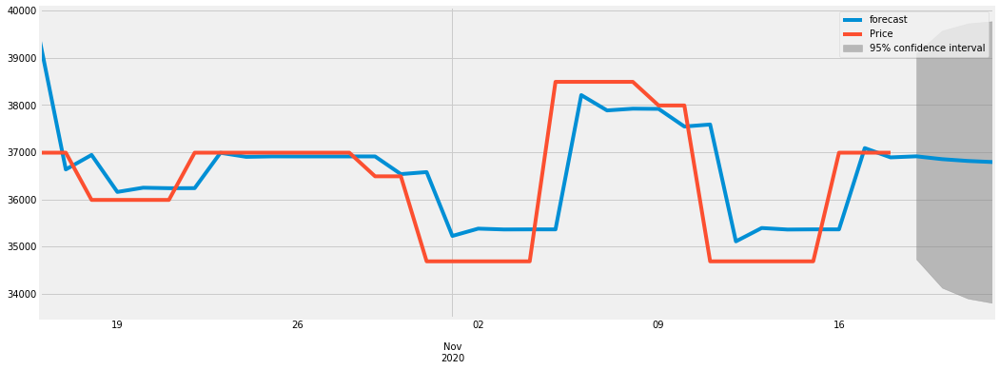

0.8987213856027957
2020-10-16    39341.540024
2020-10-17    36634.914813
2020-10-18    36942.374358
2020-10-19    36159.032778
2020-10-20    36248.504697
2020-10-21    36238.285356
2020-10-22    36239.452593
2020-10-23    36987.546743
2020-10-24    36902.100613
2020-10-25    36911.860135
2020-10-26    36910.745418
2020-10-27    36910.872739
2020-10-28    36910.858197
2020-10-29    36910.859858
2020-10-30    36536.745933
2020-10-31    36579.476633
2020-11-01    35227.786554
2020-11-02    35382.174454
2020-11-03    35364.540513
2020-11-04    35366.554634
2020-11-05    35366.324584
2020-11-06    38209.615246
2020-11-07    37884.859089
2020-11-08    37921.952223
2020-11-09    37917.715504
2020-11-10    37544.085680
2020-11-11    37586.761087
2020-11-12    35112.736119
2020-11-13    35395.315333
2020-11-14    35363.039583
2020-11-15    35366.726068
2020-11-16    35366.305003
2020-11-17    37087.276277
2020-11-18    36890.709664
2020-11-19    36913.161191
2020-11-20    36853.103906
2020-11-2

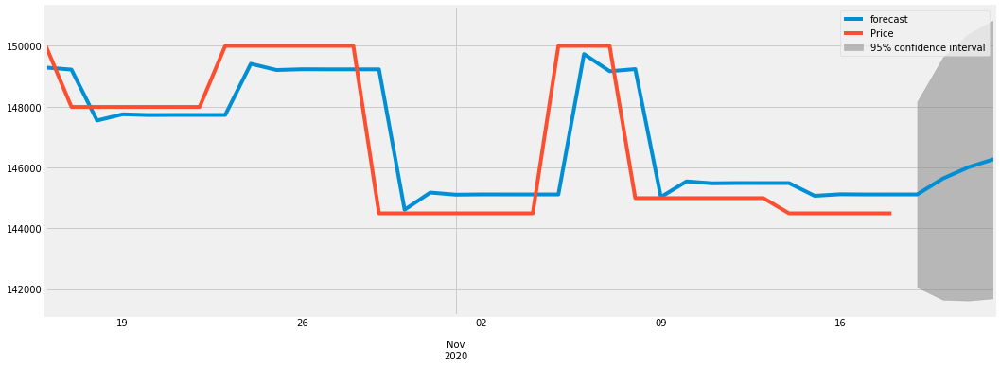

0.9416881571081526
2020-10-16    149286.059578
2020-10-17    149219.851749
2020-10-18    147544.108030
2020-10-19    147748.959705
2020-10-20    147723.915253
2020-10-21    147726.977114
2020-10-22    147726.602780
2020-10-23    147726.648545
2020-10-24    149411.263707
2020-10-25    149205.307659
2020-10-26    149230.487234
2020-10-27    149227.408854
2020-10-28    149227.785207
2020-10-29    149227.739195
2020-10-30    144608.244697
2020-10-31    145173.010378
2020-11-01    145103.963803
2020-11-02    145112.405232
2020-11-03    145111.373208
2020-11-04    145111.499380
2020-11-05    145111.483955
2020-11-06    149730.985964
2020-11-07    149166.219365
2020-11-08    149235.266053
2020-11-09    145026.592967
2020-11-10    145541.132842
2020-11-11    145478.226725
2020-11-12    145485.917440
2020-11-13    145484.977196
2020-11-14    145485.092147
2020-11-15    145065.809612
2020-11-16    145117.069850
2020-11-17    145110.802926
2020-11-18    145111.569101
2020-11-19    145111.475431
2

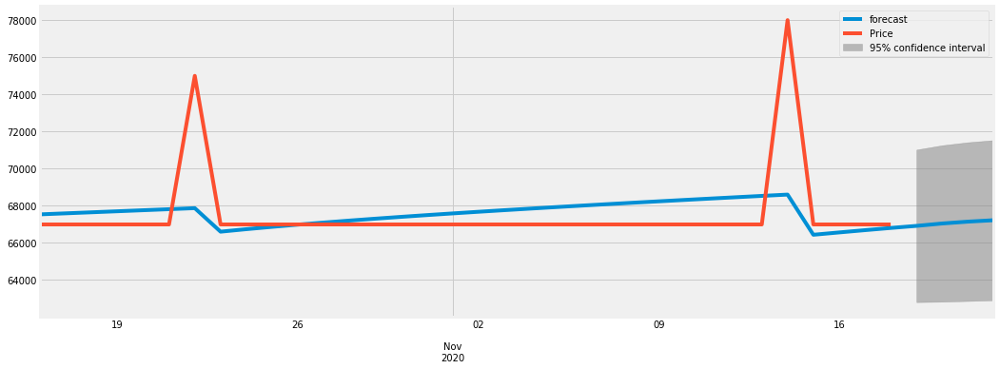

-0.3017106767276512
2020-10-16    67532.859569
2020-10-17    67588.579300
2020-10-18    67644.299030
2020-10-19    67700.018761
2020-10-20    67755.738492
2020-10-21    67811.458223
2020-10-22    67867.177953
2020-10-23    66600.968131
2020-10-24    66735.643528
2020-10-25    66861.418843
2020-10-26    66979.718644
2020-10-27    67091.678873
2020-10-28    67198.216419
2020-10-29    67300.079490
2020-10-30    67397.884697
2020-10-31    67492.144772
2020-11-01    67583.289554
2020-11-02    67671.682094
2020-11-03    67757.631139
2020-11-04    67841.400919
2020-11-05    67923.218895
2020-11-06    68003.281935
2020-11-07    68081.761293
2020-11-08    68158.806644
2020-11-09    68234.549375
2020-11-10    68309.105301
2020-11-11    68382.576901
2020-11-12    68455.055187
2020-11-13    68526.621260
2020-11-14    68597.347629
2020-11-15    66434.833379
2020-11-16    66560.241868
2020-11-17    66682.229436
2020-11-18    66801.041940
2020-11-19    66912.481402
2020-11-20    67041.654233
2020-11-

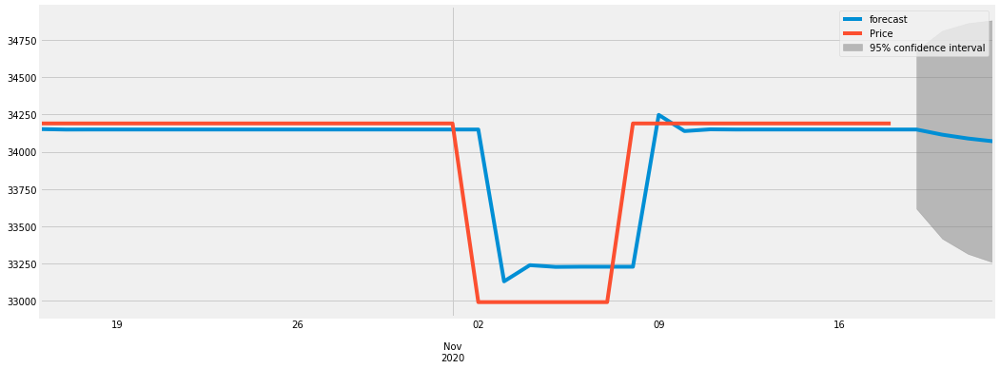

0.95013125454412
2020-10-16    34152.056338
2020-10-17    34148.903780
2020-10-18    34149.268132
2020-10-19    34149.229595
2020-10-20    34149.233711
2020-10-21    34149.233272
2020-10-22    34149.233319
2020-10-23    34149.233314
2020-10-24    34149.233315
2020-10-25    34149.233315
2020-10-26    34149.233315
2020-10-27    34149.233315
2020-10-28    34149.233315
2020-10-29    34149.233315
2020-10-30    34149.233315
2020-10-31    34149.233315
2020-11-01    34149.233315
2020-11-02    34149.233315
2020-11-03    33129.324960
2020-11-04    33238.165703
2020-11-05    33226.550632
2020-11-06    33227.790149
2020-11-07    33227.657872
2020-11-08    33227.671988
2020-11-09    34247.578836
2020-11-10    34138.738254
2020-11-11    34150.353307
2020-11-12    34149.113793
2020-11-13    34149.246069
2020-11-14    34149.231953
2020-11-15    34149.233460
2020-11-16    34149.233299
2020-11-17    34149.233316
2020-11-18    34149.233314
2020-11-19    34149.233315
2020-11-20    34114.584745
2020-11-21 

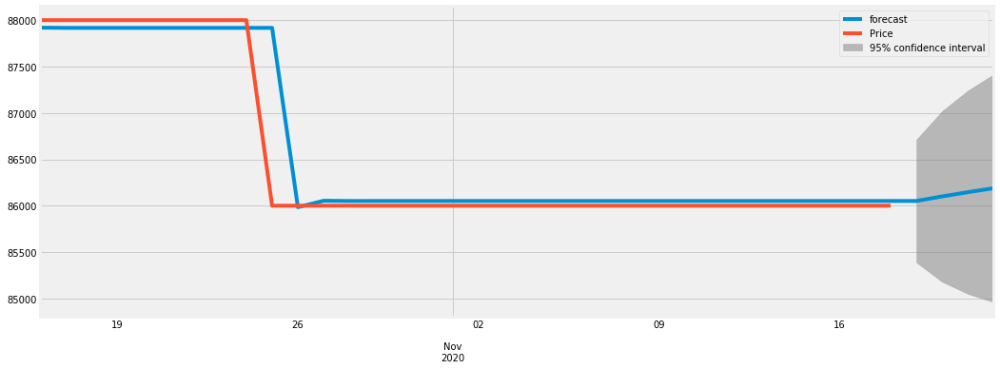

0.9953793183378513
2020-10-16    87919.075216
2020-10-17    87916.361573
2020-10-18    87916.462283
2020-10-19    87916.458671
2020-10-20    87916.458801
2020-10-21    87916.458797
2020-10-22    87916.458797
2020-10-23    87916.458797
2020-10-24    87916.458797
2020-10-25    87916.458797
2020-10-26    85983.894127
2020-10-27    86053.289897
2020-10-28    86050.797989
2020-10-29    86050.887470
2020-10-30    86050.884257
2020-10-31    86050.884373
2020-11-01    86050.884369
2020-11-02    86050.884369
2020-11-03    86050.884369
2020-11-04    86050.884369
2020-11-05    86050.884369
2020-11-06    86050.884369
2020-11-07    86050.884369
2020-11-08    86050.884369
2020-11-09    86050.884369
2020-11-10    86050.884369
2020-11-11    86050.884369
2020-11-12    86050.884369
2020-11-13    86050.884369
2020-11-14    86050.884369
2020-11-15    86050.884369
2020-11-16    86050.884369
2020-11-17    86050.884369
2020-11-18    86050.884369
2020-11-19    86050.884369
2020-11-20    86100.053035
2020-11-2

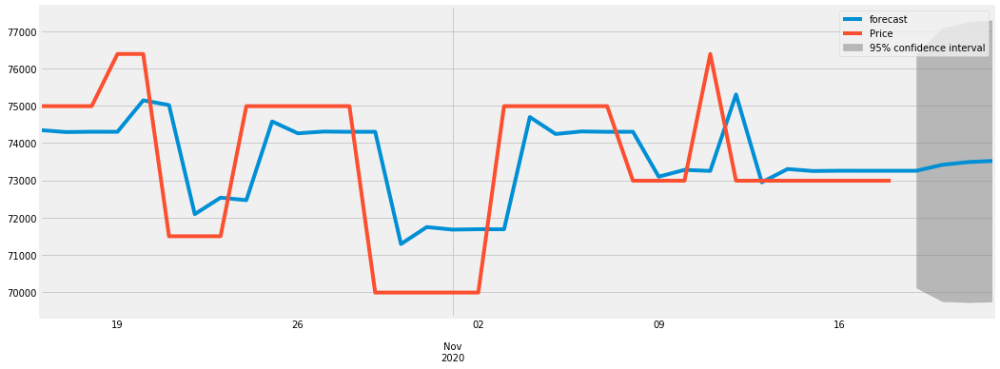

0.7961114778949384
2020-10-16    74348.489952
2020-10-17    74295.100014
2020-10-18    74303.834642
2020-10-19    74302.531818
2020-10-20    75145.729854
2020-10-21    75018.360214
2020-10-22    72093.118444
2020-10-23    72534.992184
2020-10-24    72468.244743
2020-10-25    74579.808076
2020-10-26    74260.844907
2020-10-27    74309.026035
2020-10-28    74301.748013
2020-10-29    74302.847398
2020-10-30    71291.963897
2020-10-31    71746.774287
2020-11-01    71678.072695
2020-11-02    71688.450445
2020-11-03    71686.882829
2020-11-04    74697.837059
2020-11-05    74243.015985
2020-11-06    74311.719191
2020-11-07    74301.341197
2020-11-08    74302.908849
2020-11-09    73098.385074
2020-11-10    73280.334966
2020-11-11    73252.850441
2020-11-12    75304.289983
2020-11-13    72947.120987
2020-11-14    73303.184232
2020-11-15    73249.398935
2020-11-16    73257.523498
2020-11-17    73256.296238
2020-11-18    73256.481623
2020-11-19    73256.453619
2020-11-20    73416.901161
2020-11-2

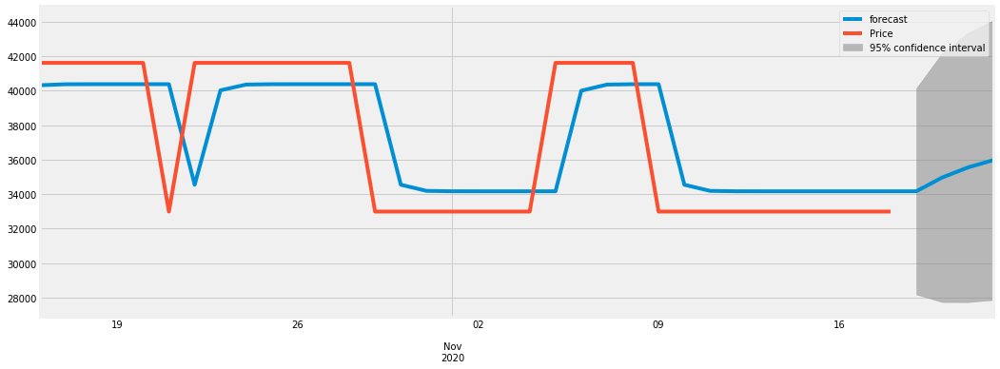

0.9130556249553451
2020-10-16    40322.019957
2020-10-17    40377.936995
2020-10-18    40381.204945
2020-10-19    40381.404008
2020-10-20    40381.416164
2020-10-21    40381.416906
2020-10-22    34546.421630
2020-10-23    40025.048506
2020-10-24    40359.651989
2020-10-25    40380.087674
2020-10-26    40381.335769
2020-10-27    40381.411996
2020-10-28    40381.416652
2020-10-29    40381.416936
2020-10-30    34546.421631
2020-10-31    34190.053185
2020-11-01    34168.288219
2020-11-02    34166.958939
2020-11-03    34166.877754
2020-11-04    34166.872795
2020-11-05    34166.872493
2020-11-06    40001.867796
2020-11-07    40358.236243
2020-11-08    40380.001208
2020-11-09    40381.330489
2020-11-10    34546.416352
2020-11-11    34190.052862
2020-11-12    34168.288200
2020-11-13    34166.958937
2020-11-14    34166.877754
2020-11-15    34166.872795
2020-11-16    34166.872493
2020-11-17    34166.872474
2020-11-18    34166.872473
2020-11-19    34166.872473
2020-11-20    34962.590361
2020-11-2

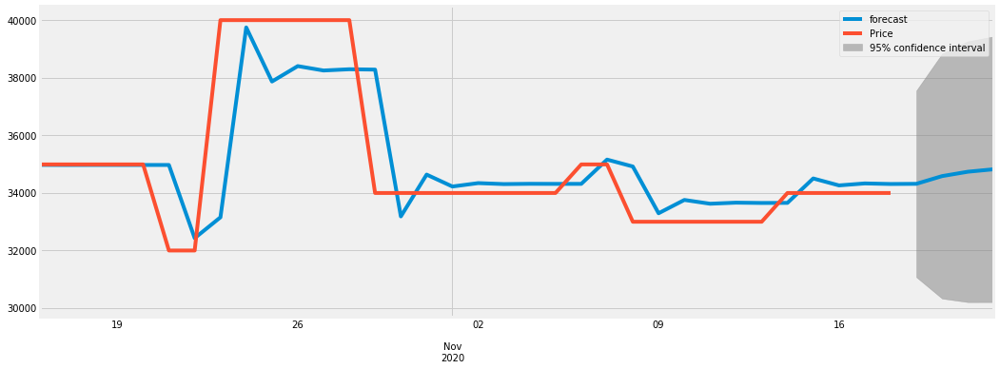

0.8915495898134147
2020-10-16    34966.086104
2020-10-17    34962.833704
2020-10-18    34963.934683
2020-10-19    34963.638278
2020-10-20    34963.724017
2020-10-21    34963.699703
2020-10-22    32419.834113
2020-10-23    33144.432617
2020-10-24    39745.212263
2020-10-25    37865.035950
2020-10-26    38400.588288
2020-10-27    38248.040729
2020-10-28    38291.492612
2020-10-29    38279.115711
2020-10-30    33175.347241
2020-10-31    34629.112571
2020-11-01    34215.019799
2020-11-02    34332.970626
2020-11-03    34299.373330
2020-11-04    34308.943236
2020-11-05    34306.217329
2020-11-06    34306.993780
2020-11-07    35150.763773
2020-11-08    34910.423019
2020-11-09    33284.950151
2020-11-10    33747.952365
2020-11-11    33616.070096
2020-11-12    33653.635646
2020-11-13    33642.935416
2020-11-14    33645.983286
2020-11-15    34495.055869
2020-11-16    34253.204717
2020-11-17    34322.093975
2020-11-18    34302.471452
2020-11-19    34308.060762
2020-11-20    34576.801494
2020-11-2

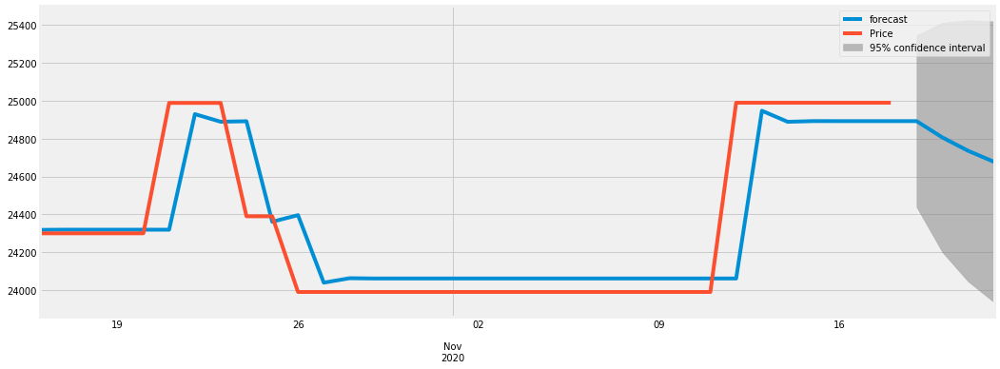

0.9732670945854835
2020-10-16    24318.099708
2020-10-17    24319.098301
2020-10-18    24319.028868
2020-10-19    24319.033427
2020-10-20    24319.033127
2020-10-21    24319.033146
2020-10-22    24929.739856
2020-10-23    24889.497115
2020-10-24    24892.148925
2020-10-25    24361.040482
2020-10-26    24396.038067
2020-10-27    24039.185176
2020-10-28    24062.700128
2020-10-29    24061.150601
2020-10-30    24061.252708
2020-10-31    24061.245980
2020-11-01    24061.246423
2020-11-02    24061.246394
2020-11-03    24061.246396
2020-11-04    24061.246395
2020-11-05    24061.246395
2020-11-06    24061.246395
2020-11-07    24061.246395
2020-11-08    24061.246395
2020-11-09    24061.246395
2020-11-10    24061.246395
2020-11-11    24061.246395
2020-11-12    24061.246395
2020-11-13    24947.613175
2020-11-14    24889.205713
2020-11-15    24893.054494
2020-11-16    24892.800877
2020-11-17    24892.817589
2020-11-18    24892.816488
2020-11-19    24892.816560
2020-11-20    24806.676383
2020-11-2

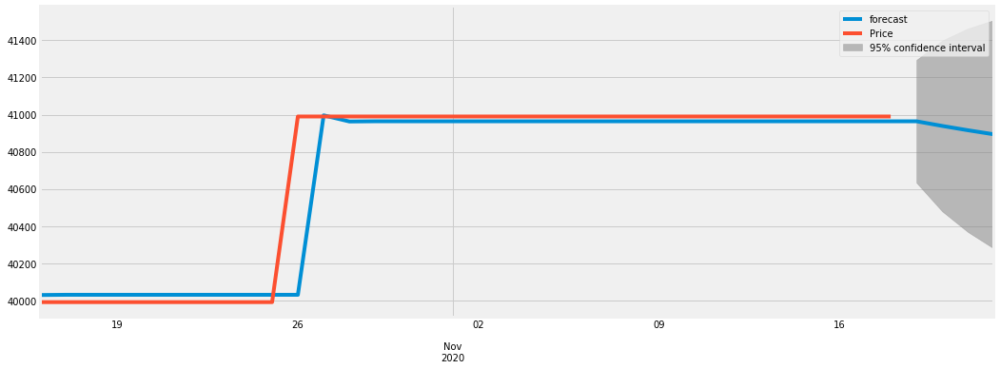

0.9956907904408873
2020-10-16    40028.254607
2020-10-17    40029.482159
2020-10-18    40029.438710
2020-10-19    40029.440198
2020-10-20    40029.440147
2020-10-21    40029.440149
2020-10-22    40029.440149
2020-10-23    40029.440149
2020-10-24    40029.440149
2020-10-25    40029.440149
2020-10-26    40029.440149
2020-10-27    40996.189423
2020-10-28    40963.035350
2020-10-29    40964.172348
2020-10-30    40964.133356
2020-10-31    40964.134693
2020-11-01    40964.134647
2020-11-02    40964.134649
2020-11-03    40964.134649
2020-11-04    40964.134649
2020-11-05    40964.134649
2020-11-06    40964.134649
2020-11-07    40964.134649
2020-11-08    40964.134649
2020-11-09    40964.134649
2020-11-10    40964.134649
2020-11-11    40964.134649
2020-11-12    40964.134649
2020-11-13    40964.134649
2020-11-14    40964.134649
2020-11-15    40964.134649
2020-11-16    40964.134649
2020-11-17    40964.134649
2020-11-18    40964.134649
2020-11-19    40964.134649
2020-11-20    40939.129339
2020-11-2

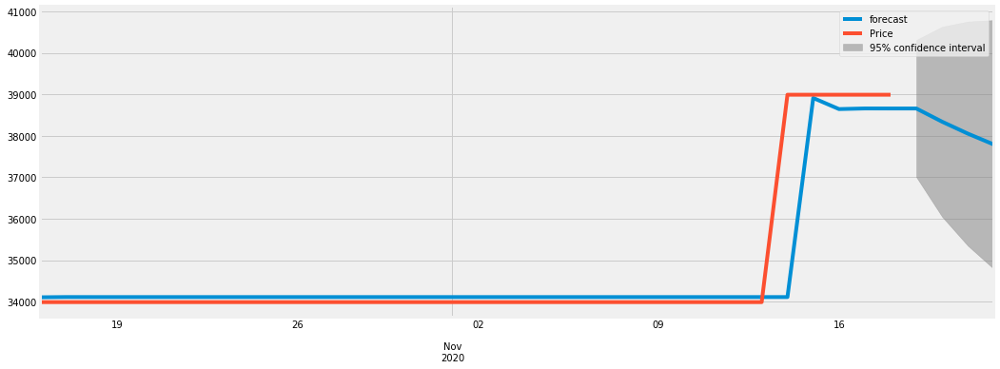

0.9915884093560591
2020-10-16    34106.509240
2020-10-17    34112.422358
2020-10-18    34112.076232
2020-10-19    34112.095459
2020-10-20    34112.094388
2020-10-21    34112.094448
2020-10-22    34112.094444
2020-10-23    34112.094445
2020-10-24    34112.094445
2020-10-25    34112.094445
2020-10-26    34112.094445
2020-10-27    34112.094445
2020-10-28    34112.094445
2020-10-29    34112.094445
2020-10-30    34112.094445
2020-10-31    34112.094445
2020-11-01    34112.094445
2020-11-02    34112.094445
2020-11-03    34112.094445
2020-11-04    34112.094445
2020-11-05    34112.094445
2020-11-06    34112.094445
2020-11-07    34112.094445
2020-11-08    34112.094445
2020-11-09    34112.094445
2020-11-10    34112.094445
2020-11-11    34112.094445
2020-11-12    34112.094445
2020-11-13    34112.094445
2020-11-14    34112.094445
2020-11-15    38911.573489
2020-11-16    38644.201890
2020-11-17    38659.096751
2020-11-18    38658.266981
2020-11-19    38658.313206
2020-11-20    38339.925868
2020-11-2

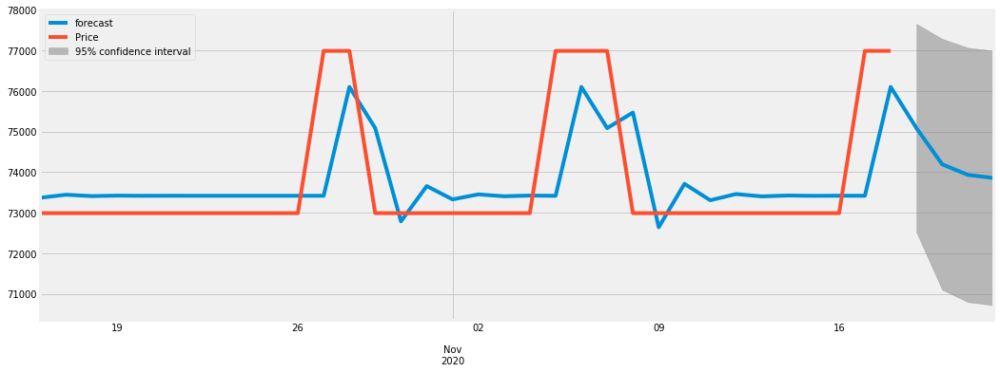

0.7660769716666491
2020-10-16    73368.980030
2020-10-17    73443.679672
2020-10-18    73410.088561
2020-10-19    73421.836892
2020-10-20    73417.271741
2020-10-21    73418.979349
2020-10-22    73418.331198
2020-10-23    73418.575865
2020-10-24    73418.483315
2020-10-25    73418.518297
2020-10-26    73418.505070
2020-10-27    73418.510070
2020-10-28    76100.704182
2020-10-29    75086.683279
2020-10-30    72787.844465
2020-10-31    73656.935408
2020-11-01    73328.369933
2020-11-02    73452.586245
2020-11-03    73405.625461
2020-11-04    73423.379290
2020-11-05    73416.667340
2020-11-06    76101.400838
2020-11-07    75086.419904
2020-11-08    75470.140038
2020-11-09    72642.876147
2020-11-10    73711.741622
2020-11-11    73307.650088
2020-11-12    73460.419517
2020-11-13    73402.664042
2020-11-14    73424.498874
2020-11-15    73416.244074
2020-11-16    73419.364855
2020-11-17    73418.185023
2020-11-18    76100.827068
2020-11-19    75086.636821
2020-11-20    74193.759753
2020-11-2

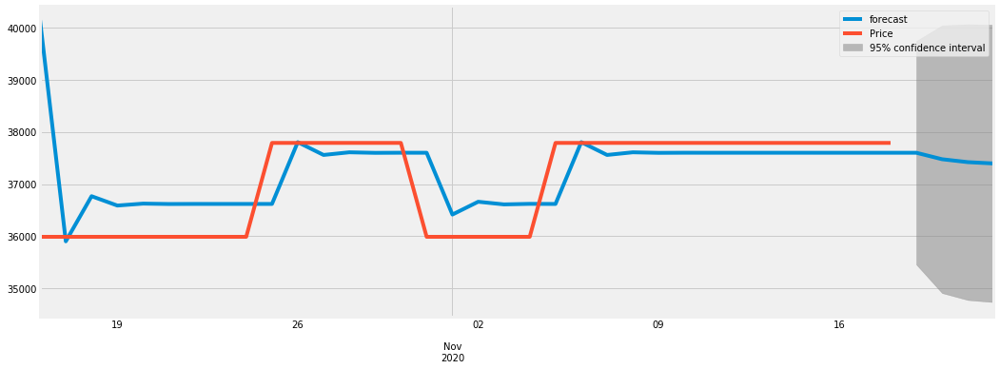

0.8117059616128661
2020-10-16    40138.857585
2020-10-17    35903.513766
2020-10-18    36767.583553
2020-10-19    36588.709435
2020-10-20    36625.737815
2020-10-21    36618.071625
2020-10-22    36619.658763
2020-10-23    36619.330175
2020-10-24    36619.398203
2020-10-25    36619.384119
2020-10-26    37802.398268
2020-10-27    37557.476731
2020-10-28    37608.183276
2020-10-29    37597.685409
2020-10-30    37599.858801
2020-10-31    37599.408840
2020-11-01    36416.490763
2020-11-02    36661.392410
2020-11-03    36610.689983
2020-11-04    36621.186997
2020-11-05    36619.013782
2020-11-06    37802.474940
2020-11-07    37557.460858
2020-11-08    37608.186562
2020-11-09    37597.684729
2020-11-10    37599.858942
2020-11-11    37599.408811
2020-11-12    37599.502002
2020-11-13    37599.482709
2020-11-14    37599.486703
2020-11-15    37599.485876
2020-11-16    37599.486047
2020-11-17    37599.486012
2020-11-18    37599.486019
2020-11-19    37599.486018
2020-11-20    37475.451447
2020-11-2

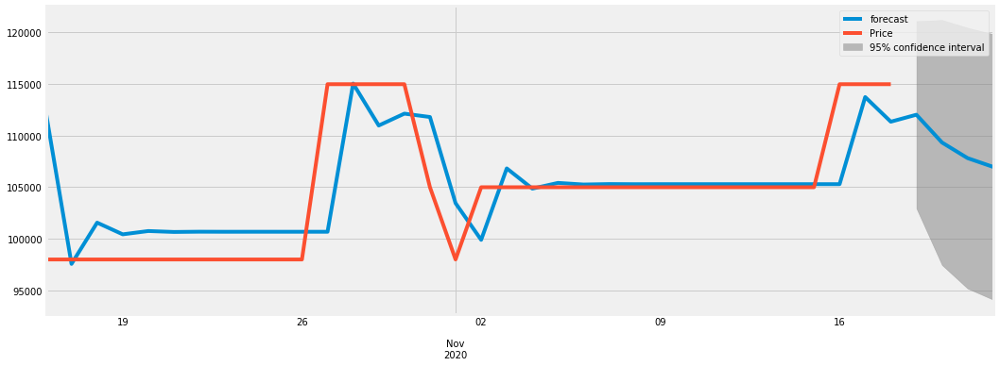

0.8898331530668755
2020-10-16    112248.820777
2020-10-17     97559.242353
2020-10-18    101557.849336
2020-10-19    100426.723627
2020-10-20    100746.636451
2020-10-21    100656.075926
2020-10-22    100681.706947
2020-10-23    100674.452273
2020-10-24    100676.505623
2020-10-25    100675.924444
2020-10-26    100676.088940
2020-10-27    100676.042381
2020-10-28    115035.276390
2020-10-29    110971.049582
2020-10-30    112121.385285
2020-10-31    111795.795132
2020-11-01    103446.571061
2020-11-02     99891.887203
2020-11-03    106815.844219
2020-11-04    104856.092626
2020-11-05    105410.779245
2020-11-06    105253.781161
2020-11-07    105298.217781
2020-11-08    105285.640474
2020-11-09    105289.200345
2020-11-10    105288.192762
2020-11-11    105288.477947
2020-11-12    105288.397229
2020-11-13    105288.420075
2020-11-14    105288.413609
2020-11-15    105288.415439
2020-11-16    105288.414921
2020-11-17    113729.793931
2020-11-18    111340.552357
2020-11-19    112016.801497
2

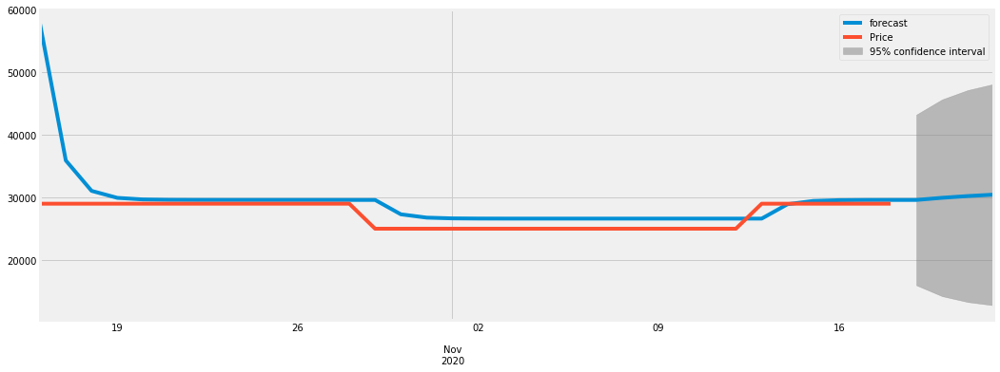

0.8699589675510047
2020-10-16    57757.422917
2020-10-17    35907.815751
2020-10-18    31042.670163
2020-10-19    29925.086392
2020-10-20    29667.920296
2020-10-21    29608.737404
2020-10-22    29595.117208
2020-10-23    29591.982687
2020-10-24    29591.261315
2020-10-25    29591.095300
2020-10-26    29591.057093
2020-10-27    29591.048301
2020-10-28    29591.046277
2020-10-29    29591.045811
2020-10-30    27292.611278
2020-10-31    26763.654439
2020-11-01    26641.921436
2020-11-02    26613.906061
2020-11-03    26607.458662
2020-11-04    26605.974871
2020-11-05    26605.633395
2020-11-06    26605.554808
2020-11-07    26605.536723
2020-11-08    26605.532560
2020-11-09    26605.531603
2020-11-10    26605.531382
2020-11-11    26605.531331
2020-11-12    26605.531320
2020-11-13    26605.531317
2020-11-14    28903.965742
2020-11-15    29432.922557
2020-11-16    29554.655555
2020-11-17    29582.670928
2020-11-18    29589.118326
2020-11-19    29590.602117
2020-11-20    29936.054739
2020-11-2

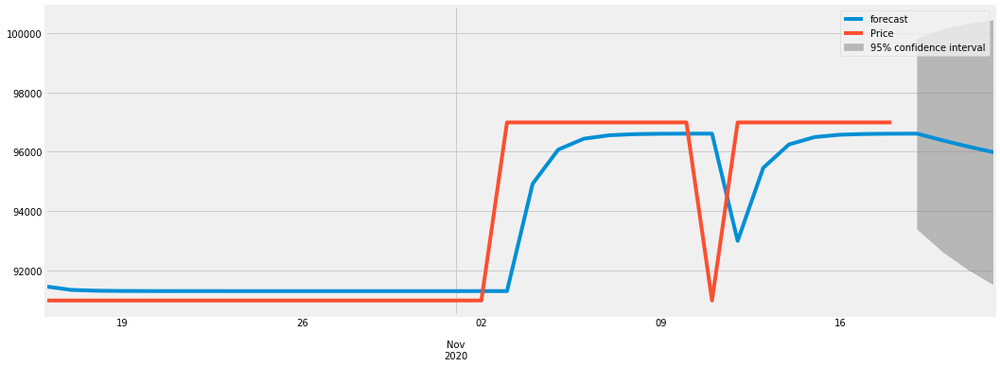

0.9480599998896898
2020-10-16    91462.661503
2020-10-17    91346.387911
2020-10-18    91318.646877
2020-10-19    91310.502883
2020-10-20    91307.972916
2020-10-21    91307.173312
2020-10-22    91306.919223
2020-10-23    91306.838343
2020-10-24    91306.812583
2020-10-25    91306.804377
2020-10-26    91306.801764
2020-10-27    91306.800931
2020-10-28    91306.800666
2020-10-29    91306.800581
2020-10-30    91306.800554
2020-10-31    91306.800545
2020-11-01    91306.800543
2020-11-02    91306.800542
2020-11-03    91306.800542
2020-11-04    94922.688314
2020-11-05    96074.602278
2020-11-06    96441.567699
2020-11-07    96558.471934
2020-11-08    96595.714135
2020-11-09    96607.578389
2020-11-10    96611.357987
2020-11-11    96612.562054
2020-11-12    92997.057860
2020-11-13    95461.153867
2020-11-14    96246.141338
2020-11-15    96496.214926
2020-11-16    96575.880910
2020-11-17    96601.260115
2020-11-18    96609.345173
2020-11-19    96611.920831
2020-11-20    96384.892718
2020-11-2

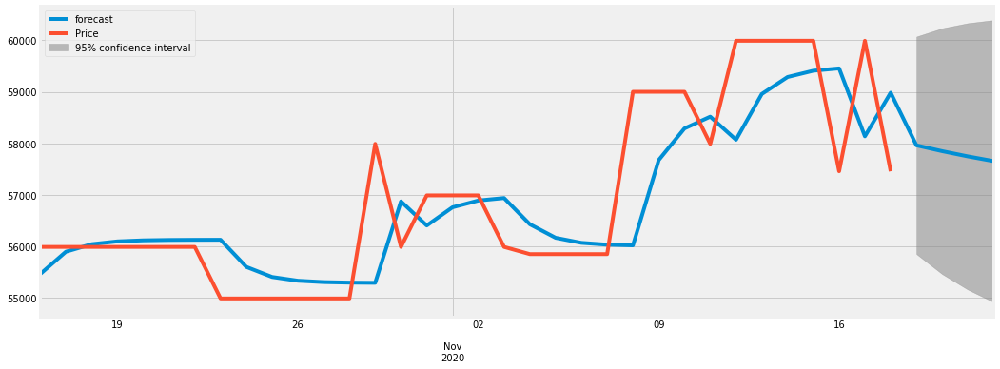

0.9054874236020456
2020-10-16    55463.062303
2020-10-17    55896.814143
2020-10-18    56043.441860
2020-10-19    56097.467792
2020-10-20    56117.534726
2020-10-21    56124.987186
2020-10-22    56127.753561
2020-10-23    56128.780205
2020-10-24    55602.195941
2020-10-25    55406.802507
2020-10-26    55334.300153
2020-10-27    55307.397554
2020-10-28    55297.415121
2020-10-29    55293.711056
2020-10-30    56873.232248
2020-10-31    56405.396285
2020-11-01    56758.767073
2020-11-02    56889.888237
2020-11-03    56938.541833
2020-11-04    56429.629948
2020-11-05    56167.018841
2020-11-06    56069.574810
2020-11-07    56033.417394
2020-11-08    56020.000884
2020-11-09    57674.962973
2020-11-10    58289.050392
2020-11-11    58516.912625
2020-11-12    58069.227941
2020-11-13    58957.041234
2020-11-14    59286.471724
2020-11-15    59408.709642
2020-11-16    59454.067036
2020-11-17    58136.621374
2020-11-18    58982.048126
2020-11-19    57961.474840
2020-11-20    57848.096374
2020-11-2

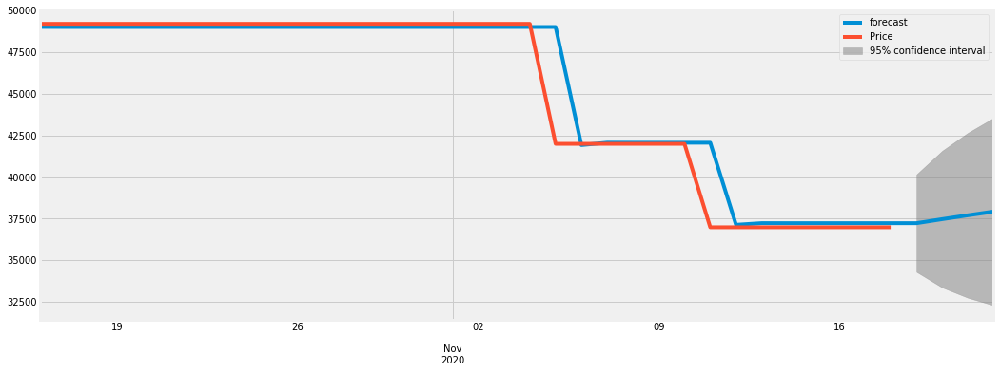

0.9986902725580824
2020-10-16    49015.706526
2020-10-17    49012.086823
2020-10-18    49012.161146
2020-10-19    49012.159649
2020-10-20    49012.159680
2020-10-21    49012.159679
2020-10-22    49012.159679
2020-10-23    49012.159679
2020-10-24    49012.159679
2020-10-25    49012.159679
2020-10-26    49012.159679
2020-10-27    49012.159679
2020-10-28    49012.159679
2020-10-29    49012.159679
2020-10-30    49012.159679
2020-10-31    49012.159679
2020-11-01    49012.159679
2020-11-02    49012.159679
2020-11-03    49012.159679
2020-11-04    49012.159679
2020-11-05    49012.159679
2020-11-06    41925.853116
2020-11-07    42068.582581
2020-11-08    42065.707783
2020-11-09    42065.765686
2020-11-10    42065.764519
2020-11-11    42065.764543
2020-11-12    37137.913706
2020-11-13    37237.168445
2020-11-14    37235.169297
2020-11-15    37235.209563
2020-11-16    37235.208752
2020-11-17    37235.208769
2020-11-18    37235.208768
2020-11-19    37235.208768
2020-11-20    37476.444990
2020-11-2

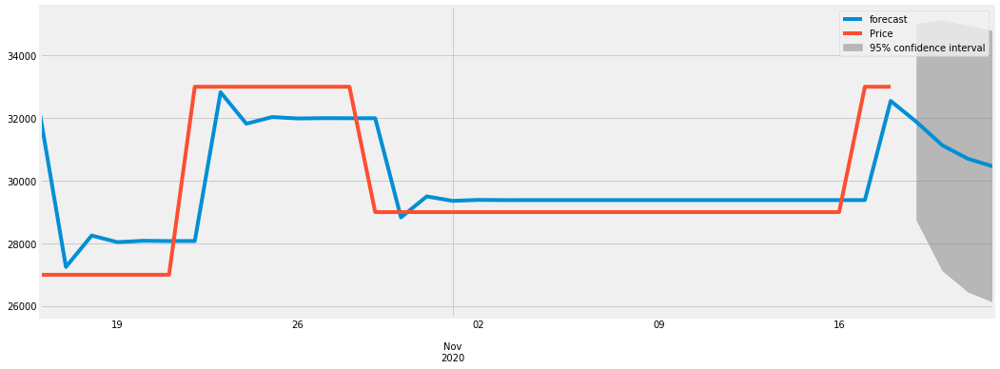

0.8907626527700985
2020-10-16    32088.410909
2020-10-17    27240.034803
2020-10-18    28242.374560
2020-10-19    28030.392368
2020-10-20    28075.204879
2020-10-21    28065.728942
2020-10-22    28067.732596
2020-10-23    32814.150889
2020-10-24    31810.527695
2020-10-25    32022.742349
2020-10-26    31977.869871
2020-10-27    31987.358091
2020-10-28    31985.351821
2020-10-29    31985.776044
2020-10-30    28821.125033
2020-10-31    29490.285853
2020-11-01    29348.792778
2020-11-02    29378.711281
2020-11-03    29372.385058
2020-11-04    29373.722728
2020-11-05    29373.439880
2020-11-06    29373.499688
2020-11-07    29373.487042
2020-11-08    29373.489716
2020-11-09    29373.489150
2020-11-10    29373.489270
2020-11-11    29373.489244
2020-11-12    29373.489250
2020-11-13    29373.489249
2020-11-14    29373.489249
2020-11-15    29373.489249
2020-11-16    29373.489249
2020-11-17    29373.489249
2020-11-18    32538.050558
2020-11-19    31868.908705
2020-11-20    31123.457236
2020-11-2

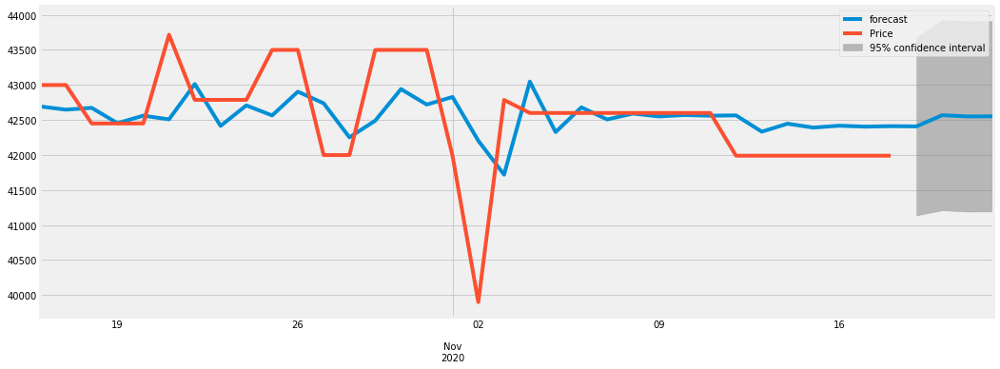

0.5052634505489773
2020-10-16    42693.385922
2020-10-17    42647.485019
2020-10-18    42673.143221
2020-10-19    42454.425730
2020-10-20    42561.288627
2020-10-21    42508.992198
2020-10-22    43013.547664
2020-10-23    42415.043401
2020-10-24    42707.962195
2020-10-25    42564.602260
2020-10-26    42904.309417
2020-10-27    42738.050147
2020-10-28    42251.979449
2020-10-29    42489.871915
2020-10-30    42940.883938
2020-10-31    42720.149869
2020-11-01    42828.181422
2020-11-02    42204.465067
2020-11-03    41719.615959
2020-11-04    43047.940128
2020-11-05    42327.516572
2020-11-06    42680.105893
2020-11-07    42507.541812
2020-11-08    42591.998034
2020-11-09    42550.663514
2020-11-10    42570.893433
2020-11-11    42560.992516
2020-11-12    42565.838218
2020-11-13    42332.860941
2020-11-14    42446.884558
2020-11-15    42391.079179
2020-11-16    42418.391419
2020-11-17    42405.024277
2020-11-18    42411.566416
2020-11-19    42408.364566
2020-11-20    42568.091043
2020-11-2

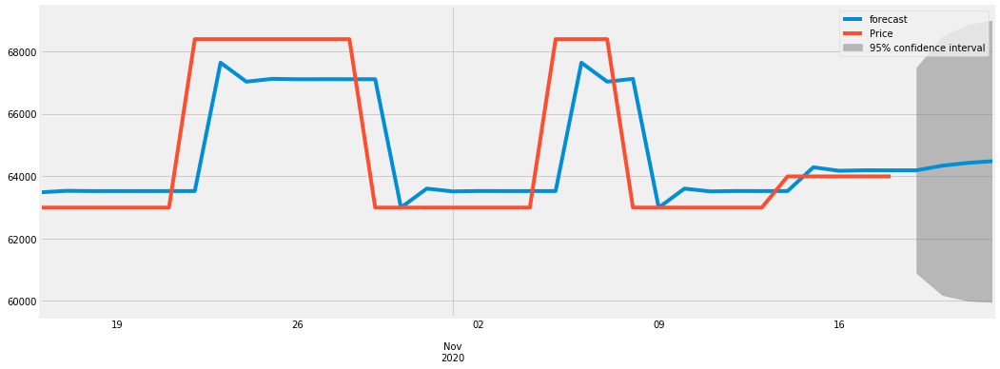

0.897997735884374
2020-10-16    63478.338639
2020-10-17    63527.700044
2020-10-18    63519.664662
2020-10-19    63520.835143
2020-10-20    63520.661674
2020-10-21    63520.687318
2020-10-22    63520.683526
2020-10-23    67636.923110
2020-10-24    67028.227982
2020-10-25    67118.239691
2020-10-26    67104.929074
2020-10-27    67106.897402
2020-10-28    67106.606332
2020-10-29    67106.649375
2020-10-30    62990.403986
2020-10-31    63599.099972
2020-11-01    63509.088136
2020-11-02    63522.398772
2020-11-03    63520.430442
2020-11-04    63520.721512
2020-11-05    63520.678469
2020-11-06    67636.923858
2020-11-07    67028.227872
2020-11-08    67118.239707
2020-11-09    62988.690048
2020-11-10    63599.353423
2020-11-11    63509.050657
2020-11-12    63522.404314
2020-11-13    63520.429622
2020-11-14    63520.721633
2020-11-15    64282.803803
2020-11-16    64170.109754
2020-11-17    64186.774556
2020-11-18    64184.310224
2020-11-19    64184.674641
2020-11-20    64332.987231
2020-11-21

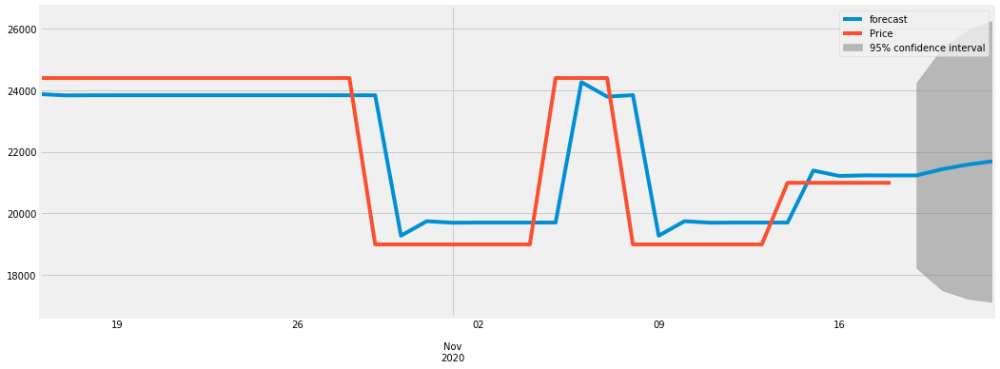

0.9489043932077029
2020-10-16    23868.872854
2020-10-17    23827.161389
2020-10-18    23831.808883
2020-10-19    23831.333361
2020-10-20    23831.382462
2020-10-21    23831.377397
2020-10-22    23831.377920
2020-10-23    23831.377866
2020-10-24    23831.377871
2020-10-25    23831.377871
2020-10-26    23831.377871
2020-10-27    23831.377871
2020-10-28    23831.377871
2020-10-29    23831.377871
2020-10-30    19273.552780
2020-10-31    19743.783245
2020-11-01    19695.269604
2020-11-02    19700.274753
2020-11-03    19699.758372
2020-11-04    19699.811647
2020-11-05    19699.806151
2020-11-06    24257.631809
2020-11-07    23787.401285
2020-11-08    23835.914932
2020-11-09    19273.084691
2020-11-10    19743.831538
2020-11-11    19695.264622
2020-11-12    19700.275267
2020-11-13    19699.758319
2020-11-14    19699.811653
2020-11-15    21387.889517
2020-11-16    21213.730653
2020-11-17    21231.698610
2020-11-18    21229.844857
2020-11-19    21230.036109
2020-11-20    21432.616859
2020-11-2

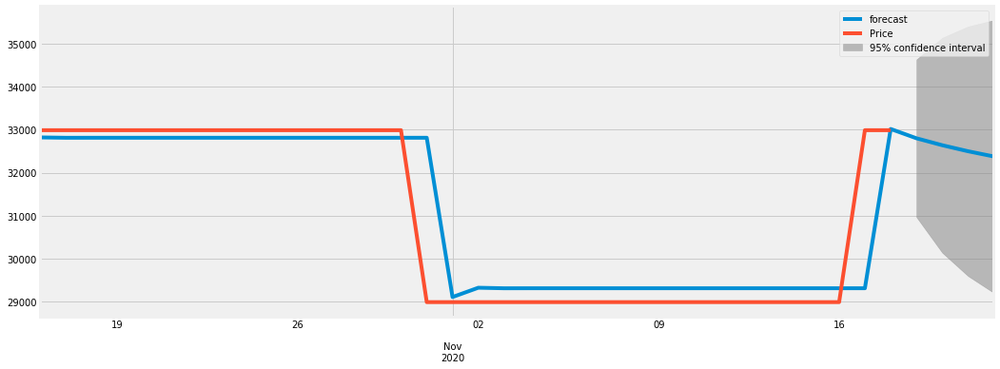

0.9841533670874686
2020-10-16    32822.105023
2020-10-17    32813.498804
2020-10-18    32814.026556
2020-10-19    32813.995863
2020-10-20    32813.997654
2020-10-21    32813.997549
2020-10-22    32813.997555
2020-10-23    32813.997555
2020-10-24    32813.997555
2020-10-25    32813.997555
2020-10-26    32813.997555
2020-10-27    32813.997555
2020-10-28    32813.997555
2020-10-29    32813.997555
2020-10-30    32813.997555
2020-10-31    32813.997555
2020-11-01    29108.459365
2020-11-02    29324.613370
2020-11-03    29312.004526
2020-11-04    29312.740033
2020-11-05    29312.697129
2020-11-06    29312.699632
2020-11-07    29312.699486
2020-11-08    29312.699494
2020-11-09    29312.699494
2020-11-10    29312.699494
2020-11-11    29312.699494
2020-11-12    29312.699494
2020-11-13    29312.699494
2020-11-14    29312.699494
2020-11-15    29312.699494
2020-11-16    29312.699494
2020-11-17    29312.699494
2020-11-18    33018.237684
2020-11-19    32802.083679
2020-11-20    32640.609748
2020-11-2

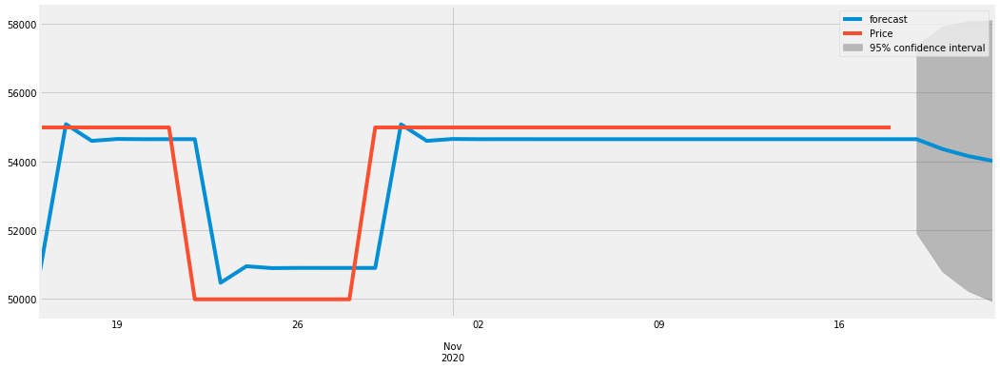

0.9415165116787143
2020-10-16    50836.488736
2020-10-17    55083.811013
2020-10-18    54598.472141
2020-10-19    54654.356104
2020-10-20    54647.921315
2020-10-21    54648.662260
2020-10-22    54648.576942
2020-10-23    50470.991696
2020-10-24    50952.026603
2020-10-25    50896.637049
2020-10-26    50903.014970
2020-10-27    50902.280574
2020-10-28    50902.365137
2020-10-29    50902.355400
2020-10-30    55079.951592
2020-10-31    54598.915425
2020-11-01    54654.305123
2020-11-02    54647.927186
2020-11-03    54648.661584
2020-11-04    54648.577020
2020-11-05    54648.586757
2020-11-06    54648.585636
2020-11-07    54648.585765
2020-11-08    54648.585750
2020-11-09    54648.585752
2020-11-10    54648.585752
2020-11-11    54648.585752
2020-11-12    54648.585752
2020-11-13    54648.585752
2020-11-14    54648.585752
2020-11-15    54648.585752
2020-11-16    54648.585752
2020-11-17    54648.585752
2020-11-18    54648.585752
2020-11-19    54648.585752
2020-11-20    54363.327656
2020-11-2

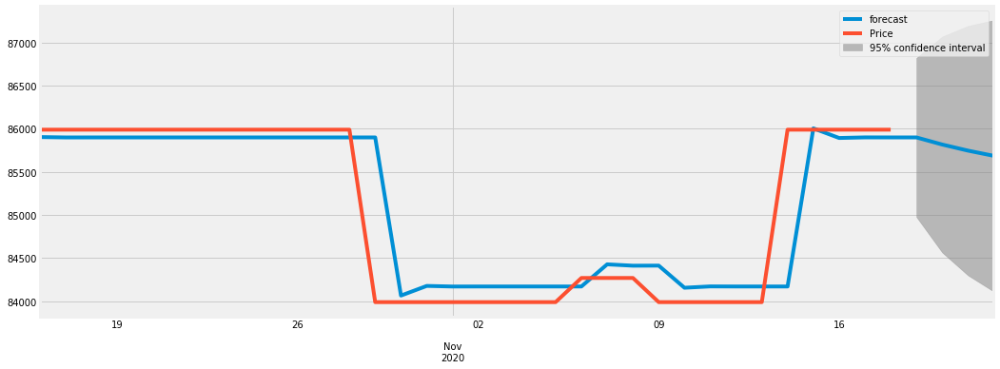

0.9815825368872836
2020-10-16    85904.347025
2020-10-17    85899.815738
2020-10-18    85900.106413
2020-10-19    85900.088761
2020-10-20    85900.089836
2020-10-21    85900.089771
2020-10-22    85900.089775
2020-10-23    85900.089774
2020-10-24    85900.089774
2020-10-25    85900.089774
2020-10-26    85900.089774
2020-10-27    85900.089774
2020-10-28    85900.089774
2020-10-29    85900.089774
2020-10-30    84066.095517
2020-10-31    84177.833322
2020-11-01    84171.025593
2020-11-02    84171.440360
2020-11-03    84171.415090
2020-11-04    84171.416629
2020-11-05    84171.416536
2020-11-06    84171.416541
2020-11-07    84428.175737
2020-11-08    84412.532444
2020-11-09    84413.485526
2020-11-10    84156.668263
2020-11-11    84172.315094
2020-11-12    84171.361796
2020-11-13    84171.419876
2020-11-14    84171.416338
2020-11-15    86005.410811
2020-11-16    85893.672992
2020-11-17    85900.480723
2020-11-18    85900.065956
2020-11-19    85900.091226
2020-11-20    85817.643598
2020-11-2

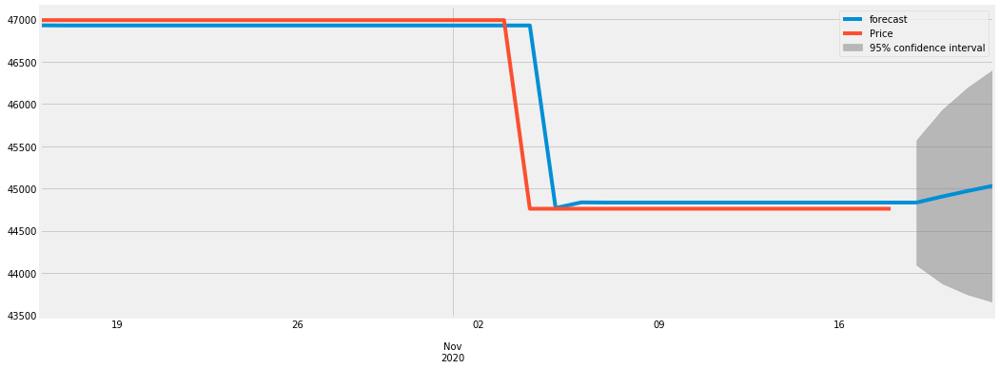

0.9963676730564245
2020-10-16    46928.705504
2020-10-17    46926.932871
2020-10-18    46926.989000
2020-10-19    46926.987274
2020-10-20    46926.987327
2020-10-21    46926.987326
2020-10-22    46926.987326
2020-10-23    46926.987326
2020-10-24    46926.987326
2020-10-25    46926.987326
2020-10-26    46926.987326
2020-10-27    46926.987326
2020-10-28    46926.987326
2020-10-29    46926.987326
2020-10-30    46926.987326
2020-10-31    46926.987326
2020-11-01    46926.987326
2020-11-02    46926.987326
2020-11-03    46926.987326
2020-11-04    46926.987326
2020-11-05    44768.886889
2020-11-06    44835.300821
2020-11-07    44833.256982
2020-11-08    44833.319879
2020-11-09    44833.317944
2020-11-10    44833.318003
2020-11-11    44833.318002
2020-11-12    44833.318002
2020-11-13    44833.318002
2020-11-14    44833.318002
2020-11-15    44833.318002
2020-11-16    44833.318002
2020-11-17    44833.318002
2020-11-18    44833.318002
2020-11-19    44833.318002
2020-11-20    44904.272087
2020-11-2

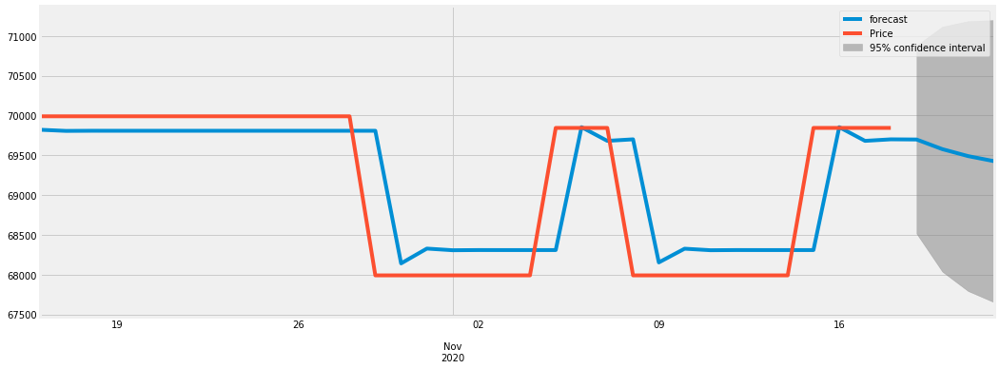

0.9420227778425927
2020-10-16    69820.839834
2020-10-17    69806.463659
2020-10-18    69808.203268
2020-10-19    69808.011074
2020-10-20    69808.032534
2020-10-21    69808.030141
2020-10-22    69808.030408
2020-10-23    69808.030378
2020-10-24    69808.030381
2020-10-25    69808.030381
2020-10-26    69808.030381
2020-10-27    69808.030381
2020-10-28    69808.030381
2020-10-29    69808.030381
2020-10-30    68140.828544
2020-10-31    68326.785311
2020-11-01    68306.044020
2020-11-02    68308.357467
2020-11-03    68308.099429
2020-11-04    68308.128210
2020-11-05    68308.125000
2020-11-06    69853.621461
2020-11-07    69681.239498
2020-11-08    69700.466679
2020-11-09    68152.826010
2020-11-10    68325.447135
2020-11-11    68306.193278
2020-11-12    68308.340819
2020-11-13    68308.101286
2020-11-14    68308.128003
2020-11-15    68308.125023
2020-11-16    69853.621458
2020-11-17    69681.239498
2020-11-18    69700.466679
2020-11-19    69698.322113
2020-11-20    69577.124094
2020-11-2

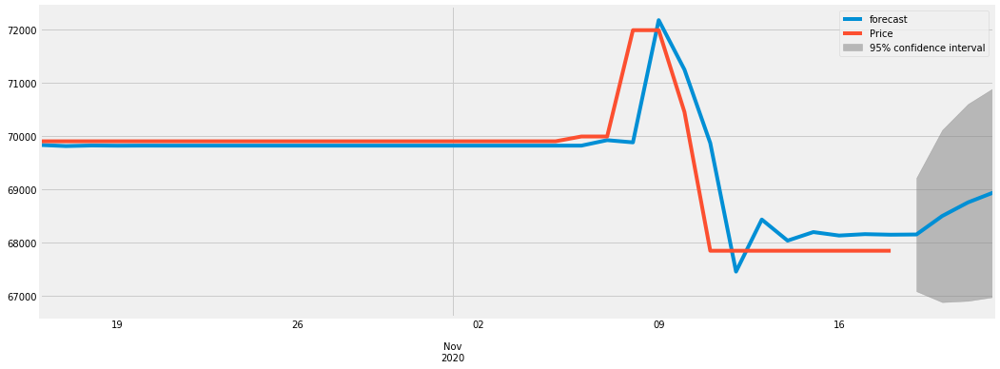

0.9460579135710384
2020-10-16    69831.076173
2020-10-17    69810.125383
2020-10-18    69820.996845
2020-10-19    69817.137472
2020-10-20    69818.776135
2020-10-21    69818.125640
2020-10-22    69818.391201
2020-10-23    69818.283996
2020-10-24    69818.327472
2020-10-25    69818.309874
2020-10-26    69818.317003
2020-10-27    69818.314116
2020-10-28    69818.315285
2020-10-29    69818.314811
2020-10-30    69818.315003
2020-10-31    69818.314925
2020-11-01    69818.314957
2020-11-02    69818.314944
2020-11-03    69818.314949
2020-11-04    69818.314947
2020-11-05    69818.314948
2020-11-06    69818.314948
2020-11-07    69921.030152
2020-11-08    69879.429802
2020-11-09    72178.838313
2020-11-10    71247.562369
2020-11-11    69867.164134
2020-11-12    67448.635087
2020-11-13    68428.155650
2020-11-14    68031.443221
2020-11-15    68192.114428
2020-11-16    68127.041507
2020-11-17    68153.396478
2020-11-18    68142.722537
2020-11-19    68147.045555
2020-11-20    68494.578389
2020-11-2

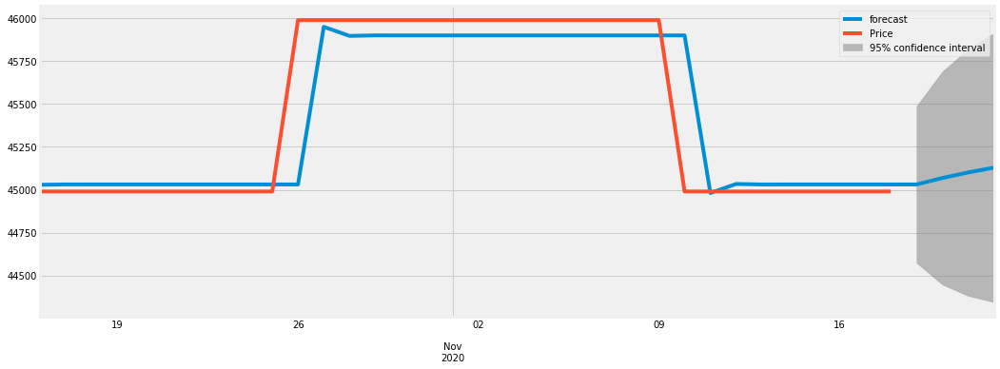

0.9830561515984332
2020-10-16    45029.079881
2020-10-17    45031.041419
2020-10-18    45030.923063
2020-10-19    45030.929844
2020-10-20    45030.929454
2020-10-21    45030.929477
2020-10-22    45030.929475
2020-10-23    45030.929476
2020-10-24    45030.929476
2020-10-25    45030.929476
2020-10-26    45030.929476
2020-10-27    45950.857445
2020-10-28    45898.003128
2020-10-29    45901.039864
2020-10-30    45900.865389
2020-10-31    45900.875413
2020-11-01    45900.874838
2020-11-02    45900.874871
2020-11-03    45900.874869
2020-11-04    45900.874869
2020-11-05    45900.874869
2020-11-06    45900.874869
2020-11-07    45900.874869
2020-11-08    45900.874869
2020-11-09    45900.874869
2020-11-10    45900.874869
2020-11-11    44980.946899
2020-11-12    45033.801217
2020-11-13    45030.764480
2020-11-14    45030.938955
2020-11-15    45030.928931
2020-11-16    45030.929507
2020-11-17    45030.929474
2020-11-18    45030.929476
2020-11-19    45030.929475
2020-11-20    45068.581645
2020-11-2

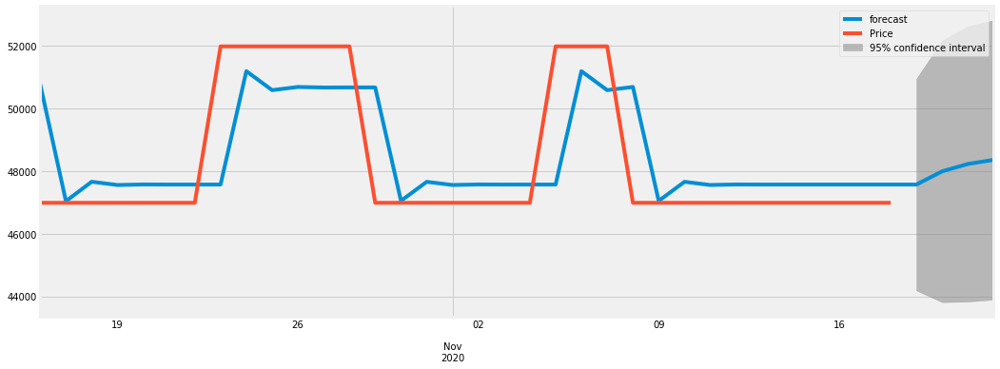

0.8715445153571836
2020-10-16    50787.194149
2020-10-17    47042.204070
2020-10-18    47662.452328
2020-10-19    47558.457997
2020-10-20    47575.892914
2020-10-21    47572.969706
2020-10-22    47573.459818
2020-10-23    47573.377644
2020-10-24    51198.452954
2020-10-25    50590.663347
2020-10-26    50692.566942
2020-10-27    50675.481519
2020-10-28    50678.346105
2020-10-29    50677.865821
2020-10-30    47052.884814
2020-10-31    47660.658611
2020-11-01    47558.757667
2020-11-02    47575.842645
2020-11-03    47572.978133
2020-11-04    47573.458405
2020-11-05    47573.377881
2020-11-06    51198.452914
2020-11-07    50590.663353
2020-11-08    50692.566941
2020-11-09    47050.419986
2020-11-10    47661.071870
2020-11-11    47558.688378
2020-11-12    47575.854262
2020-11-13    47572.976185
2020-11-14    47573.458731
2020-11-15    47573.377826
2020-11-16    47573.391391
2020-11-17    47573.389117
2020-11-18    47573.389498
2020-11-19    47573.389434
2020-11-20    47996.353964
2020-11-2

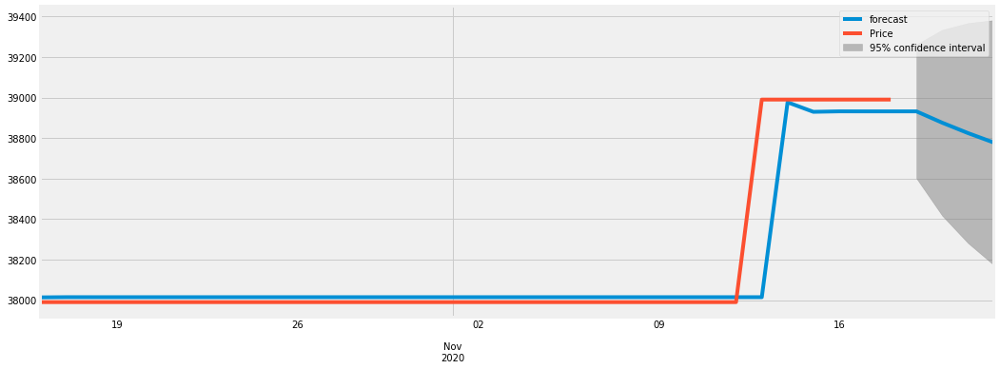

0.9930396181207289
2020-10-16    38013.410270
2020-10-17    38014.462059
2020-10-18    38014.408323
2020-10-19    38014.410944
2020-10-20    38014.410816
2020-10-21    38014.410822
2020-10-22    38014.410822
2020-10-23    38014.410822
2020-10-24    38014.410822
2020-10-25    38014.410822
2020-10-26    38014.410822
2020-10-27    38014.410822
2020-10-28    38014.410822
2020-10-29    38014.410822
2020-10-30    38014.410822
2020-10-31    38014.410822
2020-11-01    38014.410822
2020-11-02    38014.410822
2020-11-03    38014.410822
2020-11-04    38014.410822
2020-11-05    38014.410822
2020-11-06    38014.410822
2020-11-07    38014.410822
2020-11-08    38014.410822
2020-11-09    38014.410822
2020-11-10    38014.410822
2020-11-11    38014.410822
2020-11-12    38014.410822
2020-11-13    38014.410822
2020-11-14    38976.645520
2020-11-15    38929.598387
2020-11-16    38931.898691
2020-11-17    38931.786221
2020-11-18    38931.791720
2020-11-19    38931.791451
2020-11-20    38875.781179
2020-11-2

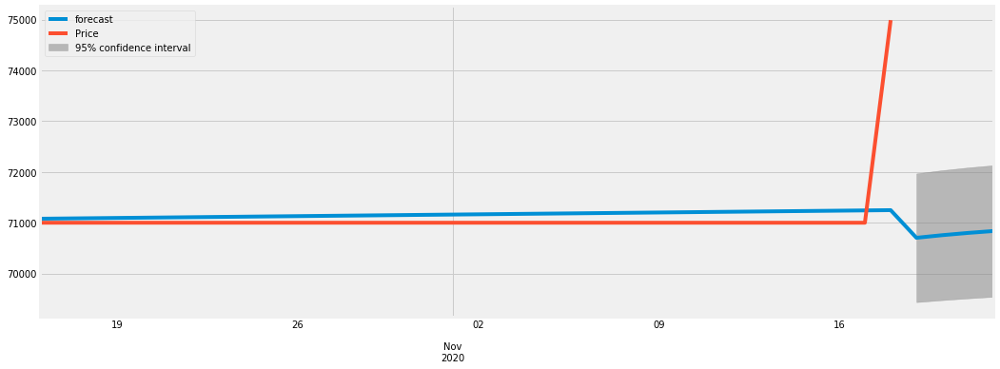

-0.252333164706106
2020-10-16    71077.753561
2020-10-17    71082.871515
2020-10-18    71087.989469
2020-10-19    71093.107423
2020-10-20    71098.225377
2020-10-21    71103.343332
2020-10-22    71108.461286
2020-10-23    71113.579240
2020-10-24    71118.697194
2020-10-25    71123.815149
2020-10-26    71128.933103
2020-10-27    71134.051057
2020-10-28    71139.169011
2020-10-29    71144.286965
2020-10-30    71149.404920
2020-10-31    71154.522874
2020-11-01    71159.640828
2020-11-02    71164.758782
2020-11-03    71169.876737
2020-11-04    71174.994691
2020-11-05    71180.112645
2020-11-06    71185.230599
2020-11-07    71190.348553
2020-11-08    71195.466508
2020-11-09    71200.584462
2020-11-10    71205.702416
2020-11-11    71210.820370
2020-11-12    71215.938325
2020-11-13    71221.056279
2020-11-14    71226.174233
2020-11-15    71231.292187
2020-11-16    71236.410141
2020-11-17    71241.528096
2020-11-18    71246.646050
2020-11-19    70702.102826
2020-11-20    70753.609696
2020-11-2

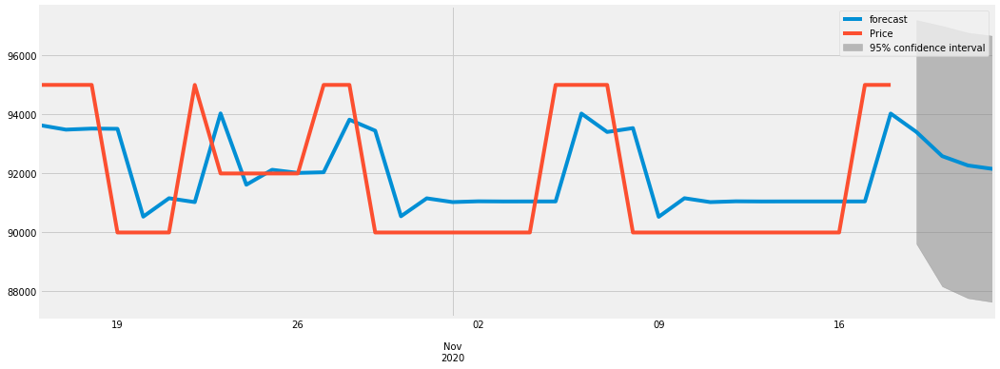

0.7730042081713477
2020-10-16    93625.257087
2020-10-17    93474.423867
2020-10-18    93509.531968
2020-10-19    93502.340043
2020-10-20    90526.337494
2020-10-21    91150.445860
2020-10-22    91019.561643
2020-10-23    94024.529144
2020-10-24    91607.834075
2020-10-25    92114.648671
2020-10-26    92008.362595
2020-10-27    92030.652265
2020-10-28    93812.489366
2020-10-29    93438.813324
2020-10-30    90539.659132
2020-10-31    91147.652121
2020-11-01    91020.147529
2020-11-02    91046.887016
2020-11-03    91041.279374
2020-11-04    91042.455374
2020-11-05    91042.208751
2020-11-06    94019.779730
2020-11-07    93395.341649
2020-11-08    93526.295007
2020-11-09    90521.313005
2020-11-10    91151.499560
2020-11-11    91019.340667
2020-11-12    91047.056227
2020-11-13    91041.243888
2020-11-14    91042.462816
2020-11-15    91042.207190
2020-11-16    91042.260798
2020-11-17    91042.249556
2020-11-18    94019.771173
2020-11-19    93395.343444
2020-11-20    92576.670508
2020-11-2

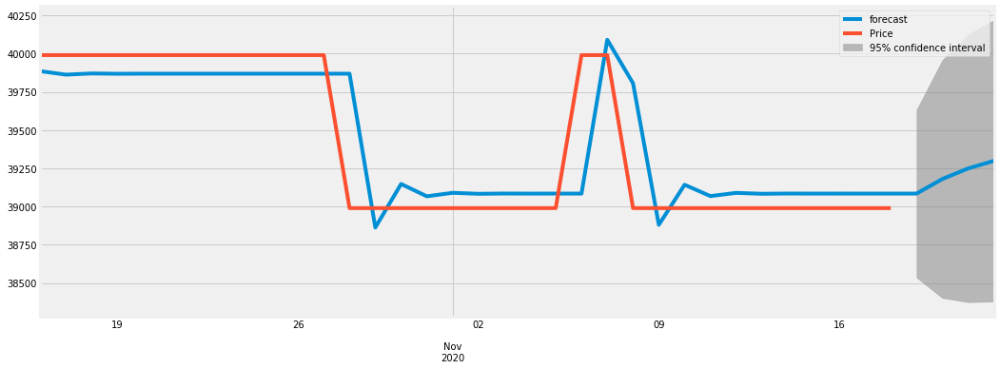

0.9476345380727557
2020-10-16    39885.192240
2020-10-17    39862.313541
2020-10-18    39870.168488
2020-10-19    39868.083149
2020-10-20    39868.683504
2020-10-21    39868.514455
2020-10-22    39868.562359
2020-10-23    39868.548808
2020-10-24    39868.552643
2020-10-25    39868.551558
2020-10-26    39868.551865
2020-10-27    39868.551778
2020-10-28    39868.551803
2020-10-29    38863.052544
2020-10-30    39147.585092
2020-10-31    39067.069100
2020-11-01    39089.853224
2020-11-02    39083.405855
2020-11-03    39085.230308
2020-11-04    39084.714031
2020-11-05    39084.860125
2020-11-06    39084.818784
2020-11-07    40090.329734
2020-11-08    39805.793878
2020-11-09    38880.811555
2020-11-10    39142.559711
2020-11-11    39068.491164
2020-11-12    39089.450814
2020-11-13    39083.519728
2020-11-14    39085.198085
2020-11-15    39084.723149
2020-11-16    39084.857545
2020-11-17    39084.819514
2020-11-18    39084.830276
2020-11-19    39084.827231
2020-11-20    39180.176802
2020-11-2

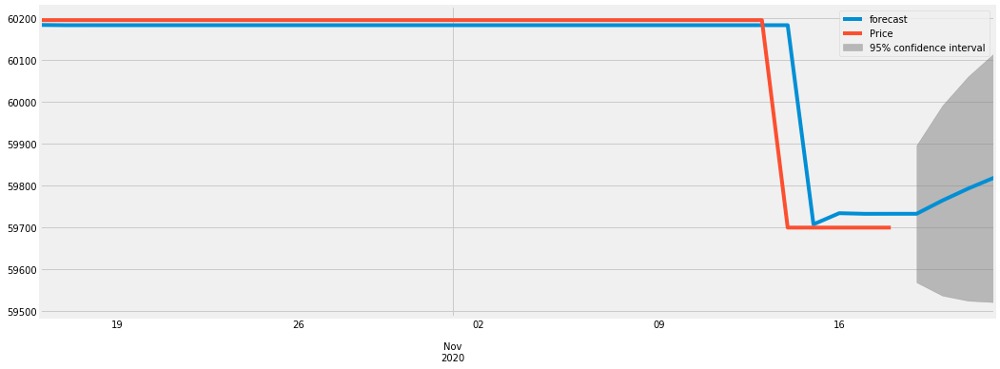

0.9915906460488448
2020-10-16    60183.488368
2020-10-17    60182.903457
2020-10-18    60182.937738
2020-10-19    60182.935832
2020-10-20    60182.935938
2020-10-21    60182.935932
2020-10-22    60182.935932
2020-10-23    60182.935932
2020-10-24    60182.935932
2020-10-25    60182.935932
2020-10-26    60182.935932
2020-10-27    60182.935932
2020-10-28    60182.935932
2020-10-29    60182.935932
2020-10-30    60182.935932
2020-10-31    60182.935932
2020-11-01    60182.935932
2020-11-02    60182.935932
2020-11-03    60182.935932
2020-11-04    60182.935932
2020-11-05    60182.935932
2020-11-06    60182.935932
2020-11-07    60182.935932
2020-11-08    60182.935932
2020-11-09    60182.935932
2020-11-10    60182.935932
2020-11-11    60182.935932
2020-11-12    60182.935932
2020-11-13    60182.935932
2020-11-14    60182.935932
2020-11-15    59707.787931
2020-11-16    59734.289669
2020-11-17    59732.811515
2020-11-18    59732.893960
2020-11-19    59732.889362
2020-11-20    59764.459950
2020-11-2

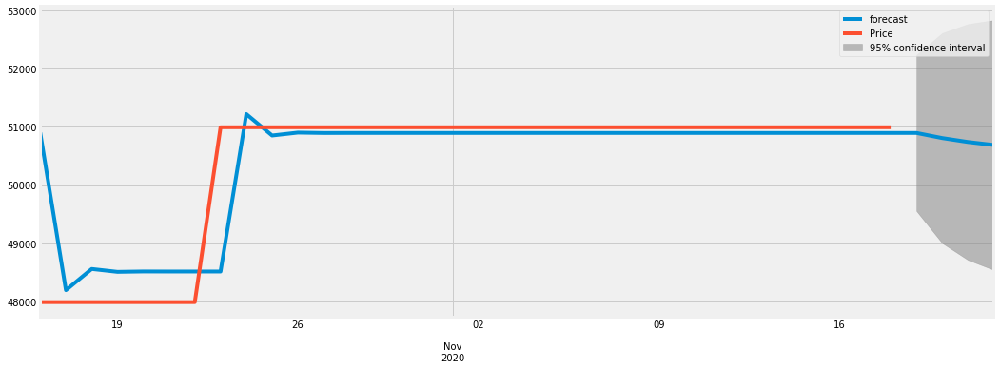

0.9591794365582719
2020-10-16    50901.725450
2020-10-17    48195.790410
2020-10-18    48559.110318
2020-10-19    48509.680789
2020-10-20    48516.404534
2020-10-21    48515.489876
2020-10-22    48515.614300
2020-10-23    48515.597374
2020-10-24    51216.744210
2020-10-25    50849.298381
2020-10-26    50899.283237
2020-10-27    50892.483634
2020-10-28    50893.408606
2020-10-29    50893.282779
2020-10-30    50893.299896
2020-10-31    50893.297567
2020-11-01    50893.297884
2020-11-02    50893.297841
2020-11-03    50893.297847
2020-11-04    50893.297846
2020-11-05    50893.297846
2020-11-06    50893.297846
2020-11-07    50893.297846
2020-11-08    50893.297846
2020-11-09    50893.297846
2020-11-10    50893.297846
2020-11-11    50893.297846
2020-11-12    50893.297846
2020-11-13    50893.297846
2020-11-14    50893.297846
2020-11-15    50893.297846
2020-11-16    50893.297846
2020-11-17    50893.297846
2020-11-18    50893.297846
2020-11-19    50893.297846
2020-11-20    50805.357947
2020-11-2

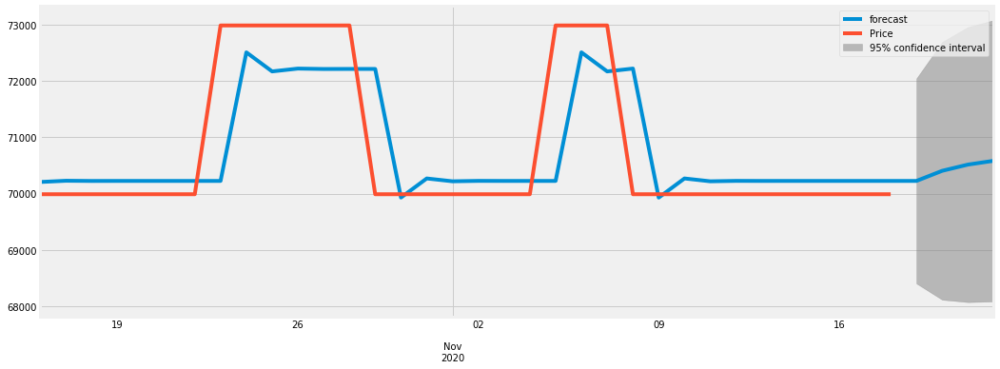

0.8979447852953497
2020-10-16    70207.386783
2020-10-17    70229.423893
2020-10-18    70225.823339
2020-10-19    70226.349559
2020-10-20    70226.271303
2020-10-21    70226.282911
2020-10-22    70226.281189
2020-10-23    70226.281444
2020-10-24    72512.260640
2020-10-25    72173.062885
2020-10-26    72223.393665
2020-10-27    72215.925492
2020-10-28    72217.033634
2020-10-29    72216.869206
2020-10-30    69930.914370
2020-10-31    70270.108511
2020-11-01    70219.778267
2020-11-02    70227.246360
2020-11-03    70226.138231
2020-11-04    70226.302657
2020-11-05    70226.278259
2020-11-06    72512.261112
2020-11-07    72173.062815
2020-11-08    72223.393676
2020-11-09    69929.946258
2020-11-10    70270.252161
2020-11-11    70219.756951
2020-11-12    70227.249523
2020-11-13    70226.137761
2020-11-14    70226.302726
2020-11-15    70226.278249
2020-11-16    70226.281881
2020-11-17    70226.281342
2020-11-18    70226.281422
2020-11-19    70226.281410
2020-11-20    70406.326210
2020-11-2

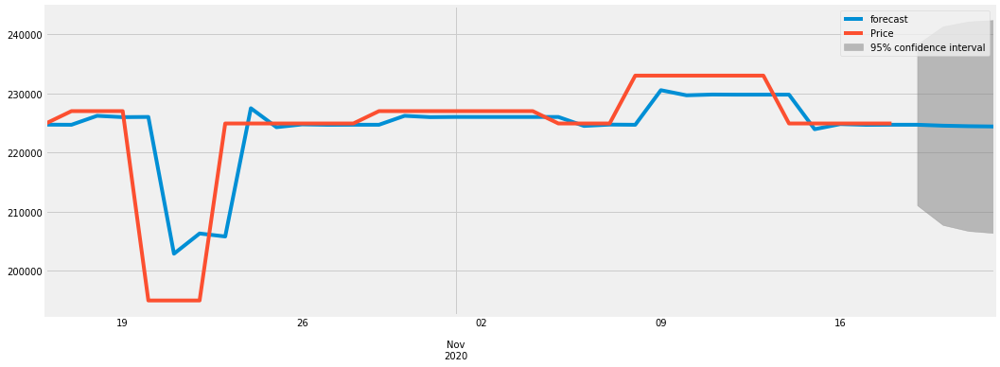

0.8765319465577563
2020-10-16    224701.386222
2020-10-17    224682.253807
2020-10-18    226194.529966
2020-10-19    225970.880216
2020-10-20    226003.966582
2020-10-21    202891.122485
2020-10-22    206310.343917
2020-10-23    205804.518014
2020-10-24    227478.059378
2020-10-25    224271.762609
2020-10-26    224746.089292
2020-10-27    224675.919305
2020-10-28    224686.299971
2020-10-29    224684.764297
2020-10-30    226194.229427
2020-10-31    225970.925211
2020-11-01    226003.959941
2020-11-02    225999.072916
2020-11-03    225999.795883
2020-11-04    225999.688930
2020-11-05    225999.704752
2020-11-06    224490.464462
2020-11-07    224713.735417
2020-11-08    224680.705607
2020-11-09    230527.570377
2020-11-10    229662.608657
2020-11-11    229790.567624
2020-11-12    229771.637888
2020-11-13    229774.438277
2020-11-14    229774.023999
2020-11-15    223932.106813
2020-11-16    224796.336608
2020-11-17    224668.485918
2020-11-18    224687.399637
2020-11-19    224684.601617
2

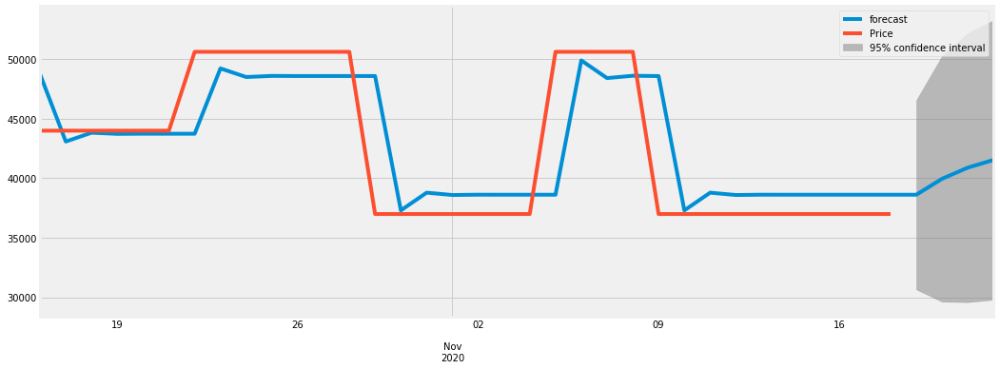

0.9346932240862714
2020-10-16    48740.173708
2020-10-17    43079.068021
2020-10-18    43818.783144
2020-10-19    43721.342060
2020-10-20    43734.180516
2020-10-21    43732.488981
2020-10-22    43732.711850
2020-10-23    49218.372563
2020-10-24    48495.607056
2020-10-25    48590.835326
2020-10-26    48578.288486
2020-10-27    48579.941600
2020-10-28    48579.723793
2020-10-29    48579.752490
2020-10-30    37296.107472
2020-10-31    38782.788809
2020-11-01    38586.910492
2020-11-02    38612.718521
2020-11-03    38609.318174
2020-11-04    38609.766188
2020-11-05    38609.707159
2020-11-06    49893.356174
2020-11-07    48406.674310
2020-11-08    48602.552697
2020-11-09    48576.744659
2020-11-10    37296.503770
2020-11-11    38782.736595
2020-11-12    38586.917372
2020-11-13    38612.717615
2020-11-14    38609.318293
2020-11-15    38609.766172
2020-11-16    38609.707161
2020-11-17    38609.714936
2020-11-18    38609.713912
2020-11-19    38609.714047
2020-11-20    39951.288735
2020-11-2

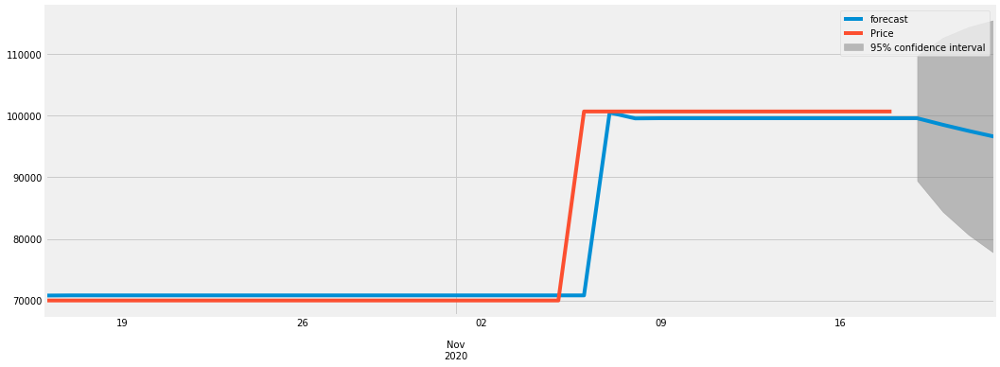

0.9961664159517539
2020-10-16     70794.265837
2020-10-17     70818.444971
2020-10-18     70817.646955
2020-10-19     70817.672500
2020-10-20     70817.671682
2020-10-21     70817.671708
2020-10-22     70817.671707
2020-10-23     70817.671707
2020-10-24     70817.671707
2020-10-25     70817.671707
2020-10-26     70817.671707
2020-10-27     70817.671707
2020-10-28     70817.671707
2020-10-29     70817.671707
2020-10-30     70817.671707
2020-10-31     70817.671707
2020-11-01     70817.671707
2020-11-02     70817.671707
2020-11-03     70817.671707
2020-11-04     70817.671707
2020-11-05     70817.671707
2020-11-06     70817.671707
2020-11-07    100516.724081
2020-11-08     99565.134544
2020-11-09     99595.624495
2020-11-10     99594.647564
2020-11-11     99594.678866
2020-11-12     99594.677863
2020-11-13     99594.677895
2020-11-14     99594.677894
2020-11-15     99594.677894
2020-11-16     99594.677894
2020-11-17     99594.677894
2020-11-18     99594.677894
2020-11-19     99594.677894
2

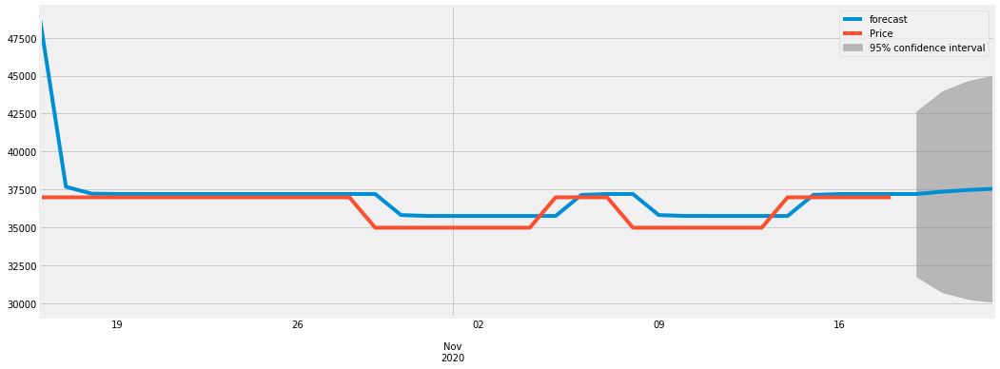

0.9080189703336743
2020-10-16    48659.025339
2020-10-17    37683.203129
2020-10-18    37228.068071
2020-10-19    37209.177306
2020-10-20    37208.393227
2020-10-21    37208.360683
2020-10-22    37208.359332
2020-10-23    37208.359276
2020-10-24    37208.359273
2020-10-25    37208.359273
2020-10-26    37208.359273
2020-10-27    37208.359273
2020-10-28    37208.359273
2020-10-29    37208.359273
2020-10-30    35820.397459
2020-10-31    35762.788798
2020-11-01    35760.397696
2020-11-02    35760.298451
2020-11-03    35760.294332
2020-11-04    35760.294161
2020-11-05    35760.294154
2020-11-06    37148.255968
2020-11-07    37205.864629
2020-11-08    37208.255731
2020-11-09    35820.393161
2020-11-10    35762.788619
2020-11-11    35760.397688
2020-11-12    35760.298451
2020-11-13    35760.294332
2020-11-14    35760.294161
2020-11-15    37148.255968
2020-11-16    37205.864629
2020-11-17    37208.255731
2020-11-18    37208.354976
2020-11-19    37208.359095
2020-11-20    37359.896309
2020-11-2

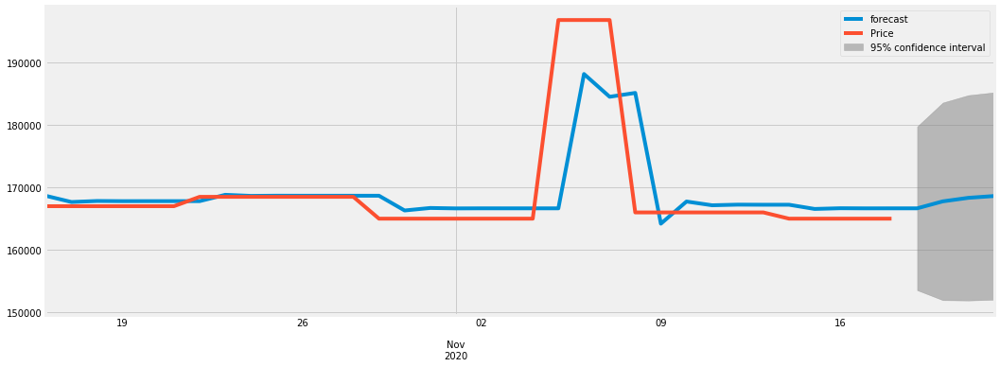

0.8418345485075094
2020-10-16    168654.737108
2020-10-17    167660.022526
2020-10-18    167825.524565
2020-10-19    167797.452514
2020-10-20    167802.207041
2020-10-21    167801.401531
2020-10-22    167801.537993
2020-10-23    168815.864663
2020-10-24    168644.025198
2020-10-25    168673.136926
2020-10-26    168668.205039
2020-10-27    168669.040562
2020-10-28    168668.899014
2020-10-29    168668.922994
2020-10-30    166302.102759
2020-10-31    166703.071338
2020-11-01    166635.142309
2020-11-02    166646.650325
2020-11-03    166644.700725
2020-11-04    166645.031011
2020-11-05    166644.975057
2020-11-06    188185.716640
2020-11-07    184536.448977
2020-11-08    185154.679989
2020-11-09    164185.445109
2020-11-10    167737.892478
2020-11-11    167136.064019
2020-11-12    167238.021193
2020-11-13    167220.748389
2020-11-14    167223.674615
2020-11-15    166546.945684
2020-11-16    166661.591923
2020-11-17    166642.169434
2020-11-18    166645.459843
2020-11-19    166644.902407
2

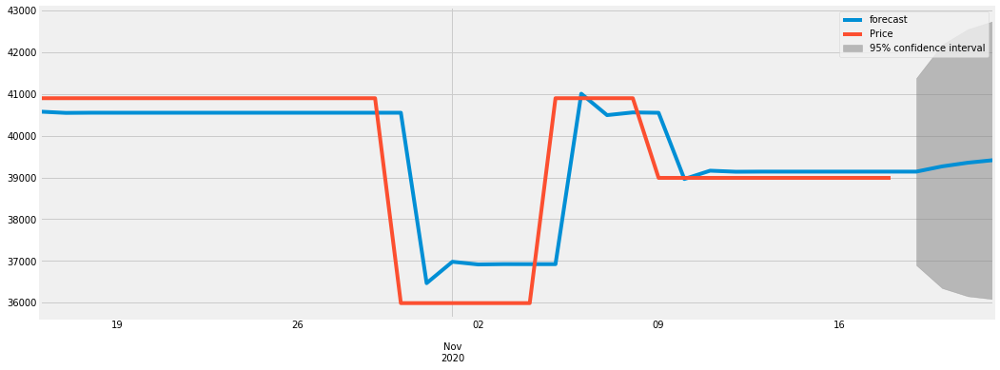

0.9374780633837289
2020-10-16    40577.618517
2020-10-17    40547.267186
2020-10-18    40551.437935
2020-10-19    40550.920401
2020-10-20    40550.985487
2020-10-21    40550.977316
2020-10-22    40550.978342
2020-10-23    40550.978213
2020-10-24    40550.978229
2020-10-25    40550.978227
2020-10-26    40550.978227
2020-10-27    40550.978227
2020-10-28    40550.978227
2020-10-29    40550.978227
2020-10-30    40550.978227
2020-10-31    36467.943680
2020-11-01    36980.674401
2020-11-02    36916.287781
2020-11-03    36924.373189
2020-11-04    36923.357856
2020-11-05    36923.485358
2020-11-06    41006.503894
2020-11-07    40493.775184
2020-11-08    40558.161551
2020-11-09    40550.076175
2020-11-10    38963.290943
2020-11-11    39162.552920
2020-11-12    39137.530419
2020-11-13    39140.672642
2020-11-14    39140.278054
2020-11-15    39140.327605
2020-11-16    39140.321382
2020-11-17    39140.322164
2020-11-18    39140.322066
2020-11-19    39140.322078
2020-11-20    39265.351663
2020-11-2

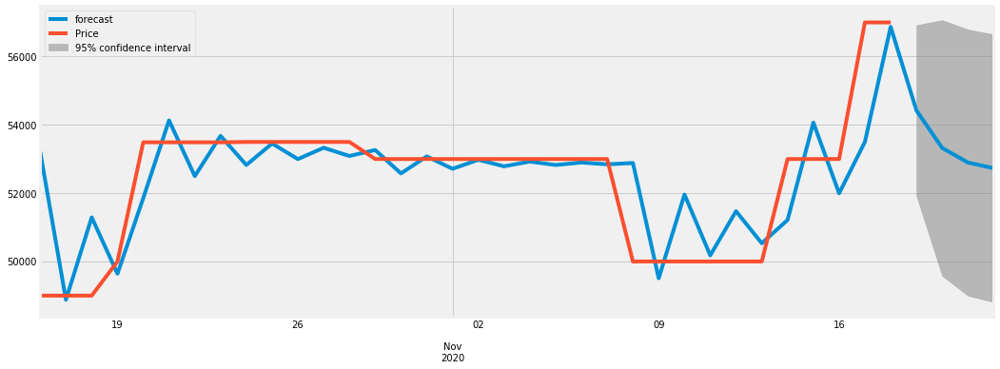

0.7829549084414682
2020-10-16    53212.958971
2020-10-17    48868.438162
2020-10-18    51281.931446
2020-10-19    49631.337901
2020-10-20    51845.846140
2020-10-21    54120.686834
2020-10-22    52489.313283
2020-10-23    53667.923600
2020-10-24    52814.911779
2020-10-25    53444.924796
2020-10-26    52987.762207
2020-10-27    53319.792139
2020-10-28    53078.669282
2020-10-29    53253.837830
2020-10-30    52568.753009
2020-10-31    53066.446379
2020-11-01    52704.883520
2020-11-02    52967.554518
2020-11-03    52776.727055
2020-11-04    52915.361765
2020-11-05    52814.644764
2020-11-06    52887.815016
2020-11-07    52834.657337
2020-11-08    52873.276059
2020-11-09    49498.052664
2020-11-10    51950.130959
2020-11-11    50168.711615
2020-11-12    51462.901484
2020-11-13    50522.680725
2020-11-14    51205.745161
2020-11-15    54056.670478
2020-11-16    51985.491250
2020-11-17    53490.189873
2020-11-18    56859.925586
2020-11-19    54411.833880
2020-11-20    53313.839246
2020-11-2

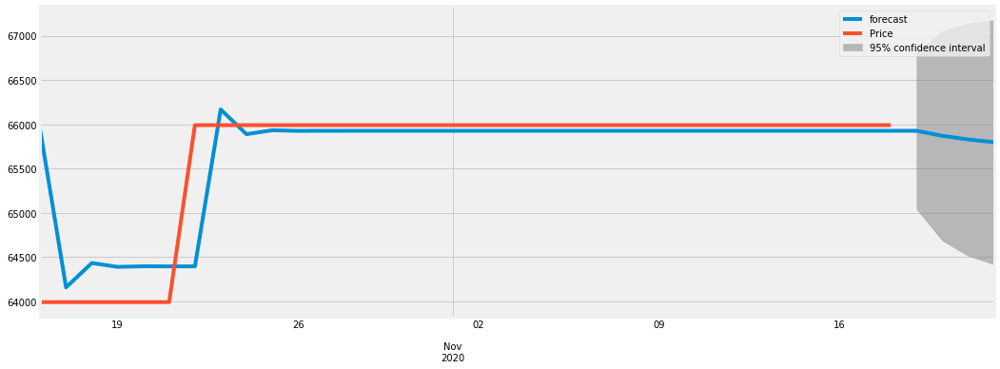

0.9485537876820376
2020-10-16    65932.025298
2020-10-17    64156.678854
2020-10-18    64431.571943
2020-10-19    64388.275574
2020-10-20    64395.092760
2020-10-21    64394.019252
2020-10-22    64394.188296
2020-10-23    66167.243562
2020-10-24    65888.042775
2020-10-25    65932.008172
2020-10-26    65925.084996
2020-10-27    65926.175180
2020-10-28    65926.003510
2020-10-29    65926.030543
2020-10-30    65926.026286
2020-10-31    65926.026957
2020-11-01    65926.026851
2020-11-02    65926.026868
2020-11-03    65926.026865
2020-11-04    65926.026865
2020-11-05    65926.026865
2020-11-06    65926.026865
2020-11-07    65926.026865
2020-11-08    65926.026865
2020-11-09    65926.026865
2020-11-10    65926.026865
2020-11-11    65926.026865
2020-11-12    65926.026865
2020-11-13    65926.026865
2020-11-14    65926.026865
2020-11-15    65926.026865
2020-11-16    65926.026865
2020-11-17    65926.026865
2020-11-18    65926.026865
2020-11-19    65926.026865
2020-11-20    65869.312062
2020-11-2

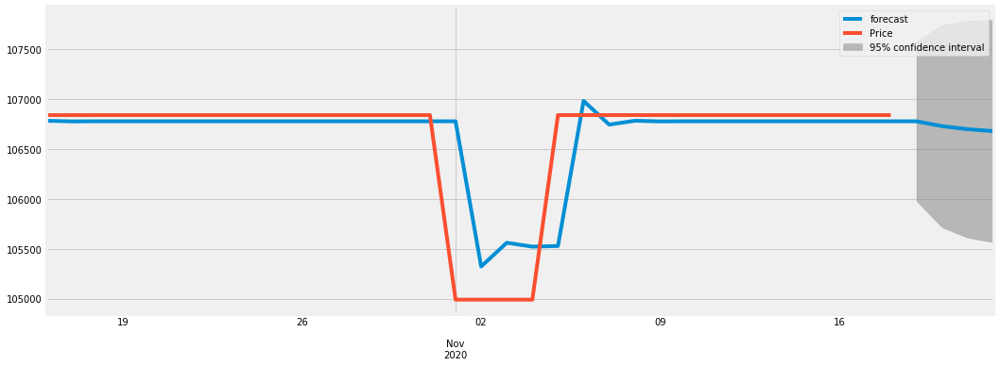

0.9053852249953986
2020-10-16    106783.360207
2020-10-17    106776.924679
2020-10-18    106778.095555
2020-10-19    106777.907748
2020-10-20    106777.938535
2020-10-21    106777.933506
2020-10-22    106777.934328
2020-10-23    106777.934194
2020-10-24    106777.934216
2020-10-25    106777.934212
2020-10-26    106777.934213
2020-10-27    106777.934213
2020-10-28    106777.934213
2020-10-29    106777.934213
2020-10-30    106777.934213
2020-10-31    106777.934213
2020-11-01    106777.934213
2020-11-02    105322.393820
2020-11-03    105560.278733
2020-11-04    105521.400230
2020-11-05    105527.754303
2020-11-06    106982.256223
2020-11-07    106744.541032
2020-11-08    106783.391797
2020-11-09    106777.042257
2020-11-10    106778.079988
2020-11-11    106777.910388
2020-11-12    106777.938106
2020-11-13    106777.933576
2020-11-14    106777.934317
2020-11-15    106777.934196
2020-11-16    106777.934215
2020-11-17    106777.934212
2020-11-18    106777.934213
2020-11-19    106777.934213
2

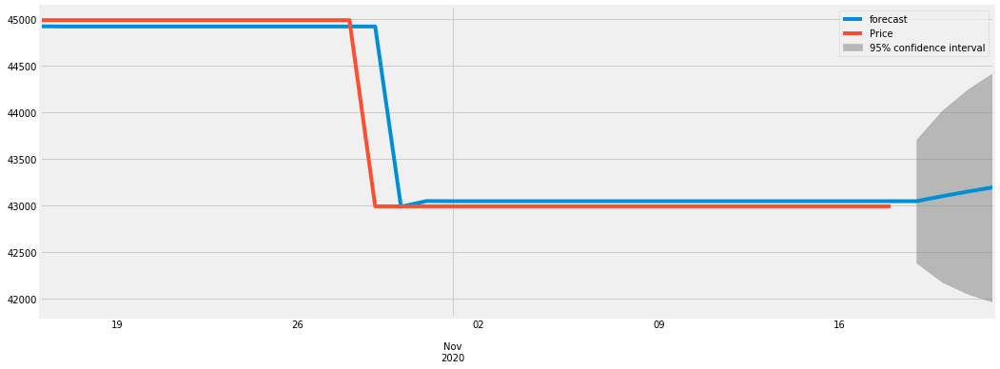

0.9962423354996416
2020-10-16    44923.515114
2020-10-17    44921.559899
2020-10-18    44921.622926
2020-10-19    44921.620954
2020-10-20    44921.621016
2020-10-21    44921.621014
2020-10-22    44921.621014
2020-10-23    44921.621014
2020-10-24    44921.621014
2020-10-25    44921.621014
2020-10-26    44921.621014
2020-10-27    44921.621014
2020-10-28    44921.621014
2020-10-29    44921.621014
2020-10-30    42986.390073
2020-10-31    43046.990781
2020-11-01    43045.093103
2020-11-02    43045.152527
2020-11-03    43045.150666
2020-11-04    43045.150725
2020-11-05    43045.150723
2020-11-06    43045.150723
2020-11-07    43045.150723
2020-11-08    43045.150723
2020-11-09    43045.150723
2020-11-10    43045.150723
2020-11-11    43045.150723
2020-11-12    43045.150723
2020-11-13    43045.150723
2020-11-14    43045.150723
2020-11-15    43045.150723
2020-11-16    43045.150723
2020-11-17    43045.150723
2020-11-18    43045.150723
2020-11-19    43045.150723
2020-11-20    43098.515416
2020-11-2

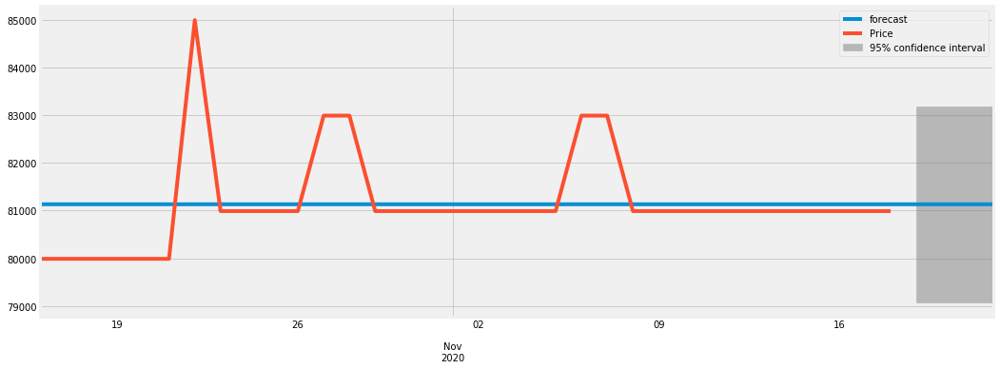

1.6978957562141517e-06
2020-10-16    81132.925630
2020-10-17    81132.923682
2020-10-18    81132.921734
2020-10-19    81132.919787
2020-10-20    81132.917839
2020-10-21    81132.915891
2020-10-22    81132.913944
2020-10-23    81132.920517
2020-10-24    81132.920273
2020-10-25    81132.920029
2020-10-26    81132.919786
2020-10-27    81132.919542
2020-10-28    81132.922707
2020-10-29    81132.925872
2020-10-30    81132.925628
2020-10-31    81132.925385
2020-11-01    81132.925141
2020-11-02    81132.924898
2020-11-03    81132.924654
2020-11-04    81132.924410
2020-11-05    81132.924167
2020-11-06    81132.923923
2020-11-07    81132.927088
2020-11-08    81132.930253
2020-11-09    81132.930009
2020-11-10    81132.929765
2020-11-11    81132.929522
2020-11-12    81132.929278
2020-11-13    81132.929035
2020-11-14    81132.928791
2020-11-15    81132.928548
2020-11-16    81132.928304
2020-11-17    81132.928060
2020-11-18    81132.927817
2020-11-19    81132.927801
2020-11-20    81132.927801
2020-

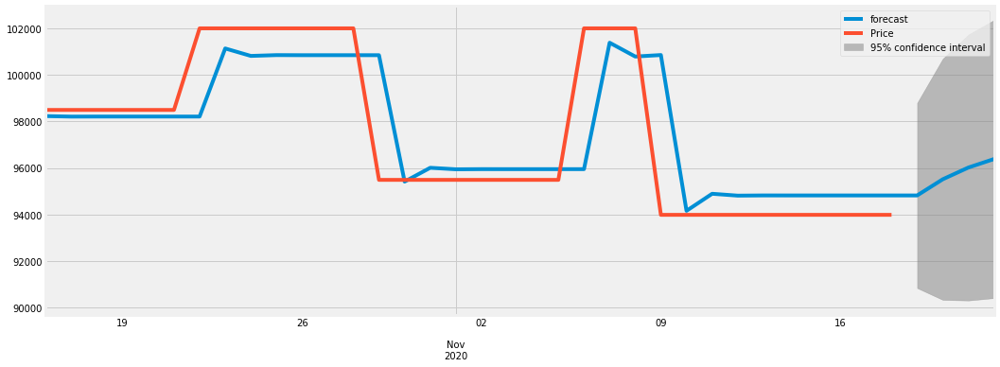

0.9440121367502647
2020-10-16     98226.125404
2020-10-17     98204.072067
2020-10-18     98206.686223
2020-10-19     98206.402838
2020-10-20     98206.433873
2020-10-21     98206.430478
2020-10-22     98206.430849
2020-10-23    101126.898107
2020-10-24    100807.386006
2020-10-25    100842.342050
2020-10-26    100838.517703
2020-10-27    100838.936104
2020-10-28    100838.890329
2020-10-29    100838.895337
2020-10-30     95415.169807
2020-10-31     96008.549491
2020-11-01     95943.631116
2020-11-02     95950.733474
2020-11-03     95949.956445
2020-11-04     95950.041455
2020-11-05     95950.032155
2020-11-06     95950.033172
2020-11-07    101373.758043
2020-11-08    100780.378431
2020-11-09    100845.296799
2020-11-10     94162.840616
2020-11-11     94893.931030
2020-11-12     94813.946488
2020-11-13     94822.697153
2020-11-14     94821.739791
2020-11-15     94821.844531
2020-11-16     94821.833072
2020-11-17     94821.834325
2020-11-18     94821.834188
2020-11-19     94821.834203
2

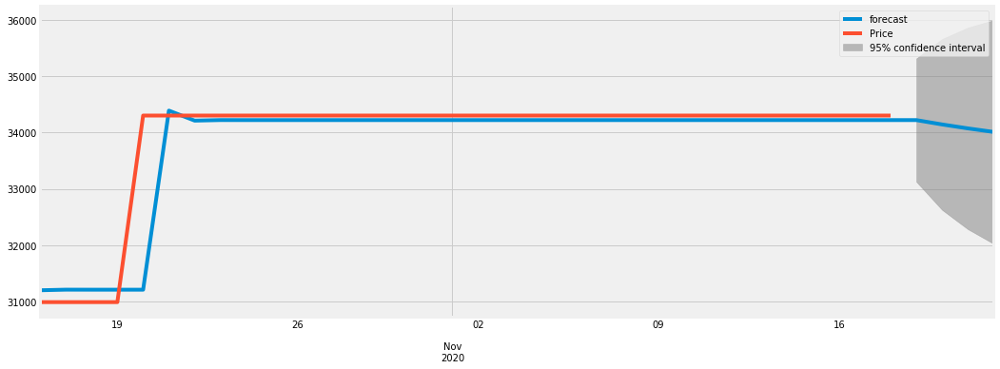

0.9907215491551915
2020-10-16    31200.099764
2020-10-17    31210.788722
2020-10-18    31210.161372
2020-10-19    31210.196310
2020-10-20    31210.194358
2020-10-21    34386.523409
2020-10-22    34209.123820
2020-10-23    34219.031677
2020-10-24    34218.478318
2020-10-25    34218.509223
2020-10-26    34218.507497
2020-10-27    34218.507594
2020-10-28    34218.507588
2020-10-29    34218.507589
2020-10-30    34218.507589
2020-10-31    34218.507589
2020-11-01    34218.507589
2020-11-02    34218.507589
2020-11-03    34218.507589
2020-11-04    34218.507589
2020-11-05    34218.507589
2020-11-06    34218.507589
2020-11-07    34218.507589
2020-11-08    34218.507589
2020-11-09    34218.507589
2020-11-10    34218.507589
2020-11-11    34218.507589
2020-11-12    34218.507589
2020-11-13    34218.507589
2020-11-14    34218.507589
2020-11-15    34218.507589
2020-11-16    34218.507589
2020-11-17    34218.507589
2020-11-18    34218.507589
2020-11-19    34218.507589
2020-11-20    34141.242440
2020-11-2

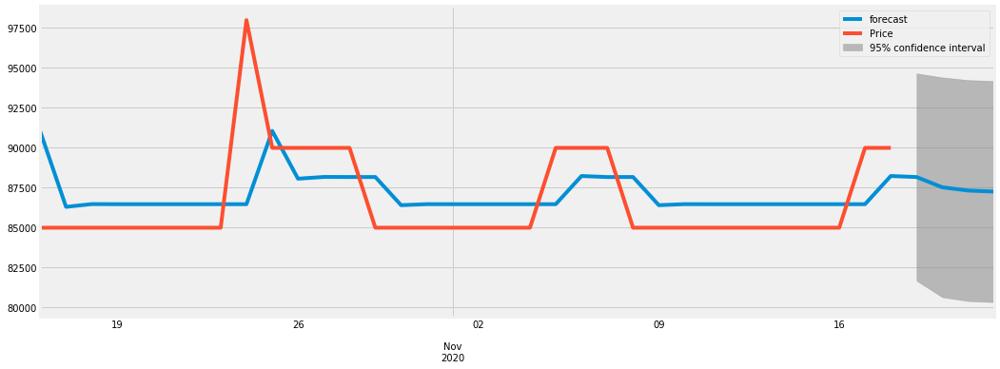

0.573827094176827
2020-10-16    91010.031859
2020-10-17    86295.723454
2020-10-18    86469.625482
2020-10-19    86463.209195
2020-10-20    86463.445930
2020-10-21    86463.437195
2020-10-22    86463.437518
2020-10-23    86463.437506
2020-10-24    86463.437506
2020-10-25    91051.526489
2020-10-26    88058.805331
2020-10-27    88169.224544
2020-10-28    88165.150526
2020-10-29    88165.300840
2020-10-30    86400.645685
2020-10-31    86465.754269
2020-11-01    86463.352027
2020-11-02    86463.440660
2020-11-03    86463.437390
2020-11-04    86463.437511
2020-11-05    86463.437506
2020-11-06    88228.087115
2020-11-07    88162.978737
2020-11-08    88165.380970
2020-11-09    86400.642729
2020-11-10    86465.754378
2020-11-11    86463.352023
2020-11-12    86463.440660
2020-11-13    86463.437390
2020-11-14    86463.437511
2020-11-15    86463.437506
2020-11-16    86463.437506
2020-11-17    86463.437506
2020-11-18    88228.087115
2020-11-19    88162.978737
2020-11-20    87520.570499
2020-11-21

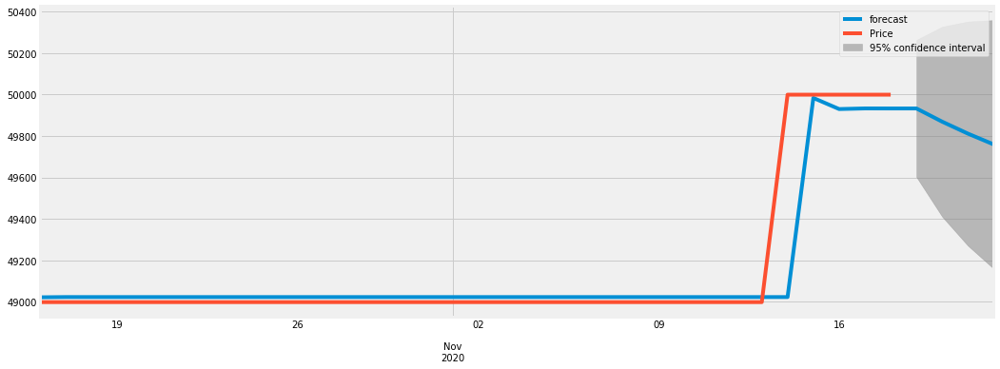

0.9915902605250525
2020-10-16    49022.263892
2020-10-17    49023.445707
2020-10-18    49023.376457
2020-10-19    49023.380308
2020-10-20    49023.380093
2020-10-21    49023.380105
2020-10-22    49023.380104
2020-10-23    49023.380104
2020-10-24    49023.380104
2020-10-25    49023.380104
2020-10-26    49023.380104
2020-10-27    49023.380104
2020-10-28    49023.380104
2020-10-29    49023.380104
2020-10-30    49023.380104
2020-10-31    49023.380104
2020-11-01    49023.380104
2020-11-02    49023.380104
2020-11-03    49023.380104
2020-11-04    49023.380104
2020-11-05    49023.380104
2020-11-06    49023.380104
2020-11-07    49023.380104
2020-11-08    49023.380104
2020-11-09    49023.380104
2020-11-10    49023.380104
2020-11-11    49023.380104
2020-11-12    49023.380104
2020-11-13    49023.380104
2020-11-14    49023.380104
2020-11-15    49983.275351
2020-11-16    49929.747668
2020-11-17    49932.732590
2020-11-18    49932.566139
2020-11-19    49932.575421
2020-11-20    49868.814266
2020-11-2

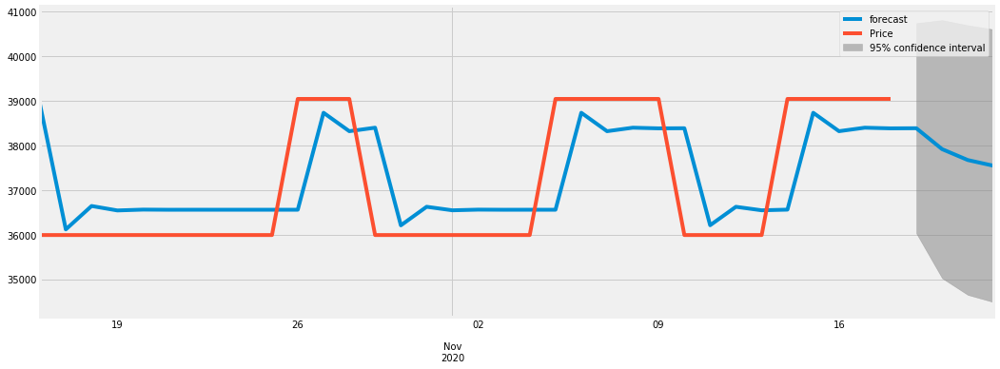

0.8561252431453432
2020-10-16    38915.477163
2020-10-17    36116.101842
2020-10-18    36640.347349
2020-10-19    36540.635997
2020-10-20    36559.596806
2020-10-21    36555.990769
2020-10-22    36556.676563
2020-10-23    36556.546139
2020-10-24    36556.570943
2020-10-25    36556.566225
2020-10-26    36556.567123
2020-10-27    38729.111834
2020-10-28    38315.937249
2020-10-29    38394.514798
2020-10-30    36207.026036
2020-10-31    36623.042681
2020-11-01    36543.924629
2020-11-02    36558.971302
2020-11-03    36556.109725
2020-11-04    36556.653940
2020-11-05    36556.550441
2020-11-06    38729.115006
2020-11-07    38315.936646
2020-11-08    38394.514912
2020-11-09    38379.570897
2020-11-10    38382.412950
2020-11-11    36209.327566
2020-11-12    36622.604976
2020-11-13    36544.007872
2020-11-14    36558.955470
2020-11-15    38728.657618
2020-11-16    38316.023632
2020-11-17    38394.498369
2020-11-18    38379.574043
2020-11-19    38382.412351
2020-11-20    37914.025354
2020-11-2

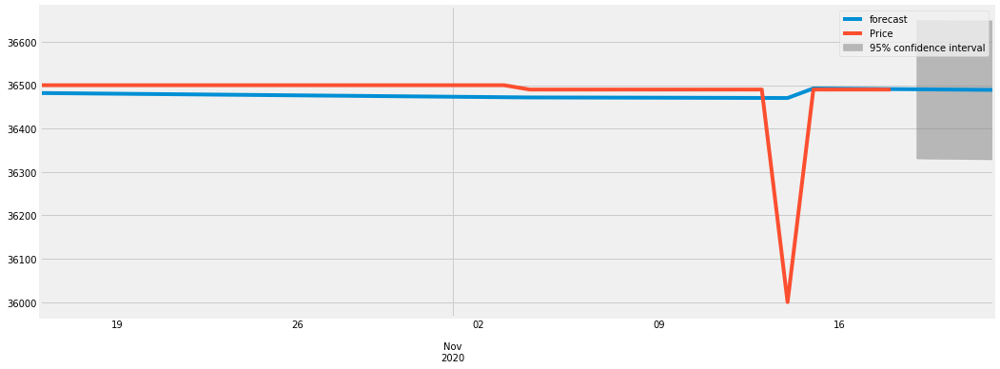

-0.07245153778116031
2020-10-16    36481.981083
2020-10-17    36481.445368
2020-10-18    36480.909653
2020-10-19    36480.373938
2020-10-20    36479.838223
2020-10-21    36479.302508
2020-10-22    36478.766793
2020-10-23    36478.231079
2020-10-24    36477.695364
2020-10-25    36477.159649
2020-10-26    36476.623934
2020-10-27    36476.088219
2020-10-28    36475.552504
2020-10-29    36475.016789
2020-10-30    36474.481074
2020-10-31    36473.945360
2020-11-01    36473.409645
2020-11-02    36472.873930
2020-11-03    36472.338215
2020-11-04    36471.802500
2020-11-05    36471.689632
2020-11-06    36471.572423
2020-11-07    36471.451111
2020-11-08    36471.325916
2020-11-09    36471.197046
2020-11-10    36471.064690
2020-11-11    36470.929028
2020-11-12    36470.790226
2020-11-13    36470.648438
2020-11-14    36470.503811
2020-11-15    36492.562269
2020-11-16    36492.063408
2020-11-17    36491.572888
2020-11-18    36491.090328
2020-11-19    36490.631732
2020-11-20    36490.134421
2020-11

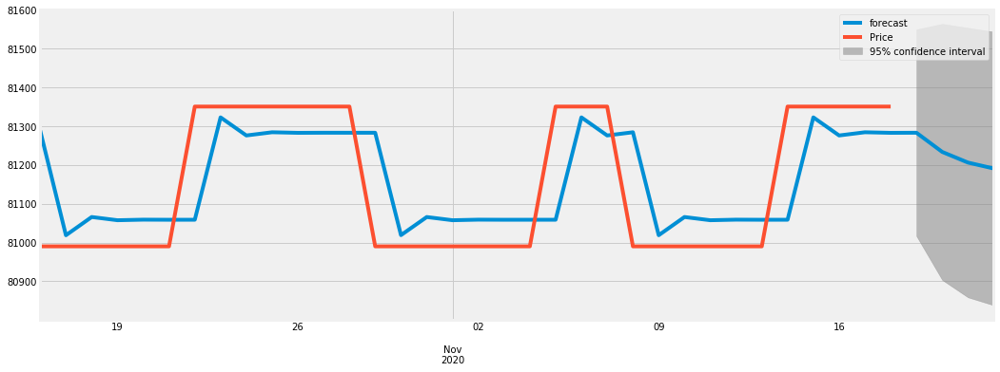

0.872629824854555
2020-10-16    81289.253523
2020-10-17    81018.635140
2020-10-18    81065.779514
2020-10-19    81057.440637
2020-10-20    81058.915096
2020-10-21    81058.654351
2020-10-22    81058.700460
2020-10-23    81323.113563
2020-10-24    81276.355261
2020-10-25    81284.623909
2020-10-26    81283.161697
2020-10-27    81283.420272
2020-10-28    81283.374546
2020-10-29    81283.382632
2020-10-30    81018.959946
2020-10-31    81065.719942
2020-11-01    81057.450995
2020-11-02    81058.913260
2020-11-03    81058.654675
2020-11-04    81058.700403
2020-11-05    81058.692317
2020-11-06    81323.115003
2020-11-07    81276.355006
2020-11-08    81284.623954
2020-11-09    81018.740433
2020-11-10    81065.758760
2020-11-11    81057.444130
2020-11-12    81058.914473
2020-11-13    81058.654461
2020-11-14    81058.700441
2020-11-15    81323.113566
2020-11-16    81276.355260
2020-11-17    81284.623909
2020-11-18    81283.161697
2020-11-19    81283.420272
2020-11-20    81233.874500
2020-11-21

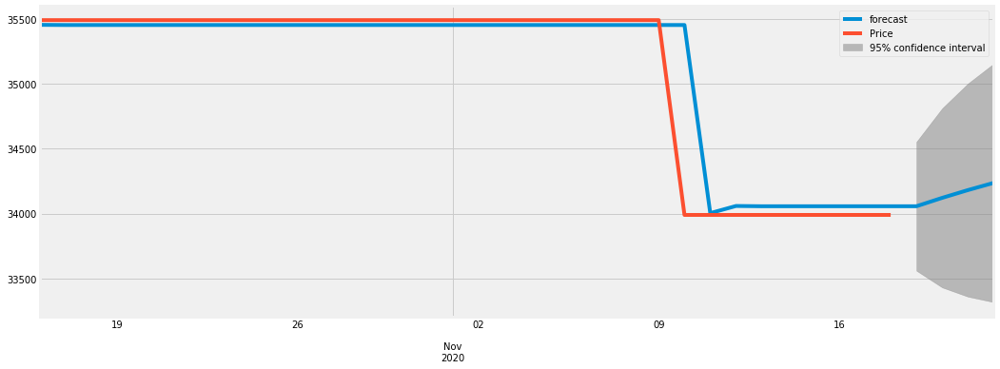

0.9951545350291097
2020-10-16    35453.657469
2020-10-17    35452.372083
2020-10-18    35452.422616
2020-10-19    35452.420700
2020-10-20    35452.420773
2020-10-21    35452.420770
2020-10-22    35452.420770
2020-10-23    35452.420770
2020-10-24    35452.420770
2020-10-25    35452.420770
2020-10-26    35452.420770
2020-10-27    35452.420770
2020-10-28    35452.420770
2020-10-29    35452.420770
2020-10-30    35452.420770
2020-10-31    35452.420770
2020-11-01    35452.420770
2020-11-02    35452.420770
2020-11-03    35452.420770
2020-11-04    35452.420770
2020-11-05    35452.420770
2020-11-06    35452.420770
2020-11-07    35452.420770
2020-11-08    35452.420770
2020-11-09    35452.420770
2020-11-10    35452.420770
2020-11-11    34003.909715
2020-11-12    34058.910718
2020-11-13    34056.822290
2020-11-14    34056.901589
2020-11-15    34056.898578
2020-11-16    34056.898693
2020-11-17    34056.898688
2020-11-18    34056.898689
2020-11-19    34056.898689
2020-11-20    34121.501015
2020-11-2

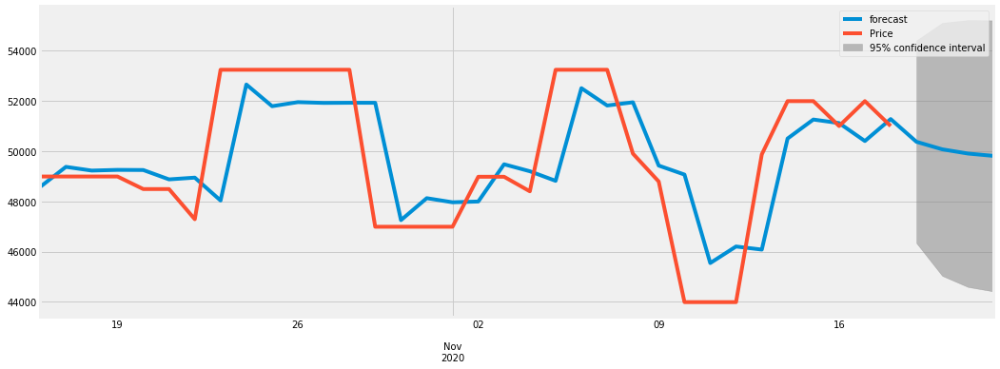

0.8774961876269121
2020-10-16    48574.892681
2020-10-17    49373.748107
2020-10-18    49225.530776
2020-10-19    49253.222735
2020-10-20    49248.041042
2020-10-21    48875.211755
2020-10-22    48944.964403
2020-10-23    48034.797494
2020-10-24    52651.790015
2020-10-25    51787.996641
2020-10-26    51949.603789
2020-10-27    51919.368699
2020-10-28    51925.025384
2020-10-29    51923.967074
2020-10-30    47253.176507
2020-10-31    48127.034960
2020-11-01    47963.544736
2020-11-02    47994.132131
2020-11-03    49476.128363
2020-11-04    49198.861610
2020-11-05    48817.128968
2020-11-06    52505.423579
2020-11-07    51815.380345
2020-11-08    51944.480570
2020-11-09    49424.847075
2020-11-10    49066.412322
2020-11-11    45545.004370
2020-11-12    46203.824770
2020-11-13    46080.566027
2020-11-14    50500.246832
2020-11-15    51257.527411
2020-11-16    51115.847748
2020-11-17    50401.485578
2020-11-18    51276.004659
2020-11-19    50371.521813
2020-11-20    50071.640494
2020-11-2

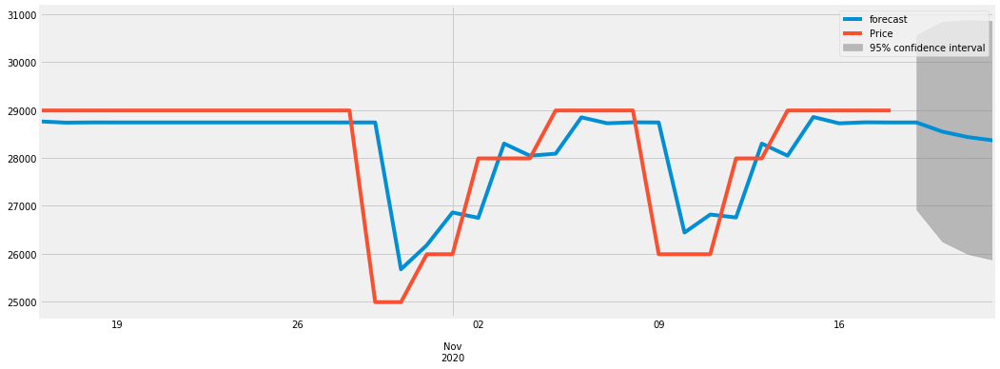

0.89502010050002
2020-10-16    28761.800704
2020-10-17    28736.452074
2020-10-18    28741.058519
2020-10-19    28740.318553
2020-10-20    28740.439979
2020-10-21    28740.420122
2020-10-22    28740.423371
2020-10-23    28740.422840
2020-10-24    28740.422927
2020-10-25    28740.422912
2020-10-26    28740.422915
2020-10-27    28740.422914
2020-10-28    28740.422914
2020-10-29    28740.422914
2020-10-30    25675.994320
2020-10-31    26177.369066
2020-11-01    26861.445706
2020-11-02    26749.523127
2020-11-03    28300.049208
2020-11-04    28046.365823
2020-11-05    28087.871258
2020-11-06    28847.187654
2020-11-07    28722.955011
2020-11-08    28743.280859
2020-11-09    28739.955323
2020-11-10    26442.177972
2020-11-11    26818.120011
2020-11-12    26756.611695
2020-11-13    28298.889439
2020-11-14    28046.555574
2020-11-15    28853.947361
2020-11-16    28721.849047
2020-11-17    28743.461807
2020-11-18    28739.925718
2020-11-19    28740.504261
2020-11-20    28549.269136
2020-11-21 

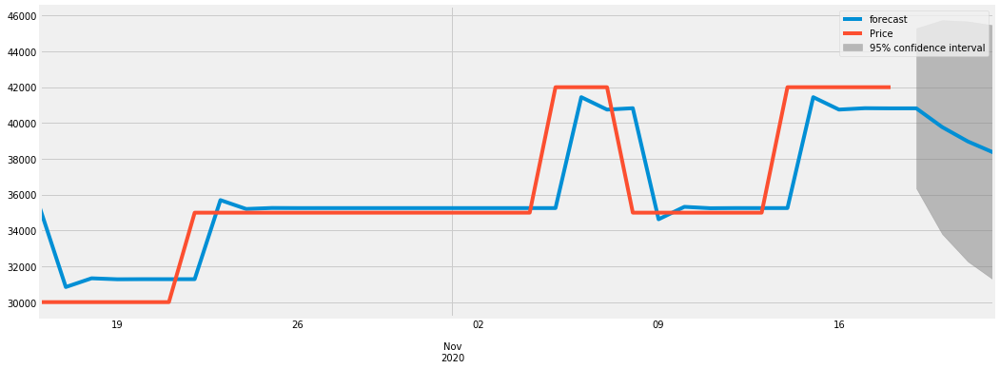

0.961376850179914
2020-10-16    35227.375748
2020-10-17    30842.102129
2020-10-18    31328.826065
2020-10-19    31274.261748
2020-10-20    31280.377435
2020-10-21    31279.691952
2020-10-22    31279.768784
2020-10-23    35691.005150
2020-10-24    35196.568825
2020-10-25    35251.988045
2020-10-26    35245.776346
2020-10-27    35246.472588
2020-10-28    35246.394549
2020-10-29    35246.403296
2020-10-30    35246.402316
2020-10-31    35246.402426
2020-11-01    35246.402413
2020-11-02    35246.402415
2020-11-03    35246.402415
2020-11-04    35246.402415
2020-11-05    35246.402415
2020-11-06    41434.521621
2020-11-07    40740.922217
2020-11-08    40818.664761
2020-11-09    34621.831731
2020-11-10    35316.407830
2020-11-11    35238.555812
2020-11-12    35247.281906
2020-11-13    35246.303836
2020-11-14    35246.413464
2020-11-15    41434.520382
2020-11-16    40740.922355
2020-11-17    40818.664746
2020-11-18    40809.950939
2020-11-19    40810.927632
2020-11-20    39768.498106
2020-11-21

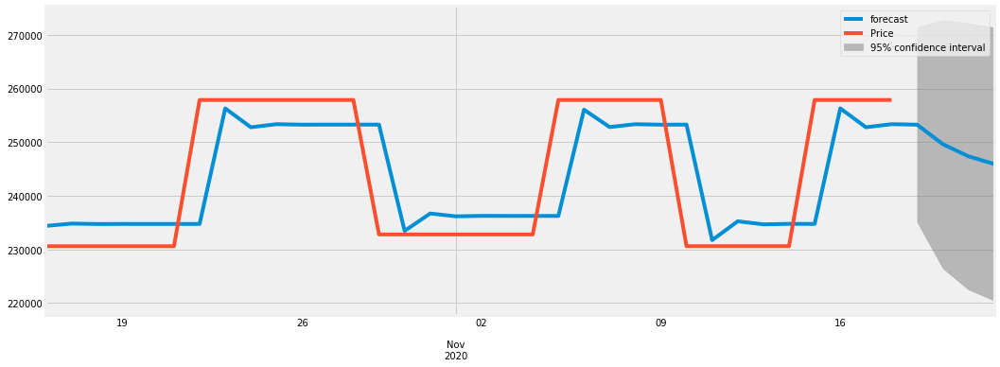

0.9079565375347364
2020-10-16    234379.807472
2020-10-17    234811.898483
2020-10-18    234733.293383
2020-10-19    234745.894936
2020-10-20    234743.830115
2020-10-21    234744.167252
2020-10-22    234744.112173
2020-10-23    256297.302957
2020-10-24    252776.423722
2020-10-25    253351.586384
2020-10-26    253257.629146
2020-10-27    253272.977783
2020-10-28    253270.470465
2020-10-29    253270.880055
2020-10-30    233456.109816
2020-10-31    236693.004704
2020-11-01    236164.233066
2020-11-02    236250.611974
2020-11-03    236236.501316
2020-11-04    236238.806401
2020-11-05    236238.429847
2020-11-06    256053.194689
2020-11-07    252816.300683
2020-11-08    253345.072177
2020-11-09    253258.693292
2020-11-10    253272.803946
2020-11-11    231724.429034
2020-11-12    235244.521559
2020-11-13    234669.487412
2020-11-14    234763.423656
2020-11-15    234748.078449
2020-11-16    256296.655035
2020-11-17    252776.529565
2020-11-18    253351.569094
2020-11-19    253257.631971
2

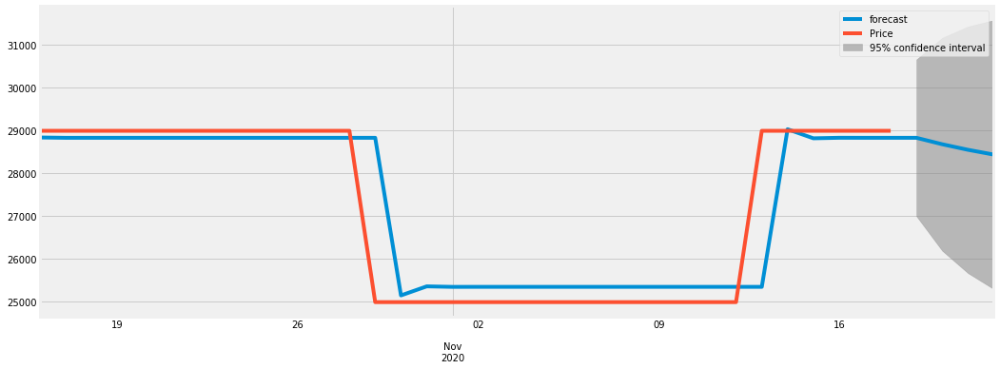

0.9830536853019944
2020-10-16    28833.912329
2020-10-17    28826.080629
2020-10-18    28826.552993
2020-10-19    28826.525941
2020-10-20    28826.527495
2020-10-21    28826.527406
2020-10-22    28826.527411
2020-10-23    28826.527411
2020-10-24    28826.527411
2020-10-25    28826.527411
2020-10-26    28826.527411
2020-10-27    28826.527411
2020-10-28    28826.527411
2020-10-29    28826.527411
2020-10-30    25146.819615
2020-10-31    25358.156825
2020-11-01    25346.019063
2020-11-02    25346.716173
2020-11-03    25346.676136
2020-11-04    25346.678435
2020-11-05    25346.678303
2020-11-06    25346.678311
2020-11-07    25346.678310
2020-11-08    25346.678310
2020-11-09    25346.678310
2020-11-10    25346.678310
2020-11-11    25346.678310
2020-11-12    25346.678310
2020-11-13    25346.678310
2020-11-14    29026.386107
2020-11-15    28815.048896
2020-11-16    28827.186658
2020-11-17    28826.489548
2020-11-18    28826.529585
2020-11-19    28826.527286
2020-11-20    28676.144463
2020-11-2

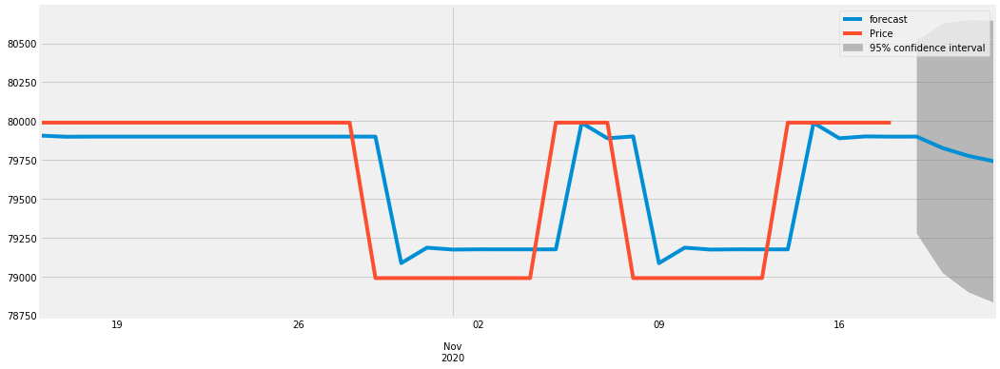

0.9307896819341355
2020-10-16    79906.733692
2020-10-17    79899.214378
2020-10-18    79900.215483
2020-10-19    79900.094571
2020-10-20    79900.109357
2020-10-21    79900.107552
2020-10-22    79900.107772
2020-10-23    79900.107745
2020-10-24    79900.107749
2020-10-25    79900.107748
2020-10-26    79900.107748
2020-10-27    79900.107748
2020-10-28    79900.107748
2020-10-29    79900.107748
2020-10-30    79086.156270
2020-10-31    79185.560791
2020-11-01    79173.420929
2020-11-02    79174.903520
2020-11-03    79174.722457
2020-11-04    79174.744569
2020-11-05    79174.741869
2020-11-06    79988.693677
2020-11-07    79889.289116
2020-11-08    79901.428983
2020-11-09    79085.994913
2020-11-10    79185.580497
2020-11-11    79173.418522
2020-11-12    79174.903814
2020-11-13    79174.722421
2020-11-14    79174.744574
2020-11-15    79988.693347
2020-11-16    79889.289156
2020-11-17    79901.428978
2020-11-18    79899.946392
2020-11-19    79900.127454
2020-11-20    79826.953450
2020-11-2

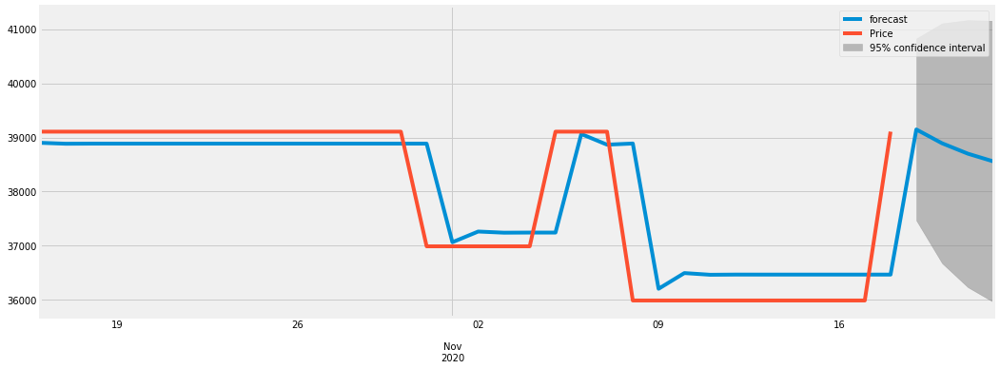

0.9529050992109581
2020-10-16    38901.461889
2020-10-17    38883.999810
2020-10-18    38886.047967
2020-10-19    38885.828562
2020-10-20    38885.852307
2020-10-21    38885.849740
2020-10-22    38885.850017
2020-10-23    38885.849987
2020-10-24    38885.849991
2020-10-25    38885.849990
2020-10-26    38885.849990
2020-10-27    38885.849990
2020-10-28    38885.849990
2020-10-29    38885.849990
2020-10-30    38885.849990
2020-10-31    38885.849990
2020-11-01    37066.031784
2020-11-02    37262.783932
2020-11-03    37241.511803
2020-11-04    37243.811668
2020-11-05    37243.563015
2020-11-06    39063.408104
2020-11-07    38866.653051
2020-11-08    38887.925494
2020-11-09    36206.186129
2020-11-10    36496.126068
2020-11-11    36464.778812
2020-11-12    36468.167964
2020-11-13    36467.801541
2020-11-14    36467.841158
2020-11-15    36467.836874
2020-11-16    36467.837337
2020-11-17    36467.837287
2020-11-18    36467.837293
2020-11-19    39147.276757
2020-11-20    38892.208233
2020-11-2

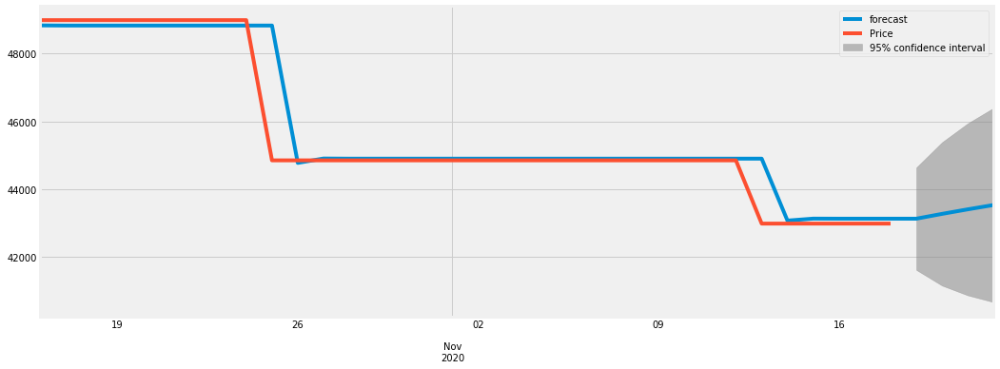

0.9974782450560005
2020-10-16    48834.799503
2020-10-17    48830.111061
2020-10-18    48830.264682
2020-10-19    48830.259801
2020-10-20    48830.259956
2020-10-21    48830.259951
2020-10-22    48830.259951
2020-10-23    48830.259951
2020-10-24    48830.259951
2020-10-25    48830.259951
2020-10-26    44780.318875
2020-10-27    44909.127836
2020-10-28    44905.031048
2020-10-29    44905.161347
2020-10-30    44905.157203
2020-10-31    44905.157335
2020-11-01    44905.157331
2020-11-02    44905.157331
2020-11-03    44905.157331
2020-11-04    44905.157331
2020-11-05    44905.157331
2020-11-06    44905.157331
2020-11-07    44905.157331
2020-11-08    44905.157331
2020-11-09    44905.157331
2020-11-10    44905.157331
2020-11-11    44905.157331
2020-11-12    44905.157331
2020-11-13    44905.157331
2020-11-14    43078.521271
2020-11-15    43136.617695
2020-11-16    43134.769930
2020-11-17    43134.828698
2020-11-18    43134.826829
2020-11-19    43134.826888
2020-11-20    43276.674616
2020-11-2

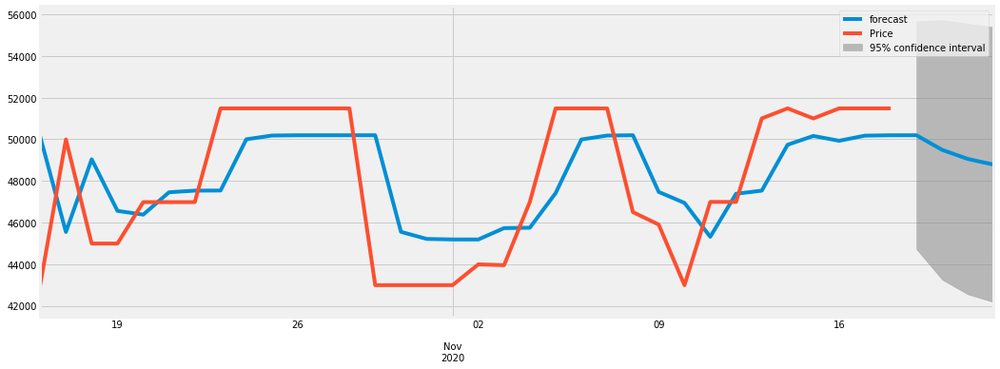

0.8134538620577741
2020-10-16    50133.255866
2020-10-17    45545.781275
2020-10-18    49037.343582
2020-10-19    46559.723462
2020-10-20    46378.583262
2020-10-21    47453.029098
2020-10-22    47531.582443
2020-10-23    47537.325523
2020-10-24    49998.983600
2020-10-25    50178.956821
2020-10-26    50192.114765
2020-10-27    50193.076750
2020-10-28    50193.147081
2020-10-29    50193.152223
2020-10-30    45551.070429
2020-10-31    45211.685192
2020-11-01    45186.872545
2020-11-02    45185.058478
2020-11-03    45730.956710
2020-11-04    45749.551119
2020-11-05    47412.505975
2020-11-06    49989.857972
2020-11-07    50178.289641
2020-11-08    50192.065987
2020-11-09    47469.477817
2020-11-10    46942.481387
2020-11-11    45313.412038
2020-11-12    47380.619599
2020-11-13    47531.754318
2020-11-14    49734.579384
2020-11-15    50159.626078
2020-11-16    49926.704582
2020-11-17    50173.672461
2020-11-18    50191.728423
2020-11-19    50193.048504
2020-11-20    49488.086634
2020-11-2

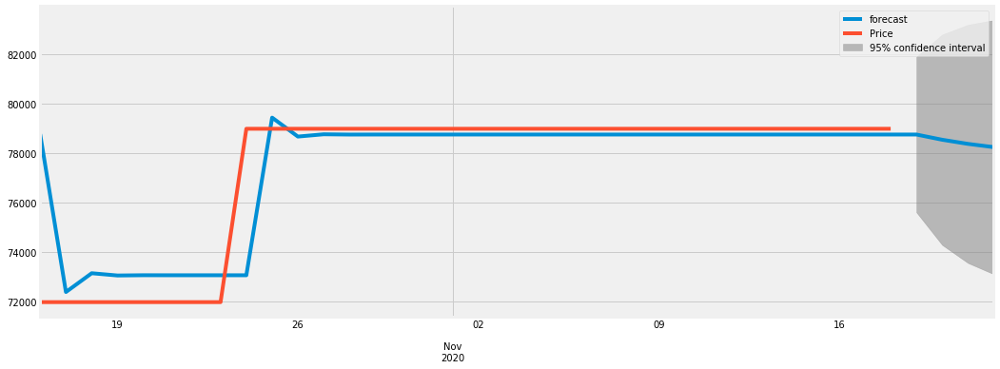

0.9662446488238545
2020-10-16    78776.289918
2020-10-17    72397.495637
2020-10-18    73156.305614
2020-10-19    73065.079319
2020-10-20    73076.045718
2020-10-21    73074.727399
2020-10-22    73074.885880
2020-10-23    73074.866828
2020-10-24    73074.869118
2020-10-25    79440.899088
2020-10-26    78675.612798
2020-10-27    78767.610968
2020-10-28    78756.551494
2020-10-29    78757.880999
2020-10-30    78757.721174
2020-10-31    78757.740387
2020-11-01    78757.738077
2020-11-02    78757.738355
2020-11-03    78757.738321
2020-11-04    78757.738325
2020-11-05    78757.738325
2020-11-06    78757.738325
2020-11-07    78757.738325
2020-11-08    78757.738325
2020-11-09    78757.738325
2020-11-10    78757.738325
2020-11-11    78757.738325
2020-11-12    78757.738325
2020-11-13    78757.738325
2020-11-14    78757.738325
2020-11-15    78757.738325
2020-11-16    78757.738325
2020-11-17    78757.738325
2020-11-18    78757.738325
2020-11-19    78757.738325
2020-11-20    78546.511918
2020-11-2

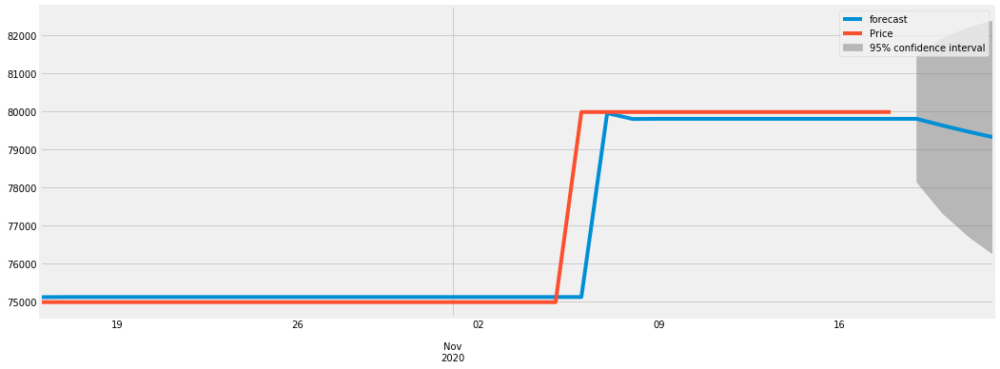

0.9961683965401915
2020-10-16    75120.323180
2020-10-17    75124.245851
2020-10-18    75124.116223
2020-10-19    75124.120377
2020-10-20    75124.120244
2020-10-21    75124.120248
2020-10-22    75124.120248
2020-10-23    75124.120248
2020-10-24    75124.120248
2020-10-25    75124.120248
2020-10-26    75124.120248
2020-10-27    75124.120248
2020-10-28    75124.120248
2020-10-29    75124.120248
2020-10-30    75124.120248
2020-10-31    75124.120248
2020-11-01    75124.120248
2020-11-02    75124.120248
2020-11-03    75124.120248
2020-11-04    75124.120248
2020-11-05    75124.120248
2020-11-06    75124.120248
2020-11-07    79961.129321
2020-11-08    79805.956166
2020-11-09    79810.934182
2020-11-10    79810.774486
2020-11-11    79810.779609
2020-11-12    79810.779444
2020-11-13    79810.779450
2020-11-14    79810.779449
2020-11-15    79810.779449
2020-11-16    79810.779449
2020-11-17    79810.779449
2020-11-18    79810.779449
2020-11-19    79810.779449
2020-11-20    79637.401164
2020-11-2

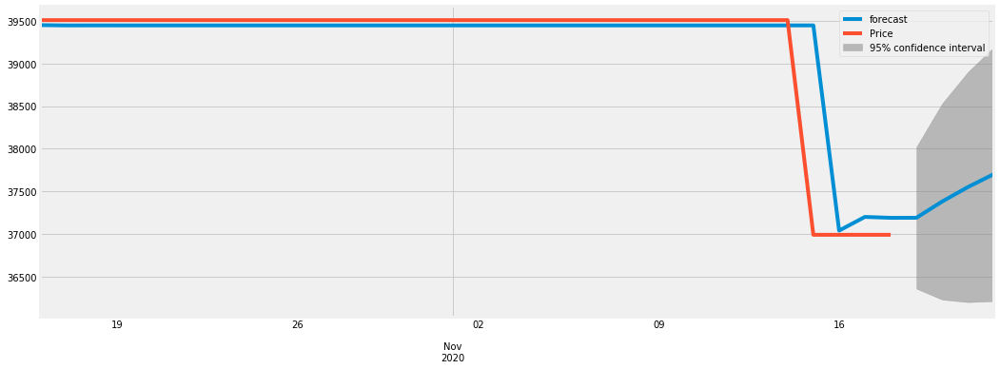

0.9891410744493541
2020-10-16    39450.452325
2020-10-17    39446.941879
2020-10-18    39447.190206
2020-10-19    39447.173699
2020-10-20    39447.174801
2020-10-21    39447.174728
2020-10-22    39447.174733
2020-10-23    39447.174732
2020-10-24    39447.174732
2020-10-25    39447.174732
2020-10-26    39447.174732
2020-10-27    39447.174732
2020-10-28    39447.174732
2020-10-29    39447.174732
2020-10-30    39447.174732
2020-10-31    39447.174732
2020-11-01    39447.174732
2020-11-02    39447.174732
2020-11-03    39447.174732
2020-11-04    39447.174732
2020-11-05    39447.174732
2020-11-06    39447.174732
2020-11-07    39447.174732
2020-11-08    39447.174732
2020-11-09    39447.174732
2020-11-10    39447.174732
2020-11-11    39447.174732
2020-11-12    39447.174732
2020-11-13    39447.174732
2020-11-14    39447.174732
2020-11-15    39447.174732
2020-11-16    37039.101182
2020-11-17    37199.813966
2020-11-18    37189.088131
2020-11-19    37189.803964
2020-11-20    37380.761605
2020-11-2

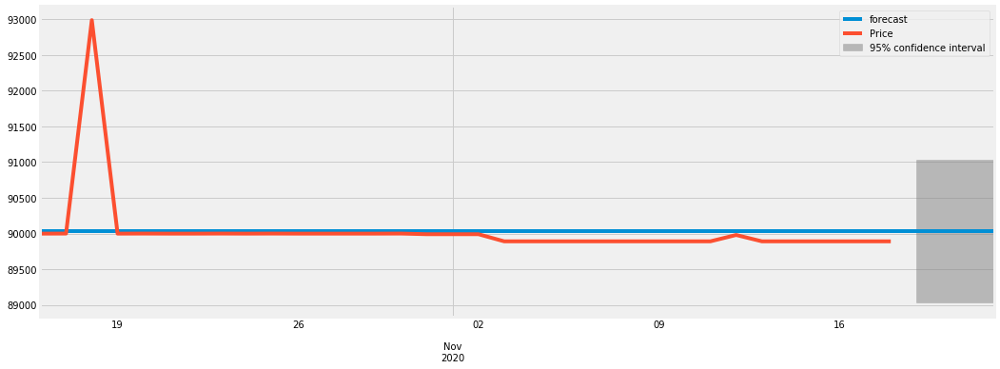

-3.057852726584542e-08
2020-10-16    90036.203285
2020-10-17    90036.203285
2020-10-18    90036.203285
2020-10-19    90036.203285
2020-10-20    90036.203285
2020-10-21    90036.203285
2020-10-22    90036.203285
2020-10-23    90036.203285
2020-10-24    90036.203285
2020-10-25    90036.203285
2020-10-26    90036.203285
2020-10-27    90036.203285
2020-10-28    90036.203285
2020-10-29    90036.203285
2020-10-30    90036.203285
2020-10-31    90036.203285
2020-11-01    90036.203285
2020-11-02    90036.203285
2020-11-03    90036.203285
2020-11-04    90036.203285
2020-11-05    90036.203285
2020-11-06    90036.203285
2020-11-07    90036.203285
2020-11-08    90036.203285
2020-11-09    90036.203285
2020-11-10    90036.203285
2020-11-11    90036.203285
2020-11-12    90036.203285
2020-11-13    90036.203285
2020-11-14    90036.203285
2020-11-15    90036.203285
2020-11-16    90036.203285
2020-11-17    90036.203285
2020-11-18    90036.203285
2020-11-19    90036.203285
2020-11-20    90036.203285
2020-

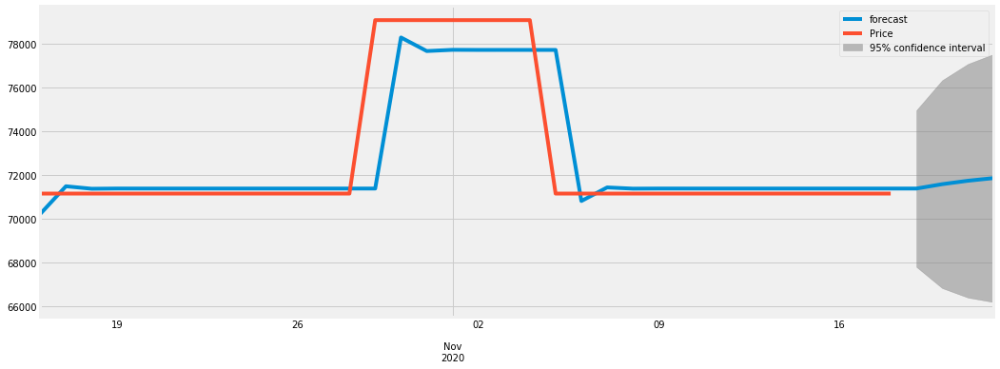

0.9618132101356648
2020-10-16    70211.032090
2020-10-17    71484.877340
2020-10-18    71370.949194
2020-10-19    71381.177302
2020-10-20    71380.258933
2020-10-21    71380.341392
2020-10-22    71380.333988
2020-10-23    71380.334653
2020-10-24    71380.334593
2020-10-25    71380.334598
2020-10-26    71380.334598
2020-10-27    71380.334598
2020-10-28    71380.334598
2020-10-29    71380.334598
2020-10-30    78304.784860
2020-10-31    77683.052006
2020-11-01    77738.876184
2020-11-02    77733.863840
2020-11-03    77734.313888
2020-11-04    77734.273479
2020-11-05    77734.277108
2020-11-06    70809.826520
2020-11-07    71431.559403
2020-11-08    71375.735223
2020-11-09    71380.747567
2020-11-10    71380.297518
2020-11-11    71380.337927
2020-11-12    71380.334299
2020-11-13    71380.334625
2020-11-14    71380.334595
2020-11-15    71380.334598
2020-11-16    71380.334598
2020-11-17    71380.334598
2020-11-18    71380.334598
2020-11-19    71380.334598
2020-11-20    71580.956040
2020-11-2

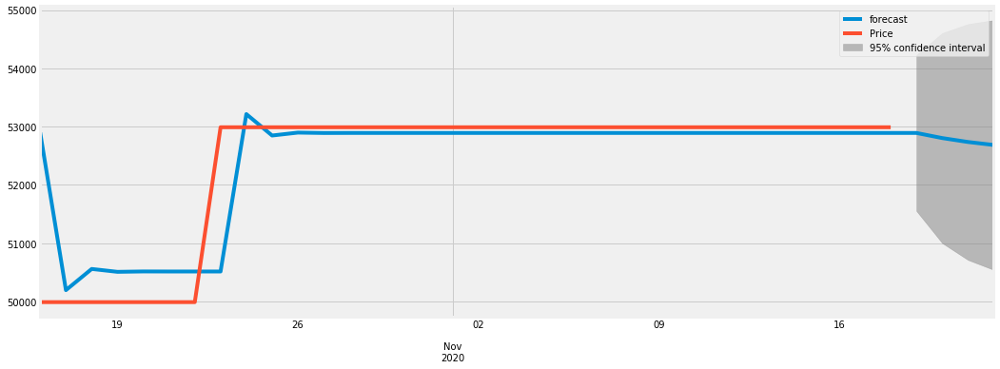

0.959179528622309
2020-10-16    52900.726286
2020-10-17    50195.706006
2020-10-18    50558.896022
2020-10-19    50509.485161
2020-10-20    50516.206232
2020-10-21    50515.291956
2020-10-22    50515.416325
2020-10-23    50515.399407
2020-10-24    53215.629824
2020-10-25    52848.316060
2020-10-26    52898.281944
2020-10-27    52891.485059
2020-10-28    52892.409643
2020-10-29    52892.283871
2020-10-30    52892.300980
2020-10-31    52892.298653
2020-11-01    52892.298969
2020-11-02    52892.298926
2020-11-03    52892.298932
2020-11-04    52892.298931
2020-11-05    52892.298931
2020-11-06    52892.298931
2020-11-07    52892.298931
2020-11-08    52892.298931
2020-11-09    52892.298931
2020-11-10    52892.298931
2020-11-11    52892.298931
2020-11-12    52892.298931
2020-11-13    52892.298931
2020-11-14    52892.298931
2020-11-15    52892.298931
2020-11-16    52892.298931
2020-11-17    52892.298931
2020-11-18    52892.298931
2020-11-19    52892.298931
2020-11-20    52804.360540
2020-11-21

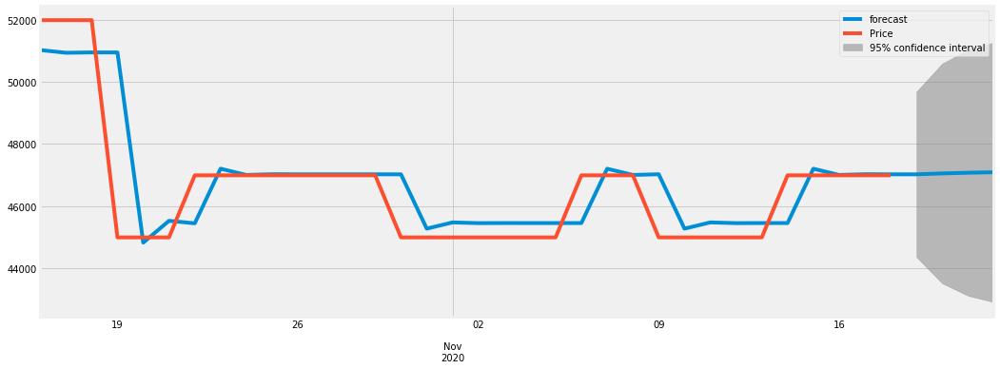

0.9541941967129034
2020-10-16    51026.588769
2020-10-17    50938.846740
2020-10-18    50949.818941
2020-10-19    50948.574382
2020-10-20    44822.221345
2020-10-21    45524.455154
2020-10-22    45443.961534
2020-10-23    47203.615518
2020-10-24    47001.915006
2020-10-25    47025.034947
2020-10-26    47022.384822
2020-10-27    47022.688593
2020-10-28    47022.653773
2020-10-29    47022.657764
2020-10-30    47022.657306
2020-10-31    45272.229965
2020-11-01    45472.872871
2020-11-02    45449.874158
2020-11-03    45452.510388
2020-11-04    45452.208210
2020-11-05    45452.242847
2020-11-06    45452.238877
2020-11-07    47202.666726
2020-11-08    47002.023761
2020-11-09    47025.022481
2020-11-10    45271.958856
2020-11-11    45472.903947
2020-11-12    45449.870596
2020-11-13    45452.510797
2020-11-14    45452.208163
2020-11-15    47202.670247
2020-11-16    47002.023358
2020-11-17    47025.022527
2020-11-18    47022.386245
2020-11-19    47022.688429
2020-11-20    47051.263153
2020-11-2

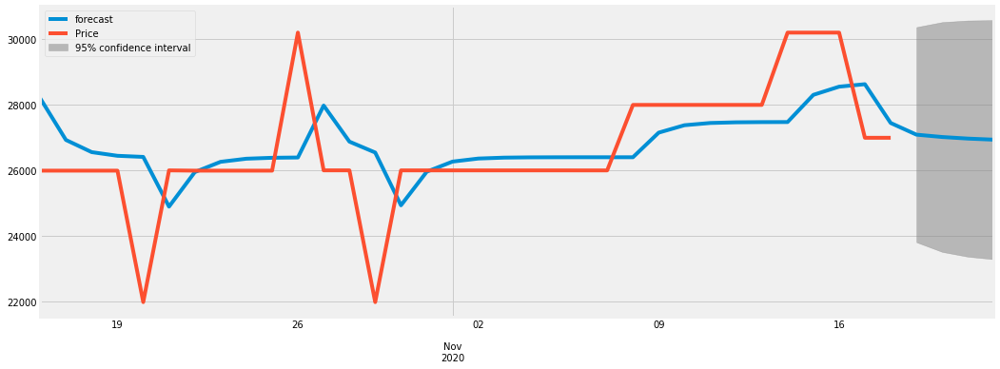

0.6720475381586359
2020-10-16    28193.795203
2020-10-17    26924.078014
2020-10-18    26553.223439
2020-10-19    26441.912632
2020-10-20    26408.393494
2020-10-21    24895.411995
2020-10-22    25945.370172
2020-10-23    26258.764537
2020-10-24    26353.204517
2020-10-25    26381.663579
2020-10-26    26390.239589
2020-10-27    27970.848842
2020-10-28    26872.514887
2020-10-29    26541.536900
2020-10-30    24935.535826
2020-10-31    25957.461270
2020-11-01    26265.413897
2020-11-02    26358.214033
2020-11-03    26386.178936
2020-11-04    26394.606033
2020-11-05    26397.145501
2020-11-06    26397.910758
2020-11-07    26397.765645
2020-11-08    26397.721915
2020-11-09    27146.519130
2020-11-10    27372.165796
2020-11-11    27440.163401
2020-11-12    27460.654173
2020-11-13    27466.828975
2020-11-14    27468.689724
2020-11-15    28295.834929
2020-11-16    28545.091409
2020-11-17    28620.203726
2020-11-18    27440.533790
2020-11-19    27085.045571
2020-11-20    27013.631342
2020-11-2

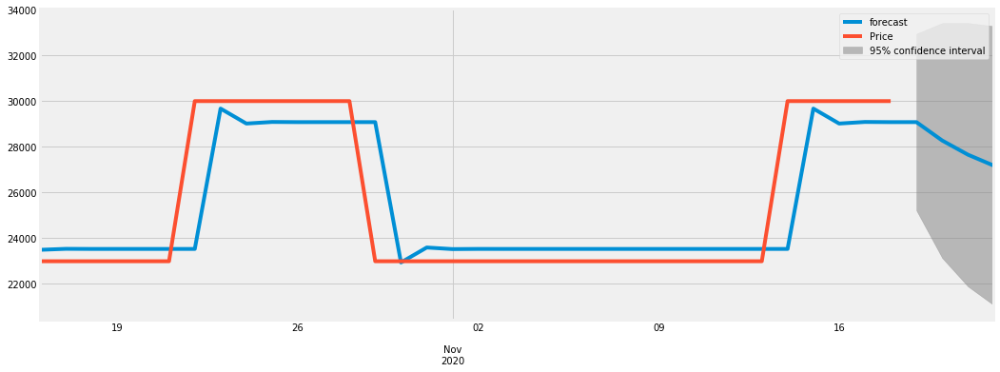

0.9605244614930043
2020-10-16    23489.920349
2020-10-17    23532.634204
2020-10-18    23527.688146
2020-10-19    23528.211027
2020-10-20    23528.155187
2020-10-21    23528.161144
2020-10-22    23528.160508
2020-10-23    29672.579684
2020-10-24    29017.036375
2020-10-25    29086.975781
2020-10-26    29079.514000
2020-10-27    29080.310092
2020-10-28    29080.225158
2020-10-29    29080.234219
2020-10-30    22935.814145
2020-10-31    23591.357549
2020-11-01    23521.418133
2020-11-02    23528.879915
2020-11-03    23528.083823
2020-11-04    23528.168757
2020-11-05    23528.159696
2020-11-06    23528.160663
2020-11-07    23528.160560
2020-11-08    23528.160571
2020-11-09    23528.160569
2020-11-10    23528.160569
2020-11-11    23528.160569
2020-11-12    23528.160569
2020-11-13    23528.160569
2020-11-14    23528.160569
2020-11-15    29672.579677
2020-11-16    29017.036376
2020-11-17    29086.975781
2020-11-18    29079.514000
2020-11-19    29080.310092
2020-11-20    28274.096735
2020-11-2

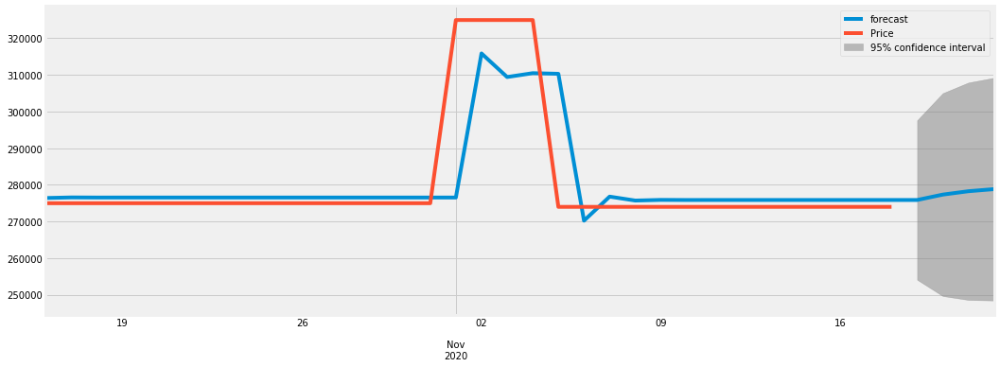

0.9052182412420069
2020-10-16    276405.473525
2020-10-17    276566.486567
2020-10-18    276537.141568
2020-10-19    276541.855778
2020-10-20    276541.081728
2020-10-21    276541.208374
2020-10-22    276541.187641
2020-10-23    276541.191034
2020-10-24    276541.190479
2020-10-25    276541.190570
2020-10-26    276541.190555
2020-10-27    276541.190557
2020-10-28    276541.190557
2020-10-29    276541.190557
2020-10-30    276541.190557
2020-10-31    276541.190557
2020-11-01    276541.190557
2020-11-02    315868.346255
2020-11-03    309430.631895
2020-11-04    310484.462650
2020-11-05    310311.954334
2020-11-06    270226.494515
2020-11-07    276788.340541
2020-11-08    275714.189877
2020-11-09    275890.024489
2020-11-10    275861.240993
2020-11-11    275865.952748
2020-11-12    275865.181451
2020-11-13    275865.307710
2020-11-14    275865.287041
2020-11-15    275865.290425
2020-11-16    275865.289871
2020-11-17    275865.289962
2020-11-18    275865.289947
2020-11-19    275865.289949
2

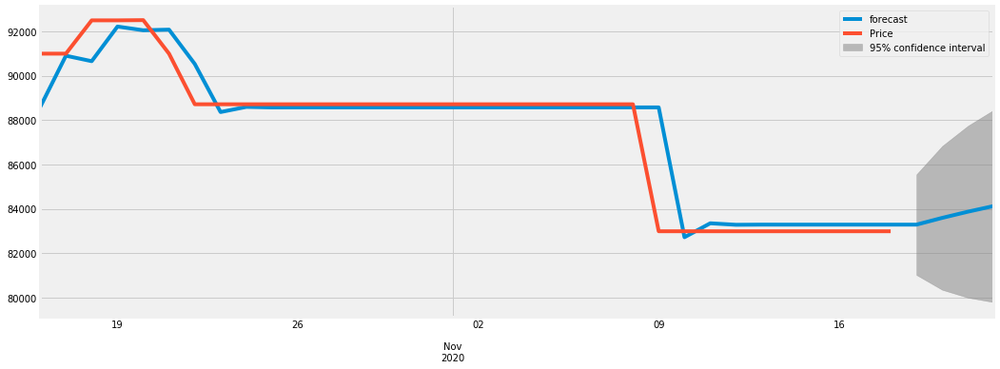

0.9936307462674148
2020-10-16    88580.877736
2020-10-17    90897.026547
2020-10-18    90650.766793
2020-10-19    92210.997302
2020-10-20    92043.386064
2020-10-21    92071.617267
2020-10-22    90524.584713
2020-10-23    88359.441018
2020-10-24    88592.036763
2020-10-25    88567.049608
2020-10-26    88569.733913
2020-10-27    88569.445545
2020-10-28    88569.476524
2020-10-29    88569.473196
2020-10-30    88569.473553
2020-10-31    88569.473515
2020-11-01    88569.473519
2020-11-02    88569.473518
2020-11-03    88569.473518
2020-11-04    88569.473518
2020-11-05    88569.473518
2020-11-06    88569.473518
2020-11-07    88569.473518
2020-11-08    88569.473518
2020-11-09    88569.473518
2020-11-10    82720.679764
2020-11-11    83349.000435
2020-11-12    83281.501583
2020-11-13    83288.752809
2020-11-14    83287.973828
2020-11-15    83288.057512
2020-11-16    83288.048522
2020-11-17    83288.049488
2020-11-18    83288.049384
2020-11-19    83288.049395
2020-11-20    83592.809786
2020-11-2

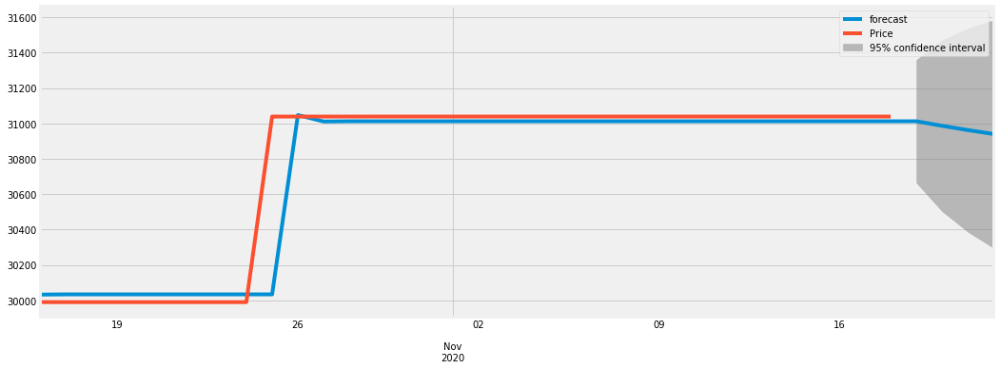

0.9953793250604563
2020-10-16    30032.448130
2020-10-17    30033.871580
2020-10-18    30033.818750
2020-10-19    30033.820645
2020-10-20    30033.820577
2020-10-21    30033.820579
2020-10-22    30033.820579
2020-10-23    30033.820579
2020-10-24    30033.820579
2020-10-25    30033.820579
2020-10-26    31047.450800
2020-10-27    31011.051645
2020-10-28    31012.358728
2020-10-29    31012.311791
2020-10-30    31012.313476
2020-10-31    31012.313416
2020-11-01    31012.313418
2020-11-02    31012.313418
2020-11-03    31012.313418
2020-11-04    31012.313418
2020-11-05    31012.313418
2020-11-06    31012.313418
2020-11-07    31012.313418
2020-11-08    31012.313418
2020-11-09    31012.313418
2020-11-10    31012.313418
2020-11-11    31012.313418
2020-11-12    31012.313418
2020-11-13    31012.313418
2020-11-14    31012.313418
2020-11-15    31012.313418
2020-11-16    31012.313418
2020-11-17    31012.313418
2020-11-18    31012.313418
2020-11-19    31012.313418
2020-11-20    30986.526644
2020-11-2

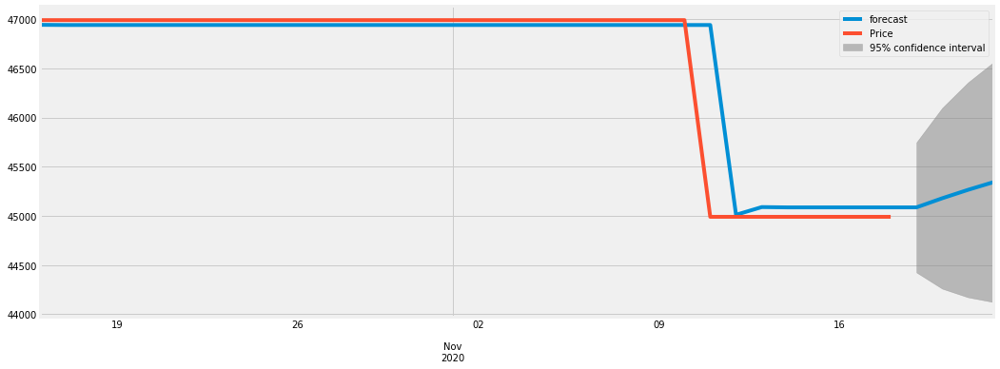

0.9946645947417774
2020-10-16    46942.161808
2020-10-17    46940.358221
2020-10-18    46940.434223
2020-10-19    46940.431142
2020-10-20    46940.431267
2020-10-21    46940.431262
2020-10-22    46940.431262
2020-10-23    46940.431262
2020-10-24    46940.431262
2020-10-25    46940.431262
2020-10-26    46940.431262
2020-10-27    46940.431262
2020-10-28    46940.431262
2020-10-29    46940.431262
2020-10-30    46940.431262
2020-10-31    46940.431262
2020-11-01    46940.431262
2020-11-02    46940.431262
2020-11-03    46940.431262
2020-11-04    46940.431262
2020-11-05    46940.431262
2020-11-06    46940.431262
2020-11-07    46940.431262
2020-11-08    46940.431262
2020-11-09    46940.431262
2020-11-10    46940.431262
2020-11-11    46940.431262
2020-11-12    45010.706322
2020-11-13    45089.069058
2020-11-14    45085.886885
2020-11-15    45086.016107
2020-11-16    45086.010860
2020-11-17    45086.011073
2020-11-18    45086.011064
2020-11-19    45086.011065
2020-11-20    45178.648538
2020-11-2

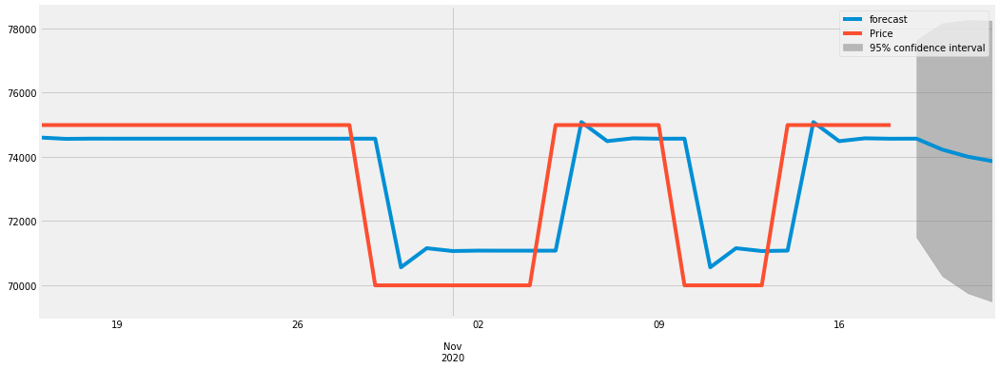

0.9175974134684312
2020-10-16    74601.002229
2020-10-17    74559.685500
2020-10-18    74566.467201
2020-10-19    74565.476548
2020-10-20    74565.623922
2020-10-21    74565.602057
2020-10-22    74565.605302
2020-10-23    74565.604821
2020-10-24    74565.604892
2020-10-25    74565.604882
2020-10-26    74565.604883
2020-10-27    74565.604883
2020-10-28    74565.604883
2020-10-29    74565.604883
2020-10-30    70552.613369
2020-10-31    71148.210215
2020-11-01    71059.813417
2020-11-02    71072.933019
2020-11-03    71070.985845
2020-11-04    71071.274839
2020-11-05    71071.231948
2020-11-06    75084.229827
2020-11-07    74488.632036
2020-11-08    74577.028975
2020-11-09    74563.909351
2020-11-10    74565.856529
2020-11-11    70552.576020
2020-11-12    71148.215759
2020-11-13    71059.812594
2020-11-14    71072.933142
2020-11-15    75083.977341
2020-11-16    74488.669509
2020-11-17    74577.023413
2020-11-18    74563.910177
2020-11-19    74565.856406
2020-11-20    74225.150624
2020-11-2

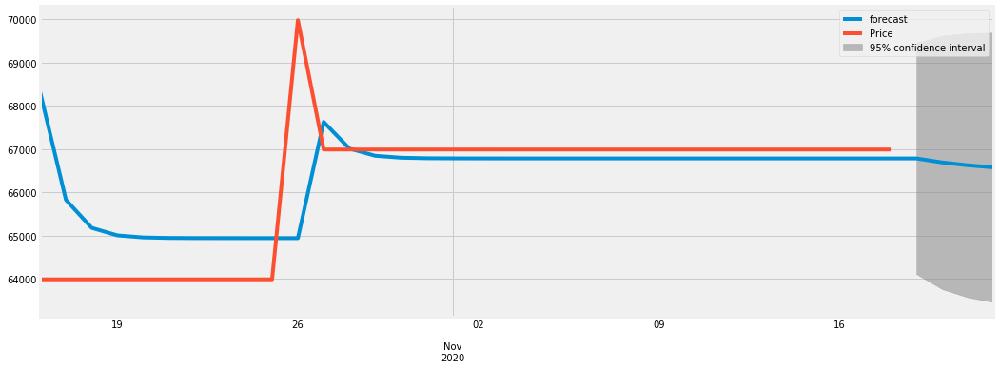

0.7657268080060837
2020-10-16    68315.610878
2020-10-17    65827.765982
2020-10-18    65179.780176
2020-10-19    65005.549835
2020-10-20    64958.542427
2020-10-21    64945.852845
2020-10-22    64942.426895
2020-10-23    64941.501925
2020-10-24    64941.252190
2020-10-25    64941.184764
2020-10-26    64941.166560
2020-10-27    67627.286169
2020-10-28    67011.698353
2020-10-29    66845.494231
2020-10-30    66800.620357
2020-10-31    66788.504746
2020-11-01    66785.233621
2020-11-02    66784.350442
2020-11-03    66784.111990
2020-11-04    66784.047610
2020-11-05    66784.030228
2020-11-06    66784.025535
2020-11-07    66784.024268
2020-11-08    66784.023925
2020-11-09    66784.023833
2020-11-10    66784.023808
2020-11-11    66784.023801
2020-11-12    66784.023800
2020-11-13    66784.023799
2020-11-14    66784.023799
2020-11-15    66784.023799
2020-11-16    66784.023799
2020-11-17    66784.023799
2020-11-18    66784.023799
2020-11-19    66784.023799
2020-11-20    66691.656900
2020-11-2

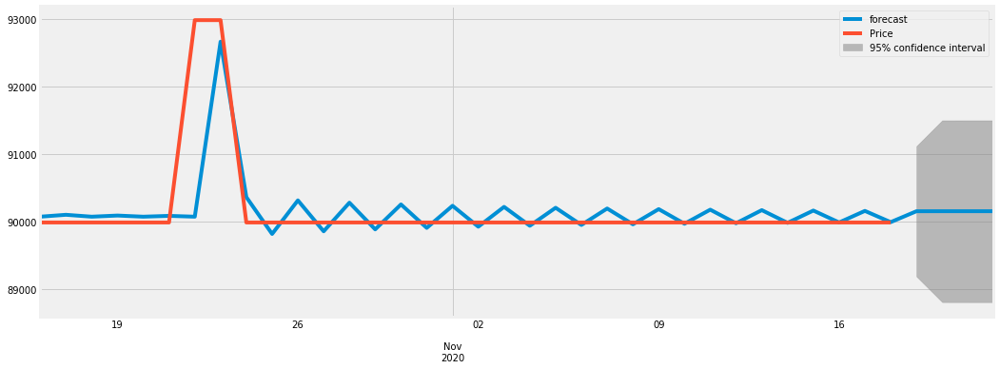

0.5409947738962331
2020-10-16    90075.789119
2020-10-17    90103.849139
2020-10-18    90075.789119
2020-10-19    90092.752396
2020-10-20    90075.789119
2020-10-21    90087.945127
2020-10-22    90075.789119
2020-10-23    92670.420130
2020-10-24    90365.764516
2020-10-25    89819.796977
2020-10-26    90317.665132
2020-10-27    89859.007424
2020-10-28    90283.252370
2020-10-29    89887.801573
2020-10-30    90257.412074
2020-10-31    89909.843405
2020-11-01    90237.295831
2020-11-02    89927.258813
2020-11-03    90221.191335
2020-11-04    89941.366035
2020-11-05    90208.007316
2020-11-06    89953.025929
2020-11-07    90197.015396
2020-11-08    89962.824508
2020-11-09    90187.710819
2020-11-10    89971.174523
2020-11-11    90179.732751
2020-11-12    89978.375085
2020-11-13    90172.816396
2020-11-14    89984.648257
2020-11-15    90166.763039
2020-11-16    89990.162364
2020-11-17    90161.420642
2020-11-18    89995.047318
2020-11-19    90156.530920
2020-11-20    90156.936588
2020-11-2

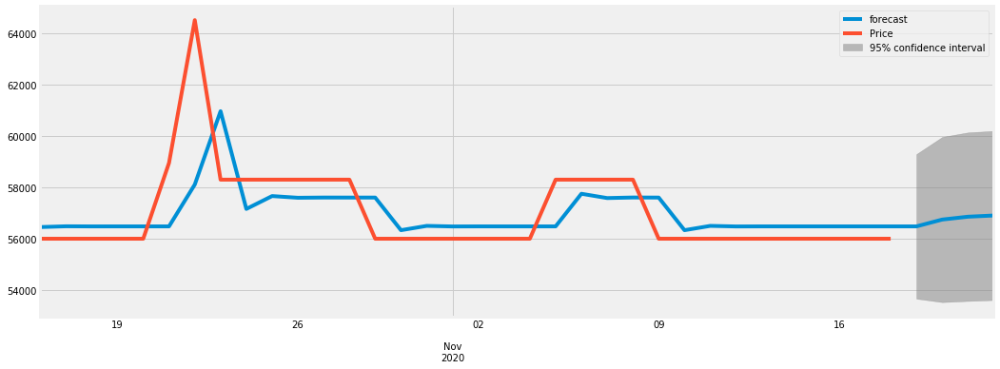

0.7621307397213946
2020-10-16    56443.687891
2020-10-17    56474.438579
2020-10-18    56470.110056
2020-10-19    56470.675617
2020-10-20    56470.600967
2020-10-21    56470.610807
2020-10-22    58100.017417
2020-10-23    60954.627497
2020-10-24    57149.403705
2020-10-25    57651.074546
2020-10-26    57584.935563
2020-10-27    57593.655155
2020-10-28    57592.505587
2020-10-29    57592.657143
2020-10-30    56322.681829
2020-10-31    56490.112083
2020-11-01    56468.038512
2020-11-02    56470.948635
2020-11-03    56470.564972
2020-11-04    56470.615553
2020-11-05    56470.608884
2020-11-06    57740.565096
2020-11-07    57573.137361
2020-11-08    57595.210600
2020-11-09    57592.300521
2020-11-10    56322.728845
2020-11-11    56490.105884
2020-11-12    56468.039329
2020-11-13    56470.948527
2020-11-14    56470.564986
2020-11-15    56470.615551
2020-11-16    56470.608884
2020-11-17    56470.609763
2020-11-18    56470.609647
2020-11-19    56470.609663
2020-11-20    56735.980445
2020-11-2

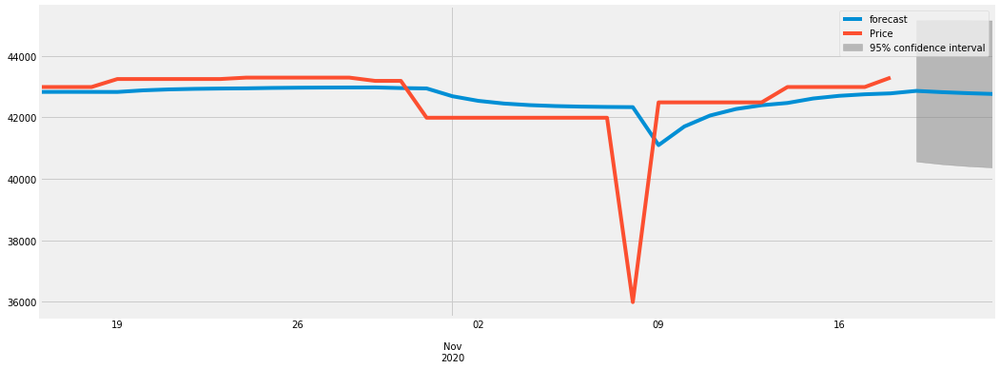

0.4325628595364768
2020-10-16    42830.380549
2020-10-17    42831.782819
2020-10-18    42830.472037
2020-10-19    42828.981665
2020-10-20    42881.450908
2020-10-21    42912.131111
2020-10-22    42930.141016
2020-10-23    42940.733143
2020-10-24    42946.968677
2020-10-25    42960.085778
2020-10-26    42967.815983
2020-10-27    42972.371821
2020-10-28    42975.056911
2020-10-29    42976.639459
2020-10-30    42955.809516
2020-10-31    42943.532395
2020-11-01    42689.926348
2020-11-02    42540.451563
2020-11-03    42452.351490
2020-11-04    42400.425521
2020-11-05    42369.820482
2020-11-06    42351.781946
2020-11-07    42341.150077
2020-11-08    42334.883679
2020-11-09    41099.340590
2020-11-10    41705.618333
2020-11-11    42062.956958
2020-11-12    42273.571473
2020-11-13    42397.707156
2020-11-14    42470.872425
2020-11-15    42616.649997
2020-11-16    42702.570943
2020-11-17    42753.212539
2020-11-18    42783.060572
2020-11-19    42863.477265
2020-11-20    42822.074168
2020-11-2

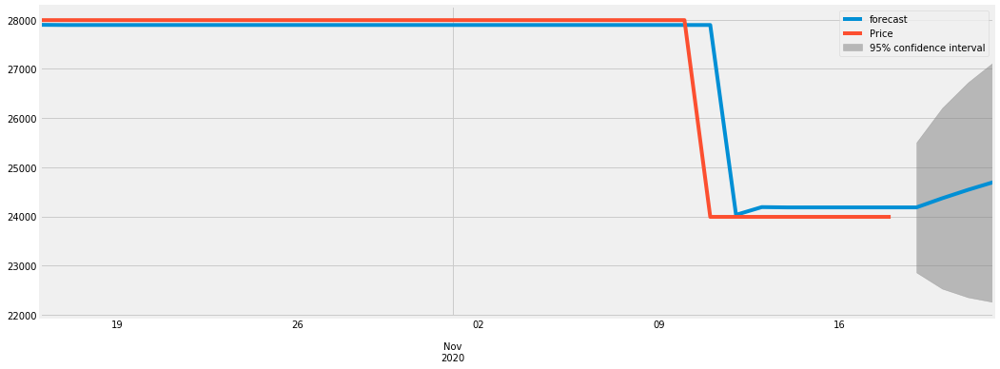

0.9946664393602713
2020-10-16    27894.541089
2020-10-17    27890.938146
2020-10-18    27891.090150
2020-10-19    27891.083980
2020-10-20    27891.084231
2020-10-21    27891.084221
2020-10-22    27891.084221
2020-10-23    27891.084221
2020-10-24    27891.084221
2020-10-25    27891.084221
2020-10-26    27891.084221
2020-10-27    27891.084221
2020-10-28    27891.084221
2020-10-29    27891.084221
2020-10-30    27891.084221
2020-10-31    27891.084221
2020-11-01    27891.084221
2020-11-02    27891.084221
2020-11-03    27891.084221
2020-11-04    27891.084221
2020-11-05    27891.084221
2020-11-06    27891.084221
2020-11-07    27891.084221
2020-11-08    27891.084221
2020-11-09    27891.084221
2020-11-10    27891.084221
2020-11-11    27891.084221
2020-11-12    24031.609174
2020-11-13    24188.514313
2020-11-14    24182.135409
2020-11-15    24182.394740
2020-11-16    24182.384197
2020-11-17    24182.384626
2020-11-18    24182.384608
2020-11-19    24182.384609
2020-11-20    24368.010509
2020-11-2

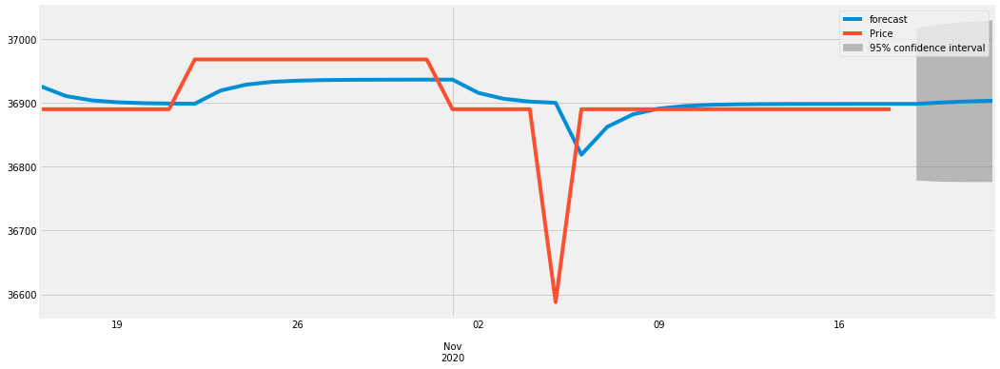

0.5245069685689596
2020-10-16    36926.341324
2020-10-17    36910.669367
2020-10-18    36903.927140
2020-10-19    36900.908041
2020-10-20    36899.542800
2020-10-21    36898.923741
2020-10-22    36898.642783
2020-10-23    36919.246296
2020-10-24    36928.602471
2020-10-25    36932.851181
2020-10-26    36934.780555
2020-10-27    36935.656699
2020-10-28    36936.054564
2020-10-29    36936.235238
2020-10-30    36936.317283
2020-10-31    36936.354540
2020-11-01    36936.371459
2020-11-02    36915.648144
2020-11-03    36906.237512
2020-11-04    36901.964066
2020-11-05    36900.023458
2020-11-06    36818.876037
2020-11-07    36862.292489
2020-11-08    36882.008263
2020-11-09    36890.961361
2020-11-10    36895.027038
2020-11-11    36896.873296
2020-11-12    36897.711697
2020-11-13    36898.092422
2020-11-14    36898.265312
2020-11-15    36898.343823
2020-11-16    36898.379476
2020-11-17    36898.395666
2020-11-18    36898.403018
2020-11-19    36898.406356
2020-11-20    36900.642131
2020-11-2

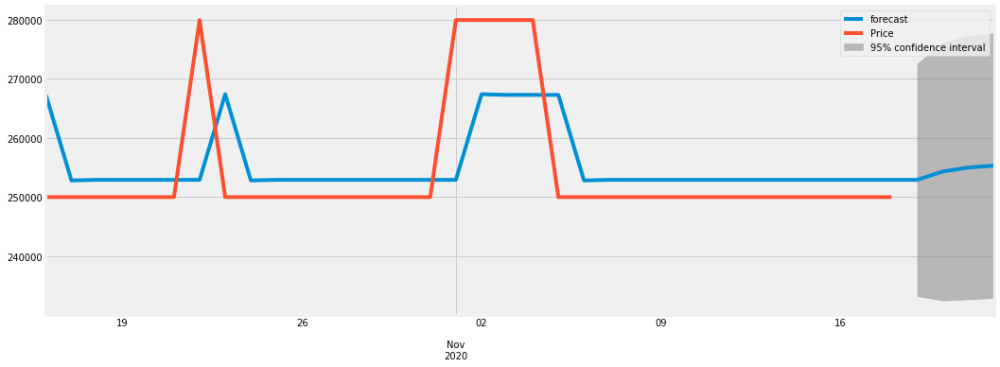

0.730655065765677
2020-10-16    267347.797718
2020-10-17    252806.290941
2020-10-18    252913.291048
2020-10-19    252912.503702
2020-10-20    252912.509496
2020-10-21    252912.509453
2020-10-22    252912.509453
2020-10-23    267409.225929
2020-10-24    252805.837326
2020-10-25    252913.294386
2020-10-26    252912.503678
2020-10-27    252912.509496
2020-10-28    252912.509453
2020-10-29    252912.509453
2020-10-30    252912.509453
2020-10-31    252912.509453
2020-11-01    252912.509453
2020-11-02    267409.225929
2020-11-03    267302.553802
2020-11-04    267303.338735
2020-11-05    267303.332959
2020-11-06    252806.616525
2020-11-07    252913.288652
2020-11-08    252912.503720
2020-11-09    252912.509496
2020-11-10    252912.509453
2020-11-11    252912.509453
2020-11-12    252912.509453
2020-11-13    252912.509453
2020-11-14    252912.509453
2020-11-15    252912.509453
2020-11-16    252912.509453
2020-11-17    252912.509453
2020-11-18    252912.509453
2020-11-19    252912.509453
20

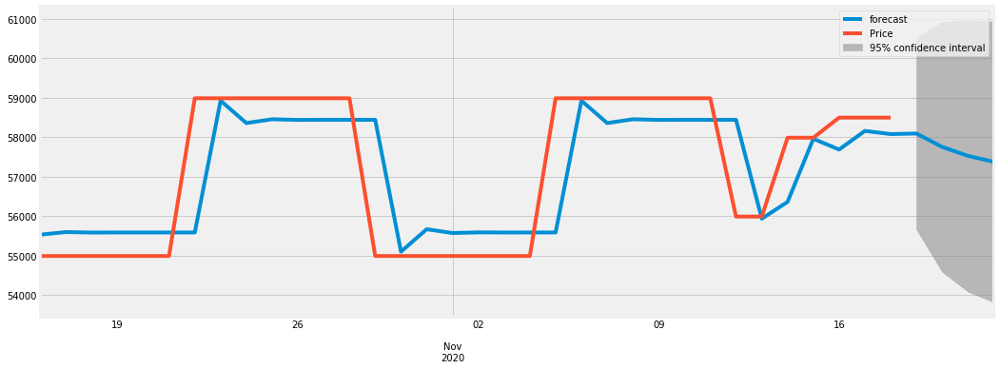

0.9254513005793819
2020-10-16    55530.419552
2020-10-17    55597.468679
2020-10-18    55584.656035
2020-10-19    55586.789211
2020-10-20    55586.425100
2020-10-21    55586.486990
2020-10-22    55586.476463
2020-10-23    58929.980152
2020-10-24    58361.318945
2020-10-25    58458.036520
2020-10-26    58441.586850
2020-10-27    58444.384600
2020-10-28    58443.908760
2020-10-29    58443.989691
2020-10-30    55100.474027
2020-10-31    55669.137271
2020-11-01    55572.419350
2020-11-02    55588.869079
2020-11-03    55586.071318
2020-11-04    55586.547160
2020-11-05    55586.466229
2020-11-06    58929.981893
2020-11-07    58361.318649
2020-11-08    58458.036570
2020-11-09    58441.586841
2020-11-10    58444.384602
2020-11-11    58443.908760
2020-11-12    58443.989691
2020-11-13    55936.349502
2020-11-14    56362.847520
2020-11-15    57962.059929
2020-11-16    57690.066792
2020-11-17    58162.623722
2020-11-18    58082.251508
2020-11-19    58095.921168
2020-11-20    57755.836655
2020-11-2

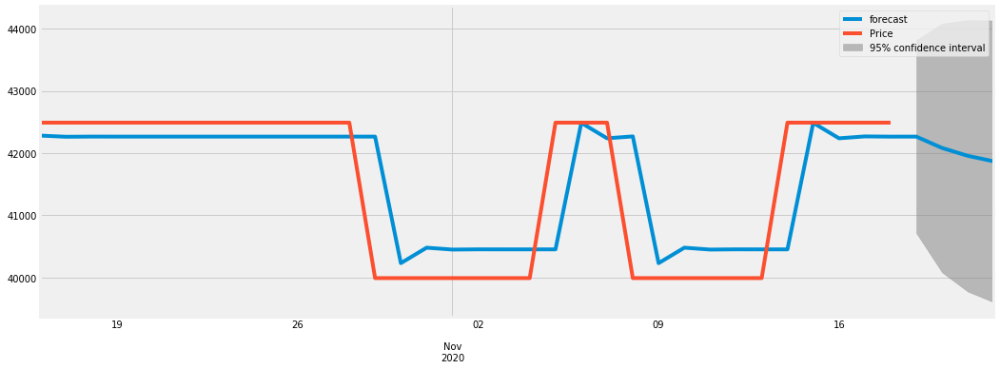

0.9307876901437369
2020-10-16    42281.888386
2020-10-17    42263.097146
2020-10-18    42265.598659
2020-10-19    42265.296563
2020-10-20    42265.333502
2020-10-21    42265.328992
2020-10-22    42265.329543
2020-10-23    42265.329476
2020-10-24    42265.329484
2020-10-25    42265.329483
2020-10-26    42265.329483
2020-10-27    42265.329483
2020-10-28    42265.329483
2020-10-29    42265.329483
2020-10-30    40230.472567
2020-10-31    40478.952437
2020-11-01    40448.610134
2020-11-02    40452.315284
2020-11-03    40451.862842
2020-11-04    40451.918091
2020-11-05    40451.911344
2020-11-06    42486.769084
2020-11-07    42238.289114
2020-11-08    42268.631429
2020-11-09    40230.069361
2020-11-10    40479.001673
2020-11-11    40448.604121
2020-11-12    40452.316019
2020-11-13    40451.862752
2020-11-14    40451.918102
2020-11-15    42486.768259
2020-11-16    42238.289214
2020-11-17    42268.631417
2020-11-18    42264.926278
2020-11-19    42265.378719
2020-11-20    42082.494604
2020-11-2

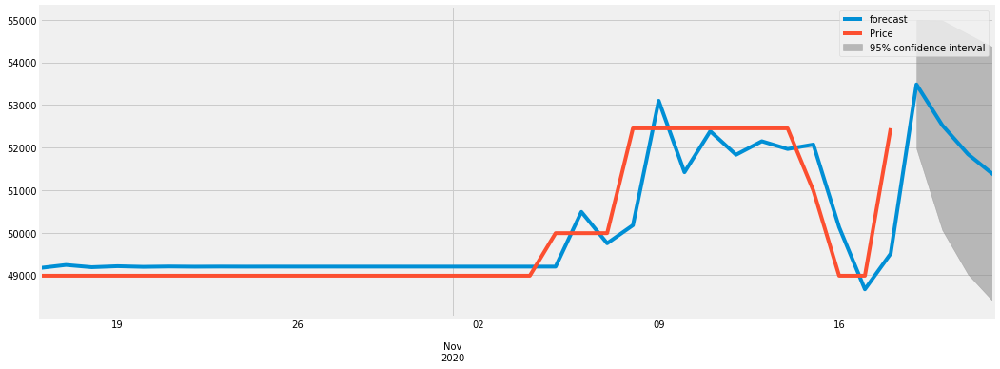

0.9195801723802836
2020-10-16    49172.368165
2020-10-17    49242.822056
2020-10-18    49190.266039
2020-10-19    49213.678717
2020-10-20    49198.768588
2020-10-21    49206.738781
2020-10-22    49201.992858
2020-10-23    49204.656612
2020-10-24    49203.108599
2020-10-25    49203.990685
2020-10-26    49203.482301
2020-10-27    49203.773406
2020-10-28    49203.606092
2020-10-29    49203.702050
2020-10-30    49203.646948
2020-10-31    49203.678567
2020-11-01    49203.660416
2020-11-02    49203.670833
2020-11-03    49203.664854
2020-11-04    49203.668286
2020-11-05    49203.666316
2020-11-06    50489.814598
2020-11-07    49751.601078
2020-11-08    50175.315208
2020-11-09    53098.609310
2020-11-10    51420.719399
2020-11-11    52383.781772
2020-11-12    51831.010623
2020-11-13    52148.285964
2020-11-14    51966.178699
2020-11-15    52070.703229
2020-11-16    50130.361906
2020-11-17    48671.769824
2020-11-18    49508.961312
2020-11-19    53482.364152
2020-11-20    52525.654659
2020-11-2

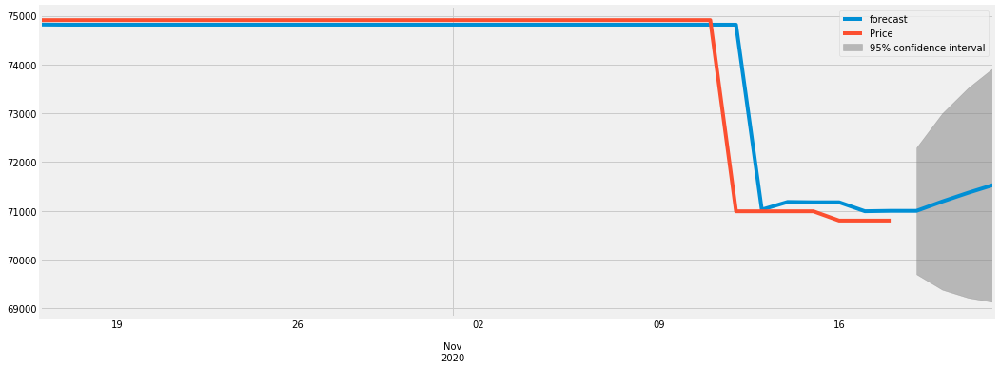

0.9947852793468596
2020-10-16    74819.482767
2020-10-17    74815.991133
2020-10-18    74816.141545
2020-10-19    74816.135317
2020-10-20    74816.135575
2020-10-21    74816.135564
2020-10-22    74816.135565
2020-10-23    74816.135565
2020-10-24    74816.135565
2020-10-25    74816.135565
2020-10-26    74816.135565
2020-10-27    74816.135565
2020-10-28    74816.135565
2020-10-29    74816.135565
2020-10-30    74816.135565
2020-10-31    74816.135565
2020-11-01    74816.135565
2020-11-02    74816.135565
2020-11-03    74816.135565
2020-11-04    74816.135565
2020-11-05    74816.135565
2020-11-06    74816.135565
2020-11-07    74816.135565
2020-11-08    74816.135565
2020-11-09    74816.135565
2020-11-10    74816.135565
2020-11-11    74816.135565
2020-11-12    74816.135565
2020-11-13    71024.061761
2020-11-14    71181.350156
2020-11-15    71174.826116
2020-11-16    71175.096722
2020-11-17    70991.286002
2020-11-18    70998.910140
2020-11-19    70998.593904
2020-11-20    71190.719966
2020-11-2

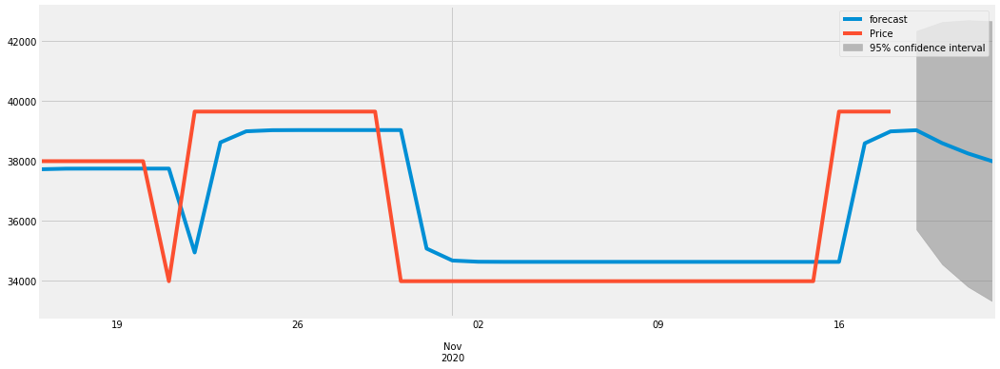

0.9367403150088034
2020-10-16    37719.687228
2020-10-17    37740.151325
2020-10-18    37742.054377
2020-10-19    37742.244399
2020-10-20    37742.263503
2020-10-21    37742.265425
2020-10-22    34946.611836
2020-10-23    38616.278224
2020-10-24    38985.510417
2020-10-25    39022.661590
2020-10-26    39026.399644
2020-10-27    39026.775757
2020-10-28    39026.813600
2020-10-29    39026.817408
2020-10-30    39026.817791
2020-10-31    35075.860121
2020-11-01    34678.325137
2020-11-02    34638.326211
2020-11-03    34634.301625
2020-11-04    34633.896681
2020-11-05    34633.855937
2020-11-06    34633.851837
2020-11-07    34633.851425
2020-11-08    34633.851383
2020-11-09    34633.851379
2020-11-10    34633.851379
2020-11-11    34633.851379
2020-11-12    34633.851379
2020-11-13    34633.851379
2020-11-14    34633.851379
2020-11-15    34633.851379
2020-11-16    34633.851379
2020-11-17    38584.809088
2020-11-18    38982.344075
2020-11-19    39022.343001
2020-11-20    38592.582067
2020-11-2

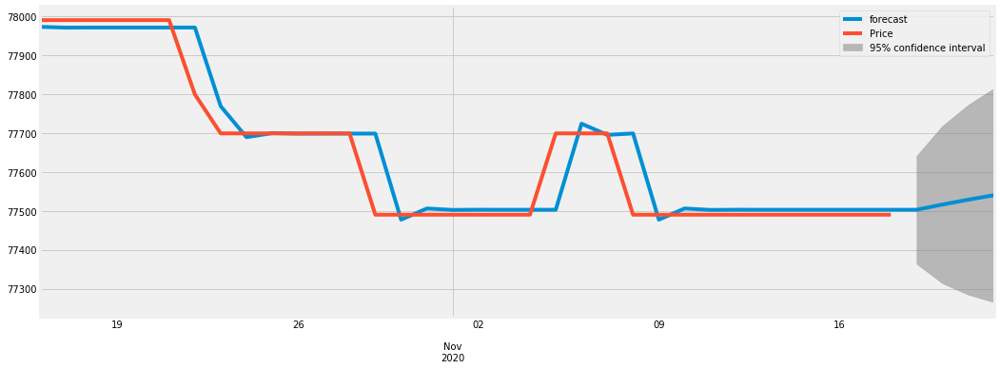

0.9945383586244889
2020-10-16    77972.795979
2020-10-17    77970.722152
2020-10-18    77971.023693
2020-10-19    77970.985167
2020-10-20    77970.990178
2020-10-21    77970.989528
2020-10-22    77970.989612
2020-10-23    77768.872170
2020-10-24    77689.285090
2020-10-25    77699.614989
2020-10-26    77698.274233
2020-10-27    77698.448255
2020-10-28    77698.425668
2020-10-29    77698.428599
2020-10-30    77477.263072
2020-10-31    77505.968957
2020-11-01    77502.243115
2020-11-02    77502.726705
2020-11-03    77502.663938
2020-11-04    77502.672085
2020-11-05    77502.671028
2020-11-06    77723.836312
2020-11-07    77695.130459
2020-11-08    77698.856297
2020-11-09    77477.207560
2020-11-10    77505.976162
2020-11-11    77502.242180
2020-11-12    77502.726827
2020-11-13    77502.663923
2020-11-14    77502.672087
2020-11-15    77502.671028
2020-11-16    77502.671165
2020-11-17    77502.671147
2020-11-18    77502.671150
2020-11-19    77502.671149
2020-11-20    77516.079841
2020-11-2

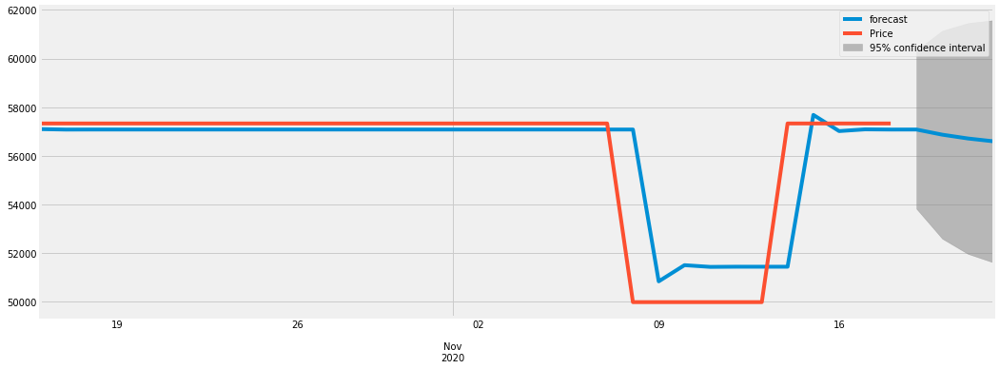

0.9501332150521385
2020-10-16    57099.381497
2020-10-17    57080.142035
2020-10-18    57082.364987
2020-10-19    57082.129926
2020-10-20    57082.155028
2020-10-21    57082.152350
2020-10-22    57082.152635
2020-10-23    57082.152605
2020-10-24    57082.152608
2020-10-25    57082.152608
2020-10-26    57082.152608
2020-10-27    57082.152608
2020-10-28    57082.152608
2020-10-29    57082.152608
2020-10-30    57082.152608
2020-10-31    57082.152608
2020-11-01    57082.152608
2020-11-02    57082.152608
2020-11-03    57082.152608
2020-11-04    57082.152608
2020-11-05    57082.152608
2020-11-06    57082.152608
2020-11-07    57082.152608
2020-11-08    57082.152608
2020-11-09    50842.869865
2020-11-10    51508.528565
2020-11-11    51437.510545
2020-11-12    51445.087340
2020-11-13    51444.278984
2020-11-14    51444.365226
2020-11-15    57683.638768
2020-11-16    57017.981050
2020-11-17    57088.998965
2020-11-18    57081.422181
2020-11-19    57082.230536
2020-11-20    56870.709472
2020-11-2

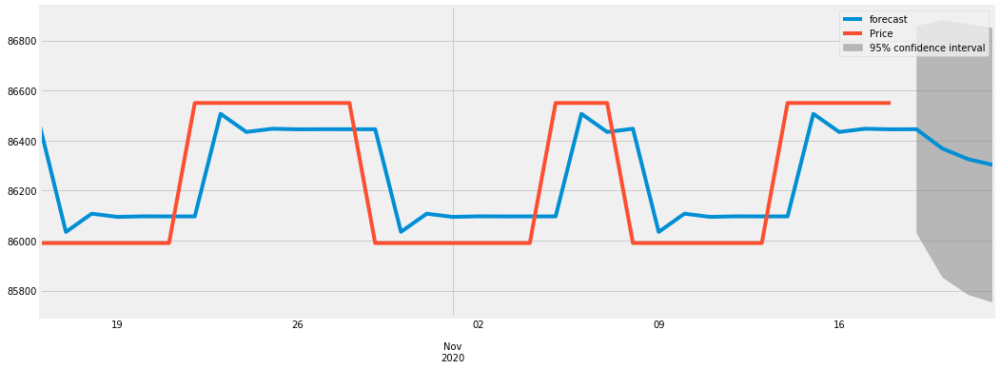

0.8726298471502842
2020-10-16    86454.214092
2020-10-17    86034.418560
2020-10-18    86107.550996
2020-10-19    86094.615373
2020-10-20    86096.902615
2020-10-21    86096.498137
2020-10-22    86096.569664
2020-10-23    86506.739073
2020-10-24    86434.205573
2020-10-25    86447.032245
2020-10-26    86444.764004
2020-10-27    86445.165115
2020-10-28    86445.094183
2020-10-29    86445.106726
2020-10-30    86034.922451
2020-10-31    86107.458579
2020-11-01    86094.631442
2020-11-02    86096.899766
2020-11-03    86096.498640
2020-11-04    86096.569575
2020-11-05    86096.557031
2020-11-06    86506.741307
2020-11-07    86434.205178
2020-11-08    86447.032315
2020-11-09    86034.581934
2020-11-10    86107.518796
2020-11-11    86094.620794
2020-11-12    86096.901649
2020-11-13    86096.498307
2020-11-14    86096.569634
2020-11-15    86506.739078
2020-11-16    86434.205572
2020-11-17    86447.032246
2020-11-18    86444.764004
2020-11-19    86445.165115
2020-11-20    86368.305988
2020-11-2

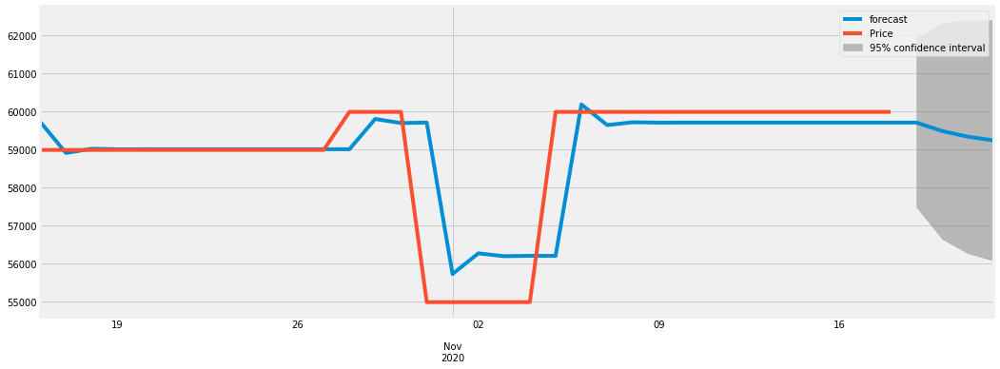

0.9183988194816719
2020-10-16    59730.833970
2020-10-17    58910.930544
2020-10-18    59021.644822
2020-10-19    59006.563989
2020-10-20    59008.618461
2020-10-21    59008.338577
2020-10-22    59008.376706
2020-10-23    59008.371512
2020-10-24    59008.372219
2020-10-25    59008.372123
2020-10-26    59008.372136
2020-10-27    59008.372134
2020-10-28    59008.372135
2020-10-29    59804.289124
2020-10-30    59695.860032
2020-10-31    59710.631507
2020-11-01    55729.034216
2020-11-02    56271.453823
2020-11-03    56197.559100
2020-11-04    56207.625901
2020-11-05    56206.254484
2020-11-06    60186.026263
2020-11-07    59643.855348
2020-11-08    59717.716191
2020-11-09    59707.654006
2020-11-10    59709.024794
2020-11-11    59708.838050
2020-11-12    59708.863490
2020-11-13    59708.860024
2020-11-14    59708.860496
2020-11-15    59708.860432
2020-11-16    59708.860441
2020-11-17    59708.860440
2020-11-18    59708.860440
2020-11-19    59708.860440
2020-11-20    59485.096687
2020-11-2

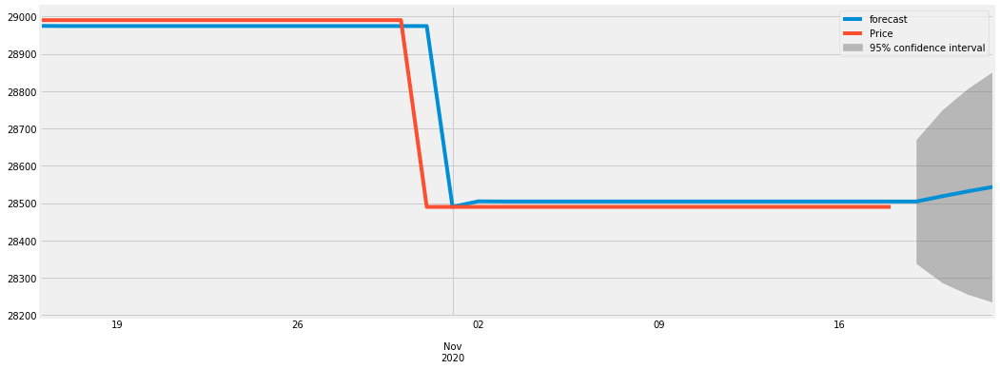

0.9964025634998913
2020-10-16    28974.543633
2020-10-17    28974.101347
2020-10-18    28974.115194
2020-10-19    28974.114773
2020-10-20    28974.114786
2020-10-21    28974.114786
2020-10-22    28974.114786
2020-10-23    28974.114786
2020-10-24    28974.114786
2020-10-25    28974.114786
2020-10-26    28974.114786
2020-10-27    28974.114786
2020-10-28    28974.114786
2020-10-29    28974.114786
2020-10-30    28974.114786
2020-10-31    28974.114786
2020-11-01    28490.186898
2020-11-02    28504.916311
2020-11-03    28504.467988
2020-11-04    28504.481634
2020-11-05    28504.481219
2020-11-06    28504.481231
2020-11-07    28504.481231
2020-11-08    28504.481231
2020-11-09    28504.481231
2020-11-10    28504.481231
2020-11-11    28504.481231
2020-11-12    28504.481231
2020-11-13    28504.481231
2020-11-14    28504.481231
2020-11-15    28504.481231
2020-11-16    28504.481231
2020-11-17    28504.481231
2020-11-18    28504.481231
2020-11-19    28504.481231
2020-11-20    28518.496974
2020-11-2

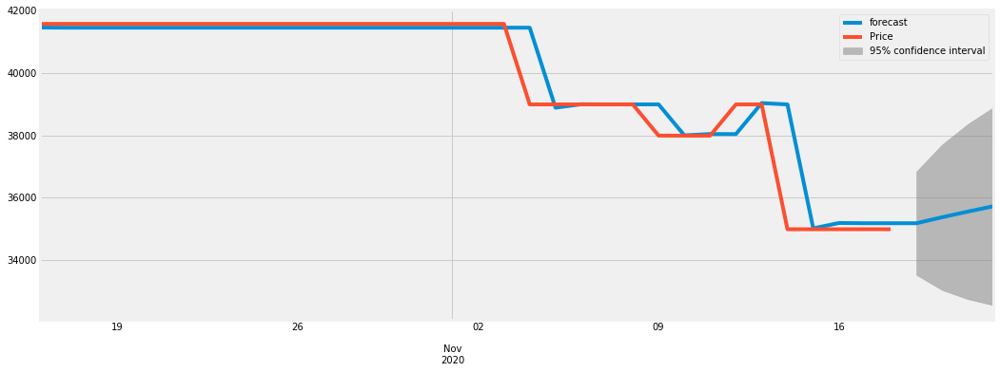

0.9975833224517909
2020-10-16    41453.639497
2020-10-17    41448.822962
2020-10-18    41449.039029
2020-10-19    41449.029735
2020-10-20    41449.030135
2020-10-21    41449.030118
2020-10-22    41449.030119
2020-10-23    41449.030119
2020-10-24    41449.030119
2020-10-25    41449.030119
2020-10-26    41449.030119
2020-10-27    41449.030119
2020-10-28    41449.030119
2020-10-29    41449.030119
2020-10-30    41449.030119
2020-10-31    41449.030119
2020-11-01    41449.030119
2020-11-02    41449.030119
2020-11-03    41449.030119
2020-11-04    41449.030119
2020-11-05    38885.457900
2020-11-06    38995.925193
2020-11-07    38991.165030
2020-11-08    38991.370151
2020-11-09    38991.361312
2020-11-10    37998.114029
2020-11-11    38040.914204
2020-11-12    38039.069895
2020-11-13    39032.397032
2020-11-14    38989.593416
2020-11-15    35018.447220
2020-11-16    35189.568505
2020-11-17    35182.194690
2020-11-18    35182.512437
2020-11-19    35182.498745
2020-11-20    35373.698263
2020-11-2

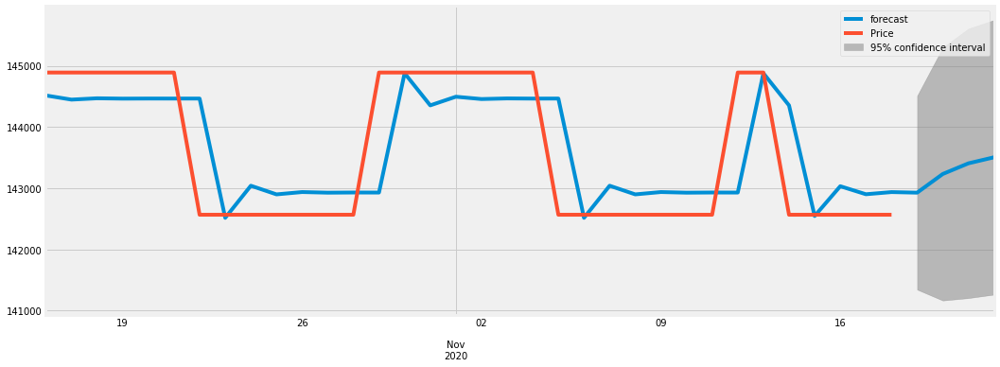

0.8926796630718179
2020-10-16    144515.813428
2020-10-17    144447.672905
2020-10-18    144469.300900
2020-10-19    144463.764349
2020-10-20    144465.274386
2020-10-21    144464.869324
2020-10-22    144464.978471
2020-10-23    142516.404178
2020-10-24    143040.961647
2020-10-25    142899.750434
2020-10-26    142937.764585
2020-10-27    142927.531151
2020-10-28    142930.285998
2020-10-29    142929.544391
2020-10-30    144878.288953
2020-10-31    144353.685645
2020-11-01    144494.909198
2020-11-02    144456.891725
2020-11-03    144467.126054
2020-11-04    144464.370966
2020-11-05    144465.112637
2020-11-06    142516.368058
2020-11-07    143040.971371
2020-11-08    142899.747816
2020-11-09    142937.765289
2020-11-10    142927.530961
2020-11-11    142930.286049
2020-11-12    142929.544377
2020-11-13    144878.288957
2020-11-14    144353.685644
2020-11-15    142546.364277
2020-11-16    143032.896369
2020-11-17    142901.921612
2020-11-18    142937.180102
2020-11-19    142927.688494
2

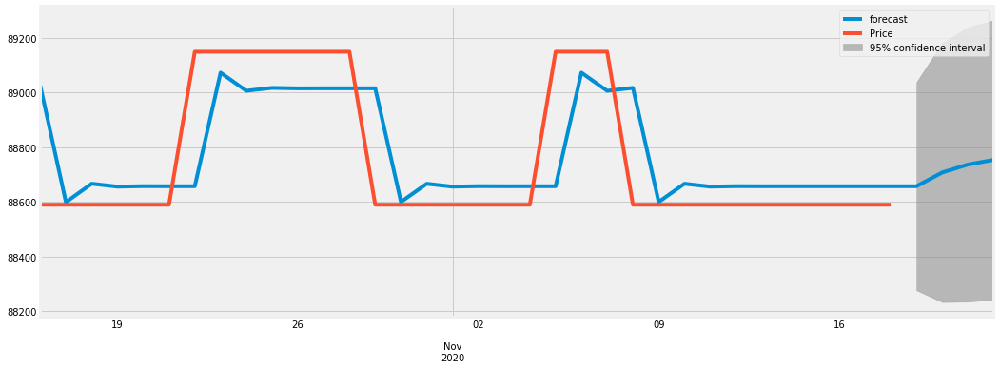

0.8840785489776894
2020-10-16    89026.405400
2020-10-17    88599.435431
2020-10-18    88666.769787
2020-10-19    88656.024912
2020-10-20    88657.739380
2020-10-21    88657.465801
2020-10-22    88657.509456
2020-10-23    89072.540172
2020-10-24    89006.313824
2020-10-25    89016.881546
2020-10-26    89015.195257
2020-10-27    89015.464338
2020-10-28    89015.421401
2020-10-29    89015.428252
2020-10-30    88600.389477
2020-10-31    88666.617111
2020-11-01    88656.049184
2020-11-02    88657.735505
2020-11-03    88657.466420
2020-11-04    88657.509358
2020-11-05    88657.502506
2020-11-06    89072.541282
2020-11-07    89006.313647
2020-11-08    89016.881574
2020-11-09    88600.157571
2020-11-10    88666.654116
2020-11-11    88656.043279
2020-11-12    88657.736448
2020-11-13    88657.466269
2020-11-14    88657.509382
2020-11-15    88657.502502
2020-11-16    88657.503600
2020-11-17    88657.503425
2020-11-18    88657.503453
2020-11-19    88657.503448
2020-11-20    88707.622366
2020-11-2

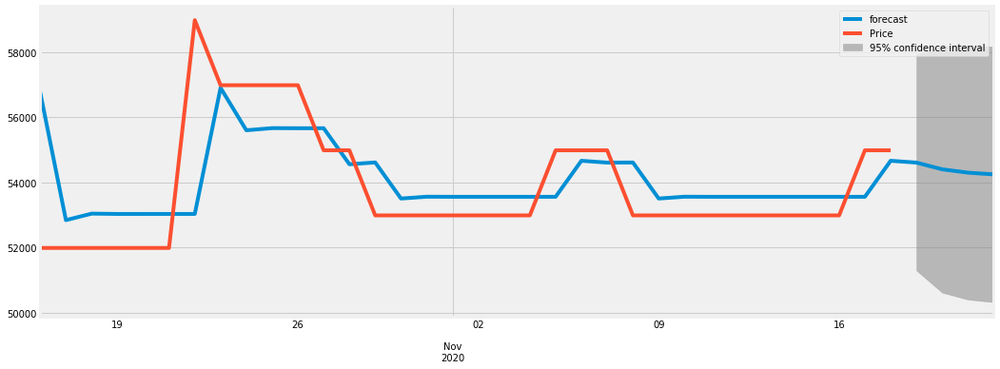

0.7845904533978627
2020-10-16    56779.409096
2020-10-17    52845.171342
2020-10-18    53044.407730
2020-10-19    53034.308810
2020-10-20    53034.820701
2020-10-21    53034.794755
2020-10-22    53034.796070
2020-10-23    56908.980459
2020-10-24    55605.697068
2020-10-25    55671.757523
2020-10-26    55668.409070
2020-10-27    55668.578795
2020-10-28    54561.660347
2020-10-29    54617.767512
2020-10-30    53508.013723
2020-10-31    53564.264605
2020-11-01    53561.413376
2020-11-02    53561.557899
2020-11-03    53561.550573
2020-11-04    53561.550944
2020-11-05    53561.550926
2020-11-06    54668.460771
2020-11-07    54612.354043
2020-11-08    54615.197964
2020-11-09    53508.143968
2020-11-10    53564.258003
2020-11-11    53561.413711
2020-11-12    53561.557882
2020-11-13    53561.550574
2020-11-14    53561.550944
2020-11-15    53561.550926
2020-11-16    53561.550927
2020-11-17    53561.550926
2020-11-18    54668.460771
2020-11-19    54612.354043
2020-11-20    54406.187950
2020-11-2

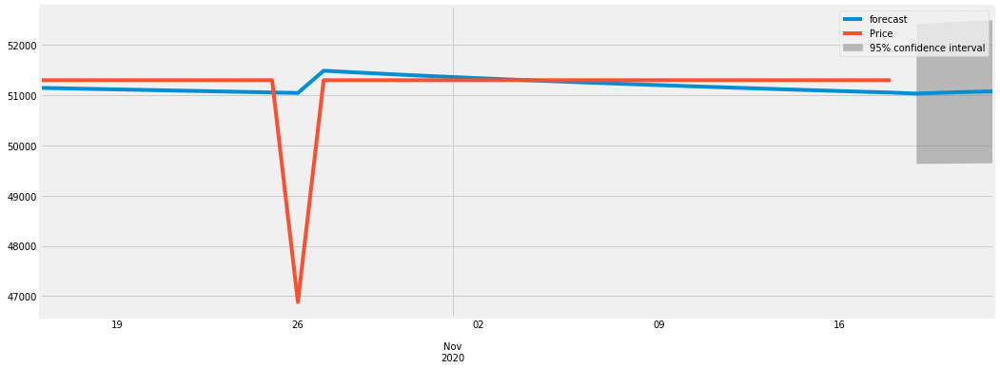

-0.1691589519107164
2020-10-16    51144.584190
2020-10-17    51134.444305
2020-10-18    51124.304420
2020-10-19    51114.164535
2020-10-20    51104.024650
2020-10-21    51093.884765
2020-10-22    51083.744880
2020-10-23    51073.604995
2020-10-24    51063.465109
2020-10-25    51053.325224
2020-10-26    51043.185339
2020-10-27    51486.075626
2020-10-28    51458.532465
2020-10-29    51432.276942
2020-10-30    51407.171249
2020-10-31    51383.096568
2020-11-01    51359.949905
2020-11-02    51337.641542
2020-11-03    51316.092965
2020-11-04    51295.235169
2020-11-05    51275.007258
2020-11-06    51255.355290
2020-11-07    51236.231312
2020-11-08    51217.592550
2020-11-09    51199.400729
2020-11-10    51181.621496
2020-11-11    51164.223932
2020-11-12    51147.180131
2020-11-13    51130.464843
2020-11-14    51114.055165
2020-11-15    51097.930275
2020-11-16    51082.071200
2020-11-17    51066.460616
2020-11-18    51051.082673
2020-11-19    51030.802952
2020-11-20    51048.466460
2020-11-

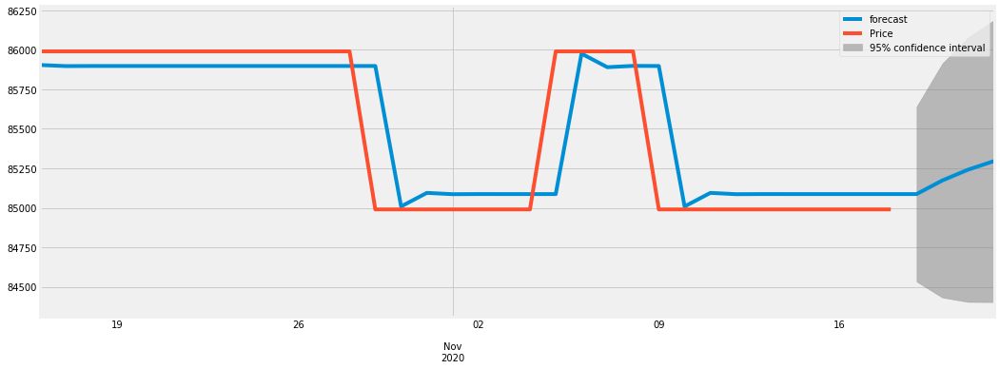

0.9667538867690343
2020-10-16    85903.635111
2020-10-17    85896.826184
2020-10-18    85897.534173
2020-10-19    85897.466451
2020-10-20    85897.472983
2020-10-21    85897.472353
2020-10-22    85897.472414
2020-10-23    85897.472408
2020-10-24    85897.472409
2020-10-25    85897.472409
2020-10-26    85897.472409
2020-10-27    85897.472409
2020-10-28    85897.472409
2020-10-29    85897.472409
2020-10-30    85008.863835
2020-10-31    85094.513742
2020-11-01    85086.258244
2020-11-02    85087.053963
2020-11-03    85086.977266
2020-11-04    85086.984659
2020-11-05    85086.983946
2020-11-06    85975.592589
2020-11-07    85889.942675
2020-11-08    85898.198174
2020-11-09    85897.402455
2020-11-10    85008.870577
2020-11-11    85094.513093
2020-11-12    85086.258307
2020-11-13    85087.053957
2020-11-14    85086.977267
2020-11-15    85086.984659
2020-11-16    85086.983946
2020-11-17    85086.984015
2020-11-18    85086.984008
2020-11-19    85086.984009
2020-11-20    85173.164831
2020-11-2

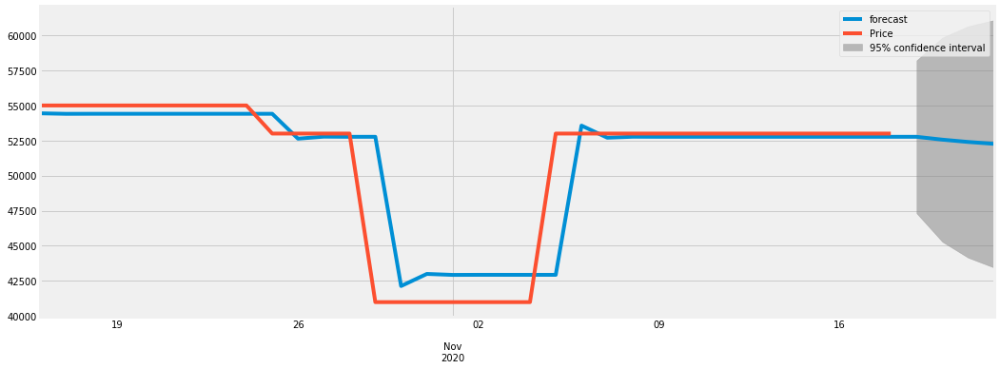

0.9688549830571309
2020-10-16    54432.020814
2020-10-17    54394.643391
2020-10-18    54397.878820
2020-10-19    54397.617759
2020-10-20    54397.638948
2020-10-21    54397.637229
2020-10-22    54397.637369
2020-10-23    54397.637358
2020-10-24    54397.637359
2020-10-25    54397.637358
2020-10-26    52626.916216
2020-10-27    52770.573091
2020-10-28    52758.918349
2020-10-29    52759.863887
2020-10-30    42135.460324
2020-10-31    42997.407797
2020-11-01    42927.478841
2020-11-02    42933.152109
2020-11-03    42932.691842
2020-11-04    42932.729183
2020-11-05    42932.726154
2020-11-06    53557.053252
2020-11-07    52695.111983
2020-11-08    52765.040435
2020-11-09    52759.367208
2020-11-10    52759.827472
2020-11-11    52759.790131
2020-11-12    52759.793160
2020-11-13    52759.792915
2020-11-14    52759.792935
2020-11-15    52759.792933
2020-11-16    52759.792933
2020-11-17    52759.792933
2020-11-18    52759.792933
2020-11-19    52759.792933
2020-11-20    52555.976673
2020-11-2

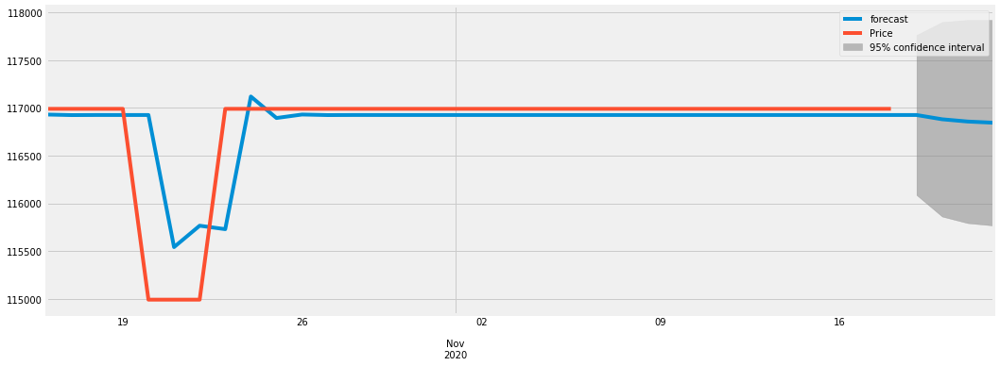

0.8541322783920873
2020-10-16    116930.448056
2020-10-17    116924.460495
2020-10-18    116925.527215
2020-10-19    116925.357300
2020-10-20    116925.384886
2020-10-21    115540.966432
2020-10-22    115765.137245
2020-10-23    115728.838571
2020-10-24    117119.130194
2020-10-25    116894.008372
2020-10-26    116930.461037
2020-10-27    116924.558469
2020-10-28    116925.514238
2020-10-29    116925.359476
2020-10-30    116925.384536
2020-10-31    116925.380478
2020-11-01    116925.381135
2020-11-02    116925.381028
2020-11-03    116925.381046
2020-11-04    116925.381043
2020-11-05    116925.381043
2020-11-06    116925.381043
2020-11-07    116925.381043
2020-11-08    116925.381043
2020-11-09    116925.381043
2020-11-10    116925.381043
2020-11-11    116925.381043
2020-11-12    116925.381043
2020-11-13    116925.381043
2020-11-14    116925.381043
2020-11-15    116925.381043
2020-11-16    116925.381043
2020-11-17    116925.381043
2020-11-18    116925.381043
2020-11-19    116925.381043
2

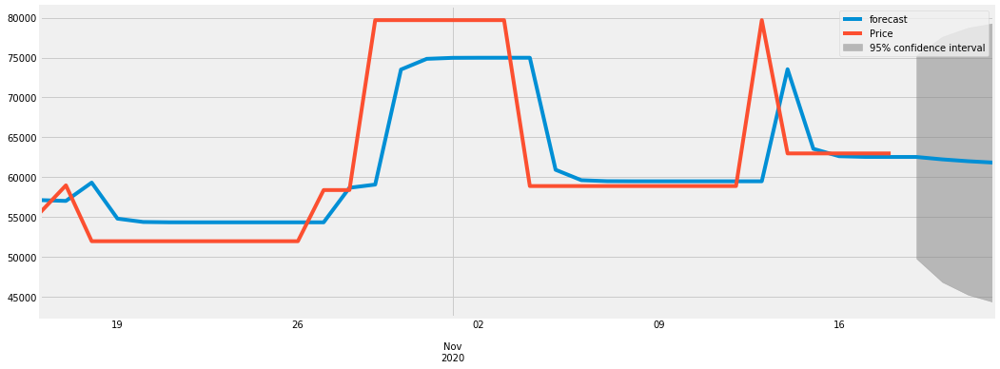

0.9226072606108295
2020-10-16    57141.543921
2020-10-17    57036.801691
2020-10-18    59331.780182
2020-10-19    54818.083506
2020-10-20    54398.664869
2020-10-21    54359.691916
2020-10-22    54356.070496
2020-10-23    54355.733989
2020-10-24    54355.702720
2020-10-25    54355.699815
2020-10-26    54355.699545
2020-10-27    54355.699520
2020-10-28    58684.227735
2020-10-29    59086.440495
2020-10-30    73500.470780
2020-10-31    74839.842182
2020-11-01    74964.298404
2020-11-02    74975.863046
2020-11-03    74976.937648
2020-11-04    74977.037502
2020-11-05    60938.029362
2020-11-06    59633.505531
2020-11-07    59512.287393
2020-11-08    59501.023637
2020-11-09    59499.976994
2020-11-10    59499.879738
2020-11-11    59499.870701
2020-11-12    59499.869861
2020-11-13    59499.869783
2020-11-14    73538.887195
2020-11-15    63566.279089
2020-11-16    62639.610708
2020-11-17    62553.503415
2020-11-18    62545.502208
2020-11-19    62544.758725
2020-11-20    62244.028263
2020-11-2

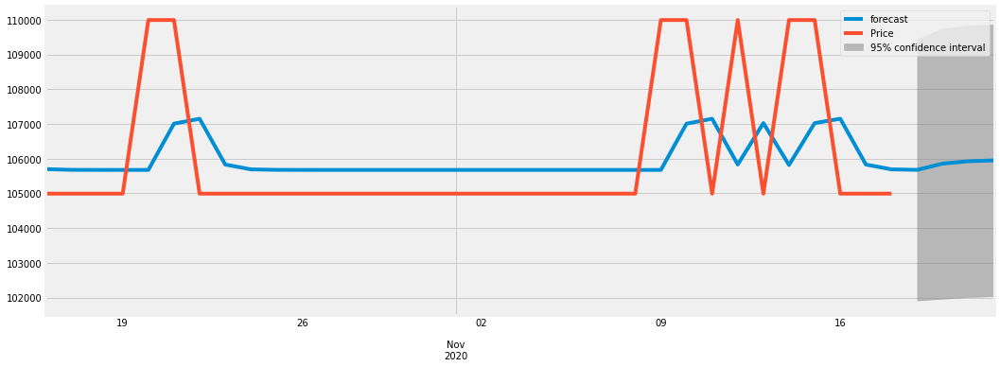

0.47304075382571953
2020-10-16    105696.093455
2020-10-17    105675.689953
2020-10-18    105673.602416
2020-10-19    105673.383147
2020-10-20    105673.360052
2020-10-21    107005.750094
2020-10-22    107146.128158
2020-10-23    105828.525647
2020-10-24    105689.705569
2020-10-25    105675.079751
2020-10-26    105673.538803
2020-10-27    105673.376452
2020-10-28    105673.359347
2020-10-29    105673.357545
2020-10-30    105673.357355
2020-10-31    105673.357335
2020-11-01    105673.357333
2020-11-02    105673.357333
2020-11-03    105673.357333
2020-11-04    105673.357333
2020-11-05    105673.357333
2020-11-06    105673.357333
2020-11-07    105673.357333
2020-11-08    105673.357333
2020-11-09    105673.357333
2020-11-10    107005.749808
2020-11-11    107146.128128
2020-11-12    105828.525644
2020-11-13    107022.098044
2020-11-14    105815.458072
2020-11-15    107020.721270
2020-11-16    107147.705493
2020-11-17    105828.691832
2020-11-18    105689.723078
2020-11-19    105675.081596


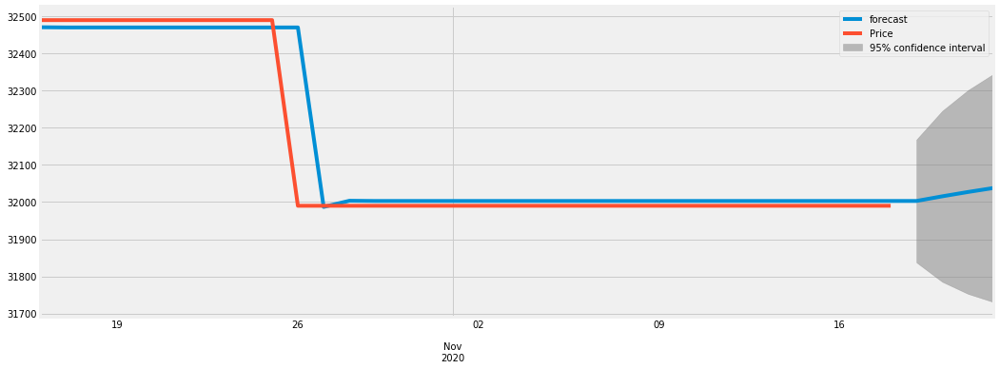

0.9956906685546423
2020-10-16    32470.880733
2020-10-17    32470.267218
2020-10-18    32470.288933
2020-10-19    32470.288189
2020-10-20    32470.288215
2020-10-21    32470.288214
2020-10-22    32470.288214
2020-10-23    32470.288214
2020-10-24    32470.288214
2020-10-25    32470.288214
2020-10-26    32470.288214
2020-10-27    31986.911818
2020-10-28    32003.488771
2020-10-29    32002.920279
2020-10-30    32002.939775
2020-10-31    32002.939106
2020-11-01    32002.939129
2020-11-02    32002.939129
2020-11-03    32002.939129
2020-11-04    32002.939129
2020-11-05    32002.939129
2020-11-06    32002.939129
2020-11-07    32002.939129
2020-11-08    32002.939129
2020-11-09    32002.939129
2020-11-10    32002.939129
2020-11-11    32002.939129
2020-11-12    32002.939129
2020-11-13    32002.939129
2020-11-14    32002.939129
2020-11-15    32002.939129
2020-11-16    32002.939129
2020-11-17    32002.939129
2020-11-18    32002.939129
2020-11-19    32002.939129
2020-11-20    32015.448067
2020-11-2

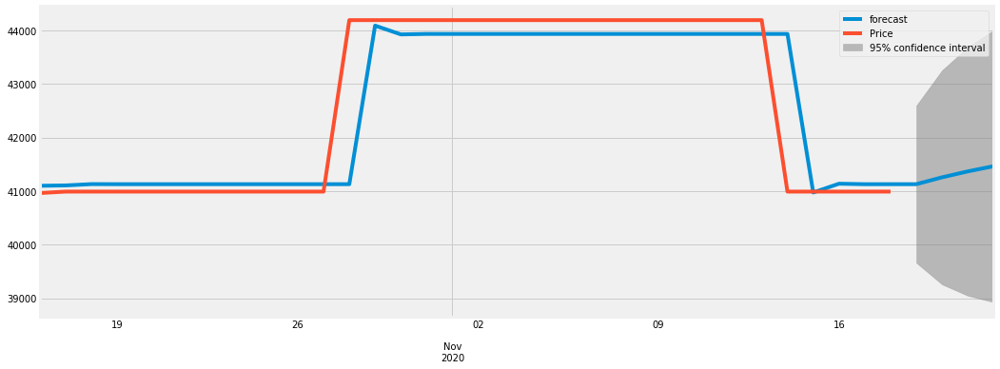

0.9843156205238321
2020-10-16    41098.474578
2020-10-17    41105.076550
2020-10-18    41129.661013
2020-10-19    41128.298840
2020-10-20    41128.374312
2020-10-21    41128.370131
2020-10-22    41128.370363
2020-10-23    41128.370350
2020-10-24    41128.370350
2020-10-25    41128.370350
2020-10-26    41128.370350
2020-10-27    41128.370350
2020-10-28    41128.370350
2020-10-29    44087.550866
2020-10-30    43923.594539
2020-10-31    43932.678701
2020-11-01    43932.175384
2020-11-02    43932.203271
2020-11-03    43932.201726
2020-11-04    43932.201812
2020-11-05    43932.201807
2020-11-06    43932.201807
2020-11-07    43932.201807
2020-11-08    43932.201807
2020-11-09    43932.201807
2020-11-10    43932.201807
2020-11-11    43932.201807
2020-11-12    43932.201807
2020-11-13    43932.201807
2020-11-14    43932.201807
2020-11-15    40973.021291
2020-11-16    41136.977619
2020-11-17    41127.893456
2020-11-18    41128.396773
2020-11-19    41128.368886
2020-11-20    41256.326217
2020-11-2

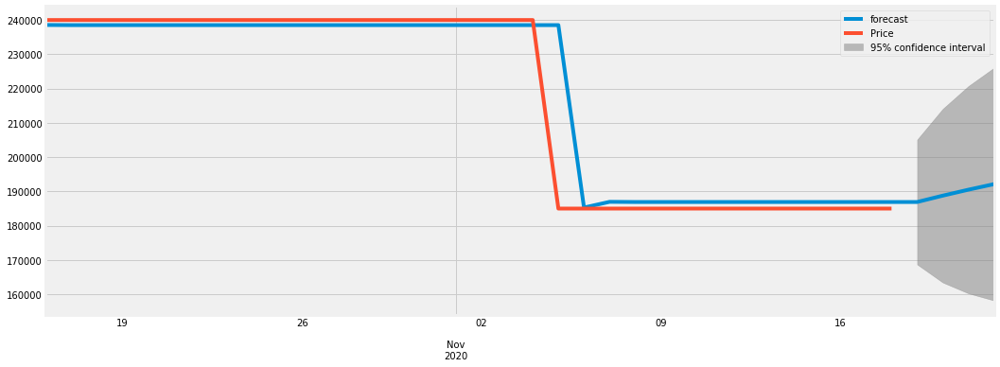

0.9962928291837899
2020-10-16    238546.384960
2020-10-17    238503.789790
2020-10-18    238505.167647
2020-10-19    238505.124394
2020-10-20    238505.125753
2020-10-21    238505.125710
2020-10-22    238505.125712
2020-10-23    238505.125712
2020-10-24    238505.125712
2020-10-25    238505.125712
2020-10-26    238505.125712
2020-10-27    238505.125712
2020-10-28    238505.125712
2020-10-29    238505.125712
2020-10-30    238505.125712
2020-10-31    238505.125712
2020-11-01    238505.125712
2020-11-02    238505.125712
2020-11-03    238505.125712
2020-11-04    238505.125712
2020-11-05    238505.125712
2020-11-06    185284.963797
2020-11-07    186957.176070
2020-11-08    186904.634067
2020-11-09    186906.284971
2020-11-10    186906.233099
2020-11-11    186906.234729
2020-11-12    186906.234678
2020-11-13    186906.234679
2020-11-14    186906.234679
2020-11-15    186906.234679
2020-11-16    186906.234679
2020-11-17    186906.234679
2020-11-18    186906.234679
2020-11-19    186906.234679
2

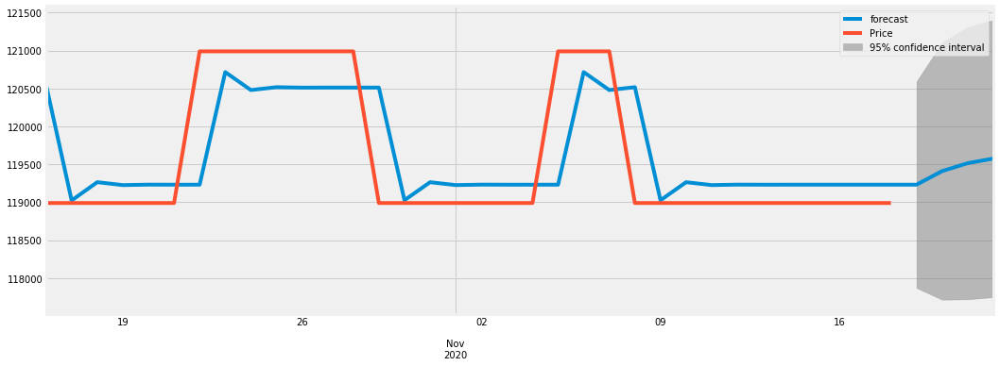

0.8840788251563814
2020-10-16    120551.405076
2020-10-17    119023.782951
2020-10-18    119264.693761
2020-10-19    119226.250340
2020-10-20    119232.384444
2020-10-21    119231.405617
2020-10-22    119231.561809
2020-10-23    120716.470062
2020-10-24    120479.523022
2020-10-25    120517.332698
2020-10-26    120511.299402
2020-10-27    120512.262136
2020-10-28    120512.108512
2020-10-29    120512.133026
2020-10-30    119027.195938
2020-10-31    119264.147579
2020-11-01    119226.337169
2020-11-02    119232.370582
2020-11-03    119231.407829
2020-11-04    119231.561456
2020-11-05    119231.536941
2020-11-06    120716.474030
2020-11-07    120479.522389
2020-11-08    120517.332799
2020-11-09    119026.366209
2020-11-10    119264.279979
2020-11-11    119226.316042
2020-11-12    119232.373953
2020-11-13    119231.407291
2020-11-14    119231.561541
2020-11-15    119231.536928
2020-11-16    119231.540855
2020-11-17    119231.540229
2020-11-18    119231.540329
2020-11-19    119231.540313
2

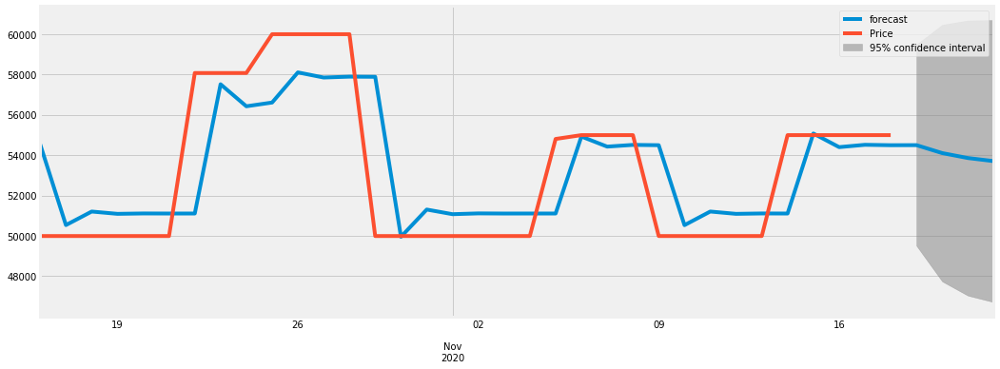

0.9059389925879029
2020-10-16    54537.953019
2020-10-17    50532.726647
2020-10-18    51203.545426
2020-10-19    51089.286040
2020-10-20    51108.739021
2020-10-21    51105.426616
2020-10-22    51105.990631
2020-10-23    57509.258382
2020-10-24    56418.947001
2020-10-25    56604.598914
2020-10-26    58097.522102
2020-10-27    57843.315781
2020-10-28    57886.600562
2020-10-29    57879.230280
2020-10-30    49952.586539
2020-10-31    51302.289568
2020-11-01    51072.469946
2020-11-02    51111.602302
2020-11-03    51104.939071
2020-11-04    51106.073647
2020-11-05    51105.880458
2020-11-06    54919.232633
2020-11-07    54420.547166
2020-11-08    54505.460441
2020-11-09    54491.001900
2020-11-10    50529.514462
2020-11-11    51204.053620
2020-11-12    51089.196995
2020-11-13    51108.754117
2020-11-14    51105.424043
2020-11-15    55069.940424
2020-11-16    54394.885515
2020-11-17    54509.829959
2020-11-18    54490.257884
2020-11-19    54493.590504
2020-11-20    54099.474624
2020-11-2

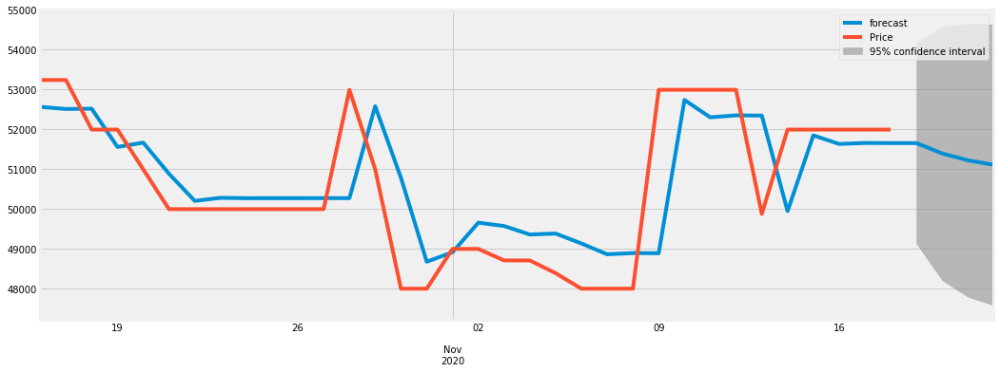

0.9126140621276868
2020-10-16    52561.803539
2020-10-17    52507.819775
2020-10-18    52514.403129
2020-10-19    51553.111158
2020-10-20    51661.671261
2020-10-21    50879.118409
2020-10-22    50197.200300
2020-10-23    50274.210350
2020-10-24    50265.513488
2020-10-25    50266.495638
2020-10-26    50266.384722
2020-10-27    50266.397248
2020-10-28    50266.395833
2020-10-29    52577.274977
2020-10-30    50775.717887
2020-10-31    48668.291489
2020-11-01    48906.286361
2020-11-02    49649.702232
2020-11-03    49565.747146
2020-11-04    49351.843353
2020-11-05    49375.999834
2020-11-06    49126.778048
2020-11-07    48854.508776
2020-11-08    48885.256559
2020-11-09    48881.784165
2020-11-10    52733.641281
2020-11-11    52298.645192
2020-11-12    52347.769962
2020-11-13    52342.222227
2020-11-14    49940.304891
2020-11-15    51843.807929
2020-11-16    51628.842432
2020-11-17    51653.118813
2020-11-18    51650.377245
2020-11-19    51650.686854
2020-11-20    51389.281350
2020-11-2

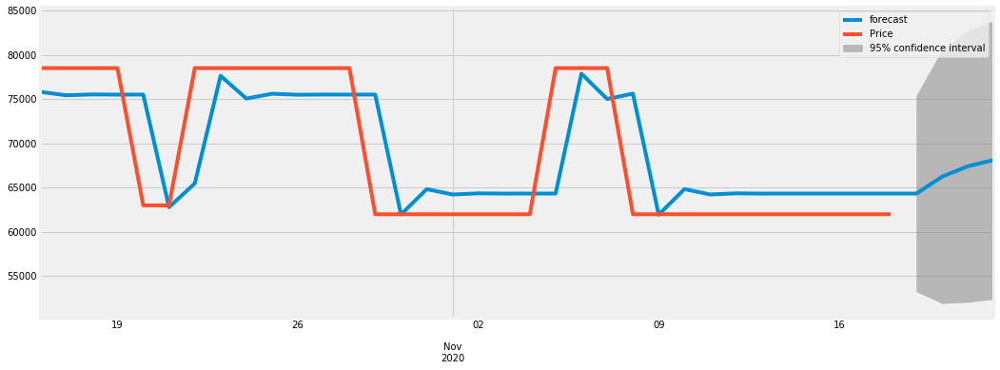

0.9051284845202001
2020-10-16    75820.149945
2020-10-17    75427.185630
2020-10-18    75522.265281
2020-10-19    75502.807787
2020-10-20    75506.943974
2020-10-21    62786.074251
2020-10-22    65472.652086
2020-10-23    77625.259230
2020-10-24    75058.695107
2020-10-25    75600.739404
2020-10-26    75486.262615
2020-10-27    75510.439486
2020-10-28    75505.333463
2020-10-29    75506.411828
2020-10-30    61965.911837
2020-10-31    64825.591334
2020-11-01    64221.642674
2020-11-02    64349.193326
2020-11-03    64322.255327
2020-11-04    64327.944485
2020-11-05    64326.742966
2020-11-06    77867.268966
2020-11-07    75007.583975
2020-11-08    75611.533796
2020-11-09    61943.710653
2020-11-10    64830.280103
2020-11-11    64220.652432
2020-11-12    64349.402460
2020-11-13    64322.211159
2020-11-14    64327.953813
2020-11-15    64326.740996
2020-11-16    64326.997136
2020-11-17    64326.943040
2020-11-18    64326.954465
2020-11-19    64326.952052
2020-11-20    66243.894890
2020-11-2

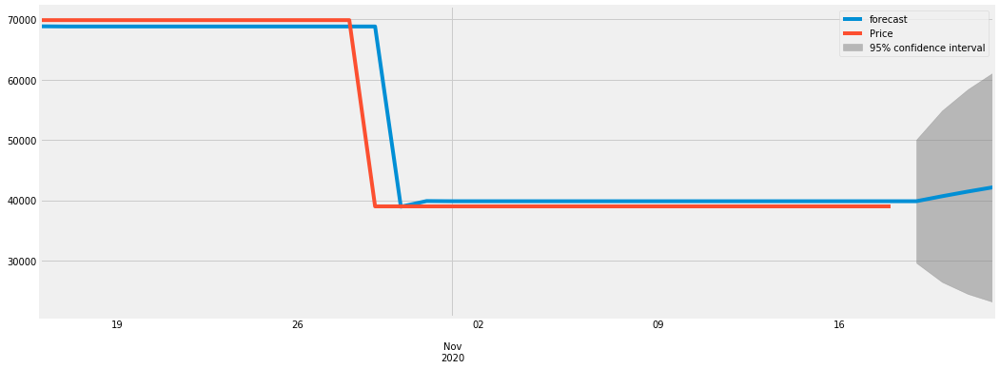

0.9962429263204933
2020-10-16    68822.344654
2020-10-17    68792.333214
2020-10-18    68793.299500
2020-10-19    68793.269304
2020-10-20    68793.270248
2020-10-21    68793.270219
2020-10-22    68793.270220
2020-10-23    68793.270220
2020-10-24    68793.270220
2020-10-25    68793.270220
2020-10-26    68793.270220
2020-10-27    68793.270220
2020-10-28    68793.270220
2020-10-29    68793.270220
2020-10-30    38938.777382
2020-10-31    39872.579926
2020-11-01    39843.372021
2020-11-02    39844.285599
2020-11-03    39844.257023
2020-11-04    39844.257917
2020-11-05    39844.257889
2020-11-06    39844.257890
2020-11-07    39844.257890
2020-11-08    39844.257890
2020-11-09    39844.257890
2020-11-10    39844.257890
2020-11-11    39844.257890
2020-11-12    39844.257890
2020-11-13    39844.257890
2020-11-14    39844.257890
2020-11-15    39844.257890
2020-11-16    39844.257890
2020-11-17    39844.257890
2020-11-18    39844.257890
2020-11-19    39844.257890
2020-11-20    40670.842322
2020-11-2

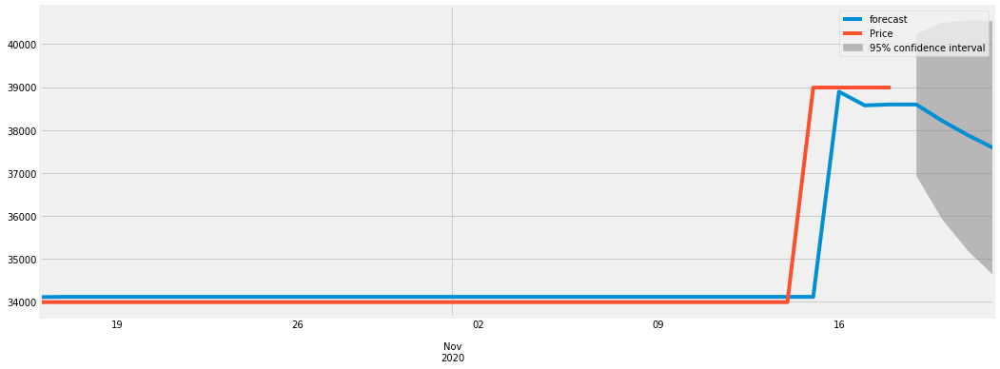

0.9891377714151259
2020-10-16    34106.526354
2020-10-17    34113.502046
2020-10-18    34113.009471
2020-10-19    34113.042158
2020-10-20    34113.039980
2020-10-21    34113.040125
2020-10-22    34113.040115
2020-10-23    34113.040116
2020-10-24    34113.040116
2020-10-25    34113.040116
2020-10-26    34113.040116
2020-10-27    34113.040116
2020-10-28    34113.040116
2020-10-29    34113.040116
2020-10-30    34113.040116
2020-10-31    34113.040116
2020-11-01    34113.040116
2020-11-02    34113.040116
2020-11-03    34113.040116
2020-11-04    34113.040116
2020-11-05    34113.040116
2020-11-06    34113.040116
2020-11-07    34113.040116
2020-11-08    34113.040116
2020-11-09    34113.040116
2020-11-10    34113.040116
2020-11-11    34113.040116
2020-11-12    34113.040116
2020-11-13    34113.040116
2020-11-14    34113.040116
2020-11-15    34113.040116
2020-11-16    38892.908094
2020-11-17    38574.445644
2020-11-18    38595.663455
2020-11-19    38594.249801
2020-11-20    38216.017247
2020-11-2

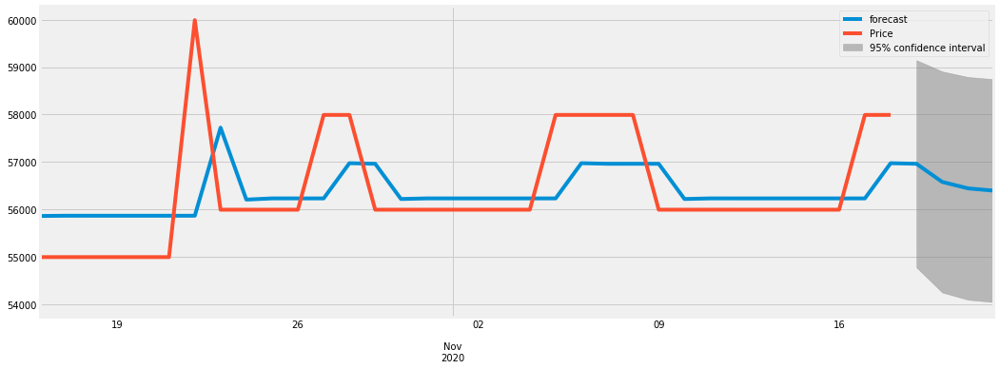

0.6022064073447234
2020-10-16    55857.634316
2020-10-17    55863.034045
2020-10-18    55862.942470
2020-10-19    55862.944013
2020-10-20    55862.943987
2020-10-21    55862.943988
2020-10-22    55862.943988
2020-10-23    57720.786532
2020-10-24    56203.200032
2020-10-25    56228.777750
2020-10-26    56228.346658
2020-10-27    56228.353924
2020-10-28    56971.490819
2020-10-29    56958.965835
2020-10-30    56216.039916
2020-10-31    56228.561344
2020-11-01    56228.350306
2020-11-02    56228.353863
2020-11-03    56228.353803
2020-11-04    56228.353804
2020-11-05    56228.353804
2020-11-06    56971.490821
2020-11-07    56958.965835
2020-11-08    56959.176934
2020-11-09    56959.173376
2020-11-10    56216.036418
2020-11-11    56228.561403
2020-11-12    56228.350305
2020-11-13    56228.353863
2020-11-14    56228.353803
2020-11-15    56228.353804
2020-11-16    56228.353804
2020-11-17    56228.353804
2020-11-18    56971.490821
2020-11-19    56958.965835
2020-11-20    56576.077107
2020-11-2

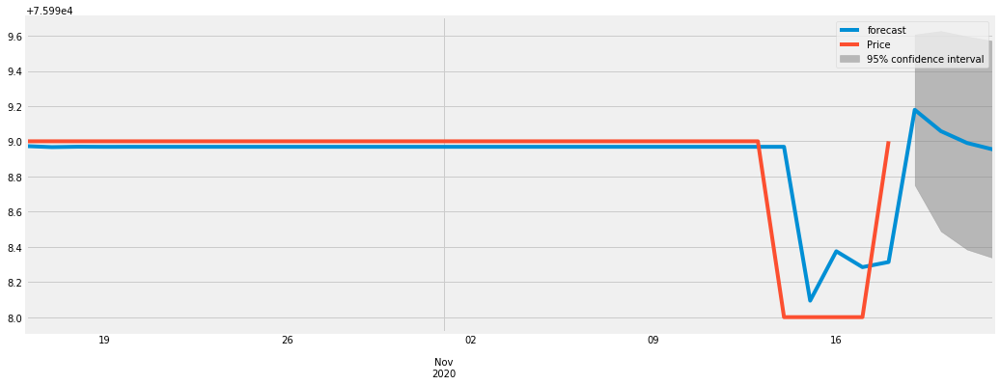

0.8900237416172572
2020-10-16    75998.972721
2020-10-17    75998.966851
2020-10-18    75998.969130
2020-10-19    75998.968448
2020-10-20    75998.968672
2020-10-21    75998.968601
2020-10-22    75998.968624
2020-10-23    75998.968616
2020-10-24    75998.968619
2020-10-25    75998.968618
2020-10-26    75998.968618
2020-10-27    75998.968618
2020-10-28    75998.968618
2020-10-29    75998.968618
2020-10-30    75998.968618
2020-10-31    75998.968618
2020-11-01    75998.968618
2020-11-02    75998.968618
2020-11-03    75998.968618
2020-11-04    75998.968618
2020-11-05    75998.968618
2020-11-06    75998.968618
2020-11-07    75998.968618
2020-11-08    75998.968618
2020-11-09    75998.968618
2020-11-10    75998.968618
2020-11-11    75998.968618
2020-11-12    75998.968618
2020-11-13    75998.968618
2020-11-14    75998.968618
2020-11-15    75998.093641
2020-11-16    75998.374618
2020-11-17    75998.284389
2020-11-18    75998.313364
2020-11-19    75999.179037
2020-11-20    75999.057700
2020-11-2

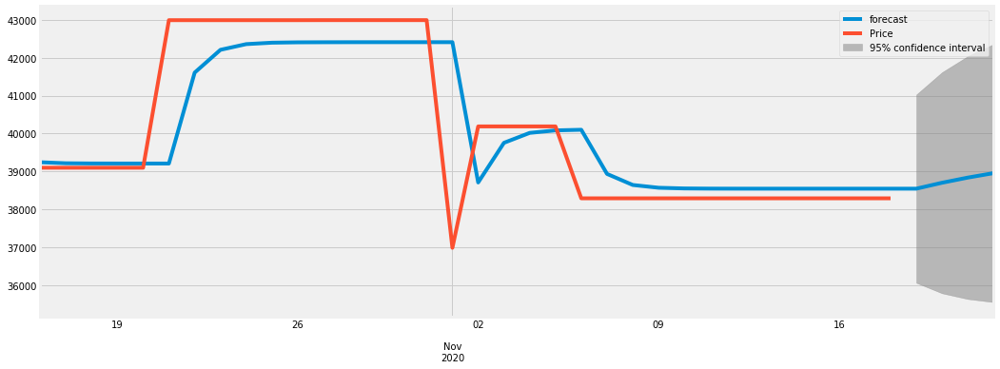

0.9320419634920455
2020-10-16    39244.855871
2020-10-17    39218.016976
2020-10-18    39212.550681
2020-10-19    39211.244662
2020-10-20    39210.921224
2020-10-21    39210.840418
2020-10-22    41607.002123
2020-10-23    42207.389105
2020-10-24    42357.823253
2020-10-25    42395.516331
2020-10-26    42404.960783
2020-10-27    42407.327203
2020-10-28    42408.536282
2020-10-29    42408.839231
2020-10-30    42408.915138
2020-10-31    42408.934158
2020-11-01    42408.938924
2020-11-02    38712.079378
2020-11-03    39756.829859
2020-11-04    40018.604605
2020-11-05    40084.195403
2020-11-06    40100.629963
2020-11-07    38937.155988
2020-11-08    38645.633649
2020-11-09    38572.589235
2020-11-10    38554.287082
2020-11-11    38549.701259
2020-11-12    38548.552226
2020-11-13    38548.264322
2020-11-14    38548.192184
2020-11-15    38548.174109
2020-11-16    38548.169580
2020-11-17    38548.168445
2020-11-18    38548.168161
2020-11-19    38548.168090
2020-11-20    38704.772077
2020-11-2

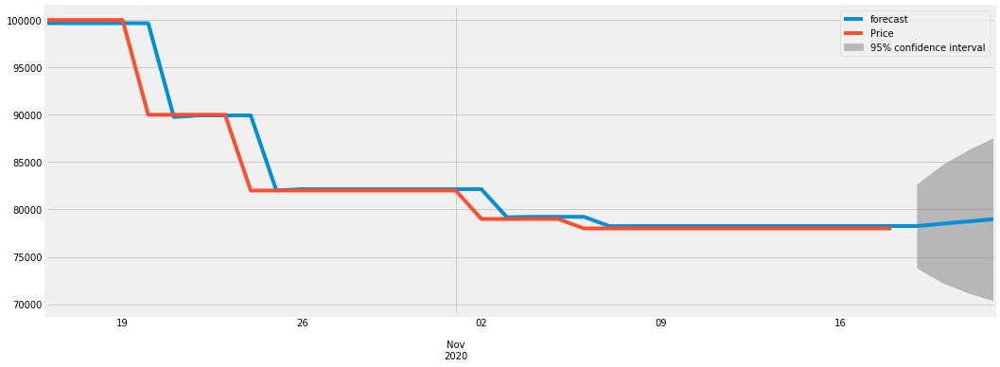

0.9991098934500989
2020-10-16    99666.754405
2020-10-17    99661.209634
2020-10-18    99661.306287
2020-10-19    99661.304630
2020-10-20    99661.304659
2020-10-21    89762.278821
2020-10-22    89931.999785
2020-10-23    89929.089882
2020-10-24    89929.139773
2020-10-25    82009.918248
2020-10-26    82145.695034
2020-10-27    82143.367112
2020-10-28    82143.407024
2020-10-29    82143.406340
2020-10-30    82143.406352
2020-10-31    82143.406352
2020-11-01    82143.406352
2020-11-02    82143.406352
2020-11-03    79173.698600
2020-11-04    79224.614890
2020-11-05    79223.741919
2020-11-06    79223.756886
2020-11-07    78234.843948
2020-11-08    78251.799077
2020-11-09    78251.508378
2020-11-10    78251.513362
2020-11-11    78251.513276
2020-11-12    78251.513278
2020-11-13    78251.513278
2020-11-14    78251.513278
2020-11-15    78251.513278
2020-11-16    78251.513278
2020-11-17    78251.513278
2020-11-18    78251.513278
2020-11-19    78251.513278
2020-11-20    78500.486921
2020-11-2

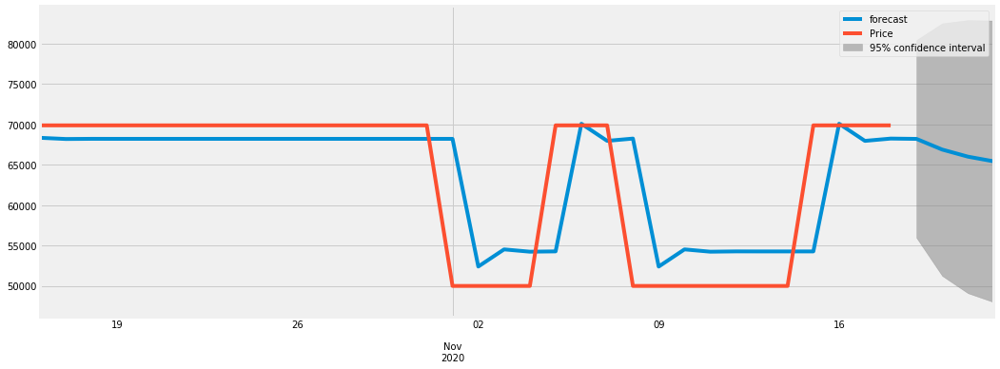

0.9187089557108115
2020-10-16    68348.830223
2020-10-17    68200.448568
2020-10-18    68222.275735
2020-10-19    68219.384264
2020-10-20    68219.772988
2020-10-21    68219.720831
2020-10-22    68219.727831
2020-10-23    68219.726891
2020-10-24    68219.727017
2020-10-25    68219.727000
2020-10-26    68219.727003
2020-10-27    68219.727002
2020-10-28    68219.727002
2020-10-29    68219.727002
2020-10-30    68219.727002
2020-10-31    68219.727002
2020-11-01    68219.727002
2020-11-02    52394.706467
2020-11-03    54518.509999
2020-11-04    54233.484053
2020-11-05    54271.736080
2020-11-06    70091.622986
2020-11-07    67968.508415
2020-11-08    68253.441899
2020-11-09    52390.181745
2020-11-10    54519.117241
2020-11-11    54233.402558
2020-11-12    54271.747017
2020-11-13    54266.600983
2020-11-14    54267.291609
2020-11-15    54267.198923
2020-11-16    70092.231897
2020-11-17    67968.426696
2020-11-18    68253.452866
2020-11-19    68215.200809
2020-11-20    66888.488633
2020-11-2

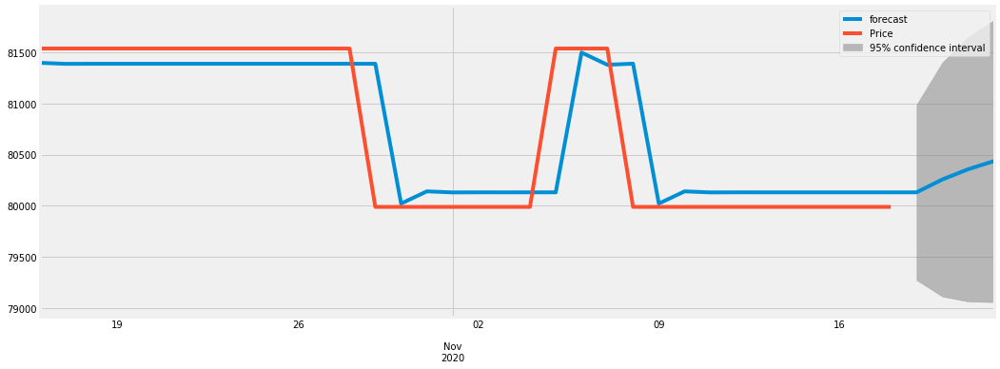

0.9671123574964355
2020-10-16    81395.341806
2020-10-17    81385.357196
2020-10-18    81386.291014
2020-10-19    81386.210011
2020-10-20    81386.217086
2020-10-21    81386.216468
2020-10-22    81386.216522
2020-10-23    81386.216517
2020-10-24    81386.216518
2020-10-25    81386.216518
2020-10-26    81386.216518
2020-10-27    81386.216518
2020-10-28    81386.216518
2020-10-29    81386.216518
2020-10-30    80022.615831
2020-10-31    80141.643078
2020-11-01    80131.253317
2020-11-02    80132.160228
2020-11-03    80132.081065
2020-11-04    80132.087975
2020-11-05    80132.087372
2020-11-06    81495.688111
2020-11-07    81376.660859
2020-11-08    81387.050621
2020-11-09    80022.543023
2020-11-10    80141.649433
2020-11-11    80131.252762
2020-11-12    80132.160276
2020-11-13    80132.081060
2020-11-14    80132.087975
2020-11-15    80132.087372
2020-11-16    80132.087424
2020-11-17    80132.087420
2020-11-18    80132.087420
2020-11-19    80132.087420
2020-11-20    80257.492277
2020-11-2

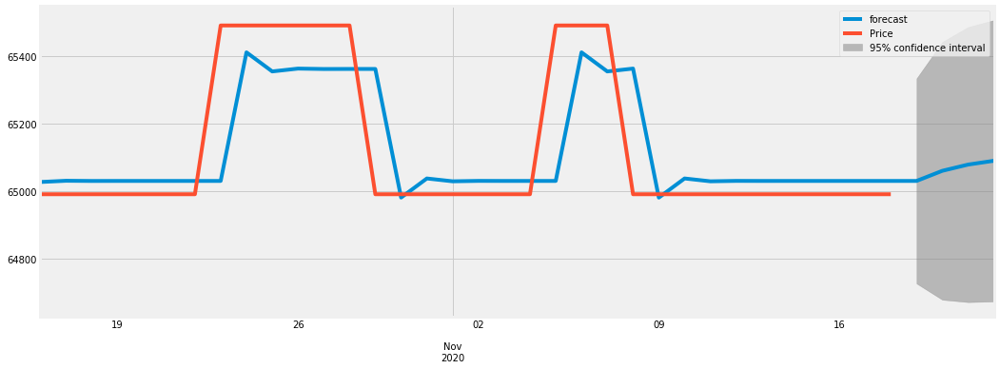

0.8979440794053768
2020-10-16    65026.248992
2020-10-17    65029.923738
2020-10-18    65029.323316
2020-10-19    65029.411070
2020-10-20    65029.398020
2020-10-21    65029.399956
2020-10-22    65029.399668
2020-10-23    65029.399711
2020-10-24    65410.394162
2020-10-25    65353.859773
2020-10-26    65362.248707
2020-10-27    65361.003903
2020-10-28    65361.188615
2020-10-29    65361.161206
2020-10-30    64980.170816
2020-10-31    65036.704602
2020-11-01    65028.315758
2020-11-02    65029.560548
2020-11-03    65029.375838
2020-11-04    65029.403247
2020-11-05    65029.399180
2020-11-06    65410.394241
2020-11-07    65353.859762
2020-11-08    65362.248709
2020-11-09    64980.009446
2020-11-10    65036.728547
2020-11-11    65028.312205
2020-11-12    65029.561076
2020-11-13    65029.375760
2020-11-14    65029.403259
2020-11-15    65029.399178
2020-11-16    65029.399784
2020-11-17    65029.399694
2020-11-18    65029.399707
2020-11-19    65029.399705
2020-11-20    65059.421844
2020-11-2

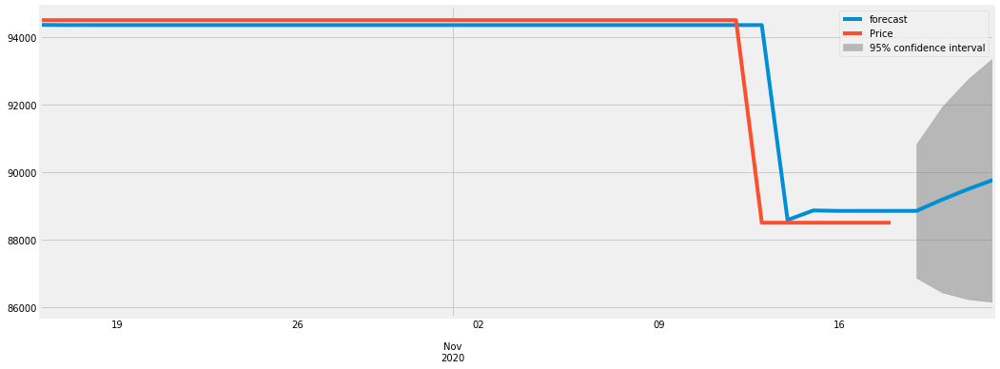

0.9930429925449459
2020-10-16    94359.751176
2020-10-17    94353.446770
2020-10-18    94353.769042
2020-10-19    94353.753311
2020-10-20    94353.754081
2020-10-21    94353.754043
2020-10-22    94353.754045
2020-10-23    94353.754045
2020-10-24    94353.754045
2020-10-25    94353.754045
2020-10-26    94353.754045
2020-10-27    94353.754045
2020-10-28    94353.754045
2020-10-29    94353.754045
2020-10-30    94353.754045
2020-10-31    94353.754045
2020-11-01    94353.754045
2020-11-02    94353.754045
2020-11-03    94353.754045
2020-11-04    94353.754045
2020-11-05    94353.754045
2020-11-06    94353.754045
2020-11-07    94353.754045
2020-11-08    94353.754045
2020-11-09    94353.754045
2020-11-10    94353.754045
2020-11-11    94353.754045
2020-11-12    94353.754045
2020-11-13    94353.754045
2020-11-14    88580.332382
2020-11-15    88862.766822
2020-11-16    88848.950195
2020-11-17    88849.626101
2020-11-18    88849.593036
2020-11-19    88849.594653
2020-11-20    89185.987465
2020-11-2

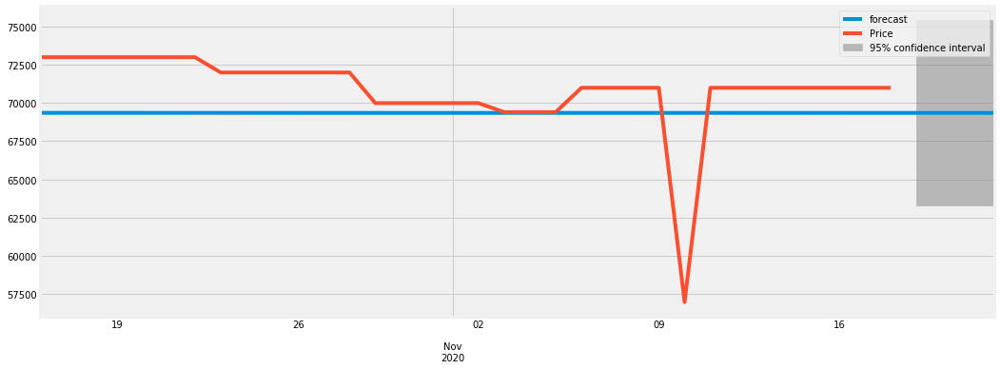

-0.35799716422413885
2020-10-16    69354.185620
2020-10-17    69353.836841
2020-10-18    69353.488061
2020-10-19    69353.139282
2020-10-20    69352.790502
2020-10-21    69352.441723
2020-10-22    69352.092943
2020-10-23    69351.744164
2020-10-24    69351.491396
2020-10-25    69351.238628
2020-10-26    69350.985860
2020-10-27    69350.733092
2020-10-28    69350.480324
2020-10-29    69350.227556
2020-10-30    69350.166922
2020-10-31    69350.106287
2020-11-01    69350.045653
2020-11-02    69349.985018
2020-11-03    69349.924383
2020-11-04    69349.920455
2020-11-05    69349.916526
2020-11-06    69349.912598
2020-11-07    69349.755807
2020-11-08    69349.599015
2020-11-09    69349.442224
2020-11-10    69349.285432
2020-11-11    69350.475116
2020-11-12    69350.318195
2020-11-13    69350.161275
2020-11-14    69350.004355
2020-11-15    69349.847434
2020-11-16    69349.690514
2020-11-17    69349.533594
2020-11-18    69349.376673
2020-11-19    69349.063037
2020-11-20    69349.064086
2020-11

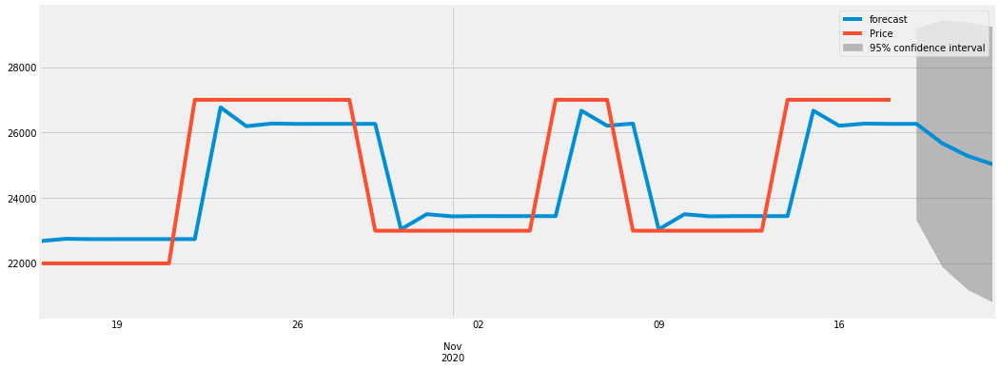

0.9215336495319773
2020-10-16    22672.399154
2020-10-17    22742.763431
2020-10-18    22731.661869
2020-10-19    22733.226593
2020-10-20    22733.002277
2020-10-21    22733.034357
2020-10-22    22733.029768
2020-10-23    26767.996753
2020-10-24    26190.767611
2020-10-25    26273.344118
2020-10-26    26261.530994
2020-10-27    26263.220941
2020-10-28    26262.979183
2020-10-29    26263.013768
2020-10-30    23033.424992
2020-10-31    23495.439369
2020-11-01    23429.345108
2020-11-02    23438.800336
2020-11-03    23437.447702
2020-11-04    23437.641206
2020-11-05    23437.613524
2020-11-06    26667.201312
2020-11-07    26205.187076
2020-11-08    26271.281317
2020-11-09    23032.242263
2020-11-10    23495.608567
2020-11-11    23429.320903
2020-11-12    23438.803799
2020-11-13    23437.447207
2020-11-14    23437.641276
2020-11-15    26667.197342
2020-11-16    26205.187644
2020-11-17    26271.281236
2020-11-18    26261.826103
2020-11-19    26263.178724
2020-11-20    25669.562260
2020-11-2

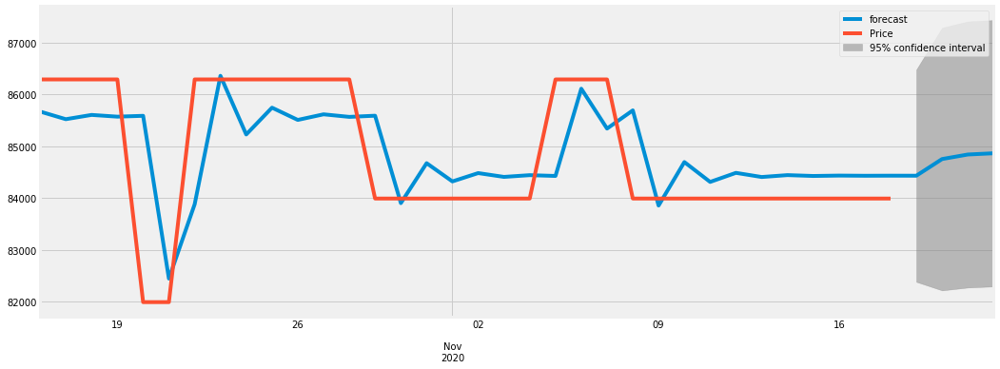

0.7591311118837542
2020-10-16    85670.193347
2020-10-17    85522.167236
2020-10-18    85604.725608
2020-10-19    85571.165649
2020-10-20    85587.238430
2020-10-21    82444.531846
2020-10-22    83880.086537
2020-10-23    86360.019889
2020-10-24    85227.052813
2020-10-25    85744.655919
2020-10-26    85508.185733
2020-10-27    85616.218662
2020-10-28    85566.863130
2020-10-29    85589.411521
2020-10-30    83901.828327
2020-10-31    84672.811519
2020-11-01    84320.582909
2020-11-02    84481.500806
2020-11-03    84407.984434
2020-11-04    84441.570859
2020-11-05    84426.226686
2020-11-06    86110.518587
2020-11-07    85341.039043
2020-11-08    85692.580702
2020-11-09    83854.694826
2020-11-10    84694.344761
2020-11-11    84310.745310
2020-11-12    84485.995176
2020-11-13    84405.931152
2020-11-14    84442.508914
2020-11-15    84425.798129
2020-11-16    84433.432559
2020-11-17    84429.944721
2020-11-18    84431.538162
2020-11-19    84430.810188
2020-11-20    84752.604904
2020-11-2

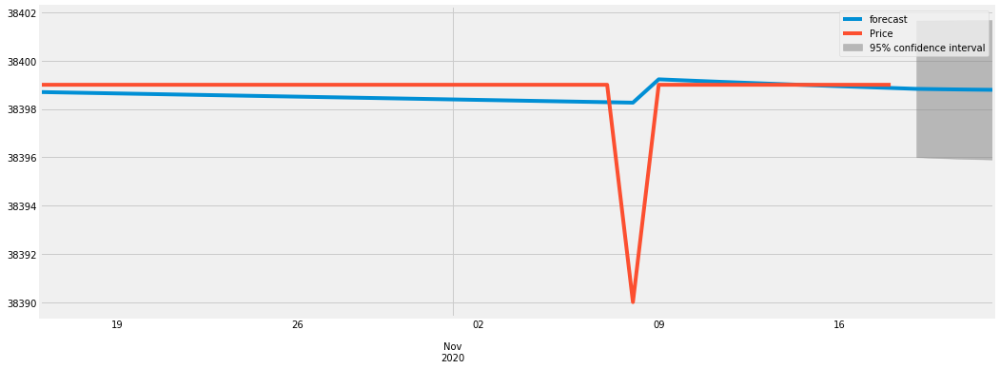

-0.1712833117580257
2020-10-16    38398.698553
2020-10-17    38398.679464
2020-10-18    38398.660376
2020-10-19    38398.641288
2020-10-20    38398.622199
2020-10-21    38398.603111
2020-10-22    38398.584022
2020-10-23    38398.564934
2020-10-24    38398.545846
2020-10-25    38398.526757
2020-10-26    38398.507669
2020-10-27    38398.488580
2020-10-28    38398.469492
2020-10-29    38398.450404
2020-10-30    38398.431315
2020-10-31    38398.412227
2020-11-01    38398.393138
2020-11-02    38398.374050
2020-11-03    38398.354962
2020-11-04    38398.335873
2020-11-05    38398.316785
2020-11-06    38398.297696
2020-11-07    38398.278608
2020-11-08    38398.259520
2020-11-09    38399.225286
2020-11-10    38399.181448
2020-11-11    38399.138823
2020-11-12    38399.097324
2020-11-13    38399.056873
2020-11-14    38399.017397
2020-11-15    38398.978832
2020-11-16    38398.941118
2020-11-17    38398.904199
2020-11-18    38398.868027
2020-11-19    38398.829850
2020-11-20    38398.814679
2020-11-

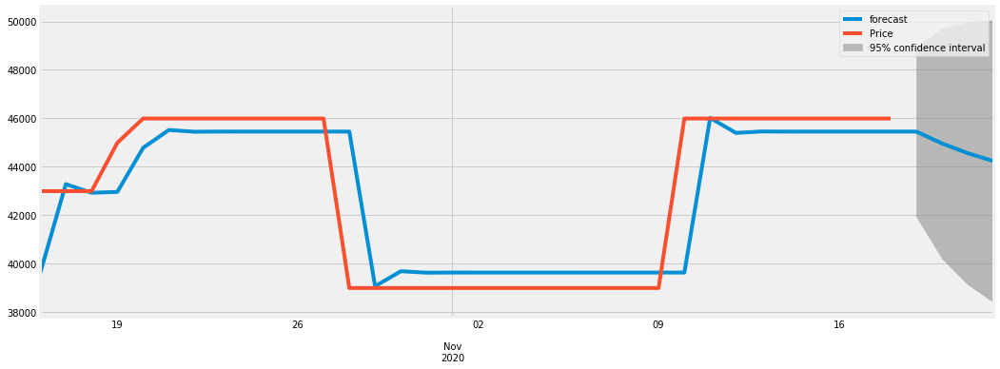

0.973494407741253
2020-10-16    39584.362049
2020-10-17    43280.070345
2020-10-18    42923.898065
2020-10-19    42958.434430
2020-10-20    44780.090021
2020-10-21    45515.945841
2020-10-22    45444.589686
2020-10-23    45451.509114
2020-10-24    45450.838135
2020-10-25    45450.903200
2020-10-26    45450.896890
2020-10-27    45450.897502
2020-10-28    45450.897443
2020-10-29    39063.381384
2020-10-30    39682.780686
2020-10-31    39622.717355
2020-11-01    39628.541713
2020-11-02    39627.976924
2020-11-03    39628.031691
2020-11-04    39628.026381
2020-11-05    39628.026896
2020-11-06    39628.026846
2020-11-07    39628.026851
2020-11-08    39628.026850
2020-11-09    39628.026850
2020-11-10    39628.026850
2020-11-11    46015.542915
2020-11-12    45396.143612
2020-11-13    45456.206944
2020-11-14    45450.382585
2020-11-15    45450.947375
2020-11-16    45450.892607
2020-11-17    45450.897918
2020-11-18    45450.897403
2020-11-19    45450.897453
2020-11-20    44958.965136
2020-11-21

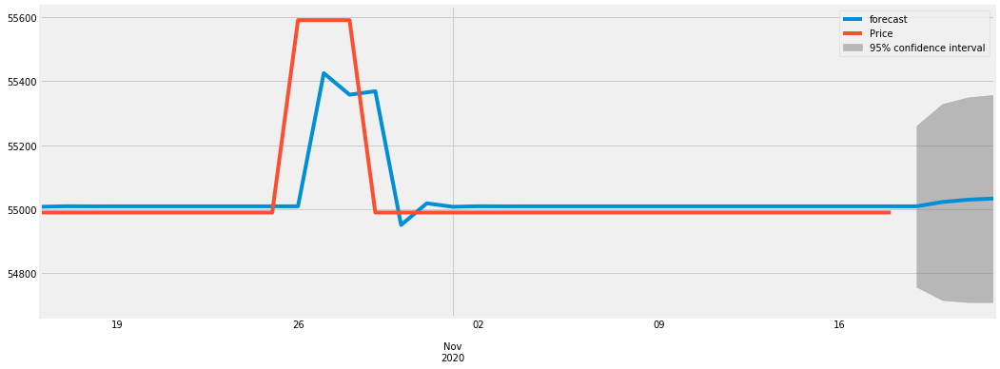

0.8541278499758063
2020-10-16    55007.896794
2020-10-17    55009.696583
2020-10-18    55009.375863
2020-10-19    55009.426960
2020-10-20    55009.418663
2020-10-21    55009.420006
2020-10-22    55009.419788
2020-10-23    55009.419824
2020-10-24    55009.419818
2020-10-25    55009.419819
2020-10-26    55009.419819
2020-10-27    55425.443483
2020-10-28    55358.064323
2020-10-29    55368.977046
2020-10-30    54951.185958
2020-10-31    55018.851370
2020-11-01    55007.892285
2020-11-02    55009.667218
2020-11-03    55009.379750
2020-11-04    55009.426308
2020-11-05    55009.418768
2020-11-06    55009.419989
2020-11-07    55009.419791
2020-11-08    55009.419823
2020-11-09    55009.419818
2020-11-10    55009.419819
2020-11-11    55009.419819
2020-11-12    55009.419819
2020-11-13    55009.419819
2020-11-14    55009.419819
2020-11-15    55009.419819
2020-11-16    55009.419819
2020-11-17    55009.419819
2020-11-18    55009.419819
2020-11-19    55009.419819
2020-11-20    55022.862588
2020-11-2

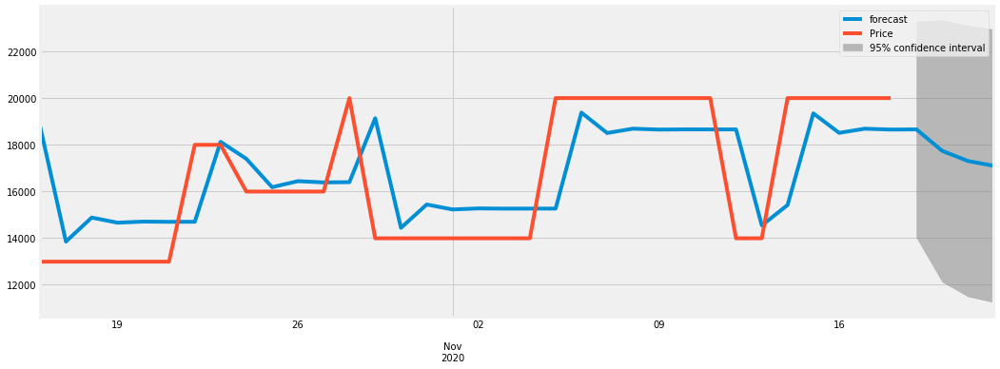

0.8326714588335301
2020-10-16    18771.728217
2020-10-17    13850.410908
2020-10-18    14876.022501
2020-10-19    14657.907856
2020-10-20    14704.254286
2020-10-21    14694.402985
2020-10-22    14696.496822
2020-10-23    18119.073506
2020-10-24    17391.616164
2020-10-25    16177.026124
2020-10-26    16435.183216
2020-10-27    16380.312781
2020-10-28    16391.975310
2020-10-29    19127.913857
2020-10-30    14438.773109
2020-10-31    15435.434450
2020-11-01    15223.597382
2020-11-02    15268.622649
2020-11-03    15259.052678
2020-11-04    15261.086743
2020-11-05    15260.654409
2020-11-06    19368.372369
2020-11-07    18495.290516
2020-11-08    18680.861173
2020-11-09    18641.418745
2020-11-10    18649.802102
2020-11-11    18648.020247
2020-11-12    18648.398975
2020-11-13    14540.692409
2020-11-14    15413.771840
2020-11-15    19335.827766
2020-11-16    18502.207764
2020-11-17    18679.390935
2020-11-18    18641.731239
2020-11-19    18649.735683
2020-11-20    17730.483590
2020-11-2

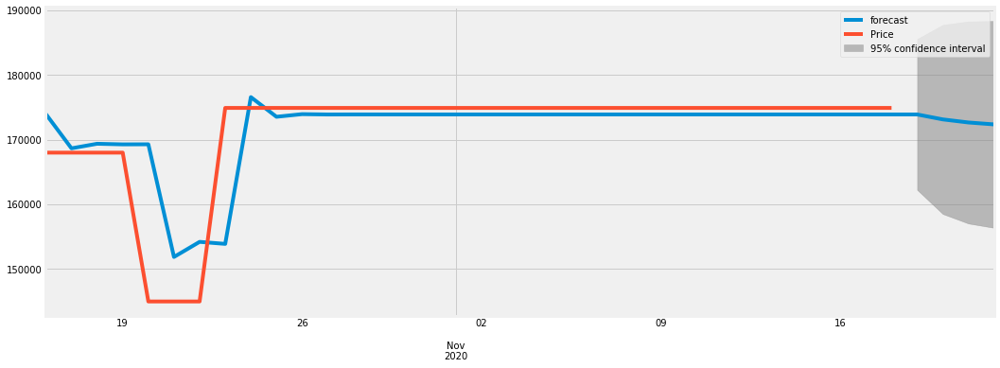

0.9000847792207294
2020-10-16    173965.734231
2020-10-17    168657.009241
2020-10-18    169361.917207
2020-10-19    169267.389066
2020-10-20    169280.062995
2020-10-21    151867.750825
2020-10-22    154202.411883
2020-10-23    153889.378082
2020-10-24    176572.716493
2020-10-25    173531.310711
2020-10-26    173939.105585
2020-10-27    173884.428021
2020-10-28    173891.759246
2020-10-29    173890.776268
2020-10-30    173890.908066
2020-10-31    173890.890395
2020-11-01    173890.892764
2020-11-02    173890.892446
2020-11-03    173890.892489
2020-11-04    173890.892483
2020-11-05    173890.892484
2020-11-06    173890.892484
2020-11-07    173890.892484
2020-11-08    173890.892484
2020-11-09    173890.892484
2020-11-10    173890.892484
2020-11-11    173890.892484
2020-11-12    173890.892484
2020-11-13    173890.892484
2020-11-14    173890.892484
2020-11-15    173890.892484
2020-11-16    173890.892484
2020-11-17    173890.892484
2020-11-18    173890.892484
2020-11-19    173890.892484
2

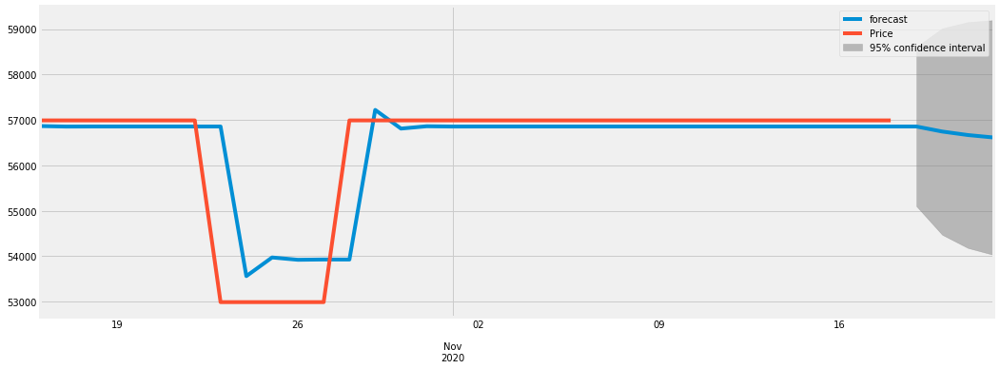

0.934232279623685
2020-10-16    56865.670780
2020-10-17    56854.103710
2020-10-18    56855.681037
2020-10-19    56855.486512
2020-10-20    56855.510819
2020-10-21    56855.507787
2020-10-22    56855.508165
2020-10-23    56855.508118
2020-10-24    53562.179376
2020-10-25    53973.100482
2020-10-26    53921.828298
2020-10-27    53928.225723
2020-10-28    53927.427492
2020-10-29    57220.855838
2020-10-30    56809.922304
2020-10-31    56861.196038
2020-11-01    56854.798420
2020-11-02    56855.596675
2020-11-03    56855.497074
2020-11-04    56855.509502
2020-11-05    56855.507951
2020-11-06    56855.508145
2020-11-07    56855.508120
2020-11-08    56855.508123
2020-11-09    56855.508123
2020-11-10    56855.508123
2020-11-11    56855.508123
2020-11-12    56855.508123
2020-11-13    56855.508123
2020-11-14    56855.508123
2020-11-15    56855.508123
2020-11-16    56855.508123
2020-11-17    56855.508123
2020-11-18    56855.508123
2020-11-19    56855.508123
2020-11-20    56744.776632
2020-11-21

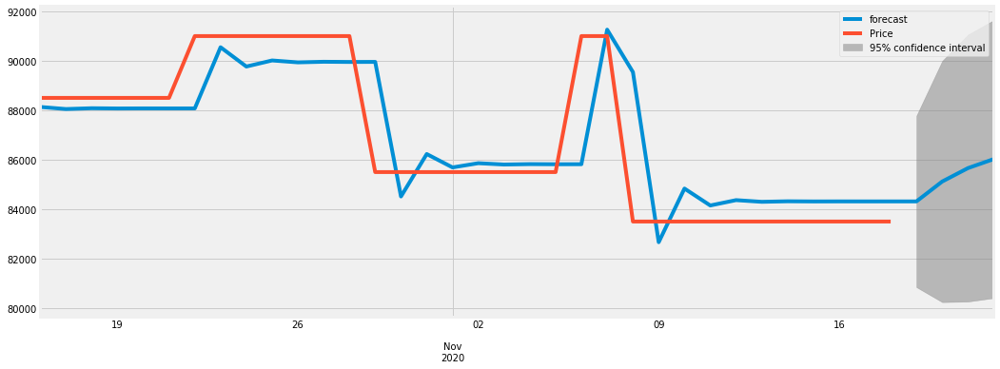

0.9332094320212512
2020-10-16    88124.152319
2020-10-17    88038.812962
2020-10-18    88071.804323
2020-10-19    88062.167232
2020-10-20    88065.276041
2020-10-21    88064.302838
2020-10-22    88064.610431
2020-10-23    90538.157928
2020-10-24    89758.149638
2020-10-25    90004.117413
2020-10-26    89926.553947
2020-10-27    89951.012807
2020-10-28    89943.299951
2020-10-29    89945.732123
2020-10-30    84502.947331
2020-10-31    86219.274812
2020-11-01    85678.048191
2020-11-02    85848.718566
2020-11-03    85794.899378
2020-11-04    85811.870718
2020-11-05    85806.518977
2020-11-06    85808.206595
2020-11-07    91249.692252
2020-11-08    89533.774440
2020-11-09    82653.938471
2020-11-10    84823.425597
2020-11-11    84139.299636
2020-11-12    84355.031882
2020-11-13    84287.002887
2020-11-14    84308.455147
2020-11-15    84301.690392
2020-11-16    84303.823590
2020-11-17    84303.150907
2020-11-18    84303.363031
2020-11-19    84303.296140
2020-11-20    85108.039432
2020-11-2

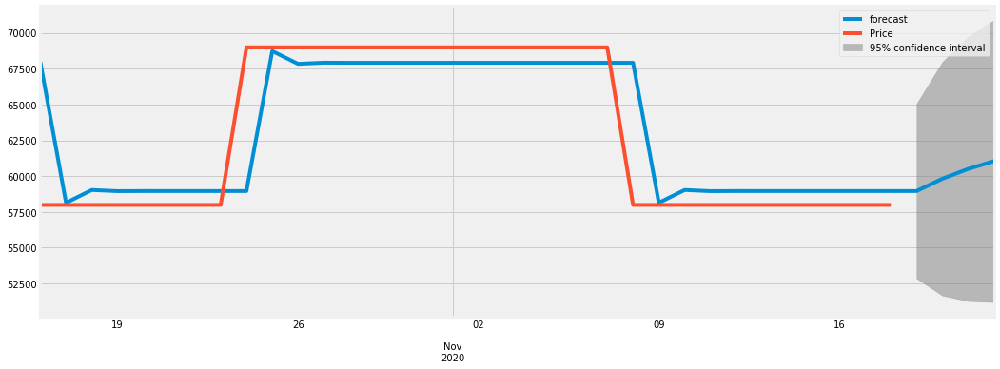

0.9678318672390224
2020-10-16    67978.450779
2020-10-17    58140.732169
2020-10-18    59031.443256
2020-10-19    58950.333165
2020-10-20    58957.719135
2020-10-21    58957.046557
2020-10-22    58957.107803
2020-10-23    58957.102226
2020-10-24    58957.102734
2020-10-25    68724.836053
2020-10-26    67835.371622
2020-10-27    67916.367586
2020-10-28    67908.991972
2020-10-29    67909.663607
2020-10-30    67909.602447
2020-10-31    67909.608016
2020-11-01    67909.607509
2020-11-02    67909.607555
2020-11-03    67909.607551
2020-11-04    67909.607551
2020-11-05    67909.607551
2020-11-06    67909.607551
2020-11-07    67909.607551
2020-11-08    67909.607551
2020-11-09    58141.874186
2020-11-10    59031.338621
2020-11-11    58950.342657
2020-11-12    58957.718271
2020-11-13    58957.046636
2020-11-14    58957.107796
2020-11-15    58957.102227
2020-11-16    58957.102734
2020-11-17    58957.102688
2020-11-18    58957.102692
2020-11-19    58957.102692
2020-11-20    59815.866440
2020-11-2

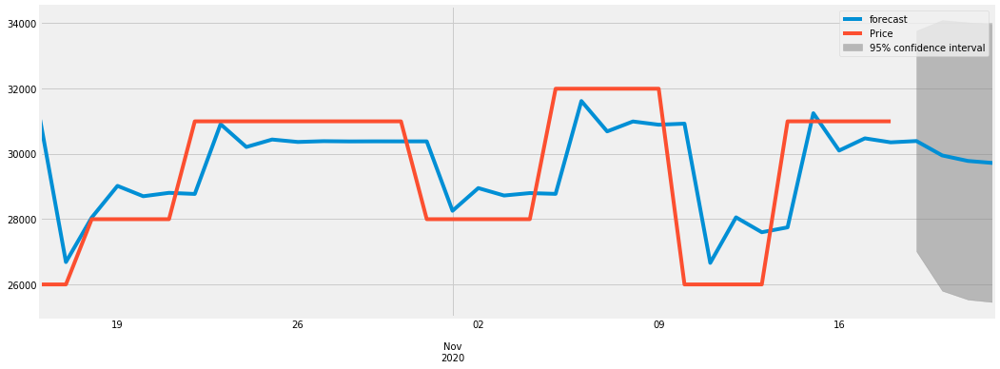

0.8047354417062695
2020-10-16    31034.992890
2020-10-17    26675.644030
2020-10-18    28039.522063
2020-10-19    29011.662897
2020-10-20    28693.677654
2020-10-21    28797.678336
2020-10-22    28763.658013
2020-10-23    30903.555938
2020-10-24    30203.581089
2020-10-25    30432.547533
2020-10-26    30357.651082
2020-10-27    30382.150211
2020-10-28    30374.136382
2020-10-29    30376.757759
2020-10-30    30375.900289
2020-10-31    30376.180773
2020-11-01    28247.319192
2020-11-02    28943.684021
2020-11-03    28715.898438
2020-11-04    28790.408622
2020-11-05    28766.035844
2020-11-06    31612.368120
2020-11-07    30681.313840
2020-11-08    30985.867907
2020-11-09    30886.246240
2020-11-10    30918.833152
2020-11-11    26650.634089
2020-11-12    28046.790483
2020-11-13    27590.098411
2020-11-14    27739.485435
2020-11-15    31238.569664
2020-11-16    30093.995864
2020-11-17    30468.393592
2020-11-18    30345.925597
2020-11-19    30385.985695
2020-11-20    29944.279293
2020-11-2

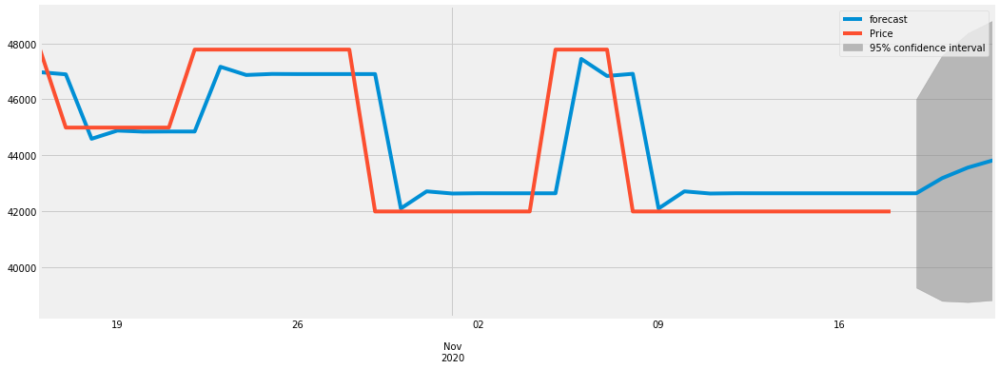

0.9366916073376064
2020-10-16    46971.980740
2020-10-17    46894.952344
2020-10-18    44589.678017
2020-10-19    44882.728973
2020-10-20    44845.471277
2020-10-21    44850.208135
2020-10-22    44849.605901
2020-10-23    47165.734937
2020-10-24    46871.267665
2020-10-25    46908.705551
2020-10-26    46903.945785
2020-10-27    46904.550931
2020-10-28    46904.473994
2020-10-29    46904.483775
2020-10-30    42098.051063
2020-10-31    42709.129767
2020-11-01    42631.438638
2020-11-02    42641.316108
2020-11-03    42640.060310
2020-11-04    42640.219969
2020-11-05    42640.199670
2020-11-06    47446.633720
2020-11-07    46835.554846
2020-11-08    46913.245996
2020-11-09    42096.937055
2020-11-10    42709.271400
2020-11-11    42631.420632
2020-11-12    42641.318398
2020-11-13    42640.060019
2020-11-14    42640.220006
2020-11-15    42640.199666
2020-11-16    42640.202252
2020-11-17    42640.201923
2020-11-18    42640.201965
2020-11-19    42640.201959
2020-11-20    43179.951728
2020-11-2

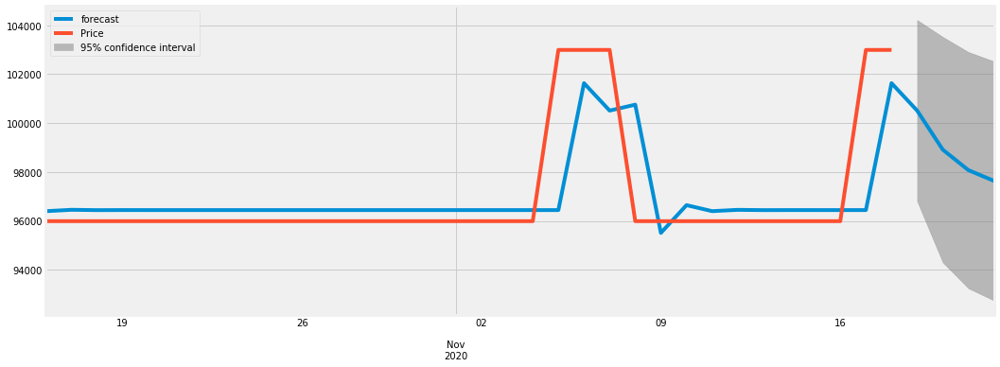

0.869770876134563
2020-10-16     96398.223877
2020-10-17     96454.271586
2020-10-18     96440.505011
2020-10-19     96443.392563
2020-10-20     96442.764362
2020-10-21     96442.899972
2020-10-22     96442.870648
2020-10-23     96442.876987
2020-10-24     96442.875616
2020-10-25     96442.875913
2020-10-26     96442.875849
2020-10-27     96442.875862
2020-10-28     96442.875859
2020-10-29     96442.875860
2020-10-30     96442.875860
2020-10-31     96442.875860
2020-11-01     96442.875860
2020-11-02     96442.875860
2020-11-03     96442.875860
2020-11-04     96442.875860
2020-11-05     96442.875860
2020-11-06    101631.009846
2020-11-07    100509.491799
2020-11-08    100751.930166
2020-11-09     95511.388319
2020-11-10     96644.235364
2020-11-11     96399.348010
2020-11-12     96452.285268
2020-11-13     96440.841830
2020-11-14     96443.315556
2020-11-15     96442.780811
2020-11-16     96442.896407
2020-11-17     96442.871418
2020-11-18    101631.010806
2020-11-19    100509.491591
20

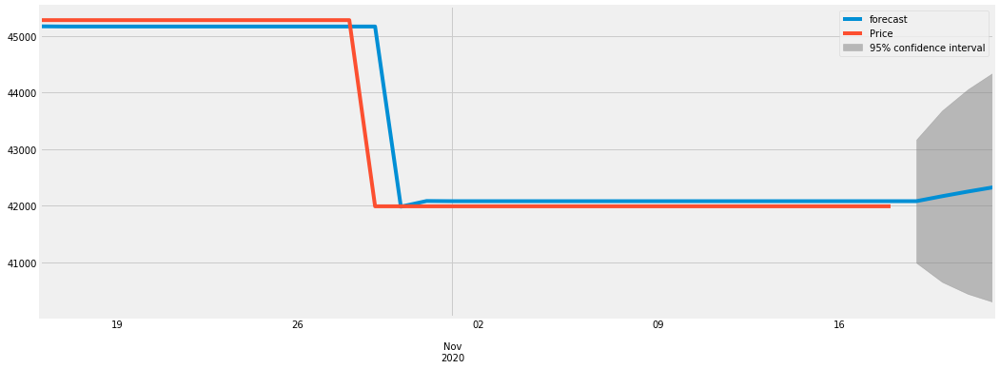

0.9962424079265061
2020-10-16    45170.418234
2020-10-17    45167.195435
2020-10-18    45167.299329
2020-10-19    45167.296079
2020-10-20    45167.296181
2020-10-21    45167.296177
2020-10-22    45167.296178
2020-10-23    45167.296178
2020-10-24    45167.296178
2020-10-25    45167.296178
2020-10-26    45167.296178
2020-10-27    45167.296178
2020-10-28    45167.296178
2020-10-29    45167.296178
2020-10-30    41983.863392
2020-10-31    42083.557068
2020-11-01    42080.435020
2020-11-02    42080.532792
2020-11-03    42080.529730
2020-11-04    42080.529826
2020-11-05    42080.529823
2020-11-06    42080.529823
2020-11-07    42080.529823
2020-11-08    42080.529823
2020-11-09    42080.529823
2020-11-10    42080.529823
2020-11-11    42080.529823
2020-11-12    42080.529823
2020-11-13    42080.529823
2020-11-14    42080.529823
2020-11-15    42080.529823
2020-11-16    42080.529823
2020-11-17    42080.529823
2020-11-18    42080.529823
2020-11-19    42080.529823
2020-11-20    42168.127272
2020-11-2

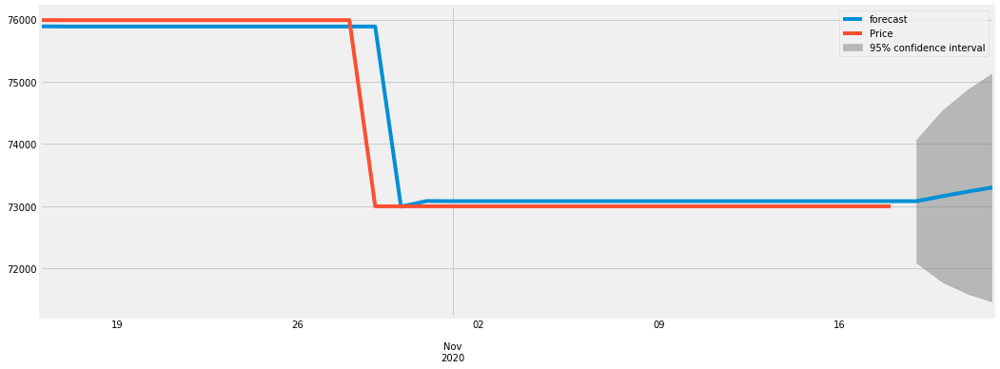

0.9962434839060771
2020-10-16    75890.397955
2020-10-17    75887.468350
2020-10-18    75887.562802
2020-10-19    75887.559847
2020-10-20    75887.559939
2020-10-21    75887.559936
2020-10-22    75887.559936
2020-10-23    75887.559936
2020-10-24    75887.559936
2020-10-25    75887.559936
2020-10-26    75887.559936
2020-10-27    75887.559936
2020-10-28    75887.559936
2020-10-29    75887.559936
2020-10-30    72993.405460
2020-10-31    73084.048698
2020-11-01    73081.209804
2020-11-02    73081.298717
2020-11-03    73081.295932
2020-11-04    73081.296019
2020-11-05    73081.296016
2020-11-06    73081.296016
2020-11-07    73081.296016
2020-11-08    73081.296016
2020-11-09    73081.296016
2020-11-10    73081.296016
2020-11-11    73081.296016
2020-11-12    73081.296016
2020-11-13    73081.296016
2020-11-14    73081.296016
2020-11-15    73081.296016
2020-11-16    73081.296016
2020-11-17    73081.296016
2020-11-18    73081.296016
2020-11-19    73081.296016
2020-11-20    73160.927372
2020-11-2

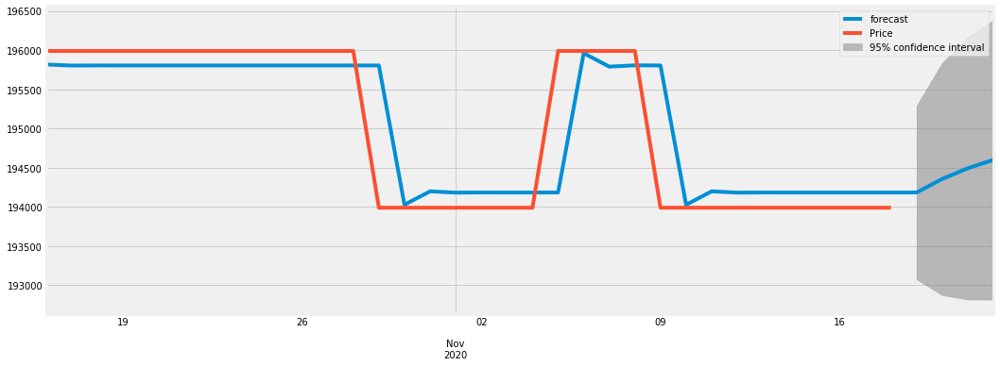

0.9667537531022747
2020-10-16    195817.251695
2020-10-17    195803.632353
2020-10-18    195805.048489
2020-10-19    195804.913029
2020-10-20    195804.926095
2020-10-21    195804.924836
2020-10-22    195804.924957
2020-10-23    195804.924946
2020-10-24    195804.924947
2020-10-25    195804.924947
2020-10-26    195804.924947
2020-10-27    195804.924947
2020-10-28    195804.924947
2020-10-29    195804.924947
2020-10-30    194027.707248
2020-10-31    194199.007426
2020-11-01    194182.496364
2020-11-02    194184.087811
2020-11-03    194183.934417
2020-11-04    194183.949202
2020-11-05    194183.947777
2020-11-06    195961.165613
2020-11-07    195789.865422
2020-11-08    195806.376485
2020-11-09    195804.785038
2020-11-10    194027.720734
2020-11-11    194199.006126
2020-11-12    194182.496489
2020-11-13    194184.087799
2020-11-14    194183.934418
2020-11-15    194183.949202
2020-11-16    194183.947777
2020-11-17    194183.947914
2020-11-18    194183.947901
2020-11-19    194183.947902
2

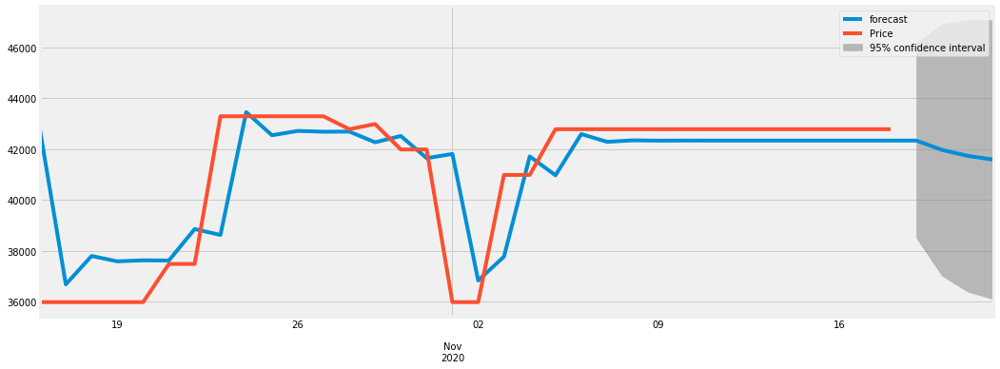

0.913919680719797
2020-10-16    42752.553063
2020-10-17    36687.393347
2020-10-18    37803.340197
2020-10-19    37593.641728
2020-10-20    37633.024225
2020-10-21    37625.626324
2020-10-22    38862.566997
2020-10-23    38630.218243
2020-10-24    43456.269236
2020-10-25    42549.736727
2020-10-26    42720.021125
2020-10-27    42688.034654
2020-10-28    42694.043039
2020-10-29    42273.650759
2020-10-30    42519.829105
2020-10-31    41649.885903
2020-11-01    41813.297312
2020-11-02    36840.397676
2020-11-03    37774.514450
2020-11-04    41717.552081
2020-11-05    40976.886099
2020-11-06    42596.204042
2020-11-07    42292.028980
2020-11-08    42349.165671
2020-11-09    42338.433031
2020-11-10    42340.449066
2020-11-11    42340.070371
2020-11-12    42340.141506
2020-11-13    42340.128143
2020-11-14    42340.130653
2020-11-15    42340.130182
2020-11-16    42340.130271
2020-11-17    42340.130254
2020-11-18    42340.130257
2020-11-19    42340.130256
2020-11-20    41972.043336
2020-11-21

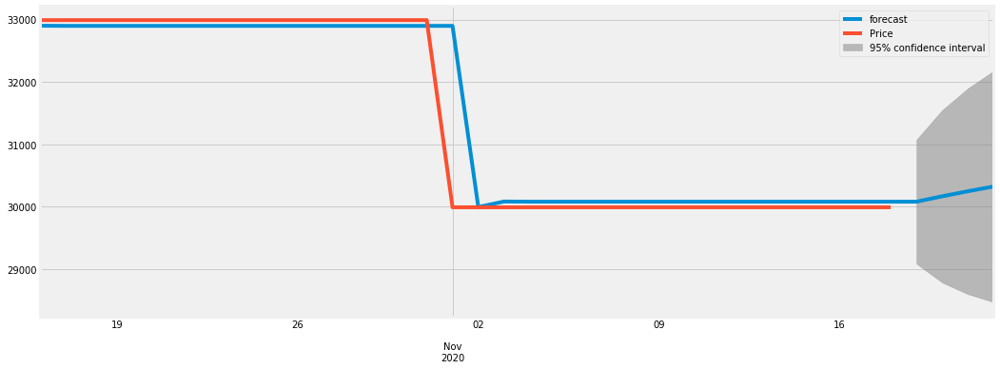

0.9964364931602568
2020-10-16    32900.348174
2020-10-17    32897.796597
2020-10-18    32897.876023
2020-10-19    32897.873621
2020-10-20    32897.873694
2020-10-21    32897.873692
2020-10-22    32897.873692
2020-10-23    32897.873692
2020-10-24    32897.873692
2020-10-25    32897.873692
2020-10-26    32897.873692
2020-10-27    32897.873692
2020-10-28    32897.873692
2020-10-29    32897.873692
2020-10-30    32897.873692
2020-10-31    32897.873692
2020-11-01    32897.873692
2020-11-02    29994.163593
2020-11-03    30082.050042
2020-11-04    30079.389987
2020-11-05    30079.470499
2020-11-06    30079.468062
2020-11-07    30079.468136
2020-11-08    30079.468133
2020-11-09    30079.468134
2020-11-10    30079.468134
2020-11-11    30079.468134
2020-11-12    30079.468134
2020-11-13    30079.468134
2020-11-14    30079.468134
2020-11-15    30079.468134
2020-11-16    30079.468134
2020-11-17    30079.468134
2020-11-18    30079.468134
2020-11-19    30079.468134
2020-11-20    30166.064641
2020-11-2

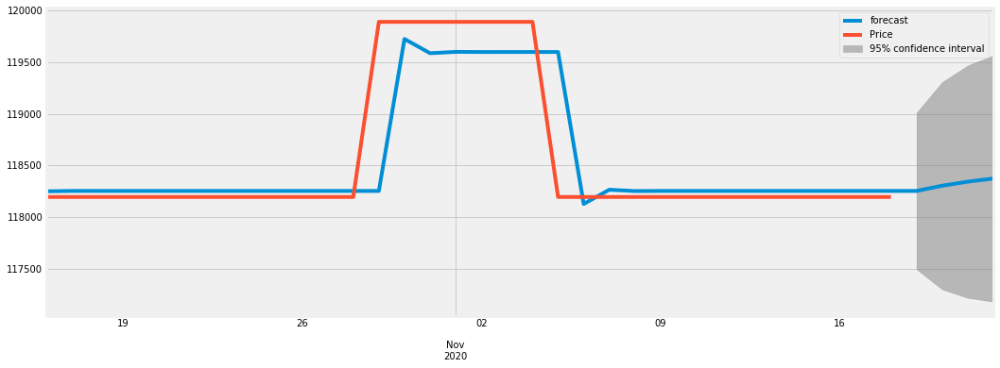

0.9601232816900995
2020-10-16    118249.583684
2020-10-17    118253.683476
2020-10-18    118253.270765
2020-10-19    118253.309139
2020-10-20    118253.305543
2020-10-21    118253.305880
2020-10-22    118253.305848
2020-10-23    118253.305851
2020-10-24    118253.305851
2020-10-25    118253.305851
2020-10-26    118253.305851
2020-10-27    118253.305851
2020-10-28    118253.305851
2020-10-29    118253.305851
2020-10-30    119724.312578
2020-10-31    119586.570364
2020-11-01    119599.468278
2020-11-02    119598.260542
2020-11-03    119598.373632
2020-11-04    119598.363043
2020-11-05    119598.364034
2020-11-06    118127.357215
2020-11-07    118265.099437
2020-11-08    118252.201523
2020-11-09    118253.409258
2020-11-10    118253.296168
2020-11-11    118253.306758
2020-11-12    118253.305766
2020-11-13    118253.305859
2020-11-14    118253.305850
2020-11-15    118253.305851
2020-11-16    118253.305851
2020-11-17    118253.305851
2020-11-18    118253.305851
2020-11-19    118253.305851
2

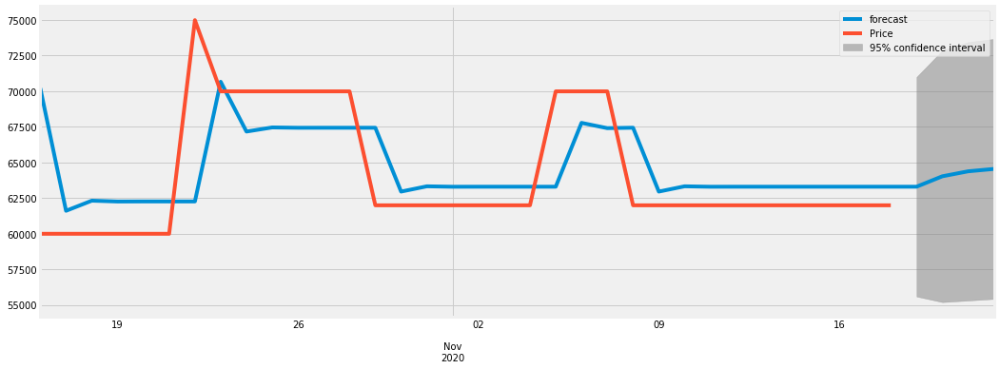

0.7826203747935071
2020-10-16    70216.418405
2020-10-17    61604.395114
2020-10-18    62314.765781
2020-10-19    62256.031040
2020-10-20    62260.887171
2020-10-21    62260.485669
2020-10-22    62260.518865
2020-10-23    70663.730847
2020-10-24    67167.887474
2020-10-25    67456.921404
2020-10-26    67433.024277
2020-10-27    67435.000075
2020-10-28    67434.836717
2020-10-29    67434.850224
2020-10-30    62953.134586
2020-10-31    63323.679758
2020-11-01    63293.043338
2020-11-02    63295.576336
2020-11-03    63295.366910
2020-11-04    63295.384225
2020-11-05    63295.382793
2020-11-06    67777.097432
2020-11-07    67406.552343
2020-11-08    67437.188756
2020-11-09    62952.941238
2020-11-10    63323.695744
2020-11-11    63293.042016
2020-11-12    63295.576445
2020-11-13    63295.366901
2020-11-14    63295.384226
2020-11-15    63295.382793
2020-11-16    63295.382912
2020-11-17    63295.382902
2020-11-18    63295.382903
2020-11-19    63295.382902
2020-11-20    64026.677091
2020-11-2

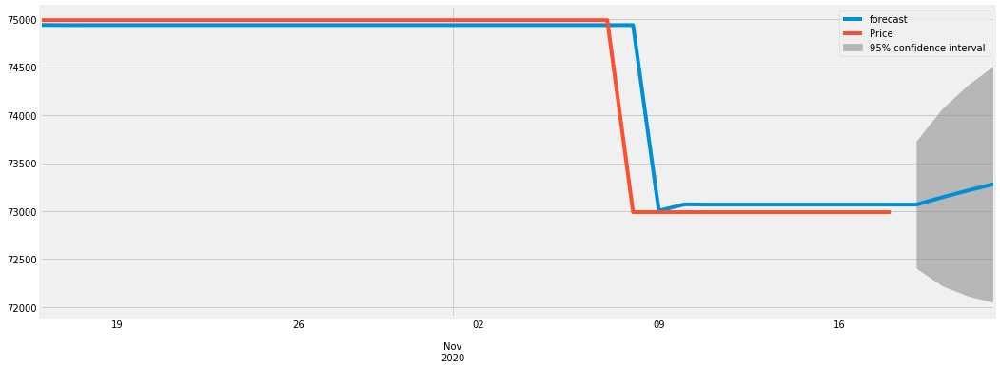

0.9957950441073216
2020-10-16    74939.776741
2020-10-17    74938.165379
2020-10-18    74938.222404
2020-10-19    74938.220450
2020-10-20    74938.220517
2020-10-21    74938.220515
2020-10-22    74938.220515
2020-10-23    74938.220515
2020-10-24    74938.220515
2020-10-25    74938.220515
2020-10-26    74938.220515
2020-10-27    74938.220515
2020-10-28    74938.220515
2020-10-29    74938.220515
2020-10-30    74938.220515
2020-10-31    74938.220515
2020-11-01    74938.220515
2020-11-02    74938.220515
2020-11-03    74938.220515
2020-11-04    74938.220515
2020-11-05    74938.220515
2020-11-06    74938.220515
2020-11-07    74938.220515
2020-11-08    74938.220515
2020-11-09    73004.716418
2020-11-10    73071.013882
2020-11-11    73068.740624
2020-11-12    73068.818572
2020-11-13    73068.815899
2020-11-14    73068.815990
2020-11-15    73068.815987
2020-11-16    73068.815987
2020-11-17    73068.815987
2020-11-18    73068.815987
2020-11-19    73068.815987
2020-11-20    73145.011505
2020-11-2

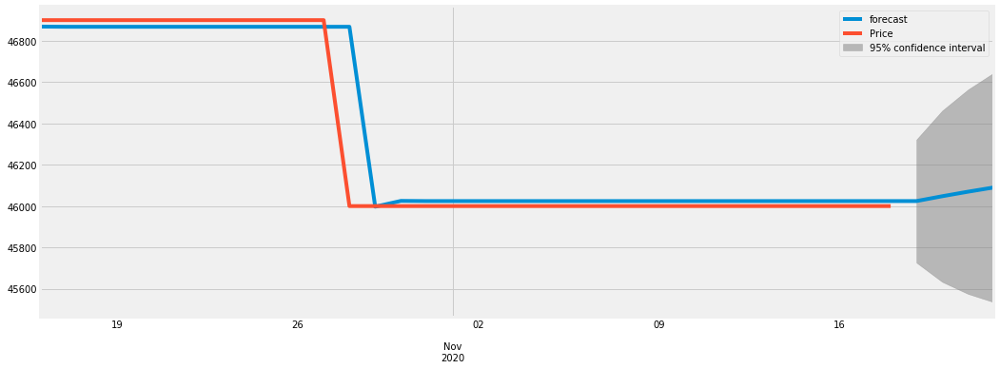

0.9961079356108871
2020-10-16    46868.754514
2020-10-17    46867.814826
2020-10-18    46867.845851
2020-10-19    46867.844858
2020-10-20    46867.844890
2020-10-21    46867.844889
2020-10-22    46867.844889
2020-10-23    46867.844889
2020-10-24    46867.844889
2020-10-25    46867.844889
2020-10-26    46867.844889
2020-10-27    46867.844889
2020-10-28    46867.844889
2020-10-29    45997.186856
2020-10-30    46025.093909
2020-10-31    46024.199409
2020-11-01    46024.228081
2020-11-02    46024.227162
2020-11-03    46024.227191
2020-11-04    46024.227190
2020-11-05    46024.227190
2020-11-06    46024.227190
2020-11-07    46024.227190
2020-11-08    46024.227190
2020-11-09    46024.227190
2020-11-10    46024.227190
2020-11-11    46024.227190
2020-11-12    46024.227190
2020-11-13    46024.227190
2020-11-14    46024.227190
2020-11-15    46024.227190
2020-11-16    46024.227190
2020-11-17    46024.227190
2020-11-18    46024.227190
2020-11-19    46024.227190
2020-11-20    46047.664521
2020-11-2

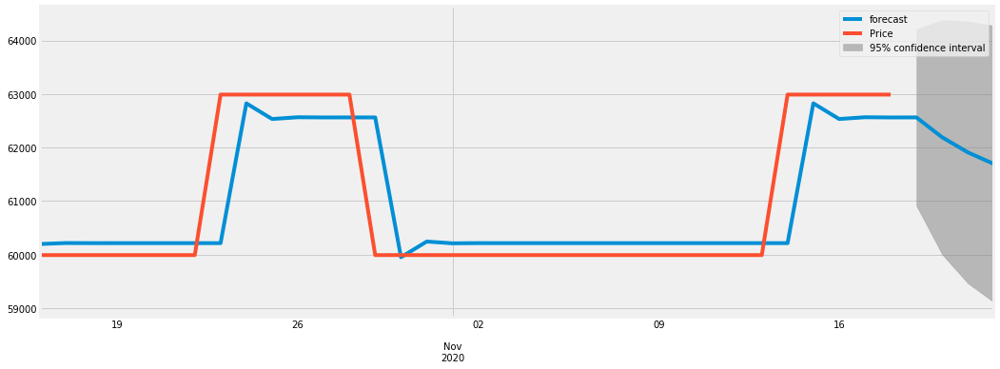

0.9573053287939227
2020-10-16    60197.090970
2020-10-17    60215.514744
2020-10-18    60213.263259
2020-10-19    60213.513427
2020-10-20    60213.485318
2020-10-21    60213.488473
2020-10-22    60213.488119
2020-10-23    60213.488158
2020-10-24    62826.705294
2020-10-25    62533.416137
2020-10-26    62566.332854
2020-10-27    62562.638513
2020-10-28    62563.053140
2020-10-29    62563.006605
2020-10-30    59949.794688
2020-10-31    60243.083259
2020-11-01    60210.166607
2020-11-02    60213.860942
2020-11-03    60213.446315
2020-11-04    60213.492850
2020-11-05    60213.487627
2020-11-06    60213.488214
2020-11-07    60213.488148
2020-11-08    60213.488155
2020-11-09    60213.488154
2020-11-10    60213.488154
2020-11-11    60213.488154
2020-11-12    60213.488154
2020-11-13    60213.488154
2020-11-14    60213.488154
2020-11-15    62826.705294
2020-11-16    62533.416137
2020-11-17    62566.332854
2020-11-18    62562.638513
2020-11-19    62563.053140
2020-11-20    62191.104987
2020-11-2

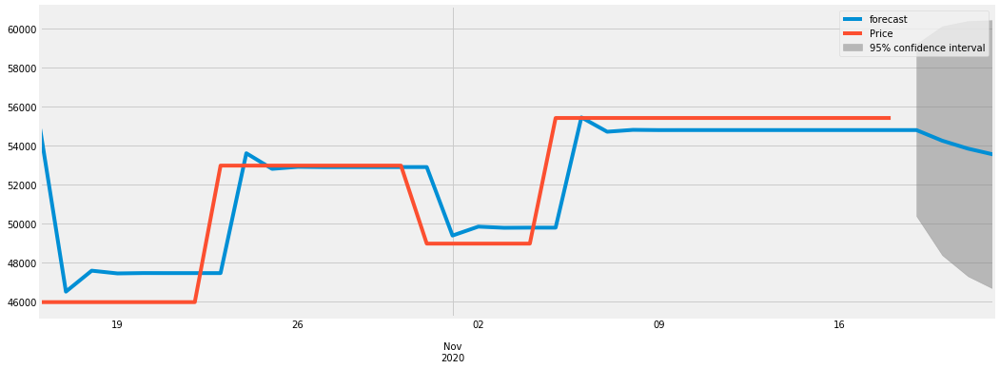

0.9529031982714009
2020-10-16    54862.001085
2020-10-17    46527.931351
2020-10-18    47601.523840
2020-10-19    47461.622449
2020-10-20    47479.850993
2020-10-21    47477.475800
2020-10-22    47477.785288
2020-10-23    47477.744962
2020-10-24    53623.525396
2020-10-25    52822.728926
2020-10-26    52927.072873
2020-10-27    52913.476834
2020-10-28    52915.248401
2020-10-29    52915.017566
2020-10-30    52915.047643
2020-10-31    52915.043724
2020-11-01    49403.172704
2020-11-02    49860.770229
2020-11-03    49801.145176
2020-11-04    49808.914333
2020-11-05    49807.902010
2020-11-06    55463.025050
2020-11-07    54726.161340
2020-11-08    54822.174835
2020-11-09    54809.664256
2020-11-10    54811.294387
2020-11-11    54811.081981
2020-11-12    54811.109657
2020-11-13    54811.106051
2020-11-14    54811.106521
2020-11-15    54811.106460
2020-11-16    54811.106468
2020-11-17    54811.106467
2020-11-18    54811.106467
2020-11-19    54811.106467
2020-11-20    54266.859854
2020-11-2

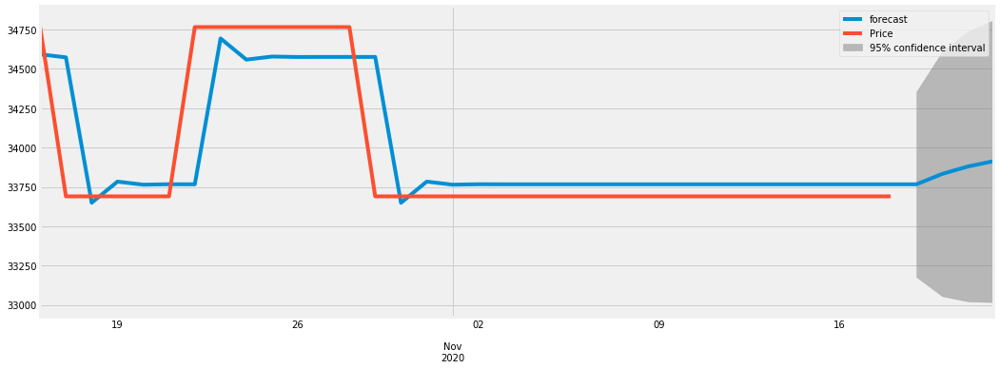

0.9426425012191444
2020-10-16    34592.701290
2020-10-17    34573.473927
2020-10-18    33649.560874
2020-10-19    33783.671037
2020-10-20    33764.199436
2020-10-21    33767.026542
2020-10-22    33766.616071
2020-10-23    34693.730668
2020-10-24    34559.121651
2020-10-25    34578.665716
2020-10-26    34575.828087
2020-10-27    34576.240086
2020-10-28    34576.180267
2020-10-29    34576.188952
2020-10-30    33649.132691
2020-10-31    33783.733238
2020-11-01    33764.190403
2020-11-02    33767.027854
2020-11-03    33766.615881
2020-11-04    33766.675696
2020-11-05    33766.667011
2020-11-06    33766.668272
2020-11-07    33766.668089
2020-11-08    33766.668115
2020-11-09    33766.668112
2020-11-10    33766.668112
2020-11-11    33766.668112
2020-11-12    33766.668112
2020-11-13    33766.668112
2020-11-14    33766.668112
2020-11-15    33766.668112
2020-11-16    33766.668112
2020-11-17    33766.668112
2020-11-18    33766.668112
2020-11-19    33766.668112
2020-11-20    33832.723462
2020-11-2

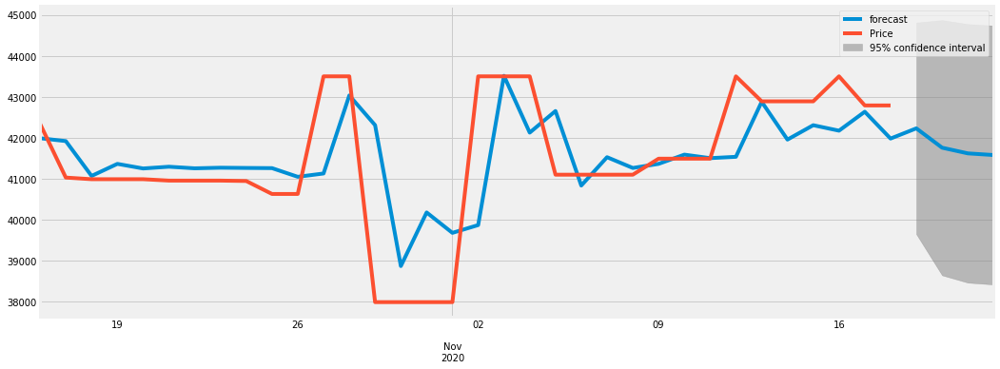

0.7635267751760516
2020-10-16    41989.102242
2020-10-17    41918.917268
2020-10-18    41068.810817
2020-10-19    41363.128871
2020-10-20    41251.122233
2020-10-21    41293.726608
2020-10-22    41254.590177
2020-10-23    41269.482500
2020-10-24    41263.815460
2020-10-25    41259.230031
2020-10-26    41047.930553
2020-10-27    41128.336680
2020-10-28    43032.667977
2020-10-29    42308.009751
2020-10-30    38869.646501
2020-10-31    40178.052353
2020-11-01    39680.162587
2020-11-02    39869.625374
2020-11-03    43511.647398
2020-11-04    42125.742948
2020-11-05    42653.123379
2020-11-06    40834.379896
2020-11-07    41526.469255
2020-11-08    41263.107387
2020-11-09    41363.324899
2020-11-10    41588.797677
2020-11-11    41502.998161
2020-11-12    41535.647588
2020-11-13    42877.673308
2020-11-14    41955.733567
2020-11-15    42306.560768
2020-11-16    42173.059933
2020-11-17    42635.117771
2020-11-18    41980.614506
2020-11-19    42229.673677
2020-11-20    41757.805982
2020-11-2

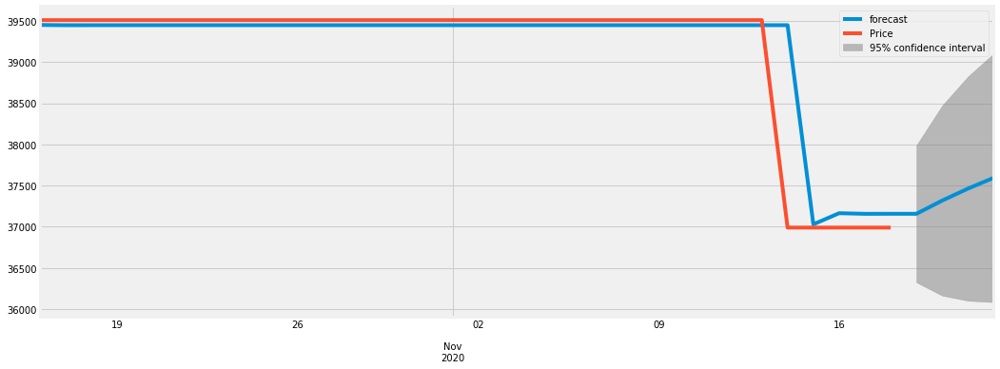

0.9915910477071642
2020-10-16    39450.437310
2020-10-17    39447.461151
2020-10-18    39447.635617
2020-10-19    39447.625912
2020-10-20    39447.626453
2020-10-21    39447.626423
2020-10-22    39447.626425
2020-10-23    39447.626425
2020-10-24    39447.626425
2020-10-25    39447.626425
2020-10-26    39447.626425
2020-10-27    39447.626425
2020-10-28    39447.626425
2020-10-29    39447.626425
2020-10-30    39447.626425
2020-10-31    39447.626425
2020-11-01    39447.626425
2020-11-02    39447.626425
2020-11-03    39447.626425
2020-11-04    39447.626425
2020-11-05    39447.626425
2020-11-06    39447.626425
2020-11-07    39447.626425
2020-11-08    39447.626425
2020-11-09    39447.626425
2020-11-10    39447.626425
2020-11-11    39447.626425
2020-11-12    39447.626425
2020-11-13    39447.626425
2020-11-14    39447.626425
2020-11-15    37029.650024
2020-11-16    37164.541241
2020-11-17    37157.016089
2020-11-18    37157.435893
2020-11-19    37157.412474
2020-11-20    37318.112236
2020-11-2

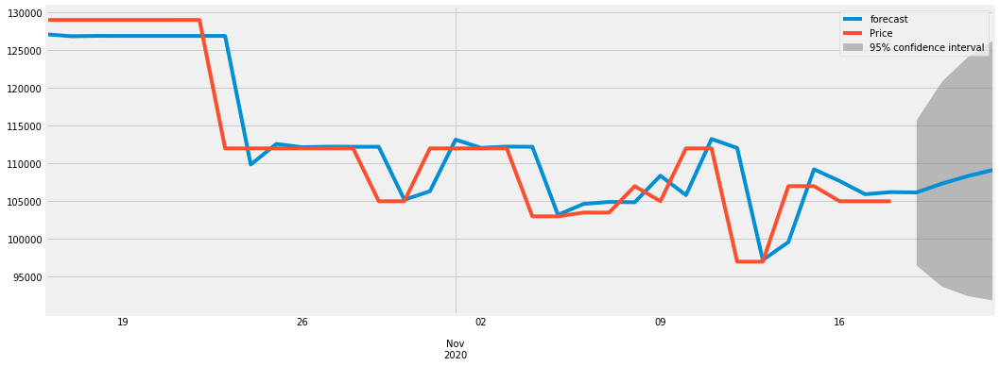

0.9796236763010917
2020-10-16    127095.788663
2020-10-17    126834.336800
2020-10-18    126882.078374
2020-10-19    126874.584547
2020-10-20    126875.791774
2020-10-21    126875.598095
2020-10-22    126875.629188
2020-10-23    126876.625982
2020-10-24    109846.116289
2020-10-25    112579.944690
2020-10-26    112141.095950
2020-10-27    112211.542294
2020-10-28    112200.233871
2020-10-29    112202.049159
2020-10-30    105189.260831
2020-10-31    106314.991080
2020-11-01    113146.779774
2020-11-02    112050.104554
2020-11-03    112226.148719
2020-11-04    112197.889169
2020-11-05    103186.358064
2020-11-06    104632.937181
2020-11-07    104901.617211
2020-11-08    104858.487257
2020-11-09    108371.659172
2020-11-10    105804.135496
2020-11-11    113228.785042
2020-11-12    112036.940630
2020-11-13     97201.482731
2020-11-14     99582.949691
2020-11-15    109218.516646
2020-11-16    107671.763961
2020-11-17    105916.486414
2020-11-18    106198.252944
2020-11-19    106153.022275
2

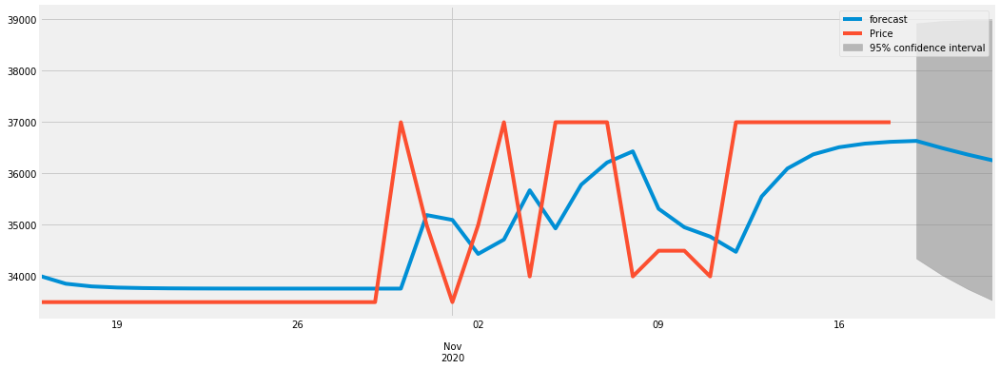

0.8067822069253221
2020-10-16    33999.267939
2020-10-17    33847.994820
2020-10-18    33795.793635
2020-10-19    33773.429409
2020-10-20    33762.976882
2020-10-21    33757.893599
2020-10-22    33755.373756
2020-10-23    33754.112799
2020-10-24    33753.478824
2020-10-25    33753.159323
2020-10-26    33752.998114
2020-10-27    33752.916725
2020-10-28    33752.875621
2020-10-29    33752.854860
2020-10-30    33752.844373
2020-10-31    35184.084994
2020-11-01    35089.261156
2020-11-02    34427.967151
2020-11-03    34707.287216
2020-11-04    35666.248319
2020-11-05    34923.911953
2020-11-06    35775.682325
2020-11-07    36205.977798
2020-11-08    36423.353514
2020-11-09    35306.384682
2020-11-10    34946.580540
2020-11-11    34764.815478
2020-11-12    34468.528104
2020-11-13    35545.632518
2020-11-14    36089.761745
2020-11-15    36364.643745
2020-11-16    36503.508027
2020-11-17    36573.659177
2020-11-18    36609.097980
2020-11-19    36627.000877
2020-11-20    36487.604733
2020-11-2

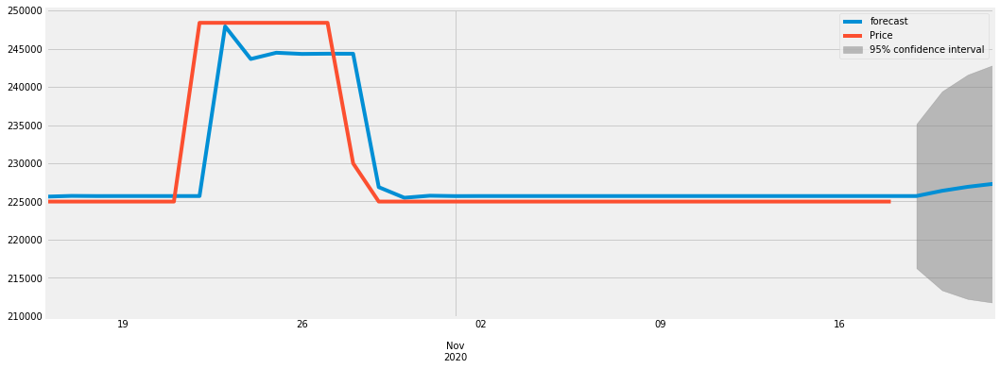

0.9588732851384248
2020-10-16    225631.831964
2020-10-17    225730.358980
2020-10-18    225708.536371
2020-10-19    225712.606619
2020-10-20    225711.819943
2020-10-21    225711.970967
2020-10-22    225711.941936
2020-10-23    247921.185551
2020-10-24    243652.874532
2020-10-25    244473.185177
2020-10-26    244315.532759
2020-10-27    244345.831384
2020-10-28    244340.008405
2020-10-29    226877.655959
2020-10-30    225487.913320
2020-10-31    225755.002732
2020-11-01    225703.671823
2020-11-02    225713.536917
2020-11-03    225711.640982
2020-11-04    225712.005354
2020-11-05    225711.935327
2020-11-06    225711.948785
2020-11-07    225711.946199
2020-11-08    225711.946696
2020-11-09    225711.946600
2020-11-10    225711.946619
2020-11-11    225711.946615
2020-11-12    225711.946616
2020-11-13    225711.946616
2020-11-14    225711.946616
2020-11-15    225711.946616
2020-11-16    225711.946616
2020-11-17    225711.946616
2020-11-18    225711.946616
2020-11-19    225711.946616
2

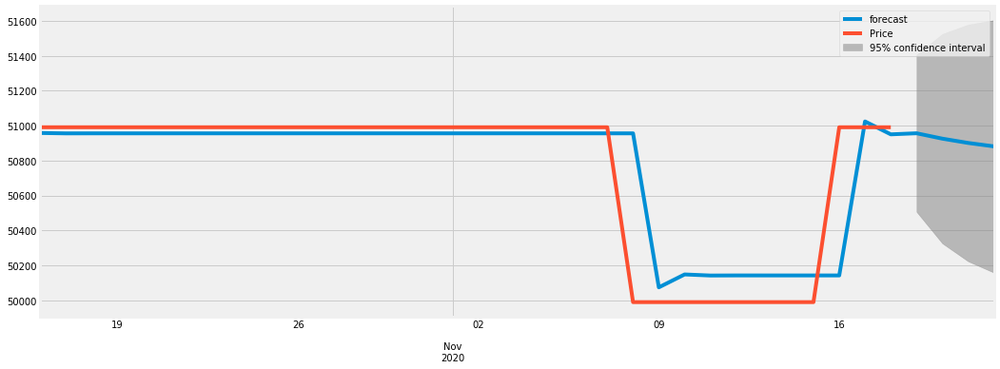

0.9668308904565631
2020-10-16    50958.172731
2020-10-17    50955.918103
2020-10-18    50956.119968
2020-10-19    50956.103153
2020-10-20    50956.104562
2020-10-21    50956.104444
2020-10-22    50956.104454
2020-10-23    50956.104453
2020-10-24    50956.104453
2020-10-25    50956.104453
2020-10-26    50956.104453
2020-10-27    50956.104453
2020-10-28    50956.104453
2020-10-29    50956.104453
2020-10-30    50956.104453
2020-10-31    50956.104453
2020-11-01    50956.104453
2020-11-02    50956.104453
2020-11-03    50956.104453
2020-11-04    50956.104453
2020-11-05    50956.104453
2020-11-06    50956.104453
2020-11-07    50956.104453
2020-11-08    50956.104453
2020-11-09    50074.580365
2020-11-10    50148.436539
2020-11-11    50142.248694
2020-11-12    50142.767126
2020-11-13    50142.723691
2020-11-14    50142.727330
2020-11-15    50142.727025
2020-11-16    50142.727051
2020-11-17    51024.251138
2020-11-18    50950.394963
2020-11-19    50956.582808
2020-11-20    50925.755101
2020-11-2

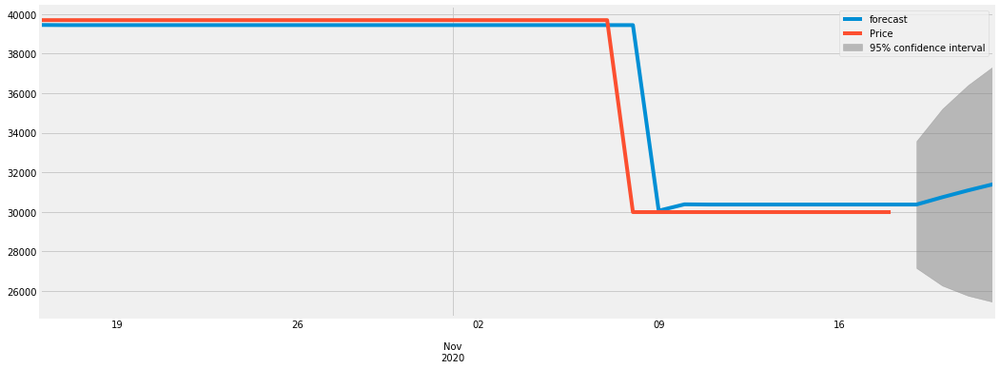

0.9957924290290529
2020-10-16    39449.030068
2020-10-17    39441.204844
2020-10-18    39441.481688
2020-10-19    39441.472209
2020-10-20    39441.472533
2020-10-21    39441.472522
2020-10-22    39441.472523
2020-10-23    39441.472523
2020-10-24    39441.472523
2020-10-25    39441.472523
2020-10-26    39441.472523
2020-10-27    39441.472523
2020-10-28    39441.472523
2020-10-29    39441.472523
2020-10-30    39441.472523
2020-10-31    39441.472523
2020-11-01    39441.472523
2020-11-02    39441.472523
2020-11-03    39441.472523
2020-11-04    39441.472523
2020-11-05    39441.472523
2020-11-06    39441.472523
2020-11-07    39441.472523
2020-11-08    39441.472523
2020-11-09    30061.232632
2020-11-10    30382.777054
2020-11-11    30371.754861
2020-11-12    30372.132690
2020-11-13    30372.119738
2020-11-14    30372.120182
2020-11-15    30372.120167
2020-11-16    30372.120168
2020-11-17    30372.120168
2020-11-18    30372.120168
2020-11-19    30372.120168
2020-11-20    30741.529509
2020-11-2

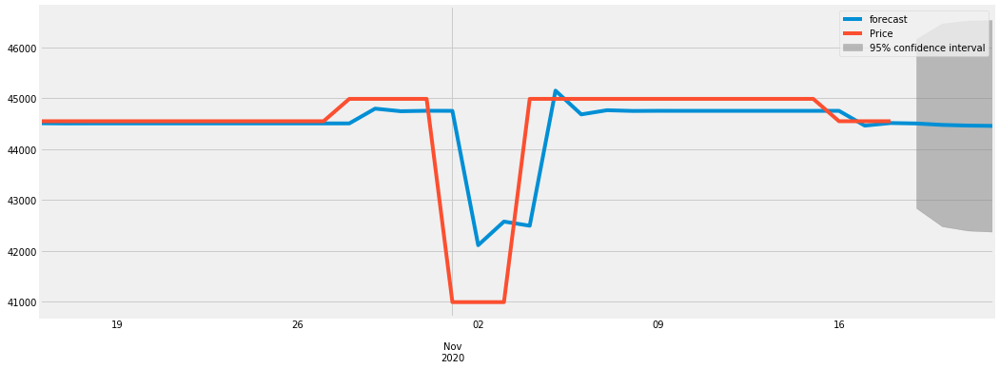

0.8296236650981559
2020-10-16    44510.409804
2020-10-17    44506.301005
2020-10-18    44507.097962
2020-10-19    44506.960424
2020-10-20    44506.984679
2020-10-21    44506.980418
2020-10-22    44506.981167
2020-10-23    44506.981035
2020-10-24    44506.981058
2020-10-25    44506.981054
2020-10-26    44506.981055
2020-10-27    44506.981055
2020-10-28    44506.981055
2020-10-29    44797.795300
2020-10-30    44746.674084
2020-10-31    44755.660503
2020-11-01    44754.080812
2020-11-02    42110.592635
2020-11-03    42575.282152
2020-11-04    42493.596011
2020-11-05    45151.721196
2020-11-06    44684.458692
2020-11-07    44766.597129
2020-11-08    44752.158301
2020-11-09    44754.696452
2020-11-10    44754.250279
2020-11-11    44754.328710
2020-11-12    44754.314923
2020-11-13    44754.317347
2020-11-14    44754.316921
2020-11-15    44754.316995
2020-11-16    44754.316982
2020-11-17    44463.502740
2020-11-18    44514.623955
2020-11-19    44505.637536
2020-11-20    44477.896235
2020-11-2

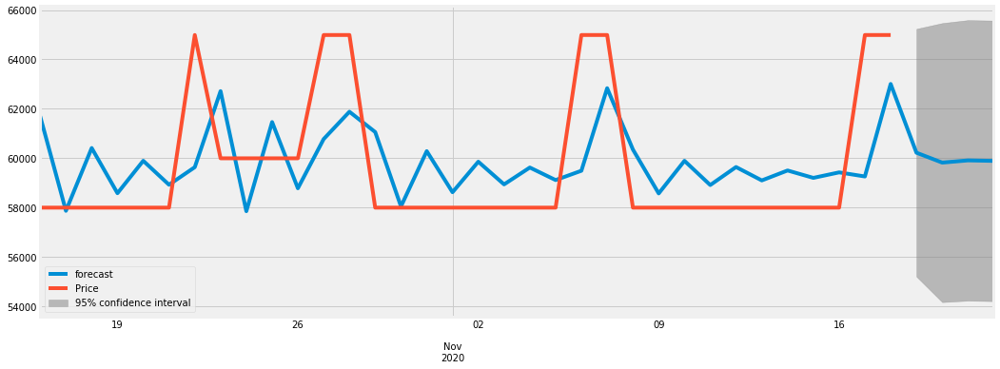

0.48952752755664664
2020-10-16    61696.926584
2020-10-17    57860.523816
2020-10-18    60407.148047
2020-10-19    58574.368590
2020-10-20    59889.208738
2020-10-21    58917.577958
2020-10-22    59630.395933
2020-10-23    62714.528458
2020-10-24    57844.724301
2020-10-25    61459.637486
2020-10-26    58774.824603
2020-10-27    60769.473680
2020-10-28    61878.386379
2020-10-29    61054.491891
2020-10-30    58038.902939
2020-10-31    60280.021284
2020-11-01    58614.421906
2020-11-02    59852.292541
2020-11-03    58932.297357
2020-11-04    59616.042653
2020-11-05    59107.876511
2020-11-06    59485.549559
2020-11-07    62833.048335
2020-11-08    60345.156281
2020-11-09    58565.990993
2020-11-10    59888.283551
2020-11-11    58905.543044
2020-11-12    59635.925191
2020-11-13    59093.098165
2020-11-14    59496.532416
2020-11-15    59196.696205
2020-11-16    59419.537355
2020-11-17    59253.919672
2020-11-18    63005.199402
2020-11-19    60217.212282
2020-11-20    59815.473109
2020-11-

In [95]:
r2=0
count=0
lg=0
ind=0
Name=[]
Price=[]
forecast=[]
for i in range(len(Lap_list)):
    a=[]
    date=[]
    price=[]
    for j in range(len(df['LaptopID'])):
        if Lap_list[i]==df['LaptopID'][j]:
            a.append(j)
            name=df["Name"][j]
            temp_price=df['Price'][j]
    Name.append(name)
    Price.append(temp_price)
    for j in a:
        date.append(df['Date'][j])
        price.append(df['Price'][j])    
    r1 = pd.date_range(start='2020-10-15', end='2020-11-18')
    p1=[]
    flag=0
    for k in range(len(r1)):
        for j in range(len(date)):
            if(r1[k]==date[j]):
                p1.append(price[j])
                flag=1
        if(flag==0):
            p1.append(np.nan)
        flag=0
    Product=pd.DataFrame()
    Product['Date']=r1
    Product['Price']=p1
    Product=Product.ffill(axis = 0)
    Product=Product.bfill(axis = 0)
    Product.set_index("Date",inplace=True)
    print(i,Product)
    # Predicting the microsoft stocks volume
    rcParams['figure.figsize'] = 16, 6
    model = ARIMA(Product['Price'], order=(1,0,1))
    try:
        result = model.fit()    
        result.plot_predict(start=1, end=38)
        plt.show()
        print(r2_score(Product['Price'], result.predict(start=1,end=35)))
        r2+=r2_score(Product['Price'], result.predict(start=1,end=35))
        count+=1
        print(result.predict(start=1,end=38))
        forecast.append(result.predict(start=1,end=38)[-1])
    except np.linalg.LinAlgError as l:
        print(Product['Price'].mode())
        lg+=1
        forecast.append(temp_price)
    except ValueError as l:
        print(Product['Price'].mode())
        ind+=1
        forecast.append(temp_price)

In [91]:
print(len(Name),len(Price),len(forecast))

969 969 969


In [99]:
forecast[9]

35732.54043197246

In [78]:
r2/count

0.874183735253927

In [58]:
count

500

In [59]:
print(ind,lg,count,r2)

15 454 500 437.0918676269635


In [60]:
len(Lap_list)

969

In [100]:
Forecast_df=pd.DataFrame()
Forecast_df['Name']=Name
Forecast_df['Price']=Price
Forecast_df['Forecast']=forecast

In [101]:
Forecast_df

,Name,Price,Forecast
0,HP Pavilion Gaming 16 Core i5 10th Gen - (8 GB...,77990,78776.630643
1,Lenovo Core i5 10th Gen - (16 GB/1 TB HDD/Wind...,83400,83400.000000
2,Asus ZenBook Pro Duo Core i9 9th Gen - (32 GB/...,264990,264990.000000
3,Lenovo Z51-70 Core i5 5th Gen - (4 GB/1 TB HDD...,55000,55000.000000
4,Lenovo Ideapad C340 Core i5 10th Gen - (8 GB/5...,77018,77018.000000
...,...,...,...
964,Dell G5 15 SE Ryzen 7 Octa Core 4800H - (16 GB...,89990,89990.000000
965,MSI GF Core i5 9th Gen - (8 GB/1 TB HDD/Window...,53990,53990.000000
966,HP 14q Core i3 7th Gen - (4 GB/1 TB HDD/Window...,34688,34688.000000
967,Asus TUF Gaming Core i5 9th Gen - (8 GB/512 GB...,64990,59885.503525


In [102]:
Forecast_df["Change"]=Forecast_df['Forecast']-Forecast_df['Price']

In [104]:
Forecast_df['Change in %']=(Forecast_df['Change'] *100)/Forecast_df['Price']

In [105]:
Forecast_df

,Name,Price,Forecast,Change,Change in %
0,HP Pavilion Gaming 16 Core i5 10th Gen - (8 GB...,77990,78776.630643,786.630643,1.00863
1,Lenovo Core i5 10th Gen - (16 GB/1 TB HDD/Wind...,83400,83400.000000,0.000000,0.00000
2,Asus ZenBook Pro Duo Core i9 9th Gen - (32 GB/...,264990,264990.000000,0.000000,0.00000
3,Lenovo Z51-70 Core i5 5th Gen - (4 GB/1 TB HDD...,55000,55000.000000,0.000000,0.00000
4,Lenovo Ideapad C340 Core i5 10th Gen - (8 GB/5...,77018,77018.000000,0.000000,0.00000
...,...,...,...,...,...
964,Dell G5 15 SE Ryzen 7 Octa Core 4800H - (16 GB...,89990,89990.000000,0.000000,0.00000
965,MSI GF Core i5 9th Gen - (8 GB/1 TB HDD/Window...,53990,53990.000000,0.000000,0.00000
966,HP 14q Core i3 7th Gen - (4 GB/1 TB HDD/Window...,34688,34688.000000,0.000000,0.00000
967,Asus TUF Gaming Core i5 9th Gen - (8 GB/512 GB...,64990,59885.503525,-5104.496475,-7.85428


In [106]:
Forecast_df.to_json("Flipkart_Forecast.json")